# Applied AI - PROJECT


**By:**  
- **Sofia Padovani Plazzi** (*Student ID: sofpad-3*)  
- **Devashish Singha Roy** (*Student ID: devsin-3*)

This project aims to perform an extensive set of experiments and evaluate the classification performance of 3 unsupervised models (Kmeans, GaussianMixture and Birch) and 5 supervised models (KNN, SVM, Random Forest, Perceptron, Decision Tree) on 22 datasets from 121 UCI datasets.  

### Contents
- Preprocessing of each datasets to bring them to a common ground so that they can be passed through the models in an automated way.
- Data exploration and Visualization
- Training, testing and recording results 
- Cross Validation
- Grid Search
- Agregating results and using them for comparitive study as described in the project report

#### Load the libraries

These are the essential libraries used throughout this project. 
A random seed ensures that we compare different approaches as the results of same approaches remain the same.

In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import Perceptron
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import make_scorer, adjusted_rand_score
from scipy.optimize import linear_sum_assignment
from sklearn.cluster import Birch
from IPython.display import display, HTML
import time

RANDOM_SEED = 12345

In [74]:
# Class for all the file operations
class DataOperation():
    def __init__(self, file_name):
        self._file_name = file_name
        self._df = pd.DataFrame
    
    # Function to read file
    def open_file(self, delimiter = None):
        try:
            if delimiter is not None:
                self._df = pd.read_csv(self._file_name, delimiter = delimiter, encoding='utf-8')
            else:
                self._df = pd.read_csv(self._file_name, encoding='utf-8')
            return self._df
        except NameError:
            print("File not found")

    # Function to write file
    def save_file(self, df, file_name):
        try:
            df.to_csv(file_name, index=False)
            print(f"File saved successfully to {file_name}")
        except Exception as e:
            print(f"An error occurred while saving the file: {e}")

    # Function to concatenate two dataframes
    def concat_files(self, df1, df2):
        try:
            self._df = pd.concat([df1, df2], axis=0, ignore_index = True)
            #df_concat = pd.concat(df1, df2, index=True)
            return self._df
        except Exception as e:
            print(f"An error occurred while concatinating the given dataframes: {e}")
    
    # Function to preprocess and prepare the data
    def prepare_data(self, drop_null= None, scale=None, features=None):
        # Dropping all null values, if it exists
        if drop_null == 'y':
            if self._df.isnull().sum().sum() > 0:
                self._df = self._df.dropna()
                print(f'Null values after removing  {self._df.isnull().sum().sum()}')
            else:
                print('No null values found')
         
        if scale == 'y':
            scaler = StandardScaler().fit(features)
            features = scaler.transform(features)
         
        return (self._df, features)
        
    # Generic function to visualise the data by printing
    def explore_data(self):
        if self._df is not None:
            #To visualize top rows of data 
            print("\nTop rows of data\n")
            print(self._df.head())

            #To visualize data information
            print("\nData Information\n")
            print(self._df.info())

            #To visualize data description
            print("\nData description\n")
            print(self._df.describe())

            #To visualize if data has any null values
            print("\nNull values\n")
            print(self._df.isnull().sum())
        else:
            print("No dataset provided")


In [76]:
# Class for all the plot visualisations
class PlotVisualisation():
    def __init__(self, df=None):
        self._df = df
    
    # Function to plot label imbalance
    def plot_label_imbalance(self,labels):
        # Plot count of different categoring in the class variable.. This is to see the imbalance in the class.. 
        sns.countplot(x = labels)
        plt.title('Label imbalance')
        plt.xlabel('Labels')          # x-axis label
        plt.ylabel('Count')           # y-axis label
        plt.show()

    # Function to plot feature correlation
    def plot_feature_correlation(self,features):
        sns.heatmap(features.corr(),annot = True, cmap = 'coolwarm', fmt = '.2f')
        plt.title('Feature correlation matrix')
        plt.show()


    def comparison_of_features_to_label(self, label_col_name, label_val1, label_val2 ):
        
        # Divide the dataset by label, so to compare features by label.
        ds1 = self._df[self._df[label_col_name]==label_val1]
        ds2 = self._df[self._df[label_col_name]==label_val2]

        # get just features
        features = [feature for feature in ds1.columns if feature != label_col_name]
        
        for feature in features:
            fig, axs = plt.subplots(1,2)
            # Set a title for the entire figure
            fig.suptitle(f'Comparison of {feature} by {label_col_name}')
        
            axs[0].hist(ds1[feature],edgecolor='black',color='blue')            
            axs[0].set_title(f'{label_val1} {label_col_name}')
            axs[0].set_xlabel(feature)
            #axs[0].set_ylabel('Apple Count')
            axs[0].set_ylabel(label_col_name)
            axs[0].set_xticks(np.arange(-6,8, step=2))
            axs[0].set_xticklabels(np.arange(-6,8,step=2), rotation = 45)
        
            axs[1].set_title(f'{label_val2} {label_col_name}')
            axs[1].set_xlabel(feature)
            #axs[1].set_ylabel('Apple Count')
            axs[1].set_ylabel(label_col_name)
            axs[1].hist(ds2[feature],edgecolor='black',color='yellow')
            axs[1].set_xticks(np.arange(-6,8,step=2))
            axs[1].set_xticklabels(np.arange(-6,8,step=2), rotation = 45)
            
            # adjust layout so that they dont over lap
            plt.tight_layout()
            plt.show()
        

In [1]:
# Class to handle model proccessing. This class inherits from parent class DataOperation, PlotVisualisation
class ModelProcessing(DataOperation, PlotVisualisation):
    def __init__(self,file_name):
        DataOperation.__init__(self,file_name)
        PlotVisualisation.__init__(self, self._df) 
        
    # Function to get the data
    def get_df(self):
        return (self._df)


    # Function to train and test model
    def modelling(self, X, y, model, label_values, label_context, positive_class):

        # split the data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=RANDOM_SEED, stratify=y)

        # Scale the training data
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test) # Use the same scalling as train on the test

        # fit the data to model
        training_time = 0.0
        start_time = time.time()        
        model.fit(X_train,y_train)
        end_time = time.time()
        training_time = end_time - start_time

        # test the model
        y_pred = model.predict(X_test)

        # Metrics
        model_name = type(model).__name__  # get model name
        
        if model_name in ['KMeans','GaussianMixture','Birch']:
            
            # Create a confusion matrix
            contingency_matrix = confusion_matrix(y_test, y_pred)

            # Find the best mapping using linear sum assignment            
            row_ind, col_ind = linear_sum_assignment(-contingency_matrix)
            
            # Create a mapping of cluster to label
            label_mapping = {col: row for row, col in zip(row_ind, col_ind)}

            # Remap predicted labels
            y_pred_mapped = np.array([label_mapping[label] for label in y_pred])
            
            # accuracy = (TP + TN) /  (TP + TN + FP + FN)
            accuracy = accuracy_score(y_test, y_pred_mapped)
                        
            # precision = TP  /  (TP + FP )
            precision = precision_score(y_pred_mapped,y_test, pos_label=positive_class) # pos_label specifies the label that should be considered positive class
            
            # recall = TP  /  (TP + FN )
            recall = recall_score(y_pred_mapped,y_test, pos_label=positive_class)
            
            # f1 = 2 * (precision * recall) / (precision + recall)
            f1 = f1_score(y_pred_mapped,y_test, average='weighted') # average='weighted' - Weighted averaging takes the weighted average of F1 scores for each class, weighted by the number of true instances for each class. It's useful when classes are imbalanced.
            
            # cross validation             
            #ari_scorer = make_scorer(adjusted_rand_score) # Custom scorer using ARI
            #cv_scores = cross_val_score(model, X, y=None, scoring=ari_scorer, cv=5) 
            cv_scores = 0
            
            # Plot confusion matrix
            conf_matrix = confusion_matrix(y_test,y_pred_mapped) # Passing actual labels and predicted labels                        
            matrix_viz = ConfusionMatrixDisplay(conf_matrix, display_labels = [label_context[lv] for lv in label_values])
            matrix_viz.plot(colorbar=False,cmap='Blues')
            plt.show()
            
        else:               
            # accuracy = (TP + TN) /  (TP + TN + FP + FN)
            accuracy = model.score(X_test, y_test) # deafault score is accuracy
            
            # precision = TP  /  (TP + FP )
            precision = precision_score(y_pred,y_test, pos_label=positive_class) # pos_label specifies the label that should be considered positive class
            
            # recall = TP  /  (TP + FN )
            recall = recall_score(y_pred,y_test, pos_label=positive_class)
            
            # f1 = 2 * (precision * recall) / (precision + recall)
            f1 = f1_score(y_pred,y_test, average='weighted') # average='weighted' - Weighted averaging takes the weighted average of F1 scores for each class, weighted by the number of true instances for each class. It's useful when classes are imbalanced.
            
            # cross validation 
            cv_scores = cross_val_score(model, X, y, cv=5) 
            
            # Plot confusion matrix
            conf_matrix = confusion_matrix(y_test,y_pred) # Passing actual labels and predicted labels            
            matrix_viz = ConfusionMatrixDisplay(conf_matrix, display_labels = [label_context[lv] for lv in label_values])
            matrix_viz.plot(colorbar=False,cmap='Blues')
            plt.show()
        

        # return accuracy, precision, recall, f1 score, cross validation scores
        return (accuracy, precision, recall, f1, cv_scores,training_time)

    
    # Function to do grid search to get the best model and best hyperparameters
    def grid_search(self, X, y, model,grid):

        # split the data using a proportion of 70-30
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=RANDOM_SEED, stratify=y)

        # Scale the training data
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test) # Use the same scalling as train on the test

        # Define the gridsearch algorithm
        grid_search = GridSearchCV(estimator=model, param_grid=grid, cv=3, scoring='accuracy', n_jobs=-1)
        
        # fit the data to grid serach alorithm
        grid_search.fit(X_train,y_train)

        # best model and best parameters
        best_model = grid_search.best_estimator_
        best_parameters = grid_search.best_params_
                
        # return the best model and best parameters
        return (best_model, best_parameters)

NameError: name 'DataOperation' is not defined

### Handling of the 22 files.. Preparing a common ground for all the files so that they can be passed to the models in the same way.

In [78]:
# Dictionary to store all the file details
file_details = {}

#### 1. Handling for winequality dataset

https://archive.ics.uci.edu/dataset/186/wine+quality

In [79]:
# Test DataOperation class
do = DataOperation('winequality-red.csv')
df_red = do.open_file(delimiter=';')
#df_red = do.open_file()

do = DataOperation('winequality-white.csv')
df_white = do.open_file(delimiter=';')
#df_white = do.open_file()

# add a column type to distinguish between read and white wnes in the combined dataframe
df_red['type'] = 1
df_white['type'] = 0
df_red_white = do.concat_files(df_red, df_white)

# Save as csv file
do.save_file(df_red_white, 'winequality-df-red-white.csv')

# Save the file details to the file_details dictionary
file_details['Winequality'] = {
                                'fname': 'winequality-df-red-white.csv',
                                'label_col_name': 'type',
                                'label_values': ['1', '0'],
                                'label_context': {'1': 'Red wine', '0': 'White wine'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }

File saved successfully to winequality-df-red-white.csv


#### 2. Handling for spambase file

https://archive.ics.uci.edu/dataset/94/spambase

In [80]:
# Load .data file
df = pd.read_csv(r'./spambase/spambase.data', header=None)
df.columns = ['word_freq_make',	'word_freq_address',	'word_freq_all',	'word_freq_3d',	'word_freq_our',	'word_freq_over',	'word_freq_remove',	'word_freq_internet',	'word_freq_order',	'word_freq_mail',	'word_freq_receive',	'word_freq_will',	'word_freq_people',	'word_freq_report',	'word_freq_addresses',	'word_freq_free',	'word_freq_business',	'word_freq_email',	'word_freq_you',	'word_freq_credit',	'word_freq_your',	'word_freq_font',	'word_freq_000',	'word_freq_money',	'word_freq_hp',	'word_freq_hpl',	'word_freq_george',	'word_freq_650',	'word_freq_lab',	'word_freq_labs',	'word_freq_telnet',	'word_freq_857',	'word_freq_data',	'word_freq_415',	'word_freq_85',	'word_freq_technology',	'word_freq_1999',	'word_freq_parts',	'word_freq_pm',	'word_freq_direct',	'word_freq_cs',	'word_freq_meeting',	'word_freq_original',	'word_freq_project',	'word_freq_re',	'word_freq_edu',	'word_freq_table',	'word_freq_conference',	'char_freq_;',	'char_freq_(',	'char_freq_[',	'char_freq_!',	'char_freq_$',	'char_freq_#',	'capital_run_length_average',	'capital_run_length_longest',	'capital_run_length_total','spam']
#print(df.head())
df.to_csv('spambase.csv', index=False) # save the file as csv

# Save the file details to the file_details dictionary
file_details['Spambase'] =  {
                                'fname': 'spambase.csv',
                                'label_col_name': 'spam',
                                'label_values': ['1', '0'],
                                'label_context': {'1': 'Spam', '0': 'Not-spam'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }

#### 3. Handling for "Statlog (Australian Credit Approval)" file (st-australian-credit)

https://archive.ics.uci.edu/dataset/143/statlog+australian+credit+approval


In [81]:
# Load .data file
df = pd.read_csv(r'./statlog+australian+credit+approval/australian.dat', delimiter  =' ', header=None)
df.columns = ['A1',	'A2',	'A3',	'A4',	'A5',	'A6',	'A7',	'A8',	'A9',	'A10',	'A11',	'A12',	'A13',	'A14',	'A15']
#print(df.head())
df.to_csv('statlog_australian_credit_approval.csv',  index=False) # save the file as csv
file_details['statlog_australian_credit_approval'] = {
                                                        'fname': 'statlog_australian_credit_approval.csv',
                                                        'label_col_name': 'A15',
                                                        'label_values': ['0', '1'],
                                                        'label_context': {'0': '1', '1': '2'},
                                                        'positive_class': 1,
                                                        'instance_model_processing': ''
                                                    }

#### 4. Handling for pima dataset

https://www.kaggle.com/datasets/uciml/pima-indians-diabetes-database

In [82]:
file_details['Pima'] = {
                        'fname': 'diabetes.csv',
                        'label_col_name': 'Outcome',
                        'label_values': ['1', '0'],
                        'label_context': {'1': 'Diabetic', '0': 'Non-Diabetic'},
                        'positive_class': 1,
                        'instance_model_processing': ''    
                        }

#### 5. Handling for Twonorm dataset

https://www.kaggle.com/datasets/timrie/twonorm


In [83]:
file_details['Twonorm'] = {
                        'fname': 'twonorm.csv',
                        'label_col_name': ' Class',
                        'label_values': ['1', '0'],
                        'label_context': {'1': '1', '0': '0'},
                        'positive_class': 1,
                        'instance_model_processing': ''    
                        }

#### 6. Handling for "Blood Transfusion Service Center" dataset

https://archive.ics.uci.edu/dataset/176/blood+transfusion+service+center


In [84]:
# Open and read the .names file to get the column names
with open(r'./blood+transfusion+service+center/transfusion.names', "r") as file:
    content = file.read()
print(content)

Title: Blood Transfusion Service Center Data Set

Abstract: Data taken from the Blood Transfusion Service Center in Hsin-Chu City 
in Taiwan -- this is a classification problem.
	

-----------------------------------------------------

Data Set Characteristics: Multivariate
Number of Instances: 748
Area: Business
Attribute Characteristics: Real
Number of Attributes: 5
Date Donated: 2008-10-03
Associated Tasks: Classification
Missing Values? N/A

-----------------------------------------------------

Source:

Original Owner and Donor
Prof. I-Cheng Yeh
Department of Information Management
Chung-Hua University,
Hsin Chu, Taiwan 30067, R.O.C.
e-mail:icyeh 'at' chu.edu.tw
TEL:886-3-5186511

Date Donated: October 3, 2008 

-----------------------------------------------------

Data Set Information:

To demonstrate the RFMTC marketing model (a modified version of RFM), this study 
adopted the donor database of Blood Transfusion Service Center in Hsin-Chu City 
in Taiwan. The center passes the

In [85]:
# Load .data file
df = pd.read_csv(r'./blood+transfusion+service+center/transfusion.data', delimiter  =',')

df.columns = ['Recency','Frequency', 'Monetary','Time',	'Donated']
#print(df.head())
df.to_csv('blood_transfusion_service_center.csv',  index=False) # save the file as csv
file_details['blood_transfusion_service_center'] = {
                                                        'fname': 'blood_transfusion_service_center.csv',
                                                        'label_col_name': 'Donated',
                                                        'label_values': ['0', '1'],
                                                        'label_context': {'0': 'Not donated', '1': 'Donated'},
                                                        'positive_class': 1,
                                                        'instance_model_processing': ''
                                                    }

#### 7. Handling for "Breast Cancer Wisconsin (Original)" dataset

https://archive.ics.uci.edu/dataset/15/breast+cancer+wisconsin+original

In [86]:
# Open and read the .names file to get the column names
with open(r'./breast+cancer+wisconsin+original/breast-cancer-wisconsin.names', "r") as file:
    content = file.read()
print(content)

Citation Request:
   This breast cancer databases was obtained from the University of Wisconsin
   Hospitals, Madison from Dr. William H. Wolberg.  If you publish results
   when using this database, then please include this information in your
   acknowledgements.  Also, please cite one or more of:

   1. O. L. Mangasarian and W. H. Wolberg: "Cancer diagnosis via linear 
      programming", SIAM News, Volume 23, Number 5, September 1990, pp 1 & 18.

   2. William H. Wolberg and O.L. Mangasarian: "Multisurface method of 
      pattern separation for medical diagnosis applied to breast cytology", 
      Proceedings of the National Academy of Sciences, U.S.A., Volume 87, 
      December 1990, pp 9193-9196.

   3. O. L. Mangasarian, R. Setiono, and W.H. Wolberg: "Pattern recognition 
      via linear programming: Theory and application to medical diagnosis", 
      in: "Large-scale numerical optimization", Thomas F. Coleman and Yuying
      Li, editors, SIAM Publications, Philadelphia 199

In [87]:
# Load .data file
df = pd.read_csv(r'./breast+cancer+wisconsin+original/breast-cancer-wisconsin.data', delimiter  =',')

df.columns = ['Sample code number', 'Clump Thickness', 'Uniformity of Cell Size', 'Uniformity of Cell Shape', 'Marginal Adhesion', 'Single Epithelial Cell Size', 'Bare Nuclei', 'Bland Chromatin', 'Normal Nucleoli', 'Mitoses', 'Class' ]
df = df.drop(columns = 'Sample code number')  # Dropiing the id number column
df.replace('?', np.nan, inplace=True) # Since there are 16 unvailable value which are '?' in the file, Replace '?' with NaN
df['Class'] = df['Class'].replace({2: 0, 4: 1})
df.to_csv('breast_cancer_wisconsin.csv',  index=False) # save the file as csv
file_details['breast_cancer_wisconsin'] = {
                                            'fname': 'breast_cancer_wisconsin.csv',
                                            'label_col_name': 'Class',
                                            'label_values': ['0', '1'],
                                            'label_context': {'0': 'benign', '1': 'malignant'},
                                            'positive_class': 1,
                                            'instance_model_processing': ''
                                        }

#### 8. Handling for "Breast Cancer Wisconsin (Diagnostic)" dataset (WDBC)

https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic

In [88]:
# Open and read the .names file to get the column names
with open(r'./breast+cancer+wisconsin+diagnostic/wdbc.names', "r") as file:
    content = file.read()
print(content)

1. Title: Wisconsin Diagnostic Breast Cancer (WDBC)

2. Source Information

a) Creators: 

	Dr. William H. Wolberg, General Surgery Dept., University of
	Wisconsin,  Clinical Sciences Center, Madison, WI 53792
	wolberg@eagle.surgery.wisc.edu

	W. Nick Street, Computer Sciences Dept., University of
	Wisconsin, 1210 West Dayton St., Madison, WI 53706
	street@cs.wisc.edu  608-262-6619

	Olvi L. Mangasarian, Computer Sciences Dept., University of
	Wisconsin, 1210 West Dayton St., Madison, WI 53706
	olvi@cs.wisc.edu 

b) Donor: Nick Street

c) Date: November 1995

3. Past Usage:

first usage:

	W.N. Street, W.H. Wolberg and O.L. Mangasarian 
	Nuclear feature extraction for breast tumor diagnosis.
	IS&T/SPIE 1993 International Symposium on Electronic Imaging: Science
	and Technology, volume 1905, pages 861-870, San Jose, CA, 1993.

OR literature:

	O.L. Mangasarian, W.N. Street and W.H. Wolberg. 
	Breast cancer diagnosis and prognosis via linear programming. 
	Operations Research, 43(4), pag

In [89]:
# Load .data file
df = pd.read_csv(r'./breast+cancer+wisconsin+diagnostic/wdbc.data', delimiter  =',', header=None)
#print(df.head)

df.columns = ['ID number', 'Diagnosis', 'F1',	'F2',	'F3',	'F4',	'F5',	'F6',	'F7',	'F8',	'F9',	'F10',	'F11',	'F12',	'F13',	'F14',	'F15',	'F16',	'F17',	'F18',	'F19',	'F20',	'F21',	'F22',	'F23',	'F24',	'F25',	'F26',	'F27',	'F28',	'F29',	'F30']
df = df.drop(columns = 'ID number')  # Dropiing the id number column
df['Diagnosis'] = df['Diagnosis'].replace({'B': 0, 'M': 1}).astype(int)
#df['Diagnosis'].replace('B', 0, inplace = True)
#df['Diagnosis'].replace('M', 1, inplace = True)
df.to_csv('breast_cancer_wisconsin_diagnostic.csv',  index=False) # save the file as csv

file_details['breast_cancer_wisconsin_diagnostic'] = {
                                            'fname': 'breast_cancer_wisconsin_diagnostic.csv',
                                            'label_col_name': 'Diagnosis',
                                            'label_values': ['0', '1'],
                                            'label_context': {'0': 'benign', '1': 'malignant'},
                                            'positive_class': 1,
                                            'instance_model_processing': ''
                                        }


C:\Users\royma\AppData\Local\Temp\ipykernel_19104\1705515909.py:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Diagnosis'] = df['Diagnosis'].replace({'B': 0, 'M': 1}).astype(int)


#### 9. Handling for "ILPD (Indian Liver Patient Dataset)" dataset

https://archive.ics.uci.edu/dataset/225/ilpd+indian+liver+patient+dataset

In [90]:
# Load .data file
df = pd.read_csv(r'./ilpd+indian+liver+patient+dataset/Indian Liver Patient Dataset (ILPD).csv', delimiter  =',', header=None)
#print(df.head)

df.columns = ['Age', 'Gender', 'TB',	'DB',	'Alkphos',	'Sgpt',	'Sgot',	'TP',	'ALB',	'A/G Ratio',	'Selector']

df['Gender'] = df['Gender'].replace({'Male': 1, 'Female': 2}).astype(int)
df.to_csv('indian_liver_patient_dataset.csv',  index=False) # save the file as csv

file_details['indian_liver_patient_dataset'] = {
                                            'fname': 'indian_liver_patient_dataset.csv',
                                            'label_col_name': 'Selector',
                                            'label_values': ['1', '2'],
                                            'label_context': {'1': 'Liver disease', '2': 'No liver disease'},
                                            'positive_class': 1,
                                            'instance_model_processing': ''
                                        }


C:\Users\royma\AppData\Local\Temp\ipykernel_19104\1081113602.py:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Gender'] = df['Gender'].replace({'Male': 1, 'Female': 2}).astype(int)


#### 10. Handling for "mammographic mass" dataset

https://archive.ics.uci.edu/dataset/161/mammographic+mass

In [91]:
# Open and read the .names file to get the column names
with open(r'./mammographic+mass/mammographic_masses.names', "r") as file:
    content = file.read()
print(content)

1. Title: Mammographic Mass Data

2. Sources:

   (a) Original owners of database:
        Prof. Dr. Rüdiger Schulz-Wendtland
        Institute of Radiology, Gynaecological Radiology, University Erlangen-Nuremberg
        Universitätsstraße 21-23
        91054 Erlangen, Germany
        
   (b) Donor of database:
        Matthias Elter
        Fraunhofer Institute for Integrated Circuits (IIS)
        Image Processing and Medical Engineering Department (BMT) 
        Am Wolfsmantel 33
        91058 Erlangen, Germany
        matthias.elter@iis.fraunhofer.de
        (49) 9131-7767327 
        
   (c) Date received: October 2007
 
3. Past Usage:
    M. Elter, R. Schulz-Wendtland and T. Wittenberg (2007)
    The prediction of breast cancer biopsy outcomes using two CAD approaches that both emphasize an intelligible decision process.
    Medical Physics 34(11), pp. 4164-4172

4. Relevant Information:
    Mammography is the most effective method for breast cancer screening
    available today

In [92]:
# Load .data file
df = pd.read_csv(r'./mammographic+mass/mammographic_masses.data', delimiter  =',')

df.columns = ['BI-RADS assessment', 'Age', 'Shape', 'Margin', 'Density', 'Severity']
df.replace('?', np.nan, inplace=True) # Since there are unvailable value which are '?' in the file, Replace '?' with NaN
df.to_csv('mammographic_masses.csv',  index=False) # save the file as csv
file_details['mammographic_masses'] = {
                                            'fname': 'mammographic_masses.csv',
                                            'label_col_name': 'Severity',
                                            'label_values': ['0', '1'],
                                            'label_context': {'0': 'benign', '1': 'malignant'},
                                            'positive_class': 1,
                                            'instance_model_processing': ''
                                        }

#### 11. Handling for "parkinsons" dataset

https://archive.ics.uci.edu/dataset/174/parkinsons


In [93]:
# Open and read the .names file to get the column names
with open(r'./parkinsons/parkinsons.names', "r") as file:
    content = file.read()
print(content)

Title: Parkinsons Disease Data Set

Abstract: Oxford Parkinson's Disease Detection Dataset

-----------------------------------------------------	

Data Set Characteristics: Multivariate
Number of Instances: 197
Area: Life
Attribute Characteristics: Real
Number of Attributes: 23
Date Donated: 2008-06-26
Associated Tasks: Classification
Missing Values? N/A

-----------------------------------------------------	

Source:

The dataset was created by Max Little of the University of Oxford, in 
collaboration with the National Centre for Voice and Speech, Denver, 
Colorado, who recorded the speech signals. The original study published the 
feature extraction methods for general voice disorders.

-----------------------------------------------------

Data Set Information:

This dataset is composed of a range of biomedical voice measurements from 
31 people, 23 with Parkinson's disease (PD). Each column in the table is a 
particular voice measure, and each row corresponds one of 195 voice 
rec

In [94]:
# Load .data file
df = pd.read_csv(r'./parkinsons/parkinsons.data', delimiter  =',')
df = df.drop(columns = 'name')  # Dropiing the subject name column
df.to_csv('parkinsons.csv',  index=False) # save the file as csv
file_details['parkinsons'] = {
                                            'fname': 'parkinsons.csv',
                                            'label_col_name': 'status',
                                            'label_values': ['0', '1'],
                                            'label_context': {'0': 'Healthy', '1': 'Parkinson'},
                                            'positive_class': 1,
                                            'instance_model_processing': ''
                                        }

#### 12. Handling for "Planning" dataset

https://archive.ics.uci.edu/dataset/230/planning+relax

In [95]:
# Load .data file
df = pd.read_csv(r'./planning+relax/plrx.txt', delimiter = '\t', header=None)
df = df.iloc[:,:-1]  # Droping the last column which is generated based on the delimiter but doesnot have any data.
df.columns = ['F1',	'F2',	'F3',	'F4',	'F5',	'F6',	'F7',	'F8',	'F9',	'F10',	'F11',	'F12',	'Class' ]
df['Class'] = df['Class'].astype('int')
df.to_csv('plrx.csv',  index=False) # save the file as csv
file_details['Planning'] = {
                            'fname': 'plrx.csv',
                            'label_col_name': 'Class',
                            'label_values': ['1', '2'],
                            'label_context': {'1': 'Relax state', '2': 'Planning'},
                            'positive_class': 2,
                            'instance_model_processing': ''
                        }

#### 13. Handling for "SPECT" dataset

https://archive.ics.uci.edu/dataset/95/spect+heart


In [96]:
# Open and read the .names file to get the column names
with open(r'./spect+heart/SPECT.names', "r") as file:
    content = file.read()
print(content)

1. Title of Database: SPECT heart data 

2. Sources:
   -- Original owners: Krzysztof J. Cios, Lukasz A. Kurgan
	University of Colorado at Denver, Denver, CO 80217, U.S.A.
	Krys.Cios@cudenver.edu
	Lucy S. Goodenday
	Medical College of Ohio, OH, U.S.A.

   -- Donors: Lukasz A.Kurgan, Krzysztof J. Cios
   -- Date: 10/01/01

3. Past Usage:
	1. Kurgan, L.A., Cios, K.J., Tadeusiewicz, R., Ogiela, M. & Goodenday, L.S.
	   "Knowledge Discovery Approach to Automated Cardiac SPECT Diagnosis"
	   Artificial Intelligence in Medicine, vol. 23:2, pp 149-169, Oct 2001
		
	Results: The CLIP3 machine learning algorithm achieved 84.0% accuracy 
	References: 
		Cios, K.J., Wedding, D.K. & Liu, N. 
		CLIP3: cover learning using integer programming. 
		Kybernetes, 26:4-5, pp 513-536, 1997

		Cios, K.J. & Kurgan, L. 
		Hybrid Inductive Machine Learning: An Overview of CLIP Algorithms, 
		In: Jain, L.C., and Kacprzyk, J. (Eds.) 
	    	   New Learning Paradigms in Soft Computing, 
	   	   Physica-Verlag (Spr

In [97]:
# Load .data file
df = pd.read_csv(r'./spect+heart/SPECT.train', delimiter  =',')
df.columns = ['OVERALL_DIAGNOSIS','F1',	'F2',	'F3',	'F4',	'F5',	'F6',	'F7',	'F8',	'F9',	'F10',	'F11',	'F12',	'F13',	'F14',	'F15',	'F16',	'F17',	'F18',	'F19',	'F20',	'F21',	'F22']
df.to_csv('SPECT.csv',  index=False) # save the file as csv
 
file_details['SPECT'] = {
                                'fname': 'SPECT.csv',
                                'label_col_name': 'OVERALL_DIAGNOSIS',
                                'label_values': ['0', '1'],
                                'label_context': {'0': 'normal', '1': 'abnormal'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }
 

#### 14. Handling for "SPECTF Heart" dataset

https://archive.ics.uci.edu/dataset/96/spectf+heart


In [98]:
# Open and read the .names file to get the column names
with open(r'./spectf+heart/SPECTF.names', "r") as file:
    content = file.read()
print(content)

1. Title of Database: SPECTF heart data 

2. Sources:
   -- Original owners: Krzysztof J. Cios, Lukasz A. Kurgan
 	University of Colorado at Denver, Denver, CO 80217, U.S.A.
	Krys.Cios@cudenver.edu
	Lucy S. Goodenday
	Medical College of Ohio, OH, U.S.A.
   -- Donors: Lukasz A.Kurgan, Krzysztof J. Cios
   -- Date: 10/01/01

3. Past Usage:
	1. Kurgan, L.A., Cios, K.J., Tadeusiewicz, R., Ogiela, M. & Goodenday, L.S.
	   "Knowledge Discovery Approach to Automated Cardiac SPECT Diagnosis"
	   Artificial Intelligence in Medicine, vol. 23:2, pp 149-169, Oct 2001

	Results: The CLIP3 machine learning algorithm achieved 77.0% accuracy.
	CLIP3 references: 	
	  	Cios, K.J., Wedding, D.K. & Liu, N. 
		CLIP3: cover learning using integer programming. 
		Kybernetes, 26:4-5, pp 513-536, 1997
	
		Cios K. J. & Kurgan L. 
		Hybrid Inductive Machine Learning: An Overview of CLIP Algorithms, 
		In: Jain L.C., and Kacprzyk J. (Eds.) 
		    New Learning Paradigms in Soft Computing, 
		    Physica-Verlag (Sp

In [99]:
# Load .data file
df = pd.read_csv(r'./spectf+heart/SPECTF.train', delimiter  =',')
df.columns = ['OVERALL_DIAGNOSIS',	'F1R',	'F1S',	'F2R',	'F2S',	'F3R',	'F3S',	'F4R',	'F4S',	'F5R',	'F5S',	'F6R',	'F6S',	'F7R',	'F7S',	'F8R',	'F8S',	'F9R',	'F9S',	'F10R',	'F10S',	'F11R',	'F11S',	'F12R',	'F12S',	'F13R',	'F13S',	'F14R',	'F14S',	'F15R',	'F15S',	'F16R',	'F16S',	'F17R',	'F17S',	'F18R',	'F18S',	'F19R',	'F19S',	'F20R',	'F20S',	'F21R',	'F21S',	'F22R',	'F22S']
df.to_csv('SPECTF.csv',  index=False) # save the file as csv
 
file_details['SPECTF'] = {
                                'fname': 'SPECTF.csv',
                                'label_col_name': 'OVERALL_DIAGNOSIS',
                                'label_values': ['0', '1'],
                                'label_context': {'0': 'normal', '1': 'abnormal'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }
 

#### 15. Handling for "vertebral column - 2classes" dataset

https://archive.ics.uci.edu/dataset/212/vertebral+column


In [100]:
# Open and read the .names file to get the column names

# This is a file with 2 classes. We have used this file for further processing.
with open(r'./vertebral+column/column_2C_weka.arff', "r") as file:
    content = file.read()
print(content)

# this is same file but with 3 classes
with open(r'./vertebral+column/column_3C_weka.arff', "r") as file:
    content = file.read()
print(content)

@relation column_2C_weka

@attribute pelvic_incidence numeric
@attribute pelvic_tilt numeric
@attribute lumbar_lordosis_angle numeric
@attribute sacral_slope numeric
@attribute pelvic_radius numeric
@attribute degree_spondylolisthesis numeric

@attribute class {Abnormal, Normal}

@data
63.0278175,22.55258597,39.60911701,40.47523153,98.67291675,-0.254399986,Abnormal
39.05695098,10.06099147,25.01537822,28.99595951,114.4054254,4.564258645,Abnormal
68.83202098,22.21848205,50.09219357,46.61353893,105.9851355,-3.530317314,Abnormal
69.29700807,24.65287791,44.31123813,44.64413017,101.8684951,11.21152344,Abnormal
49.71285934,9.652074879,28.317406,40.06078446,108.1687249,7.918500615,Abnormal
40.25019968,13.92190658,25.1249496,26.32829311,130.3278713,2.230651729,Abnormal
53.43292815,15.86433612,37.16593387,37.56859203,120.5675233,5.988550702,Abnormal
45.36675362,10.75561143,29.03834896,34.61114218,117.2700675,-10.67587083,Abnormal
43.79019026,13.5337531,42.69081398,30.25643716,125.0028927,13.2890

In [101]:
# Load data file
df = pd.read_csv(r'./vertebral+column/column_2C.dat', delimiter  =' ')
df.to_csv('vertebral_column.csv',  index=False) # save the file as csv
df.columns = ['pelvic_incidence', 'pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope', 'pelvic_radius', 'degree_spondylolisthesis', 'class']
df['class'] = df['class'].replace({'AB':0, 'NO':1}).astype(int) # class values with integer values
df.to_csv('vertebral_column.csv',  index=False) # save the file as csv

file_details['vertebral_column'] = {
                                            'fname': 'vertebral_column.csv',
                                            'label_col_name': 'class',
                                            'label_values': ['0', '1'],
                                            'label_context': {'0': 'Abnormal', '1': 'Normal'},
                                            'positive_class': 1,
                                            'instance_model_processing': ''
                                        }
 

C:\Users\royma\AppData\Local\Temp\ipykernel_19104\3069372631.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['class'] = df['class'].replace({'AB':0, 'NO':1}).astype(int) # class values with integer values


#### 16. Handling for "acute-nephritis" dataset for detecting "Inflammation of urinary bladder"

https://www.kaggle.com/datasets/subh86/acute-nephritis


In [102]:
# Load .data file
df = pd.read_csv(r'./acute-nephritis/diagnosis.csv')
df.columns = ['Temperature of patient', 'Occurrence of nausea', 'Lumbar pain', 'Urine pushing', 'Micturition pains', 'Burning of urethra, itch, swelling of urethra outlet', 'Inflammation of urinary bladder', 'Nephritis of renal pelvis origin']
df = df.drop(columns = 'Nephritis of renal pelvis origin')  # This fle have two columns of labels. First we model for 'Inflammation of urinary bladder'. So removing the other label
df.replace({'no':0, 'yes':1}, inplace = True) # Changing all yes and no to 1 and 0
df.to_csv('diagnosis.csv',  index=False) # save the file as csv

file_details['diagnosis'] = {
                                'fname': 'diagnosis.csv',
                                'label_col_name': 'Inflammation of urinary bladder',
                                'label_values': ['0', '1'],
                                'label_context': {'0': 'No', '1': 'yes'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }
 

C:\Users\royma\AppData\Local\Temp\ipykernel_19104\3458129315.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.replace({'no':0, 'yes':1}, inplace = True) # Changing all yes and no to 1 and 0


#### 17. Handling for "acute-nephritis" dataset for detecting "Nephritis of renal pelvis origin"

https://www.kaggle.com/datasets/subh86/acute-nephritis


In [103]:
# Load .data file
df = pd.read_csv(r'./acute-nephritis/diagnosis.csv')
df.columns = ['Temperature of patient', 'Occurrence of nausea', 'Lumbar pain', 'Urine pushing', 'Micturition pains', 'Burning of urethra, itch, swelling of urethra outlet', 'Inflammation of urinary bladder', 'Nephritis of renal pelvis origin']
df.replace({'no':0, 'yes':1}, inplace = True) # Changing all yes and no to 1 and 0
df.to_csv('diagnosis_nephritis.csv',  index=False) # save the file as csv

file_details['diagnosis_nephritis'] = {
                                'fname': 'diagnosis_nephritis.csv',
                                'label_col_name': 'Nephritis of renal pelvis origin',
                                'label_values': ['0', '1'],
                                'label_context': {'0': 'No', '1': 'yes'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }
 

C:\Users\royma\AppData\Local\Temp\ipykernel_19104\1469680406.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.replace({'no':0, 'yes':1}, inplace = True) # Changing all yes and no to 1 and 0


#### 18. Handling for "Breast Cancer Wisconsin (Prognostic)"  (bc-wisc-prog)

https://archive.ics.uci.edu/dataset/16/breast+cancer+wisconsin+prognostic


In [104]:
# Open and read the .names file to get the column names

# This is a file with 2 classes. We have used this file for further processing.
with open(r'./breast+cancer+wisconsin+prognostic/wpbc.names', "r") as file:
    content = file.read()
print(content)

1. Title: Wisconsin Prognostic Breast Cancer (WPBC)

2. Source Information

a) Creators: 

	Dr. William H. Wolberg, General Surgery Dept., University of
	Wisconsin,  Clinical Sciences Center, Madison, WI 53792
	wolberg@eagle.surgery.wisc.edu

	W. Nick Street, Computer Sciences Dept., University of
	Wisconsin, 1210 West Dayton St., Madison, WI 53706
	street@cs.wisc.edu  608-262-6619

	Olvi L. Mangasarian, Computer Sciences Dept., University of
	Wisconsin, 1210 West Dayton St., Madison, WI 53706
	olvi@cs.wisc.edu 

b) Donor: Nick Street

c) Date: December 1995

3. Past Usage:

	Various versions of this data have been used in the following
	publications: 

	(i) W. N. Street, O. L. Mangasarian, and W.H. Wolberg. 
	An inductive learning approach to prognostic prediction. 
	In A. Prieditis and S. Russell, editors, Proceedings of the
	Twelfth International Conference on Machine Learning, pages
	522--530, San Francisco, 1995. Morgan Kaufmann.

	(ii) O.L. Mangasarian, W.N. Street and W.H. Wolbe

In [105]:
# Load .data file
df = pd.read_csv(r'./breast+cancer+wisconsin+prognostic/wpbc.data')
df.columns = ['ID number', 'Outcome', 'Time', 'F1',	'F2',	'F3',	'F4',	'F5',	'F6',	'F7',	'F8',	'F9',	'F10',	'F11',	'F12',	'F13',	'F14',	'F15',	'F16',	'F17',	'F18',	'F19',	'F20',	'F21',	'F22',	'F23',	'F24',	'F25',	'F26',	'F27',	'F28',	'F29',	'F30',	'F31',	'F32']
df = df.drop(columns = 'ID number')  # Remove ID number
df.replace('?', np.nan, inplace=True) # Changing non-avaibale (marked as '?' in the file) values to null 
df['Outcome'] = df['Outcome'].replace({'R': 1,'N': 0}).astype(int) # Chnage the label values to 0 and 1.
df.to_csv('breast_cancer_wisconsin_prognostic.csv',  index=False) # save the file as csv

file_details['breast_cancer_wisconsin_prognostic'] = {
                                'fname': 'breast_cancer_wisconsin_prognostic.csv',
                                'label_col_name': 'Outcome',
                                'label_values': ['0', '1'],
                                'label_context': {'0': 'Nonrecur', '1': 'Recur'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }

C:\Users\royma\AppData\Local\Temp\ipykernel_19104\1647495605.py:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Outcome'] = df['Outcome'].replace({'R': 1,'N': 0}).astype(int) # Chnage the label values to 0 and 1.


#### 19. Handling for "Connectionist Bench (Sonar, Mines vs. Rocks)"  (conn-bench-sonar)

https://archive.ics.uci.edu/dataset/151/connectionist+bench+sonar+mines+vs+rocks


In [106]:
# Open and read the .names file to get the column names
with open(r'./connectionist+bench+sonar+mines+vs+rocks/sonar.names', "r") as file:
    content = file.read()
print(content)

NAME: Sonar, Mines vs. Rocks

SUMMARY: This is the data set used by Gorman and Sejnowski in their study
of the classification of sonar signals using a neural network [1].  The
task is to train a network to discriminate between sonar signals bounced
off a metal cylinder and those bounced off a roughly cylindrical rock.

SOURCE: The data set was contributed to the benchmark collection by Terry
Sejnowski, now at the Salk Institute and the University of California at
San Deigo.  The data set was developed in collaboration with R. Paul
Gorman of Allied-Signal Aerospace Technology Center.

MAINTAINER: Scott E. Fahlman

PROBLEM DESCRIPTION:

The file "sonar.mines" contains 111 patterns obtained by bouncing sonar
signals off a metal cylinder at various angles and under various
conditions.  The file "sonar.rocks" contains 97 patterns obtained from
rocks under similar conditions.  The transmitted sonar signal is a
frequency-modulated chirp, rising in frequency.  The data set contains
signals obt

In [107]:
# Load .data file
df = pd.read_csv(r'./connectionist+bench+sonar+mines+vs+rocks/sonar.all-data')
df.columns = ['A1',	'A2',	'A3',	'A4',	'A5',	'A6',	'A7',	'A8',	'A9',	'A10',	'A11',	'A12',	'A13',	'A14',	'A15',	'A16',	'A17',	'A18',	'A19',	'A20',	'A21',	'A22',	'A23',	'A24',	'A25',	'A26',	'A27',	'A28',	'A29',	'A30',	'A31',	'A32',	'A33',	'A34',	'A35',	'A36',	'A37',	'A38',	'A39',	'A40',	'A41',	'A42',	'A43',	'A44',	'A45',	'A46',	'A47',	'A48',	'A49',	'A50',	'A51',	'A52',	'A53',	'A54',	'A55',	'A56',	'A57',	'A58',	'A59',	'A60', 'class']
df['class'] = df['class'].replace({'R': 1,'M': 0}).astype(int) # Chnage the label values to 0 and 1.
df.to_csv('connectionist_bench_sonar_mines_vs_rocks.csv',  index=False) # save the file as csv

file_details['connectionist_bench_sonar_mines_vs_rocks'] = {
                                'fname': 'connectionist_bench_sonar_mines_vs_rocks.csv',
                                'label_col_name': 'class',
                                'label_values': ['0', '1'],
                                'label_context': {'0': 'Mine', '1': 'Rock'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }


C:\Users\royma\AppData\Local\Temp\ipykernel_19104\1992239261.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['class'] = df['class'].replace({'R': 1,'M': 0}).astype(int) # Chnage the label values to 0 and 1.


#### 20. Handling for "echocardiogram" dataset

https://archive.ics.uci.edu/dataset/38/echocardiogram


In [108]:
# Open and read the .names file to get the column names
with open(r'./echocardiogram/echocardiogram.names', "r") as file:
    content = file.read()
print(content)

1. Title: Echocardiogram Data

2. Source Information:
   -- Donor: Steven Salzberg (salzberg@cs.jhu.edu)
   -- Collector:
      -- Dr. Evlin Kinney
      -- The Reed Institute
      -- P.O. Box 402603
      -- Maimi, FL 33140-0603
   -- Date Received: 28 February 1989

3. Past Usage:
   -- 1. Salzberg, S. (1988).  Exemplar-based learning: Theory and
         implementation (Technical Report TR-10-88).  Harvard University,
         Center for Research in Computing Technology, Aiken Computation
         Laboratory (33 Oxford Street; Cambridge, MA 02138).
      -- Steve applied his EACH program to predict survival (i.e., life
         or death), did not use the wall-motion attribute, and recorded 87 
         correct and 29 incorrect in an incremental application to this
         database.  He also showed that, by tuning EACH to this domain,
         EACH was able to derive (non-incrementally) a set of 28 
         hyper-rectangles that could perfectly classify 119 instances.
   -- 2. Kan

In [109]:
# Load .data file
df = pd.read_csv(r'./echocardiogram/echocardiogram.data', delimiter  =',',header = None, on_bad_lines='skip') # Added on_bad_lines='skip' as line 50 had more columns
df.columns = ['survival', 'still-alive', 'age-at-heart-attack',	'pericardial-effusion',	'fractional-shortening', 'epss', 'lvdd', 'wall-motion-score', 'wall-motion-index',	'mult',	'name',	'group',	'alive-at-1']
df = df.drop(columns = ['name','group'], axis=1)  # Remove ID number
df.replace('?', np.nan, inplace=True) # Changing non-avaibale (marked as '?' in the file) values to null 
df.to_csv('echocardiogram.csv',  index=False) # save the file as csv
 
file_details['echocardiogram'] = {
                                'fname': 'echocardiogram.csv',
                                'label_col_name': 'alive-at-1',
                                'label_values': ['0', '1'],
                                'label_context': {'0': 'not-aliveat1', '1': 'aliveat1'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }
 


#### 21. Handling for "Fertility" dataset

https://archive.ics.uci.edu/dataset/244/fertility


In [110]:
# Load data file
df = pd.read_csv(r'./fertility/fertility_Diagnosis.txt', delimiter  =',',header = None, on_bad_lines='skip') # Added on_bad_lines='skip' as line 50 had more columns
df.columns = ['season', 'age', 'child_diseases', 'accident', 'surgical_intervention', 'high_fevers', 'alcohol', 'smoking', 'hrs_sitting', 'diagnosis']
df['diagnosis'] = df['diagnosis'].replace({'N': 1,'O': 0}).astype(int) # Chnage the label values to 0 and 1.
df.to_csv('fertility_Diagnosis.csv',  index=False) # save the file as csv
 
file_details['fertility_Diagnosis'] = {
                                'fname': 'fertility_Diagnosis.csv',
                                'label_col_name': 'diagnosis',
                                'label_values': ['0', '1'],
                                'label_context': {'0': 'altered', '1': 'normal'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }
 


C:\Users\royma\AppData\Local\Temp\ipykernel_19104\1397341147.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['diagnosis'] = df['diagnosis'].replace({'N': 1,'O': 0}).astype(int) # Chnage the label values to 0 and 1.


#### 22. Handling for "haberman-survival" dataset

https://archive.ics.uci.edu/dataset/43/haberman+s+survival


In [111]:
# Open and read the .names file to get the column names
with open(r'./haberman+s+survival/haberman.names', "r") as file:
    content = file.read()
print(content)

1. Title: Haberman's Survival Data

2. Sources:
   (a) Donor:   Tjen-Sien Lim (limt@stat.wisc.edu)
   (b) Date:    March 4, 1999

3. Past Usage:
   1. Haberman, S. J. (1976). Generalized Residuals for Log-Linear
      Models, Proceedings of the 9th International Biometrics
      Conference, Boston, pp. 104-122.
   2. Landwehr, J. M., Pregibon, D., and Shoemaker, A. C. (1984),
      Graphical Models for Assessing Logistic Regression Models (with
      discussion), Journal of the American Statistical Association 79:
      61-83.
   3. Lo, W.-D. (1993). Logistic Regression Trees, PhD thesis,
      Department of Statistics, University of Wisconsin, Madison, WI.

4. Relevant Information:
   The dataset contains cases from a study that was conducted between
   1958 and 1970 at the University of Chicago's Billings Hospital on
   the survival of patients who had undergone surgery for breast
   cancer.

5. Number of Instances: 306

6. Number of Attributes: 4 (including the class attribute)

7. 

In [112]:
# Load .data file
df = pd.read_csv(r'./haberman+s+survival/haberman.data', delimiter  =',', header = None) 
df.columns = ['Age of patient at time of operation', 'Patient year of operation', 'Number of positive axillary nodes detected', 'Survival status']
df.to_csv('haberman.csv',  index=False) # save the file as csv
 
file_details['haberman'] = {
                                'fname': 'haberman.csv',
                                'label_col_name': 'Survival status',
                                'label_values': ['1', '2'],
                                'label_context': {'1': 'Survived 5 years or longer', '2': 'Died within 5 year'},
                                'positive_class': 1,
                                'instance_model_processing': ''
                            }


#### file_details is a dictionary containing all the required details of each file

In [113]:
print(file_details)

{'Winequality': {'fname': 'winequality-df-red-white.csv', 'label_col_name': 'type', 'label_values': ['1', '0'], 'label_context': {'1': 'Red wine', '0': 'White wine'}, 'positive_class': 1, 'instance_model_processing': ''}, 'Spambase': {'fname': 'spambase.csv', 'label_col_name': 'spam', 'label_values': ['1', '0'], 'label_context': {'1': 'Spam', '0': 'Not-spam'}, 'positive_class': 1, 'instance_model_processing': ''}, 'statlog_australian_credit_approval': {'fname': 'statlog_australian_credit_approval.csv', 'label_col_name': 'A15', 'label_values': ['0', '1'], 'label_context': {'0': '1', '1': '2'}, 'positive_class': 1, 'instance_model_processing': ''}, 'Pima': {'fname': 'diabetes.csv', 'label_col_name': 'Outcome', 'label_values': ['1', '0'], 'label_context': {'1': 'Diabetic', '0': 'Non-Diabetic'}, 'positive_class': 1, 'instance_model_processing': ''}, 'Twonorm': {'fname': 'twonorm.csv', 'label_col_name': ' Class', 'label_values': ['1', '0'], 'label_context': {'1': '1', '0': '0'}, 'positive_c

### All Models

In [118]:
# All models
model1 = Perceptron(max_iter=100, tol=True, shuffle = True) # Supervised
model2 = KNeighborsClassifier(n_neighbors=3) # Supervised
model3 = DecisionTreeClassifier(random_state = RANDOM_SEED) # Supervised
model4 = SVC(class_weight='balanced')  # Supervised
model5 = RandomForestClassifier(random_state=RANDOM_SEED)  # Supervised
model6 = KMeans(n_clusters=2, n_init = 10, random_state=RANDOM_SEED)    # Un-Supervised - KMeans
model7 = GaussianMixture(n_components=2) # Un-Supervised - GaussianMixture
model8 = Birch(n_clusters=2) # Un-Supervised - Birch

models = [model1, model2, model3, model4, model5, model6, model7, model8]
#models = [model1, model2, model3] # Used for testing

#### Instantiates object for each file for the class ModelProcessing. Also does pre-processing, exploration and visualisation of the data


Top rows of data

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
4                 11.0                  34.0   0.9978  3.51       0.56   

   alcohol  quality  type  
0      9.4        5     1  
1      9.8 

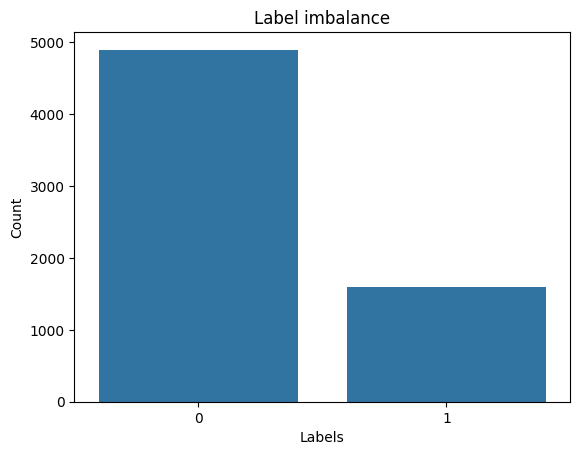

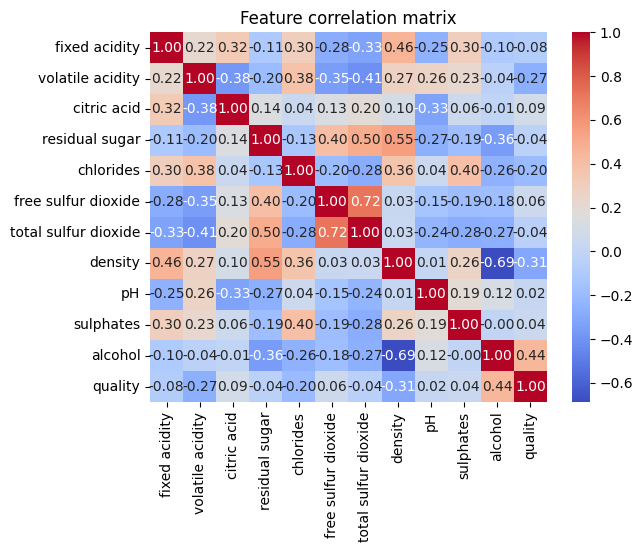


Top rows of data

   word_freq_make  word_freq_address  word_freq_all  word_freq_3d  \
0            0.00               0.64           0.64           0.0   
1            0.21               0.28           0.50           0.0   
2            0.06               0.00           0.71           0.0   
3            0.00               0.00           0.00           0.0   
4            0.00               0.00           0.00           0.0   

   word_freq_our  word_freq_over  word_freq_remove  word_freq_internet  \
0           0.32            0.00              0.00                0.00   
1           0.14            0.28              0.21                0.07   
2           1.23            0.19              0.19                0.12   
3           0.63            0.00              0.31                0.63   
4           0.63            0.00              0.31                0.63   

   word_freq_order  word_freq_mail  ...  char_freq_;  char_freq_(  \
0             0.00            0.00  ...         0.00

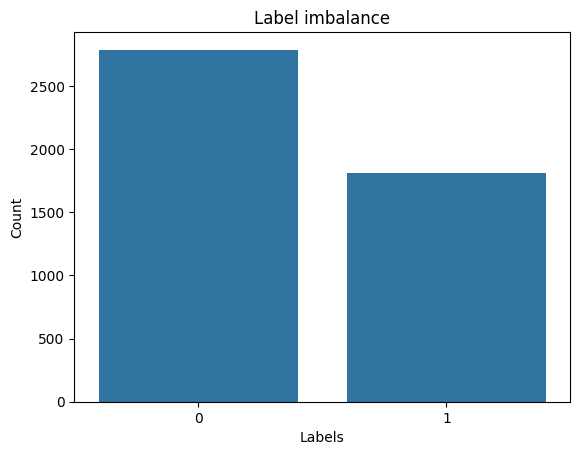

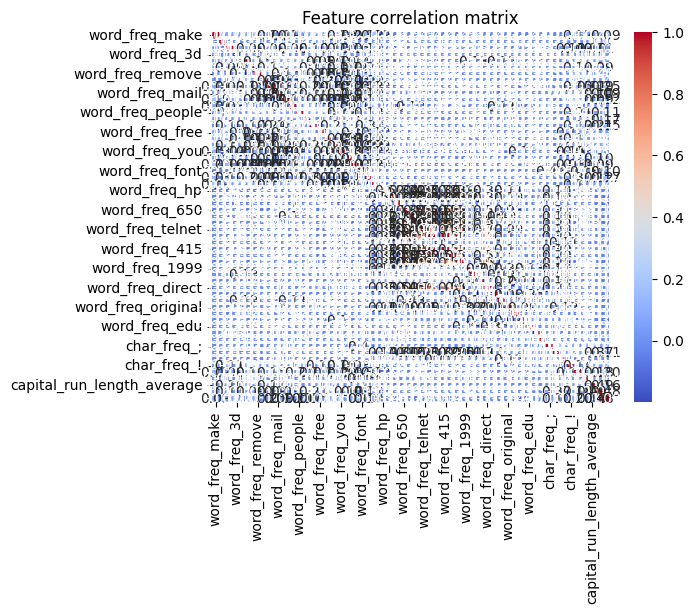


Top rows of data

   A1     A2     A3  A4  A5  A6     A7  A8  A9  A10  A11  A12  A13   A14  A15
0   1  22.08  11.46   2   4   4  1.585   0   0    0    1    2  100  1213    0
1   0  22.67   7.00   2   8   4  0.165   0   0    0    0    2  160     1    0
2   0  29.58   1.75   1   4   4  1.250   0   0    0    1    2  280     1    0
3   0  21.67  11.50   1   5   3  0.000   1   1   11    1    2    0     1    1
4   1  20.17   8.17   2   6   4  1.960   1   1   14    0    2   60   159    1

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 690 entries, 0 to 689
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   A1      690 non-null    int64  
 1   A2      690 non-null    float64
 2   A3      690 non-null    float64
 3   A4      690 non-null    int64  
 4   A5      690 non-null    int64  
 5   A6      690 non-null    int64  
 6   A7      690 non-null    float64
 7   A8      690 non-null    int64  
 8   A9      690 no

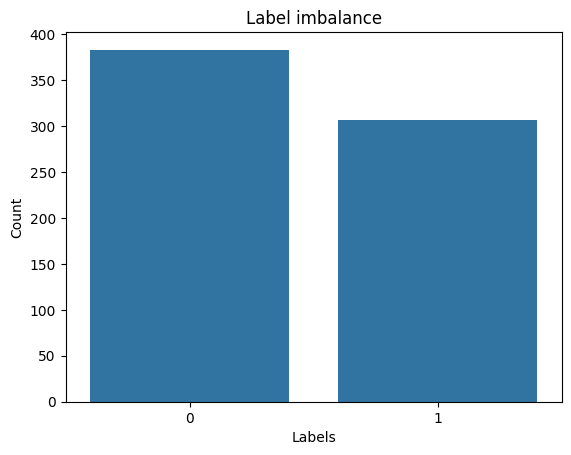

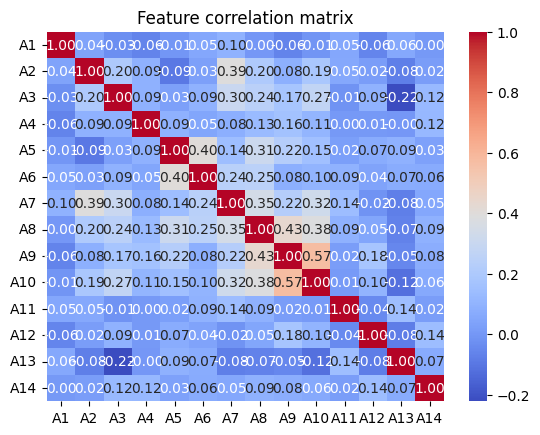


Top rows of data

   Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0            6      148             72             35        0  33.6   
1            1       85             66             29        0  26.6   
2            8      183             64              0        0  23.3   
3            1       89             66             23       94  28.1   
4            0      137             40             35      168  43.1   

   DiabetesPedigreeFunction  Age  Outcome  
0                     0.627   50        1  
1                     0.351   31        0  
2                     0.672   32        1  
3                     0.167   21        0  
4                     2.288   33        1  

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int6

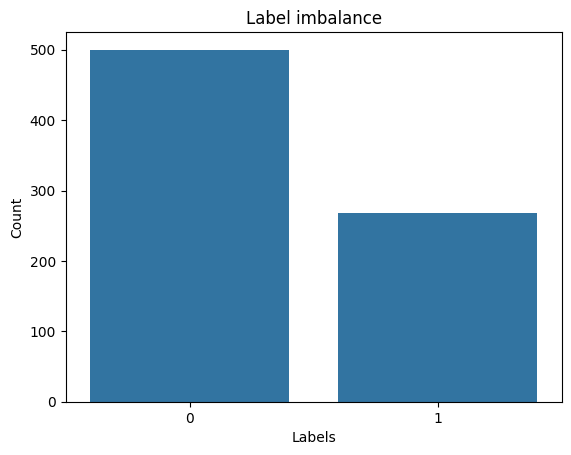

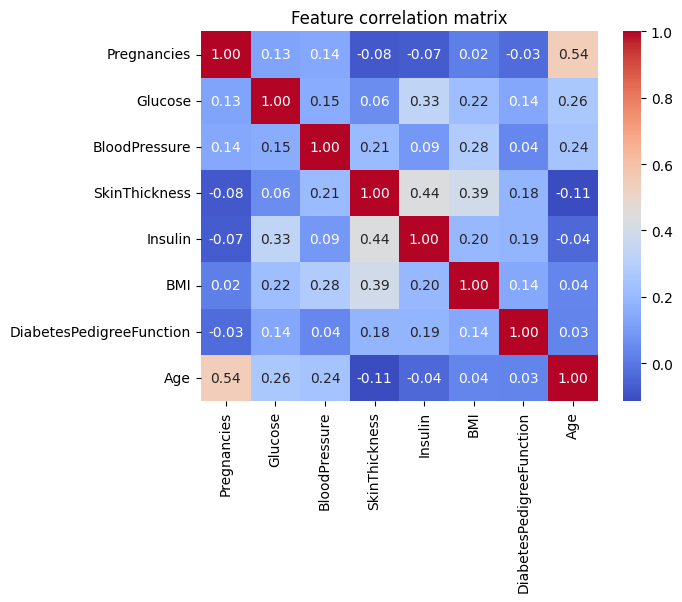


Top rows of data

       A1      A2      A3      A4      A5      A6      A7      A8      A9  \
0 -1.2036 -2.6240  0.5963  1.3859 -1.3597  0.6758  1.0008 -0.9589 -1.3487   
1  0.1713 -0.1669 -0.4155 -0.9974 -0.9459 -1.2382 -1.4933 -0.3869  0.6450   
2  0.7743 -0.6060 -1.9338 -0.3614  0.3864 -1.8636 -1.4551 -1.2079 -0.5478   
3 -1.2444  1.0990 -1.4684 -1.7003  0.4510 -0.9695 -0.5761  0.0877  0.1058   
4 -0.5520  0.3249  0.7253  0.2089  0.3148 -0.2104  0.8060 -0.3111 -2.3584   

      A10  ...     A12     A13     A14     A15     A16     A17     A18  \
0 -0.5572  ... -1.1223 -0.1817 -1.3170 -0.3551 -1.4220  0.1983 -3.0514   
1 -0.6253  ... -2.4557 -0.5912 -0.9731 -1.6570 -2.0039 -1.3395 -1.1801   
2 -1.1045  ...  0.5462 -0.2295 -1.6227  0.6551 -1.1460  0.9491 -2.7570   
3 -1.9614  ... -0.8800  1.0000 -1.7560 -0.6727  0.6034 -0.6858 -0.9101   
4  1.4880  ...  0.9096 -0.0908 -0.4096  1.5287 -0.1960  0.3843  0.1541   

      A19     A20   Class  
0 -1.0650 -0.8541       1  
1  1.3244  0.0202

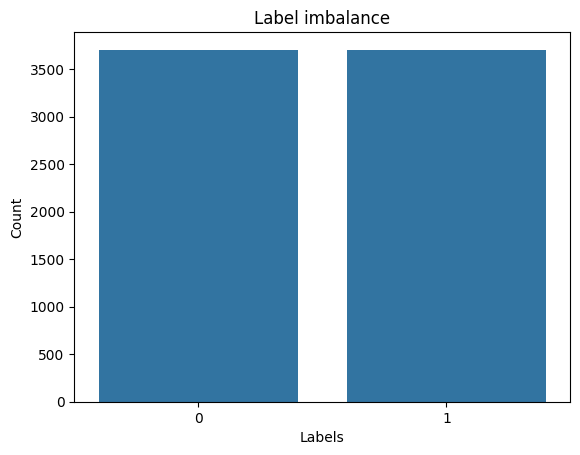

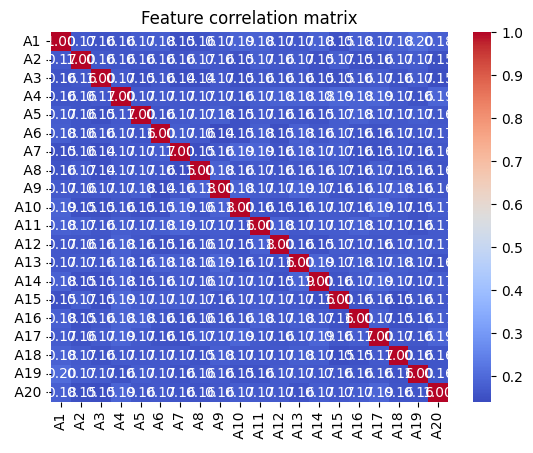


Top rows of data

   Recency  Frequency  Monetary  Time  Donated
0        2         50     12500    98        1
1        0         13      3250    28        1
2        1         16      4000    35        1
3        2         20      5000    45        1
4        1         24      6000    77        0

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 748 entries, 0 to 747
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Recency    748 non-null    int64
 1   Frequency  748 non-null    int64
 2   Monetary   748 non-null    int64
 3   Time       748 non-null    int64
 4   Donated    748 non-null    int64
dtypes: int64(5)
memory usage: 29.3 KB
None

Data description

          Recency   Frequency      Monetary        Time     Donated
count  748.000000  748.000000    748.000000  748.000000  748.000000
mean     9.506684    5.514706   1378.676471   34.282086    0.237968
std      8.095396    5.839307   1459.826781

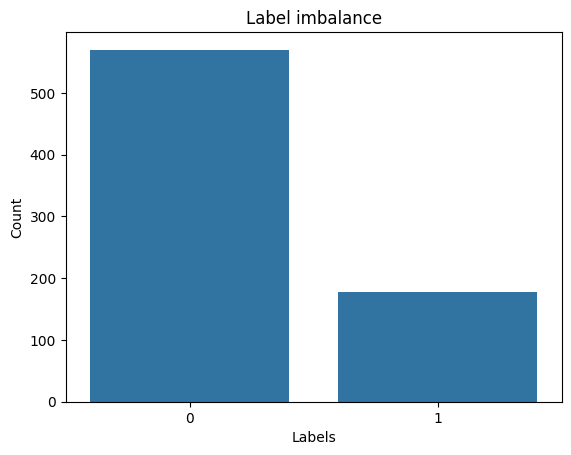

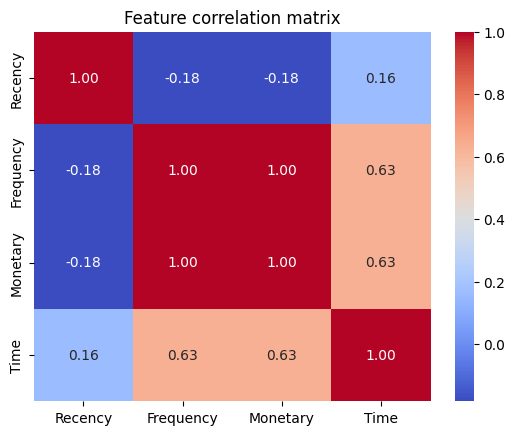


Top rows of data

   Clump Thickness  Uniformity of Cell Size  Uniformity of Cell Shape  \
0                5                        4                         4   
1                3                        1                         1   
2                6                        8                         8   
3                4                        1                         1   
4                8                       10                        10   

   Marginal Adhesion  Single Epithelial Cell Size  Bare Nuclei  \
0                  5                            7         10.0   
1                  1                            2          2.0   
2                  1                            3          4.0   
3                  3                            2          1.0   
4                  8                            7         10.0   

   Bland Chromatin  Normal Nucleoli  Mitoses  Class  
0                3                2        1      0  
1                3                1  

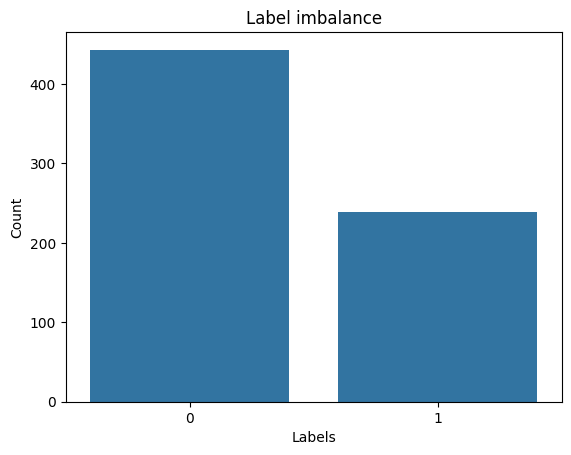

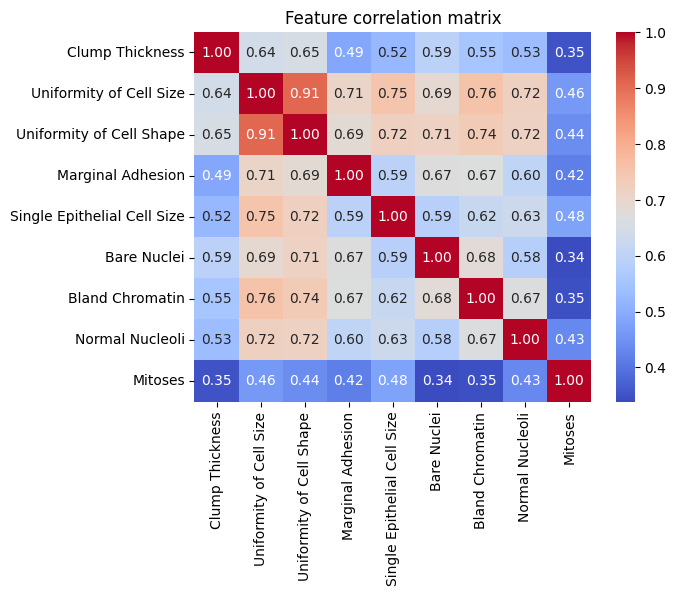


Top rows of data

   Diagnosis     F1     F2      F3      F4       F5       F6      F7       F8  \
0          1  17.99  10.38  122.80  1001.0  0.11840  0.27760  0.3001  0.14710   
1          1  20.57  17.77  132.90  1326.0  0.08474  0.07864  0.0869  0.07017   
2          1  19.69  21.25  130.00  1203.0  0.10960  0.15990  0.1974  0.12790   
3          1  11.42  20.38   77.58   386.1  0.14250  0.28390  0.2414  0.10520   
4          1  20.29  14.34  135.10  1297.0  0.10030  0.13280  0.1980  0.10430   

       F9  ...    F21    F22     F23     F24     F25     F26     F27     F28  \
0  0.2419  ...  25.38  17.33  184.60  2019.0  0.1622  0.6656  0.7119  0.2654   
1  0.1812  ...  24.99  23.41  158.80  1956.0  0.1238  0.1866  0.2416  0.1860   
2  0.2069  ...  23.57  25.53  152.50  1709.0  0.1444  0.4245  0.4504  0.2430   
3  0.2597  ...  14.91  26.50   98.87   567.7  0.2098  0.8663  0.6869  0.2575   
4  0.1809  ...  22.54  16.67  152.20  1575.0  0.1374  0.2050  0.4000  0.1625   

      F29    

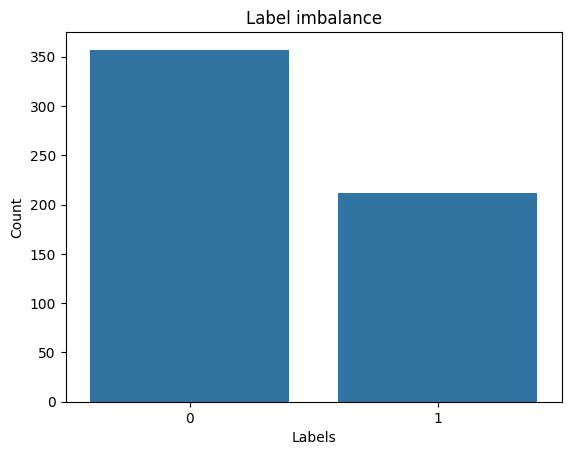

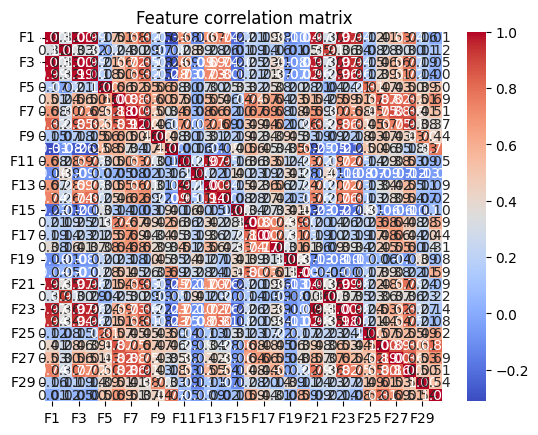


Top rows of data

   Age  Gender    TB   DB  Alkphos  Sgpt  Sgot   TP  ALB  A/G Ratio  Selector
0   65       2   0.7  0.1      187    16    18  6.8  3.3       0.90         1
1   62       1  10.9  5.5      699    64   100  7.5  3.2       0.74         1
2   62       1   7.3  4.1      490    60    68  7.0  3.3       0.89         1
3   58       1   1.0  0.4      182    14    20  6.8  3.4       1.00         1
4   72       1   3.9  2.0      195    27    59  7.3  2.4       0.40         1

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Age        583 non-null    int64  
 1   Gender     583 non-null    int64  
 2   TB         583 non-null    float64
 3   DB         583 non-null    float64
 4   Alkphos    583 non-null    int64  
 5   Sgpt       583 non-null    int64  
 6   Sgot       583 non-null    int64  
 7   TP         583 non-null 

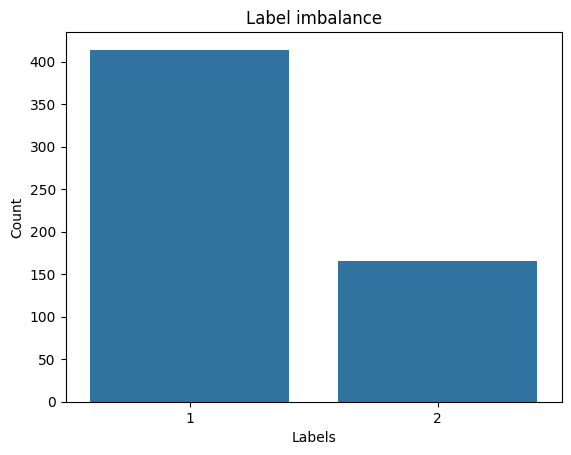

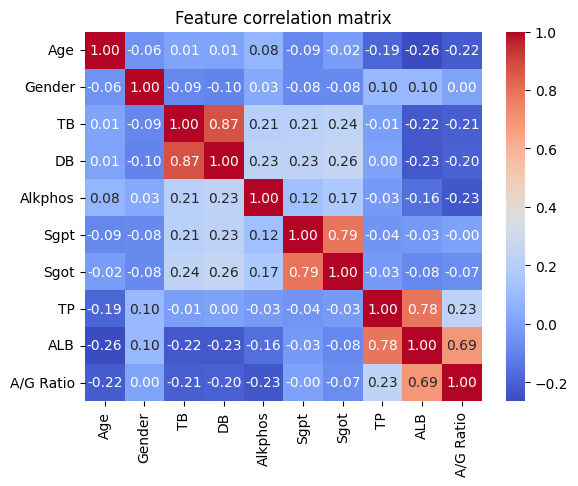


Top rows of data

   BI-RADS assessment   Age  Shape  Margin  Density  Severity
0                 4.0  43.0    1.0     1.0      NaN         1
1                 5.0  58.0    4.0     5.0      3.0         1
2                 4.0  28.0    1.0     1.0      3.0         0
3                 5.0  74.0    1.0     5.0      NaN         1
4                 4.0  65.0    1.0     NaN      3.0         0

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 960 entries, 0 to 959
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   BI-RADS assessment  958 non-null    float64
 1   Age                 955 non-null    float64
 2   Shape               929 non-null    float64
 3   Margin              912 non-null    float64
 4   Density             884 non-null    float64
 5   Severity            960 non-null    int64  
dtypes: float64(5), int64(1)
memory usage: 45.1 KB
None

Data description

       BI-RADS asse

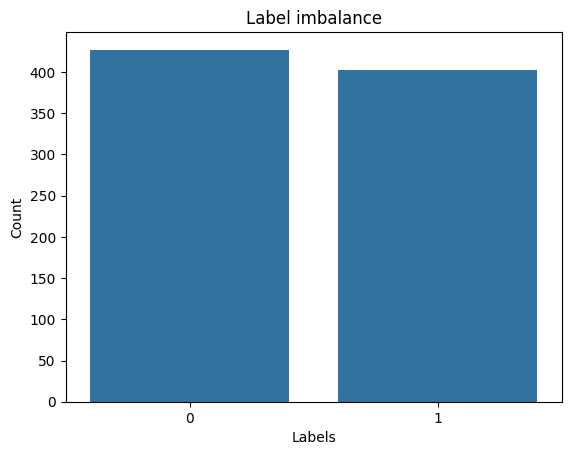

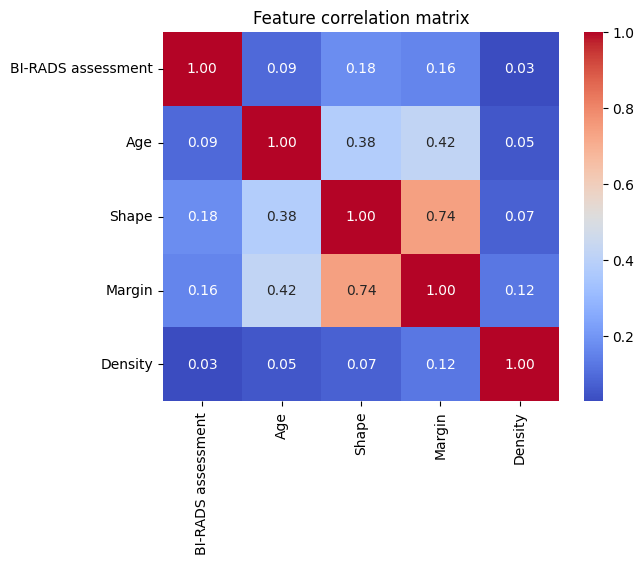


Top rows of data

   MDVP:Fo(Hz)  MDVP:Fhi(Hz)  MDVP:Flo(Hz)  MDVP:Jitter(%)  MDVP:Jitter(Abs)  \
0      119.992       157.302        74.997         0.00784           0.00007   
1      122.400       148.650       113.819         0.00968           0.00008   
2      116.682       131.111       111.555         0.01050           0.00009   
3      116.676       137.871       111.366         0.00997           0.00009   
4      116.014       141.781       110.655         0.01284           0.00011   

   MDVP:RAP  MDVP:PPQ  Jitter:DDP  MDVP:Shimmer  MDVP:Shimmer(dB)  ...  \
0   0.00370   0.00554     0.01109       0.04374             0.426  ...   
1   0.00465   0.00696     0.01394       0.06134             0.626  ...   
2   0.00544   0.00781     0.01633       0.05233             0.482  ...   
3   0.00502   0.00698     0.01505       0.05492             0.517  ...   
4   0.00655   0.00908     0.01966       0.06425             0.584  ...   

   Shimmer:DDA      NHR     HNR  status      RPDE      

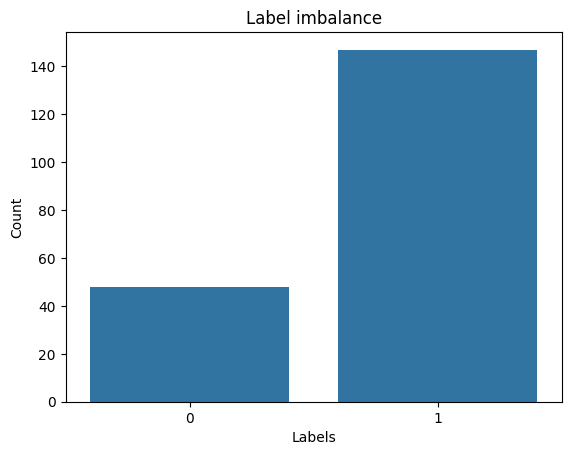

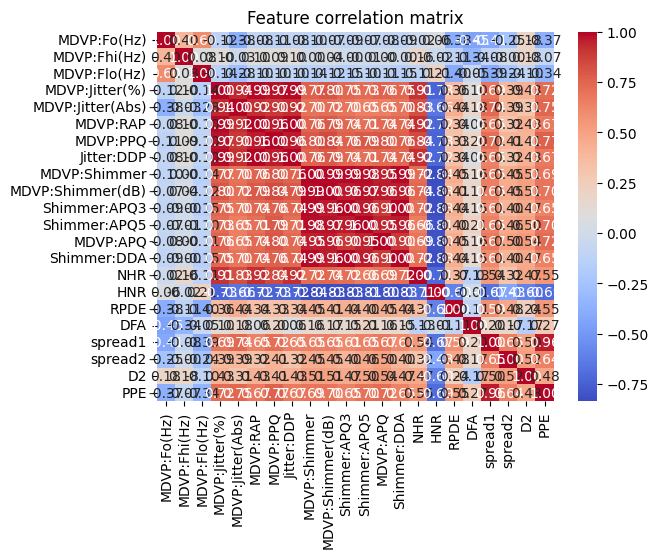


Top rows of data

        F1       F2        F3        F4        F5       F6        F7  \
0 -0.17936 -0.20700 -0.209710 -0.097260 -0.119210 -0.17322 -0.280760   
1 -0.14659 -0.16494  0.249870 -0.073985  0.494940 -0.15633 -0.288910   
2 -0.13131  0.51816  0.432810  0.397890  0.043127  0.56320 -0.013246   
3  0.64940  0.41878  0.148350  0.333490 -0.219740  0.39891  0.590650   
4 -0.40628  0.11503  0.073336  0.070066 -0.030920  0.15205 -0.191420   

         F8        F9       F10       F11       F12  Class  
0  0.223170  0.418660 -0.032886  0.003383 -0.334250      1  
1  0.500800 -0.045553  0.050759 -0.017511  0.066959      1  
2 -0.062833 -0.883390 -0.040303  0.088057  0.631200      2  
3  0.077100 -1.107200 -0.367230  0.364680  0.571720      1  
4 -0.580430 -0.102250  0.153750 -0.126950  0.184570      1  

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 182 entries, 0 to 181
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------

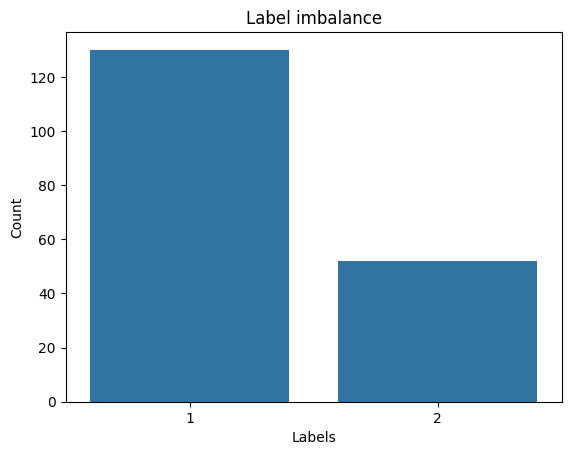

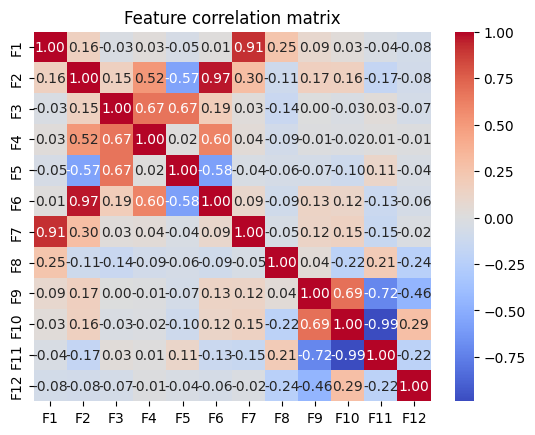


Top rows of data

   OVERALL_DIAGNOSIS  F1  F2  F3  F4  F5  F6  F7  F8  F9  ...  F13  F14  F15  \
0                  1   0   0   1   1   0   0   0   1   1  ...    1    1    0   
1                  1   1   0   1   0   1   0   0   1   0  ...    1    0    0   
2                  1   0   0   0   0   0   0   0   0   0  ...    0    0    0   
3                  1   0   0   0   0   0   0   0   1   0  ...    1    0    1   
4                  1   0   0   0   1   0   0   0   0   1  ...    1    1    0   

   F16  F17  F18  F19  F20  F21  F22  
0    0    0    0    0    0    0    1  
1    0    0    0    0    0    0    0  
2    0    0    0    0    1    1    1  
3    1    0    0    0    0    0    0  
4    1    0    0    0    1    0    1  

[5 rows x 23 columns]

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79 entries, 0 to 78
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   OVERALL_DIAGNOSIS  79 no

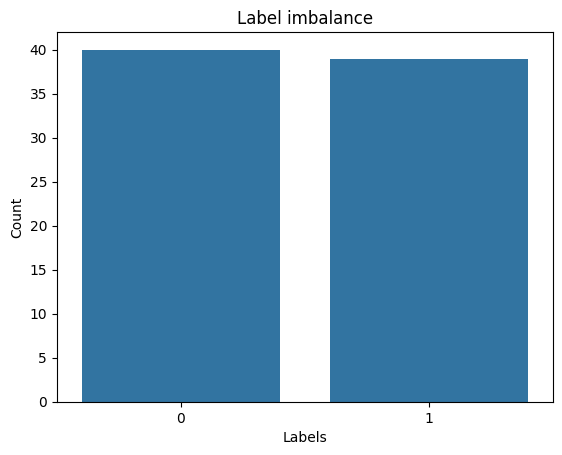

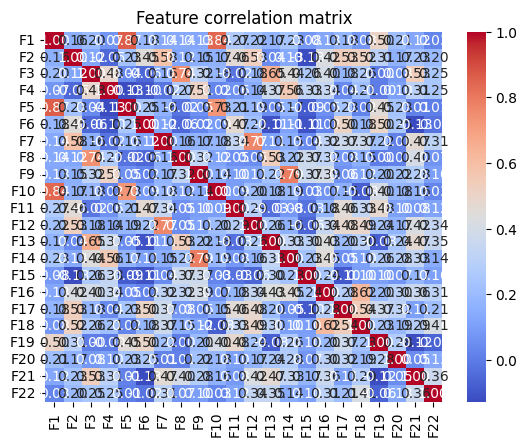


Top rows of data

   OVERALL_DIAGNOSIS  F1R  F1S  F2R  F2S  F3R  F3S  F4R  F4S  F5R  ...  F18R  \
0                  1   72   62   69   67   78   82   74   65   69  ...    65   
1                  1   71   62   70   64   67   64   79   65   70  ...    73   
2                  1   69   71   70   78   61   63   67   65   59  ...    61   
3                  1   70   66   61   66   61   58   69   69   72  ...    67   
4                  1   57   69   68   75   69   74   73   71   57  ...    63   

   F18S  F19R  F19S  F20R  F20S  F21R  F21S  F22R  F22S  
0    71    63    60    69    73    67    71    56    58  
1    70    66    65    64    55    61    41    51    46  
2    61    66    65    72    73    68    68    59    63  
3    69    70    66    70    64    60    55    49    41  
4    58    69    67    79    77    72    70    61    65  

[5 rows x 45 columns]

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79 entries, 0 to 78
Data columns (total 45 columns):
 #   Co

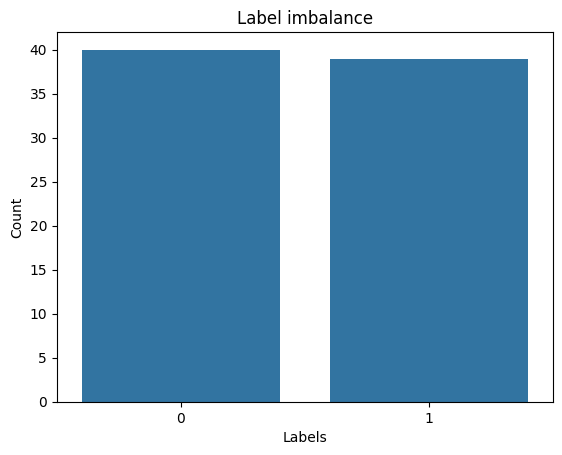

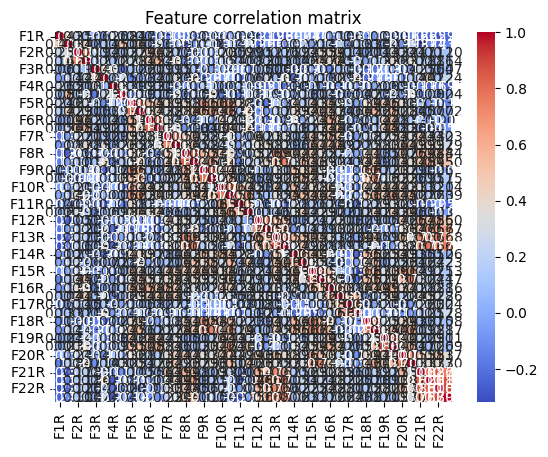


Top rows of data

   pelvic_incidence  pelvic_tilt  lumbar_lordosis_angle  sacral_slope  \
0             39.06        10.06                  25.02         29.00   
1             68.83        22.22                  50.09         46.61   
2             69.30        24.65                  44.31         44.64   
3             49.71         9.65                  28.32         40.06   
4             40.25        13.92                  25.12         26.33   

   pelvic_radius  degree_spondylolisthesis  class  
0         114.41                      4.56      0  
1         105.99                     -3.53      0  
2         101.87                     11.21      0  
3         108.17                      7.92      0  
4         130.33                      2.23      0  

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----

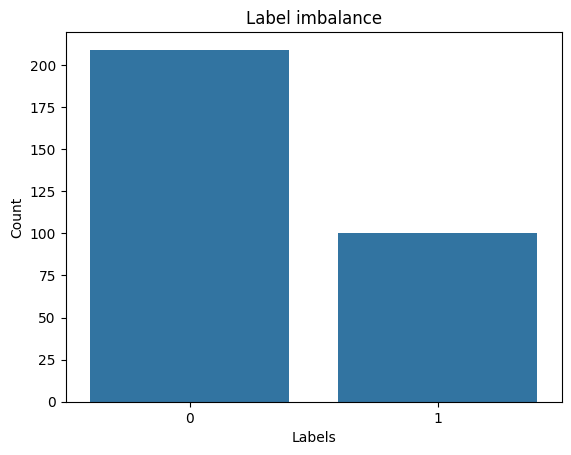

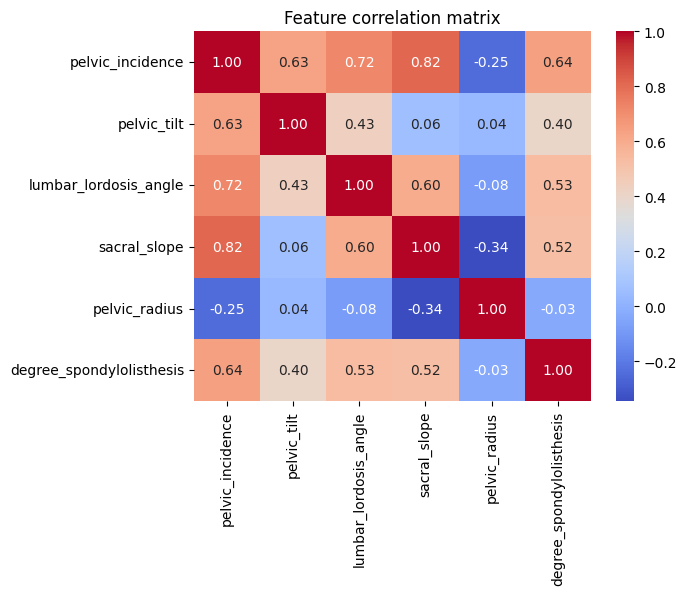


Top rows of data

   Temperature of patient  Occurrence of nausea  Lumbar pain  Urine pushing  \
0                    35.5                     0            1              0   
1                    35.9                     0            0              1   
2                    35.9                     0            1              0   
3                    36.0                     0            0              1   
4                    36.0                     0            1              0   

   Micturition pains  Burning of urethra, itch, swelling of urethra outlet  \
0                  0                                                  0      
1                  1                                                  1      
2                  0                                                  0      
3                  1                                                  1      
4                  0                                                  0      

   Inflammation of urinary bladder  


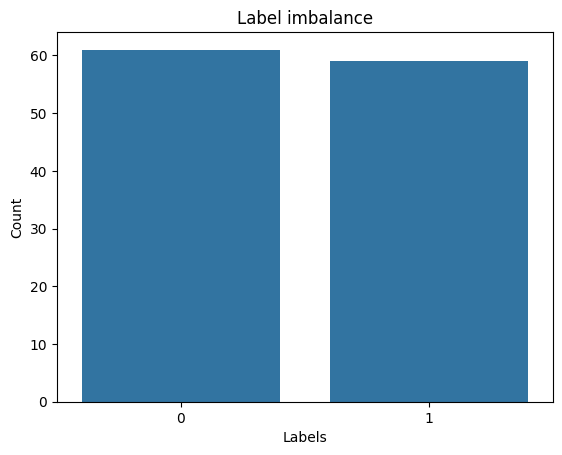

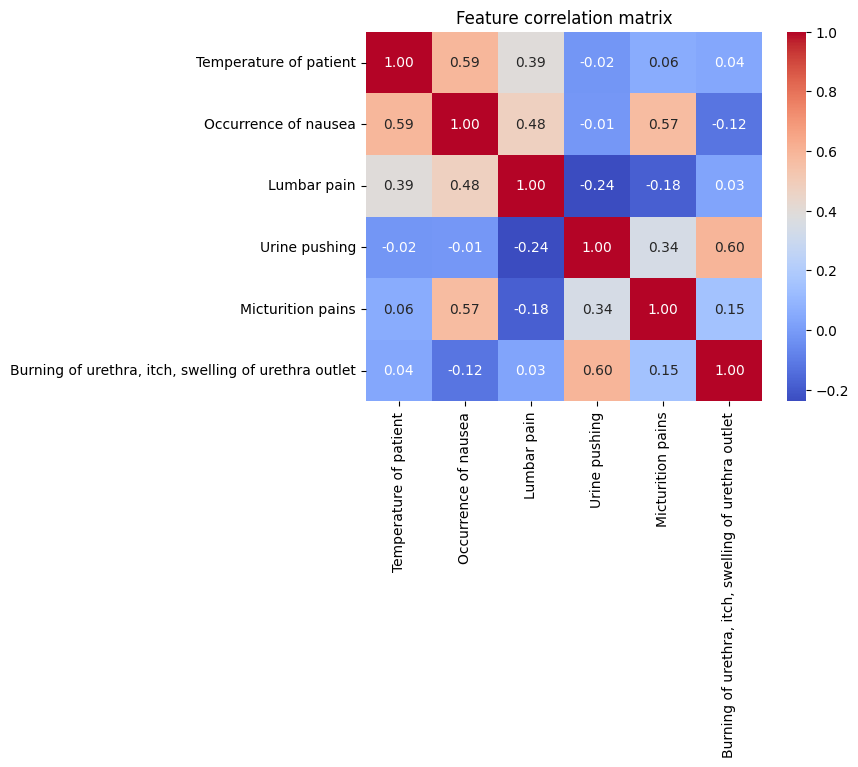


Top rows of data

   Temperature of patient  Occurrence of nausea  Lumbar pain  Urine pushing  \
0                    35.5                     0            1              0   
1                    35.9                     0            0              1   
2                    35.9                     0            1              0   
3                    36.0                     0            0              1   
4                    36.0                     0            1              0   

   Micturition pains  Burning of urethra, itch, swelling of urethra outlet  \
0                  0                                                  0      
1                  1                                                  1      
2                  0                                                  0      
3                  1                                                  1      
4                  0                                                  0      

   Inflammation of urinary bladder  N

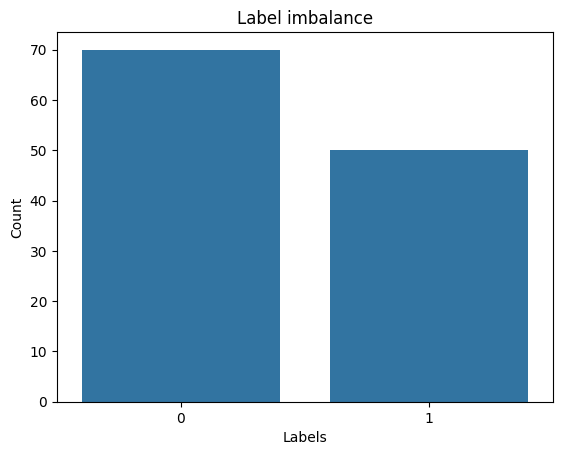

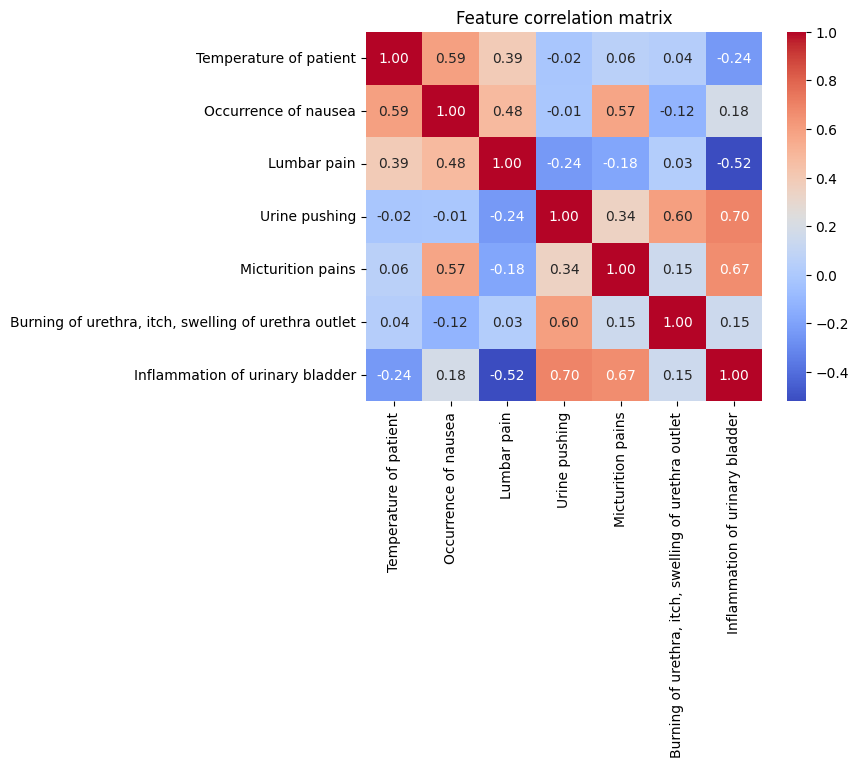


Top rows of data

   Outcome  Time     F1     F2      F3      F4       F5      F6      F7  \
0        0    61  17.99  10.38  122.80  1001.0  0.11840  0.2776  0.3001   
1        0   116  21.37  17.44  137.50  1373.0  0.08836  0.1189  0.1255   
2        0   123  11.42  20.38   77.58   386.1  0.14250  0.2839  0.2414   
3        1    27  20.29  14.34  135.10  1297.0  0.10030  0.1328  0.1980   
4        1    77  12.75  15.29   84.60   502.7  0.11890  0.1569  0.1664   

        F8  ...     F23     F24     F25     F26     F27     F28     F29  \
0  0.14710  ...  184.60  2019.0  0.1622  0.6656  0.7119  0.2654  0.4601   
1  0.08180  ...  159.10  1949.0  0.1188  0.3449  0.3414  0.2032  0.4334   
2  0.10520  ...   98.87   567.7  0.2098  0.8663  0.6869  0.2575  0.6638   
3  0.10430  ...  152.20  1575.0  0.1374  0.2050  0.4000  0.1625  0.2364   
4  0.07666  ...  107.30   733.2  0.1706  0.4196  0.5999  0.1709  0.3485   

       F30  F31  F32  
0  0.11890  3.0  2.0  
1  0.09067  2.5  0.0  
2  0.17300

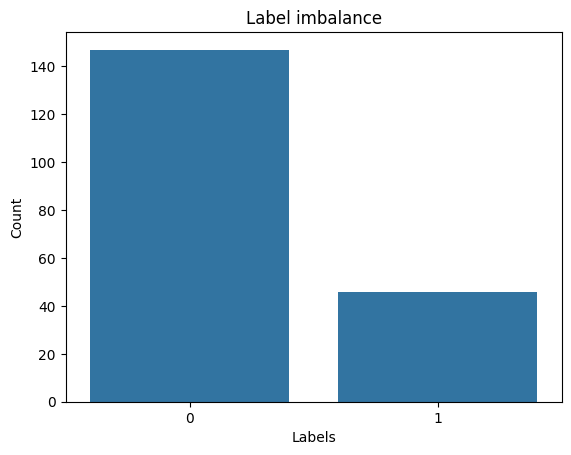

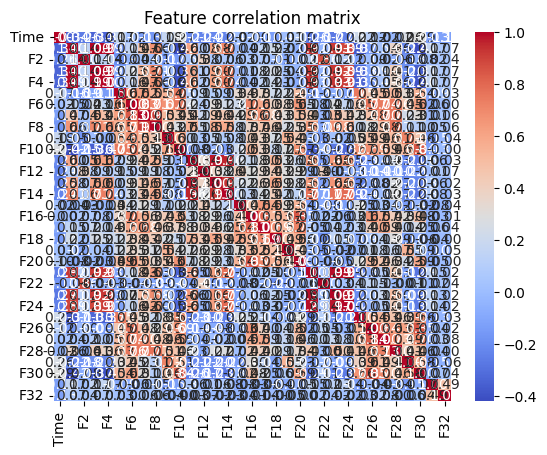


Top rows of data

       A1      A2      A3      A4      A5      A6      A7      A8      A9  \
0  0.0453  0.0523  0.0843  0.0689  0.1183  0.2583  0.2156  0.3481  0.3337   
1  0.0262  0.0582  0.1099  0.1083  0.0974  0.2280  0.2431  0.3771  0.5598   
2  0.0100  0.0171  0.0623  0.0205  0.0205  0.0368  0.1098  0.1276  0.0598   
3  0.0762  0.0666  0.0481  0.0394  0.0590  0.0649  0.1209  0.2467  0.3564   
4  0.0286  0.0453  0.0277  0.0174  0.0384  0.0990  0.1201  0.1833  0.2105   

      A10  ...     A52     A53     A54     A55     A56     A57     A58  \
0  0.2872  ...  0.0084  0.0089  0.0048  0.0094  0.0191  0.0140  0.0049   
1  0.6194  ...  0.0232  0.0166  0.0095  0.0180  0.0244  0.0316  0.0164   
2  0.1264  ...  0.0121  0.0036  0.0150  0.0085  0.0073  0.0050  0.0044   
3  0.4459  ...  0.0031  0.0054  0.0105  0.0110  0.0015  0.0072  0.0048   
4  0.3039  ...  0.0045  0.0014  0.0038  0.0013  0.0089  0.0057  0.0027   

      A59     A60  class  
0  0.0052  0.0044      1  
1  0.0095  0.0078  

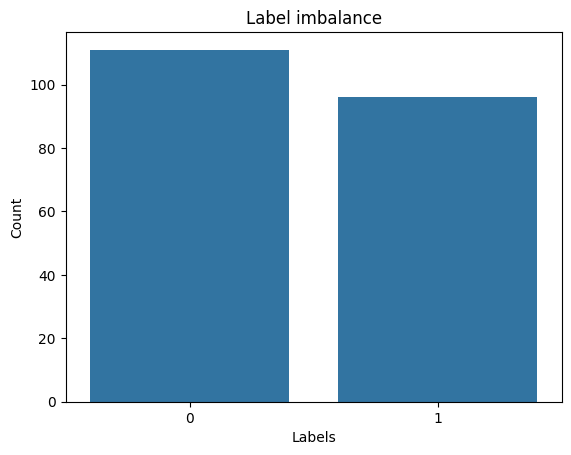

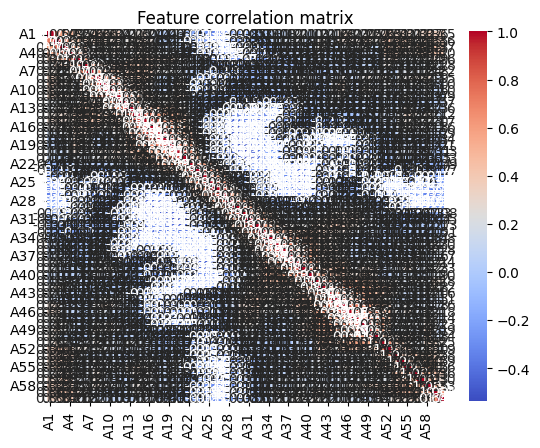


Top rows of data

   survival  still-alive  age-at-heart-attack  pericardial-effusion  \
0      11.0            0                 71.0                     0   
1      19.0            0                 72.0                     0   
2      16.0            0                 55.0                     0   
3      57.0            0                 60.0                     0   
4      19.0            1                 57.0                     0   

   fractional-shortening    epss   lvdd  wall-motion-score  wall-motion-index  \
0                  0.260   9.000  4.600               14.0               1.00   
1                  0.380   6.000  4.100               14.0               1.70   
2                  0.260   4.000  3.420               14.0               1.00   
3                  0.253  12.062  4.603               16.0               1.45   
4                  0.160  22.000  5.750               18.0               2.25   

    mult  alive-at-1  
0  1.000         0.0  
1  0.588         0.0 

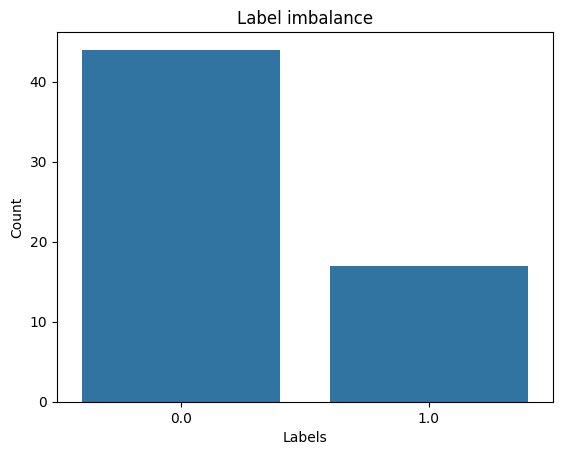

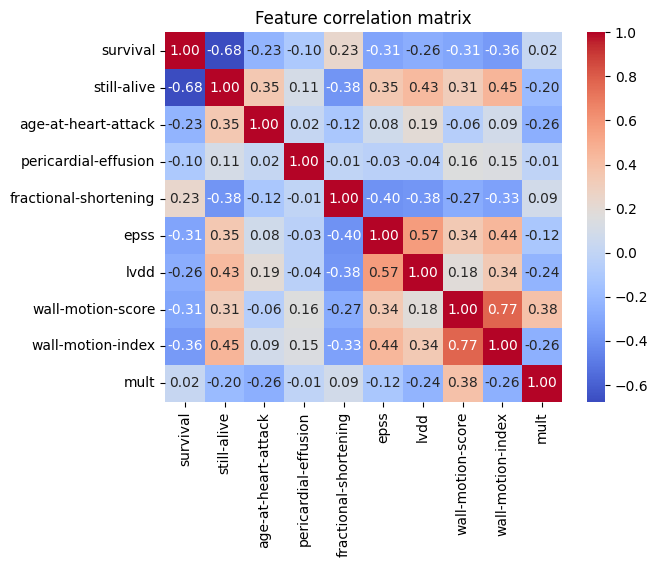


Top rows of data

   season   age  child_diseases  accident  surgical_intervention  high_fevers  \
0   -0.33  0.69               0         1                      1            0   
1   -0.33  0.94               1         0                      1            0   
2   -0.33  0.50               1         0                      0            0   
3   -0.33  0.75               0         1                      1            0   
4   -0.33  0.67               1         1                      0            0   

   alcohol  smoking  hrs_sitting  diagnosis  
0      0.8        0         0.88          1  
1      0.8        1         0.31          0  
2      1.0       -1         0.50          1  
3      1.0       -1         0.38          1  
4      0.8       -1         0.50          0  

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 -------------- 

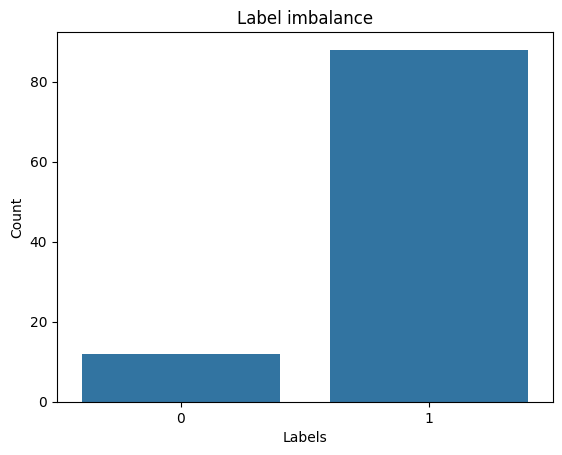

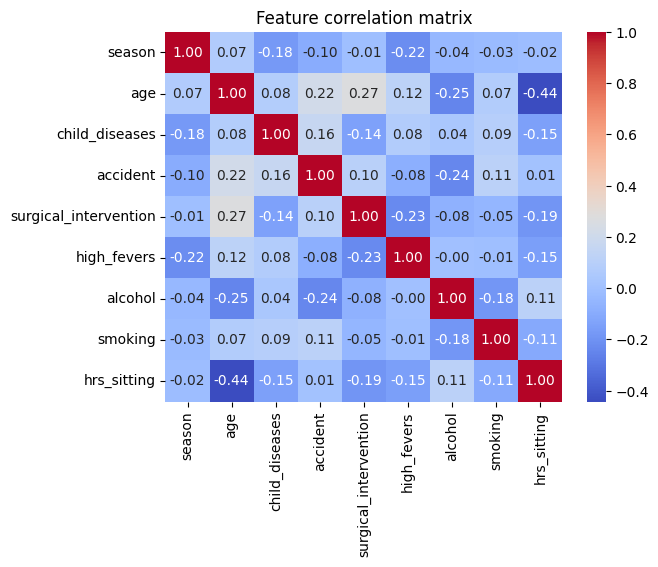


Top rows of data

   Age of patient at time of operation  Patient year of operation  \
0                                   30                         64   
1                                   30                         62   
2                                   30                         65   
3                                   31                         59   
4                                   31                         65   

   Number of positive axillary nodes detected  Survival status  
0                                           1                1  
1                                           3                1  
2                                           0                1  
3                                           2                1  
4                                           4                1  

Data Information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Data columns (total 4 columns):
 #   Column                                      Non-

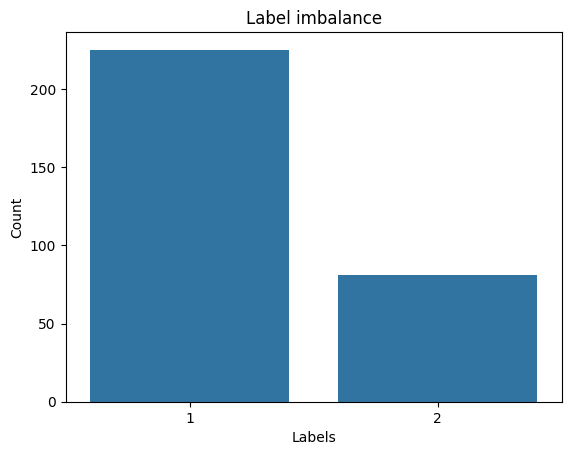

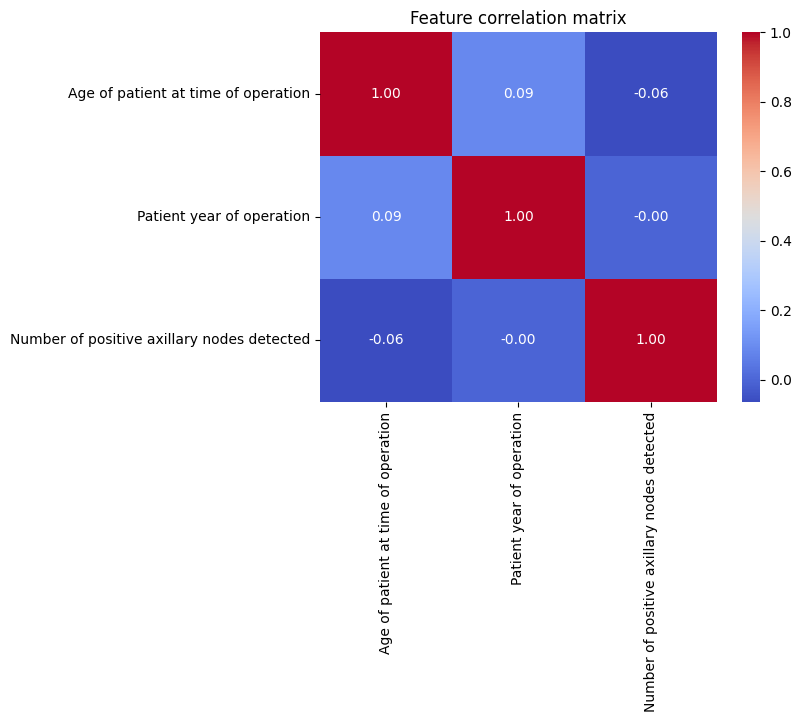

In [120]:
for key, value in file_details.items():

    value['instance_model_processing'] = ModelProcessing(value['fname'])

    # read the file and get it in dataframe
    df = value['instance_model_processing'].open_file()

    # Explore the data
    display(HTML("<h2><b>{} dataset</b></h2>".format(key)))
    value['instance_model_processing'].explore_data()

    # prepare the data by dropping null values and unnecessary columne
    df,_ = value['instance_model_processing'].prepare_data(drop_null = 'y')

    # Split the data in fetures and lables
    X = df.drop(columns = value['label_col_name'])
    y = df[value['label_col_name']]
    value['X'] = np.array(X)
    value['y'] = np.array(y)
    #value['X'] = np.array(df.drop(columns = value['label_col_name']))
    #value['y'] = np.array(df[value['label_col_name']])

    # Visualise the data using plots
    value['instance_model_processing'].plot_label_imbalance(value['y'])
    value['instance_model_processing'].plot_feature_correlation(X)        

In [ ]:

"""
Structure of all_metrics_per_model
all_metrics_per_model = {
    'model': {
        'accuracy': [],
        'precision': [],
        'recall': [],
        'f1': [],
        'cv_scores': [],
        'training_time': []
    },
    'model': {
        'accuracy': [],
        'precision': [],
        'recall': [],
        'f1': [],
        'cv_scores': [],
        'training_time': []
    }
}


#Structure of all_metrics_per_file
all_metrics_per_file = {
    'file1': {
        'model1': {
            'accuracy': 0.0,
            'precision': 0.0,
            'recall': 0.0,
            'f1': 0.0,
            'cv_scores': 0.0,
            'training_time': 0.0
        },
        'model2': {
            'accuracy': 0.0,
            'precision': 0.0,
            'recall': 0.0,
            'f1': 0.0,
            'cv_scores': 0.0,
            'training_time': 0.0
        }
    },
    'file2': {
        'model1': {
            'accuracy': 0.0,
            'precision': 0.0,
            'recall': 0.0,
            'f1': 0.0,
            'cv_scores': 0.0,
            'training_time': 0.0
        }
    }
}

"""

### For each file (22 of them), goes through the training and test of each model (8 of them, 5-Sueprvised and 3-Un-supervised) and prints and plots the result

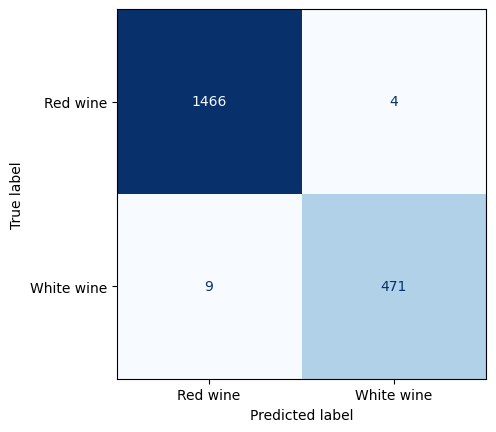

Accuracy %              : 99.3333%
Precision score         : 0.9812
Recall score            : 0.9916
F1 score                : 0.9933
Cross Validation score  : 0.9226
Training time           : 0.004 Seconds




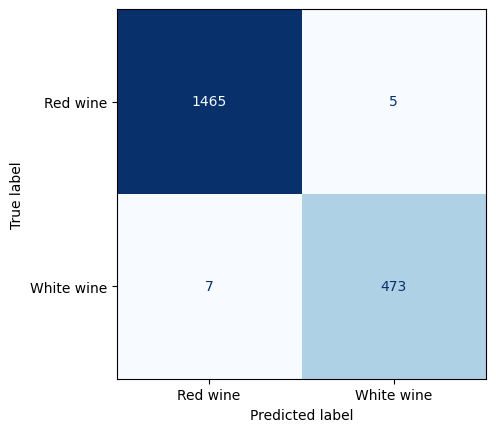

Accuracy %              : 99.3846%
Precision score         : 0.9854
Recall score            : 0.9895
F1 score                : 0.9939
Cross Validation score  : 0.9292
Training time           : 0.0109 Seconds




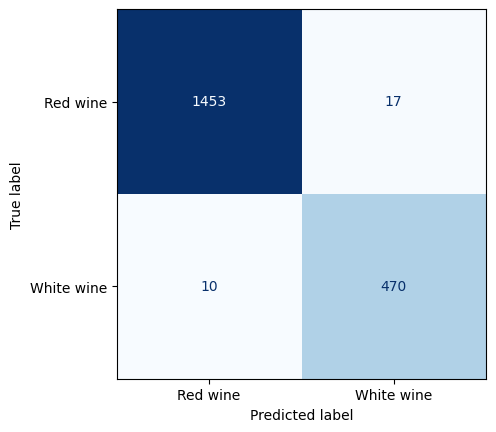

Accuracy %              : 98.6154%
Precision score         : 0.9792
Recall score            : 0.9651
F1 score                : 0.9861
Cross Validation score  : 0.9815
Training time           : 0.0276 Seconds




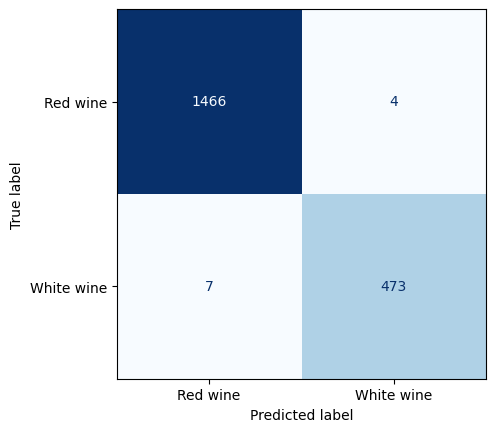

Accuracy %              : 99.4359%
Precision score         : 0.9854
Recall score            : 0.9916
F1 score                : 0.9944
Cross Validation score  : 0.9255
Training time           : 0.0682 Seconds




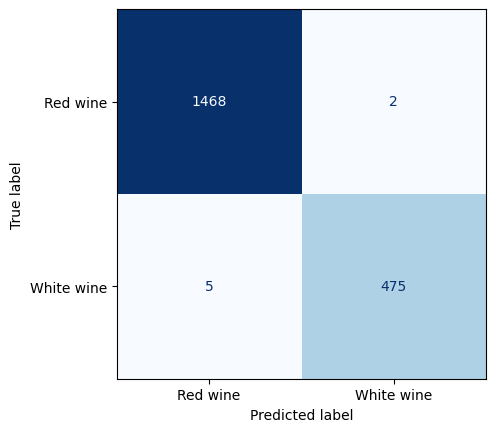

Accuracy %              : 99.641%
Precision score         : 0.9896
Recall score            : 0.9958
F1 score                : 0.9964
Cross Validation score  : 0.9942
Training time           : 0.6174 Seconds




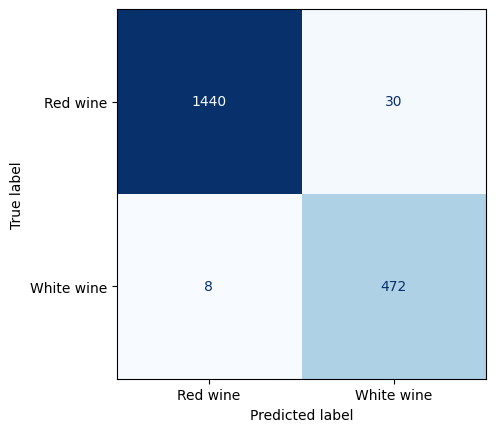

Accuracy %              : 98.0513%
Precision score         : 0.9833
Recall score            : 0.9402
F1 score                : 0.9804
Cross Validation score  : 0.0
Training time           : 0.0797 Seconds




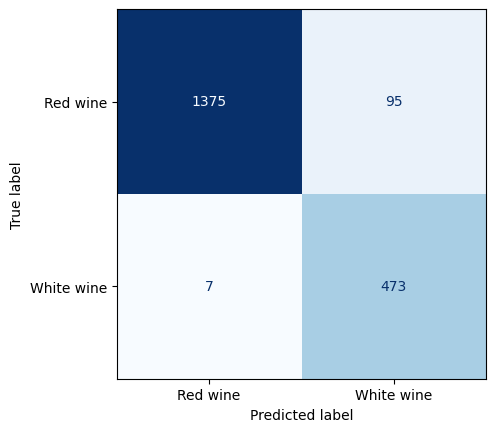

Accuracy %              : 94.7692%
Precision score         : 0.9854
Recall score            : 0.8327
F1 score                : 0.9463
Cross Validation score  : 0.0
Training time           : 0.1372 Seconds




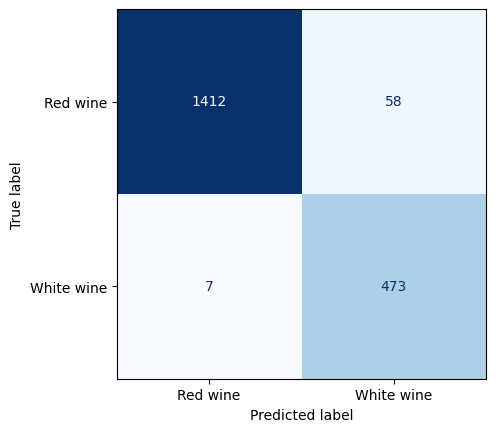

Accuracy %              : 96.6667%
Precision score         : 0.9854
Recall score            : 0.8908
F1 score                : 0.9661
Cross Validation score  : 0.0
Training time           : 0.7051 Seconds




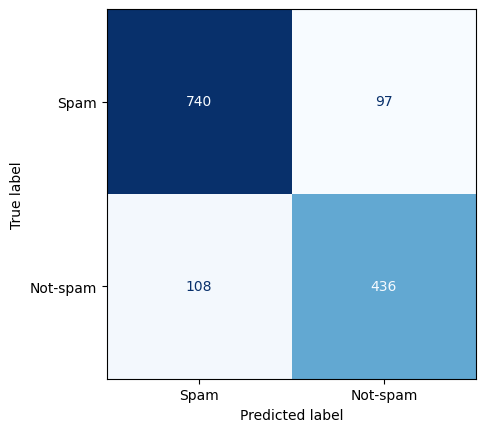

Accuracy %              : 85.1557%
Precision score         : 0.8015
Recall score            : 0.818
F1 score                : 0.8518
Cross Validation score  : 0.7205
Training time           : 0.004 Seconds




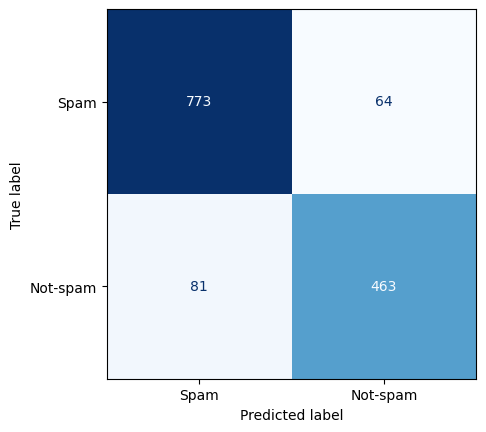

Accuracy %              : 89.5004%
Precision score         : 0.8511
Recall score            : 0.8786
F1 score                : 0.8953
Cross Validation score  : 0.7764
Training time           : 0.001 Seconds




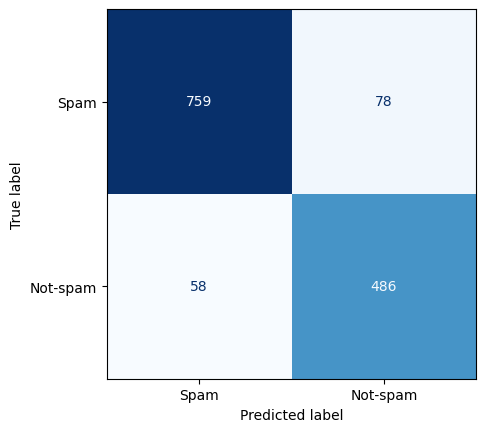

Accuracy %              : 90.1521%
Precision score         : 0.8934
Recall score            : 0.8617
F1 score                : 0.9012
Cross Validation score  : 0.8787
Training time           : 0.0712 Seconds




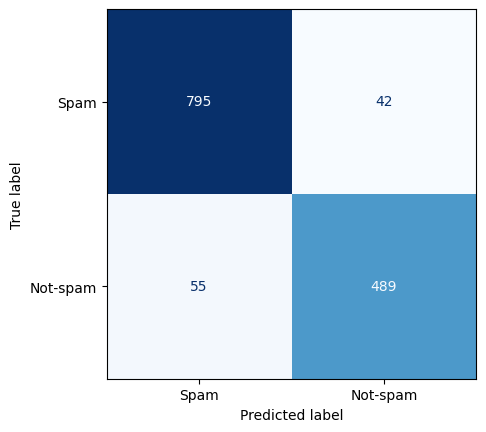

Accuracy %              : 92.9761%
Precision score         : 0.8989
Recall score            : 0.9209
F1 score                : 0.9299
Cross Validation score  : 0.7007
Training time           : 0.223 Seconds




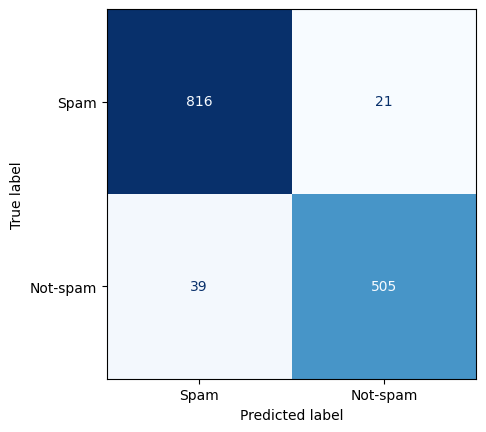

Accuracy %              : 95.6553%
Precision score         : 0.9283
Recall score            : 0.9601
F1 score                : 0.9567
Cross Validation score  : 0.9294
Training time           : 0.6662 Seconds




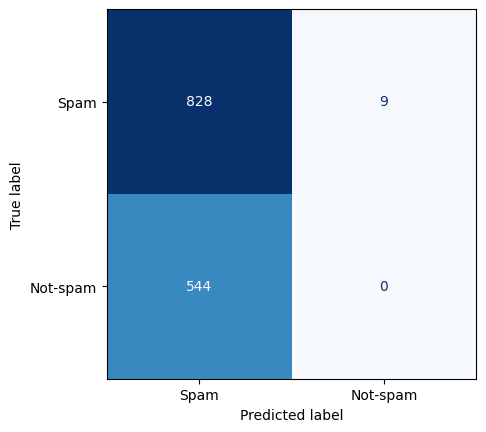

Accuracy %              : 59.9566%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7448
Cross Validation score  : 0.0
Training time           : 0.1867 Seconds




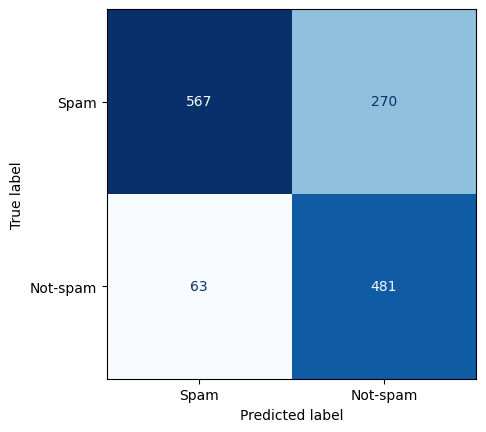

Accuracy %              : 75.887%
Precision score         : 0.8842
Recall score            : 0.6405
F1 score                : 0.7566
Cross Validation score  : 0.0
Training time           : 0.3032 Seconds




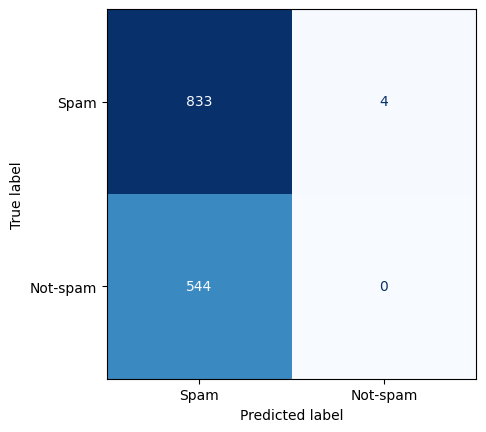

Accuracy %              : 60.3186%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7503
Cross Validation score  : 0.0
Training time           : 0.5829 Seconds




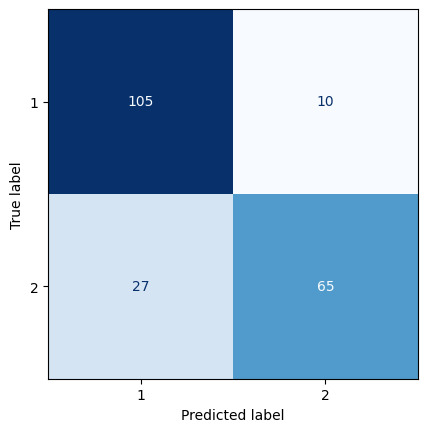

Accuracy %              : 82.1256%
Precision score         : 0.7065
Recall score            : 0.8667
F1 score                : 0.8242
Cross Validation score  : 0.6435
Training time           : 0.002 Seconds




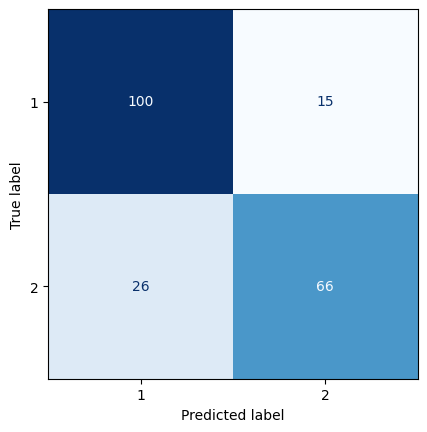

Accuracy %              : 80.1932%
Precision score         : 0.7174
Recall score            : 0.8148
F1 score                : 0.8037
Cross Validation score  : 0.6638
Training time           : 0.002 Seconds




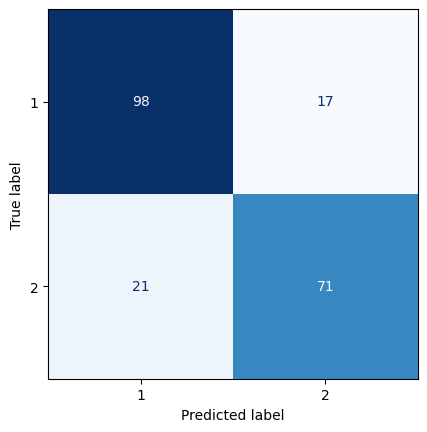

Accuracy %              : 81.6425%
Precision score         : 0.7717
Recall score            : 0.8068
F1 score                : 0.8169
Cross Validation score  : 0.8087
Training time           : 0.0026 Seconds




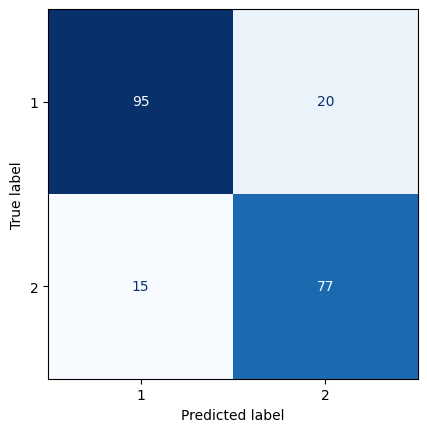

Accuracy %              : 83.0918%
Precision score         : 0.837
Recall score            : 0.7938
F1 score                : 0.8306
Cross Validation score  : 0.6609
Training time           : 0.0071 Seconds




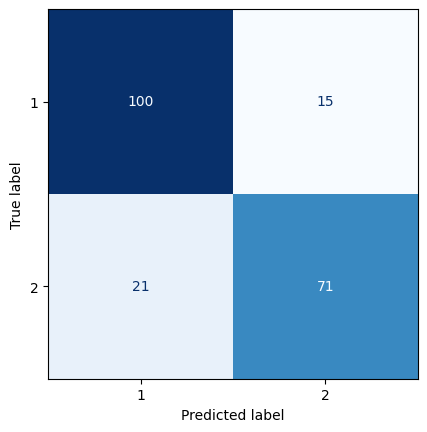

Accuracy %              : 82.6087%
Precision score         : 0.7717
Recall score            : 0.8256
F1 score                : 0.8268
Cross Validation score  : 0.8609
Training time           : 0.1759 Seconds




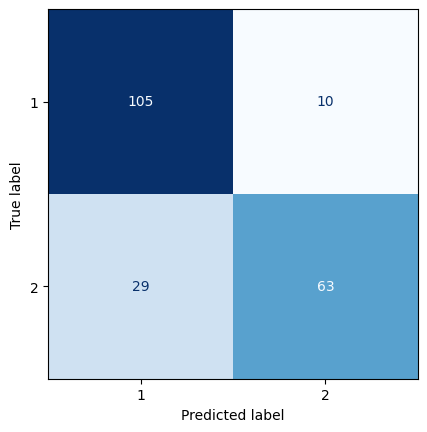

Accuracy %              : 81.1594%
Precision score         : 0.6848
Recall score            : 0.863
F1 score                : 0.8153
Cross Validation score  : 0.0
Training time           : 0.1136 Seconds




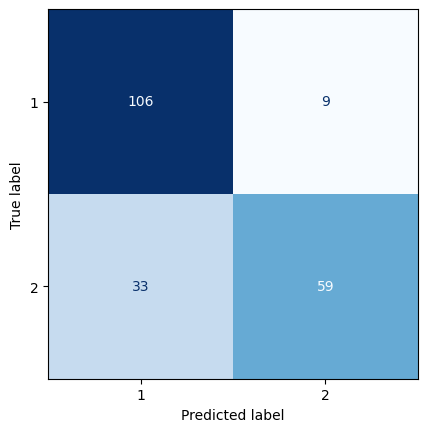

Accuracy %              : 79.7101%
Precision score         : 0.6413
Recall score            : 0.8676
F1 score                : 0.8027
Cross Validation score  : 0.0
Training time           : 0.1287 Seconds




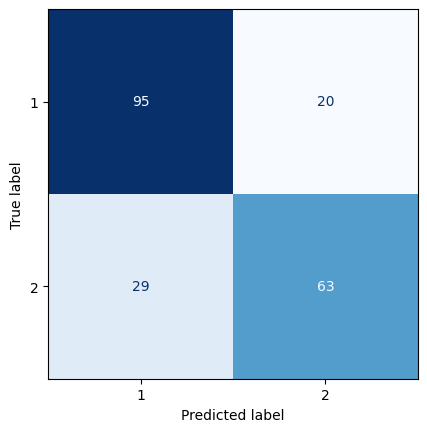

Accuracy %              : 76.3285%
Precision score         : 0.6848
Recall score            : 0.759
F1 score                : 0.7649
Cross Validation score  : 0.0
Training time           : 0.0487 Seconds




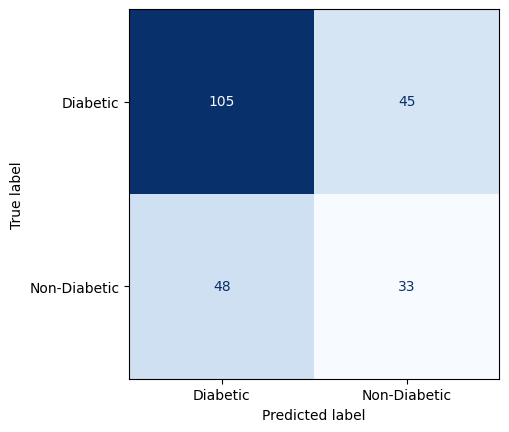

Accuracy %              : 59.7403%
Precision score         : 0.4074
Recall score            : 0.4231
F1 score                : 0.5992
Cross Validation score  : 0.4622
Training time           : 0.001 Seconds




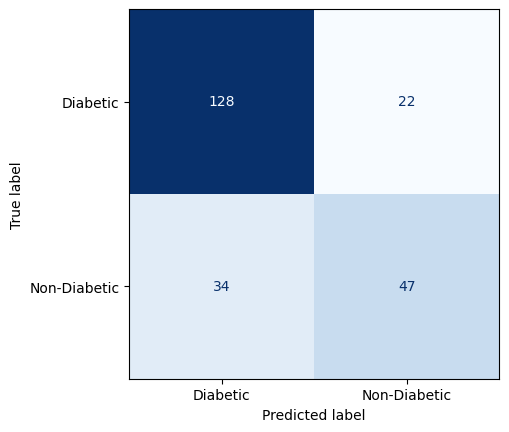

Accuracy %              : 75.7576%
Precision score         : 0.5802
Recall score            : 0.6812
F1 score                : 0.7626
Cross Validation score  : 0.7136
Training time           : 0.002 Seconds




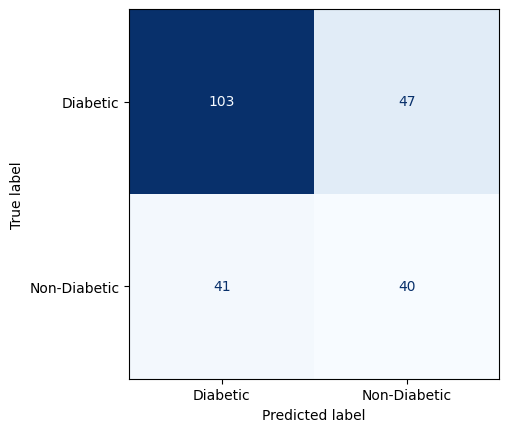

Accuracy %              : 61.9048%
Precision score         : 0.4938
Recall score            : 0.4598
F1 score                : 0.6161
Cross Validation score  : 0.7032
Training time           : 0.004 Seconds




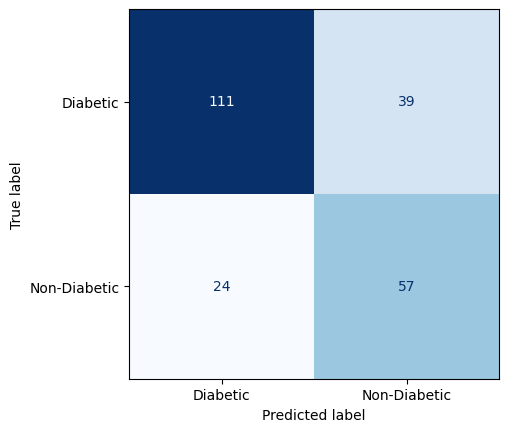

Accuracy %              : 72.7273%
Precision score         : 0.7037
Recall score            : 0.5938
F1 score                : 0.7229
Cross Validation score  : 0.7214
Training time           : 0.0101 Seconds




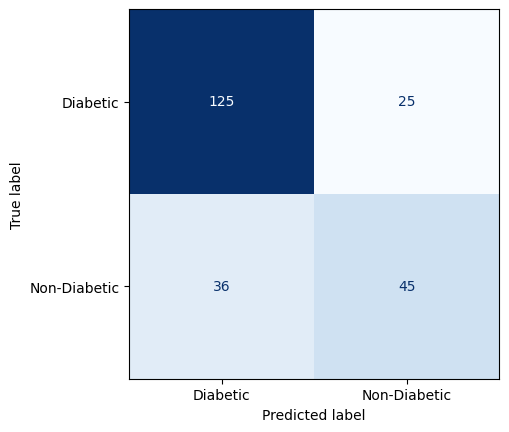

Accuracy %              : 73.5931%
Precision score         : 0.5556
Recall score            : 0.6429
F1 score                : 0.7409
Cross Validation score  : 0.767
Training time           : 0.1952 Seconds




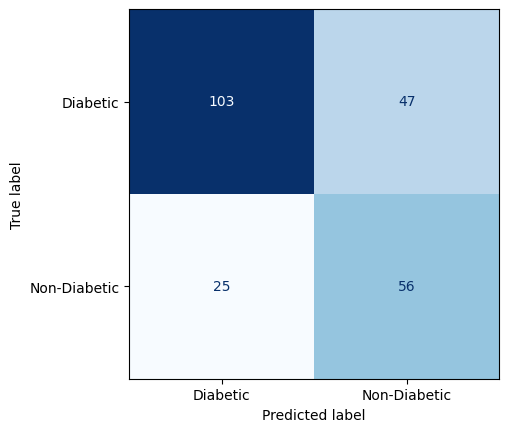

Accuracy %              : 68.8312%
Precision score         : 0.6914
Recall score            : 0.5437
F1 score                : 0.682
Cross Validation score  : 0.0
Training time           : 0.1157 Seconds




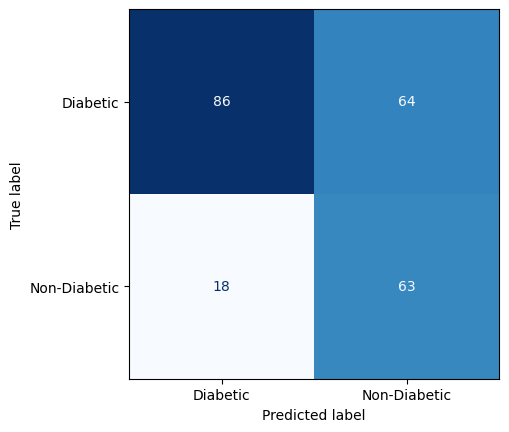

Accuracy %              : 64.5022%
Precision score         : 0.7778
Recall score            : 0.4961
F1 score                : 0.6379
Cross Validation score  : 0.0
Training time           : 0.1229 Seconds




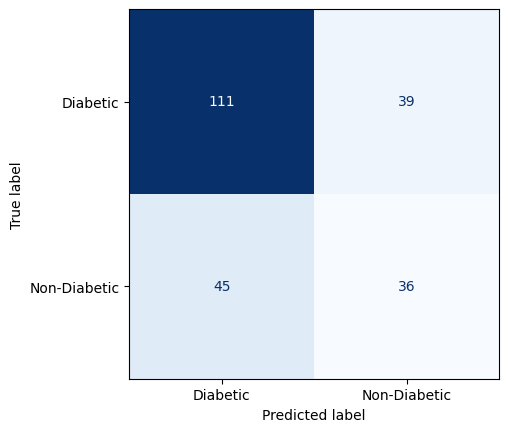

Accuracy %              : 63.6364%
Precision score         : 0.4444
Recall score            : 0.48
F1 score                : 0.6398
Cross Validation score  : 0.0
Training time           : 0.0267 Seconds




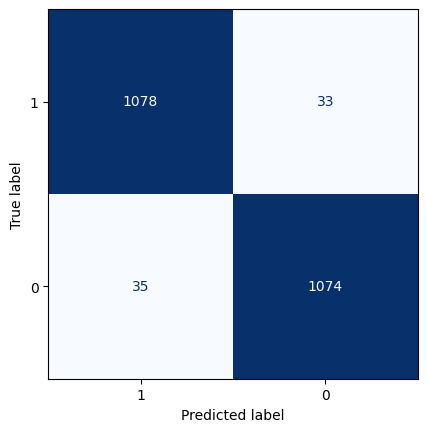

Accuracy %              : 96.9369%
Precision score         : 0.9684
Recall score            : 0.9702
F1 score                : 0.9694
Cross Validation score  : 0.9646
Training time           : 0.003 Seconds




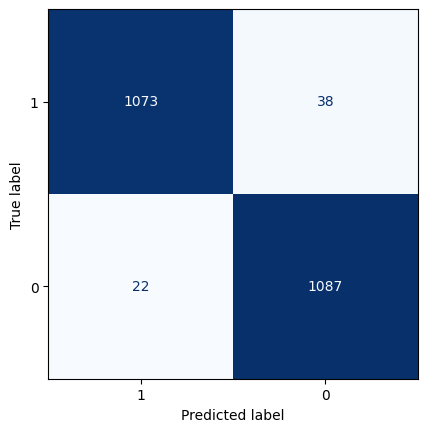

Accuracy %              : 97.2973%
Precision score         : 0.9802
Recall score            : 0.9662
F1 score                : 0.973
Cross Validation score  : 0.9649
Training time           : 0.001 Seconds




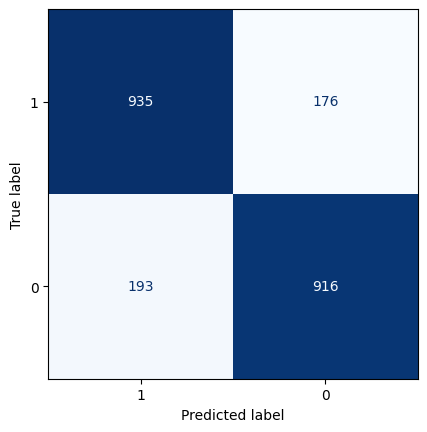

Accuracy %              : 83.3784%
Precision score         : 0.826
Recall score            : 0.8388
F1 score                : 0.8338
Cross Validation score  : 0.8424
Training time           : 0.1563 Seconds




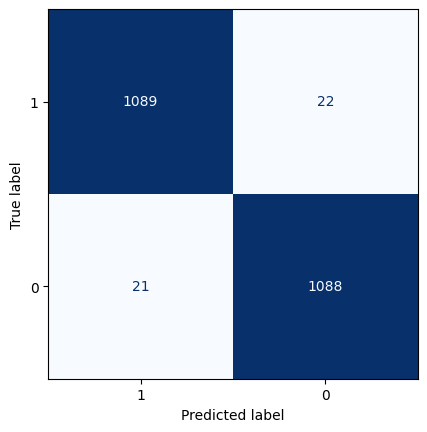

Accuracy %              : 98.0631%
Precision score         : 0.9811
Recall score            : 0.9802
F1 score                : 0.9806
Cross Validation score  : 0.9777
Training time           : 0.1603 Seconds




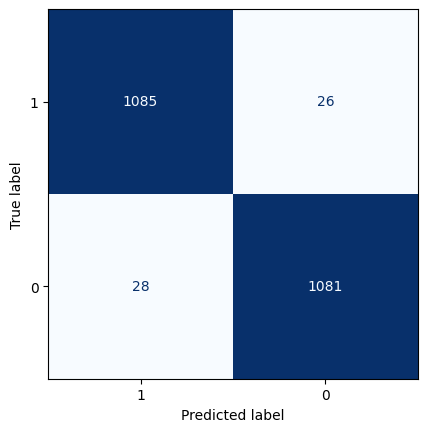

Accuracy %              : 97.5676%
Precision score         : 0.9748
Recall score            : 0.9765
F1 score                : 0.9757
Cross Validation score  : 0.9705
Training time           : 2.4089 Seconds




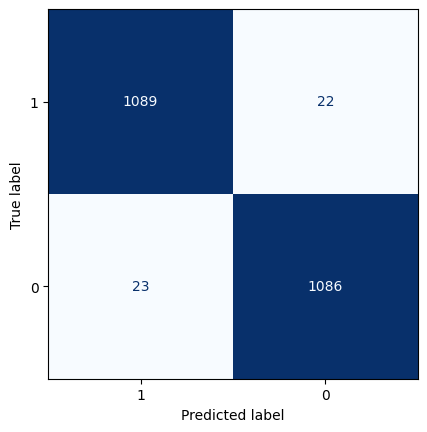

Accuracy %              : 97.973%
Precision score         : 0.9793
Recall score            : 0.9801
F1 score                : 0.9797
Cross Validation score  : 0.0
Training time           : 0.0805 Seconds




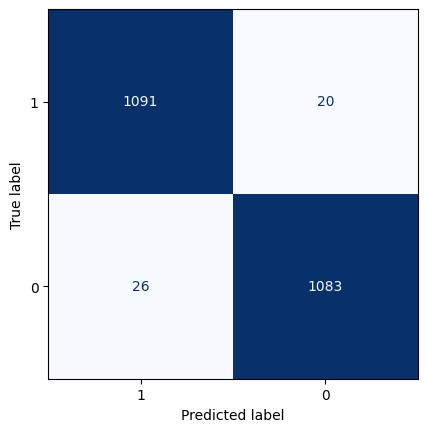

Accuracy %              : 97.9279%
Precision score         : 0.9766
Recall score            : 0.9819
F1 score                : 0.9793
Cross Validation score  : 0.0
Training time           : 0.0648 Seconds




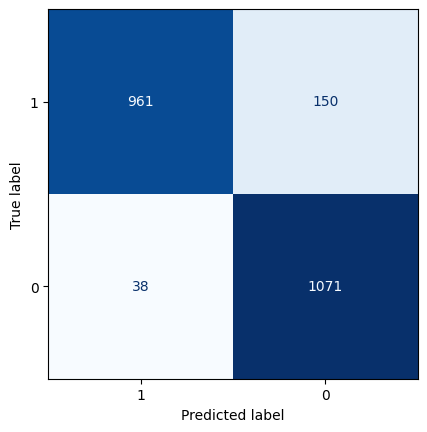

Accuracy %              : 91.5315%
Precision score         : 0.9657
Recall score            : 0.8771
F1 score                : 0.9155
Cross Validation score  : 0.0
Training time           : 1.1818 Seconds




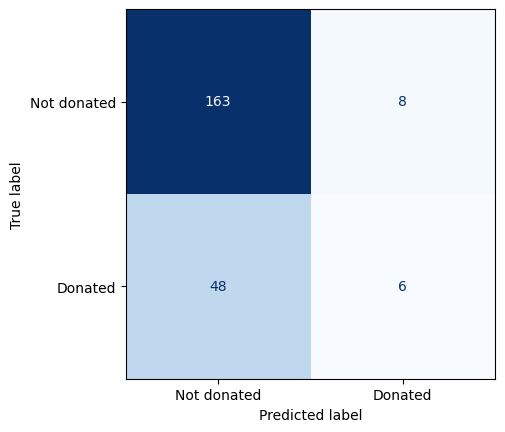

Accuracy %              : 75.1111%
Precision score         : 0.1111
Recall score            : 0.4286
F1 score                : 0.8113
Cross Validation score  : 0.658
Training time           : 0.0009 Seconds




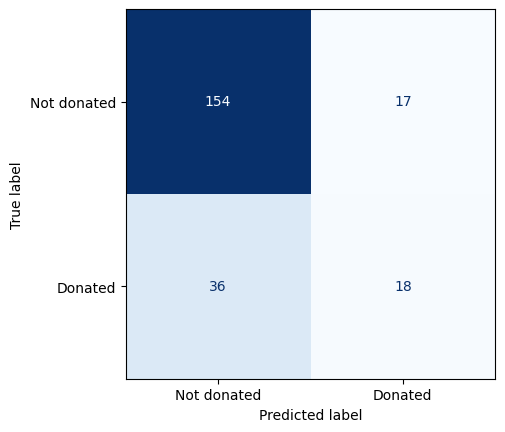

Accuracy %              : 76.4444%
Precision score         : 0.3333
Recall score            : 0.5143
F1 score                : 0.7834
Cross Validation score  : 0.6473
Training time           : 0.0012 Seconds




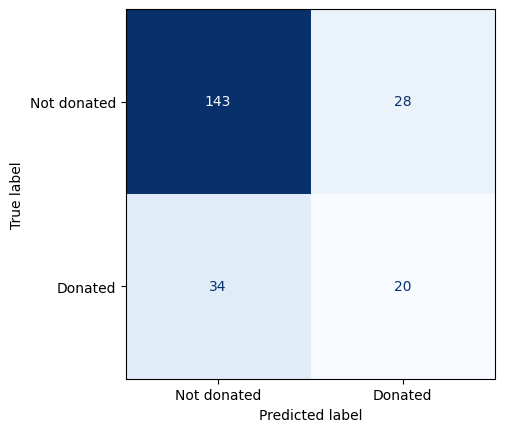

Accuracy %              : 72.4444%
Precision score         : 0.3704
Recall score            : 0.4167
F1 score                : 0.7302
Cross Validation score  : 0.6179
Training time           : 0.002 Seconds




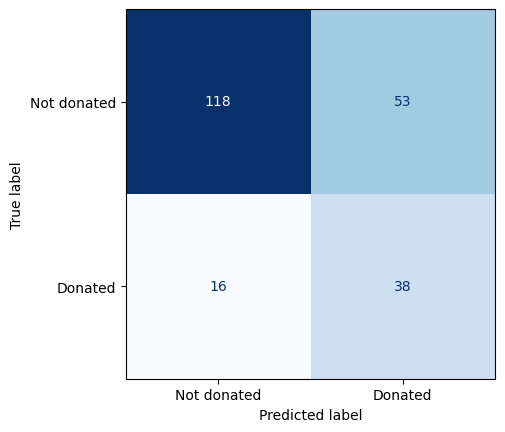

Accuracy %              : 69.3333%
Precision score         : 0.7037
Recall score            : 0.4176
F1 score                : 0.6728
Cross Validation score  : 0.6123
Training time           : 0.0097 Seconds




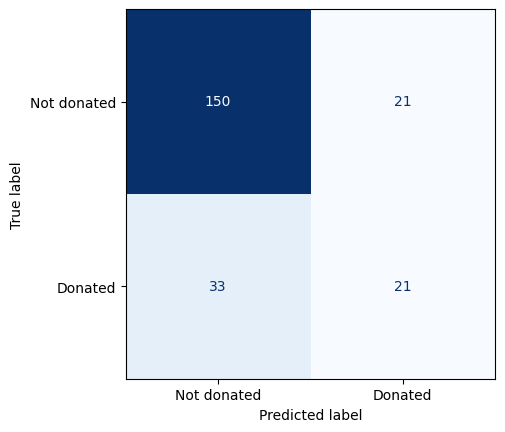

Accuracy %              : 76.0%
Precision score         : 0.3889
Recall score            : 0.5
F1 score                : 0.7709
Cross Validation score  : 0.6673
Training time           : 0.1698 Seconds




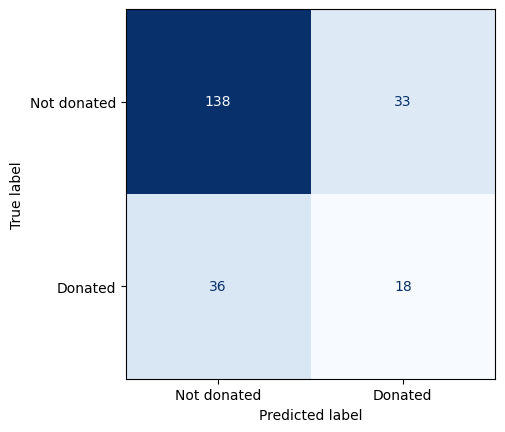

Accuracy %              : 69.3333%
Precision score         : 0.3333
Recall score            : 0.3529
F1 score                : 0.6964
Cross Validation score  : 0.0
Training time           : 0.1176 Seconds




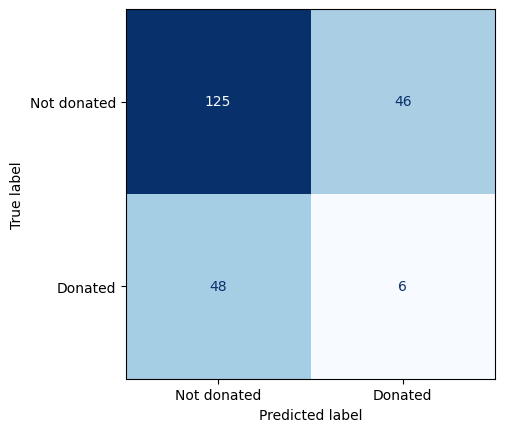

Accuracy %              : 58.2222%
Precision score         : 0.1111
Recall score            : 0.1154
F1 score                : 0.5849
Cross Validation score  : 0.0
Training time           : 0.2733 Seconds




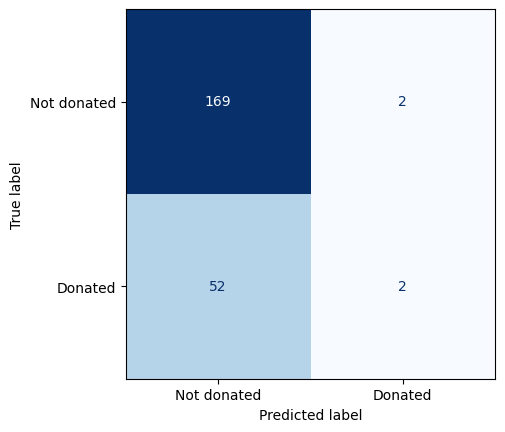

Accuracy %              : 76.0%
Precision score         : 0.037
Recall score            : 0.5
F1 score                : 0.8481
Cross Validation score  : 0.0
Training time           : 0.022 Seconds




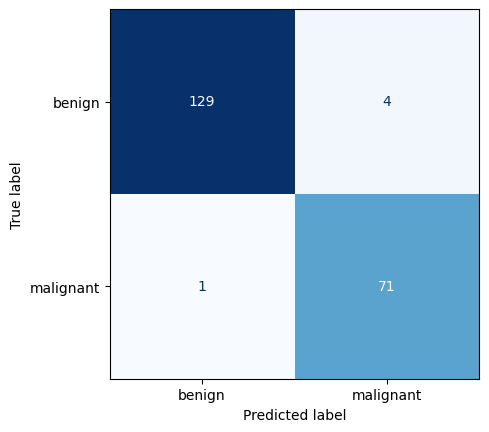

Accuracy %              : 97.561%
Precision score         : 0.9861
Recall score            : 0.9467
F1 score                : 0.9755
Cross Validation score  : 0.9371
Training time           : 0.0011 Seconds




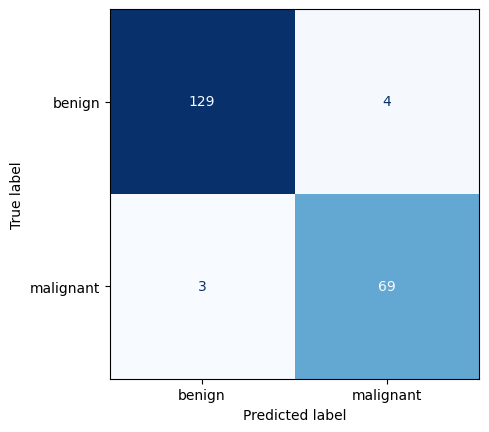

Accuracy %              : 96.5854%
Precision score         : 0.9583
Recall score            : 0.9452
F1 score                : 0.9658
Cross Validation score  : 0.9663
Training time           : 0.001 Seconds




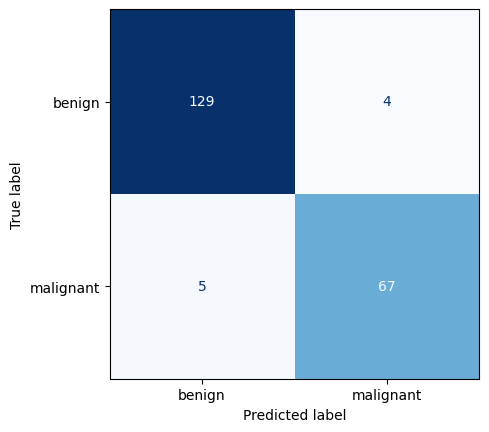

Accuracy %              : 95.6098%
Precision score         : 0.9306
Recall score            : 0.9437
F1 score                : 0.9562
Cross Validation score  : 0.937
Training time           : 0.0021 Seconds




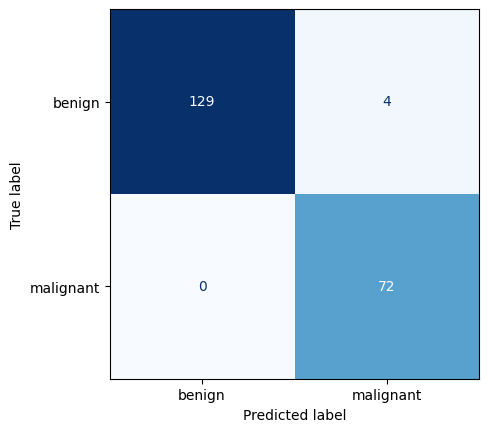

Accuracy %              : 98.0488%
Precision score         : 1.0
Recall score            : 0.9474
F1 score                : 0.9804
Cross Validation score  : 0.9678
Training time           : 0.0031 Seconds




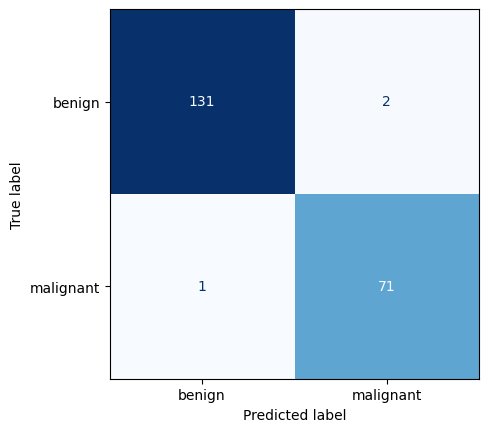

Accuracy %              : 98.5366%
Precision score         : 0.9861
Recall score            : 0.9726
F1 score                : 0.9853
Cross Validation score  : 0.962
Training time           : 0.155 Seconds




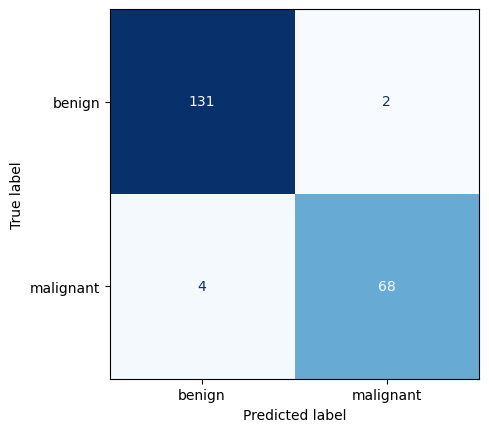

Accuracy %              : 97.0732%
Precision score         : 0.9444
Recall score            : 0.9714
F1 score                : 0.9708
Cross Validation score  : 0.0
Training time           : 0.1163 Seconds




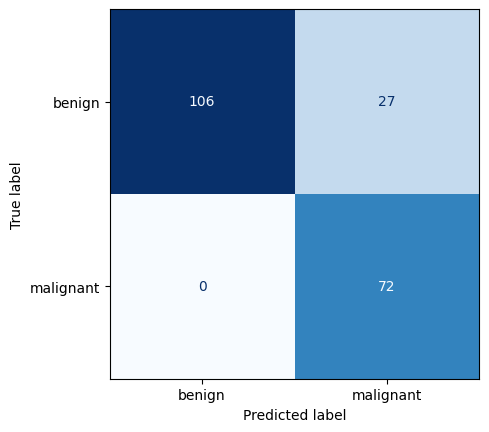

Accuracy %              : 86.8293%
Precision score         : 1.0
Recall score            : 0.7273
F1 score                : 0.8653
Cross Validation score  : 0.0
Training time           : 0.0816 Seconds




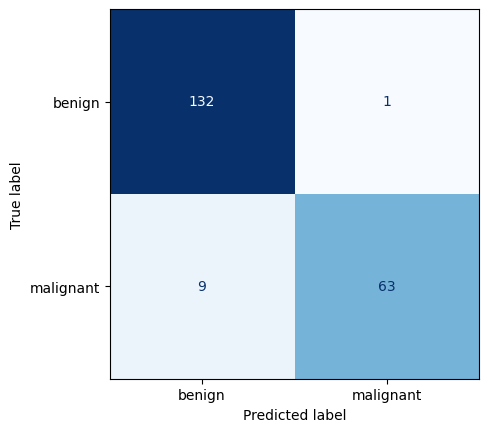

Accuracy %              : 95.122%
Precision score         : 0.875
Recall score            : 0.9844
F1 score                : 0.9519
Cross Validation score  : 0.0
Training time           : 0.0183 Seconds




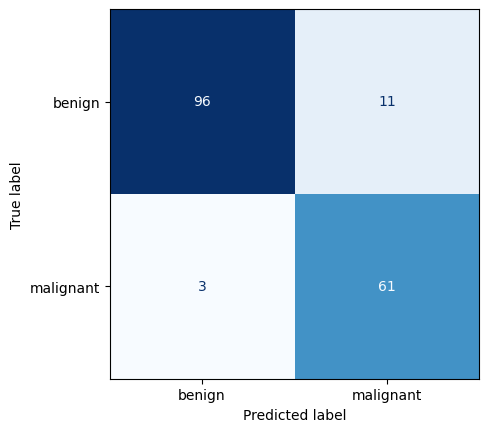

Accuracy %              : 91.8129%
Precision score         : 0.9531
Recall score            : 0.8472
F1 score                : 0.9173
Cross Validation score  : 0.8839
Training time           : 0.001 Seconds




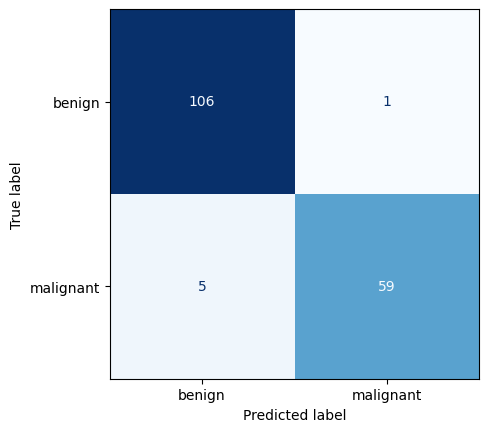

Accuracy %              : 96.4912%
Precision score         : 0.9219
Recall score            : 0.9833
F1 score                : 0.9652
Cross Validation score  : 0.9191
Training time           : 0.001 Seconds




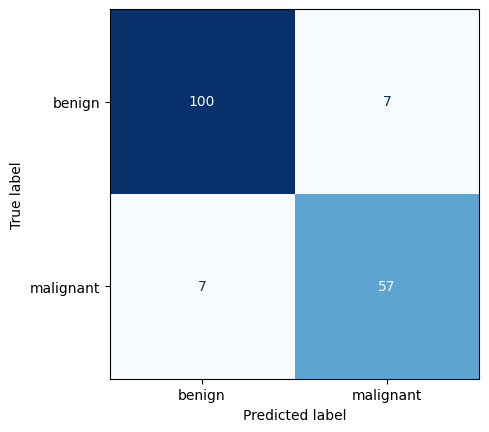

Accuracy %              : 91.8129%
Precision score         : 0.8906
Recall score            : 0.8906
F1 score                : 0.9181
Cross Validation score  : 0.9209
Training time           : 0.009 Seconds




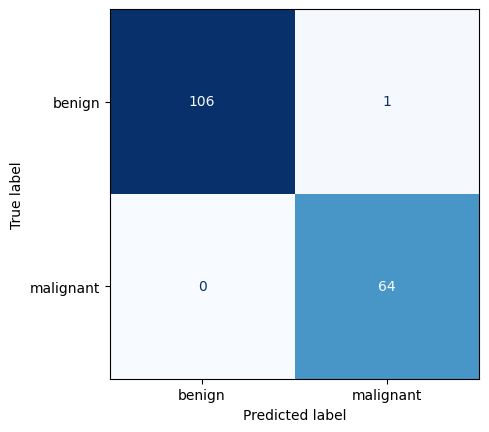

Accuracy %              : 99.4152%
Precision score         : 1.0
Recall score            : 0.9846
F1 score                : 0.9941
Cross Validation score  : 0.9051
Training time           : 0.004 Seconds




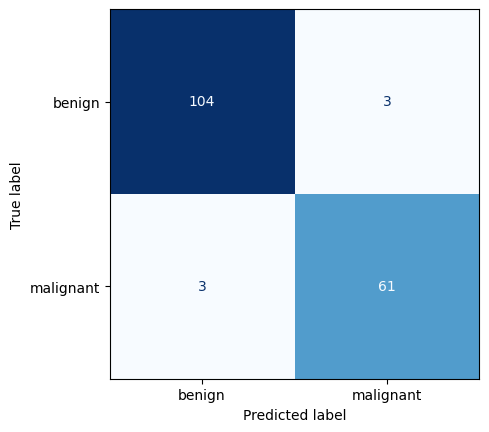

Accuracy %              : 96.4912%
Precision score         : 0.9531
Recall score            : 0.9531
F1 score                : 0.9649
Cross Validation score  : 0.9614
Training time           : 0.2059 Seconds




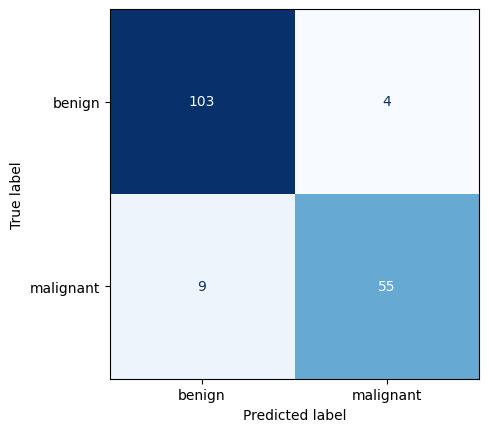

Accuracy %              : 92.3977%
Precision score         : 0.8594
Recall score            : 0.9322
F1 score                : 0.9247
Cross Validation score  : 0.0
Training time           : 0.1066 Seconds




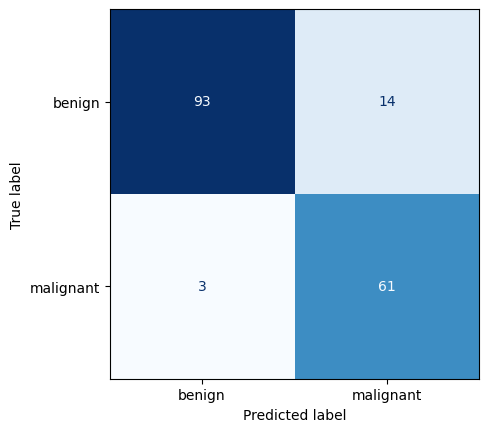

Accuracy %              : 90.0585%
Precision score         : 0.9531
Recall score            : 0.8133
F1 score                : 0.8993
Cross Validation score  : 0.0
Training time           : 0.0591 Seconds




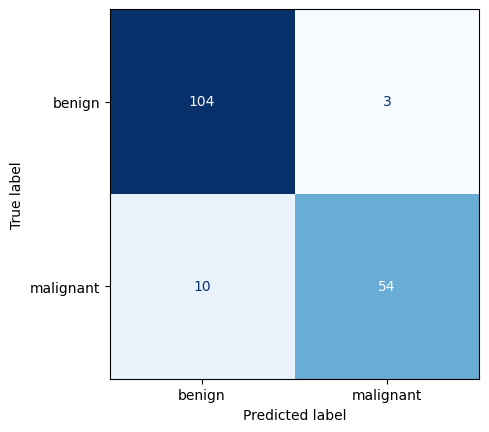

Accuracy %              : 92.3977%
Precision score         : 0.8438
Recall score            : 0.9474
F1 score                : 0.925
Cross Validation score  : 0.0
Training time           : 0.0395 Seconds




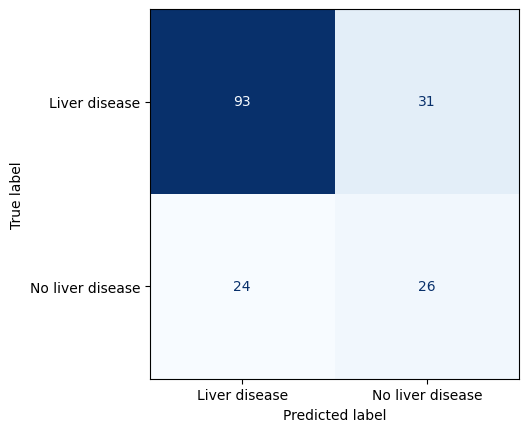

Accuracy %              : 68.3908%
Precision score         : 0.75
Recall score            : 0.7949
F1 score                : 0.6782
Cross Validation score  : 0.5771
Training time           : 0.001 Seconds




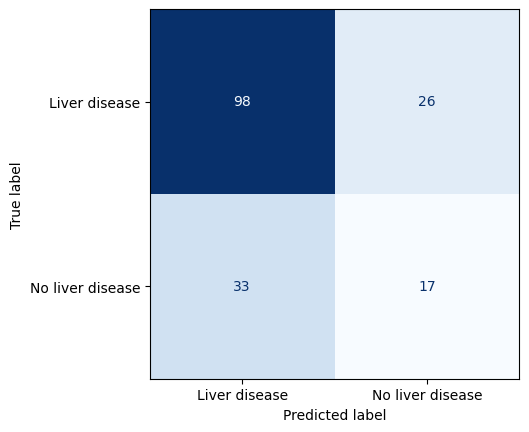

Accuracy %              : 66.092%
Precision score         : 0.7903
Recall score            : 0.7481
F1 score                : 0.669
Cross Validation score  : 0.6478
Training time           : 0.0015 Seconds




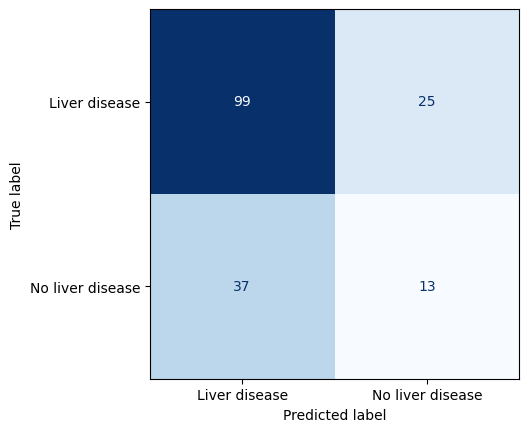

Accuracy %              : 64.3678%
Precision score         : 0.7984
Recall score            : 0.7279
F1 score                : 0.6598
Cross Validation score  : 0.6564
Training time           : 0.003 Seconds




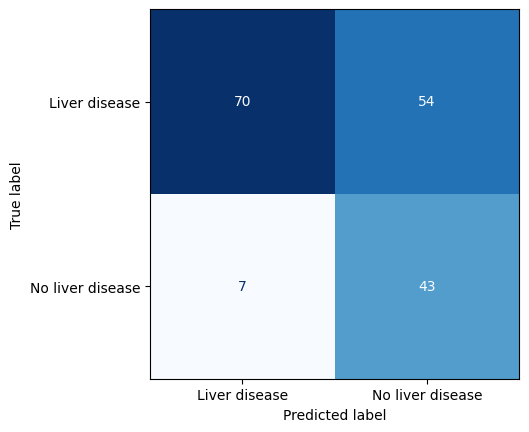

Accuracy %              : 64.9425%
Precision score         : 0.5645
Recall score            : 0.9091
F1 score                : 0.6344
Cross Validation score  : 0.5787
Training time           : 0.0065 Seconds




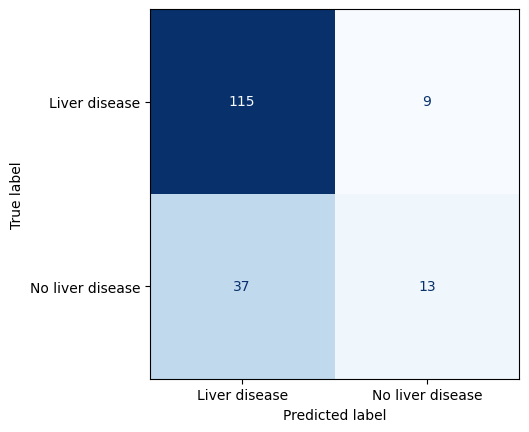

Accuracy %              : 73.5632%
Precision score         : 0.9274
Recall score            : 0.7566
F1 score                : 0.7736
Cross Validation score  : 0.6909
Training time           : 0.185 Seconds




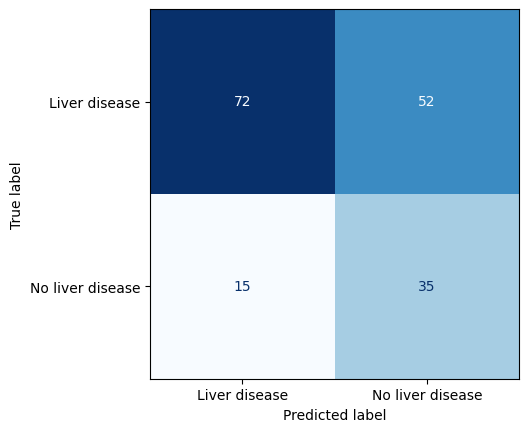

Accuracy %              : 61.4943%
Precision score         : 0.5806
Recall score            : 0.8276
F1 score                : 0.5967
Cross Validation score  : 0.0
Training time           : 0.1096 Seconds




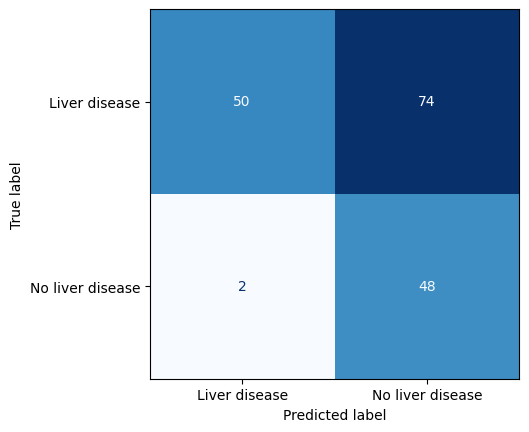

Accuracy %              : 56.3218%
Precision score         : 0.4032
Recall score            : 0.9615
F1 score                : 0.5611
Cross Validation score  : 0.0
Training time           : 0.0473 Seconds




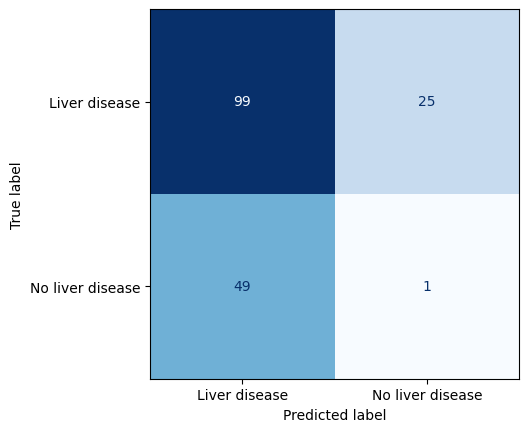

Accuracy %              : 57.4713%
Precision score         : 0.7984
Recall score            : 0.6689
F1 score                : 0.6231
Cross Validation score  : 0.0
Training time           : 0.0179 Seconds




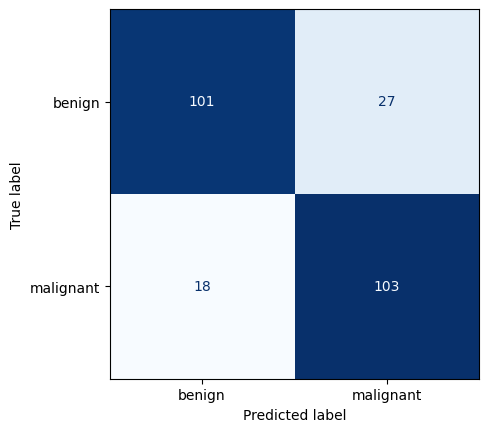

Accuracy %              : 81.9277%
Precision score         : 0.8512
Recall score            : 0.7923
F1 score                : 0.8193
Cross Validation score  : 0.7022
Training time           : 0.0015 Seconds




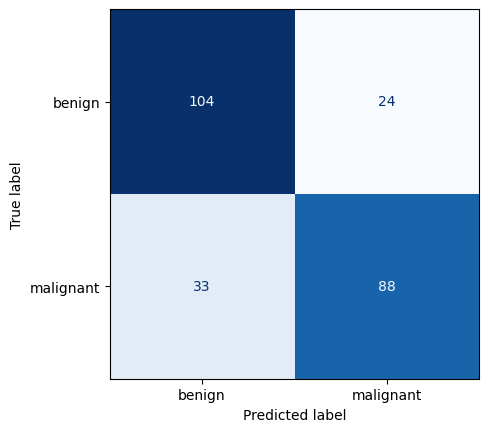

Accuracy %              : 77.1084%
Precision score         : 0.7273
Recall score            : 0.7857
F1 score                : 0.7716
Cross Validation score  : 0.7901
Training time           : 0.002 Seconds




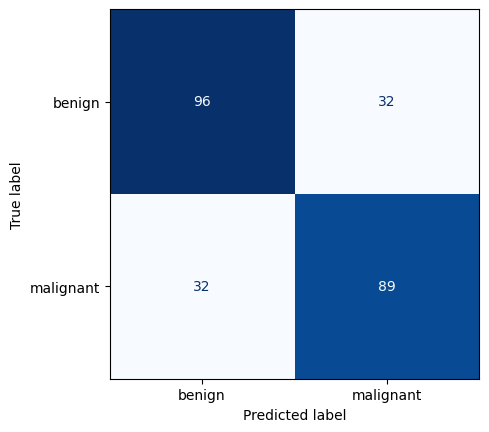

Accuracy %              : 74.2972%
Precision score         : 0.7355
Recall score            : 0.7355
F1 score                : 0.743
Cross Validation score  : 0.7551
Training time           : 0.002 Seconds




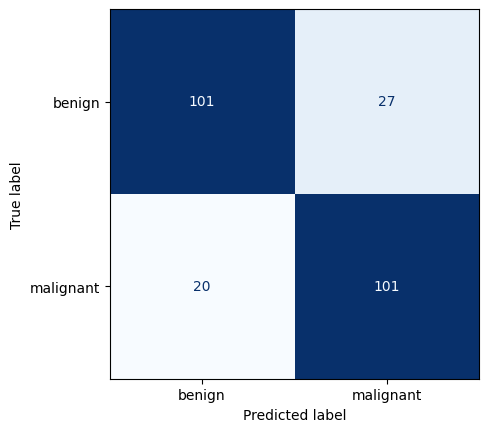

Accuracy %              : 81.1245%
Precision score         : 0.8347
Recall score            : 0.7891
F1 score                : 0.8112
Cross Validation score  : 0.7817
Training time           : 0.008 Seconds




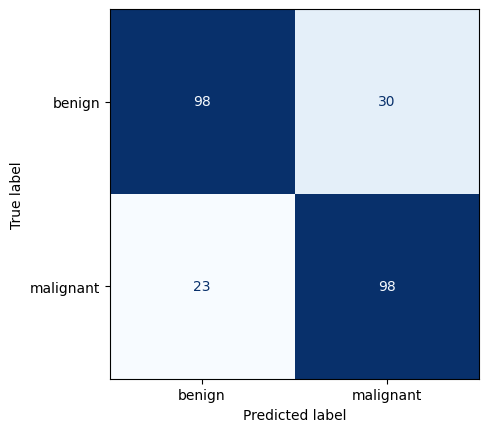

Accuracy %              : 78.7149%
Precision score         : 0.8099
Recall score            : 0.7656
F1 score                : 0.7871
Cross Validation score  : 0.7852
Training time           : 0.1808 Seconds




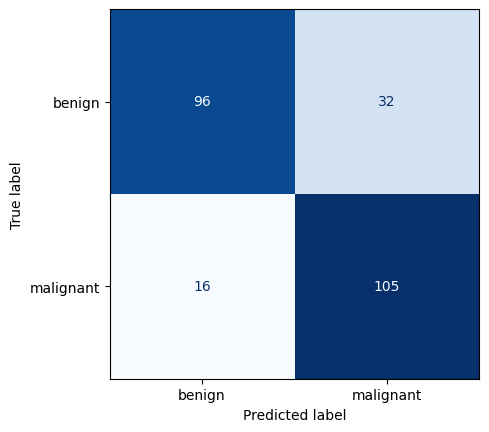

Accuracy %              : 80.7229%
Precision score         : 0.8678
Recall score            : 0.7664
F1 score                : 0.8077
Cross Validation score  : 0.0
Training time           : 0.1226 Seconds




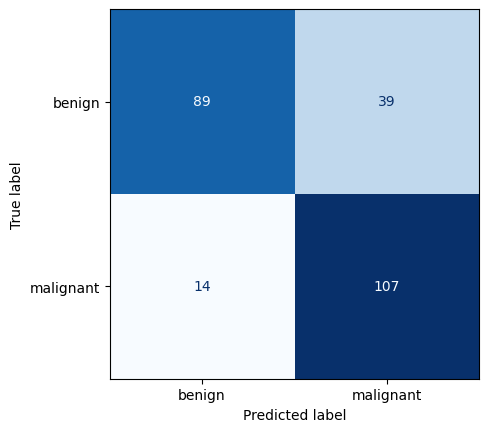

Accuracy %              : 78.7149%
Precision score         : 0.8843
Recall score            : 0.7329
F1 score                : 0.7887
Cross Validation score  : 0.0
Training time           : 0.0415 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


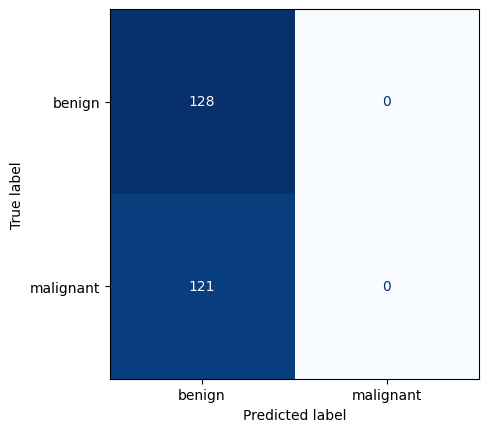

Accuracy %              : 51.4056%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.679
Cross Validation score  : 0.0
Training time           : 0.0277 Seconds




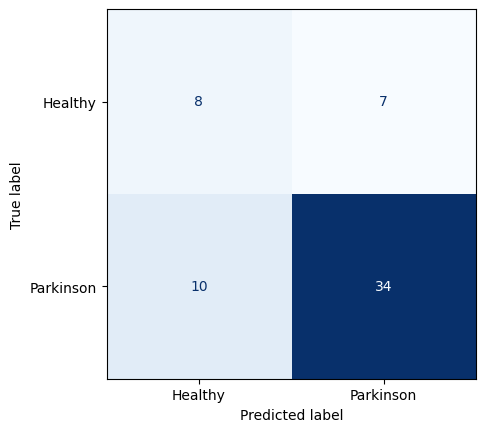

Accuracy %              : 71.1864%
Precision score         : 0.7727
Recall score            : 0.8293
F1 score                : 0.7039
Cross Validation score  : 0.4615
Training time           : 0.0016 Seconds




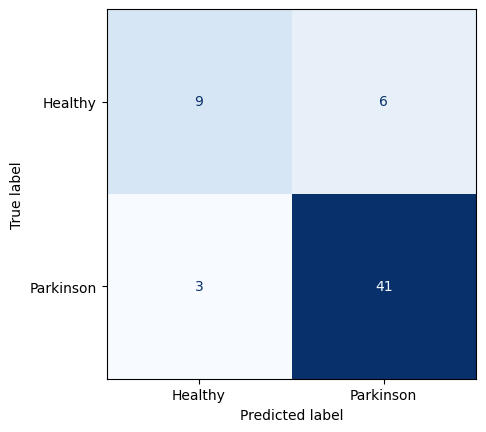

Accuracy %              : 84.7458%
Precision score         : 0.9318
Recall score            : 0.8723
F1 score                : 0.8534
Cross Validation score  : 0.7179
Training time           : 0.0011 Seconds




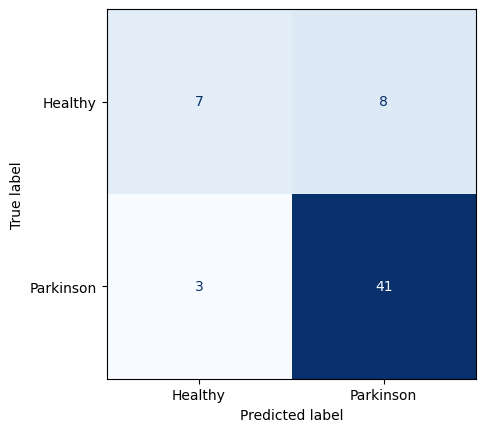

Accuracy %              : 81.3559%
Precision score         : 0.9318
Recall score            : 0.8367
F1 score                : 0.8272
Cross Validation score  : 0.7538
Training time           : 0.0021 Seconds




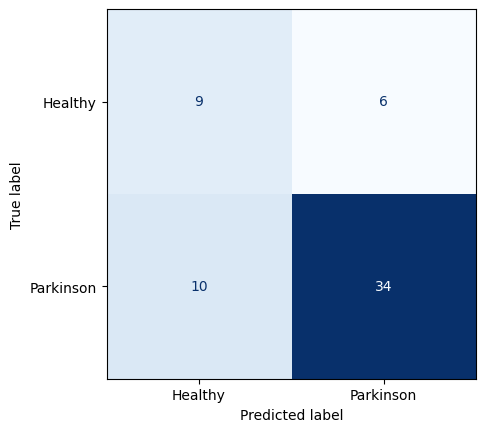

Accuracy %              : 72.8814%
Precision score         : 0.7727
Recall score            : 0.85
F1 score                : 0.7193
Cross Validation score  : 0.7179
Training time           : 0.002 Seconds




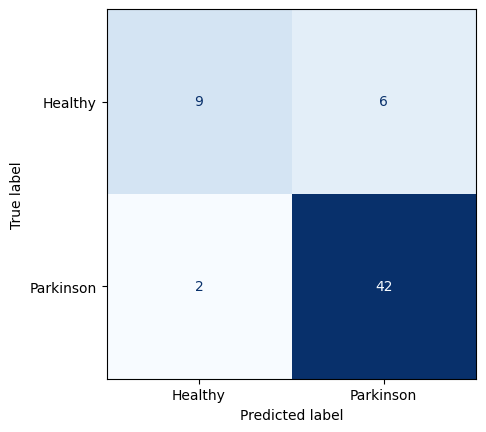

Accuracy %              : 86.4407%
Precision score         : 0.9545
Recall score            : 0.875
F1 score                : 0.8719
Cross Validation score  : 0.7846
Training time           : 0.1556 Seconds




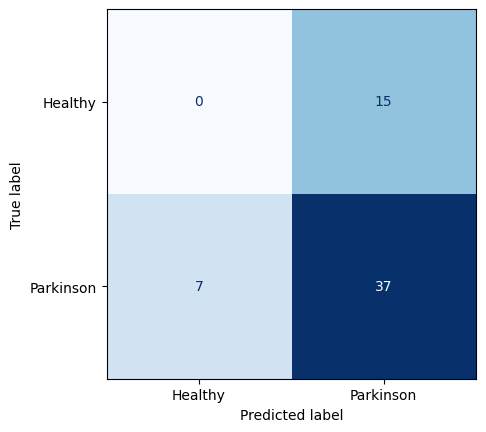

Accuracy %              : 62.7119%
Precision score         : 0.8409
Recall score            : 0.7115
F1 score                : 0.6794
Cross Validation score  : 0.0
Training time           : 0.1032 Seconds




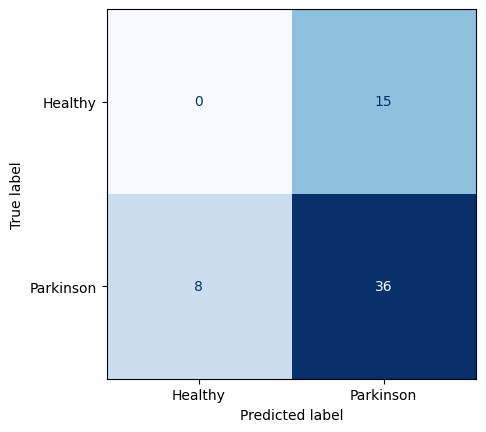

Accuracy %              : 61.0169%
Precision score         : 0.8182
Recall score            : 0.7059
F1 score                : 0.6551
Cross Validation score  : 0.0
Training time           : 0.0496 Seconds




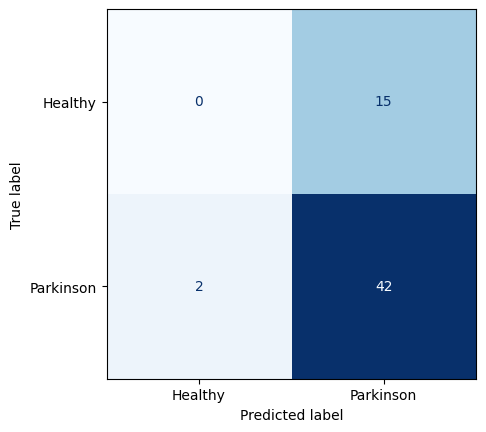

Accuracy %              : 71.1864%
Precision score         : 0.9545
Recall score            : 0.7368
F1 score                : 0.8035
Cross Validation score  : 0.0
Training time           : 0.0144 Seconds




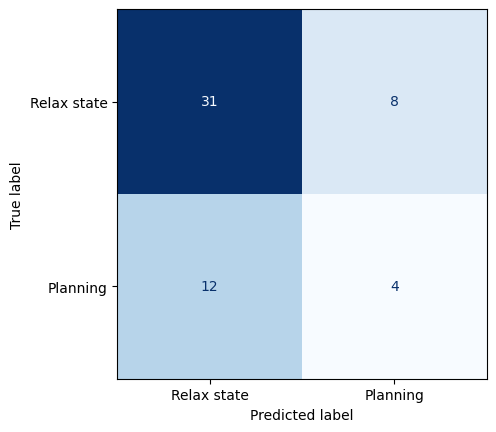

Accuracy %              : 63.6364%
Precision score         : 0.25
Recall score            : 0.3333
F1 score                : 0.6535
Cross Validation score  : 0.555
Training time           : 0.0029 Seconds




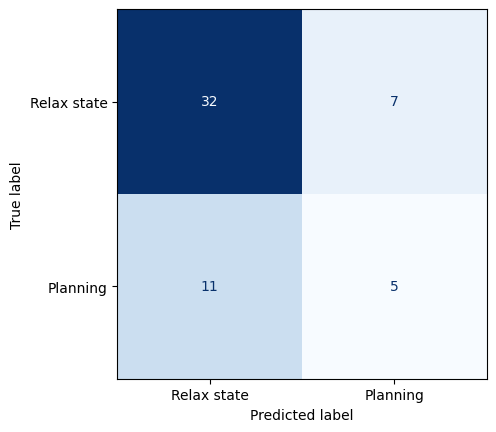

Accuracy %              : 67.2727%
Precision score         : 0.3125
Recall score            : 0.4167
F1 score                : 0.6881
Cross Validation score  : 0.6377
Training time           : 0.001 Seconds




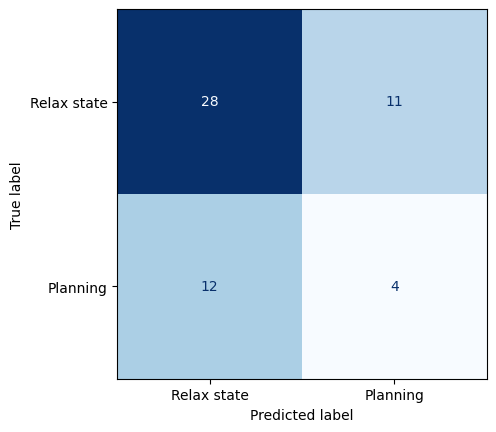

Accuracy %              : 58.1818%
Precision score         : 0.25
Recall score            : 0.2667
F1 score                : 0.5859
Cross Validation score  : 0.589
Training time           : 0.003 Seconds




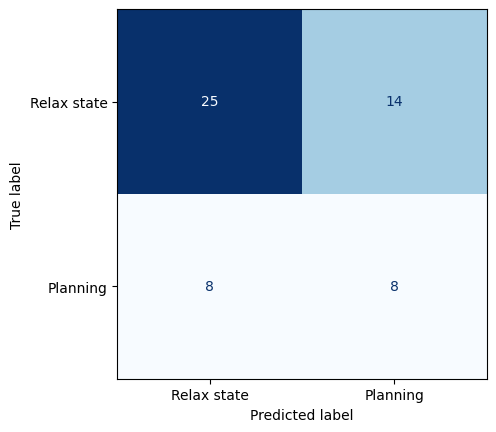

Accuracy %              : 60.0%
Precision score         : 0.5
Recall score            : 0.3636
F1 score                : 0.5851
Cross Validation score  : 0.4823
Training time           : 0.002 Seconds




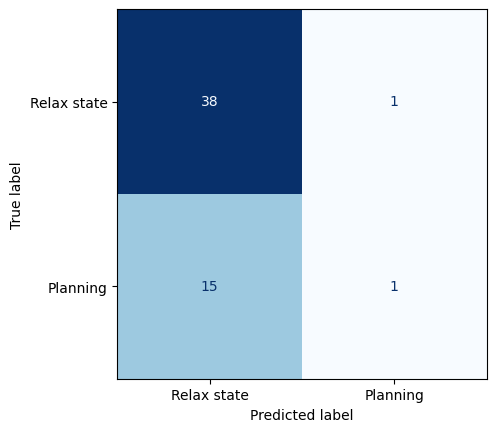

Accuracy %              : 70.9091%
Precision score         : 0.0625
Recall score            : 0.5
F1 score                : 0.8001
Cross Validation score  : 0.6926
Training time           : 0.1556 Seconds




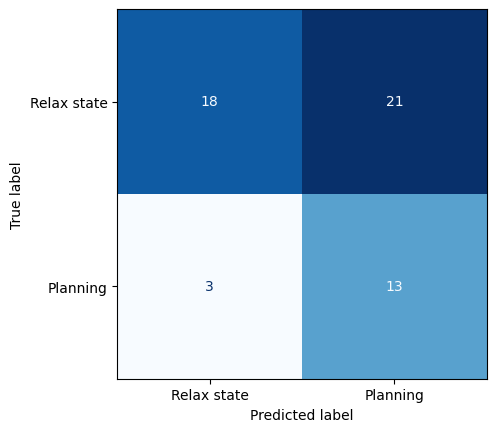

Accuracy %              : 56.3636%
Precision score         : 0.8125
Recall score            : 0.3824
F1 score                : 0.5505
Cross Validation score  : 0.0
Training time           : 0.1008 Seconds




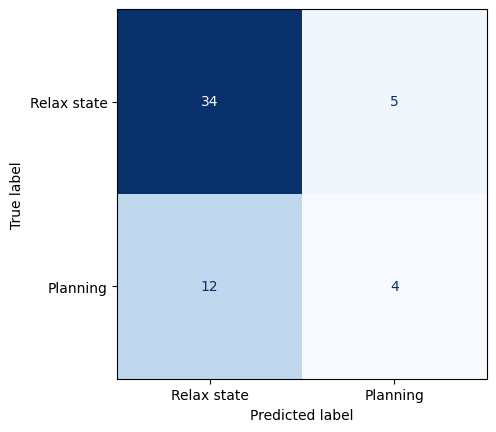

Accuracy %              : 69.0909%
Precision score         : 0.25
Recall score            : 0.4444
F1 score                : 0.7215
Cross Validation score  : 0.0
Training time           : 0.0971 Seconds




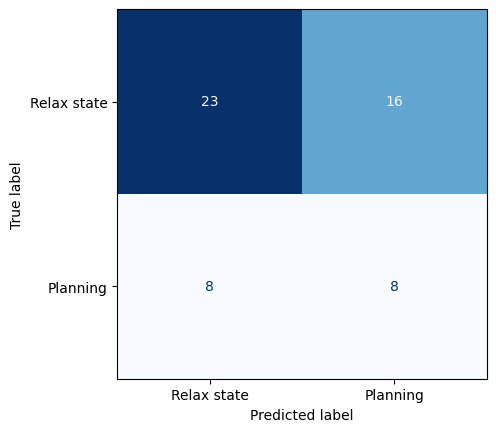

Accuracy %              : 56.3636%
Precision score         : 0.5
Recall score            : 0.3333
F1 score                : 0.5449
Cross Validation score  : 0.0
Training time           : 0.015 Seconds




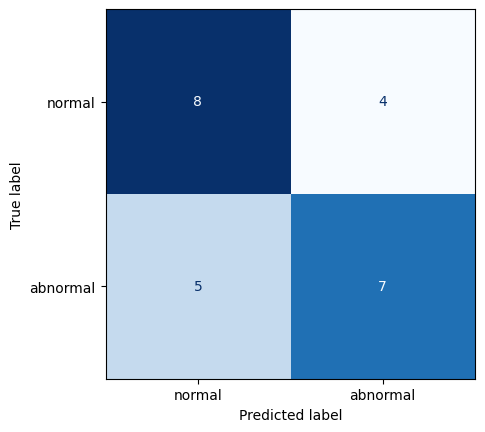

Accuracy %              : 62.5%
Precision score         : 0.5833
Recall score            : 0.6364
F1 score                : 0.6257
Cross Validation score  : 0.6958
Training time           : 0.002 Seconds




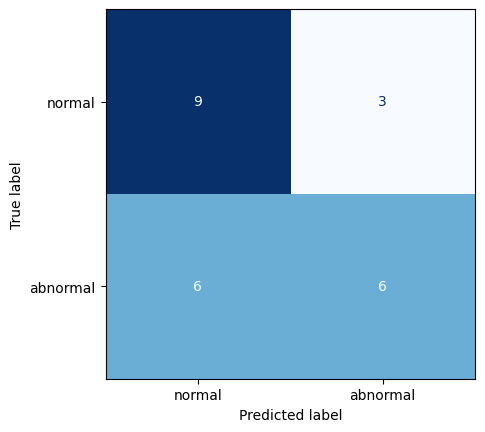

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.495
Training time           : 0.001 Seconds




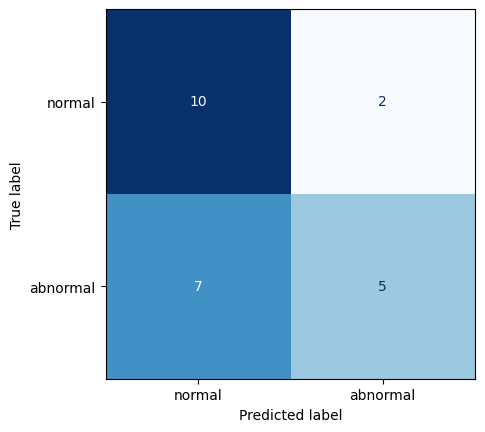

Accuracy %              : 62.5%
Precision score         : 0.4167
Recall score            : 0.7143
F1 score                : 0.642
Cross Validation score  : 0.6342
Training time           : 0.001 Seconds




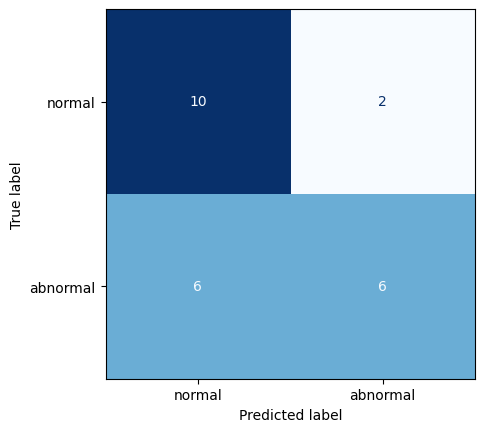

Accuracy %              : 66.6667%
Precision score         : 0.5
Recall score            : 0.75
F1 score                : 0.6762
Cross Validation score  : 0.72
Training time           : 0.002 Seconds




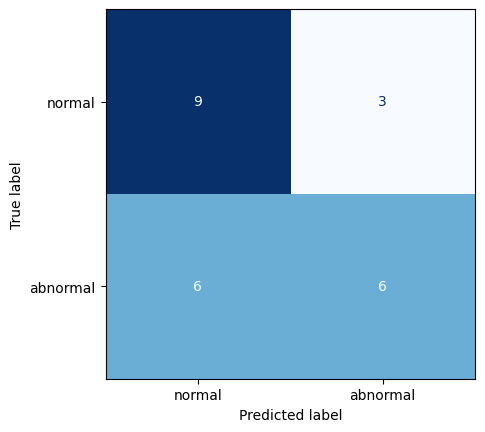

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.6833
Training time           : 0.1291 Seconds




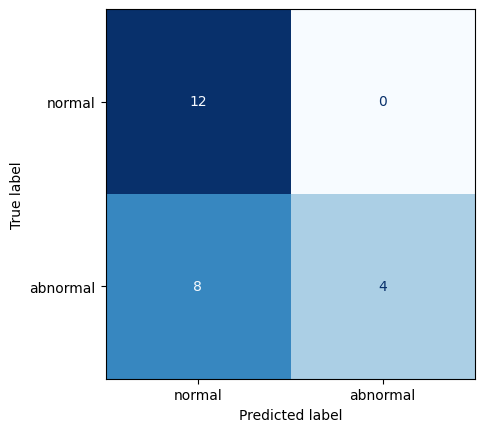

Accuracy %              : 66.6667%
Precision score         : 0.3333
Recall score            : 1.0
F1 score                : 0.7083
Cross Validation score  : 0.0
Training time           : 0.0932 Seconds




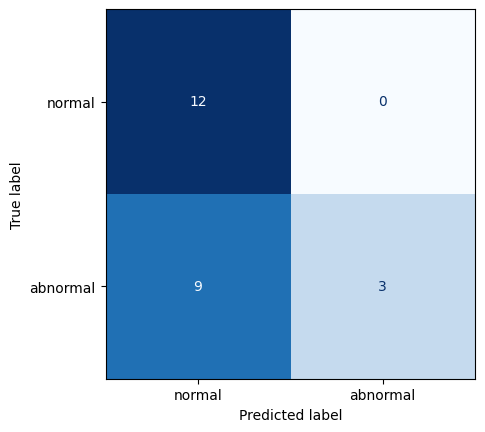

Accuracy %              : 62.5%
Precision score         : 0.25
Recall score            : 1.0
F1 score                : 0.6864
Cross Validation score  : 0.0
Training time           : 0.0204 Seconds




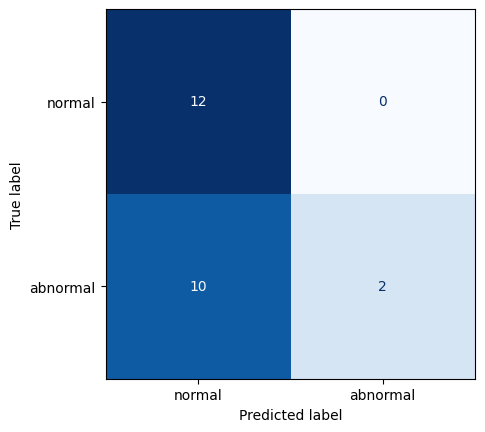

Accuracy %              : 58.3333%
Precision score         : 0.1667
Recall score            : 1.0
F1 score                : 0.6709
Cross Validation score  : 0.0
Training time           : 0.008 Seconds




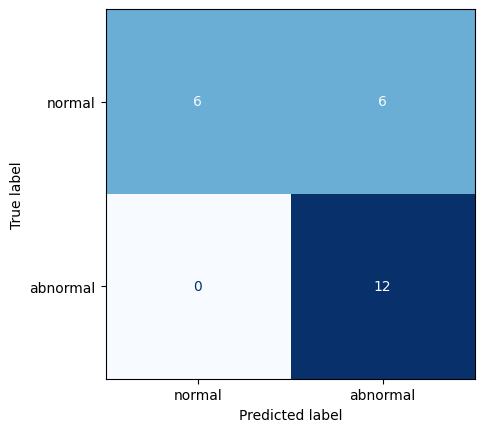

Accuracy %              : 75.0%
Precision score         : 1.0
Recall score            : 0.6667
F1 score                : 0.7667
Cross Validation score  : 0.4933
Training time           : 0.001 Seconds




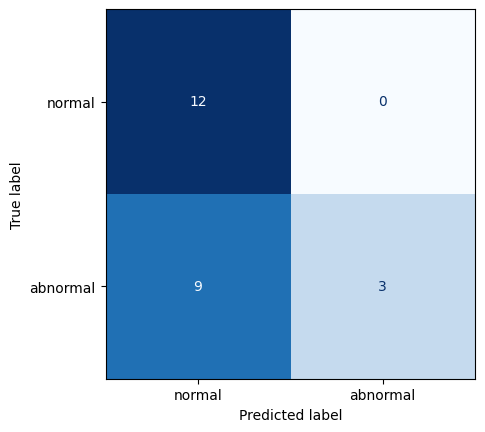

Accuracy %              : 62.5%
Precision score         : 0.25
Recall score            : 1.0
F1 score                : 0.6864
Cross Validation score  : 0.7208
Training time           : 0.001 Seconds




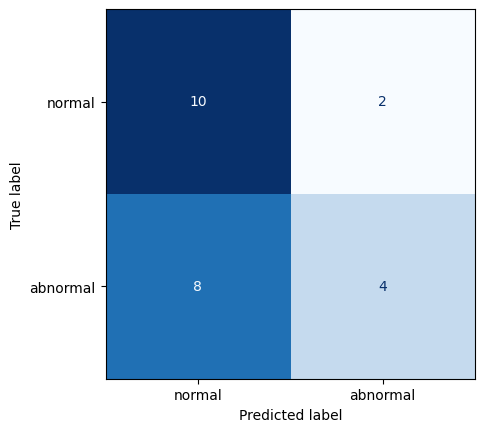

Accuracy %              : 58.3333%
Precision score         : 0.3333
Recall score            : 0.6667
F1 score                : 0.6111
Cross Validation score  : 0.6342
Training time           : 0.0019 Seconds




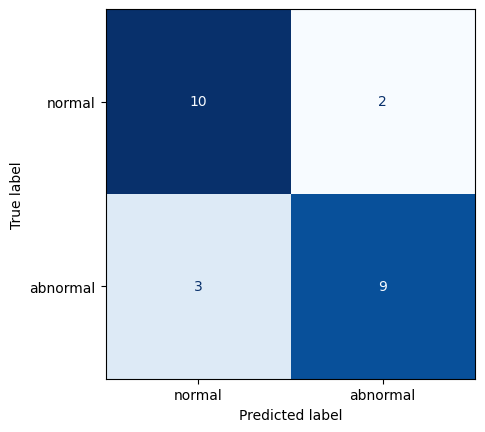

Accuracy %              : 79.1667%
Precision score         : 0.75
Recall score            : 0.8182
F1 score                : 0.792
Cross Validation score  : 0.785
Training time           : 0.0025 Seconds




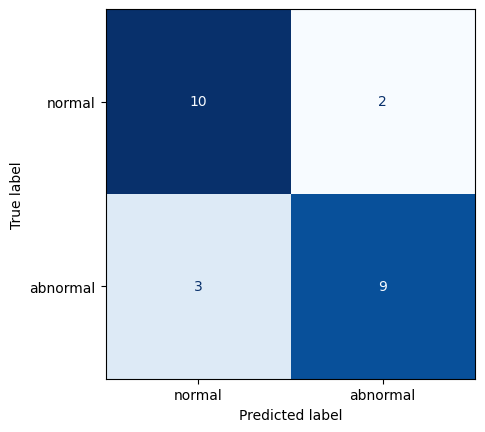

Accuracy %              : 79.1667%
Precision score         : 0.75
Recall score            : 0.8182
F1 score                : 0.792
Cross Validation score  : 0.7983
Training time           : 0.1355 Seconds




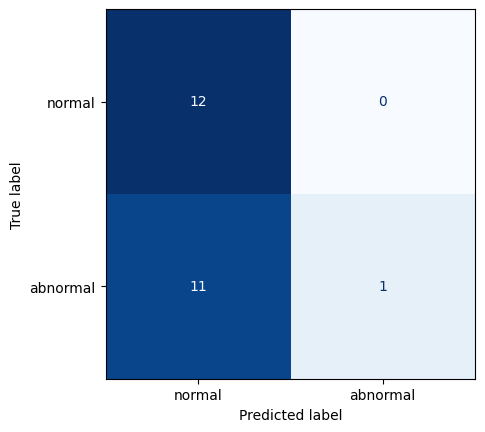

Accuracy %              : 54.1667%
Precision score         : 0.0833
Recall score            : 1.0
F1 score                : 0.6636
Cross Validation score  : 0.0
Training time           : 0.0983 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


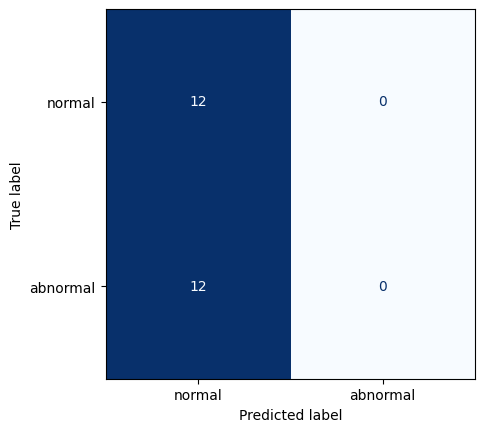

Accuracy %              : 50.0%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.6667
Cross Validation score  : 0.0
Training time           : 0.0305 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


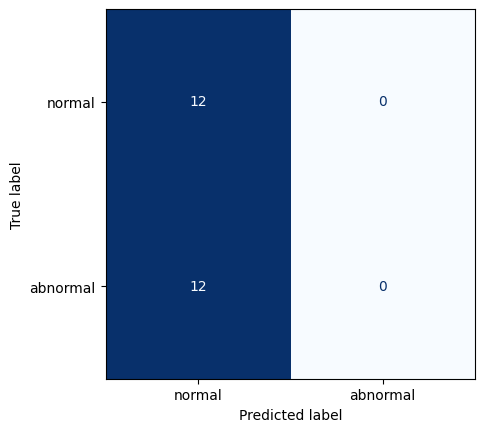

Accuracy %              : 50.0%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.6667
Cross Validation score  : 0.0
Training time           : 0.0148 Seconds




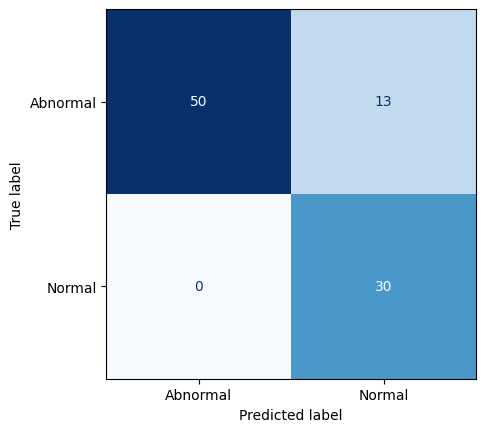

Accuracy %              : 86.0215%
Precision score         : 1.0
Recall score            : 0.6977
F1 score                : 0.8558
Cross Validation score  : 0.7837
Training time           : 0.0011 Seconds




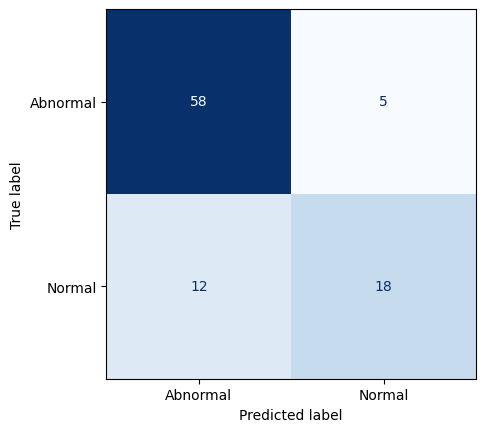

Accuracy %              : 81.7204%
Precision score         : 0.6
Recall score            : 0.7826
F1 score                : 0.8245
Cross Validation score  : 0.7964
Training time           : 0.0 Seconds




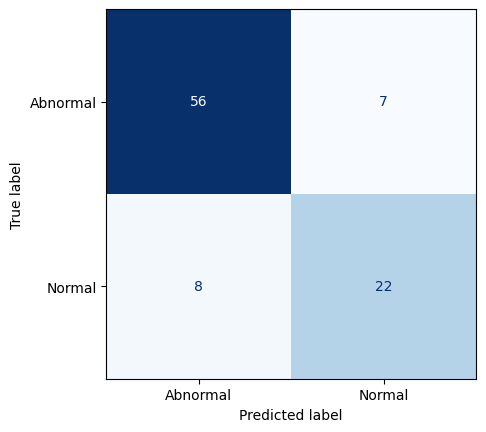

Accuracy %              : 83.871%
Precision score         : 0.7333
Recall score            : 0.7586
F1 score                : 0.8394
Cross Validation score  : 0.7672
Training time           : 0.002 Seconds




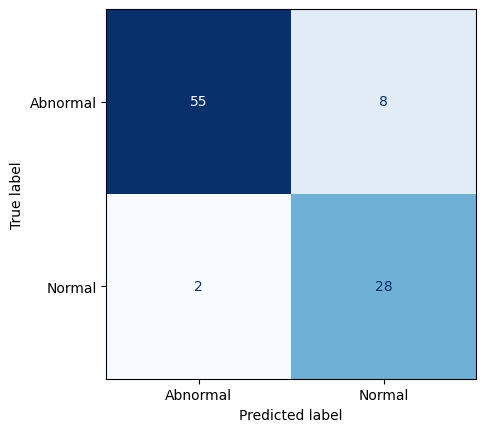

Accuracy %              : 89.2473%
Precision score         : 0.9333
Recall score            : 0.7778
F1 score                : 0.8903
Cross Validation score  : 0.7934
Training time           : 0.003 Seconds




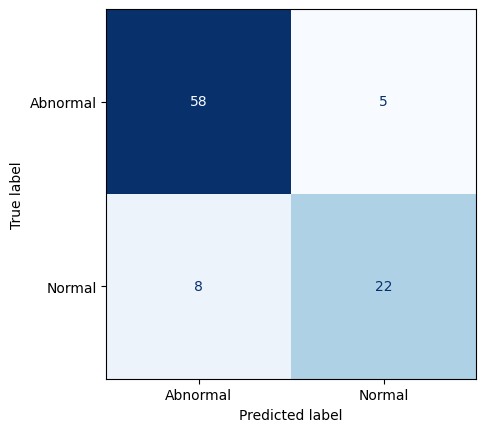

Accuracy %              : 86.0215%
Precision score         : 0.7333
Recall score            : 0.8148
F1 score                : 0.8623
Cross Validation score  : 0.7994
Training time           : 0.1477 Seconds




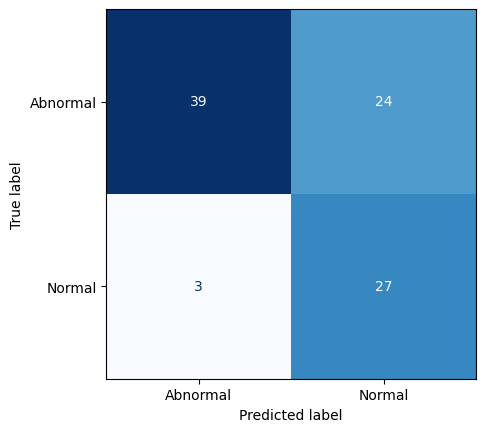

Accuracy %              : 70.9677%
Precision score         : 0.9
Recall score            : 0.5294
F1 score                : 0.7011
Cross Validation score  : 0.0
Training time           : 0.0972 Seconds




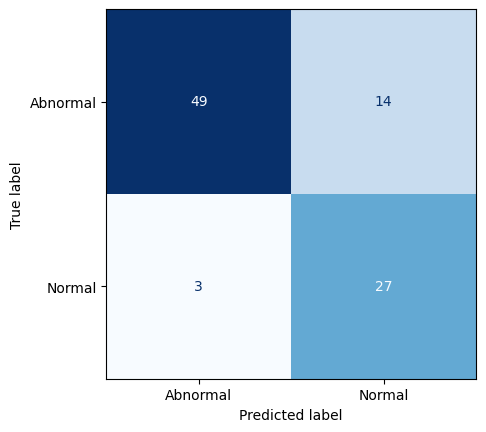

Accuracy %              : 81.7204%
Precision score         : 0.9
Recall score            : 0.6585
F1 score                : 0.8118
Cross Validation score  : 0.0
Training time           : 0.123 Seconds




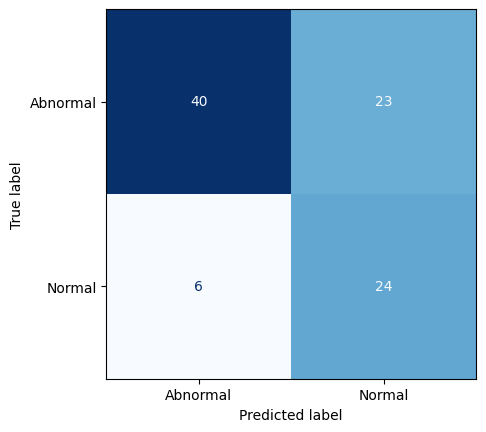

Accuracy %              : 68.8172%
Precision score         : 0.8
Recall score            : 0.5106
F1 score                : 0.6781
Cross Validation score  : 0.0
Training time           : 0.02 Seconds




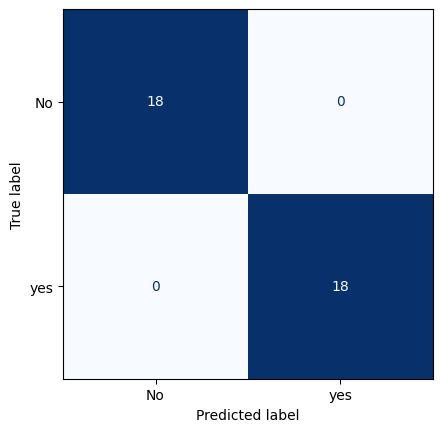

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.002 Seconds




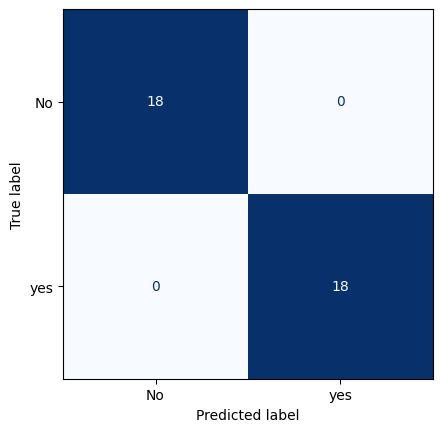

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9917
Training time           : 0.0 Seconds




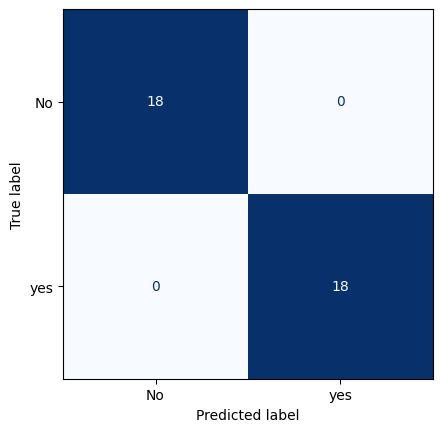

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




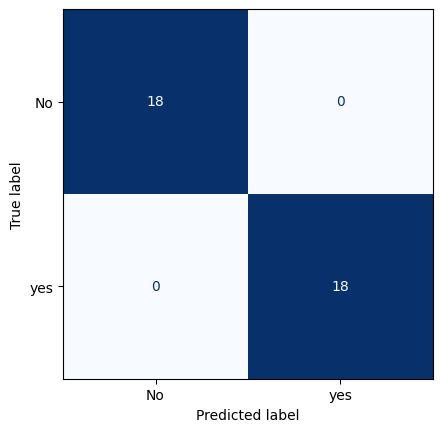

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.4917
Training time           : 0.0021 Seconds




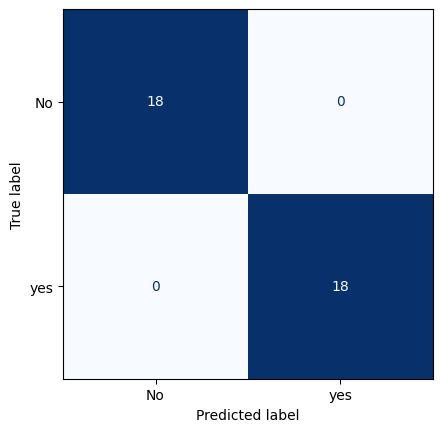

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.1252 Seconds




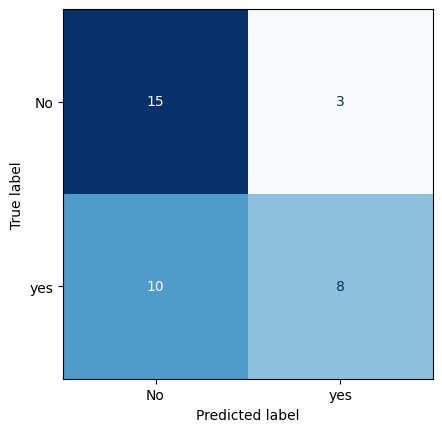

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.1036 Seconds




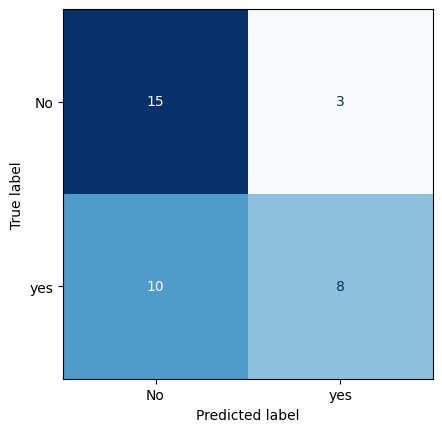

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.0155 Seconds




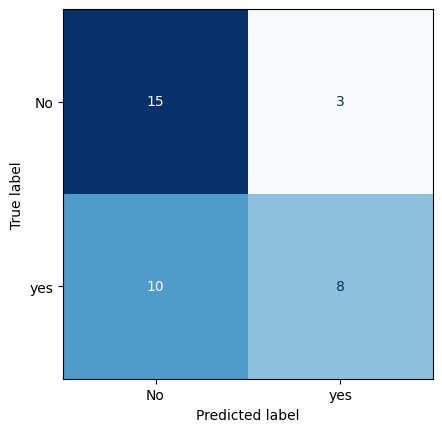

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.008 Seconds




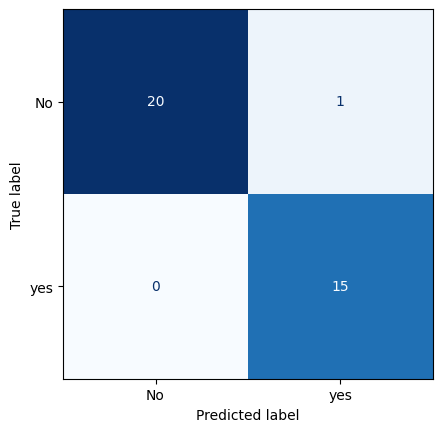

Accuracy %              : 97.2222%
Precision score         : 1.0
Recall score            : 0.9375
F1 score                : 0.9721
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




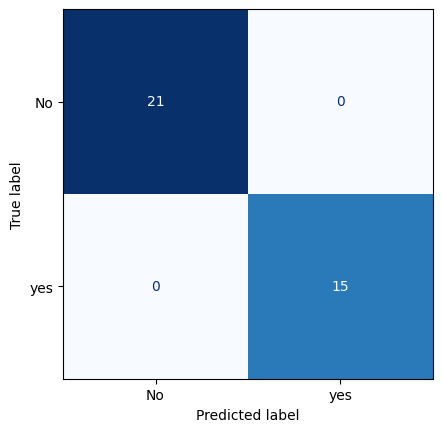

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.875
Training time           : 0.001 Seconds




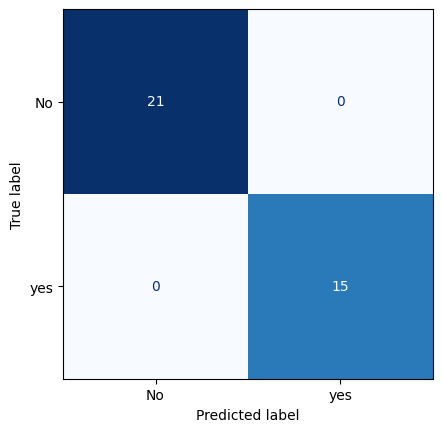

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.8583
Training time           : 0.002 Seconds




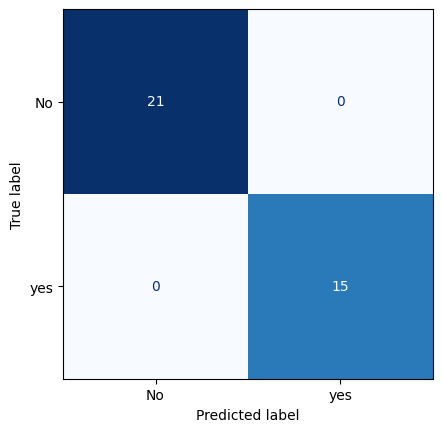

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.5333
Training time           : 0.002 Seconds




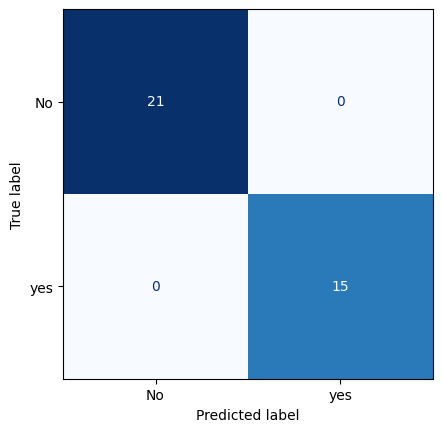

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.1408 Seconds




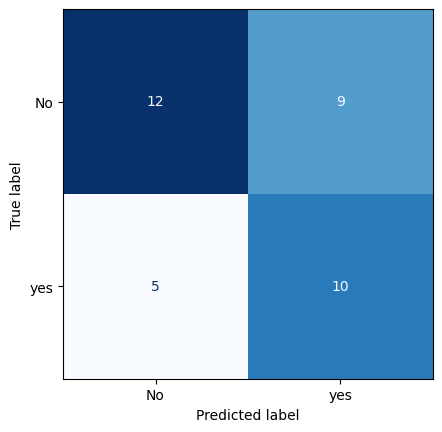

Accuracy %              : 61.1111%
Precision score         : 0.6667
Recall score            : 0.5263
F1 score                : 0.6087
Cross Validation score  : 0.0
Training time           : 0.0916 Seconds




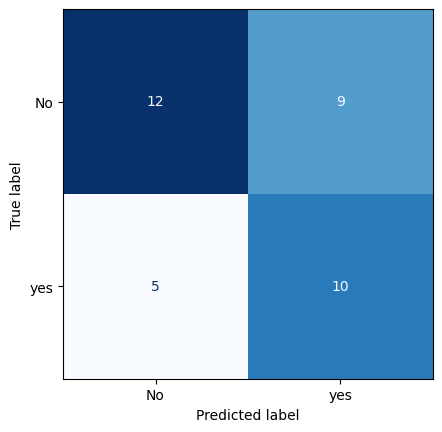

Accuracy %              : 61.1111%
Precision score         : 0.6667
Recall score            : 0.5263
F1 score                : 0.6087
Cross Validation score  : 0.0
Training time           : 0.0179 Seconds




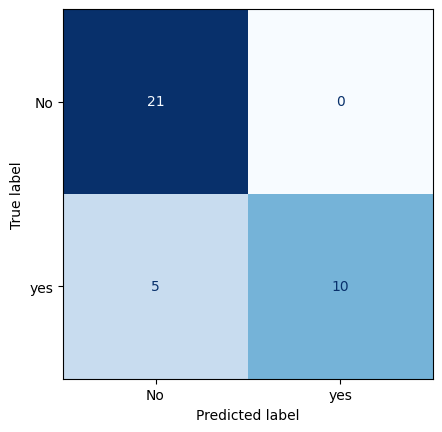

Accuracy %              : 86.1111%
Precision score         : 0.6667
Recall score            : 1.0
F1 score                : 0.8676
Cross Validation score  : 0.0
Training time           : 0.0089 Seconds




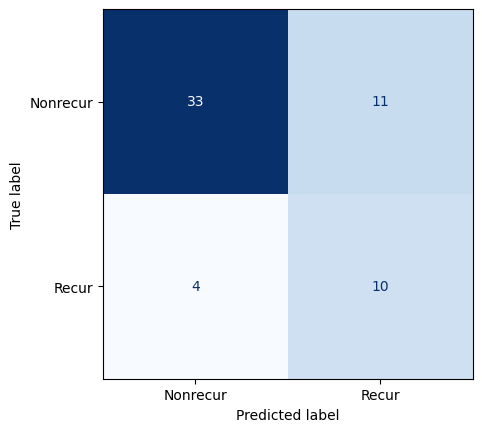

Accuracy %              : 74.1379%
Precision score         : 0.7143
Recall score            : 0.4762
F1 score                : 0.7267
Cross Validation score  : 0.5067
Training time           : 0.001 Seconds




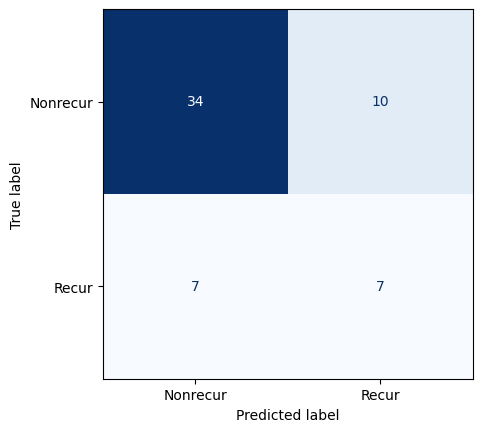

Accuracy %              : 70.6897%
Precision score         : 0.5
Recall score            : 0.4118
F1 score                : 0.6979
Cross Validation score  : 0.7194
Training time           : 0.0011 Seconds




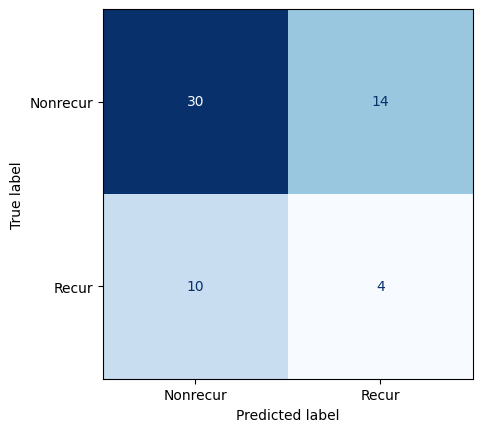

Accuracy %              : 58.6207%
Precision score         : 0.2857
Recall score            : 0.2222
F1 score                : 0.5702
Cross Validation score  : 0.673
Training time           : 0.005 Seconds




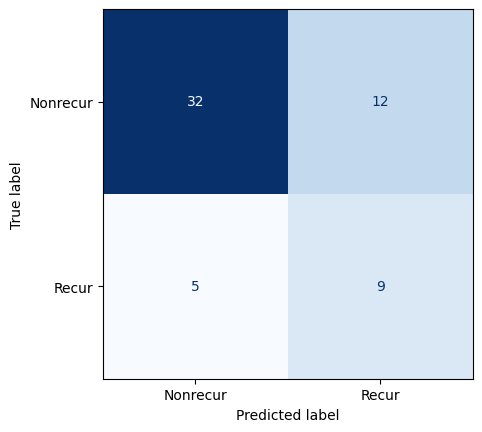

Accuracy %              : 70.6897%
Precision score         : 0.6429
Recall score            : 0.4286
F1 score                : 0.6903
Cross Validation score  : 0.5791
Training time           : 0.002 Seconds




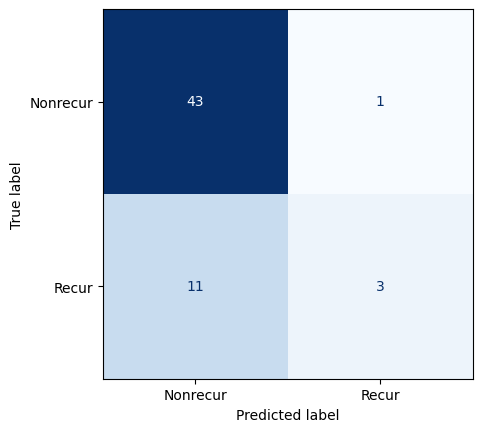

Accuracy %              : 79.3103%
Precision score         : 0.2143
Recall score            : 0.75
F1 score                : 0.84
Cross Validation score  : 0.7665
Training time           : 0.1565 Seconds




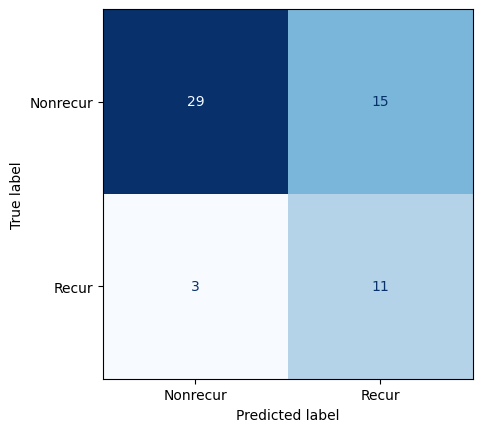

Accuracy %              : 68.9655%
Precision score         : 0.7857
Recall score            : 0.4231
F1 score                : 0.6676
Cross Validation score  : 0.0
Training time           : 0.1113 Seconds




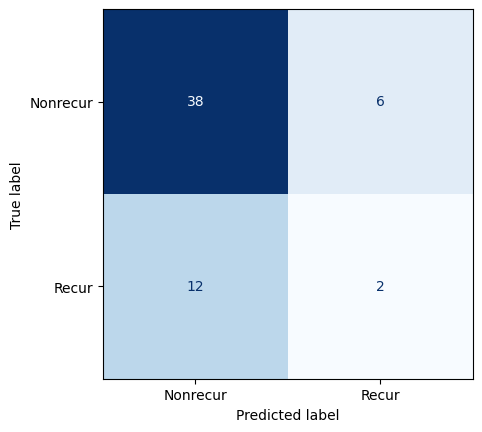

Accuracy %              : 68.9655%
Precision score         : 0.1429
Recall score            : 0.25
F1 score                : 0.7221
Cross Validation score  : 0.0
Training time           : 0.0535 Seconds




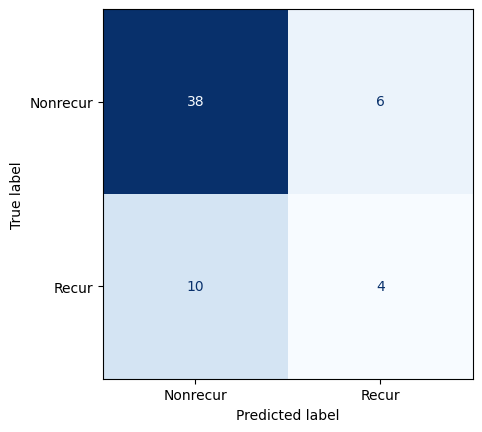

Accuracy %              : 72.4138%
Precision score         : 0.2857
Recall score            : 0.4
F1 score                : 0.7411
Cross Validation score  : 0.0
Training time           : 0.02 Seconds




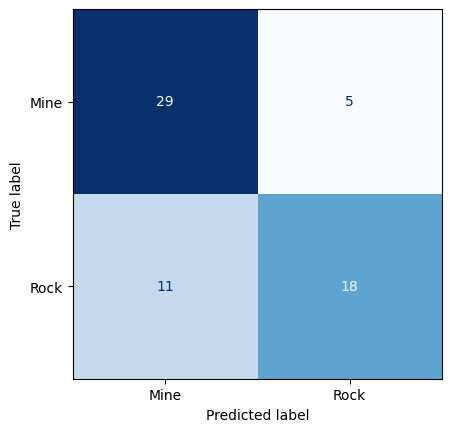

Accuracy %              : 74.6032%
Precision score         : 0.6207
Recall score            : 0.7826
F1 score                : 0.7504
Cross Validation score  : 0.5761
Training time           : 0.001 Seconds




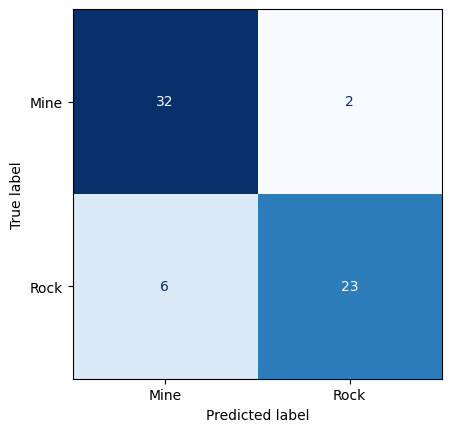

Accuracy %              : 87.3016%
Precision score         : 0.7931
Recall score            : 0.92
F1 score                : 0.8742
Cross Validation score  : 0.5304
Training time           : 0.001 Seconds




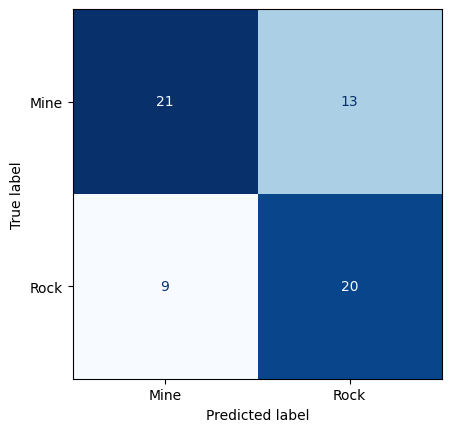

Accuracy %              : 65.0794%
Precision score         : 0.6897
Recall score            : 0.6061
F1 score                : 0.6504
Cross Validation score  : 0.6528
Training time           : 0.007 Seconds




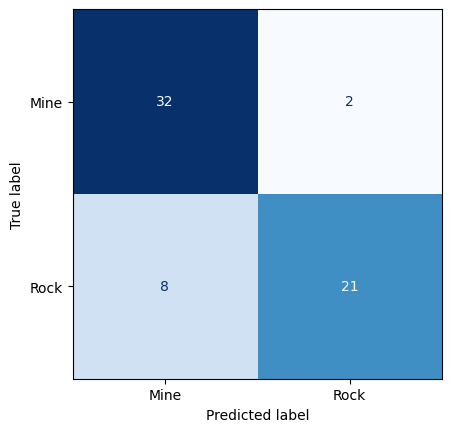

Accuracy %              : 84.127%
Precision score         : 0.7241
Recall score            : 0.913
F1 score                : 0.844
Cross Validation score  : 0.5454
Training time           : 0.003 Seconds




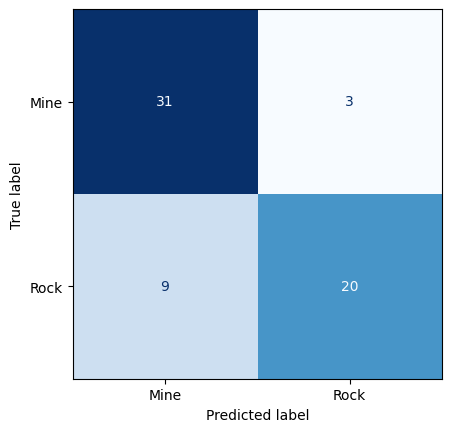

Accuracy %              : 80.9524%
Precision score         : 0.6897
Recall score            : 0.8696
F1 score                : 0.8128
Cross Validation score  : 0.7294
Training time           : 0.1754 Seconds




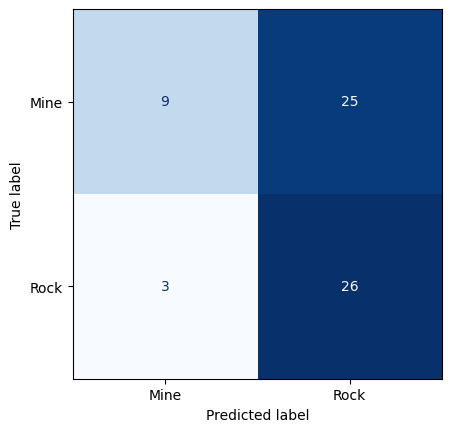

Accuracy %              : 55.5556%
Precision score         : 0.8966
Recall score            : 0.5098
F1 score                : 0.6007
Cross Validation score  : 0.0
Training time           : 0.0971 Seconds




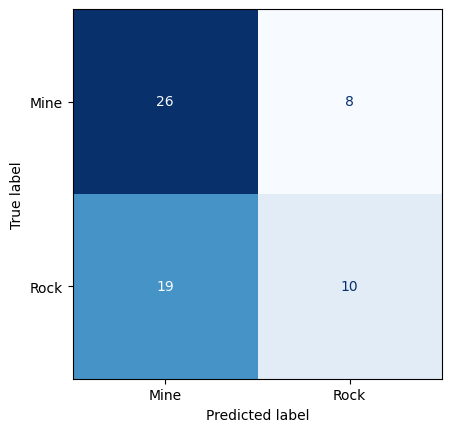

Accuracy %              : 57.1429%
Precision score         : 0.3448
Recall score            : 0.5556
F1 score                : 0.5917
Cross Validation score  : 0.0
Training time           : 0.029 Seconds




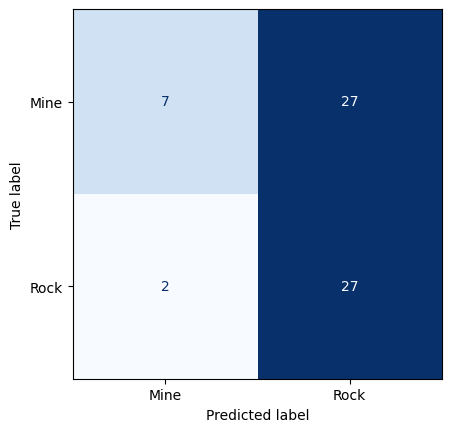

Accuracy %              : 53.9683%
Precision score         : 0.931
Recall score            : 0.5
F1 score                : 0.6042
Cross Validation score  : 0.0
Training time           : 0.0194 Seconds




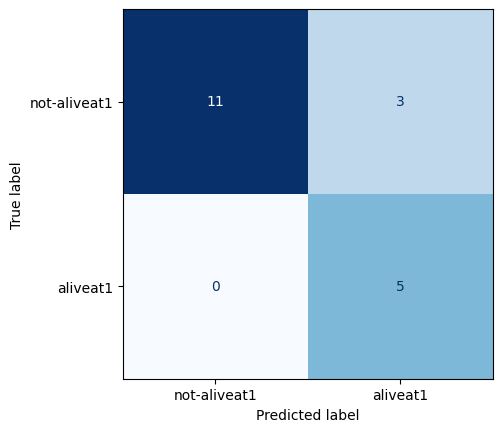

Accuracy %              : 84.2105%
Precision score         : 1.0
Recall score            : 0.625
F1 score                : 0.8334
Cross Validation score  : 0.9846
Training time           : 0.003 Seconds




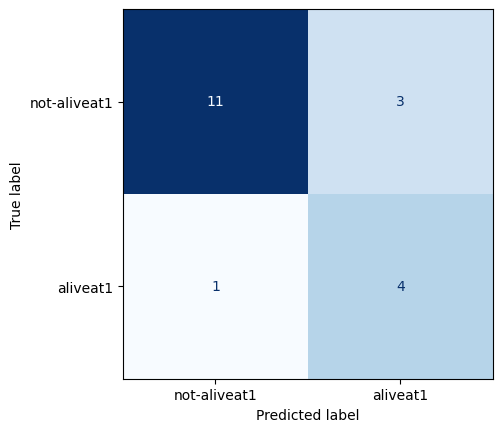

Accuracy %              : 78.9474%
Precision score         : 0.8
Recall score            : 0.5714
F1 score                : 0.78
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




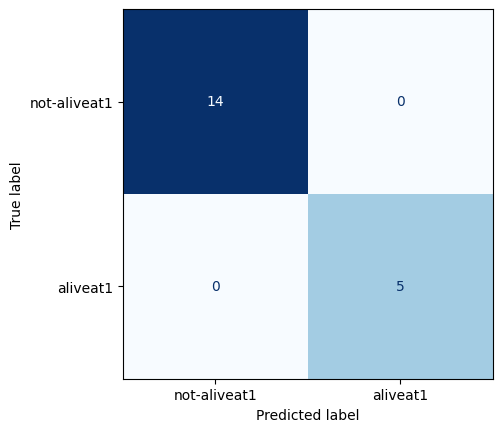

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9513
Training time           : 0.0011 Seconds




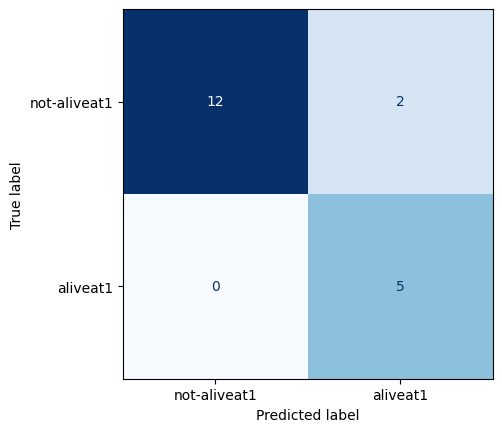

Accuracy %              : 89.4737%
Precision score         : 1.0
Recall score            : 0.7143
F1 score                : 0.89
Cross Validation score  : 0.9526
Training time           : 0.002 Seconds




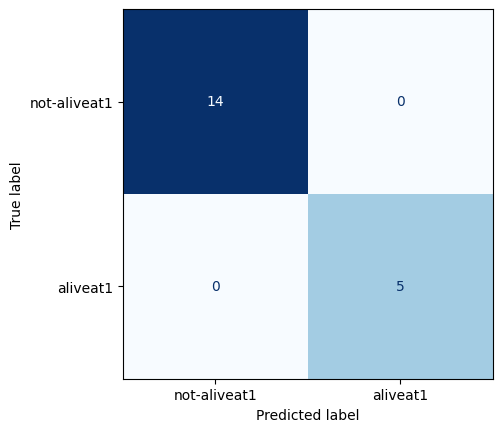

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9846
Training time           : 0.1281 Seconds




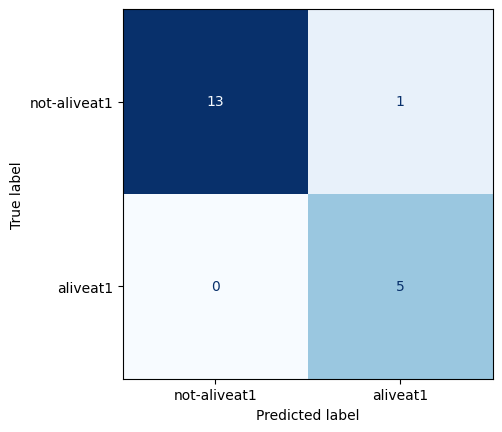

Accuracy %              : 94.7368%
Precision score         : 1.0
Recall score            : 0.8333
F1 score                : 0.946
Cross Validation score  : 0.0
Training time           : 0.0923 Seconds




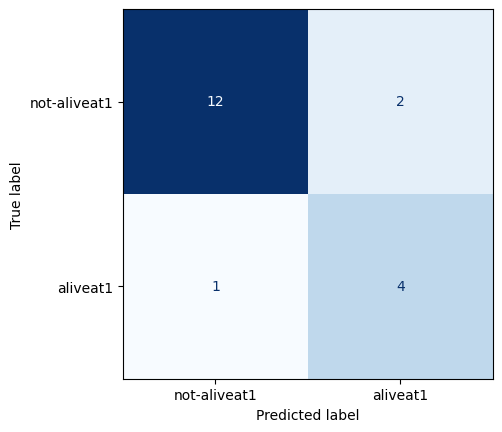

Accuracy %              : 84.2105%
Precision score         : 0.8
Recall score            : 0.6667
F1 score                : 0.8379
Cross Validation score  : 0.0
Training time           : 0.0158 Seconds




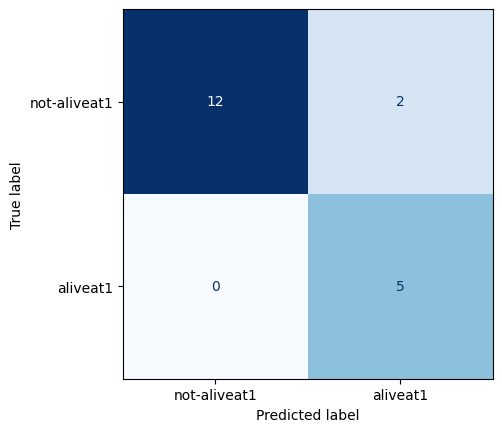

Accuracy %              : 89.4737%
Precision score         : 1.0
Recall score            : 0.7143
F1 score                : 0.89
Cross Validation score  : 0.0
Training time           : 0.008 Seconds




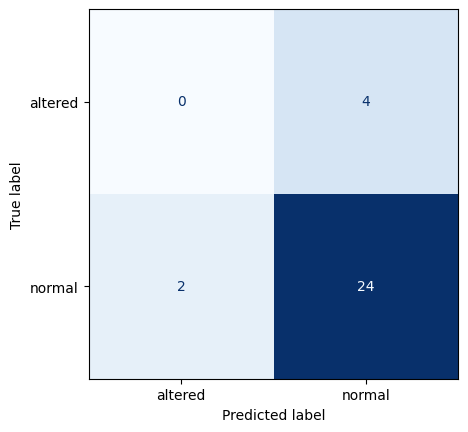

Accuracy %              : 80.0%
Precision score         : 0.9231
Recall score            : 0.8571
F1 score                : 0.8296
Cross Validation score  : 0.57
Training time           : 0.001 Seconds




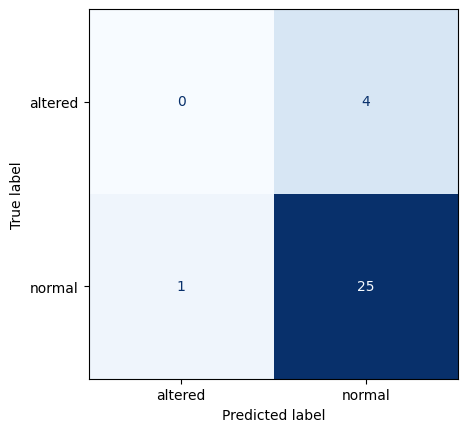

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.82
Training time           : 0.001 Seconds




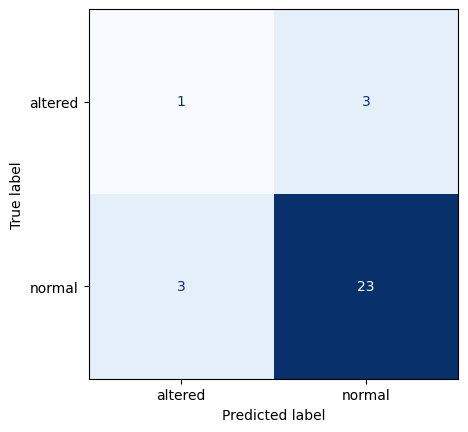

Accuracy %              : 80.0%
Precision score         : 0.8846
Recall score            : 0.8846
F1 score                : 0.8
Cross Validation score  : 0.73
Training time           : 0.001 Seconds




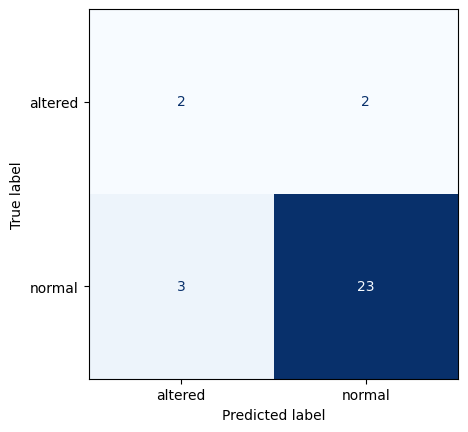

Accuracy %              : 83.3333%
Precision score         : 0.8846
Recall score            : 0.92
F1 score                : 0.8257
Cross Validation score  : 0.58
Training time           : 0.002 Seconds




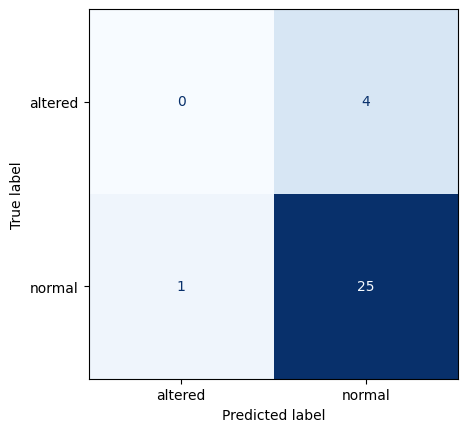

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.82
Training time           : 0.1298 Seconds




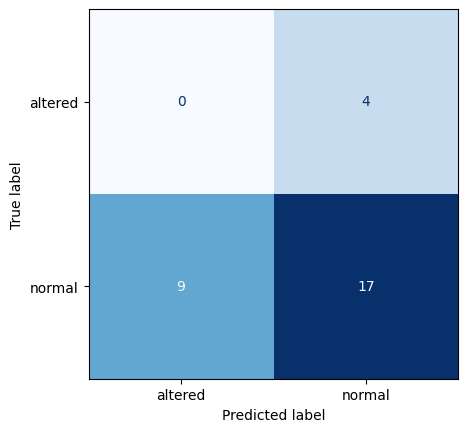

Accuracy %              : 56.6667%
Precision score         : 0.6538
Recall score            : 0.8095
F1 score                : 0.5064
Cross Validation score  : 0.0
Training time           : 0.0953 Seconds




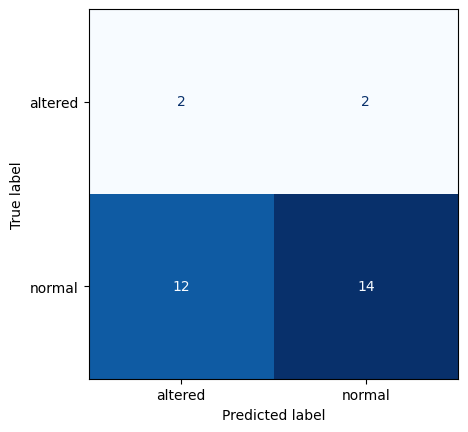

Accuracy %              : 53.3333%
Precision score         : 0.5385
Recall score            : 0.875
F1 score                : 0.4593
Cross Validation score  : 0.0
Training time           : 0.0378 Seconds




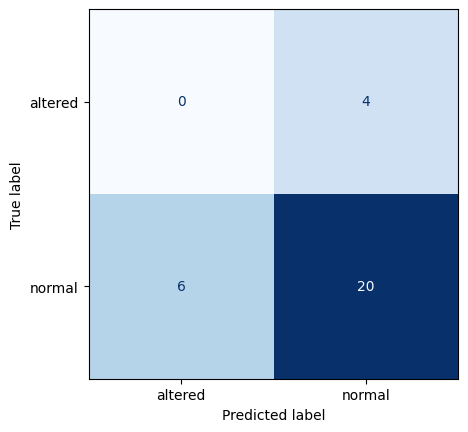

Accuracy %              : 66.6667%
Precision score         : 0.7692
Recall score            : 0.8333
F1 score                : 0.64
Cross Validation score  : 0.0
Training time           : 0.01 Seconds




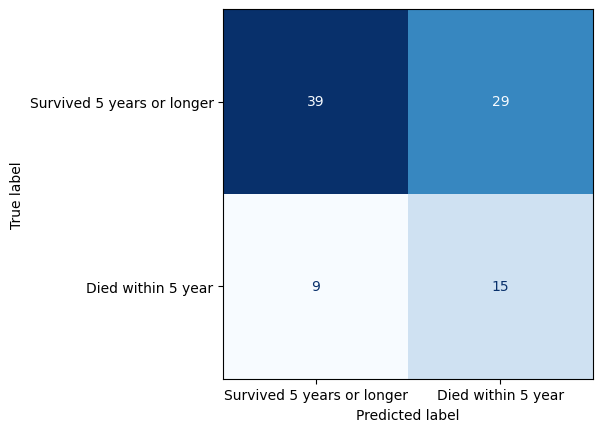

Accuracy %              : 58.6957%
Precision score         : 0.5735
Recall score            : 0.8125
F1 score                : 0.5618
Cross Validation score  : 0.742
Training time           : 0.002 Seconds




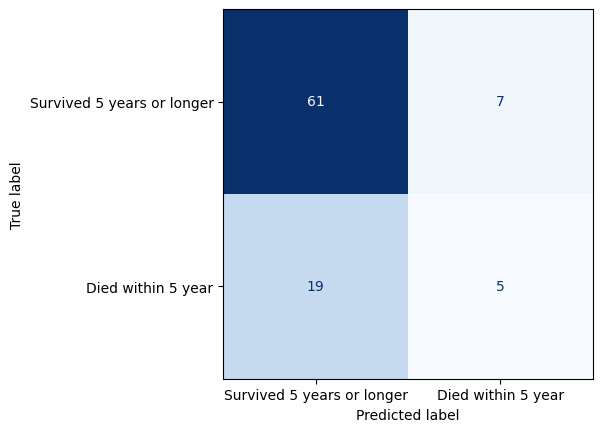

Accuracy %              : 71.7391%
Precision score         : 0.8971
Recall score            : 0.7625
F1 score                : 0.753
Cross Validation score  : 0.6631
Training time           : 0.001 Seconds




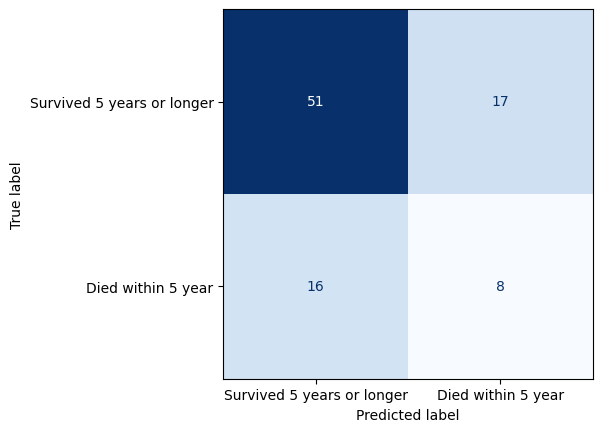

Accuracy %              : 64.1304%
Precision score         : 0.75
Recall score            : 0.7612
F1 score                : 0.639
Cross Validation score  : 0.6042
Training time           : 0.002 Seconds




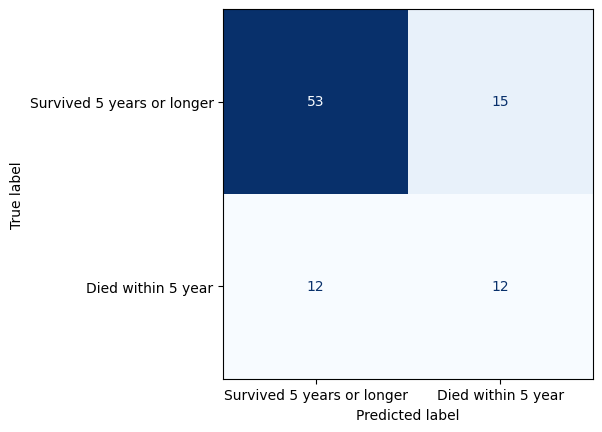

Accuracy %              : 70.6522%
Precision score         : 0.7794
Recall score            : 0.8154
F1 score                : 0.7012
Cross Validation score  : 0.7387
Training time           : 0.0035 Seconds




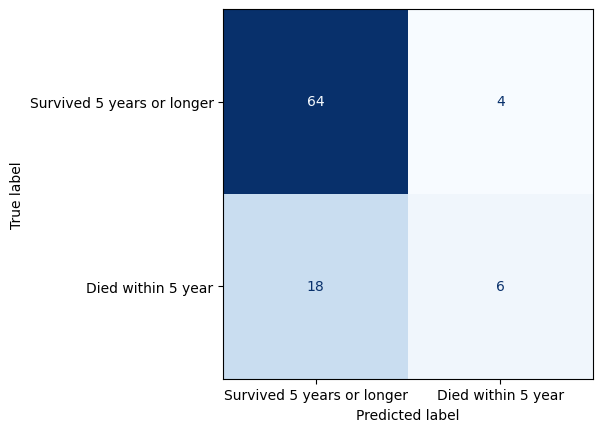

Accuracy %              : 76.087%
Precision score         : 0.9412
Recall score            : 0.7805
F1 score                : 0.7989
Cross Validation score  : 0.6796
Training time           : 0.1067 Seconds




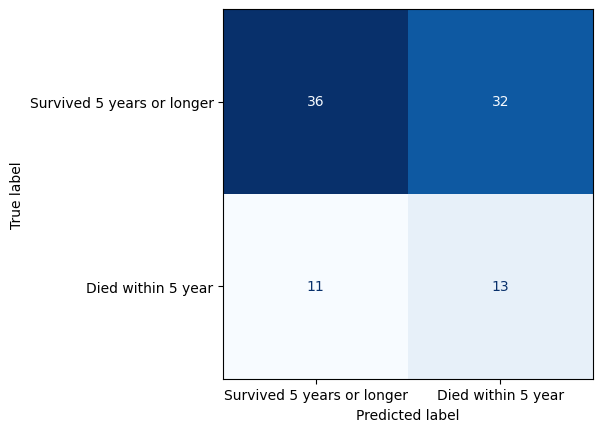

Accuracy %              : 53.2609%
Precision score         : 0.5294
Recall score            : 0.766
F1 score                : 0.5042
Cross Validation score  : 0.0
Training time           : 0.0916 Seconds




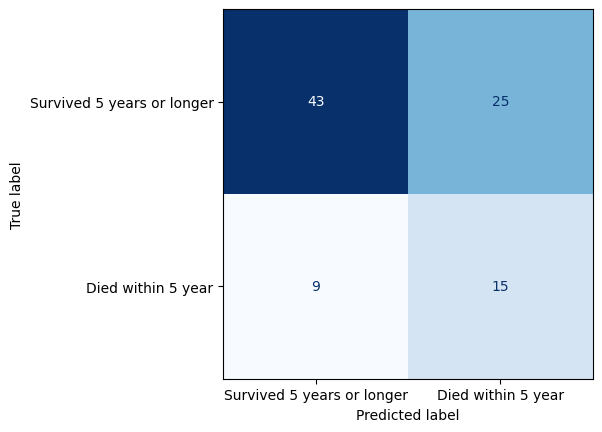

Accuracy %              : 63.0435%
Precision score         : 0.6324
Recall score            : 0.8269
F1 score                : 0.6089
Cross Validation score  : 0.0
Training time           : 0.0986 Seconds




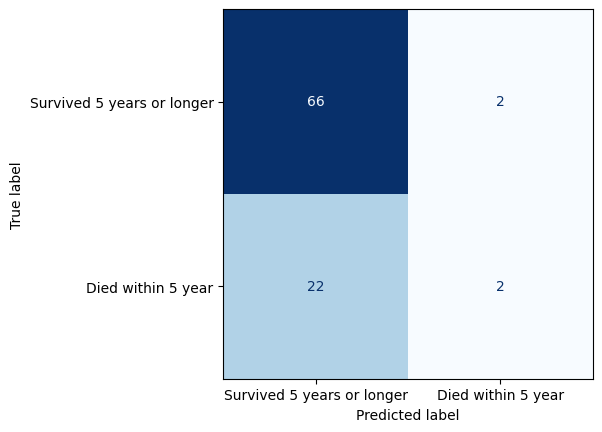

Accuracy %              : 73.913%
Precision score         : 0.9706
Recall score            : 0.75
F1 score                : 0.8156
Cross Validation score  : 0.0
Training time           : 0.008 Seconds




In [121]:
all_metrics_per_model = {}
all_metrics_per_file = {}
accuracy_rounded = 0.0
precision_rounded = 0.0
recall_rounded = 0.0
f1_rounded = 0.0
cv_scores_rounded = 0.0
training_time_rounded = 0.0

for key, value in file_details.items():
    display(HTML("<h2><b>{} dataset</b></h2>".format(key)))
    # Initialize all_metrics_per_file for the given file, if not done already
    if key not in all_metrics_per_file:
        all_metrics_per_file[key] = {}
        
    for model in models:   
    
        display(HTML("<h4><b>Results from {} for dataset {}</b></h4>".format(model, key)))
        accuracy, precision, recall, f1, cv_scores,training_time = value['instance_model_processing'].modelling(value['X'], value['y'], model, value['label_values'], value['label_context'], value['positive_class'])
        
        # Round of the metrics
        accuracy_rounded = round(accuracy * 100, 4)
        precision_rounded = round(precision, 4)
        recall_rounded = round(recall, 4)
        f1_rounded = round(f1, 4)
        cv_scores_rounded = round(np.mean(cv_scores), 4)
        training_time_rounded = round(training_time, 4)
        
        # Initialize all_metrics_per_model for the given model, if not done already
        if model not in all_metrics_per_model:
            all_metrics_per_model[model] = {
                'accuracy': [],
                'precision': [],
                'recall': [],
                'f1': [],
                'cv_scores': [],
                'training_time': []
            }
        
        # Save all metrics per model
        all_metrics_per_model[model]['accuracy'].append(accuracy_rounded)
        all_metrics_per_model[model]['precision'].append(precision_rounded)
        all_metrics_per_model[model]['recall'].append(recall_rounded)
        all_metrics_per_model[model]['f1'].append(f1_rounded)
        all_metrics_per_model[model]['cv_scores'].append(cv_scores_rounded)
        all_metrics_per_model[model]['training_time'].append(training_time_rounded)
        
        
        # Initialize model entry in all_metrics_per_file for the given file, if not done already
        if model not in all_metrics_per_file[key]:
            all_metrics_per_file[key][model] = {
                    'accuracy': 0.0,
                    'precision': 0.0,
                    'recall': 0.0,
                    'f1': 0.0,
                    'cv_scores': 0.0,
                    'training_time': 0.0
                }
        
        # Save all metrics per file
        all_metrics_per_file[key][model]['accuracy'] = accuracy_rounded
        all_metrics_per_file[key][model]['precision'] = precision_rounded
        all_metrics_per_file[key][model]['recall'] = recall_rounded
        all_metrics_per_file[key][model]['f1'] = f1_rounded
        all_metrics_per_file[key][model]['cv_scores'] = cv_scores_rounded
        all_metrics_per_file[key][model]['training_time'] = training_time_rounded
        
        # Print results    
        print(f'Accuracy %              : {accuracy_rounded}%')
        print(f'Precision score         : {precision_rounded}')
        print(f'Recall score            : {recall_rounded}')
        print(f'F1 score                : {f1_rounded}')        
        print(f'Cross Validation score  : {cv_scores_rounded}')
        print(f'Training time           : {training_time_rounded} Seconds')
        print('\n')

#### Calculate the mean of metrics per model and per file. This is to do comparative study of best performing models.

In [134]:
# Flatten all_metrics_per_file
data = []
for file, models in all_metrics_per_file.items():
    for model, metrics in models.items():
        row = {'file': file, 'model': model}
        row.update(metrics)
        data.append(row)

# Create DataFrame
df = pd.DataFrame(data)

# Sort DataFrames by 'accuracy' in descending order. We want to rank models per accuracy
df.columns = ['File name', 'Model' ,'Accuracy %', 'Precision score','Recall score','F1 score','Cross Validation score','Training time (seconds)']
df_mean_metrics_per_file = df.sort_values(by=["File name", "Accuracy %"], ascending=[True, False])


# Save DataFrames to CSV files
df_mean_metrics_per_file.columns = ['File name', 'Model' ,'Accuracy %', 'Precision score','Recall score','F1 score','Cross Validation score','Training time (seconds)']
df_mean_metrics_per_file.to_csv("all_metrics_per_file.csv", index=False, sep=";")
 

In [123]:
# Calculate the mean of metrics for each model
mean_metrics_per_model = {}

mean_metrics_per_model = {
    model: {
        metric: round(np.mean(values),4) if values else None
        for metric, values in metrics.items()
    }
    for model, metrics in all_metrics_per_model.items()
}

# Convert dictionaries to DataFrames
df_mean_metrics_per_model = pd.DataFrame.from_dict(mean_metrics_per_model, orient="index")

# Sort DataFrames by 'accuracy' in descending order. We want to rank models per accuracy
df_mean_metrics_per_model = df_mean_metrics_per_model.sort_values(by="accuracy", ascending=False)
print(df_mean_metrics_per_model)

# Save DataFrames to CSV files
df_mean_metrics_per_model.columns = ['Accuracy %', 'Precision score','Recall score','F1 score','Cross Validation score','Training time (seconds)']
df_mean_metrics_per_model.to_csv("mean_metrics_per_model.csv", index=True, sep=";")


                                                    accuracy  precision  \
(DecisionTreeClassifier(max_features='sqrt', ra...   85.3224     0.7769   
SVC(class_weight='balanced')                         82.9726     0.8180   
KNeighborsClassifier(n_neighbors=3)                  82.0729     0.7451   
Perceptron(max_iter=100, tol=True)                   80.2413     0.7706   
DecisionTreeClassifier(random_state=12345)           78.4681     0.7257   
KMeans(n_clusters=2, n_init=10, random_state=12...   71.4570     0.6760   
Birch(n_clusters=2)                                  71.4552     0.5965   
GaussianMixture(n_components=2)                      70.8621     0.6093   

                                                    recall      f1  cv_scores  \
(DecisionTreeClassifier(max_features='sqrt', ra...  0.8312  0.8666     0.8330   
SVC(class_weight='balanced')                        0.8036  0.8257     0.7160   
KNeighborsClassifier(n_neighbors=3)                 0.7988  0.8296     0.7721   


# With Grid search

In [130]:
# All models with the grid parameters
models_with_grid_parameters = {
    'model1': {
        'model': Perceptron(max_iter=100, tol=True, shuffle = True),
        'param_grid': {
            'penalty': [None, 'l2', 'l1', 'elasticnet'],  # Regularization types. None is No regularization
            'alpha': [0.0001, 0.001, 0.01],               # Regularization strength
            'eta0': [0.01, 0.1, 1.0],                     # Initial learning rate
            'max_iter': [100, 500],                       # Number of iterations
            'tol': [1e-3, 1e-4]                           # Stopping tolerance
        }
    },
        'model2': {
        'model': KNeighborsClassifier(n_neighbors=3),
        'param_grid': {
            'n_neighbors': [3, 5, 7, 9],          # Number of neighbors
            'weights': ['uniform', 'distance'],   # Weight function used in prediction
            'metric': ['euclidean', 'manhattan']  # Distance metric
        }
    },
        'model3': {
        'model': DecisionTreeClassifier(random_state = RANDOM_SEED),
        'param_grid': {
            'criterion': ['gini', 'entropy'],             # Splitting criterion
            'max_depth': [None, 5, 10, 20],               # Maximum depth of the tree
            'min_samples_split': [2, 5, 10],              # Minimum samples required to split a node
            'min_samples_leaf': [1, 2, 5],                # Minimum samples required in a leaf node
            'max_features': [None, 'sqrt', 'log2']        # Number of features to consider at each split
        }
    },
        'model4': {
        'model': SVC(),
        'param_grid': {
            'C': [1, 10],             # Regularization parameter: smaller C -> more misclassifications but maybe bettere generalization
            'kernel': ['rbf'],   # Kernel type: linear dot product of feature vs similarity between sample in higher-dim space
            'gamma': ['scale'],    # Kernel coefficient for 'rbf' kernel: (influence of one training sample) 1/n_features/X_var vs 1/n_features
            #'kernel': ['linear', 'rbf'],   # Kernel type: linear dot product of feature vs similarity between sample in higher-dim space
            #'gamma': ['scale', 'auto'],    # Kernel coefficient for 'rbf' kernel: (influence of one training sample) 1/n_features/X_var vs 1/n_features
        }
    },
    'model5': {
        'model': RandomForestClassifier(random_state=RANDOM_SEED),
        'param_grid': {
            'n_estimators': [50, 100],  # Number of trees in the forest
            'max_depth': [None, 10, 20],  # Maximum depth of the trees
            'min_samples_split': [5, 10],  # Minimum samples required to split a node
            'min_samples_leaf': [1, 2, 4]  # Minimum samples required at each leaf node
        }
    },
    'model6': {
        'model': KMeans(n_clusters=2, n_init = 10, random_state=RANDOM_SEED),
        'param_grid': {
            'n_clusters': [2],                  # Force binary clustering
            'init': ['k-means++', 'random'],    # Initialization methods
            'n_init': [10, 20],                 # Number of initializations for stability
            'max_iter': [300],                  # Maximum number of iterations
            'tol': [1e-4, 1e-3]                 # Convergence tolerance
        }
    },
    'model7': {
        'model': GaussianMixture(n_components=2),
        'param_grid': {
            'n_components': [2],               # Force binary clustering
            'covariance_type': ['full', 'diag'],  # Shape of the cluster covariance
            'init_params': ['kmeans'],         # Initialization method
            'n_init': [1, 10],                 # Number of initializations for stability
            'max_iter': [300]                  # Maximum iterations for convergence
        }
    },
    'model8': {
        'model': Birch(n_clusters=2),
        'param_grid': {
            'n_clusters': [2],
            'threshold': [0.3, 0.5, 0.7, 1.0],      # Controls granularity of subclusters            
        }
    }
}

In [128]:
# All models with the grid parameters

models_with_grid_parameters = {    
    'model8': {
        'model': Birch(n_clusters=2),
        'param_grid': {
            'n_clusters': [2],
            'threshold': [0.3, 0.5, 0.7, 1.0],      # Controls granularity of subclusters            
        }
    }
}

#### Run the intial model. Do grid search and run the best model found. Print the results from initial model and the best model.
##### Note: Grid search is only run when the accuracy is less than 95%

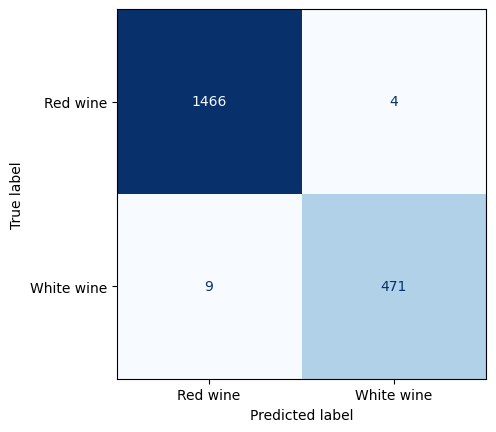

Accuracy %              : 99.3333%
Precision score         : 0.9812
Recall score            : 0.9916
F1 score                : 0.9933
Cross Validation score  : 0.9226
Training time           : 0.003 Seconds




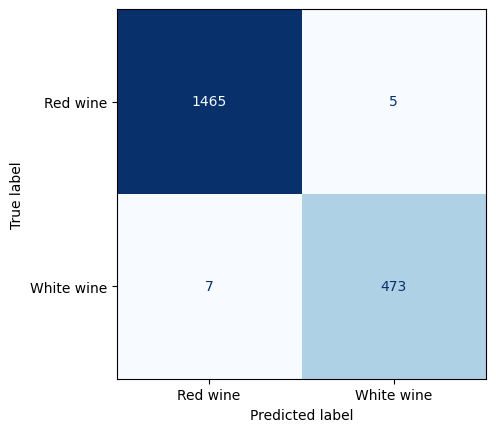

Accuracy %              : 99.3846%
Precision score         : 0.9854
Recall score            : 0.9895
F1 score                : 0.9939
Cross Validation score  : 0.9292
Training time           : 0.0129 Seconds




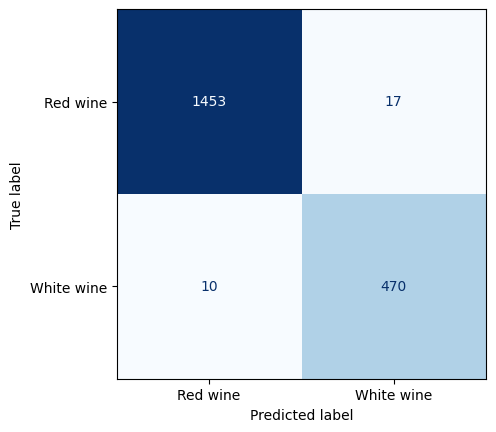

Accuracy %              : 98.6154%
Precision score         : 0.9792
Recall score            : 0.9651
F1 score                : 0.9861
Cross Validation score  : 0.9815
Training time           : 0.0286 Seconds




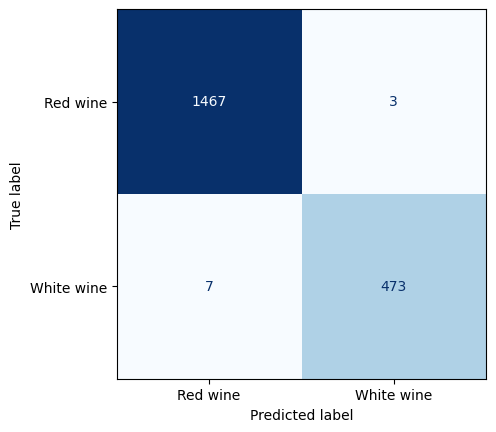

Accuracy %              : 99.4872%
Precision score         : 0.9854
Recall score            : 0.9937
F1 score                : 0.9949
Cross Validation score  : 0.9358
Training time           : 0.0567 Seconds




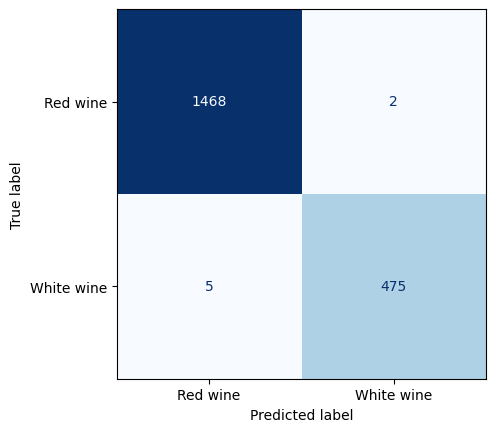

Accuracy %              : 99.641%
Precision score         : 0.9896
Recall score            : 0.9958
F1 score                : 0.9964
Cross Validation score  : 0.9942
Training time           : 0.5921 Seconds




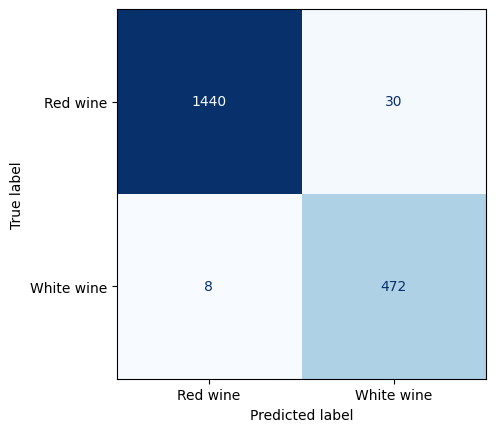

Accuracy %              : 98.0513%
Precision score         : 0.9833
Recall score            : 0.9402
F1 score                : 0.9804
Cross Validation score  : 0.0
Training time           : 0.0826 Seconds




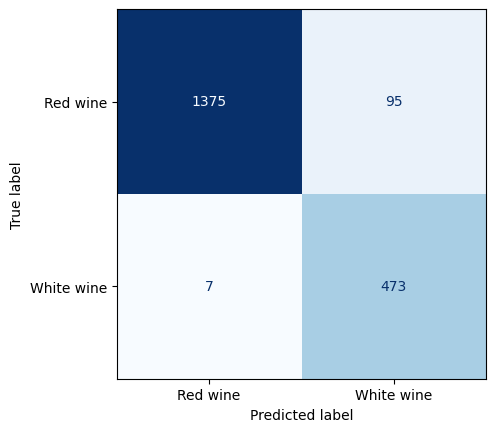

Accuracy %              : 94.7692%
Precision score         : 0.9854
Recall score            : 0.8327
F1 score                : 0.9463
Cross Validation score  : 0.0
Training time           : 0.1194 Seconds




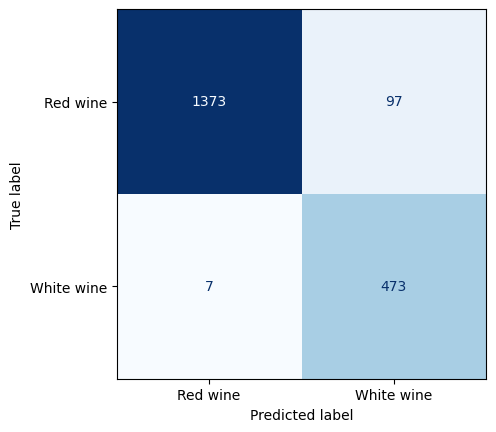

Accuracy %              : 94.6667%
Precision score         : 0.9854
Recall score            : 0.8298
F1 score                : 0.9452
Cross Validation score  : 0.0
Training time           : 0.0311 Seconds




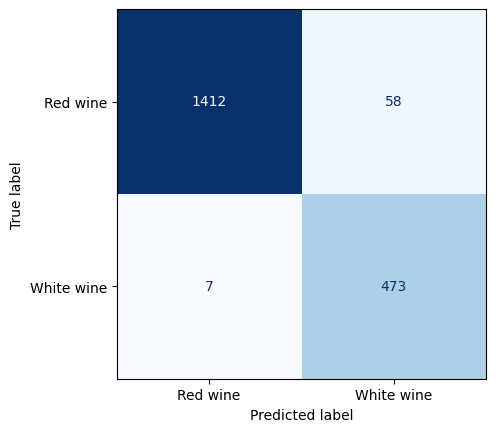

Accuracy %              : 96.6667%
Precision score         : 0.9854
Recall score            : 0.8908
F1 score                : 0.9661
Cross Validation score  : 0.0
Training time           : 0.5138 Seconds




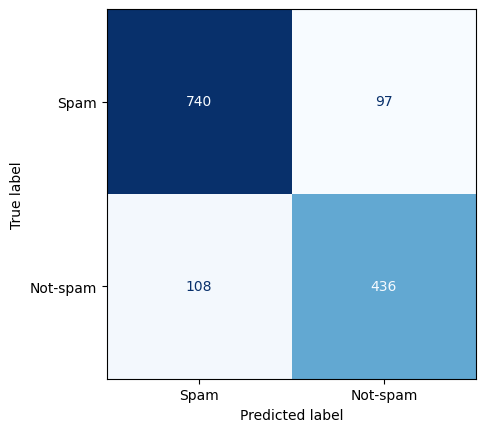

Accuracy %              : 85.1557%
Precision score         : 0.8015
Recall score            : 0.818
F1 score                : 0.8518
Cross Validation score  : 0.7205
Training time           : 0.003 Seconds




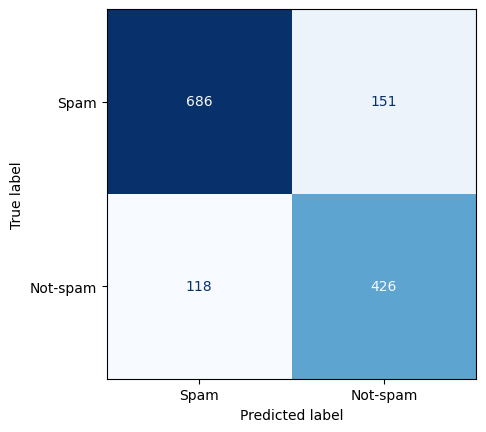

Accuracy %              : 80.5214%
Precision score         : 0.7831
Recall score            : 0.7383
F1 score                : 0.8043
Cross Validation score  : 0.6703
Training time           : 0.007 Seconds




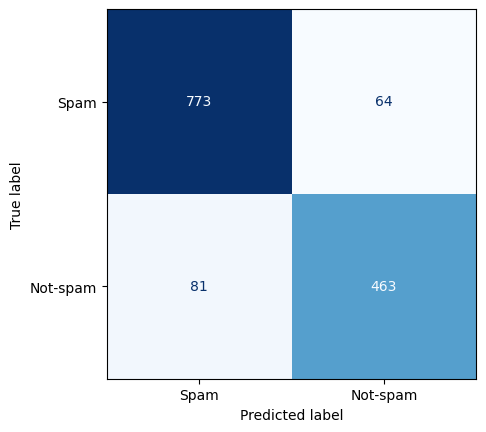

Accuracy %              : 89.5004%
Precision score         : 0.8511
Recall score            : 0.8786
F1 score                : 0.8953
Cross Validation score  : 0.7764
Training time           : 0.0 Seconds




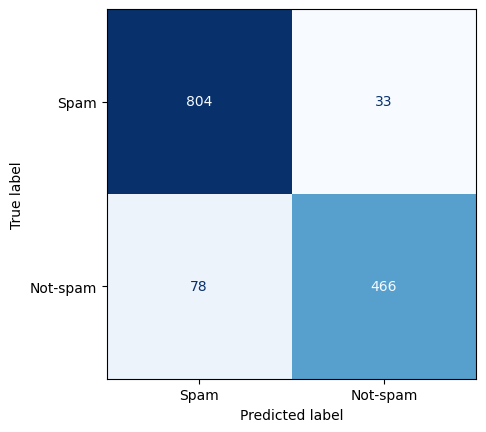

Accuracy %              : 91.9623%
Precision score         : 0.8566
Recall score            : 0.9339
F1 score                : 0.9203
Cross Validation score  : 0.8127
Training time           : 0.001 Seconds




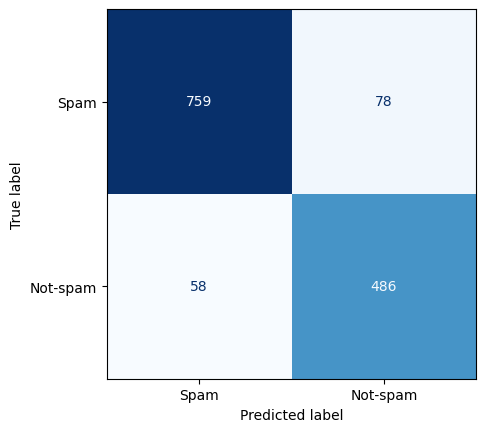

Accuracy %              : 90.1521%
Precision score         : 0.8934
Recall score            : 0.8617
F1 score                : 0.9012
Cross Validation score  : 0.8787
Training time           : 0.0732 Seconds




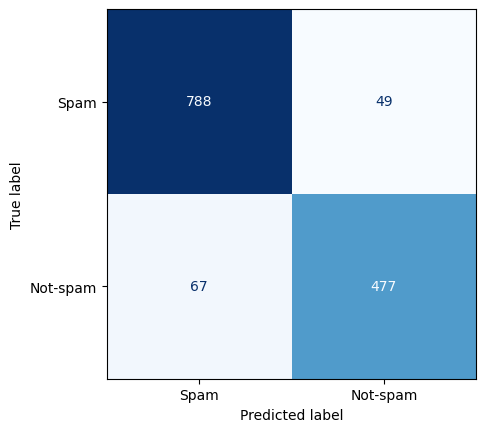

Accuracy %              : 91.6003%
Precision score         : 0.8768
Recall score            : 0.9068
F1 score                : 0.9163
Cross Validation score  : 0.9028
Training time           : 0.0472 Seconds




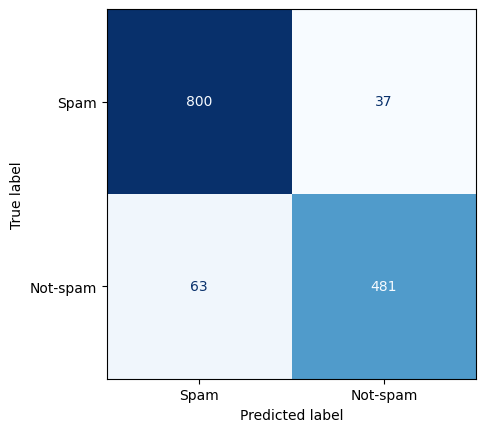

Accuracy %              : 92.7589%
Precision score         : 0.8842
Recall score            : 0.9286
F1 score                : 0.9279
Cross Validation score  : 0.7051
Training time           : 0.2067 Seconds




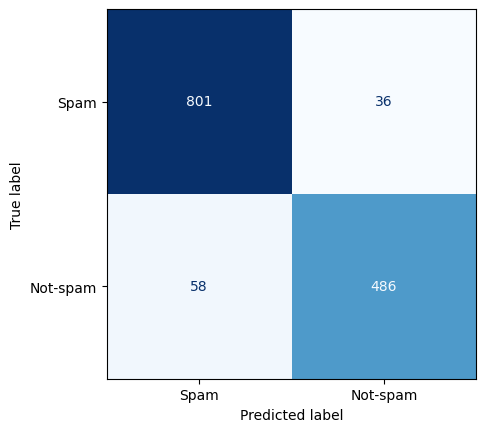

Accuracy %              : 93.1933%
Precision score         : 0.8934
Recall score            : 0.931
F1 score                : 0.9322
Cross Validation score  : 0.7322
Training time           : 0.2084 Seconds




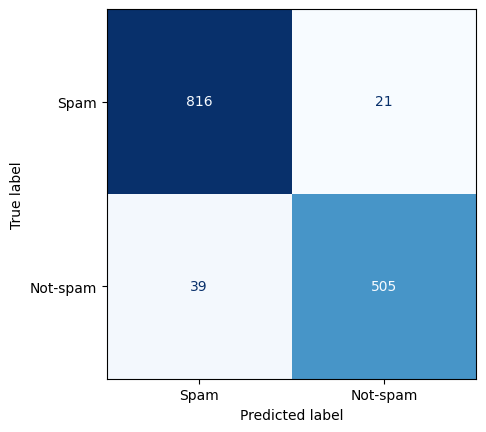

Accuracy %              : 95.6553%
Precision score         : 0.9283
Recall score            : 0.9601
F1 score                : 0.9567
Cross Validation score  : 0.9294
Training time           : 0.6629 Seconds




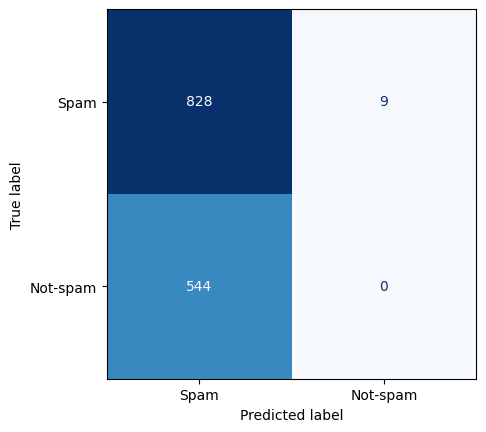

Accuracy %              : 59.9566%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7448
Cross Validation score  : 0.0
Training time           : 0.1848 Seconds




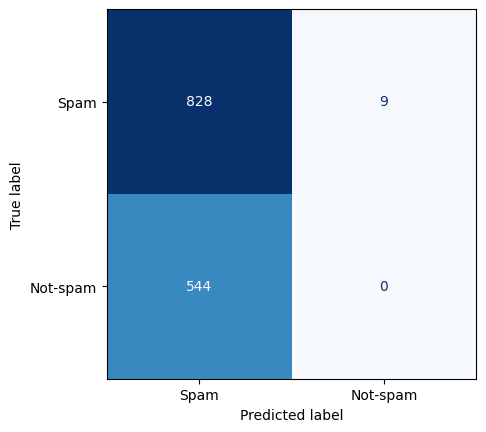

Accuracy %              : 59.9566%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7448
Cross Validation score  : 0.0
Training time           : 0.1778 Seconds




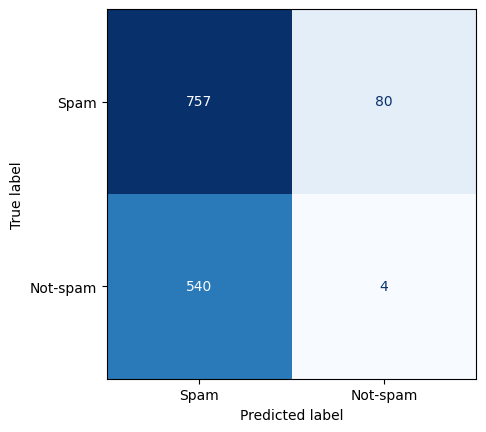

Accuracy %              : 55.105%
Precision score         : 0.0074
Recall score            : 0.0476
F1 score                : 0.6671
Cross Validation score  : 0.0
Training time           : 0.1098 Seconds




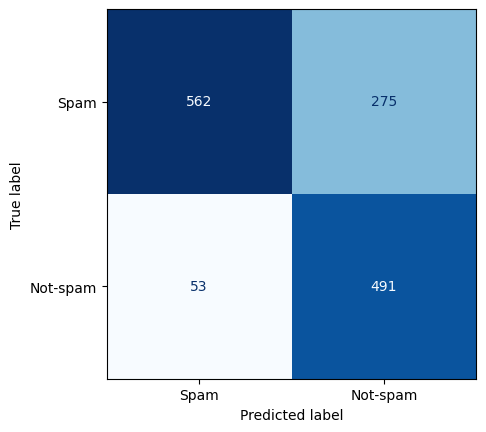

Accuracy %              : 76.2491%
Precision score         : 0.9026
Recall score            : 0.641
F1 score                : 0.7605
Cross Validation score  : 0.0
Training time           : 0.1345 Seconds




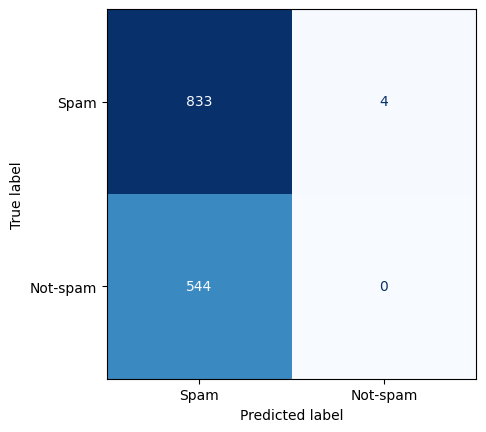

Accuracy %              : 60.3186%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7503
Cross Validation score  : 0.0
Training time           : 0.6047 Seconds




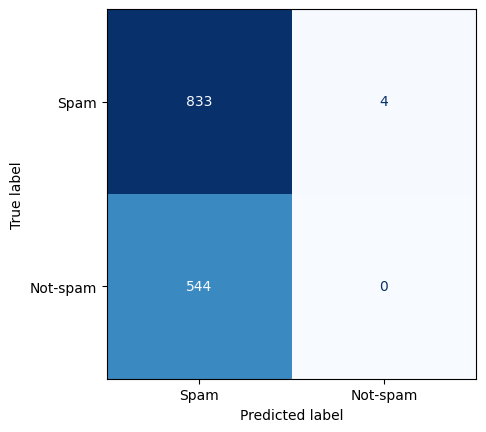

Accuracy %              : 60.3186%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7503
Cross Validation score  : 0.0
Training time           : 0.5995 Seconds




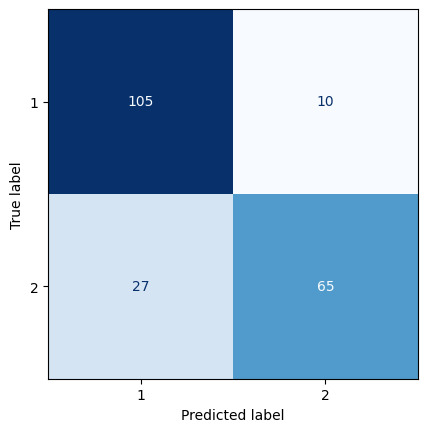

Accuracy %              : 82.1256%
Precision score         : 0.7065
Recall score            : 0.8667
F1 score                : 0.8242
Cross Validation score  : 0.6435
Training time           : 0.001 Seconds




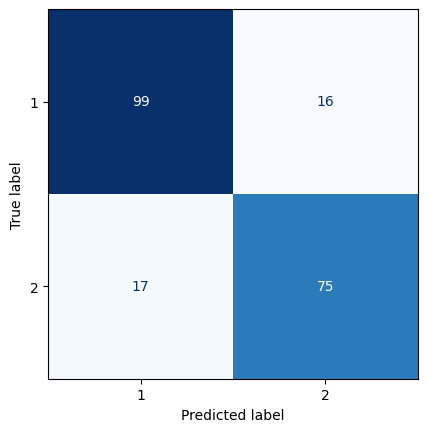

Accuracy %              : 84.058%
Precision score         : 0.8152
Recall score            : 0.8242
F1 score                : 0.8407
Cross Validation score  : 0.6652
Training time           : 0.0021 Seconds




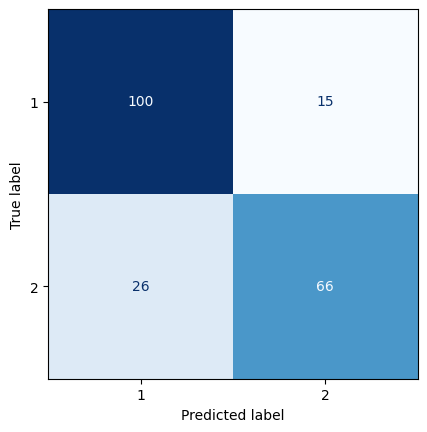

Accuracy %              : 80.1932%
Precision score         : 0.7174
Recall score            : 0.8148
F1 score                : 0.8037
Cross Validation score  : 0.6638
Training time           : 0.0009 Seconds




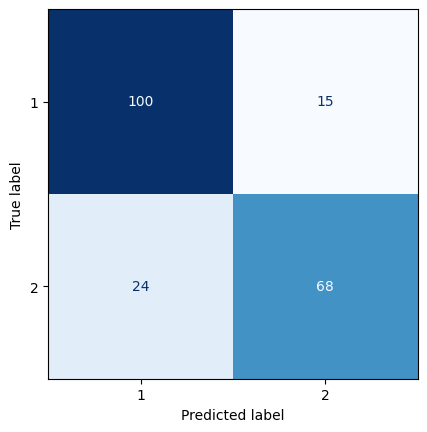

Accuracy %              : 81.1594%
Precision score         : 0.7391
Recall score            : 0.8193
F1 score                : 0.8129
Cross Validation score  : 0.6899
Training time           : 0.0011 Seconds




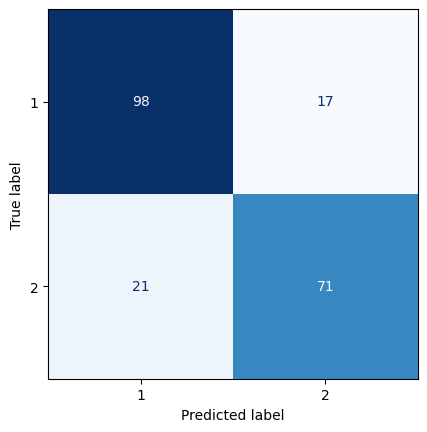

Accuracy %              : 81.6425%
Precision score         : 0.7717
Recall score            : 0.8068
F1 score                : 0.8169
Cross Validation score  : 0.8087
Training time           : 0.003 Seconds




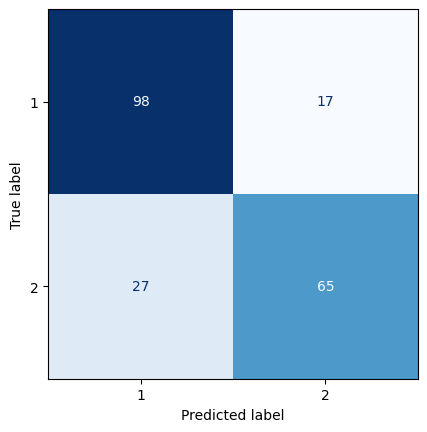

Accuracy %              : 78.744%
Precision score         : 0.7065
Recall score            : 0.7927
F1 score                : 0.7891
Cross Validation score  : 0.8435
Training time           : 0.0031 Seconds




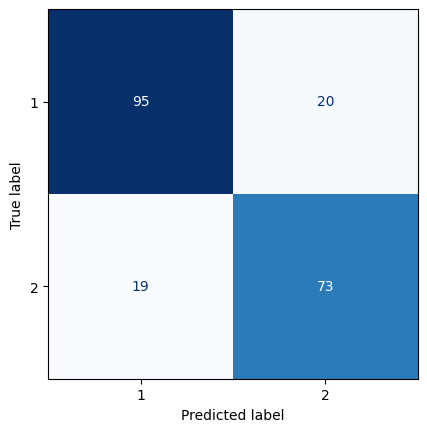

Accuracy %              : 81.1594%
Precision score         : 0.7935
Recall score            : 0.7849
F1 score                : 0.8115
Cross Validation score  : 0.658
Training time           : 0.006 Seconds




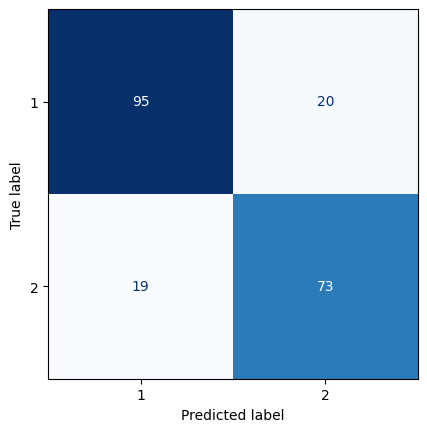

Accuracy %              : 81.1594%
Precision score         : 0.7935
Recall score            : 0.7849
F1 score                : 0.8115
Cross Validation score  : 0.658
Training time           : 0.005 Seconds




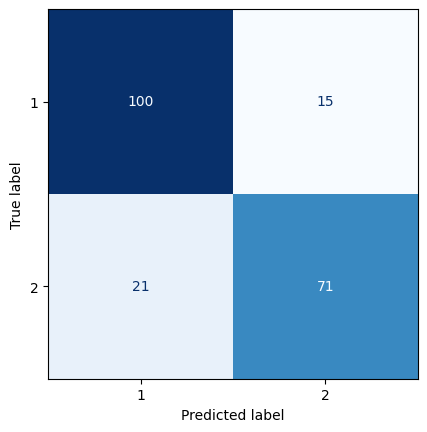

Accuracy %              : 82.6087%
Precision score         : 0.7717
Recall score            : 0.8256
F1 score                : 0.8268
Cross Validation score  : 0.8609
Training time           : 0.1748 Seconds




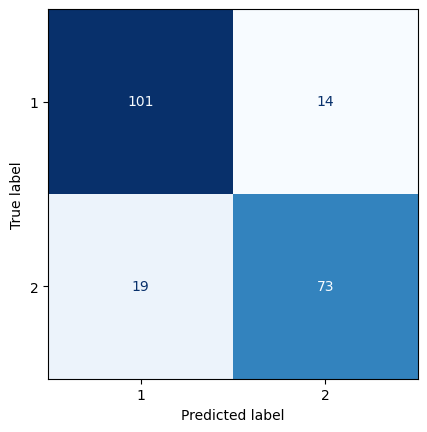

Accuracy %              : 84.058%
Precision score         : 0.7935
Recall score            : 0.8391
F1 score                : 0.8411
Cross Validation score  : 0.8594
Training time           : 0.1612 Seconds




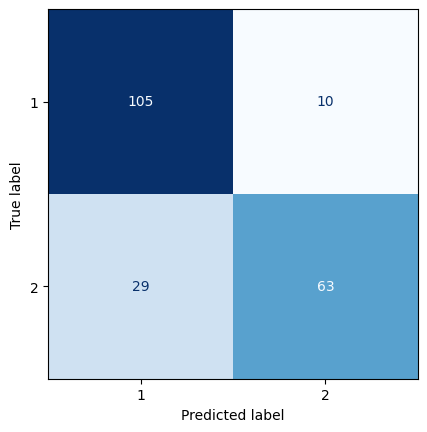

Accuracy %              : 81.1594%
Precision score         : 0.6848
Recall score            : 0.863
F1 score                : 0.8153
Cross Validation score  : 0.0
Training time           : 0.1216 Seconds




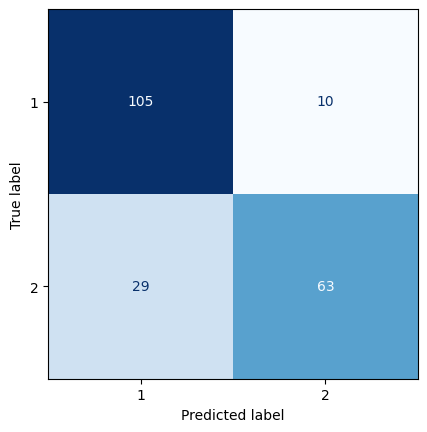

Accuracy %              : 81.1594%
Precision score         : 0.6848
Recall score            : 0.863
F1 score                : 0.8153
Cross Validation score  : 0.0
Training time           : 0.0996 Seconds




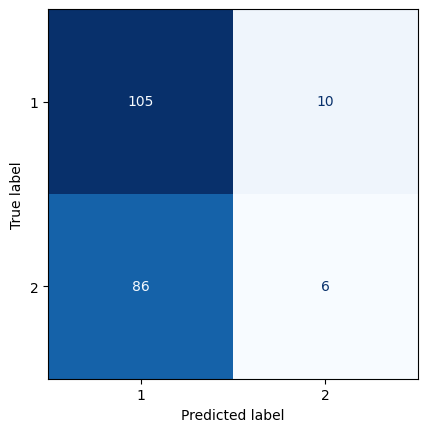

Accuracy %              : 53.6232%
Precision score         : 0.0652
Recall score            : 0.375
F1 score                : 0.6418
Cross Validation score  : 0.0
Training time           : 0.023 Seconds




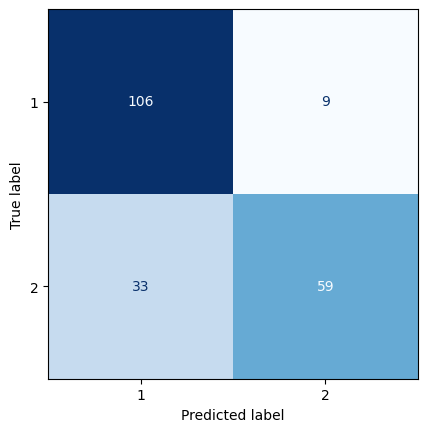

Accuracy %              : 79.7101%
Precision score         : 0.6413
Recall score            : 0.8676
F1 score                : 0.8027
Cross Validation score  : 0.0
Training time           : 0.1503 Seconds




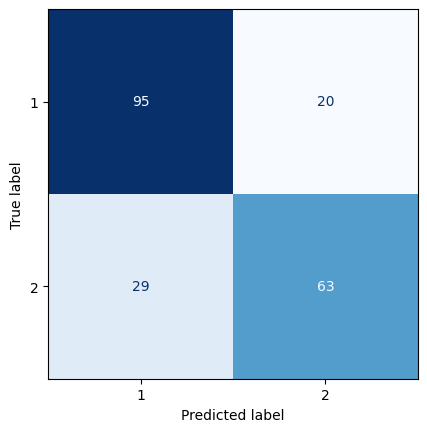

Accuracy %              : 76.3285%
Precision score         : 0.6848
Recall score            : 0.759
F1 score                : 0.7649
Cross Validation score  : 0.0
Training time           : 0.0545 Seconds




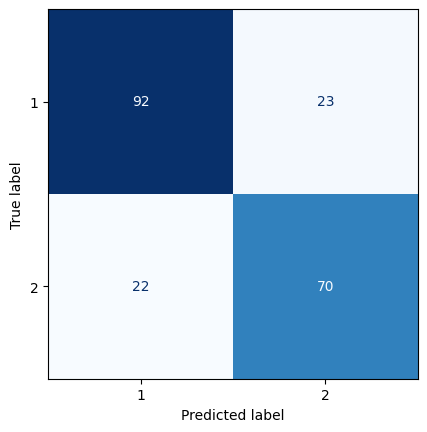

Accuracy %              : 78.2609%
Precision score         : 0.7609
Recall score            : 0.7527
F1 score                : 0.7825
Cross Validation score  : 0.0
Training time           : 0.0421 Seconds




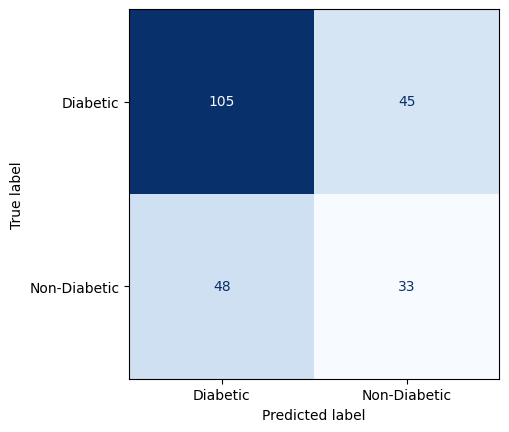

Accuracy %              : 59.7403%
Precision score         : 0.4074
Recall score            : 0.4231
F1 score                : 0.5992
Cross Validation score  : 0.4622
Training time           : 0.001 Seconds




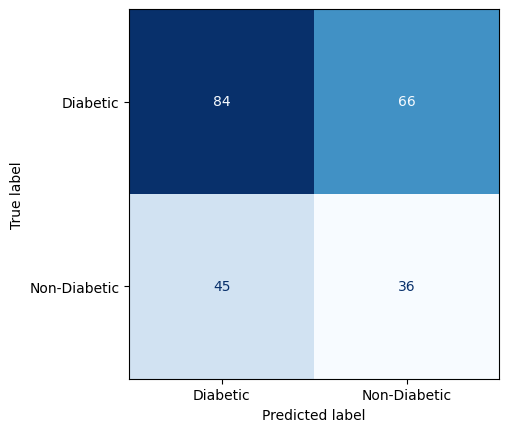

Accuracy %              : 51.9481%
Precision score         : 0.4444
Recall score            : 0.3529
F1 score                : 0.51
Cross Validation score  : 0.5416
Training time           : 0.0019 Seconds




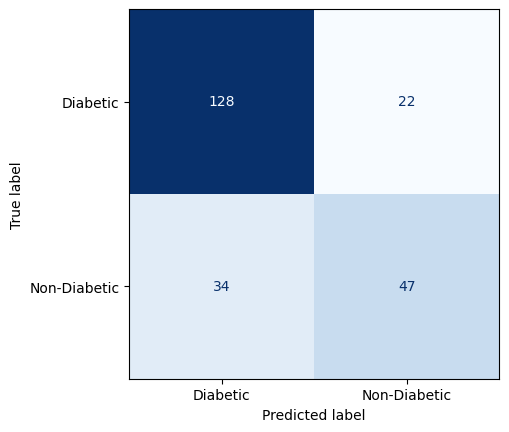

Accuracy %              : 75.7576%
Precision score         : 0.5802
Recall score            : 0.6812
F1 score                : 0.7626
Cross Validation score  : 0.7136
Training time           : 0.0011 Seconds




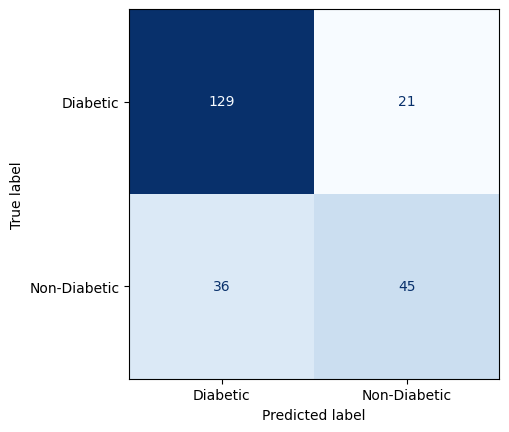

Accuracy %              : 75.3247%
Precision score         : 0.5556
Recall score            : 0.6818
F1 score                : 0.76
Cross Validation score  : 0.7409
Training time           : 0.002 Seconds




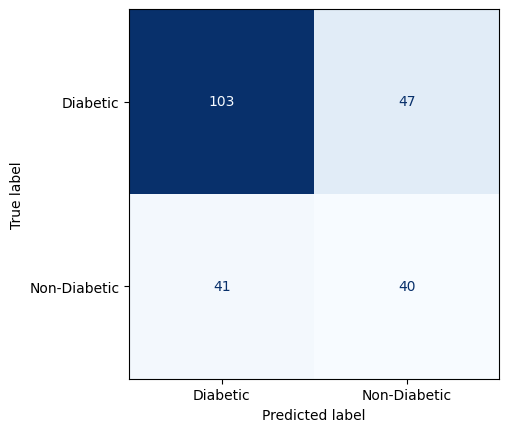

Accuracy %              : 61.9048%
Precision score         : 0.4938
Recall score            : 0.4598
F1 score                : 0.6161
Cross Validation score  : 0.7032
Training time           : 0.0036 Seconds




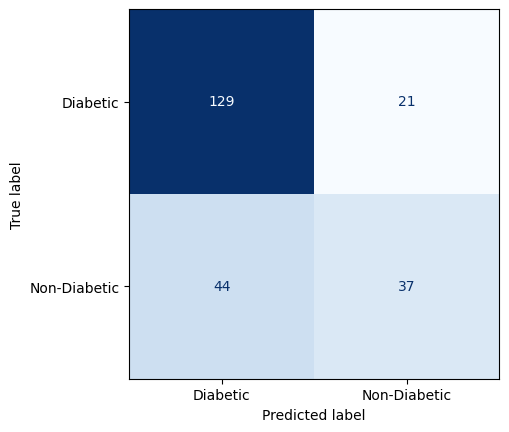

Accuracy %              : 71.8615%
Precision score         : 0.4568
Recall score            : 0.6379
F1 score                : 0.7319
Cross Validation score  : 0.7462
Training time           : 0.002 Seconds




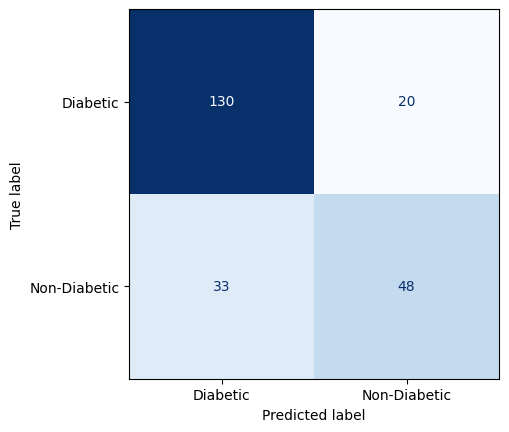

Accuracy %              : 77.0563%
Precision score         : 0.5926
Recall score            : 0.7059
F1 score                : 0.7758
Cross Validation score  : 0.7591
Training time           : 0.008 Seconds




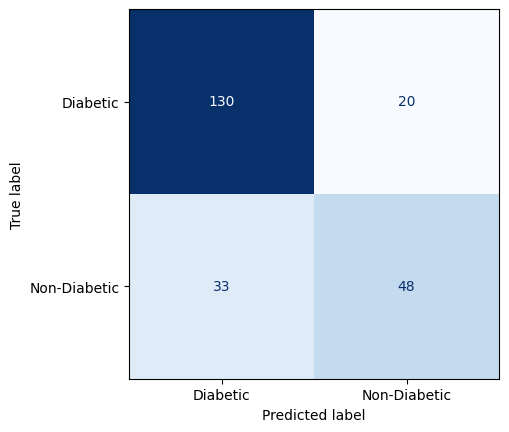

Accuracy %              : 77.0563%
Precision score         : 0.5926
Recall score            : 0.7059
F1 score                : 0.7758
Cross Validation score  : 0.7591
Training time           : 0.007 Seconds




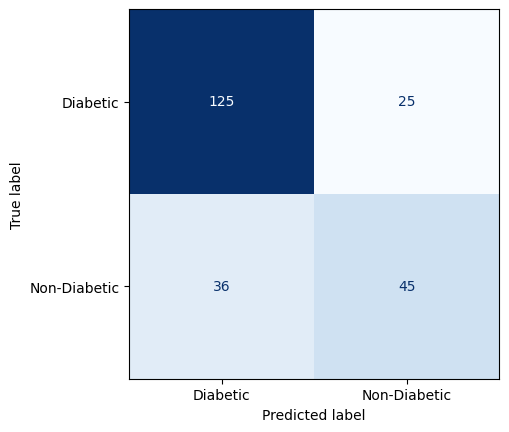

Accuracy %              : 73.5931%
Precision score         : 0.5556
Recall score            : 0.6429
F1 score                : 0.7409
Cross Validation score  : 0.767
Training time           : 0.1928 Seconds




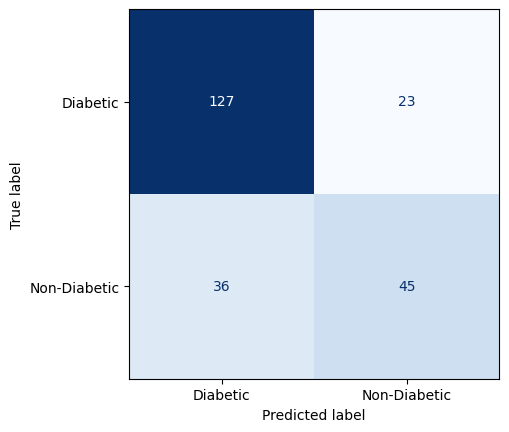

Accuracy %              : 74.4589%
Precision score         : 0.5556
Recall score            : 0.6618
F1 score                : 0.7504
Cross Validation score  : 0.7618
Training time           : 0.1613 Seconds




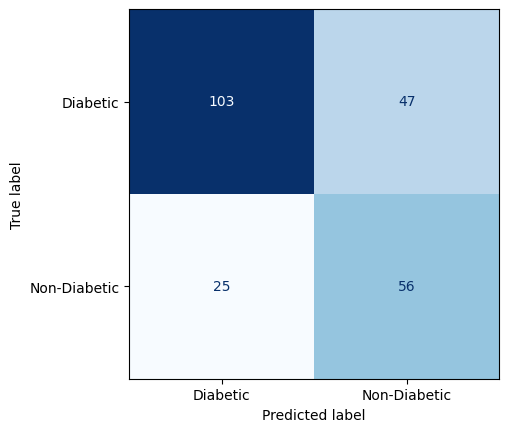

Accuracy %              : 68.8312%
Precision score         : 0.6914
Recall score            : 0.5437
F1 score                : 0.682
Cross Validation score  : 0.0
Training time           : 0.1222 Seconds




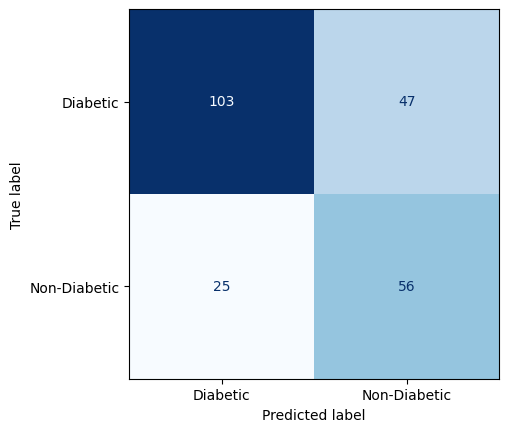

Accuracy %              : 68.8312%
Precision score         : 0.6914
Recall score            : 0.5437
F1 score                : 0.682
Cross Validation score  : 0.0
Training time           : 0.2154 Seconds




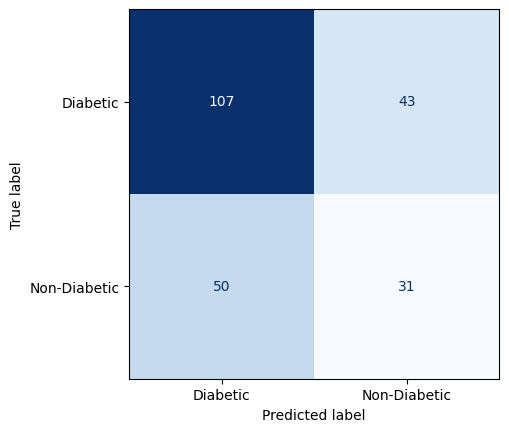

Accuracy %              : 59.7403%
Precision score         : 0.3827
Recall score            : 0.4189
F1 score                : 0.6019
Cross Validation score  : 0.0
Training time           : 0.1248 Seconds




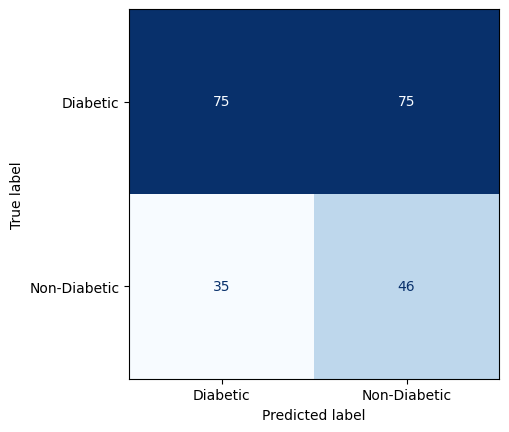

Accuracy %              : 52.381%
Precision score         : 0.5679
Recall score            : 0.3802
F1 score                : 0.5133
Cross Validation score  : 0.0
Training time           : 0.1575 Seconds




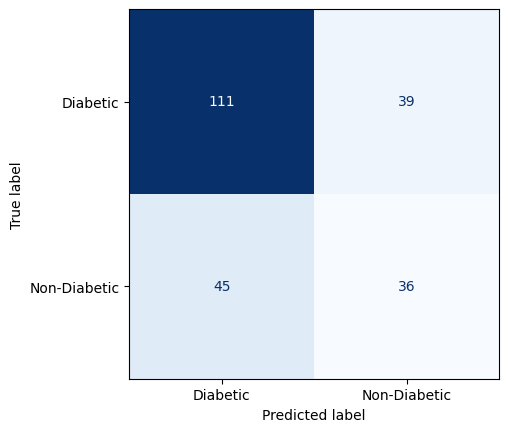

Accuracy %              : 63.6364%
Precision score         : 0.4444
Recall score            : 0.48
F1 score                : 0.6398
Cross Validation score  : 0.0
Training time           : 0.0468 Seconds




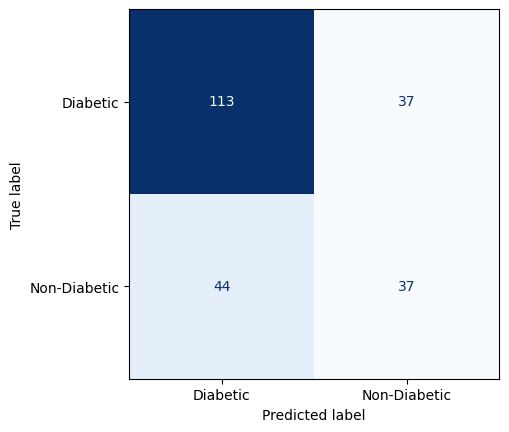

Accuracy %              : 64.9351%
Precision score         : 0.4568
Recall score            : 0.5
F1 score                : 0.6533
Cross Validation score  : 0.0
Training time           : 0.0529 Seconds




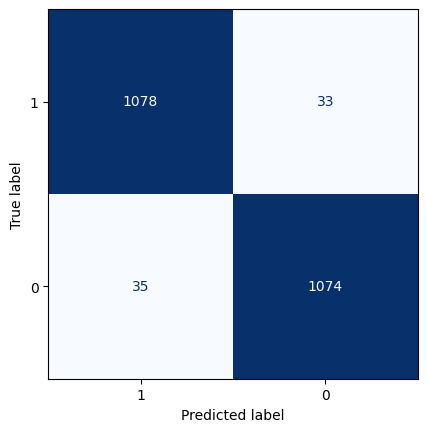

Accuracy %              : 96.9369%
Precision score         : 0.9684
Recall score            : 0.9702
F1 score                : 0.9694
Cross Validation score  : 0.9646
Training time           : 0.004 Seconds




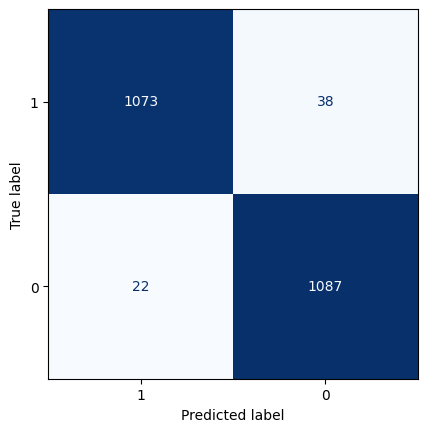

Accuracy %              : 97.2973%
Precision score         : 0.9802
Recall score            : 0.9662
F1 score                : 0.973
Cross Validation score  : 0.9649
Training time           : 0.0011 Seconds




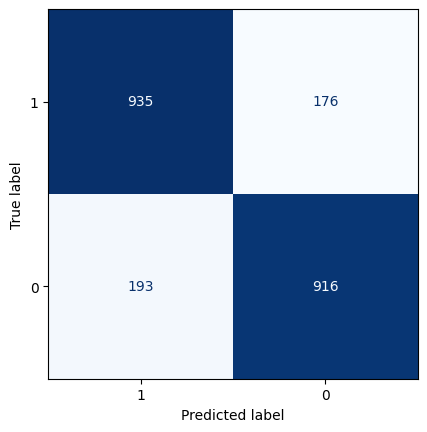

Accuracy %              : 83.3784%
Precision score         : 0.826
Recall score            : 0.8388
F1 score                : 0.8338
Cross Validation score  : 0.8424
Training time           : 0.1984 Seconds




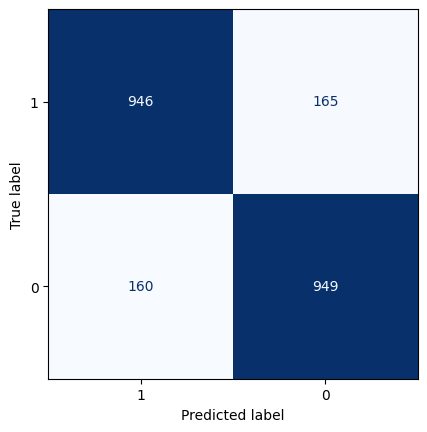

Accuracy %              : 85.3604%
Precision score         : 0.8557
Recall score            : 0.8519
F1 score                : 0.8536
Cross Validation score  : 0.852
Training time           : 0.0397 Seconds




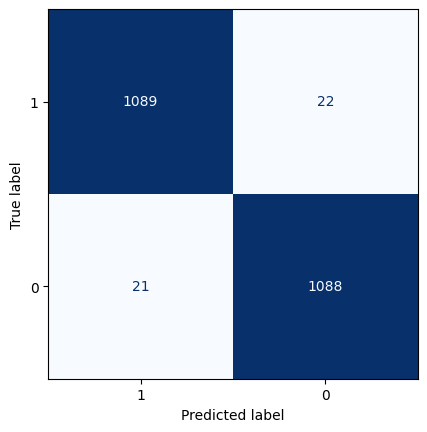

Accuracy %              : 98.0631%
Precision score         : 0.9811
Recall score            : 0.9802
F1 score                : 0.9806
Cross Validation score  : 0.9777
Training time           : 0.2014 Seconds




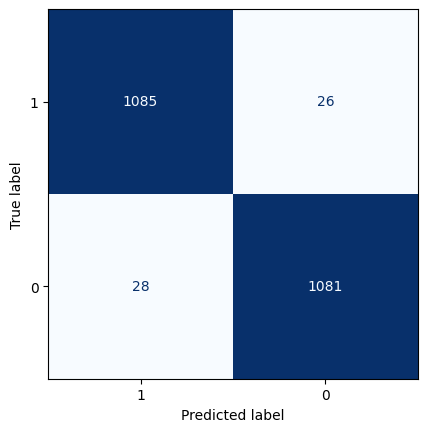

Accuracy %              : 97.5676%
Precision score         : 0.9748
Recall score            : 0.9765
F1 score                : 0.9757
Cross Validation score  : 0.9705
Training time           : 2.4313 Seconds




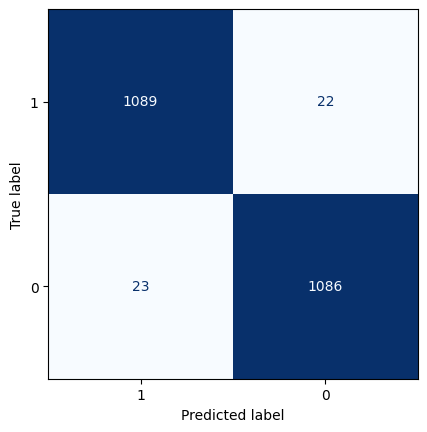

Accuracy %              : 97.973%
Precision score         : 0.9793
Recall score            : 0.9801
F1 score                : 0.9797
Cross Validation score  : 0.0
Training time           : 0.0843 Seconds




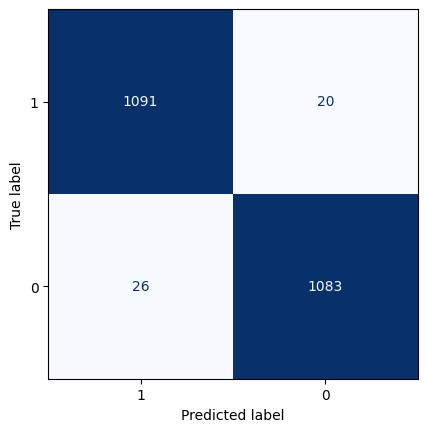

Accuracy %              : 97.9279%
Precision score         : 0.9766
Recall score            : 0.9819
F1 score                : 0.9793
Cross Validation score  : 0.0
Training time           : 0.0624 Seconds




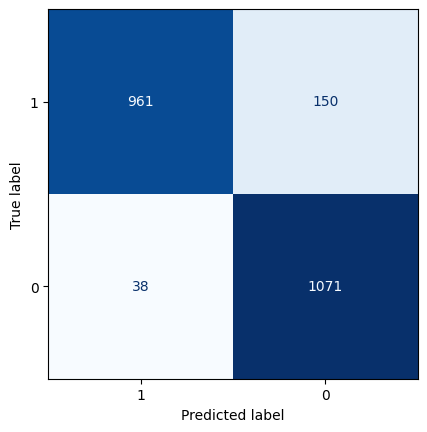

Accuracy %              : 91.5315%
Precision score         : 0.9657
Recall score            : 0.8771
F1 score                : 0.9155
Cross Validation score  : 0.0
Training time           : 1.2735 Seconds




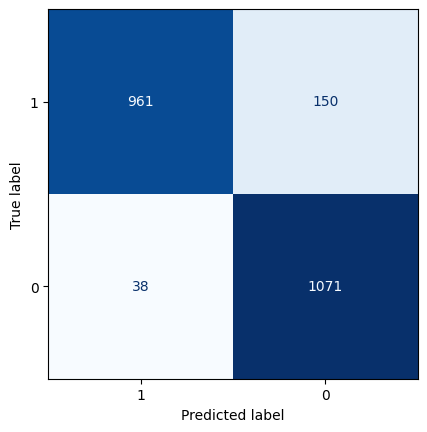

Accuracy %              : 91.5315%
Precision score         : 0.9657
Recall score            : 0.8771
F1 score                : 0.9155
Cross Validation score  : 0.0
Training time           : 1.1184 Seconds




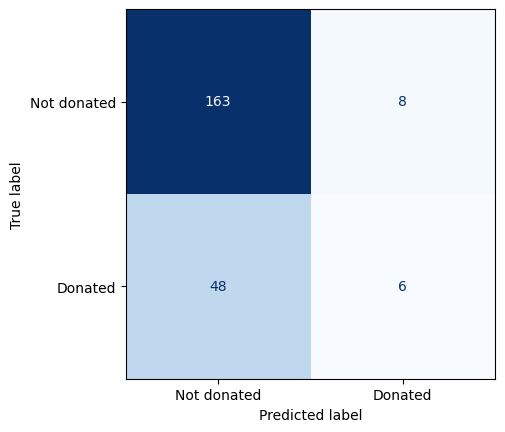

Accuracy %              : 75.1111%
Precision score         : 0.1111
Recall score            : 0.4286
F1 score                : 0.8113
Cross Validation score  : 0.658
Training time           : 0.001 Seconds




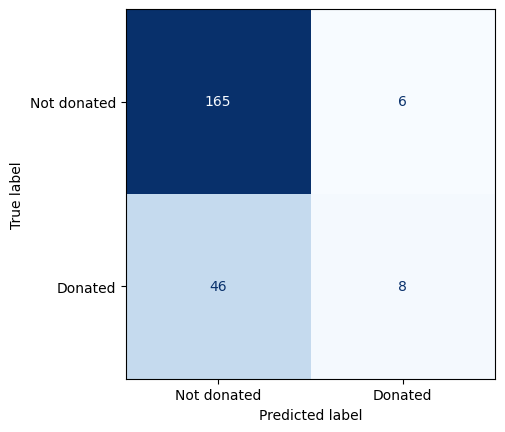

Accuracy %              : 76.8889%
Precision score         : 0.1481
Recall score            : 0.5714
F1 score                : 0.8248
Cross Validation score  : 0.658
Training time           : 0.0019 Seconds




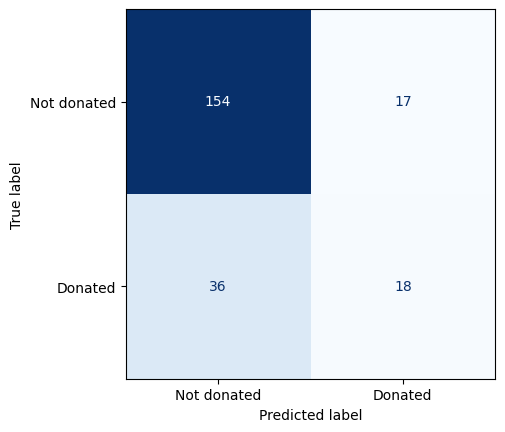

Accuracy %              : 76.4444%
Precision score         : 0.3333
Recall score            : 0.5143
F1 score                : 0.7834
Cross Validation score  : 0.6473
Training time           : 0.002 Seconds




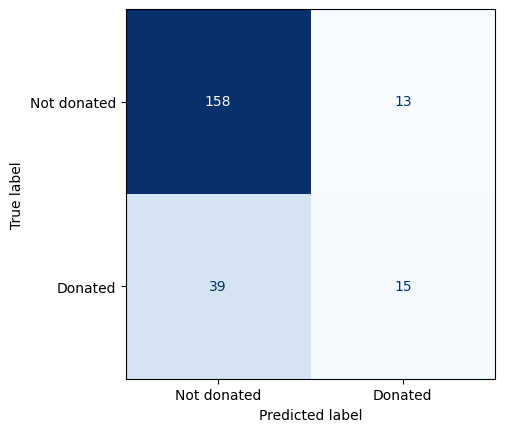

Accuracy %              : 76.8889%
Precision score         : 0.2778
Recall score            : 0.5357
F1 score                : 0.7974
Cross Validation score  : 0.6673
Training time           : 0.001 Seconds




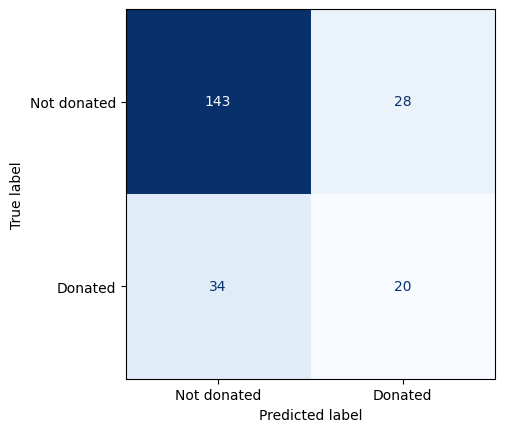

Accuracy %              : 72.4444%
Precision score         : 0.3704
Recall score            : 0.4167
F1 score                : 0.7302
Cross Validation score  : 0.6179
Training time           : 0.002 Seconds




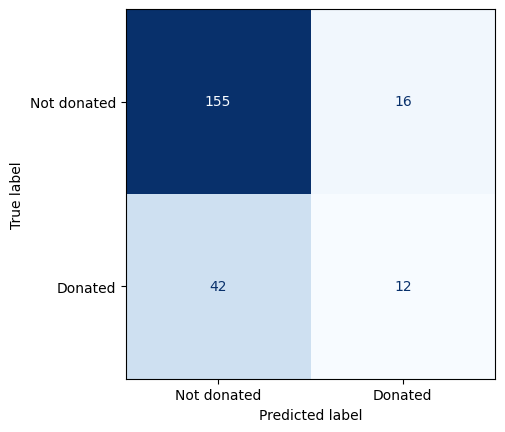

Accuracy %              : 74.2222%
Precision score         : 0.2222
Recall score            : 0.4286
F1 score                : 0.774
Cross Validation score  : 0.7127
Training time           : 0.001 Seconds




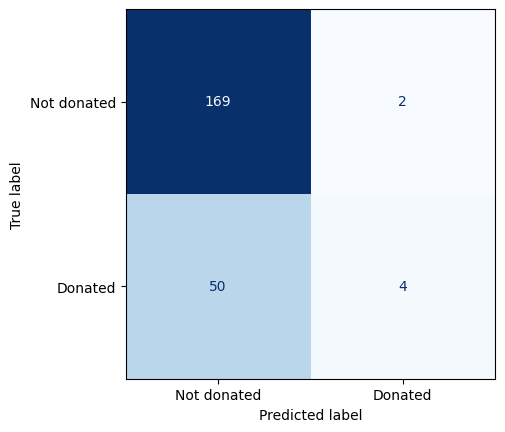

Accuracy %              : 76.8889%
Precision score         : 0.0741
Recall score            : 0.6667
F1 score                : 0.8471
Cross Validation score  : 0.758
Training time           : 0.007 Seconds




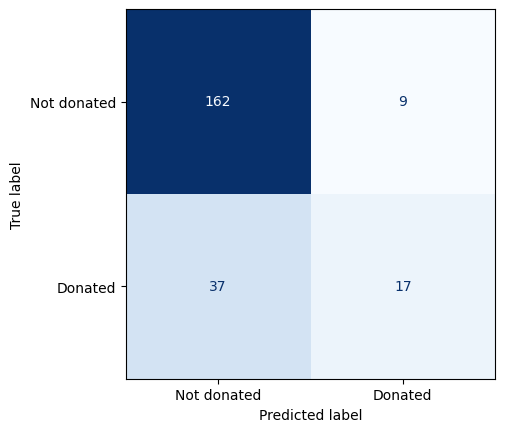

Accuracy %              : 79.5556%
Precision score         : 0.3148
Recall score            : 0.6538
F1 score                : 0.8236
Cross Validation score  : 0.7594
Training time           : 0.0096 Seconds




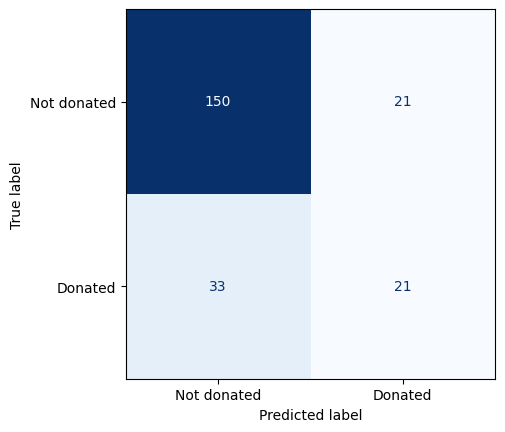

Accuracy %              : 76.0%
Precision score         : 0.3889
Recall score            : 0.5
F1 score                : 0.7709
Cross Validation score  : 0.6673
Training time           : 0.1619 Seconds




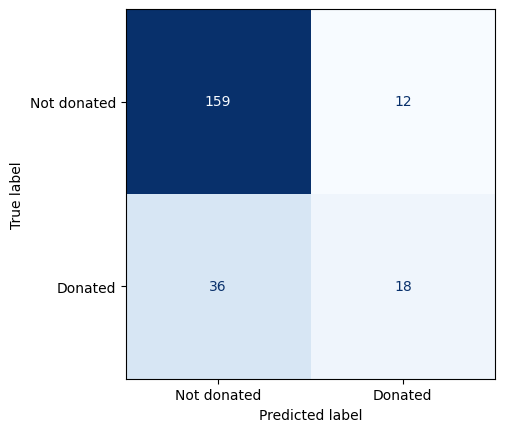

Accuracy %              : 78.6667%
Precision score         : 0.3333
Recall score            : 0.6
F1 score                : 0.8101
Cross Validation score  : 0.7274
Training time           : 0.049 Seconds




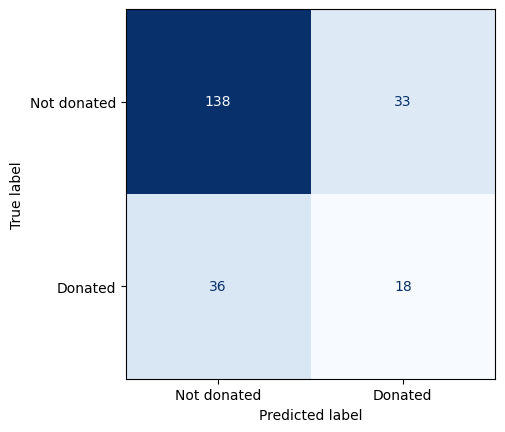

Accuracy %              : 69.3333%
Precision score         : 0.3333
Recall score            : 0.3529
F1 score                : 0.6964
Cross Validation score  : 0.0
Training time           : 0.1174 Seconds




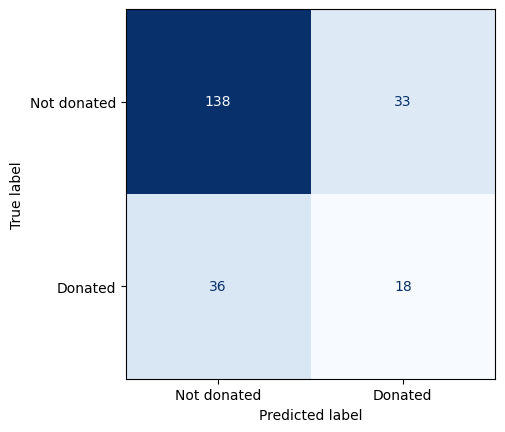

Accuracy %              : 69.3333%
Precision score         : 0.3333
Recall score            : 0.3529
F1 score                : 0.6964
Cross Validation score  : 0.0
Training time           : 0.1166 Seconds




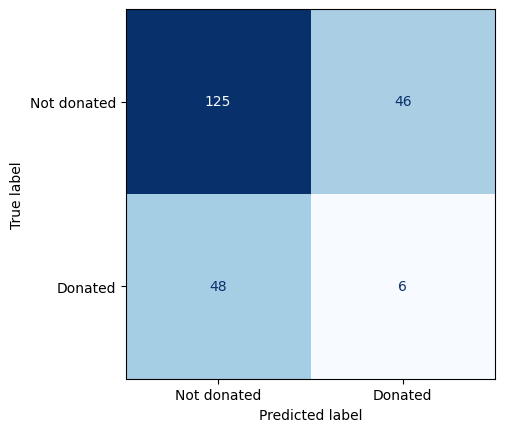

Accuracy %              : 58.2222%
Precision score         : 0.1111
Recall score            : 0.1154
F1 score                : 0.5849
Cross Validation score  : 0.0
Training time           : 0.2817 Seconds




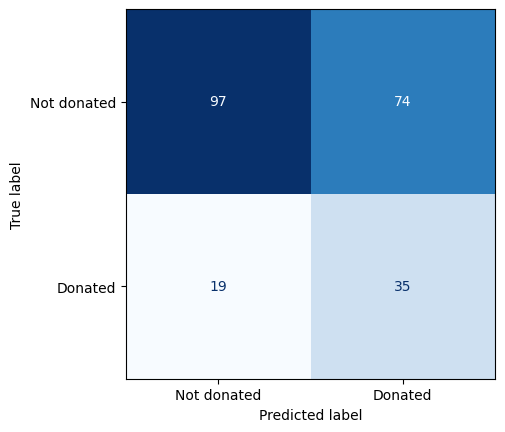

Accuracy %              : 58.6667%
Precision score         : 0.6481
Recall score            : 0.3211
F1 score                : 0.5565
Cross Validation score  : 0.0
Training time           : 0.0206 Seconds




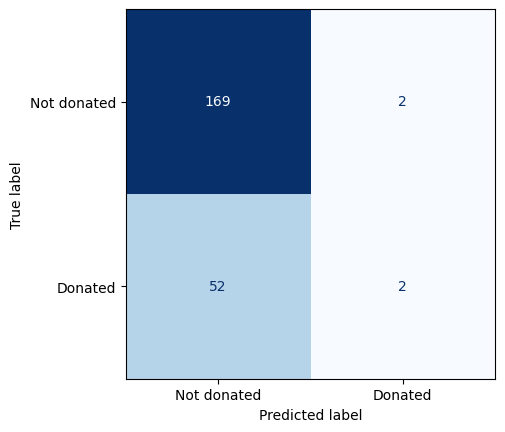

Accuracy %              : 76.0%
Precision score         : 0.037
Recall score            : 0.5
F1 score                : 0.8481
Cross Validation score  : 0.0
Training time           : 0.021 Seconds




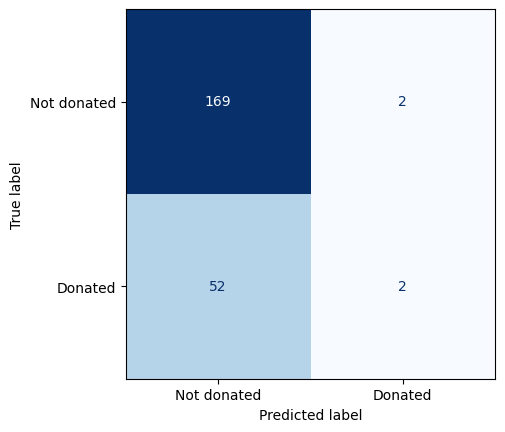

Accuracy %              : 76.0%
Precision score         : 0.037
Recall score            : 0.5
F1 score                : 0.8481
Cross Validation score  : 0.0
Training time           : 0.021 Seconds




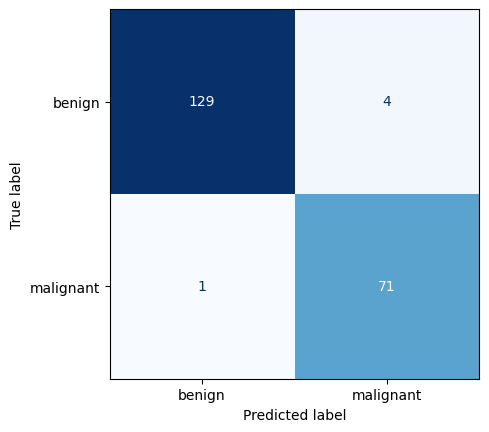

Accuracy %              : 97.561%
Precision score         : 0.9861
Recall score            : 0.9467
F1 score                : 0.9755
Cross Validation score  : 0.9371
Training time           : 0.001 Seconds




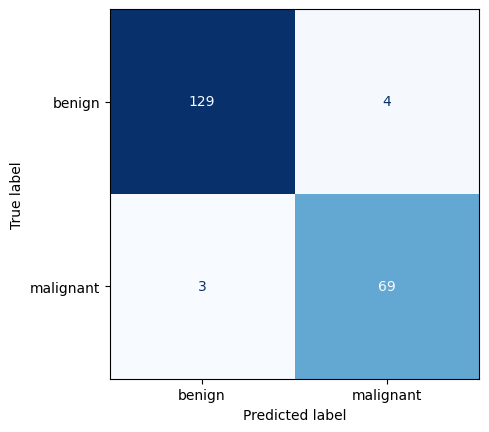

Accuracy %              : 96.5854%
Precision score         : 0.9583
Recall score            : 0.9452
F1 score                : 0.9658
Cross Validation score  : 0.9663
Training time           : 0.003 Seconds




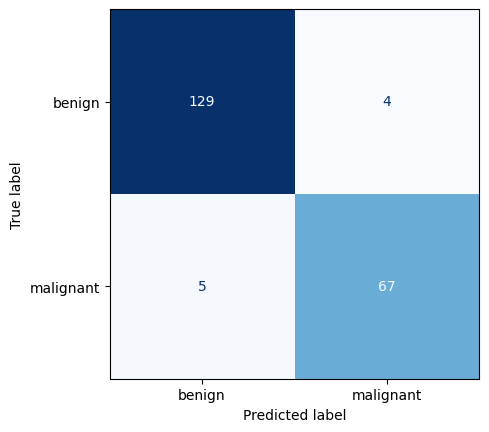

Accuracy %              : 95.6098%
Precision score         : 0.9306
Recall score            : 0.9437
F1 score                : 0.9562
Cross Validation score  : 0.937
Training time           : 0.002 Seconds




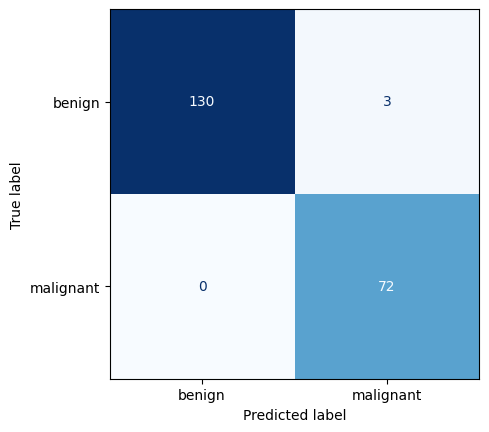

Accuracy %              : 98.5366%
Precision score         : 1.0
Recall score            : 0.96
F1 score                : 0.9853
Cross Validation score  : 0.9634
Training time           : 0.003 Seconds




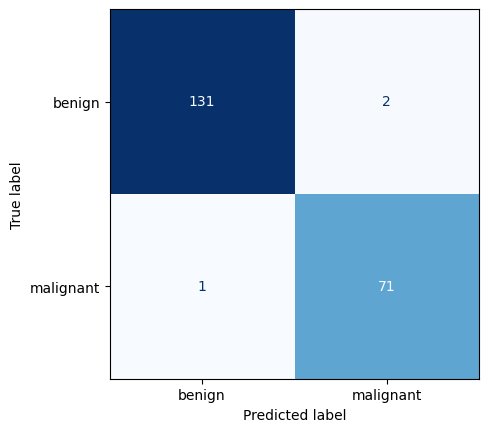

Accuracy %              : 98.5366%
Precision score         : 0.9861
Recall score            : 0.9726
F1 score                : 0.9853
Cross Validation score  : 0.962
Training time           : 0.1435 Seconds




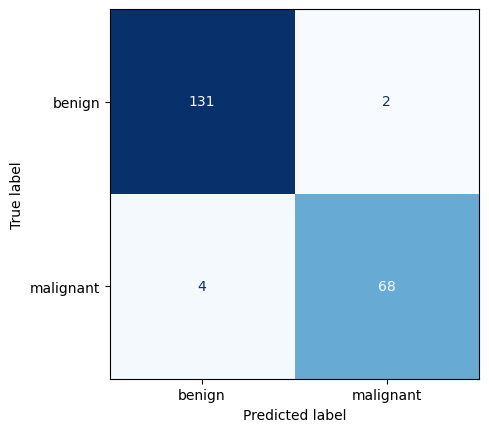

Accuracy %              : 97.0732%
Precision score         : 0.9444
Recall score            : 0.9714
F1 score                : 0.9708
Cross Validation score  : 0.0
Training time           : 0.1056 Seconds




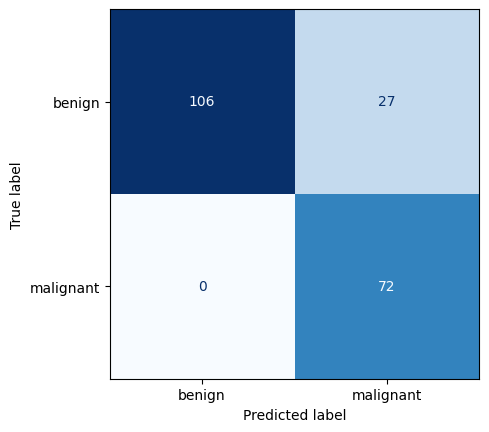

Accuracy %              : 86.8293%
Precision score         : 1.0
Recall score            : 0.7273
F1 score                : 0.8653
Cross Validation score  : 0.0
Training time           : 0.0879 Seconds




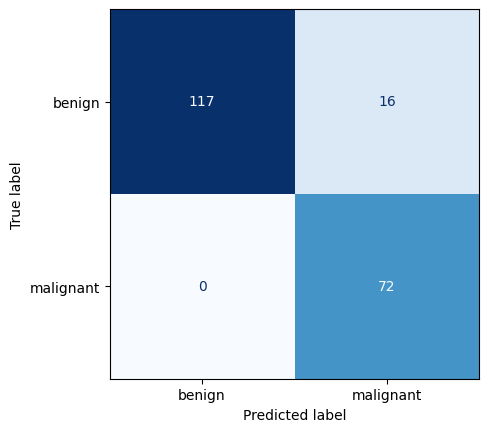

Accuracy %              : 92.1951%
Precision score         : 1.0
Recall score            : 0.8182
F1 score                : 0.9205
Cross Validation score  : 0.0
Training time           : 0.0207 Seconds




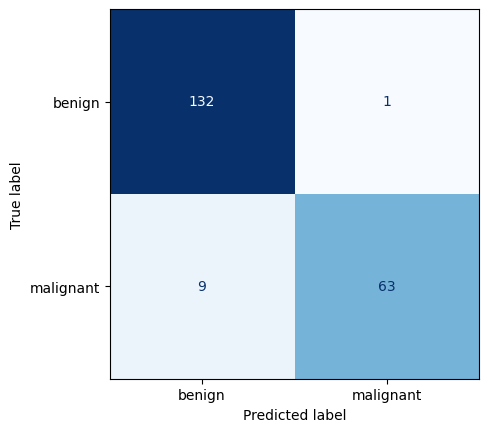

Accuracy %              : 95.122%
Precision score         : 0.875
Recall score            : 0.9844
F1 score                : 0.9519
Cross Validation score  : 0.0
Training time           : 0.0182 Seconds




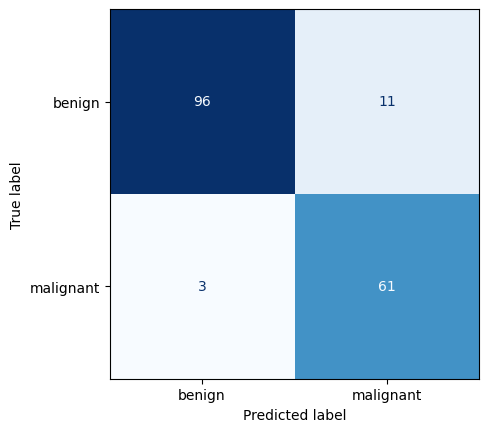

Accuracy %              : 91.8129%
Precision score         : 0.9531
Recall score            : 0.8472
F1 score                : 0.9173
Cross Validation score  : 0.8839
Training time           : 0.002 Seconds




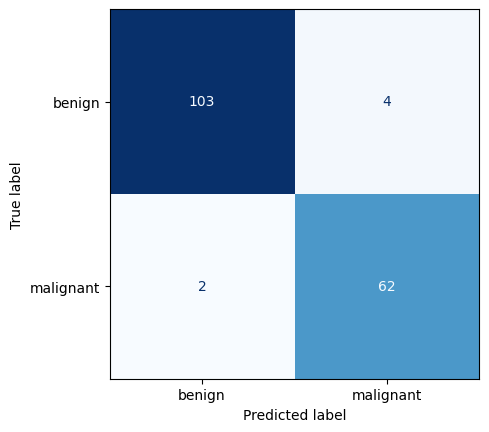

Accuracy %              : 96.4912%
Precision score         : 0.9688
Recall score            : 0.9394
F1 score                : 0.9648
Cross Validation score  : 0.8278
Training time           : 0.001 Seconds




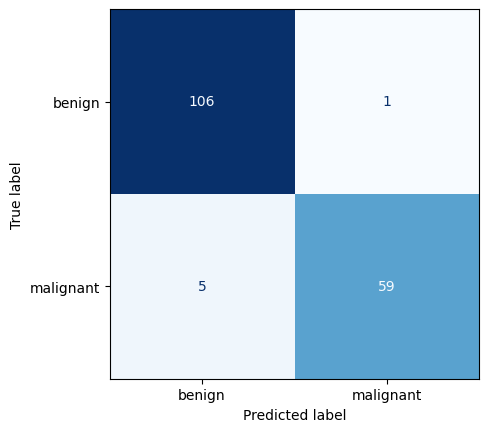

Accuracy %              : 96.4912%
Precision score         : 0.9219
Recall score            : 0.9833
F1 score                : 0.9652
Cross Validation score  : 0.9191
Training time           : 0.001 Seconds




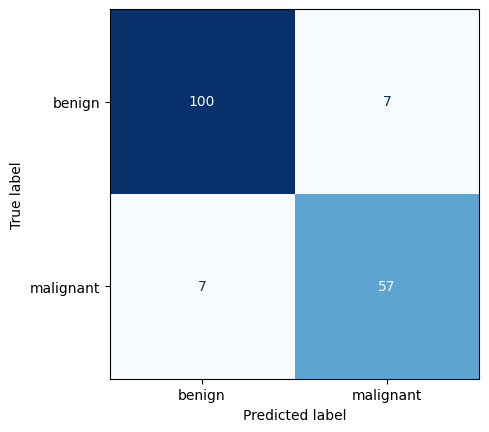

Accuracy %              : 91.8129%
Precision score         : 0.8906
Recall score            : 0.8906
F1 score                : 0.9181
Cross Validation score  : 0.9209
Training time           : 0.009 Seconds




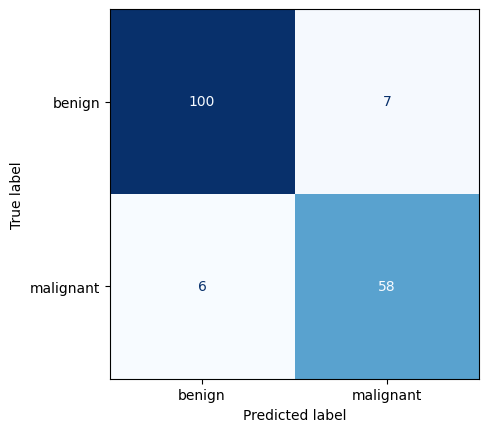

Accuracy %              : 92.3977%
Precision score         : 0.9062
Recall score            : 0.8923
F1 score                : 0.9239
Cross Validation score  : 0.9191
Training time           : 0.008 Seconds




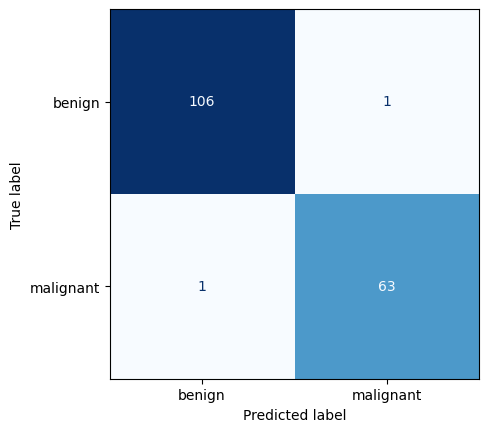

Accuracy %              : 98.8304%
Precision score         : 0.9844
Recall score            : 0.9844
F1 score                : 0.9883
Cross Validation score  : 0.9122
Training time           : 0.005 Seconds




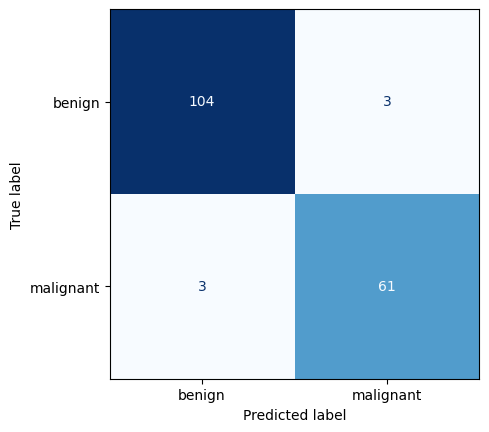

Accuracy %              : 96.4912%
Precision score         : 0.9531
Recall score            : 0.9531
F1 score                : 0.9649
Cross Validation score  : 0.9614
Training time           : 0.2091 Seconds




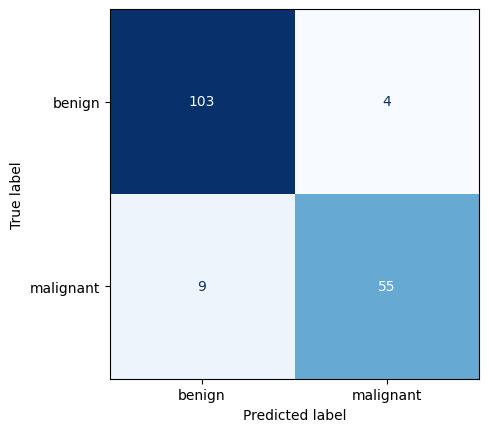

Accuracy %              : 92.3977%
Precision score         : 0.8594
Recall score            : 0.9322
F1 score                : 0.9247
Cross Validation score  : 0.0
Training time           : 0.1031 Seconds




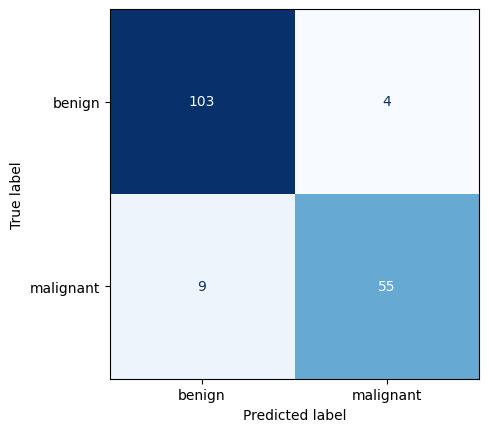

Accuracy %              : 92.3977%
Precision score         : 0.8594
Recall score            : 0.9322
F1 score                : 0.9247
Cross Validation score  : 0.0
Training time           : 0.0932 Seconds




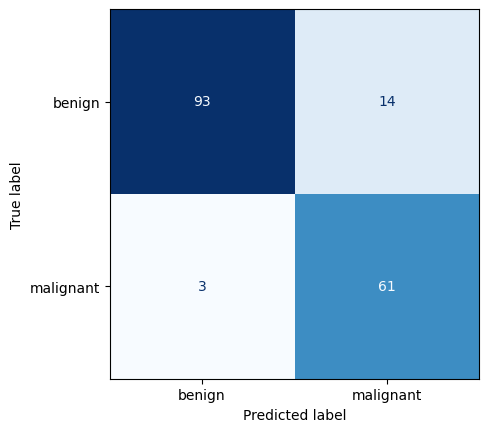

Accuracy %              : 90.0585%
Precision score         : 0.9531
Recall score            : 0.8133
F1 score                : 0.8993
Cross Validation score  : 0.0
Training time           : 0.0474 Seconds




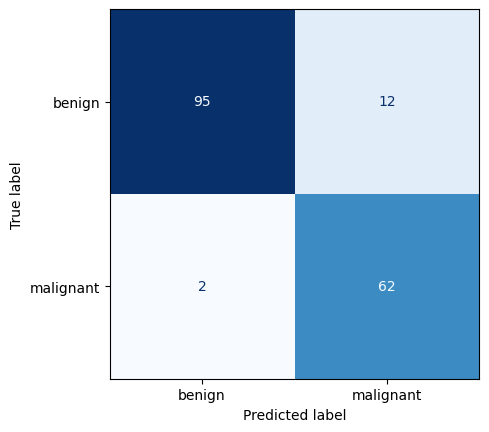

Accuracy %              : 91.8129%
Precision score         : 0.9688
Recall score            : 0.8378
F1 score                : 0.9172
Cross Validation score  : 0.0
Training time           : 0.0196 Seconds




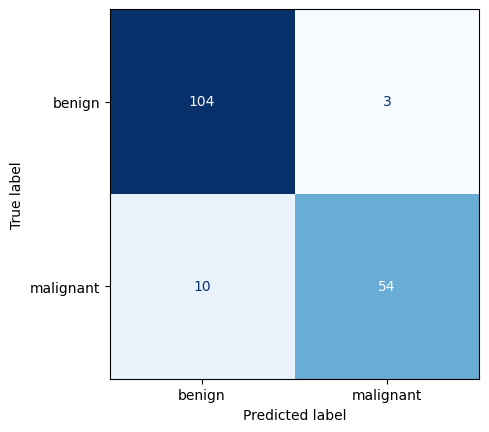

Accuracy %              : 92.3977%
Precision score         : 0.8438
Recall score            : 0.9474
F1 score                : 0.925
Cross Validation score  : 0.0
Training time           : 0.052 Seconds




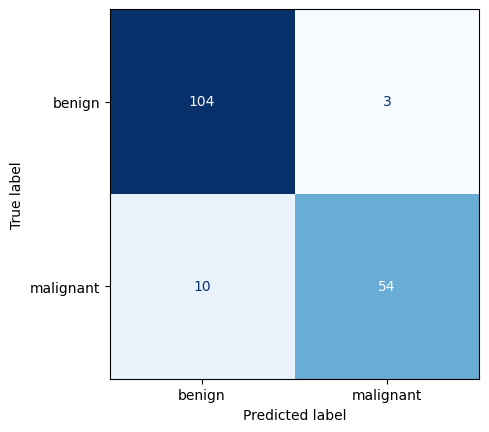

Accuracy %              : 92.3977%
Precision score         : 0.8438
Recall score            : 0.9474
F1 score                : 0.925
Cross Validation score  : 0.0
Training time           : 0.0405 Seconds




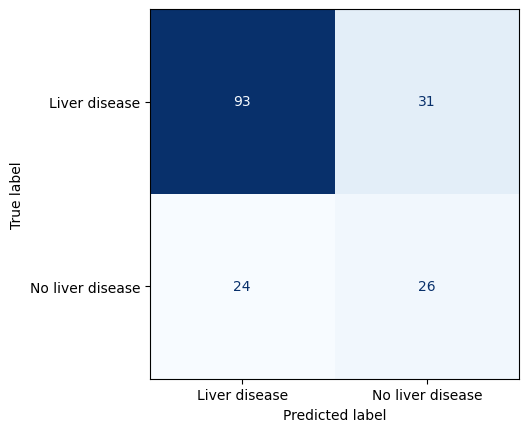

Accuracy %              : 68.3908%
Precision score         : 0.75
Recall score            : 0.7949
F1 score                : 0.6782
Cross Validation score  : 0.5771
Training time           : 0.001 Seconds




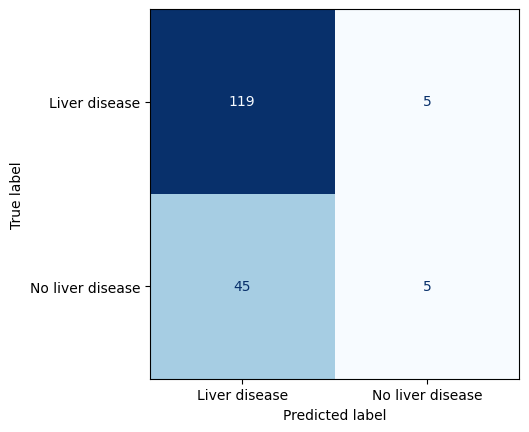

Accuracy %              : 71.2644%
Precision score         : 0.9597
Recall score            : 0.7256
F1 score                : 0.7885
Cross Validation score  : 0.5426
Training time           : 0.002 Seconds




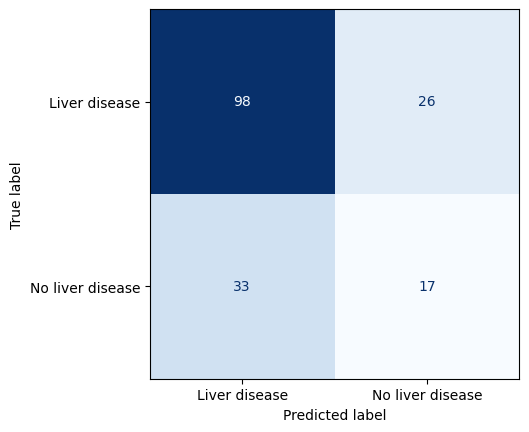

Accuracy %              : 66.092%
Precision score         : 0.7903
Recall score            : 0.7481
F1 score                : 0.669
Cross Validation score  : 0.6478
Training time           : 0.0009 Seconds




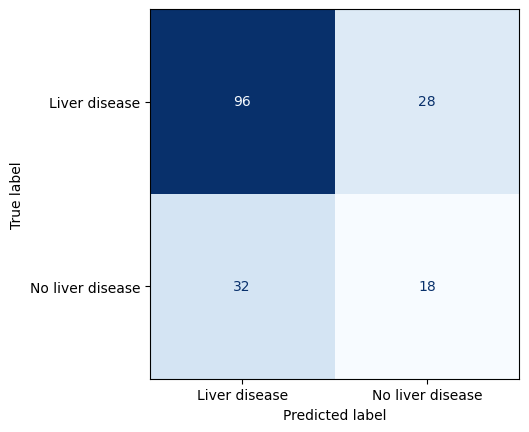

Accuracy %              : 65.5172%
Precision score         : 0.7742
Recall score            : 0.75
F1 score                : 0.6596
Cross Validation score  : 0.653
Training time           : 0.0 Seconds




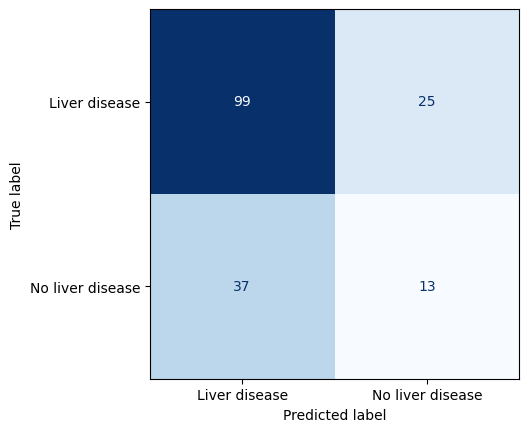

Accuracy %              : 64.3678%
Precision score         : 0.7984
Recall score            : 0.7279
F1 score                : 0.6598
Cross Validation score  : 0.6564
Training time           : 0.003 Seconds




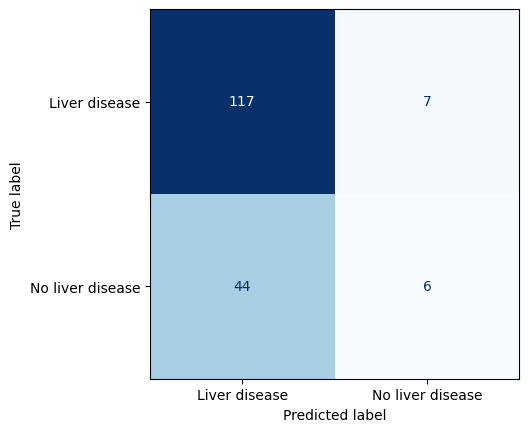

Accuracy %              : 70.6897%
Precision score         : 0.9435
Recall score            : 0.7267
F1 score                : 0.7739
Cross Validation score  : 0.6961
Training time           : 0.002 Seconds




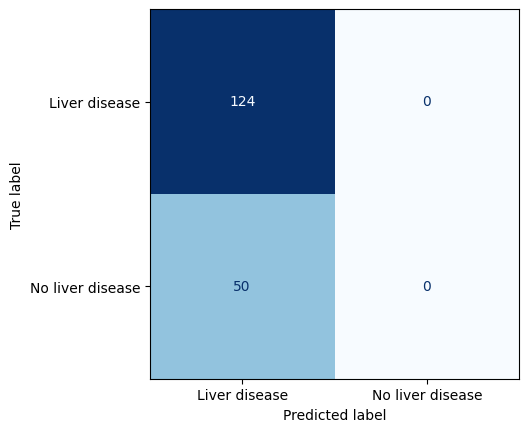

Accuracy %              : 71.2644%
Precision score         : 1.0
Recall score            : 0.7126
F1 score                : 0.8322
Cross Validation score  : 0.715
Training time           : 0.0091 Seconds




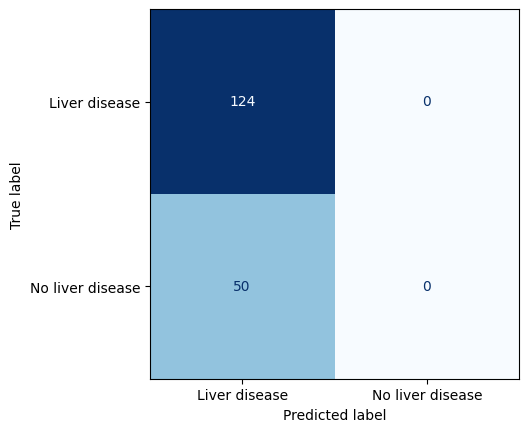

Accuracy %              : 71.2644%
Precision score         : 1.0
Recall score            : 0.7126
F1 score                : 0.8322
Cross Validation score  : 0.715
Training time           : 0.0067 Seconds




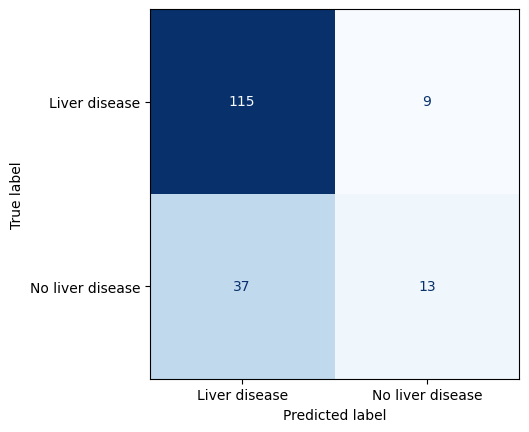

Accuracy %              : 73.5632%
Precision score         : 0.9274
Recall score            : 0.7566
F1 score                : 0.7736
Cross Validation score  : 0.6909
Training time           : 0.1914 Seconds




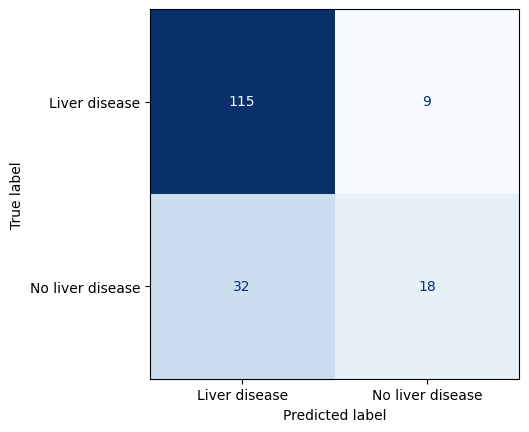

Accuracy %              : 76.4368%
Precision score         : 0.9274
Recall score            : 0.7823
F1 score                : 0.7896
Cross Validation score  : 0.6961
Training time           : 0.0752 Seconds




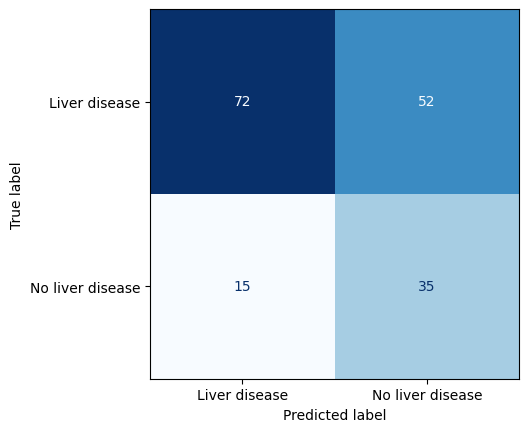

Accuracy %              : 61.4943%
Precision score         : 0.5806
Recall score            : 0.8276
F1 score                : 0.5967
Cross Validation score  : 0.0
Training time           : 0.1124 Seconds




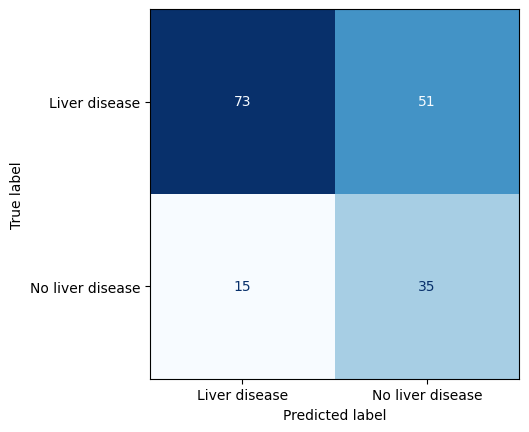

Accuracy %              : 62.069%
Precision score         : 0.5887
Recall score            : 0.8295
F1 score                : 0.6027
Cross Validation score  : 0.0
Training time           : 0.1061 Seconds




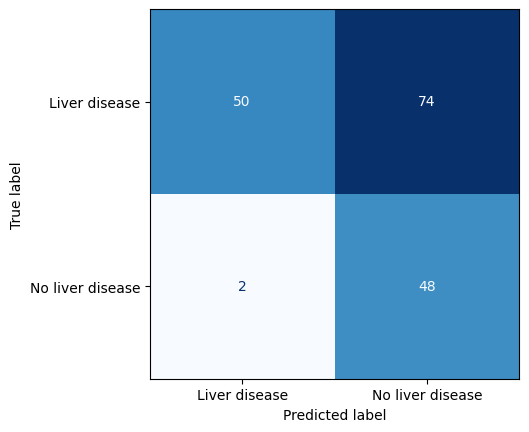

Accuracy %              : 56.3218%
Precision score         : 0.4032
Recall score            : 0.9615
F1 score                : 0.5611
Cross Validation score  : 0.0
Training time           : 0.0514 Seconds




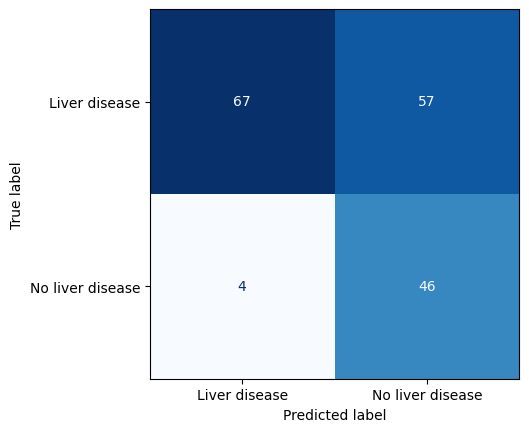

Accuracy %              : 64.9425%
Precision score         : 0.5403
Recall score            : 0.9437
F1 score                : 0.6363
Cross Validation score  : 0.0
Training time           : 0.1623 Seconds




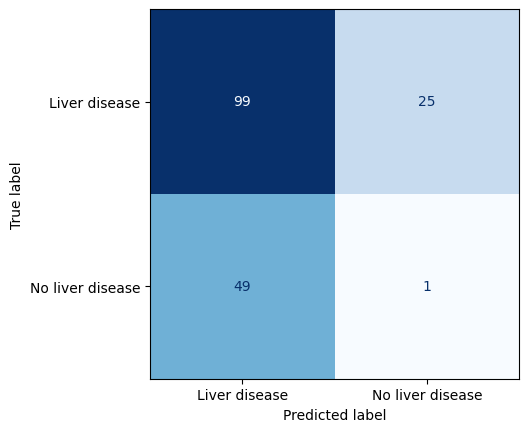

Accuracy %              : 57.4713%
Precision score         : 0.7984
Recall score            : 0.6689
F1 score                : 0.6231
Cross Validation score  : 0.0
Training time           : 0.0316 Seconds




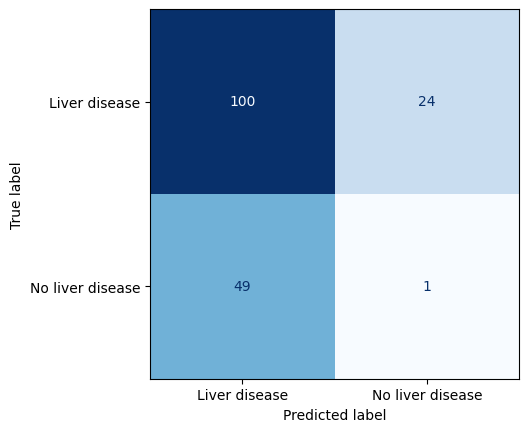

Accuracy %              : 58.046%
Precision score         : 0.8065
Recall score            : 0.6711
F1 score                : 0.6312
Cross Validation score  : 0.0
Training time           : 0.0386 Seconds




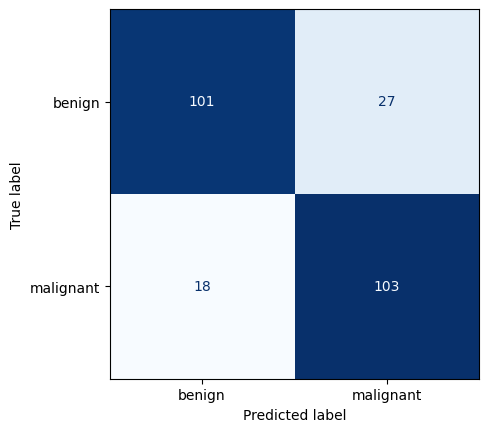

Accuracy %              : 81.9277%
Precision score         : 0.8512
Recall score            : 0.7923
F1 score                : 0.8193
Cross Validation score  : 0.7022
Training time           : 0.002 Seconds




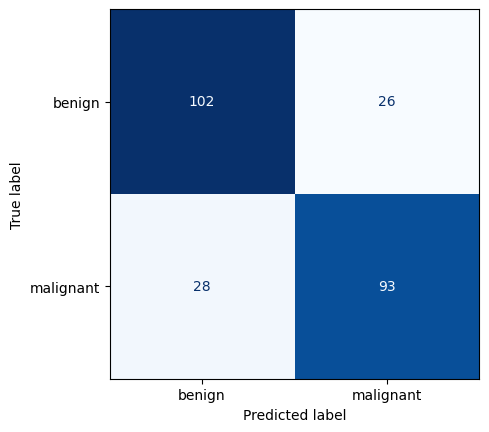

Accuracy %              : 78.3133%
Precision score         : 0.7686
Recall score            : 0.7815
F1 score                : 0.7832
Cross Validation score  : 0.6504
Training time           : 0.002 Seconds




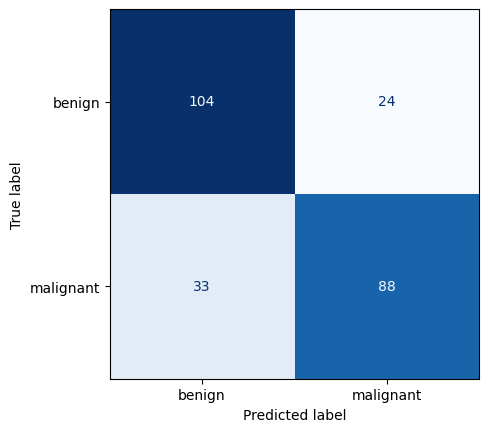

Accuracy %              : 77.1084%
Precision score         : 0.7273
Recall score            : 0.7857
F1 score                : 0.7716
Cross Validation score  : 0.7901
Training time           : 0.0019 Seconds




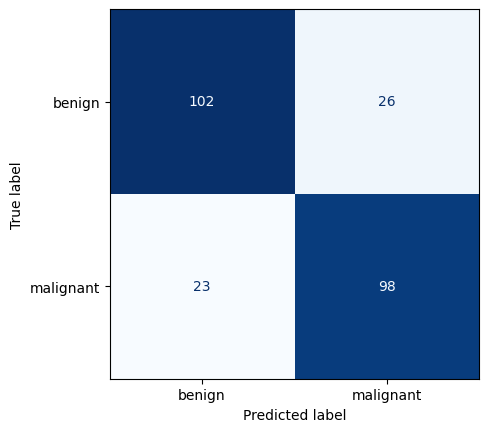

Accuracy %              : 80.3213%
Precision score         : 0.8099
Recall score            : 0.7903
F1 score                : 0.8032
Cross Validation score  : 0.8034
Training time           : 0.001 Seconds




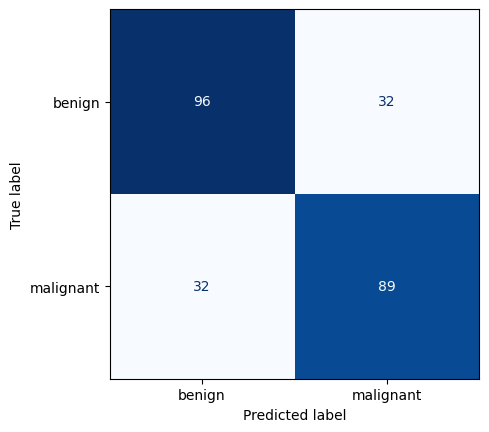

Accuracy %              : 74.2972%
Precision score         : 0.7355
Recall score            : 0.7355
F1 score                : 0.743
Cross Validation score  : 0.7551
Training time           : 0.0035 Seconds




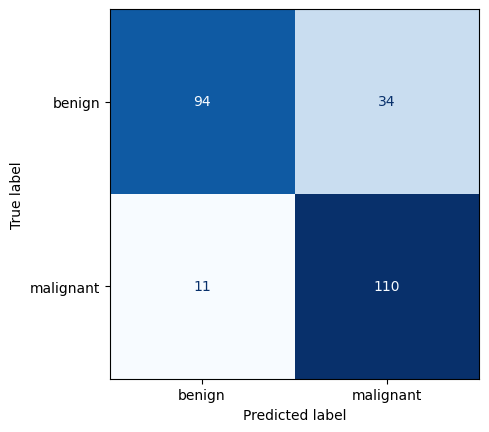

Accuracy %              : 81.9277%
Precision score         : 0.9091
Recall score            : 0.7639
F1 score                : 0.8204
Cross Validation score  : 0.819
Training time           : 0.001 Seconds




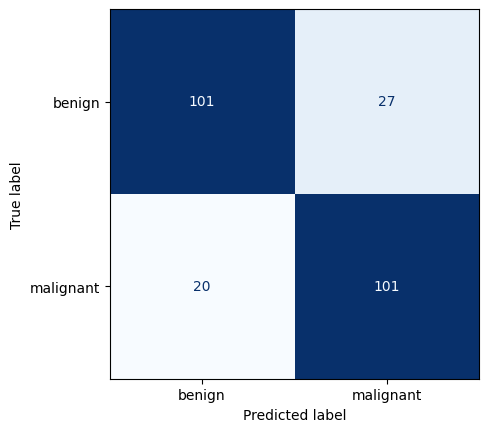

Accuracy %              : 81.1245%
Precision score         : 0.8347
Recall score            : 0.7891
F1 score                : 0.8112
Cross Validation score  : 0.778
Training time           : 0.0087 Seconds




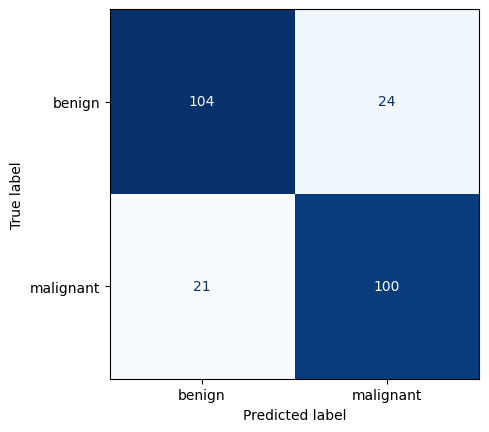

Accuracy %              : 81.9277%
Precision score         : 0.8264
Recall score            : 0.8065
F1 score                : 0.8192
Cross Validation score  : 0.813
Training time           : 0.0196 Seconds




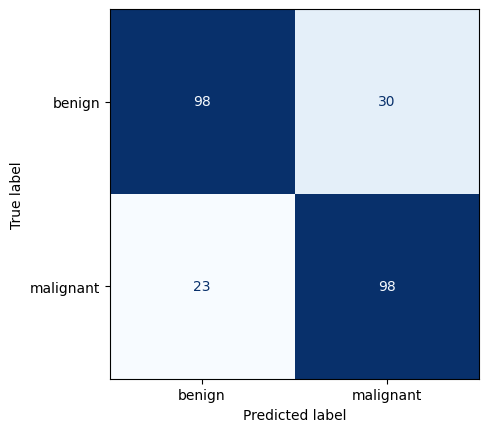

Accuracy %              : 78.7149%
Precision score         : 0.8099
Recall score            : 0.7656
F1 score                : 0.7871
Cross Validation score  : 0.7852
Training time           : 0.1627 Seconds




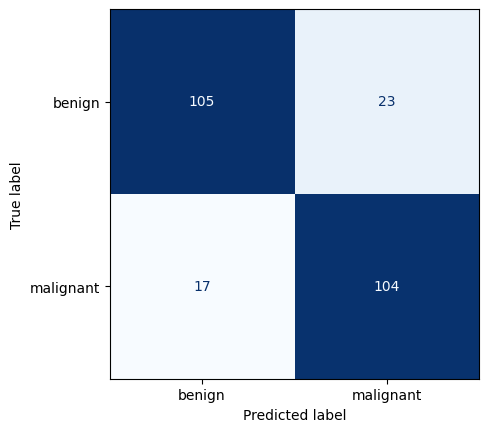

Accuracy %              : 83.9357%
Precision score         : 0.8595
Recall score            : 0.8189
F1 score                : 0.8393
Cross Validation score  : 0.8383
Training time           : 0.0713 Seconds




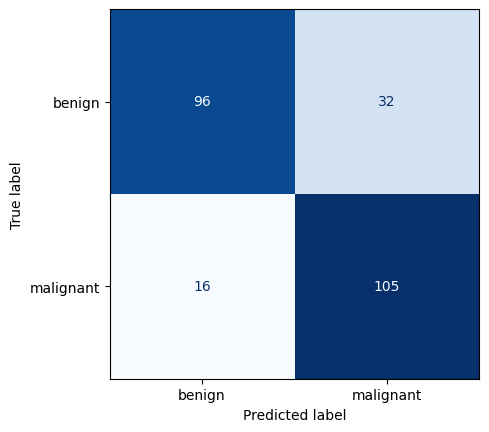

Accuracy %              : 80.7229%
Precision score         : 0.8678
Recall score            : 0.7664
F1 score                : 0.8077
Cross Validation score  : 0.0
Training time           : 0.1137 Seconds




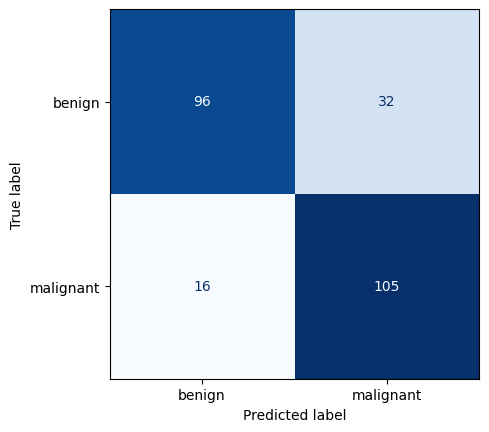

Accuracy %              : 80.7229%
Precision score         : 0.8678
Recall score            : 0.7664
F1 score                : 0.8077
Cross Validation score  : 0.0
Training time           : 0.1041 Seconds




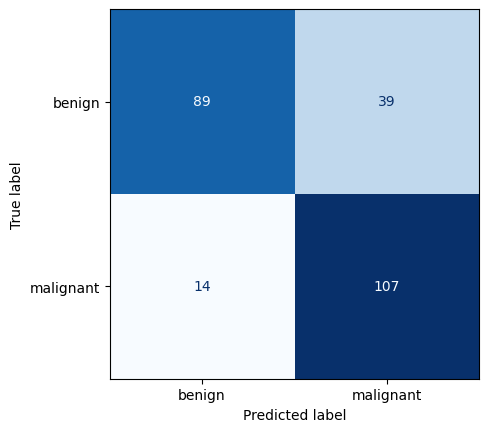

Accuracy %              : 78.7149%
Precision score         : 0.8843
Recall score            : 0.7329
F1 score                : 0.7887
Cross Validation score  : 0.0
Training time           : 0.0815 Seconds




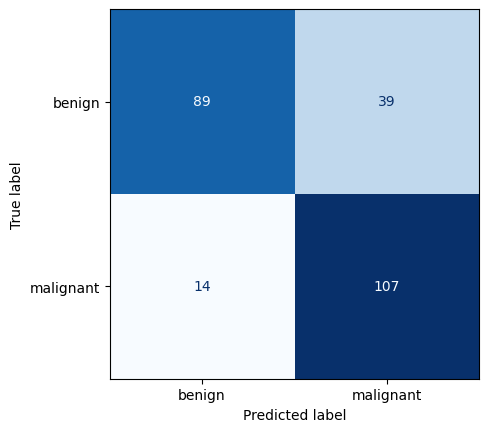

Accuracy %              : 78.7149%
Precision score         : 0.8843
Recall score            : 0.7329
F1 score                : 0.7887
Cross Validation score  : 0.0
Training time           : 0.121 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


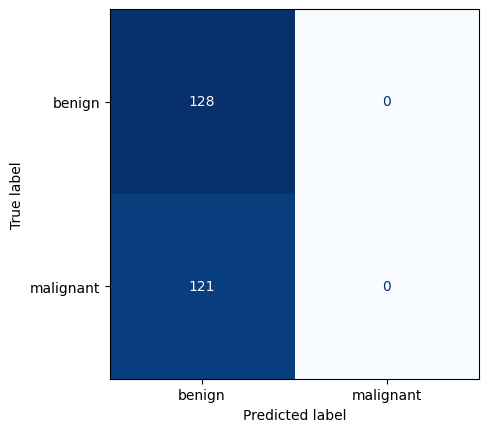

Accuracy %              : 51.4056%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.679
Cross Validation score  : 0.0
Training time           : 0.0274 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


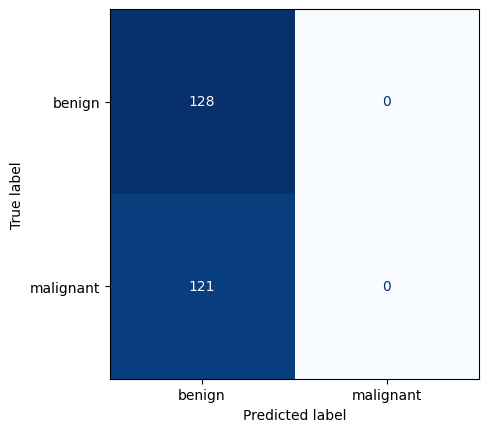

Accuracy %              : 51.4056%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.679
Cross Validation score  : 0.0
Training time           : 0.0216 Seconds




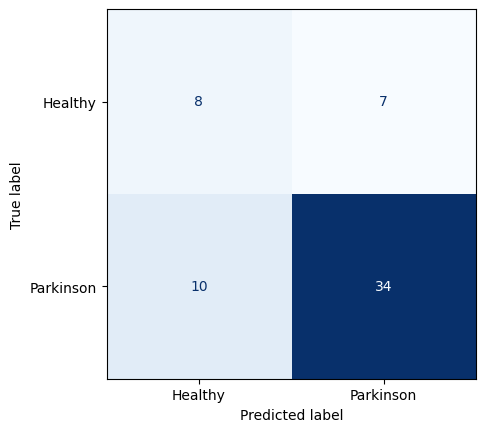

Accuracy %              : 71.1864%
Precision score         : 0.7727
Recall score            : 0.8293
F1 score                : 0.7039
Cross Validation score  : 0.4615
Training time           : 0.0011 Seconds




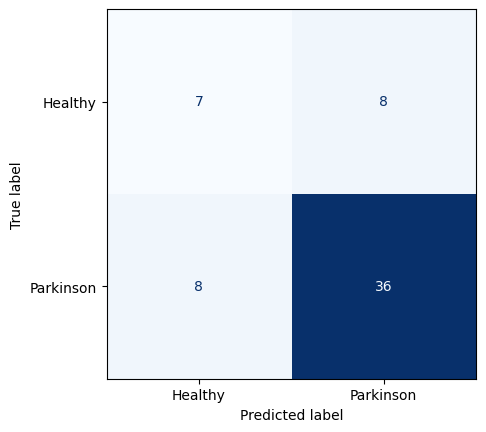

Accuracy %              : 72.8814%
Precision score         : 0.8182
Recall score            : 0.8182
F1 score                : 0.7288
Cross Validation score  : 0.4615
Training time           : 0.001 Seconds




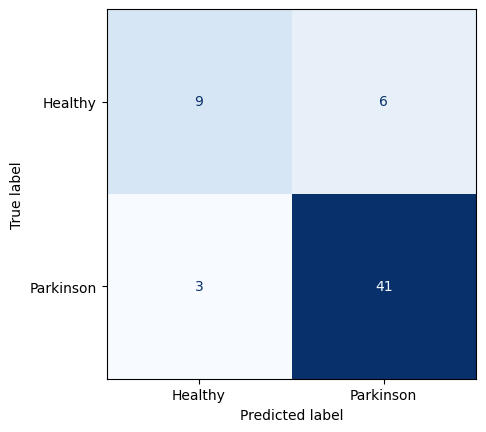

Accuracy %              : 84.7458%
Precision score         : 0.9318
Recall score            : 0.8723
F1 score                : 0.8534
Cross Validation score  : 0.7179
Training time           : 0.001 Seconds




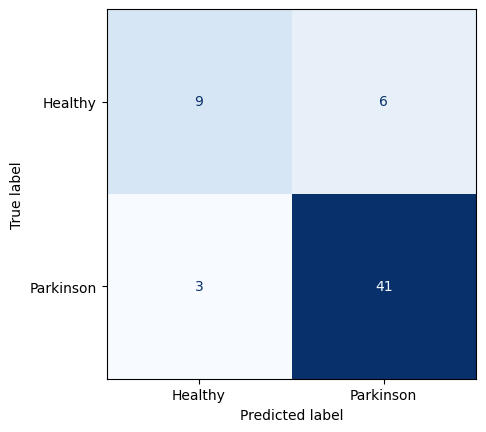

Accuracy %              : 84.7458%
Precision score         : 0.9318
Recall score            : 0.8723
F1 score                : 0.8534
Cross Validation score  : 0.7128
Training time           : 0.001 Seconds




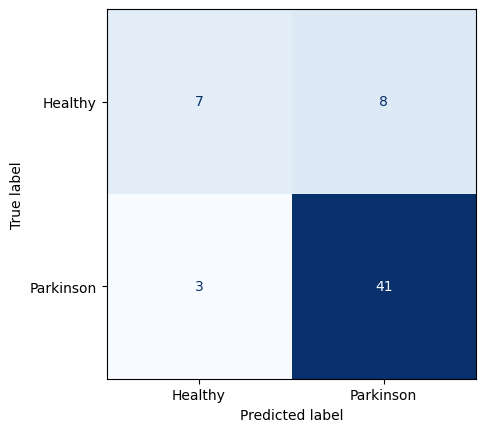

Accuracy %              : 81.3559%
Precision score         : 0.9318
Recall score            : 0.8367
F1 score                : 0.8272
Cross Validation score  : 0.7538
Training time           : 0.002 Seconds




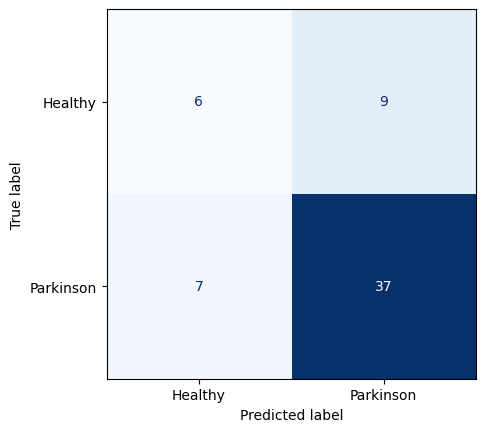

Accuracy %              : 72.8814%
Precision score         : 0.8409
Recall score            : 0.8043
F1 score                : 0.7355
Cross Validation score  : 0.7385
Training time           : 0.0016 Seconds




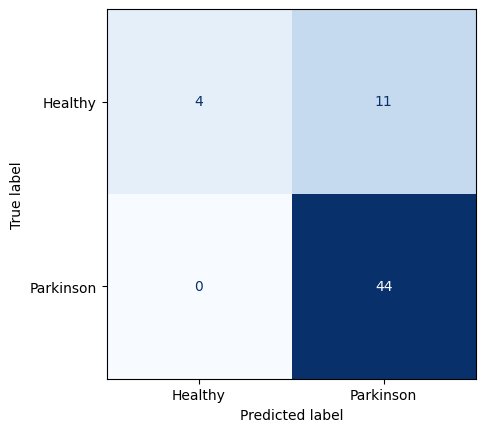

Accuracy %              : 81.3559%
Precision score         : 1.0
Recall score            : 0.8
F1 score                : 0.8572
Cross Validation score  : 0.7846
Training time           : 0.0009 Seconds




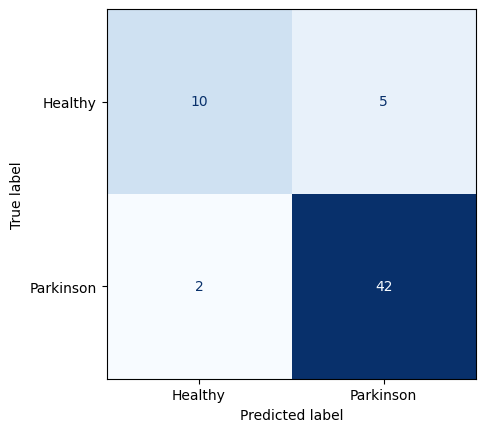

Accuracy %              : 88.1356%
Precision score         : 0.9545
Recall score            : 0.8936
F1 score                : 0.886
Cross Validation score  : 0.7846
Training time           : 0.0009 Seconds




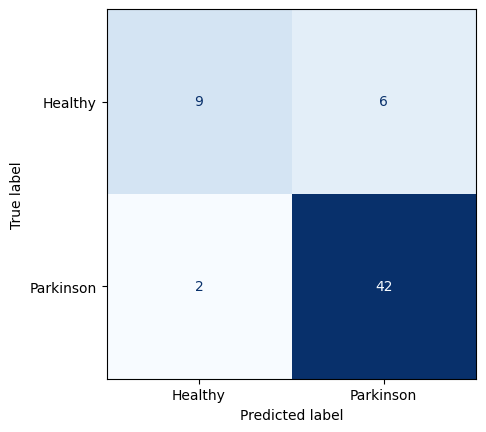

Accuracy %              : 86.4407%
Precision score         : 0.9545
Recall score            : 0.875
F1 score                : 0.8719
Cross Validation score  : 0.7846
Training time           : 0.1444 Seconds




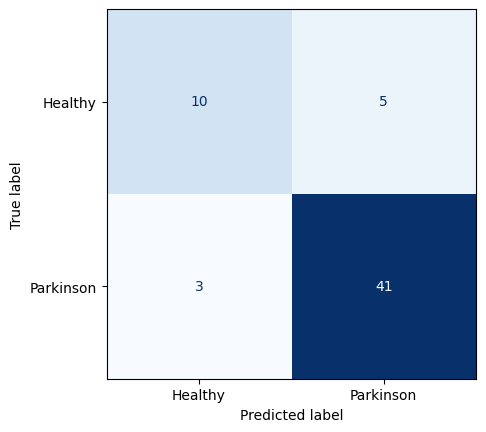

Accuracy %              : 86.4407%
Precision score         : 0.9318
Recall score            : 0.8913
F1 score                : 0.8677
Cross Validation score  : 0.7846
Training time           : 0.0393 Seconds




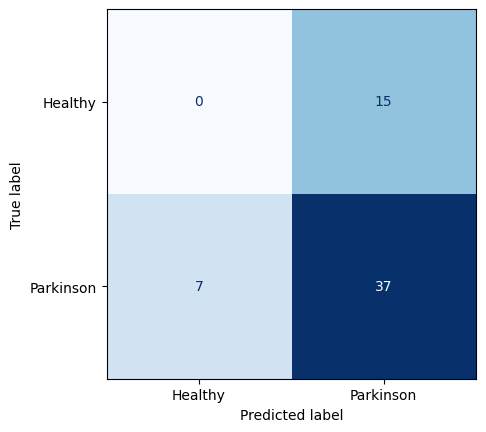

Accuracy %              : 62.7119%
Precision score         : 0.8409
Recall score            : 0.7115
F1 score                : 0.6794
Cross Validation score  : 0.0
Training time           : 0.0973 Seconds




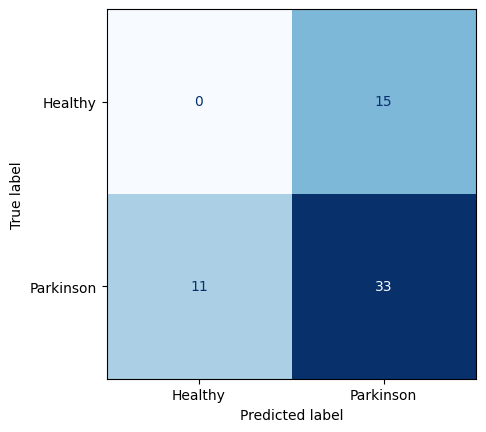

Accuracy %              : 55.9322%
Precision score         : 0.75
Recall score            : 0.6875
F1 score                : 0.5836
Cross Validation score  : 0.0
Training time           : 0.0922 Seconds




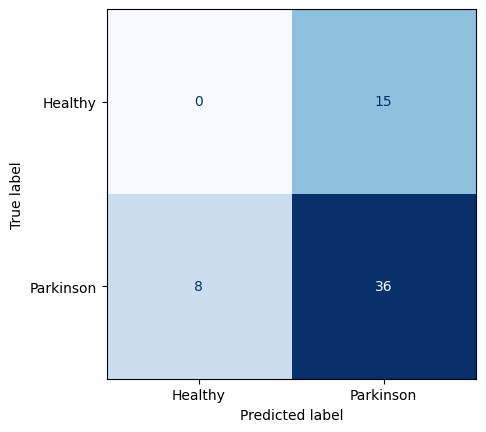

Accuracy %              : 61.0169%
Precision score         : 0.8182
Recall score            : 0.7059
F1 score                : 0.6551
Cross Validation score  : 0.0
Training time           : 0.0666 Seconds




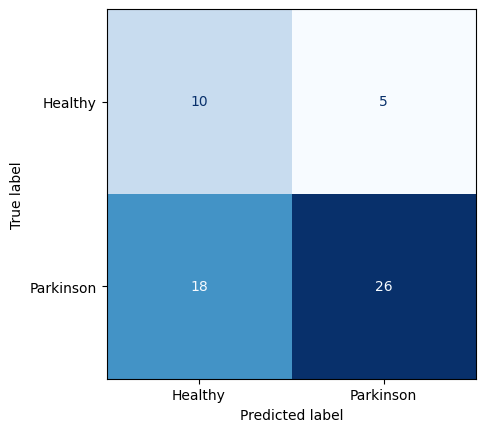

Accuracy %              : 61.0169%
Precision score         : 0.5909
Recall score            : 0.8387
F1 score                : 0.585
Cross Validation score  : 0.0
Training time           : 0.1537 Seconds




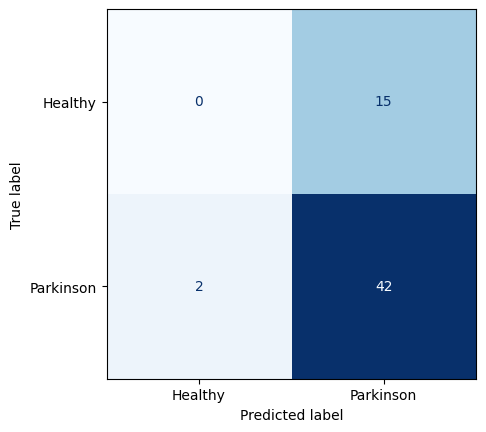

Accuracy %              : 71.1864%
Precision score         : 0.9545
Recall score            : 0.7368
F1 score                : 0.8035
Cross Validation score  : 0.0
Training time           : 0.0146 Seconds




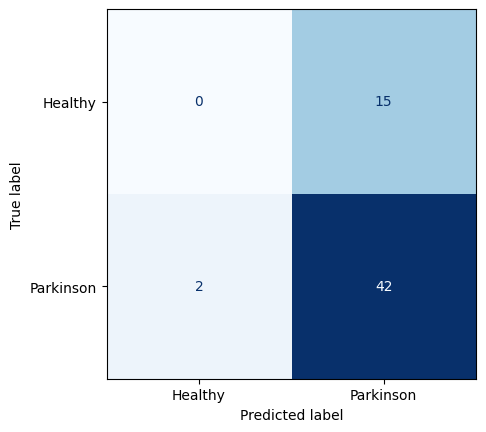

Accuracy %              : 71.1864%
Precision score         : 0.9545
Recall score            : 0.7368
F1 score                : 0.8035
Cross Validation score  : 0.0
Training time           : 0.019 Seconds




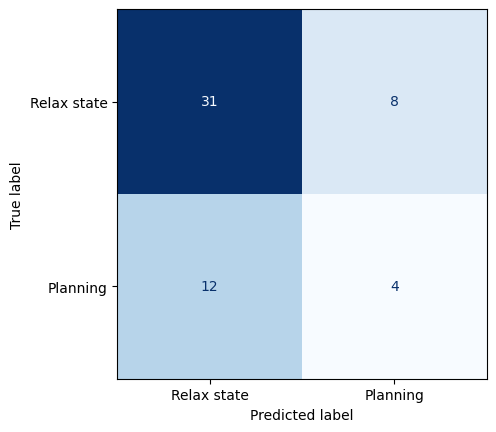

Accuracy %              : 63.6364%
Precision score         : 0.25
Recall score            : 0.3333
F1 score                : 0.6535
Cross Validation score  : 0.555
Training time           : 0.002 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


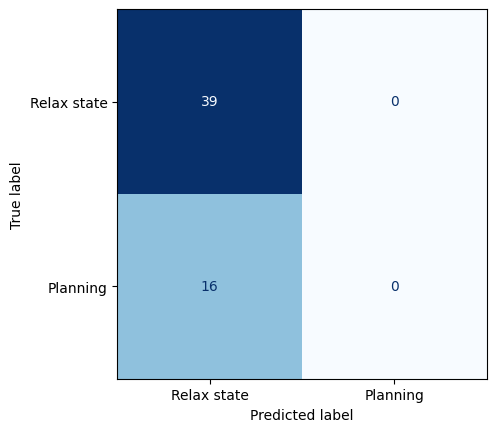

Accuracy %              : 70.9091%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8298
Cross Validation score  : 0.5715
Training time           : 0.001 Seconds




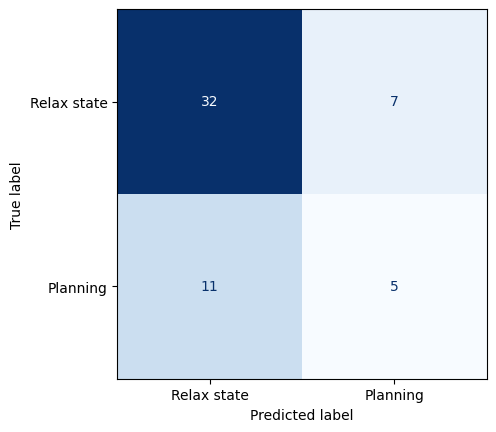

Accuracy %              : 67.2727%
Precision score         : 0.3125
Recall score            : 0.4167
F1 score                : 0.6881
Cross Validation score  : 0.6377
Training time           : 0.001 Seconds




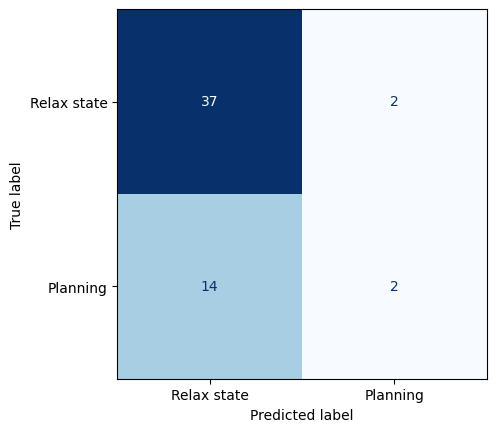

Accuracy %              : 70.9091%
Precision score         : 0.125
Recall score            : 0.5
F1 score                : 0.777
Cross Validation score  : 0.6758
Training time           : 0.0011 Seconds




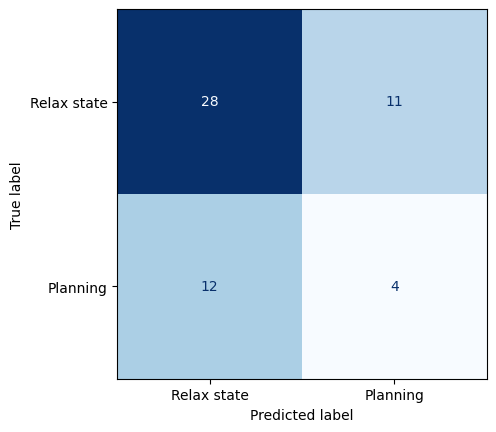

Accuracy %              : 58.1818%
Precision score         : 0.25
Recall score            : 0.2667
F1 score                : 0.5859
Cross Validation score  : 0.589
Training time           : 0.002 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


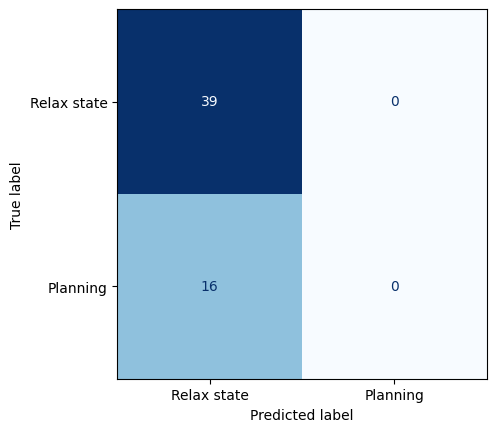

Accuracy %              : 70.9091%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8298
Cross Validation score  : 0.6159
Training time           : 0.001 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


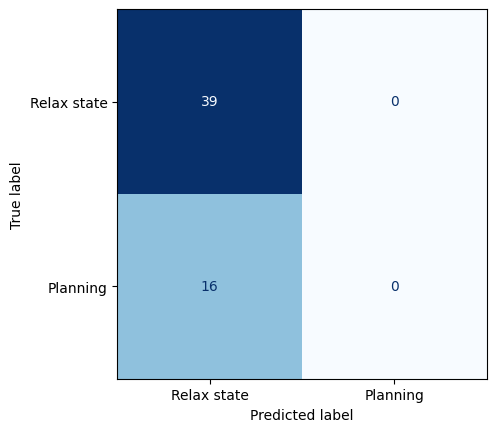

Accuracy %              : 70.9091%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8298
Cross Validation score  : 0.7089
Training time           : 0.0026 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


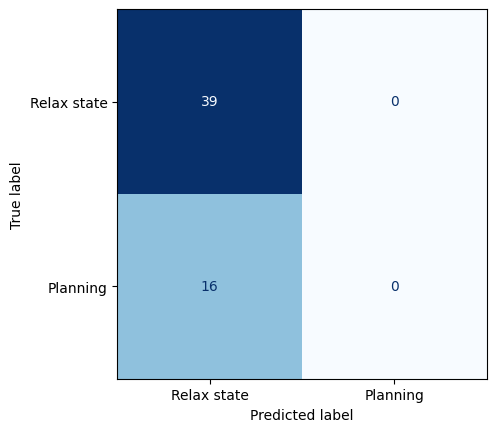

Accuracy %              : 70.9091%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8298
Cross Validation score  : 0.7089
Training time           : 0.0011 Seconds




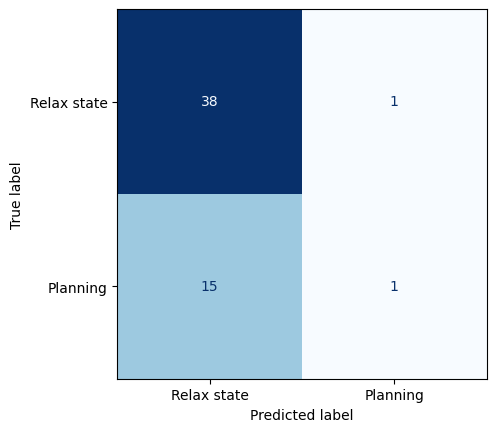

Accuracy %              : 70.9091%
Precision score         : 0.0625
Recall score            : 0.5
F1 score                : 0.8001
Cross Validation score  : 0.6926
Training time           : 0.1512 Seconds




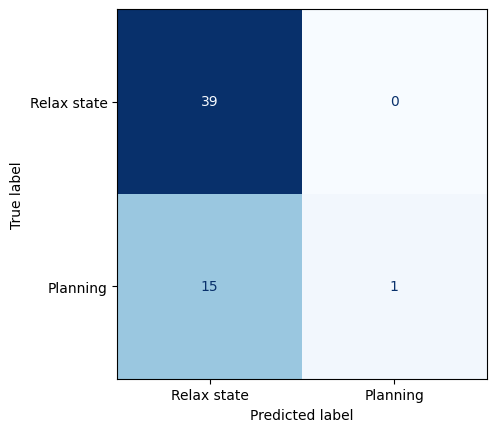

Accuracy %              : 72.7273%
Precision score         : 0.0625
Recall score            : 1.0
F1 score                : 0.8256
Cross Validation score  : 0.7146
Training time           : 0.092 Seconds




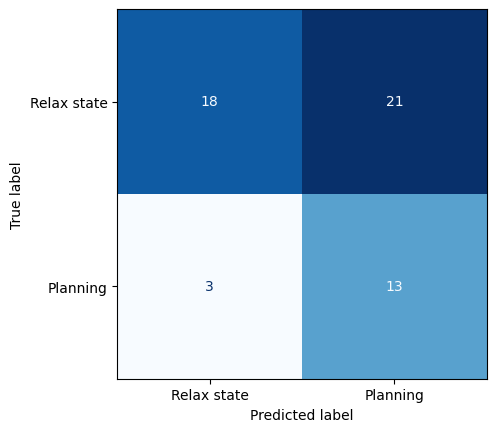

Accuracy %              : 56.3636%
Precision score         : 0.8125
Recall score            : 0.3824
F1 score                : 0.5505
Cross Validation score  : 0.0
Training time           : 0.0963 Seconds




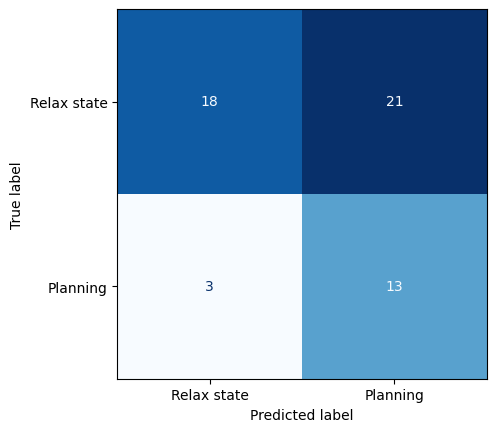

Accuracy %              : 56.3636%
Precision score         : 0.8125
Recall score            : 0.3824
F1 score                : 0.5505
Cross Validation score  : 0.0
Training time           : 0.0946 Seconds




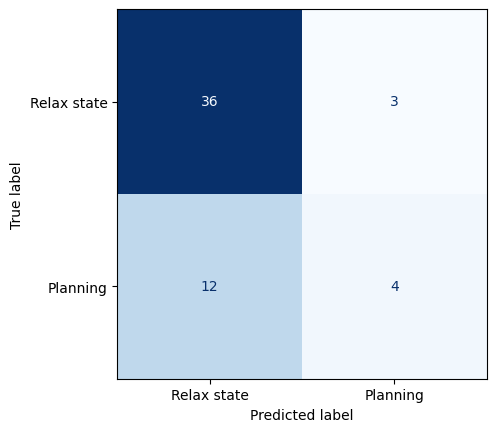

Accuracy %              : 72.7273%
Precision score         : 0.25
Recall score            : 0.5714
F1 score                : 0.7665
Cross Validation score  : 0.0
Training time           : 0.0992 Seconds




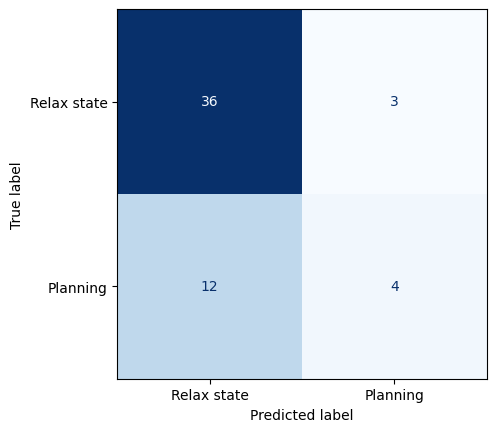

Accuracy %              : 72.7273%
Precision score         : 0.25
Recall score            : 0.5714
F1 score                : 0.7665
Cross Validation score  : 0.0
Training time           : 0.0881 Seconds




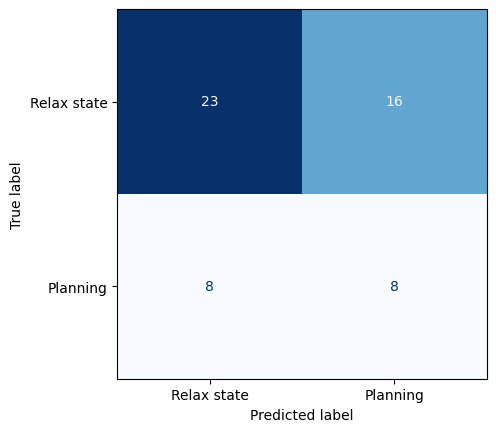

Accuracy %              : 56.3636%
Precision score         : 0.5
Recall score            : 0.3333
F1 score                : 0.5449
Cross Validation score  : 0.0
Training time           : 0.015 Seconds




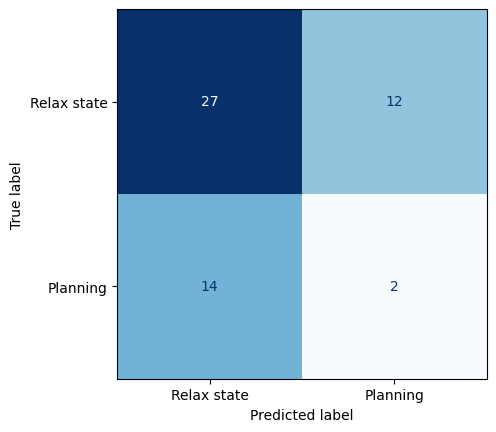

Accuracy %              : 52.7273%
Precision score         : 0.125
Recall score            : 0.1429
F1 score                : 0.5371
Cross Validation score  : 0.0
Training time           : 0.0159 Seconds




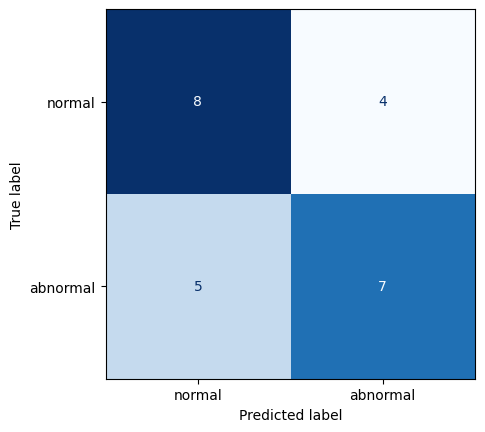

Accuracy %              : 62.5%
Precision score         : 0.5833
Recall score            : 0.6364
F1 score                : 0.6257
Cross Validation score  : 0.6958
Training time           : 0.001 Seconds




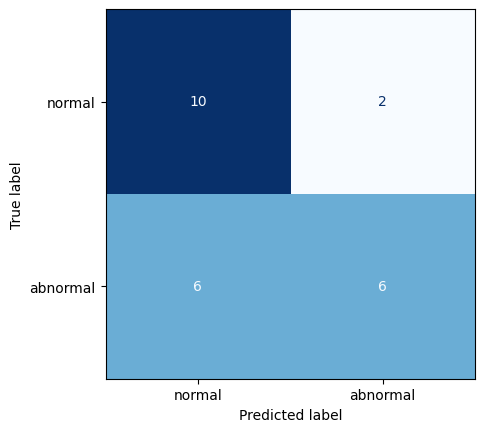

Accuracy %              : 66.6667%
Precision score         : 0.5
Recall score            : 0.75
F1 score                : 0.6762
Cross Validation score  : 0.6967
Training time           : 0.001 Seconds




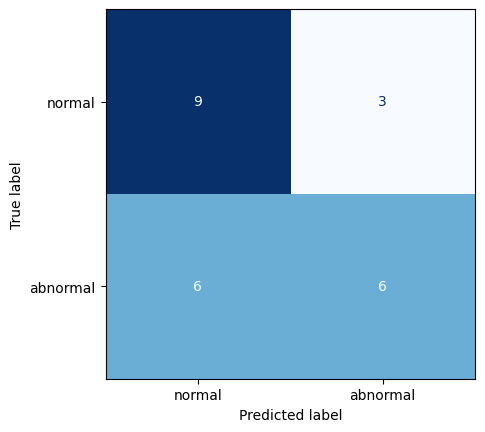

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.495
Training time           : 0.0 Seconds




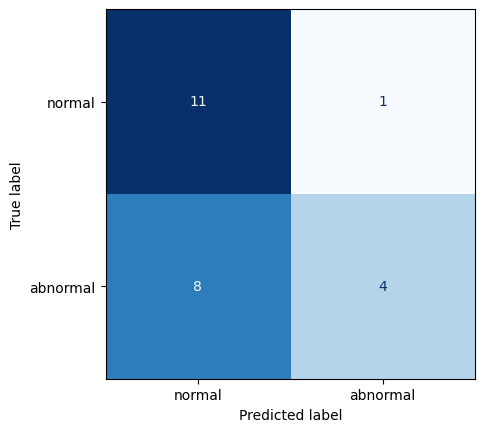

Accuracy %              : 62.5%
Precision score         : 0.3333
Recall score            : 0.8
F1 score                : 0.6599
Cross Validation score  : 0.6333
Training time           : 0.0 Seconds




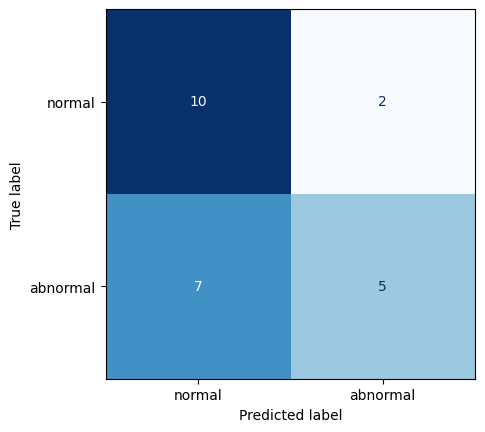

Accuracy %              : 62.5%
Precision score         : 0.4167
Recall score            : 0.7143
F1 score                : 0.642
Cross Validation score  : 0.6342
Training time           : 0.001 Seconds




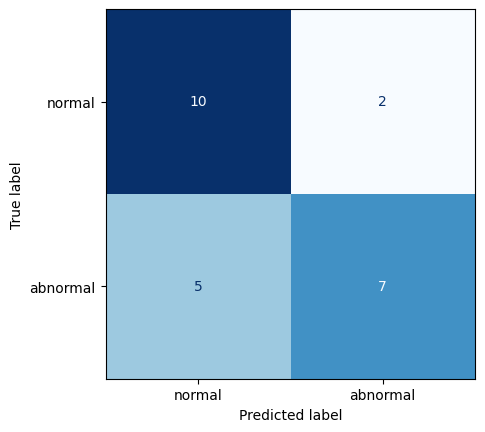

Accuracy %              : 70.8333%
Precision score         : 0.5833
Recall score            : 0.7778
F1 score                : 0.713
Cross Validation score  : 0.7467
Training time           : 0.002 Seconds




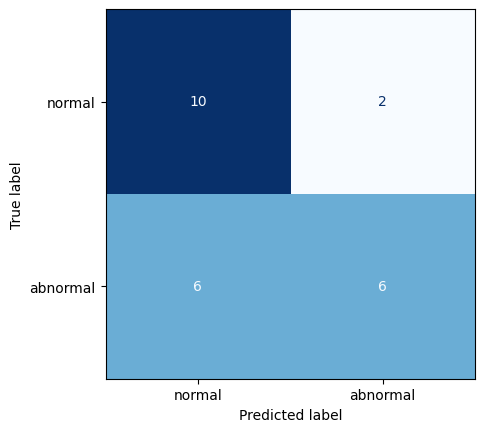

Accuracy %              : 66.6667%
Precision score         : 0.5
Recall score            : 0.75
F1 score                : 0.6762
Cross Validation score  : 0.72
Training time           : 0.001 Seconds




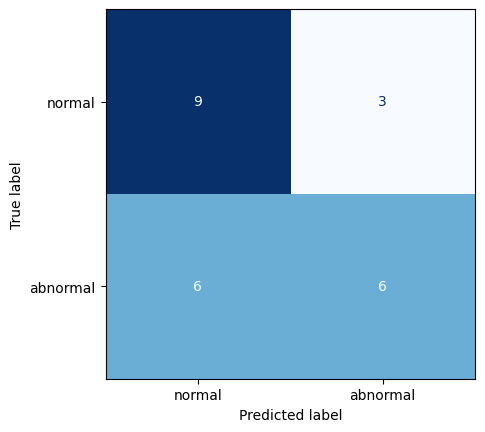

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.6708
Training time           : 0.001 Seconds




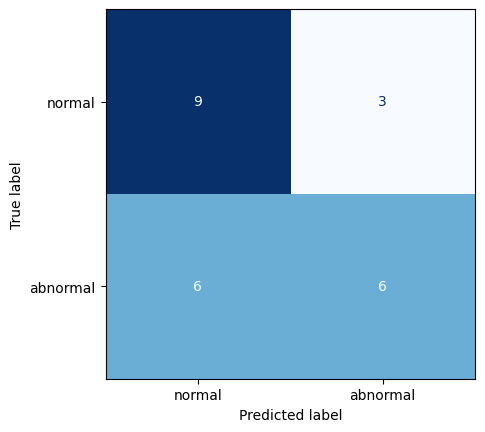

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.6833
Training time           : 0.1326 Seconds




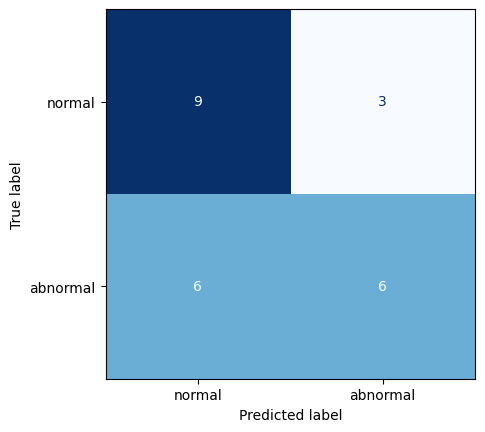

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.745
Training time           : 0.1065 Seconds




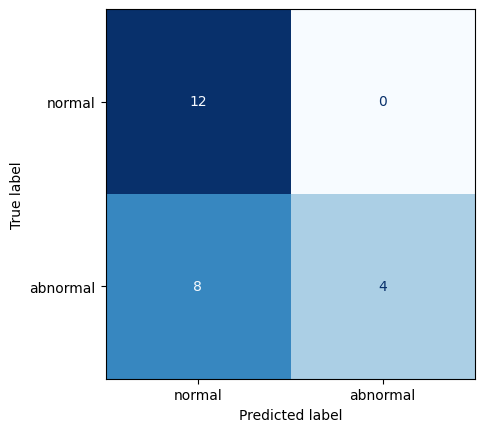

Accuracy %              : 66.6667%
Precision score         : 0.3333
Recall score            : 1.0
F1 score                : 0.7083
Cross Validation score  : 0.0
Training time           : 0.0946 Seconds




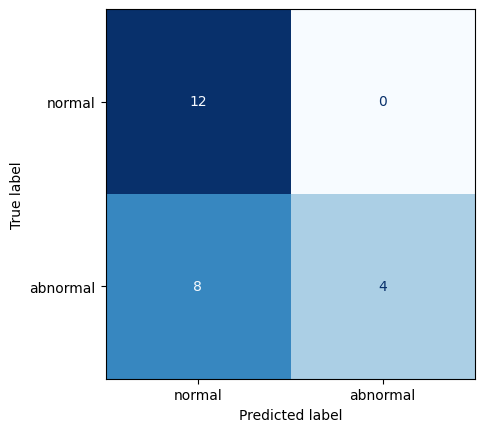

Accuracy %              : 66.6667%
Precision score         : 0.3333
Recall score            : 1.0
F1 score                : 0.7083
Cross Validation score  : 0.0
Training time           : 0.0941 Seconds




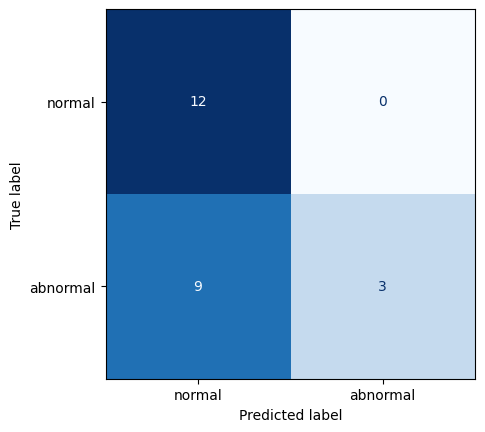

Accuracy %              : 62.5%
Precision score         : 0.25
Recall score            : 1.0
F1 score                : 0.6864
Cross Validation score  : 0.0
Training time           : 0.0206 Seconds




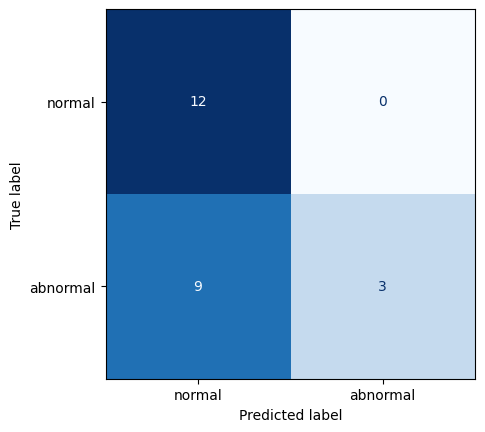

Accuracy %              : 62.5%
Precision score         : 0.25
Recall score            : 1.0
F1 score                : 0.6864
Cross Validation score  : 0.0
Training time           : 0.2054 Seconds




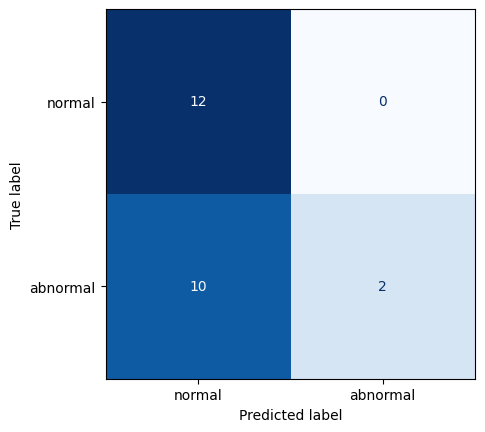

Accuracy %              : 58.3333%
Precision score         : 0.1667
Recall score            : 1.0
F1 score                : 0.6709
Cross Validation score  : 0.0
Training time           : 0.009 Seconds




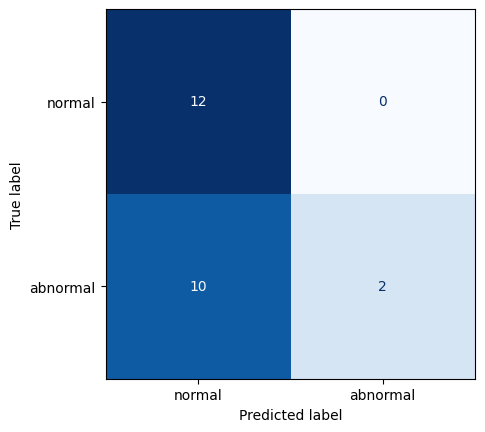

Accuracy %              : 58.3333%
Precision score         : 0.1667
Recall score            : 1.0
F1 score                : 0.6709
Cross Validation score  : 0.0
Training time           : 0.0085 Seconds




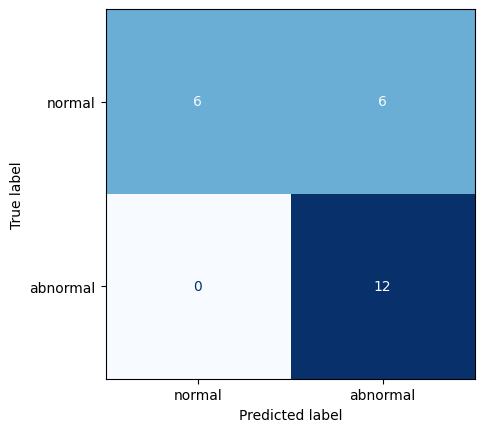

Accuracy %              : 75.0%
Precision score         : 1.0
Recall score            : 0.6667
F1 score                : 0.7667
Cross Validation score  : 0.4933
Training time           : 0.002 Seconds




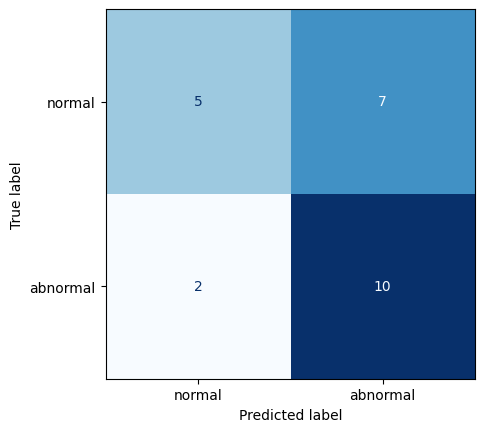

Accuracy %              : 62.5%
Precision score         : 0.8333
Recall score            : 0.5882
F1 score                : 0.642
Cross Validation score  : 0.4808
Training time           : 0.001 Seconds




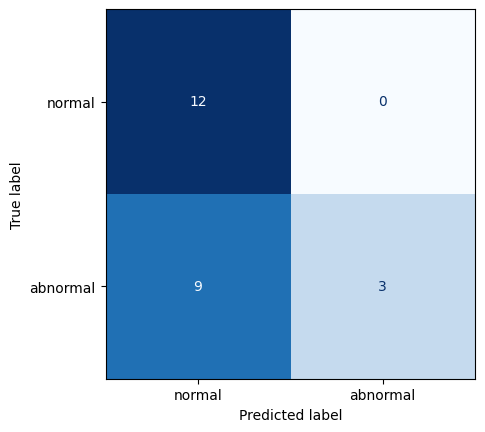

Accuracy %              : 62.5%
Precision score         : 0.25
Recall score            : 1.0
F1 score                : 0.6864
Cross Validation score  : 0.7208
Training time           : 0.001 Seconds




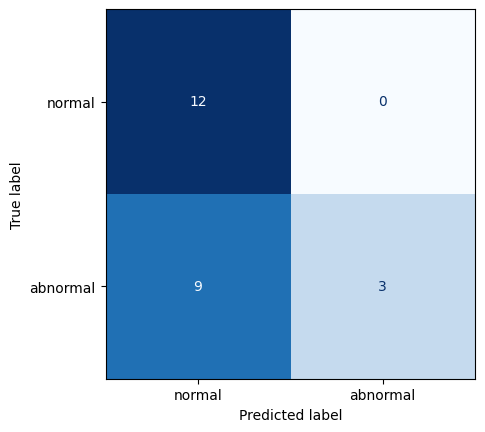

Accuracy %              : 62.5%
Precision score         : 0.25
Recall score            : 1.0
F1 score                : 0.6864
Cross Validation score  : 0.7083
Training time           : 0.0 Seconds




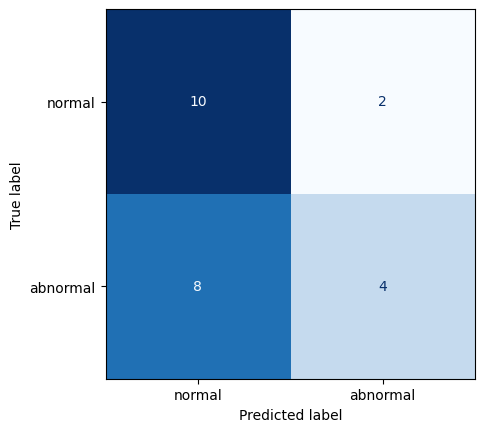

Accuracy %              : 58.3333%
Precision score         : 0.3333
Recall score            : 0.6667
F1 score                : 0.6111
Cross Validation score  : 0.6342
Training time           : 0.002 Seconds




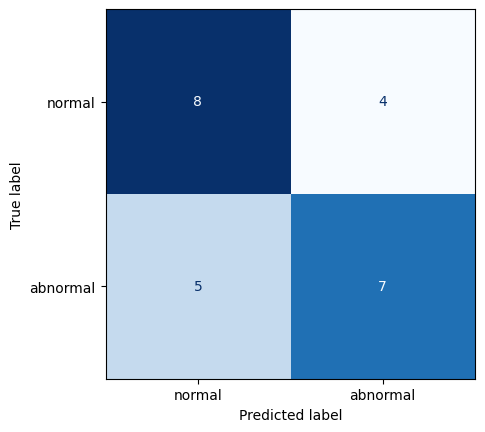

Accuracy %              : 62.5%
Precision score         : 0.5833
Recall score            : 0.6364
F1 score                : 0.6257
Cross Validation score  : 0.6483
Training time           : 0.004 Seconds




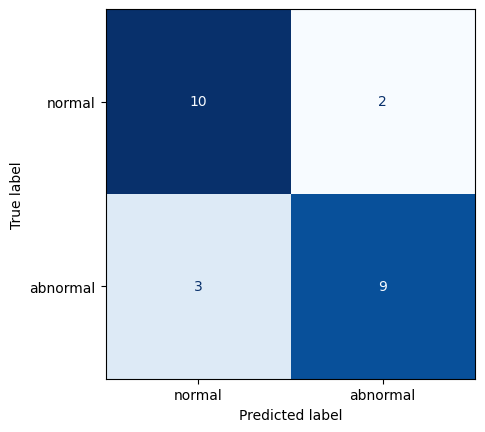

Accuracy %              : 79.1667%
Precision score         : 0.75
Recall score            : 0.8182
F1 score                : 0.792
Cross Validation score  : 0.785
Training time           : 0.001 Seconds




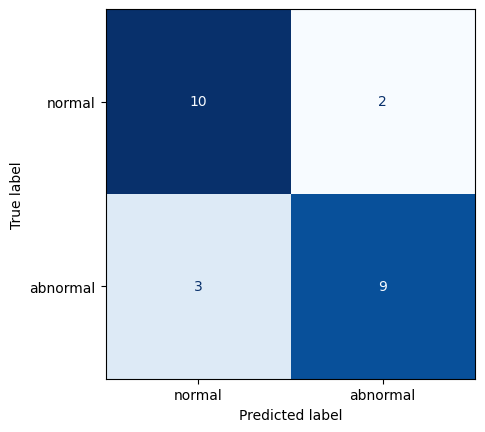

Accuracy %              : 79.1667%
Precision score         : 0.75
Recall score            : 0.8182
F1 score                : 0.792
Cross Validation score  : 0.785
Training time           : 0.001 Seconds




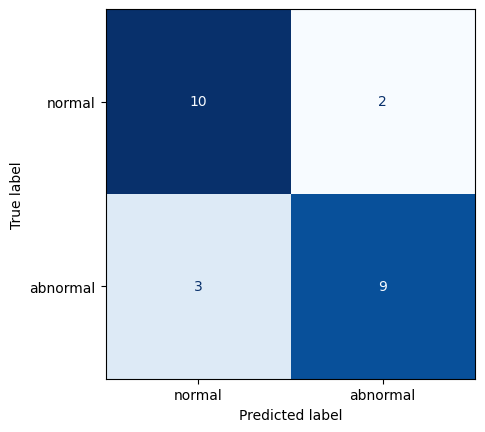

Accuracy %              : 79.1667%
Precision score         : 0.75
Recall score            : 0.8182
F1 score                : 0.792
Cross Validation score  : 0.7983
Training time           : 0.1442 Seconds




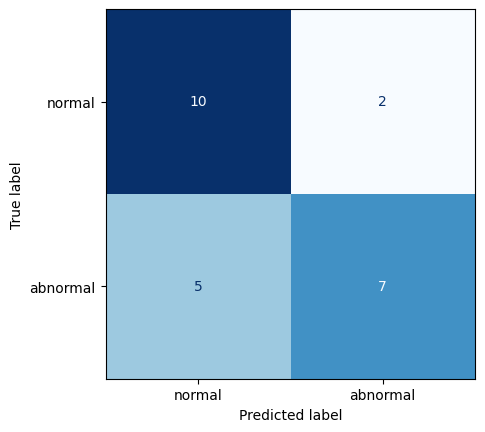

Accuracy %              : 70.8333%
Precision score         : 0.5833
Recall score            : 0.7778
F1 score                : 0.713
Cross Validation score  : 0.8108
Training time           : 0.0666 Seconds




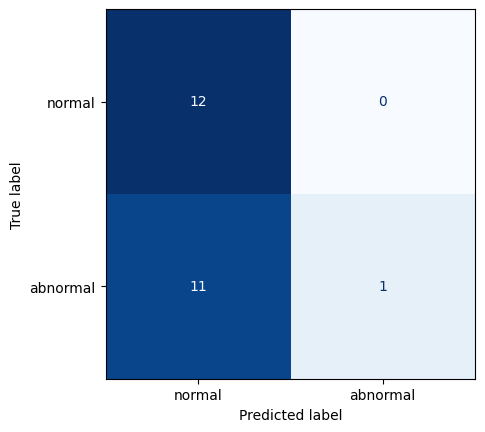

Accuracy %              : 54.1667%
Precision score         : 0.0833
Recall score            : 1.0
F1 score                : 0.6636
Cross Validation score  : 0.0
Training time           : 0.0959 Seconds




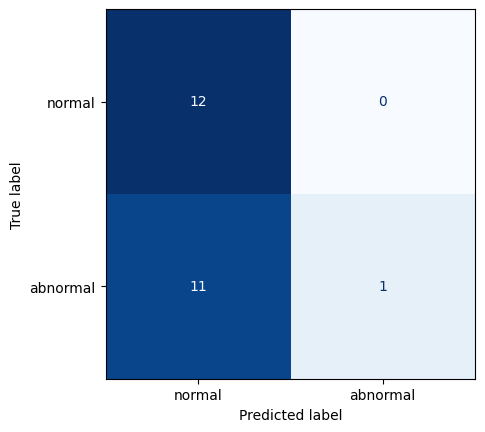

Accuracy %              : 54.1667%
Precision score         : 0.0833
Recall score            : 1.0
F1 score                : 0.6636
Cross Validation score  : 0.0
Training time           : 0.0927 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


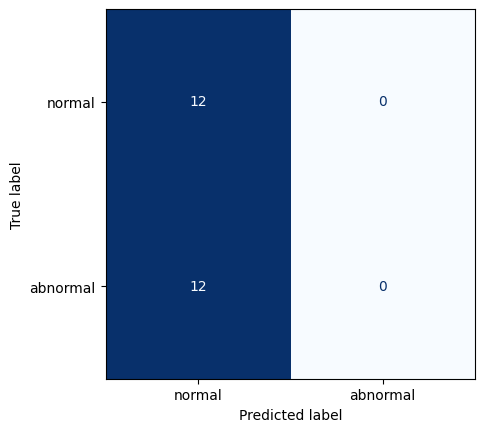

Accuracy %              : 50.0%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.6667
Cross Validation score  : 0.0
Training time           : 0.0227 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


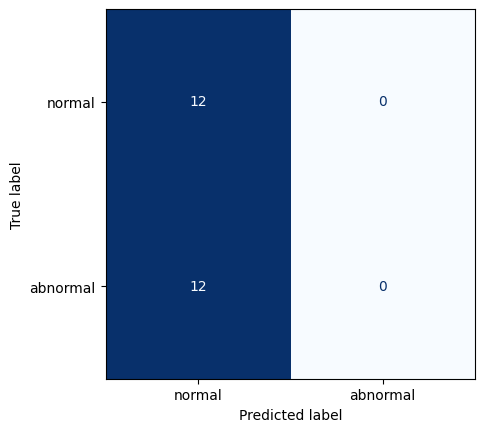

Accuracy %              : 50.0%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.6667
Cross Validation score  : 0.0
Training time           : 0.2121 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


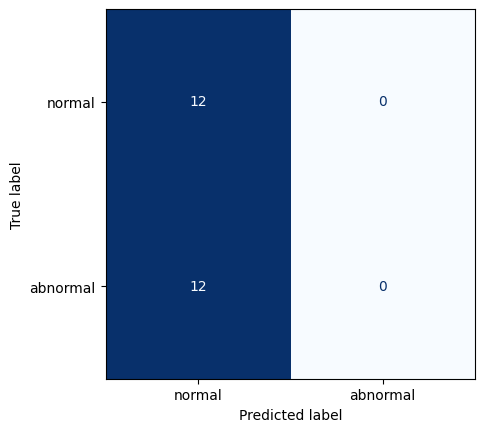

Accuracy %              : 50.0%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.6667
Cross Validation score  : 0.0
Training time           : 0.014 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


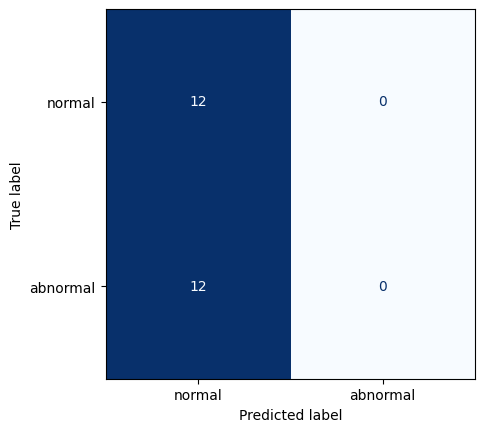

Accuracy %              : 50.0%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.6667
Cross Validation score  : 0.0
Training time           : 0.0169 Seconds




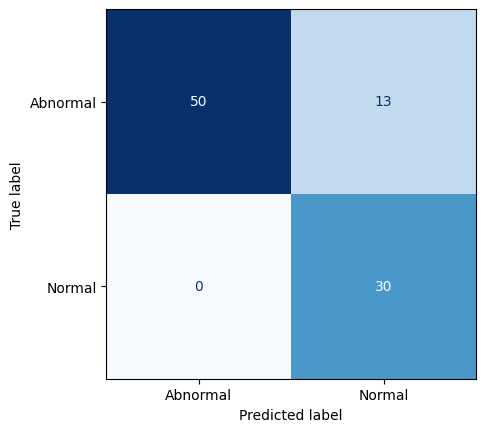

Accuracy %              : 86.0215%
Precision score         : 1.0
Recall score            : 0.6977
F1 score                : 0.8558
Cross Validation score  : 0.7837
Training time           : 0.001 Seconds




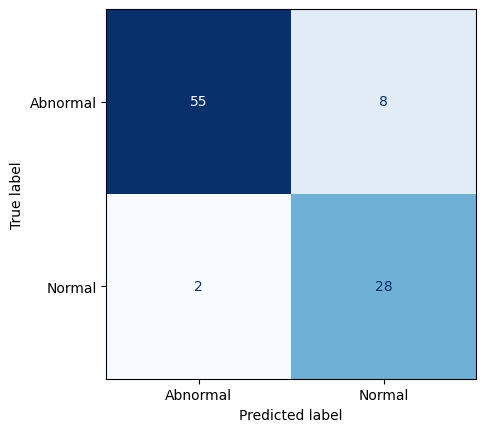

Accuracy %              : 89.2473%
Precision score         : 0.9333
Recall score            : 0.7778
F1 score                : 0.8903
Cross Validation score  : 0.7281
Training time           : 0.001 Seconds




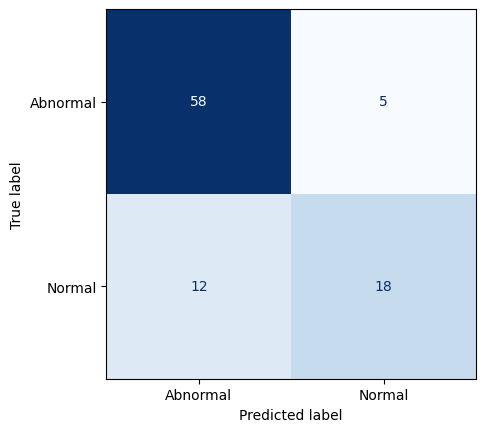

Accuracy %              : 81.7204%
Precision score         : 0.6
Recall score            : 0.7826
F1 score                : 0.8245
Cross Validation score  : 0.7964
Training time           : 0.0011 Seconds




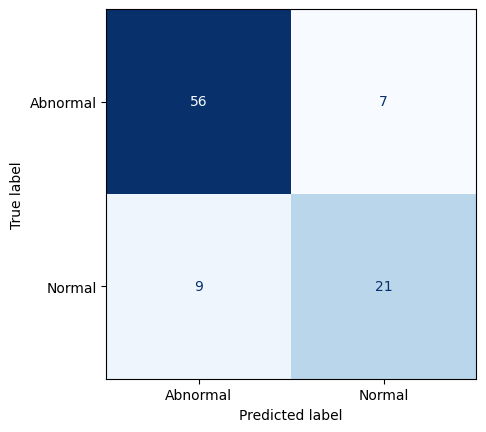

Accuracy %              : 82.7957%
Precision score         : 0.7
Recall score            : 0.75
F1 score                : 0.8296
Cross Validation score  : 0.7962
Training time           : 0.001 Seconds




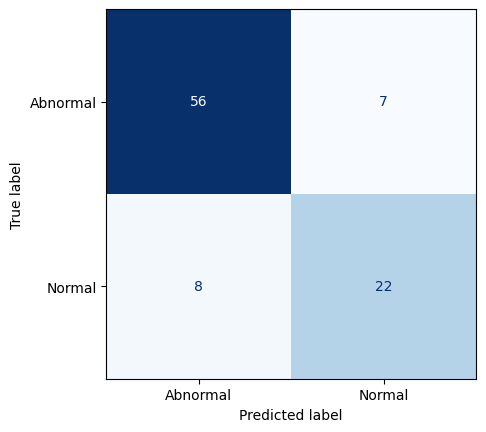

Accuracy %              : 83.871%
Precision score         : 0.7333
Recall score            : 0.7586
F1 score                : 0.8394
Cross Validation score  : 0.7672
Training time           : 0.0009 Seconds




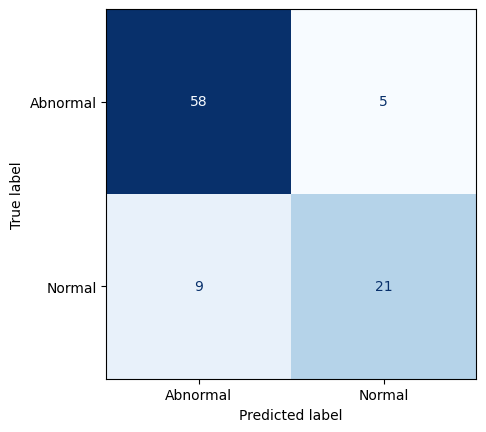

Accuracy %              : 84.9462%
Precision score         : 0.7
Recall score            : 0.8077
F1 score                : 0.8525
Cross Validation score  : 0.7931
Training time           : 0.002 Seconds




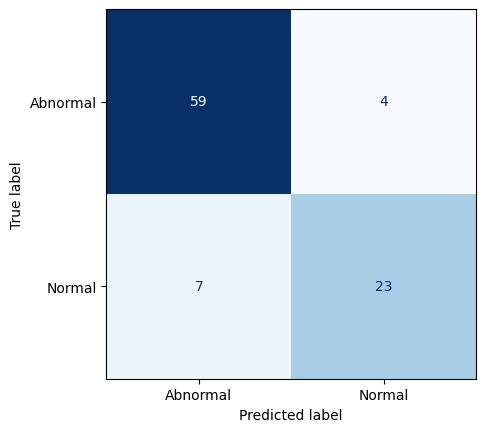

Accuracy %              : 88.172%
Precision score         : 0.7667
Recall score            : 0.8519
F1 score                : 0.8835
Cross Validation score  : 0.7835
Training time           : 0.004 Seconds




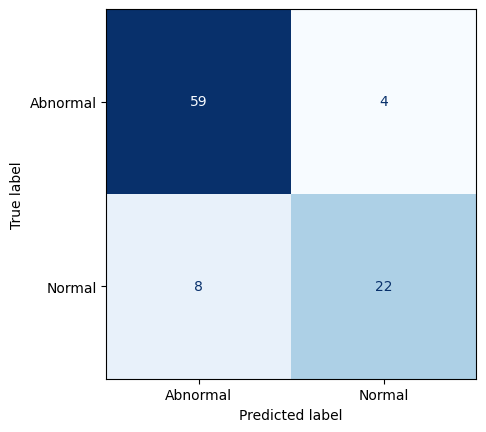

Accuracy %              : 87.0968%
Precision score         : 0.7333
Recall score            : 0.8462
F1 score                : 0.8736
Cross Validation score  : 0.819
Training time           : 0.001 Seconds




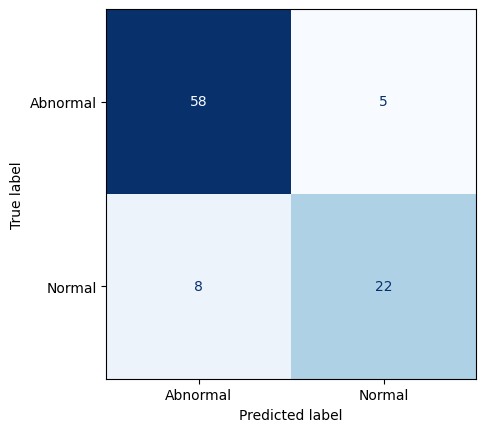

Accuracy %              : 86.0215%
Precision score         : 0.7333
Recall score            : 0.8148
F1 score                : 0.8623
Cross Validation score  : 0.7994
Training time           : 0.1632 Seconds




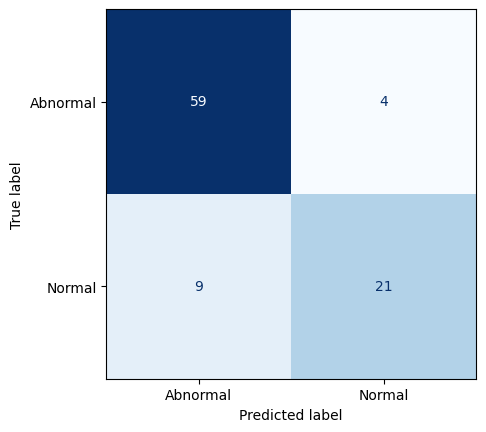

Accuracy %              : 86.0215%
Precision score         : 0.7
Recall score            : 0.84
F1 score                : 0.8639
Cross Validation score  : 0.7995
Training time           : 0.1654 Seconds




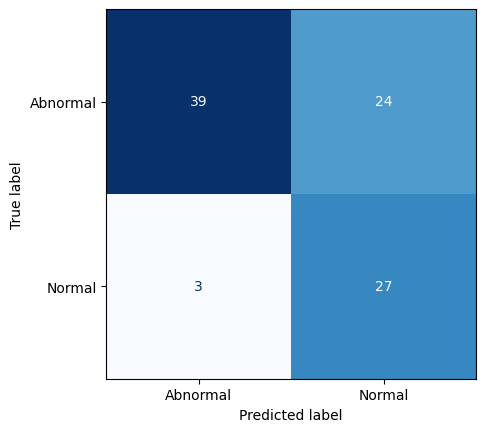

Accuracy %              : 70.9677%
Precision score         : 0.9
Recall score            : 0.5294
F1 score                : 0.7011
Cross Validation score  : 0.0
Training time           : 0.0979 Seconds




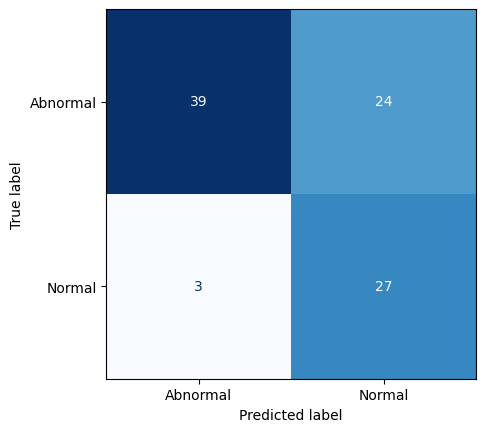

Accuracy %              : 70.9677%
Precision score         : 0.9
Recall score            : 0.5294
F1 score                : 0.7011
Cross Validation score  : 0.0
Training time           : 0.087 Seconds




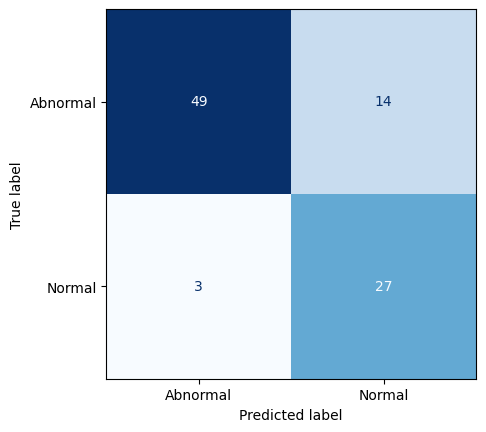

Accuracy %              : 81.7204%
Precision score         : 0.9
Recall score            : 0.6585
F1 score                : 0.8118
Cross Validation score  : 0.0
Training time           : 0.1095 Seconds




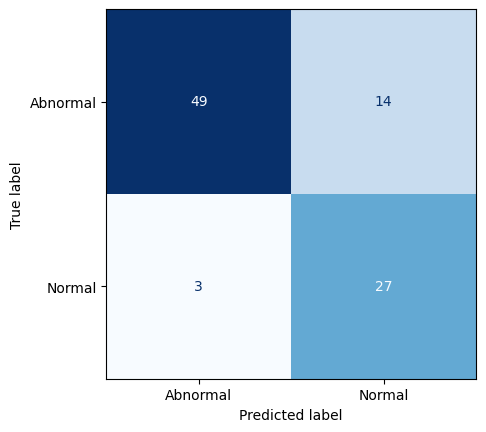

Accuracy %              : 81.7204%
Precision score         : 0.9
Recall score            : 0.6585
F1 score                : 0.8118
Cross Validation score  : 0.0
Training time           : 1.4796 Seconds




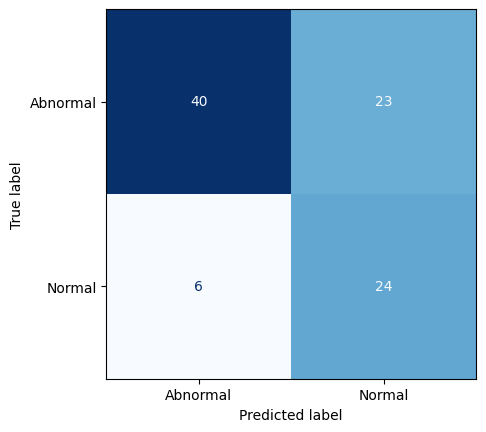

Accuracy %              : 68.8172%
Precision score         : 0.8
Recall score            : 0.5106
F1 score                : 0.6781
Cross Validation score  : 0.0
Training time           : 0.017 Seconds




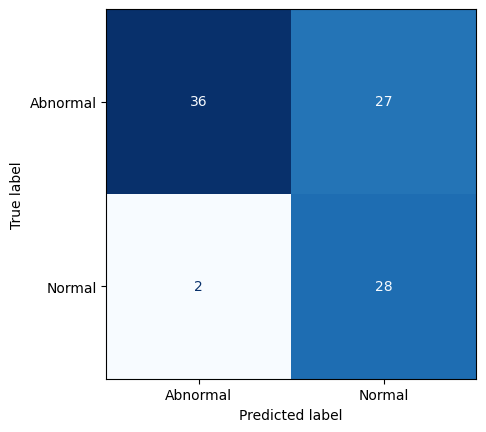

Accuracy %              : 68.8172%
Precision score         : 0.9333
Recall score            : 0.5091
F1 score                : 0.6809
Cross Validation score  : 0.0
Training time           : 0.0261 Seconds




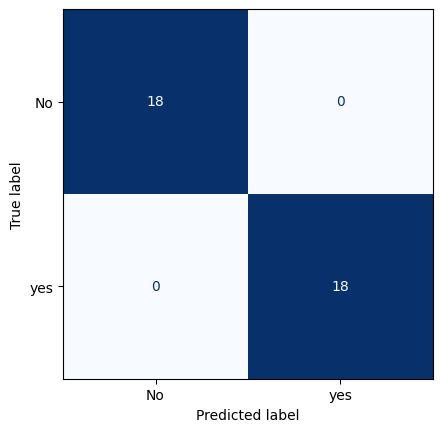

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




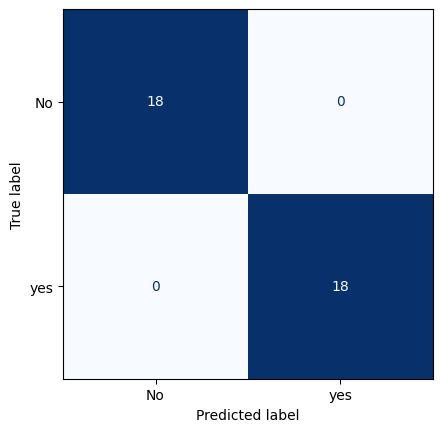

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9917
Training time           : 0.001 Seconds




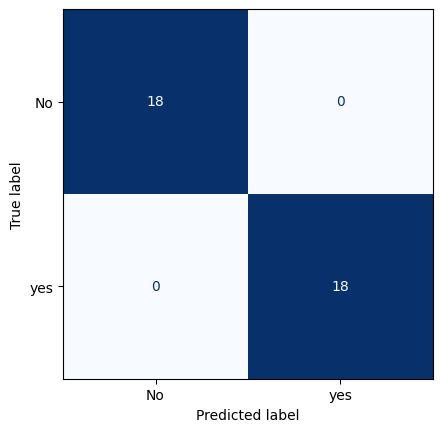

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




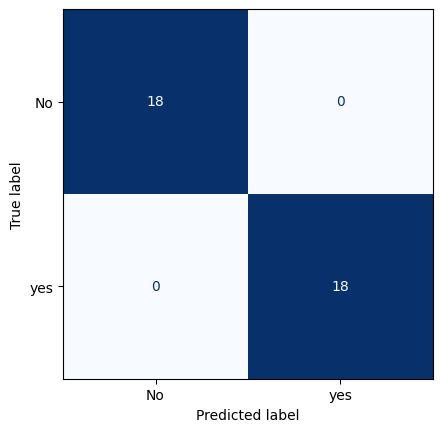

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.4917
Training time           : 0.001 Seconds




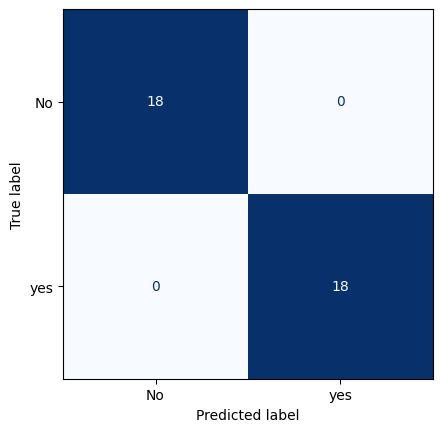

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.1289 Seconds




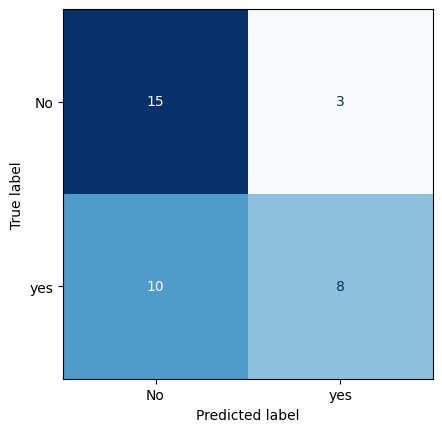

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.0935 Seconds




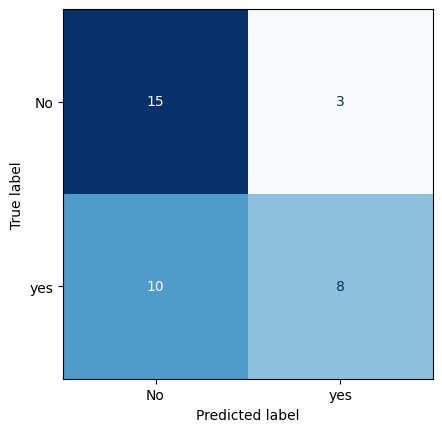

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.09 Seconds




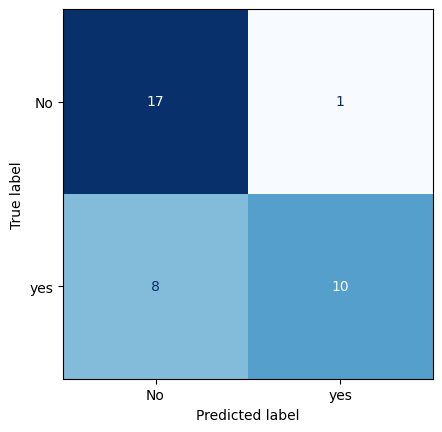

Accuracy %              : 75.0%
Precision score         : 0.5556
Recall score            : 0.9091
F1 score                : 0.7598
Cross Validation score  : 0.0
Training time           : 0.0635 Seconds




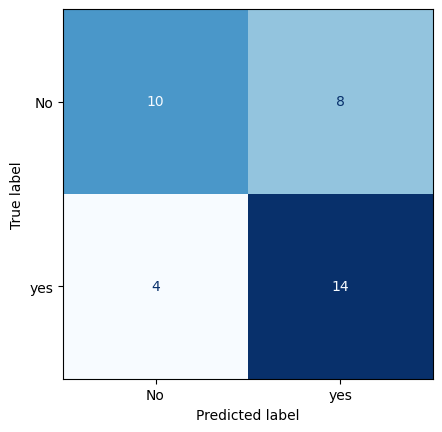

Accuracy %              : 66.6667%
Precision score         : 0.7778
Recall score            : 0.6364
F1 score                : 0.6708
Cross Validation score  : 0.0
Training time           : 0.1769 Seconds




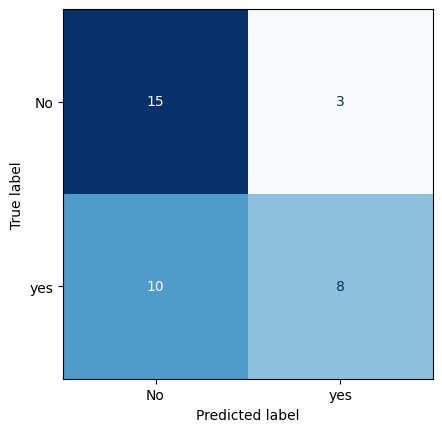

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.0085 Seconds




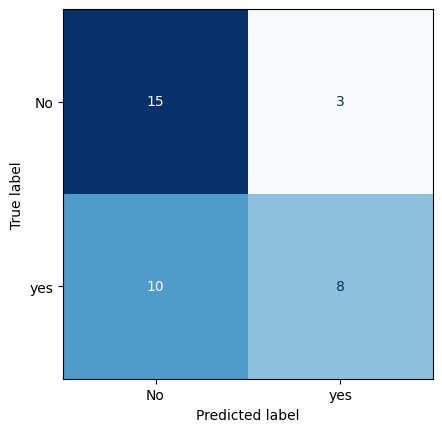

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.01 Seconds




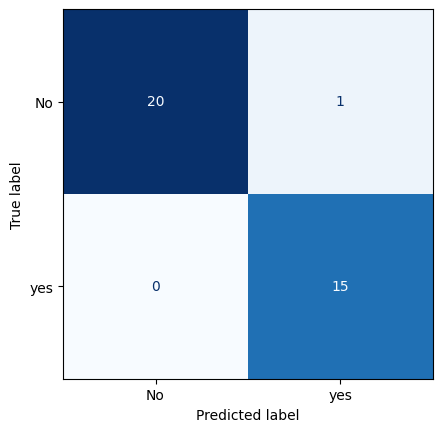

Accuracy %              : 97.2222%
Precision score         : 1.0
Recall score            : 0.9375
F1 score                : 0.9721
Cross Validation score  : 1.0
Training time           : 0.002 Seconds




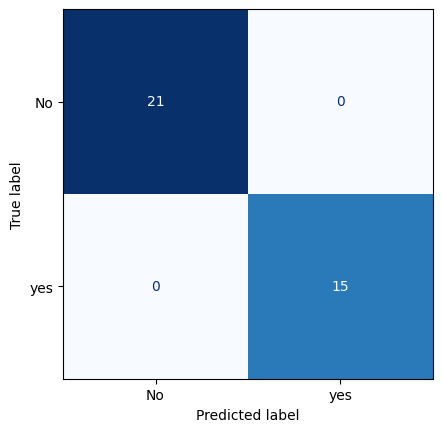

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.875
Training time           : 0.001 Seconds




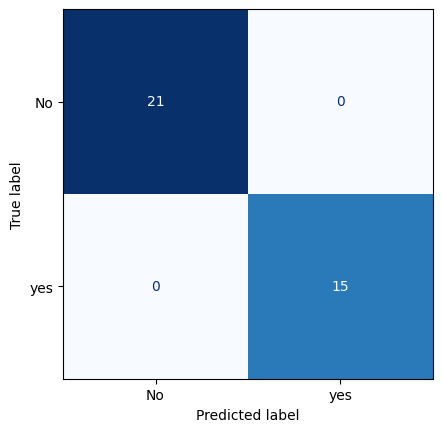

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.8583
Training time           : 0.0011 Seconds




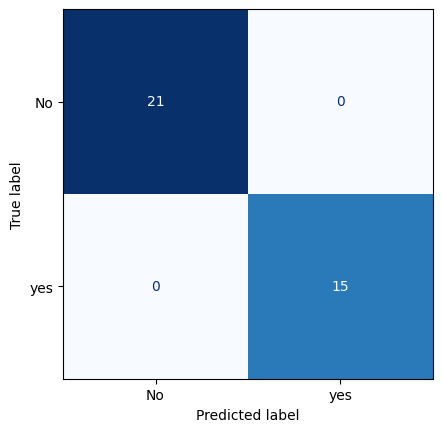

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.5833
Training time           : 0.001 Seconds




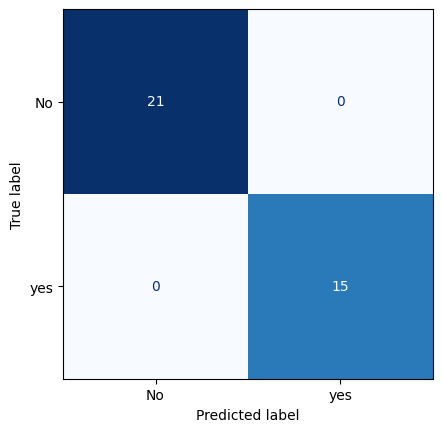

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.1291 Seconds




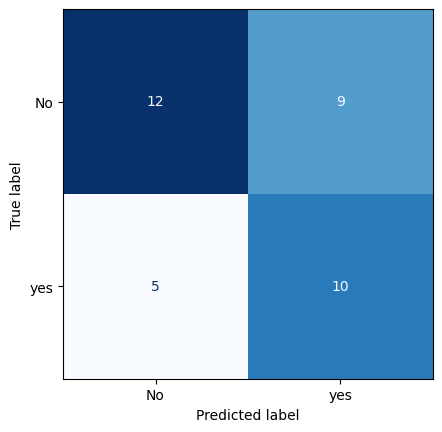

Accuracy %              : 61.1111%
Precision score         : 0.6667
Recall score            : 0.5263
F1 score                : 0.6087
Cross Validation score  : 0.0
Training time           : 0.0956 Seconds




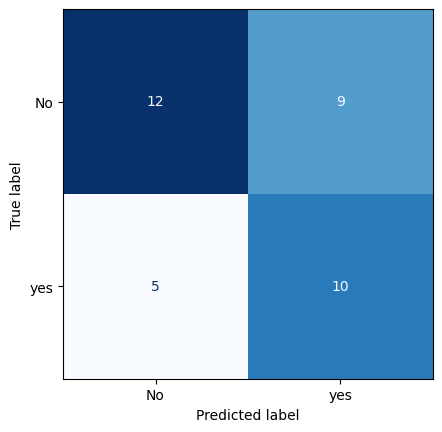

Accuracy %              : 61.1111%
Precision score         : 0.6667
Recall score            : 0.5263
F1 score                : 0.6087
Cross Validation score  : 0.0
Training time           : 0.0896 Seconds




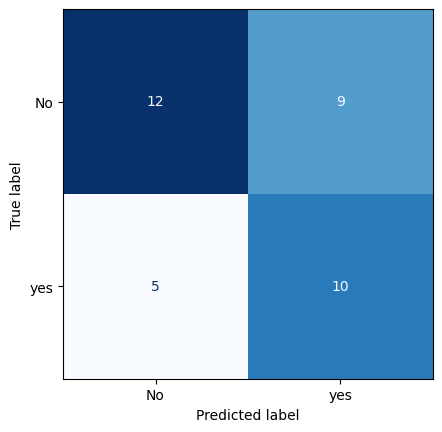

Accuracy %              : 61.1111%
Precision score         : 0.6667
Recall score            : 0.5263
F1 score                : 0.6087
Cross Validation score  : 0.0
Training time           : 0.0214 Seconds




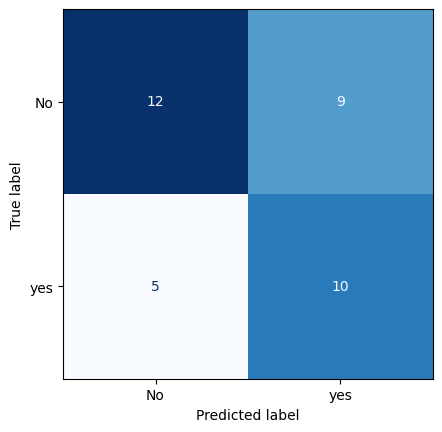

Accuracy %              : 61.1111%
Precision score         : 0.6667
Recall score            : 0.5263
F1 score                : 0.6087
Cross Validation score  : 0.0
Training time           : 0.1756 Seconds




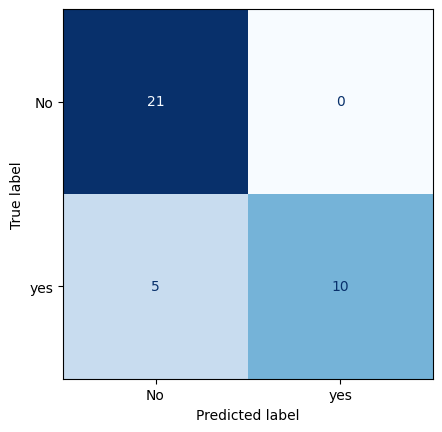

Accuracy %              : 86.1111%
Precision score         : 0.6667
Recall score            : 1.0
F1 score                : 0.8676
Cross Validation score  : 0.0
Training time           : 0.0094 Seconds




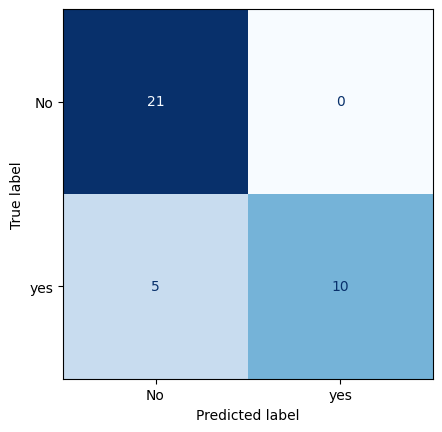

Accuracy %              : 86.1111%
Precision score         : 0.6667
Recall score            : 1.0
F1 score                : 0.8676
Cross Validation score  : 0.0
Training time           : 0.011 Seconds




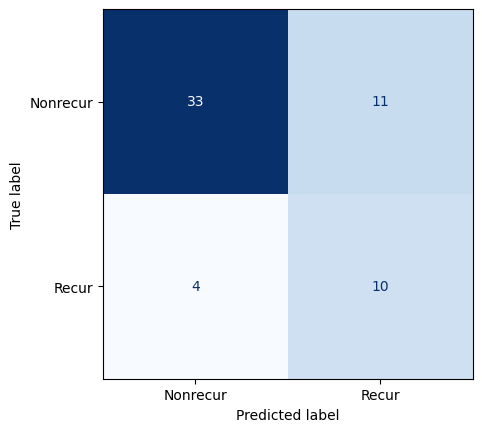

Accuracy %              : 74.1379%
Precision score         : 0.7143
Recall score            : 0.4762
F1 score                : 0.7267
Cross Validation score  : 0.5067
Training time           : 0.002 Seconds




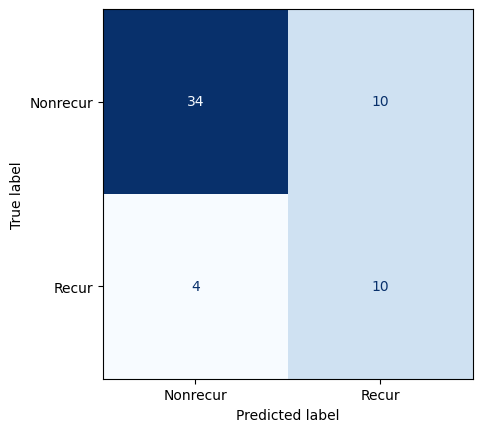

Accuracy %              : 75.8621%
Precision score         : 0.7143
Recall score            : 0.5
F1 score                : 0.7462
Cross Validation score  : 0.5067
Training time           : 0.0011 Seconds




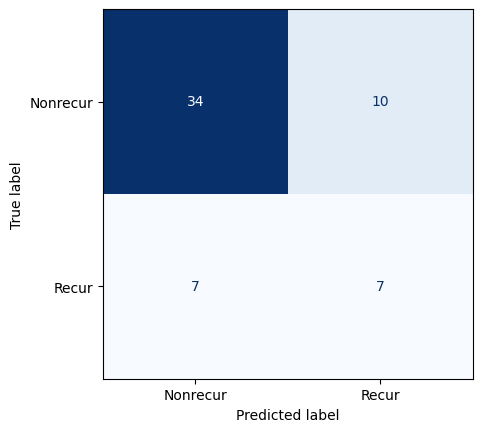

Accuracy %              : 70.6897%
Precision score         : 0.5
Recall score            : 0.4118
F1 score                : 0.6979
Cross Validation score  : 0.7194
Training time           : 0.001 Seconds




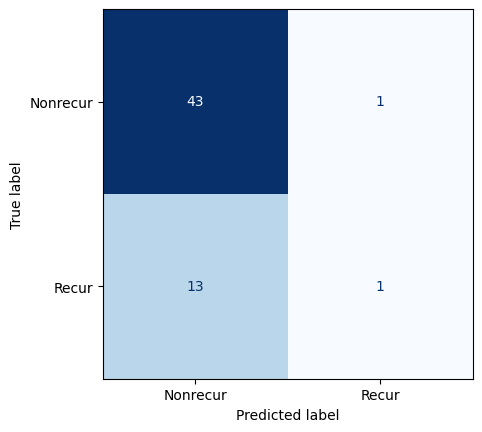

Accuracy %              : 75.8621%
Precision score         : 0.0714
Recall score            : 0.5
F1 score                : 0.8347
Cross Validation score  : 0.7043
Training time           : 0.0009 Seconds




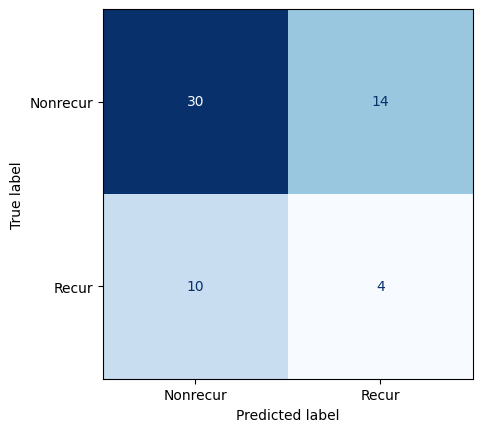

Accuracy %              : 58.6207%
Precision score         : 0.2857
Recall score            : 0.2222
F1 score                : 0.5702
Cross Validation score  : 0.673
Training time           : 0.004 Seconds




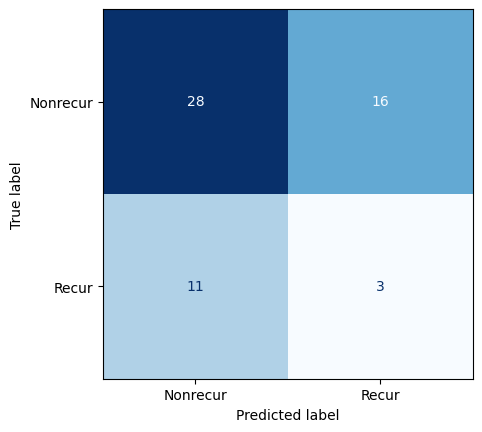

Accuracy %              : 53.4483%
Precision score         : 0.2143
Recall score            : 0.1579
F1 score                : 0.5132
Cross Validation score  : 0.715
Training time           : 0.002 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


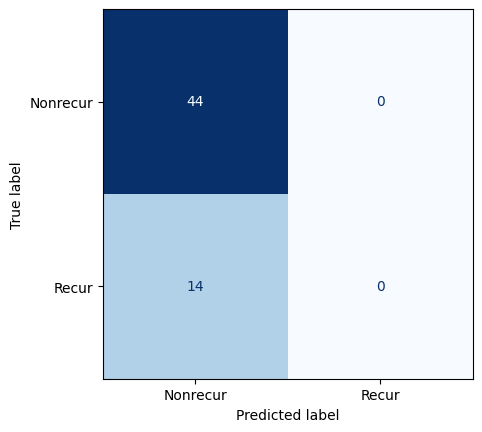

Accuracy %              : 75.8621%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8627
Cross Validation score  : 0.7617
Training time           : 0.001 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


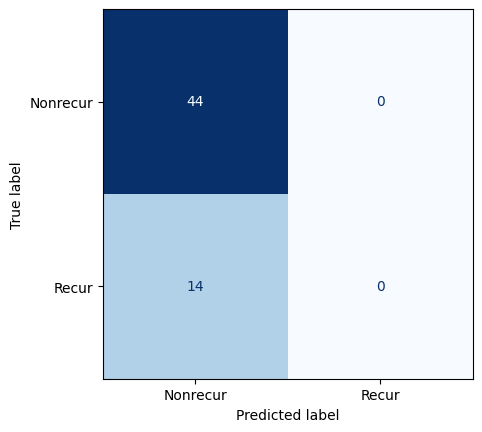

Accuracy %              : 75.8621%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8627
Cross Validation score  : 0.7617
Training time           : 0.001 Seconds




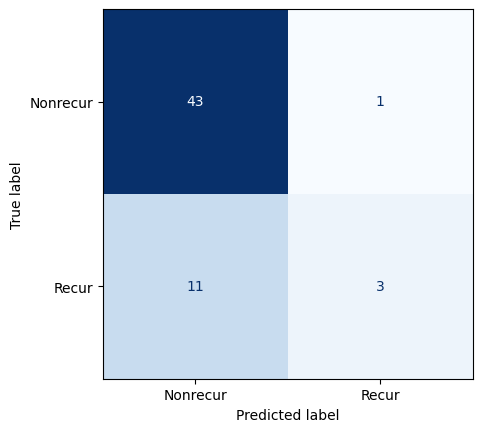

Accuracy %              : 79.3103%
Precision score         : 0.2143
Recall score            : 0.75
F1 score                : 0.84
Cross Validation score  : 0.7665
Training time           : 0.1623 Seconds




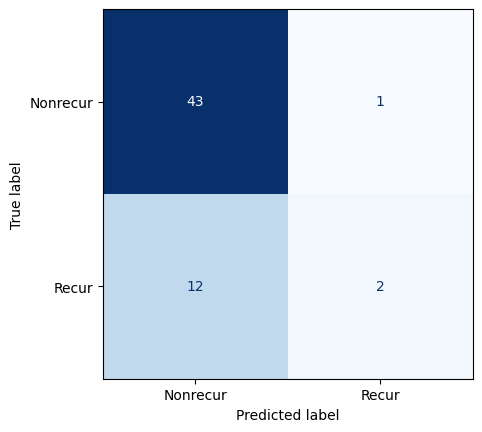

Accuracy %              : 77.5862%
Precision score         : 0.1429
Recall score            : 0.6667
F1 score                : 0.8359
Cross Validation score  : 0.756
Training time           : 0.0811 Seconds




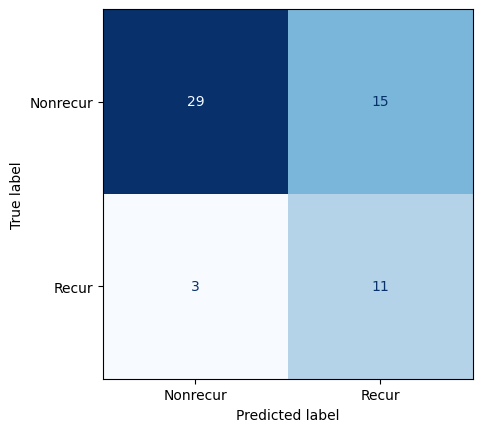

Accuracy %              : 68.9655%
Precision score         : 0.7857
Recall score            : 0.4231
F1 score                : 0.6676
Cross Validation score  : 0.0
Training time           : 0.09 Seconds




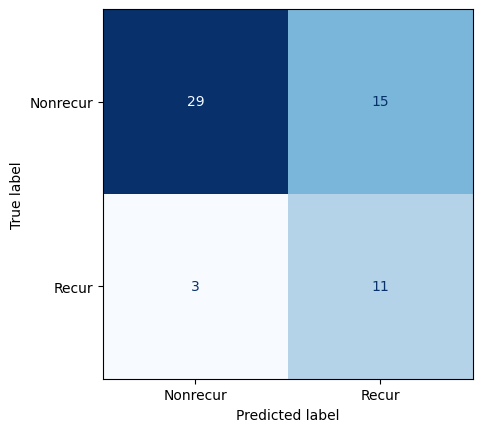

Accuracy %              : 68.9655%
Precision score         : 0.7857
Recall score            : 0.4231
F1 score                : 0.6676
Cross Validation score  : 0.0
Training time           : 0.0873 Seconds




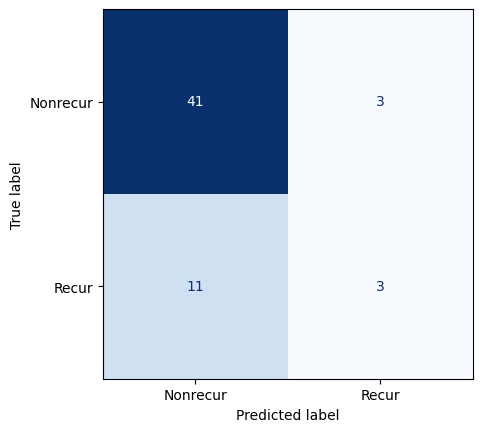

Accuracy %              : 75.8621%
Precision score         : 0.2143
Recall score            : 0.5
F1 score                : 0.7968
Cross Validation score  : 0.0
Training time           : 0.0301 Seconds




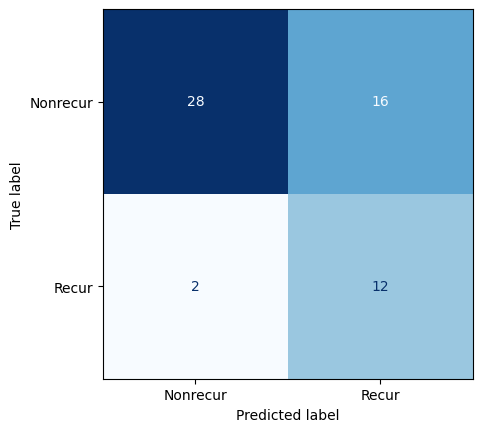

Accuracy %              : 68.9655%
Precision score         : 0.8571
Recall score            : 0.4286
F1 score                : 0.6673
Cross Validation score  : 0.0
Training time           : 0.0296 Seconds




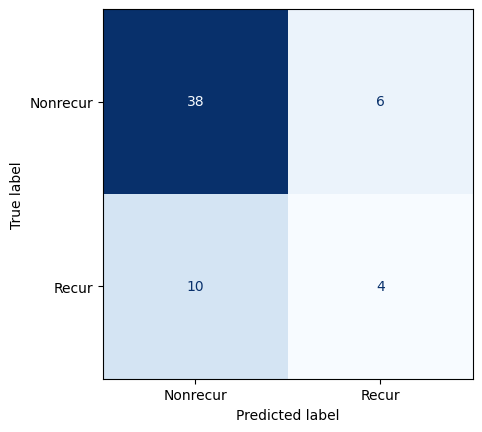

Accuracy %              : 72.4138%
Precision score         : 0.2857
Recall score            : 0.4
F1 score                : 0.7411
Cross Validation score  : 0.0
Training time           : 0.0193 Seconds




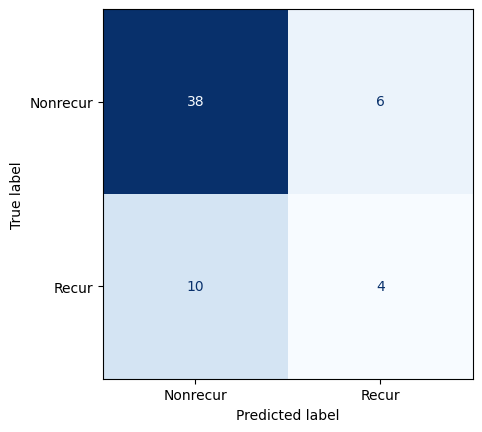

Accuracy %              : 72.4138%
Precision score         : 0.2857
Recall score            : 0.4
F1 score                : 0.7411
Cross Validation score  : 0.0
Training time           : 0.0221 Seconds




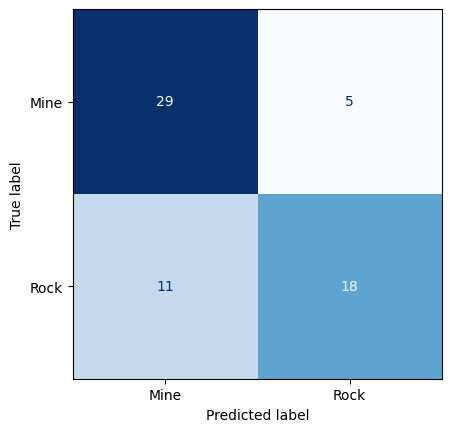

Accuracy %              : 74.6032%
Precision score         : 0.6207
Recall score            : 0.7826
F1 score                : 0.7504
Cross Validation score  : 0.5761
Training time           : 0.002 Seconds




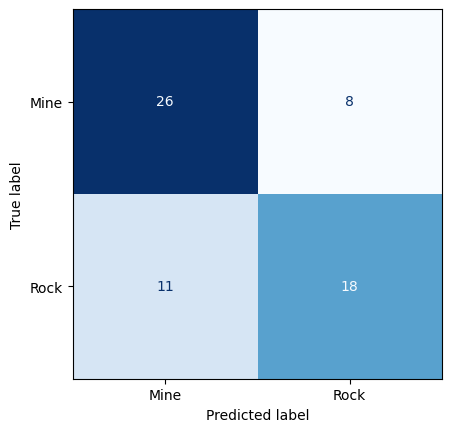

Accuracy %              : 69.8413%
Precision score         : 0.6207
Recall score            : 0.6923
F1 score                : 0.7003
Cross Validation score  : 0.6096
Training time           : 0.002 Seconds




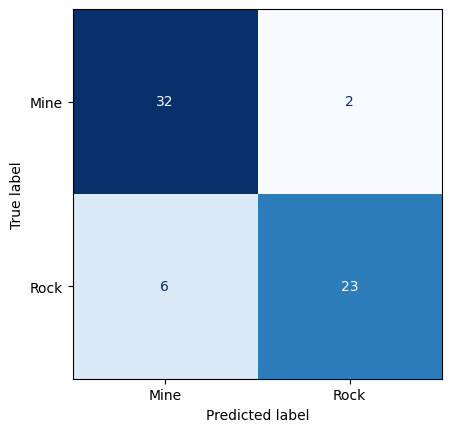

Accuracy %              : 87.3016%
Precision score         : 0.7931
Recall score            : 0.92
F1 score                : 0.8742
Cross Validation score  : 0.5304
Training time           : 0.001 Seconds




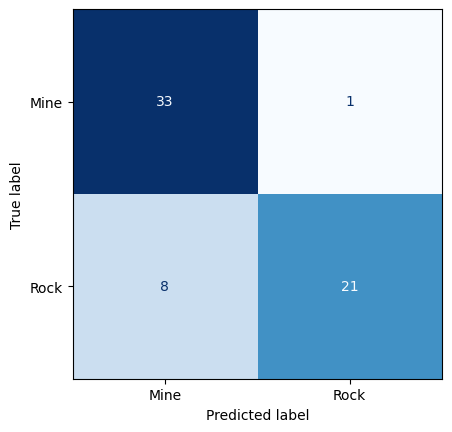

Accuracy %              : 85.7143%
Precision score         : 0.7241
Recall score            : 0.9545
F1 score                : 0.8603
Cross Validation score  : 0.5696
Training time           : 0.001 Seconds




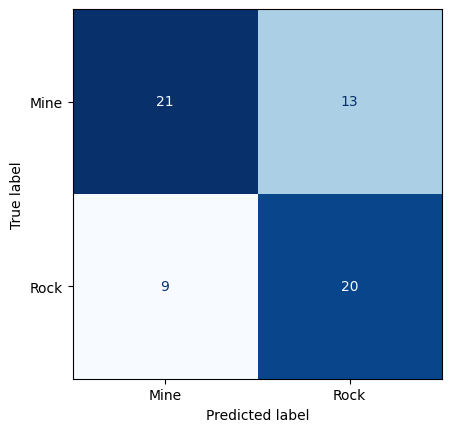

Accuracy %              : 65.0794%
Precision score         : 0.6897
Recall score            : 0.6061
F1 score                : 0.6504
Cross Validation score  : 0.6528
Training time           : 0.0057 Seconds




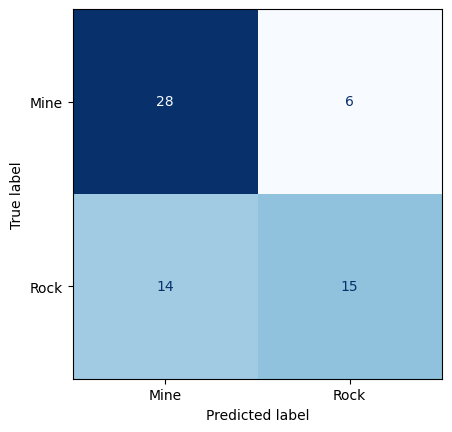

Accuracy %              : 68.254%
Precision score         : 0.5172
Recall score            : 0.7143
F1 score                : 0.6912
Cross Validation score  : 0.5945
Training time           : 0.0011 Seconds




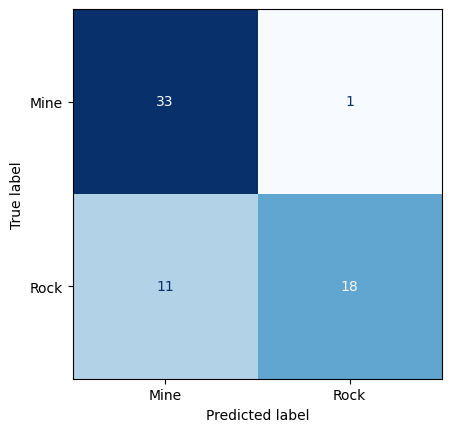

Accuracy %              : 80.9524%
Precision score         : 0.6207
Recall score            : 0.9474
F1 score                : 0.8172
Cross Validation score  : 0.5551
Training time           : 0.002 Seconds




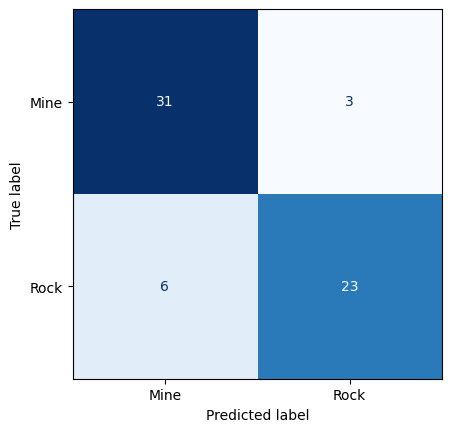

Accuracy %              : 85.7143%
Precision score         : 0.7931
Recall score            : 0.8846
F1 score                : 0.858
Cross Validation score  : 0.6331
Training time           : 0.003 Seconds




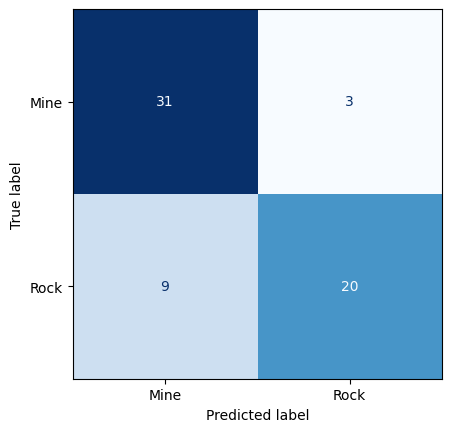

Accuracy %              : 80.9524%
Precision score         : 0.6897
Recall score            : 0.8696
F1 score                : 0.8128
Cross Validation score  : 0.7294
Training time           : 0.1674 Seconds




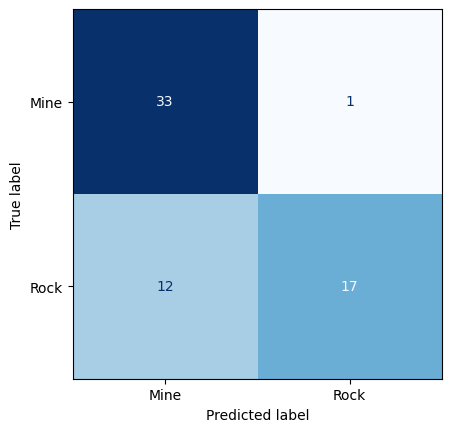

Accuracy %              : 79.3651%
Precision score         : 0.5862
Recall score            : 0.9444
F1 score                : 0.8034
Cross Validation score  : 0.7008
Training time           : 0.0857 Seconds




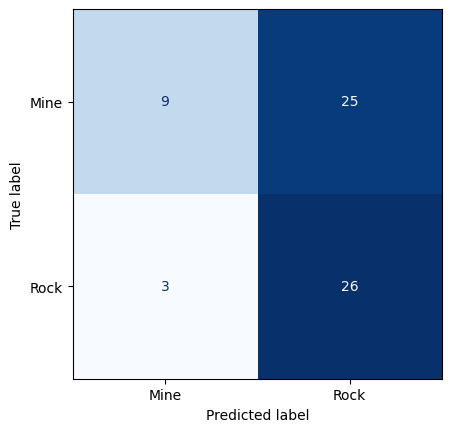

Accuracy %              : 55.5556%
Precision score         : 0.8966
Recall score            : 0.5098
F1 score                : 0.6007
Cross Validation score  : 0.0
Training time           : 0.0926 Seconds




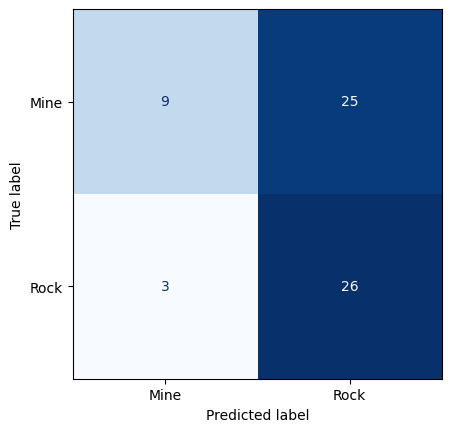

Accuracy %              : 55.5556%
Precision score         : 0.8966
Recall score            : 0.5098
F1 score                : 0.6007
Cross Validation score  : 0.0
Training time           : 0.0881 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


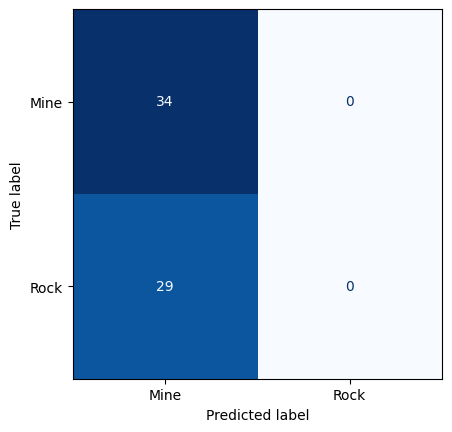

Accuracy %              : 53.9683%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.701
Cross Validation score  : 0.0
Training time           : 0.0335 Seconds




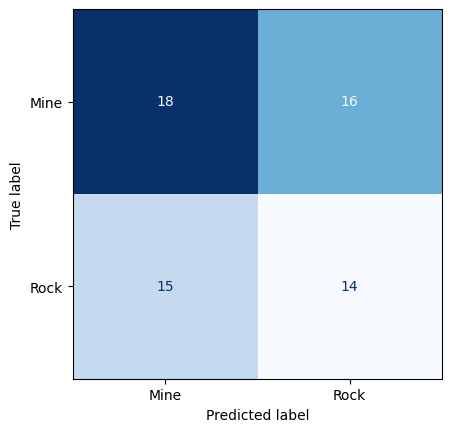

Accuracy %              : 50.7937%
Precision score         : 0.4828
Recall score            : 0.4667
F1 score                : 0.5074
Cross Validation score  : 0.0
Training time           : 0.0165 Seconds




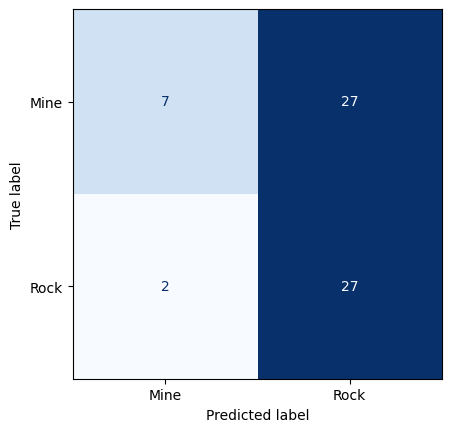

Accuracy %              : 53.9683%
Precision score         : 0.931
Recall score            : 0.5
F1 score                : 0.6042
Cross Validation score  : 0.0
Training time           : 0.0189 Seconds




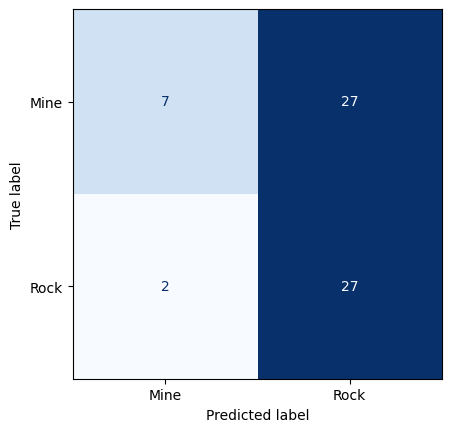

Accuracy %              : 53.9683%
Precision score         : 0.931
Recall score            : 0.5
F1 score                : 0.6042
Cross Validation score  : 0.0
Training time           : 0.0255 Seconds




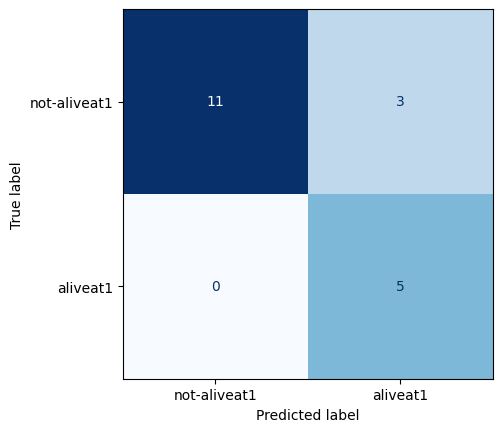

Accuracy %              : 84.2105%
Precision score         : 1.0
Recall score            : 0.625
F1 score                : 0.8334
Cross Validation score  : 0.9846
Training time           : 0.002 Seconds




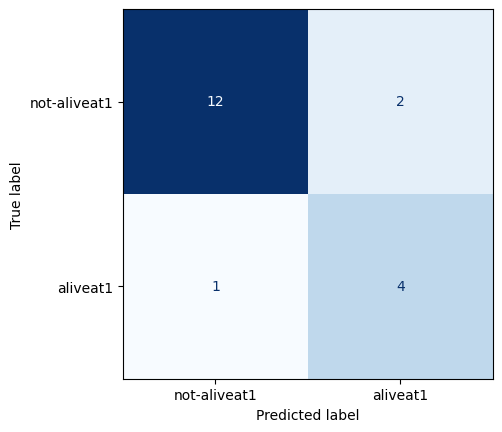

Accuracy %              : 84.2105%
Precision score         : 0.8
Recall score            : 0.6667
F1 score                : 0.8379
Cross Validation score  : 0.8551
Training time           : 0.0 Seconds




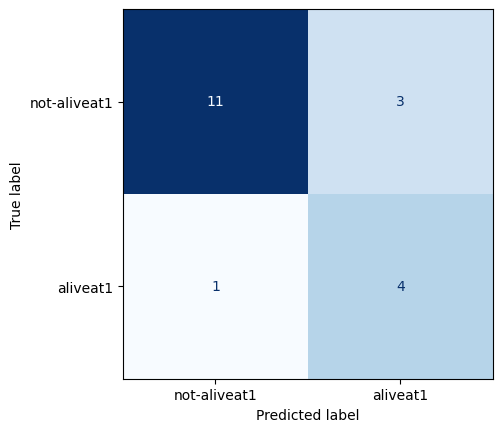

Accuracy %              : 78.9474%
Precision score         : 0.8
Recall score            : 0.5714
F1 score                : 0.78
Cross Validation score  : 1.0
Training time           : 0.0 Seconds




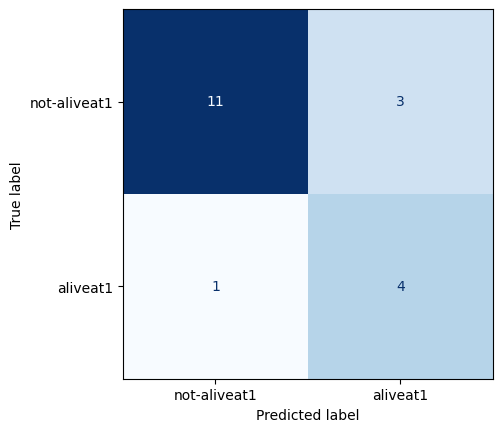

Accuracy %              : 78.9474%
Precision score         : 0.8
Recall score            : 0.5714
F1 score                : 0.78
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




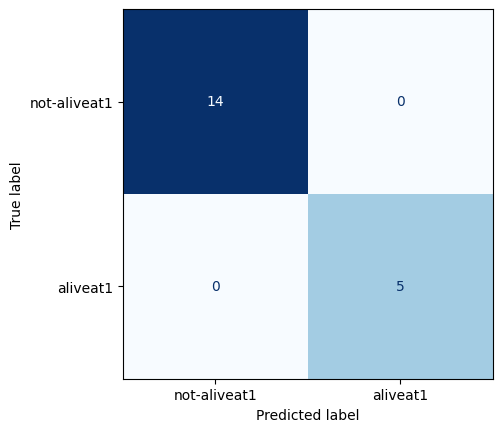

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9513
Training time           : 0.001 Seconds




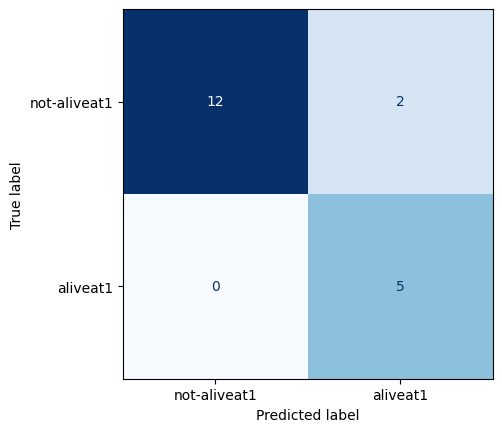

Accuracy %              : 89.4737%
Precision score         : 1.0
Recall score            : 0.7143
F1 score                : 0.89
Cross Validation score  : 0.9526
Training time           : 0.001 Seconds




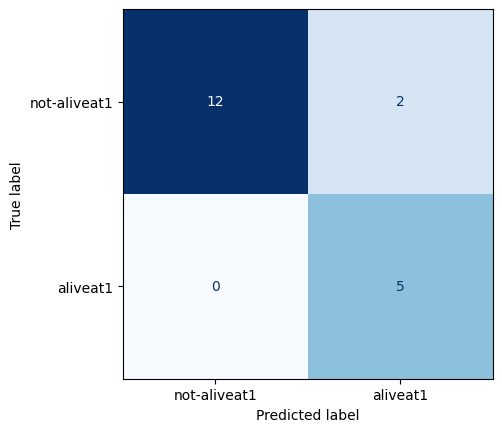

Accuracy %              : 89.4737%
Precision score         : 1.0
Recall score            : 0.7143
F1 score                : 0.89
Cross Validation score  : 0.9526
Training time           : 0.001 Seconds




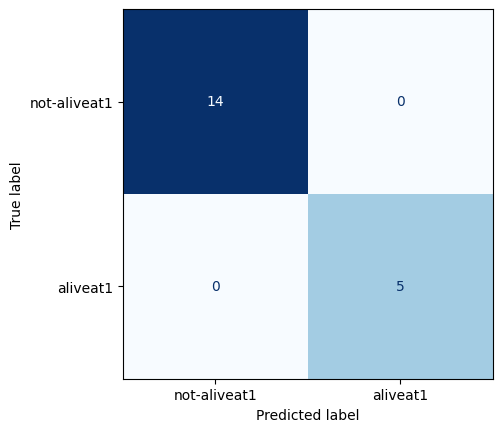

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9846
Training time           : 0.1225 Seconds




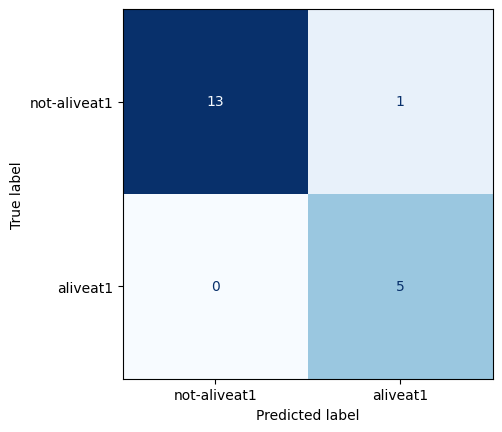

Accuracy %              : 94.7368%
Precision score         : 1.0
Recall score            : 0.8333
F1 score                : 0.946
Cross Validation score  : 0.0
Training time           : 0.0886 Seconds




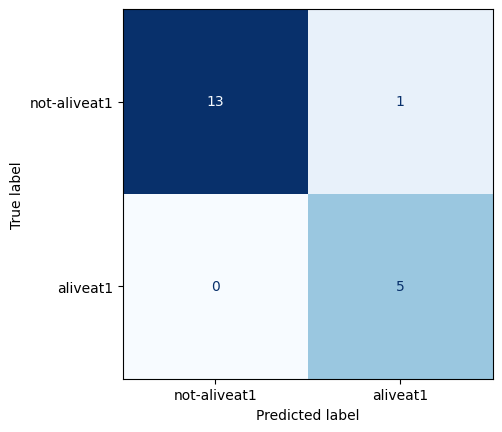

Accuracy %              : 94.7368%
Precision score         : 1.0
Recall score            : 0.8333
F1 score                : 0.946
Cross Validation score  : 0.0
Training time           : 0.0861 Seconds




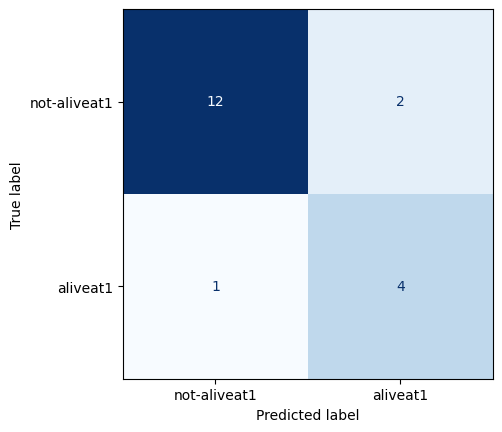

Accuracy %              : 84.2105%
Precision score         : 0.8
Recall score            : 0.6667
F1 score                : 0.8379
Cross Validation score  : 0.0
Training time           : 0.0231 Seconds




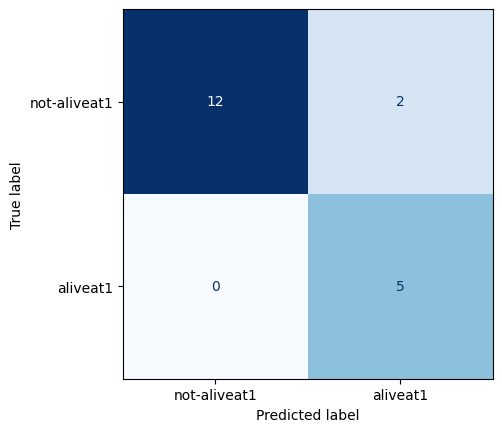

Accuracy %              : 89.4737%
Precision score         : 1.0
Recall score            : 0.7143
F1 score                : 0.89
Cross Validation score  : 0.0
Training time           : 0.02 Seconds




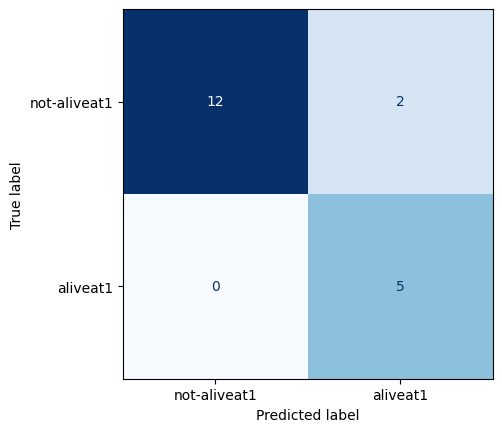

Accuracy %              : 89.4737%
Precision score         : 1.0
Recall score            : 0.7143
F1 score                : 0.89
Cross Validation score  : 0.0
Training time           : 0.0071 Seconds




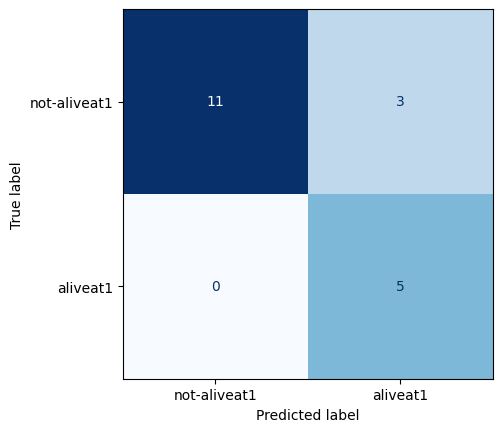

Accuracy %              : 84.2105%
Precision score         : 1.0
Recall score            : 0.625
F1 score                : 0.8334
Cross Validation score  : 0.0
Training time           : 0.0141 Seconds




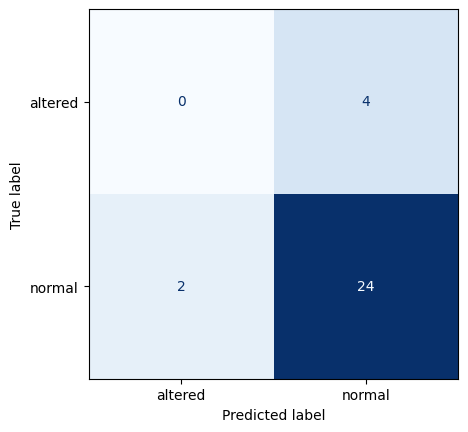

Accuracy %              : 80.0%
Precision score         : 0.9231
Recall score            : 0.8571
F1 score                : 0.8296
Cross Validation score  : 0.57
Training time           : 0.002 Seconds




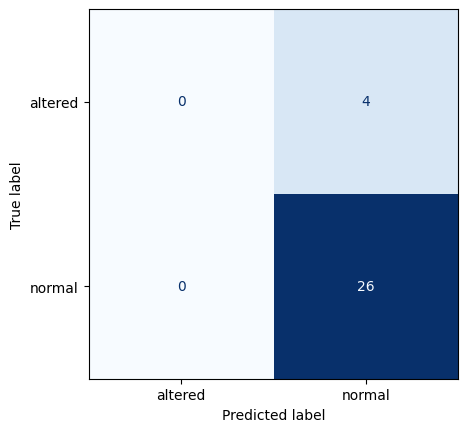

Accuracy %              : 86.6667%
Precision score         : 1.0
Recall score            : 0.8667
F1 score                : 0.9286
Cross Validation score  : 0.68
Training time           : 0.0 Seconds




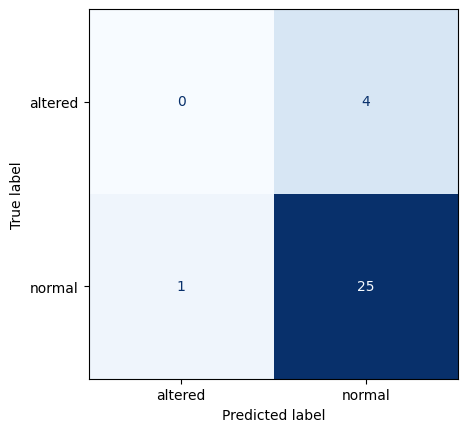

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.82
Training time           : 0.001 Seconds




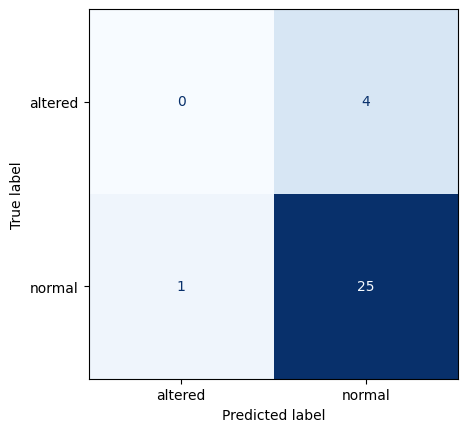

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.82
Training time           : 0.0 Seconds




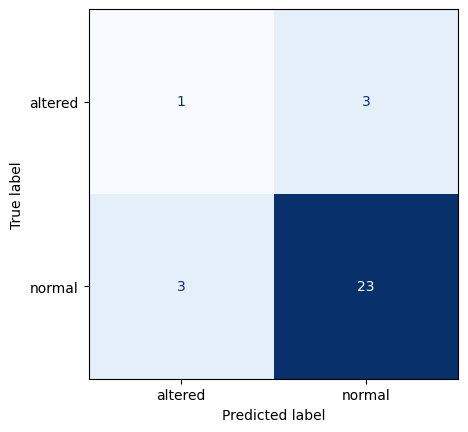

Accuracy %              : 80.0%
Precision score         : 0.8846
Recall score            : 0.8846
F1 score                : 0.8
Cross Validation score  : 0.73
Training time           : 0.001 Seconds




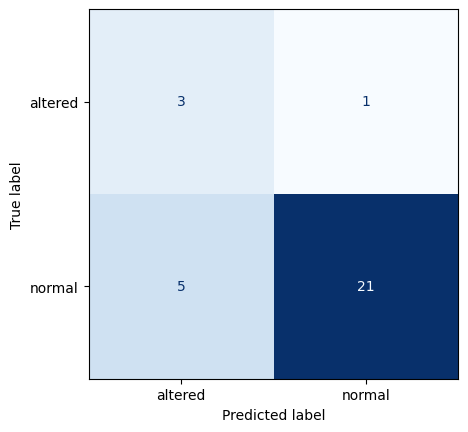

Accuracy %              : 80.0%
Precision score         : 0.8077
Recall score            : 0.9545
F1 score                : 0.775
Cross Validation score  : 0.77
Training time           : 0.0 Seconds




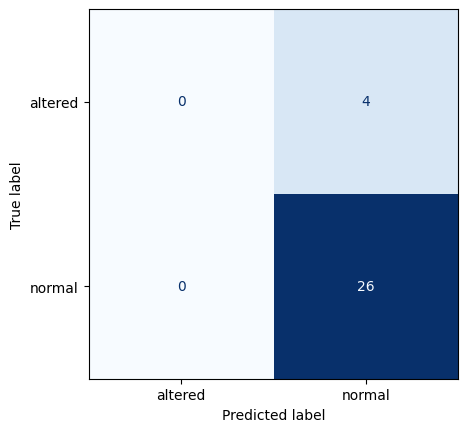

Accuracy %              : 86.6667%
Precision score         : 1.0
Recall score            : 0.8667
F1 score                : 0.9286
Cross Validation score  : 0.88
Training time           : 0.001 Seconds




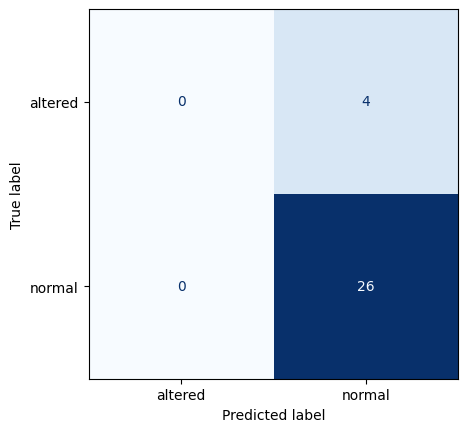

Accuracy %              : 86.6667%
Precision score         : 1.0
Recall score            : 0.8667
F1 score                : 0.9286
Cross Validation score  : 0.88
Training time           : 0.001 Seconds




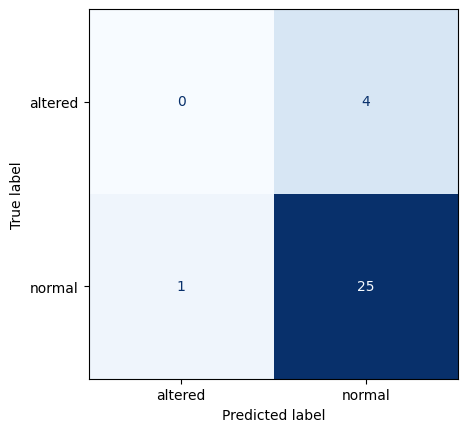

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.82
Training time           : 0.1296 Seconds




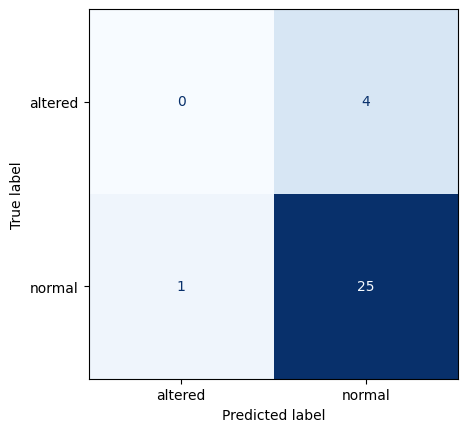

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.85
Training time           : 0.0567 Seconds




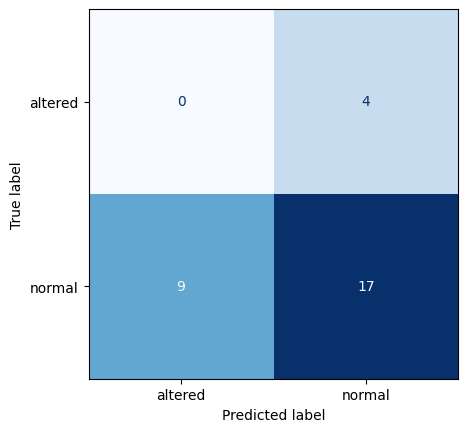

Accuracy %              : 56.6667%
Precision score         : 0.6538
Recall score            : 0.8095
F1 score                : 0.5064
Cross Validation score  : 0.0
Training time           : 0.095 Seconds




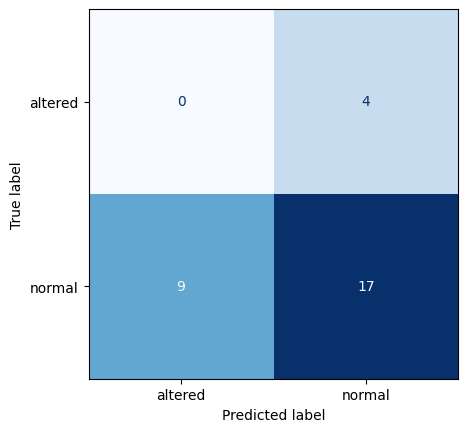

Accuracy %              : 56.6667%
Precision score         : 0.6538
Recall score            : 0.8095
F1 score                : 0.5064
Cross Validation score  : 0.0
Training time           : 0.0872 Seconds




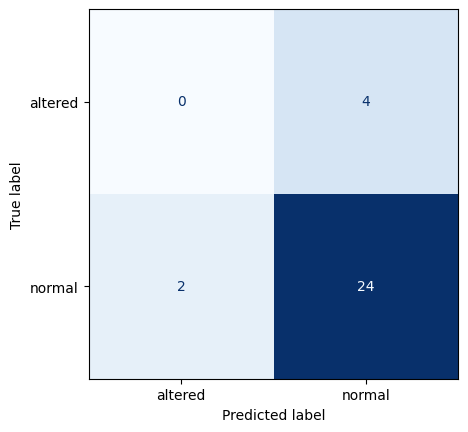

Accuracy %              : 80.0%
Precision score         : 0.9231
Recall score            : 0.8571
F1 score                : 0.8296
Cross Validation score  : 0.0
Training time           : 0.0606 Seconds




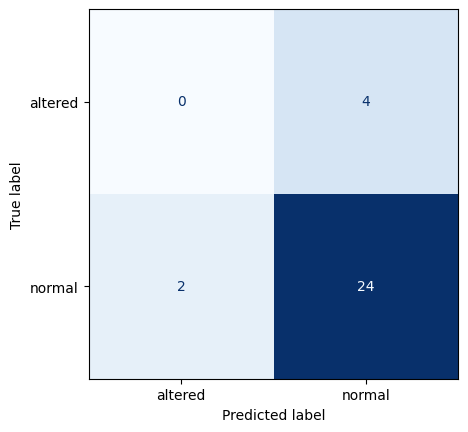

Accuracy %              : 80.0%
Precision score         : 0.9231
Recall score            : 0.8571
F1 score                : 0.8296
Cross Validation score  : 0.0
Training time           : 0.0235 Seconds




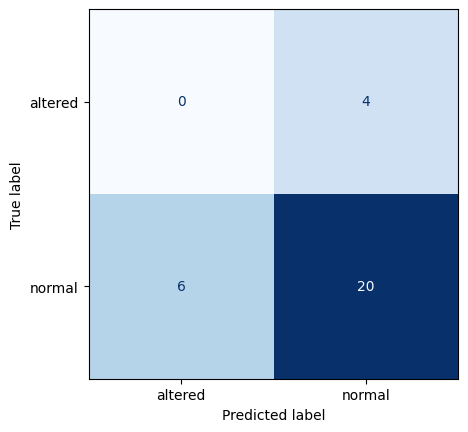

Accuracy %              : 66.6667%
Precision score         : 0.7692
Recall score            : 0.8333
F1 score                : 0.64
Cross Validation score  : 0.0
Training time           : 0.0115 Seconds




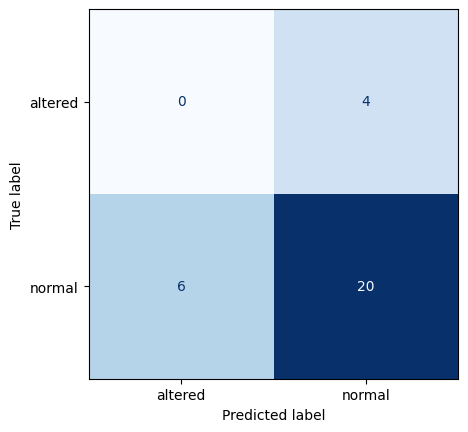

Accuracy %              : 66.6667%
Precision score         : 0.7692
Recall score            : 0.8333
F1 score                : 0.64
Cross Validation score  : 0.0
Training time           : 0.0109 Seconds




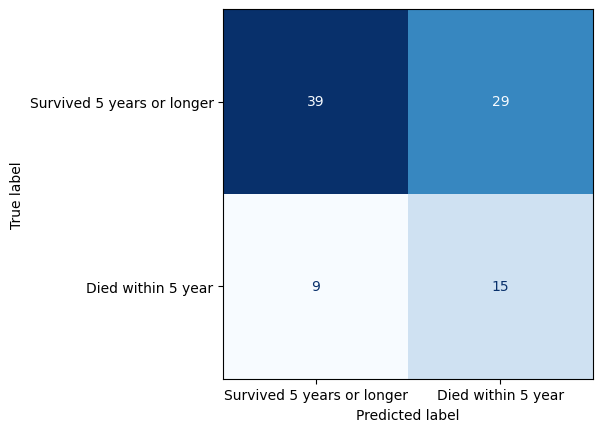

Accuracy %              : 58.6957%
Precision score         : 0.5735
Recall score            : 0.8125
F1 score                : 0.5618
Cross Validation score  : 0.742
Training time           : 0.001 Seconds




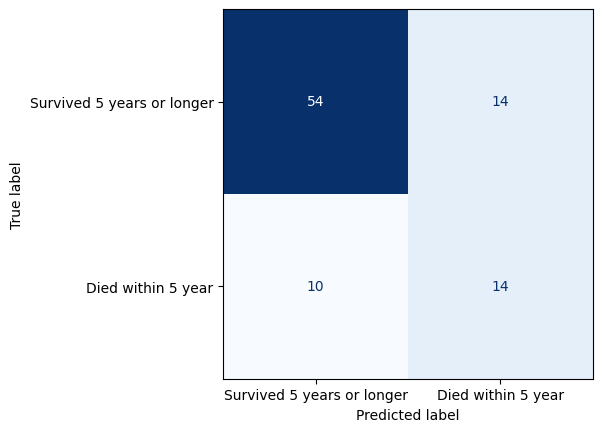

Accuracy %              : 73.913%
Precision score         : 0.7941
Recall score            : 0.8438
F1 score                : 0.733
Cross Validation score  : 0.7352
Training time           : 0.0011 Seconds




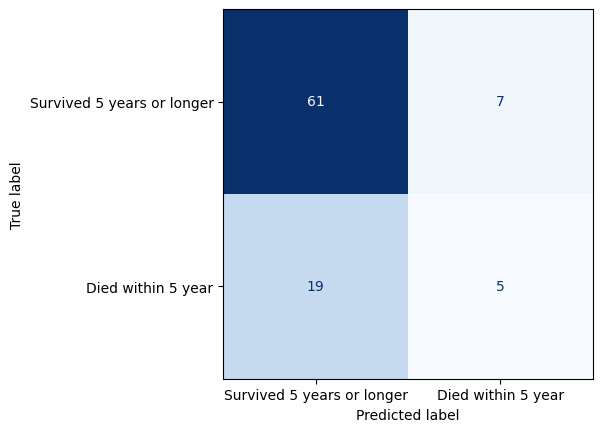

Accuracy %              : 71.7391%
Precision score         : 0.8971
Recall score            : 0.7625
F1 score                : 0.753
Cross Validation score  : 0.6631
Training time           : 0.0 Seconds




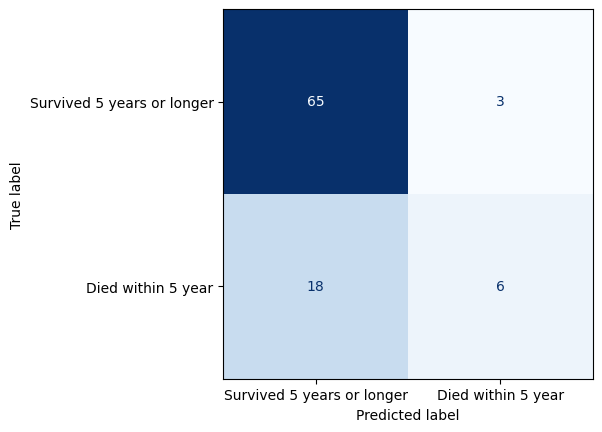

Accuracy %              : 77.1739%
Precision score         : 0.9559
Recall score            : 0.7831
F1 score                : 0.8123
Cross Validation score  : 0.7254
Training time           : 0.001 Seconds




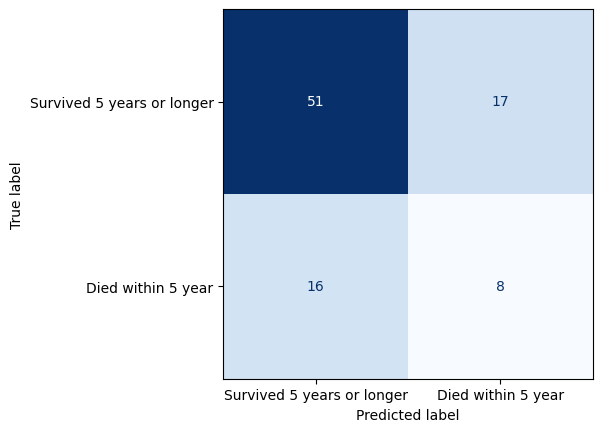

Accuracy %              : 64.1304%
Precision score         : 0.75
Recall score            : 0.7612
F1 score                : 0.639
Cross Validation score  : 0.6042
Training time           : 0.001 Seconds




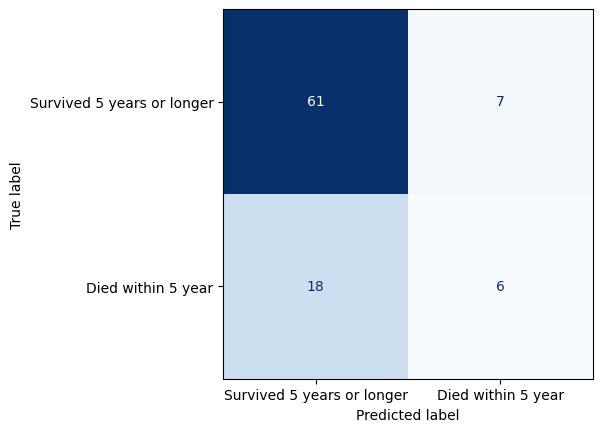

Accuracy %              : 72.8261%
Precision score         : 0.8971
Recall score            : 0.7722
F1 score                : 0.7585
Cross Validation score  : 0.6566
Training time           : 0.002 Seconds




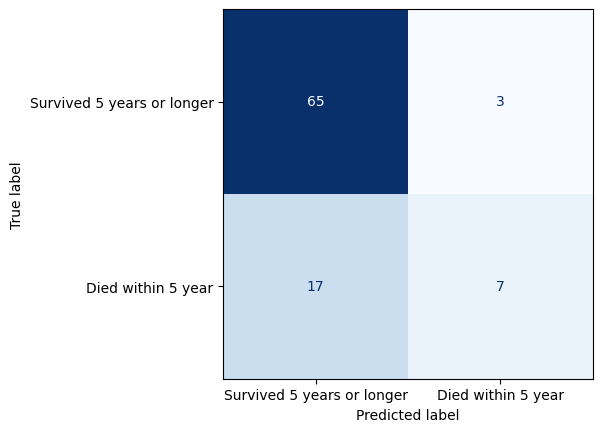

Accuracy %              : 78.2609%
Precision score         : 0.9559
Recall score            : 0.7927
F1 score                : 0.8172
Cross Validation score  : 0.7288
Training time           : 0.002 Seconds




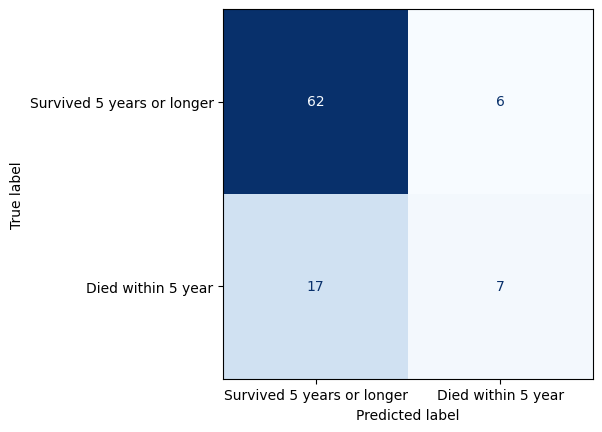

Accuracy %              : 75.0%
Precision score         : 0.9118
Recall score            : 0.7848
F1 score                : 0.7778
Cross Validation score  : 0.7549
Training time           : 0.003 Seconds




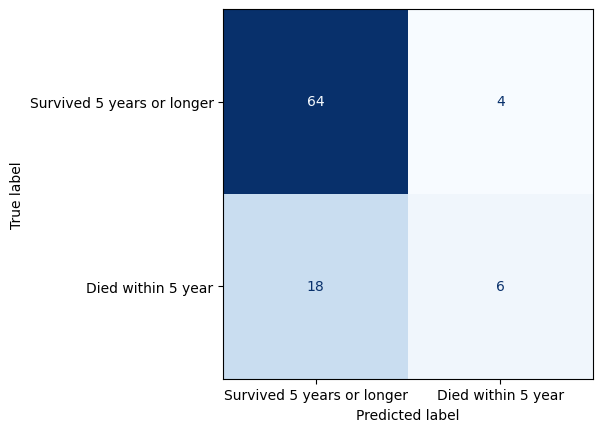

Accuracy %              : 76.087%
Precision score         : 0.9412
Recall score            : 0.7805
F1 score                : 0.7989
Cross Validation score  : 0.6796
Training time           : 0.1388 Seconds




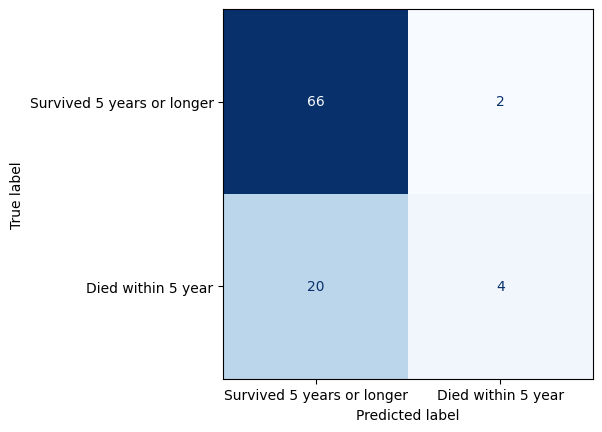

Accuracy %              : 76.087%
Precision score         : 0.9706
Recall score            : 0.7674
F1 score                : 0.8186
Cross Validation score  : 0.732
Training time           : 0.0713 Seconds




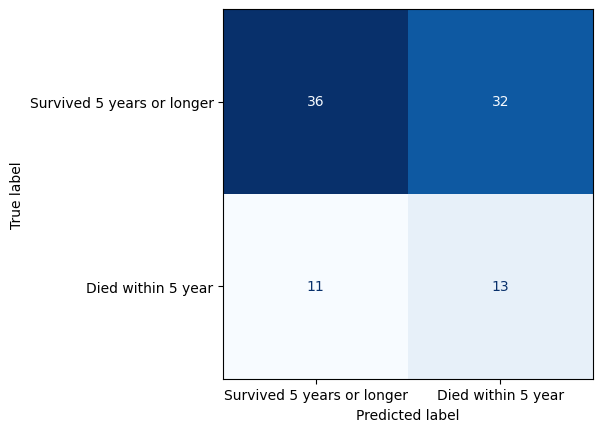

Accuracy %              : 53.2609%
Precision score         : 0.5294
Recall score            : 0.766
F1 score                : 0.5042
Cross Validation score  : 0.0
Training time           : 0.0945 Seconds




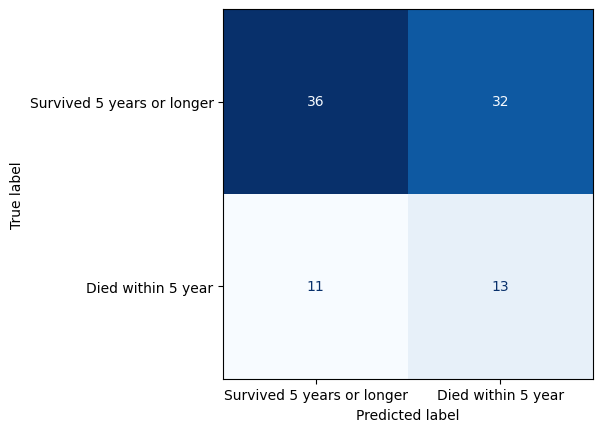

Accuracy %              : 53.2609%
Precision score         : 0.5294
Recall score            : 0.766
F1 score                : 0.5042
Cross Validation score  : 0.0
Training time           : 0.0876 Seconds




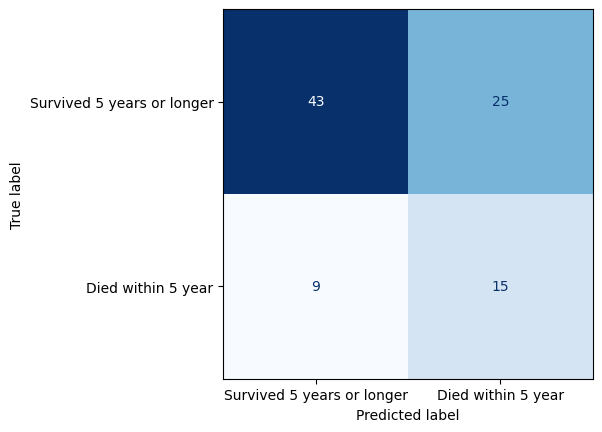

Accuracy %              : 63.0435%
Precision score         : 0.6324
Recall score            : 0.8269
F1 score                : 0.6089
Cross Validation score  : 0.0
Training time           : 0.1322 Seconds




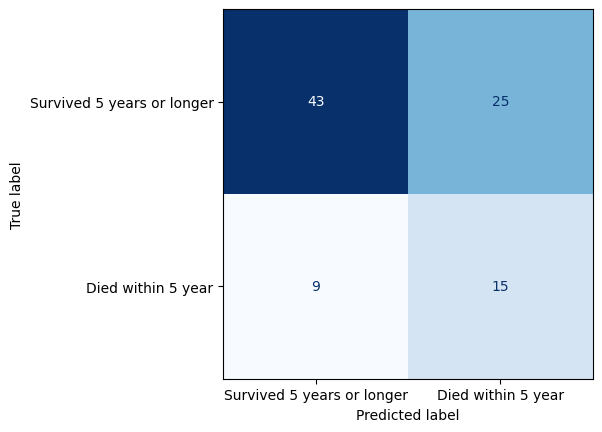

Accuracy %              : 63.0435%
Precision score         : 0.6324
Recall score            : 0.8269
F1 score                : 0.6089
Cross Validation score  : 0.0
Training time           : 1.3678 Seconds




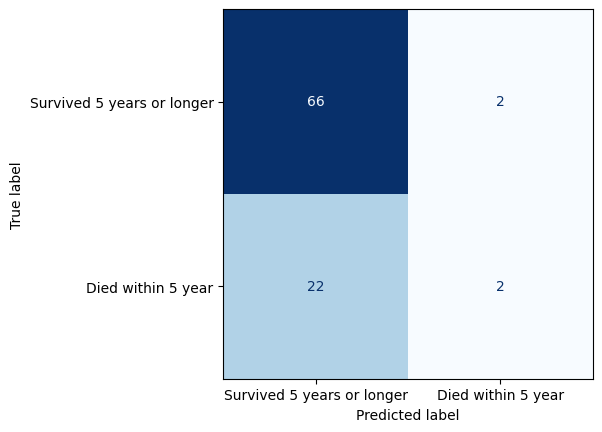

Accuracy %              : 73.913%
Precision score         : 0.9706
Recall score            : 0.75
F1 score                : 0.8156
Cross Validation score  : 0.0
Training time           : 0.013 Seconds




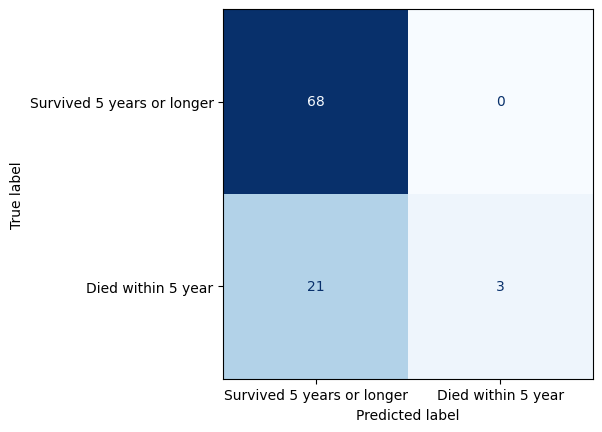

Accuracy %              : 77.1739%
Precision score         : 1.0
Recall score            : 0.764
F1 score                : 0.8452
Cross Validation score  : 0.0
Training time           : 0.0145 Seconds




In [131]:
all_metrics_per_model_withGridSearch = {}
all_metrics_per_file_withGridSearch = {}
accuracy_rounded = 0.0
precision_rounded = 0.0
recall_rounded = 0.0
f1_rounded = 0.0
cv_scores_rounded = 0.0
training_time_rounded = 0.0
accuracy_rounded_gs = 0.0
precision_rounded_gs = 0.0
recall_rounded_gs = 0.0
f1_rounded_gs = 0.0
cv_scores_rounded_gs = 0.0
training_time_rounded_gs = 0.0
accuracy_gs = 0.0
precision_gs = 0.0
recall_gs = 0.0
f1_gs = 0.0
cv_scores_gs = 0.0
training_time_gs = 0.0
current_model = ''

# Run the intial model. Do grid search and run the best model.
for key, value in file_details.items():
    
    display(HTML("<h2><b>{} dataset</b></h2>".format(key)))
    
    # Initialize all_metrics_per_file for the given file, if not done already
    if key not in all_metrics_per_file_withGridSearch:
        all_metrics_per_file_withGridSearch[key] = {}
        
    for model_key, model_value in models_with_grid_parameters.items():   
        current_model = model_value['model']
        display(HTML("<h4><b>Results from {} for dataset {}</b></h4>".format(model_value['model'], key)))
        accuracy, precision, recall, f1, cv_scores,training_time = value['instance_model_processing'].modelling(value['X'], value['y'], model_value['model'], value['label_values'], value['label_context'], value['positive_class'])

        # Round-off the metrics
        accuracy_rounded = round(accuracy * 100, 4)
        precision_rounded = round(precision, 4)
        recall_rounded = round(recall, 4)
        f1_rounded = round(f1, 4)
        cv_scores_rounded = round(np.mean(cv_scores), 4)
        training_time_rounded = round(training_time, 4)      

        
        # Print results    
        print(f'Accuracy %              : {accuracy_rounded}%')
        print(f'Precision score         : {precision_rounded}')
        print(f'Recall score            : {recall_rounded}')
        print(f'F1 score                : {f1_rounded}')        
        print(f'Cross Validation score  : {cv_scores_rounded}')
        print(f'Training time           : {training_time_rounded} Seconds')
        print('\n')

        # Perform grid search if grid parameters are available for the model and if the accuracy from the original model is not good (less than 95%).        
        if model_value.get('param_grid') is not None and accuracy < 0.95:
            # Get the best model from grid search
            best_model, params = value['instance_model_processing'].grid_search(value['X'], value['y'], model_value['model'] ,model_value['param_grid'])                        
            display(HTML("<h4><b>Results from best model {} after grid search for dataset {}</b></h4>".format(best_model, key)))            
            # Run the best model
            accuracy_gs, precision_gs, recall_gs, f1_gs, cv_scores_gs,training_time_gs = value['instance_model_processing'].modelling(value['X'], value['y'], best_model, value['label_values'], value['label_context'], value['positive_class'])
            
            # Round-off the metrics
            accuracy_gs_rounded = round(accuracy_gs * 100, 4)
            precision_gs_rounded = round(precision_gs, 4)
            recall_gs_rounded = round(recall_gs, 4)
            f1_gs_rounded = round(f1_gs, 4)
            cv_scores_gs_rounded = round(np.mean(cv_scores_gs), 4)
            training_time_gs_rounded = round(training_time_gs, 4)
            
            # Print results    
            print(f'Accuracy %              : {accuracy_gs_rounded}%')
            print(f'Precision score         : {precision_gs_rounded}')
            print(f'Recall score            : {recall_gs_rounded}')
            print(f'F1 score                : {f1_gs_rounded}')        
            print(f'Cross Validation score  : {cv_scores_gs_rounded}')
            print(f'Training time           : {training_time_gs_rounded} Seconds')
            print('\n')


        # Check if the accuracy from grid search is better.. If so then consider it otherwise not..
        if accuracy_gs > accuracy:
            accuracy_rounded = accuracy_gs_rounded
            precision_rounded = precision_gs_rounded
            recall_rounded = recall_gs_rounded
            f1_rounded = f1_gs_rounded
            cv_scores_rounded = cv_scores_gs_rounded
            training_time_rounded = training_time_gs_rounded 

        # Initialize all_metrics_per_model for the given model, if not done already
        if current_model not in all_metrics_per_model_withGridSearch:
            all_metrics_per_model_withGridSearch[current_model] = {
                'accuracy': [],
                'precision': [],
                'recall': [],
                'f1': [],
                'cv_scores': [],
                'training_time': []
            }
            
        # Save all metrics per model (best of original model and model from grid search)
        all_metrics_per_model_withGridSearch[current_model]['accuracy'].append(accuracy_rounded)
        all_metrics_per_model_withGridSearch[current_model]['precision'].append(precision_rounded)
        all_metrics_per_model_withGridSearch[current_model]['recall'].append(recall_rounded)
        all_metrics_per_model_withGridSearch[current_model]['f1'].append(f1_rounded)
        all_metrics_per_model_withGridSearch[current_model]['cv_scores'].append(cv_scores_rounded)
        all_metrics_per_model_withGridSearch[current_model]['training_time'].append(training_time_rounded)


        # Initialize model entry in all_metrics_per_file_withGridSearch for the given file, if not done already
        if current_model not in all_metrics_per_file_withGridSearch[key]:            
            all_metrics_per_file_withGridSearch[key][current_model] = {
                    'accuracy': 0.0,
                    'precision': 0.0,
                    'recall': 0.0,
                    'f1': 0.0,
                    'cv_scores': 0.0,
                    'training_time': 0.0
                }
            
        # Save all metrics per file (best of original model and model from grid search)
        all_metrics_per_file_withGridSearch[key][current_model]['accuracy'] = accuracy_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['precision'] = precision_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['recall'] = recall_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['f1'] = f1_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['cv_scores'] = cv_scores_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['training_time'] = training_time_rounded
            

In [132]:
# Flatten all_metrics_per_file
data = []
for file, models in all_metrics_per_file_withGridSearch.items():
    for model, metrics in models.items():
        row = {'file': file, 'model': model}
        row.update(metrics)
        data.append(row)

# Create DataFrame
df = pd.DataFrame(data)

# Sort DataFrames by 'accuracy' in descending order. We want to rank models per accuracy
df.columns = ['File name', 'Model' ,'Accuracy %', 'Precision score','Recall score','F1 score','Cross Validation score','Training time (seconds)']
df_all_metrics_per_file_withGridSearch = df.sort_values(by=["File name", "Accuracy %"], ascending=[True, False])


# Save DataFrames to CSV files
df_all_metrics_per_file_withGridSearch.to_csv("all_metrics_per_file_withGridSearch.csv", index=False, sep=";")
#print(df_all_metrics_per_file_withGridSearch.head)

In [133]:
# Calculate the mean of metrics for each model
mean_metrics_per_model_withGridSearch = {}

mean_metrics_per_model_withGridSearch = {
    model: {
        metric: round(np.mean(values),4) if values else None
        for metric, values in metrics.items()
    }
    for model, metrics in all_metrics_per_model_withGridSearch.items()
}

# Convert dictionaries to DataFrames
df_mean_metrics_per_model_withGridSearch = pd.DataFrame.from_dict(mean_metrics_per_model_withGridSearch, orient="index")

# Sort DataFrames by 'accuracy' in descending order. We want to rank models per accuracy
df_mean_metrics_per_model_withGridSearch = df_mean_metrics_per_model_withGridSearch.sort_values(by="accuracy", ascending=False)
 

# Save DataFrames to CSV files
df_mean_metrics_per_model_withGridSearch.columns = ['Accuracy %', 'Precision score','Recall score','F1 score','Cross Validation score','Training time (seconds)']
df_mean_metrics_per_model_withGridSearch.to_csv("mean_metrics_per_model_withGridSearch.csv", index=True, sep=";")
print(df_mean_metrics_per_model_withGridSearch.head)

<bound method NDFrame.head of                                                     Accuracy %  \
(DecisionTreeClassifier(max_features='sqrt', ra...     85.9994   
SVC()                                                  85.8228   
KNeighborsClassifier(n_neighbors=3)                    83.0913   
Perceptron(max_iter=100, tol=True)                     82.5700   
DecisionTreeClassifier(random_state=12345)             81.5533   
GaussianMixture(n_components=2)                        73.6887   
Birch(n_clusters=2)                                    71.7764   
KMeans(n_clusters=2, n_init=10, random_state=12...     71.4832   

                                                    Precision score  \
(DecisionTreeClassifier(max_features='sqrt', ra...           0.7776   
SVC()                                                        0.7769   
KNeighborsClassifier(n_neighbors=3)                          0.7267   
Perceptron(max_iter=100, tol=True)                           0.7849   
DecisionTreeClassifi

#### Doing grid search for all the cases (even if original has give good accuracy, we still do grid search)

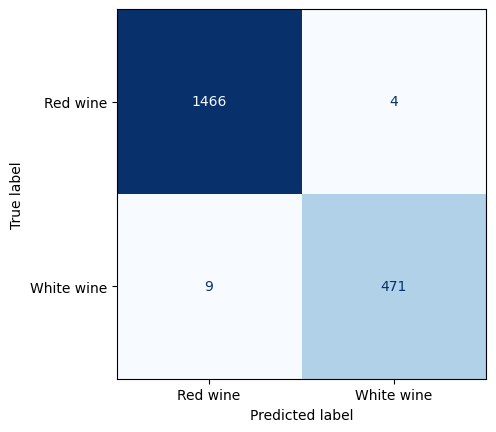

Accuracy %              : 99.3333%
Precision score         : 0.9812
Recall score            : 0.9916
F1 score                : 0.9933
Cross Validation score  : 0.9226
Training time           : 0.004 Seconds




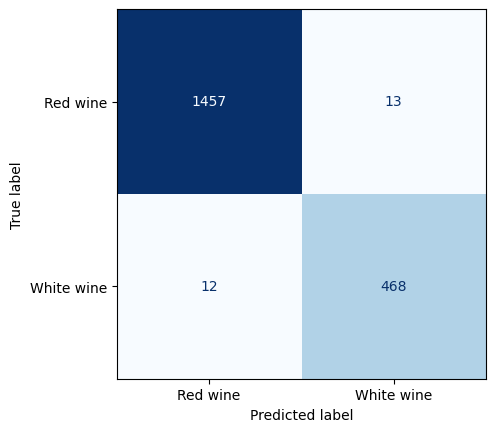

Accuracy %              : 98.7179%
Precision score         : 0.975
Recall score            : 0.973
F1 score                : 0.9872
Cross Validation score  : 0.9341
Training time           : 0.005 Seconds




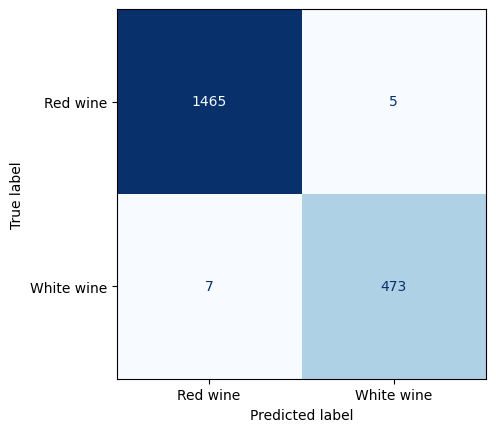

Accuracy %              : 99.3846%
Precision score         : 0.9854
Recall score            : 0.9895
F1 score                : 0.9939
Cross Validation score  : 0.9292
Training time           : 0.0096 Seconds




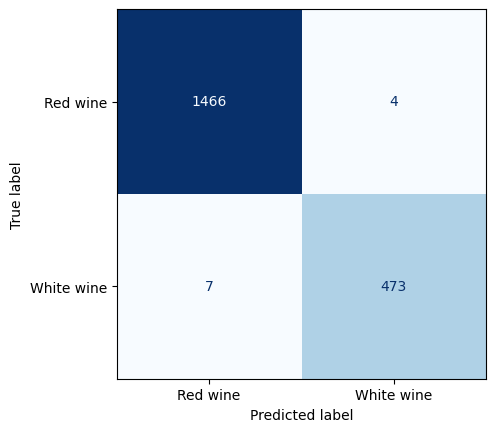

Accuracy %              : 99.4359%
Precision score         : 0.9854
Recall score            : 0.9916
F1 score                : 0.9944
Cross Validation score  : 0.9491
Training time           : 0.009 Seconds




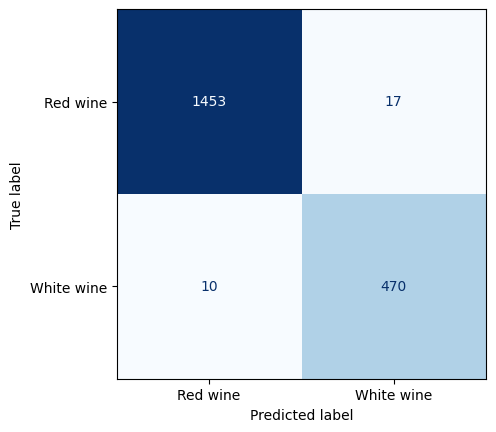

Accuracy %              : 98.6154%
Precision score         : 0.9792
Recall score            : 0.9651
F1 score                : 0.9861
Cross Validation score  : 0.9815
Training time           : 0.029 Seconds




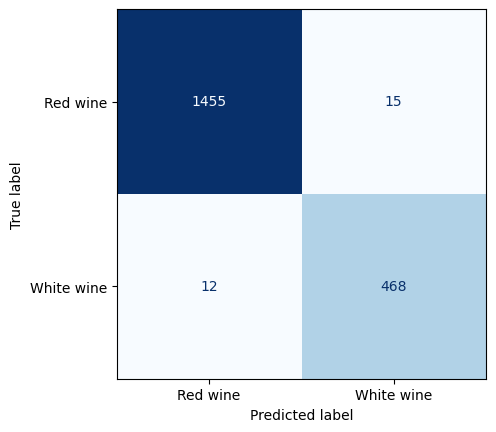

Accuracy %              : 98.6154%
Precision score         : 0.975
Recall score            : 0.9689
F1 score                : 0.9861
Cross Validation score  : 0.9783
Training time           : 0.012 Seconds




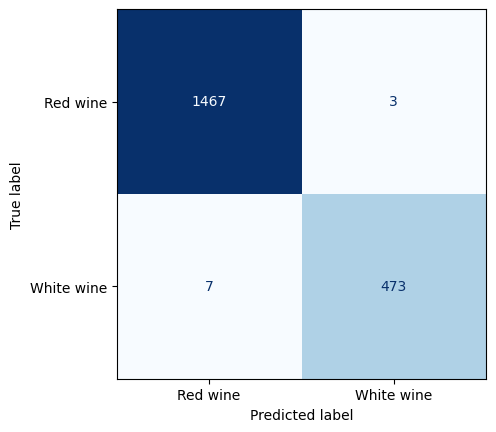

Accuracy %              : 99.4872%
Precision score         : 0.9854
Recall score            : 0.9937
F1 score                : 0.9949
Cross Validation score  : 0.9358
Training time           : 0.0618 Seconds




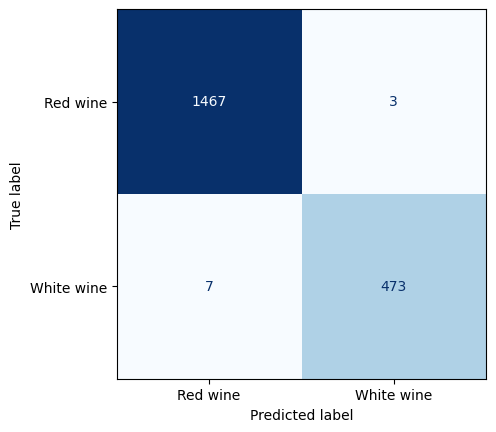

Accuracy %              : 99.4872%
Precision score         : 0.9854
Recall score            : 0.9937
F1 score                : 0.9949
Cross Validation score  : 0.9358
Training time           : 0.0536 Seconds




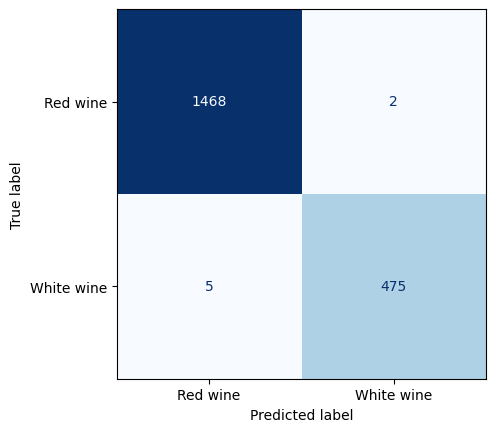

Accuracy %              : 99.641%
Precision score         : 0.9896
Recall score            : 0.9958
F1 score                : 0.9964
Cross Validation score  : 0.9942
Training time           : 0.5799 Seconds




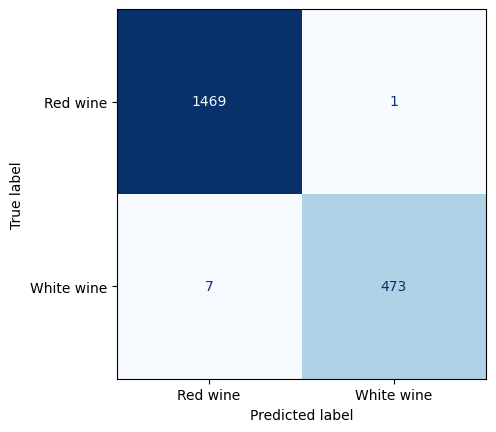

Accuracy %              : 99.5897%
Precision score         : 0.9854
Recall score            : 0.9979
F1 score                : 0.9959
Cross Validation score  : 0.9943
Training time           : 0.577 Seconds




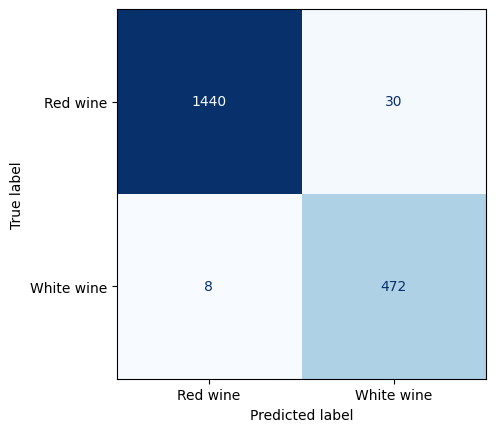

Accuracy %              : 98.0513%
Precision score         : 0.9833
Recall score            : 0.9402
F1 score                : 0.9804
Cross Validation score  : 0.0
Training time           : 0.0866 Seconds




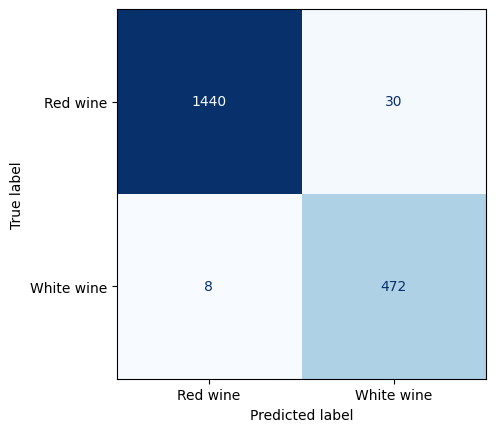

Accuracy %              : 98.0513%
Precision score         : 0.9833
Recall score            : 0.9402
F1 score                : 0.9804
Cross Validation score  : 0.0
Training time           : 0.0766 Seconds




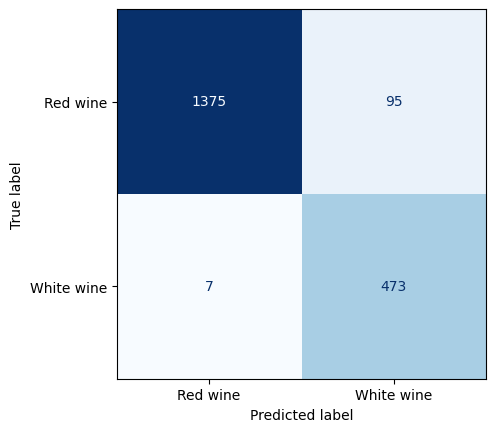

Accuracy %              : 94.7692%
Precision score         : 0.9854
Recall score            : 0.8327
F1 score                : 0.9463
Cross Validation score  : 0.0
Training time           : 0.115 Seconds




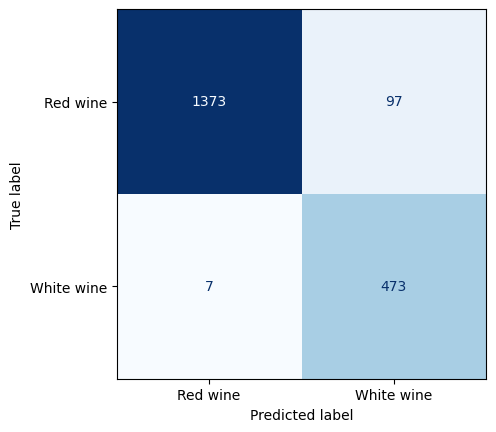

Accuracy %              : 94.6667%
Precision score         : 0.9854
Recall score            : 0.8298
F1 score                : 0.9452
Cross Validation score  : 0.0
Training time           : 0.2207 Seconds




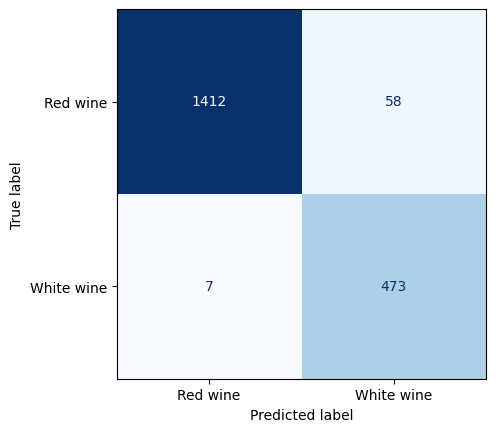

Accuracy %              : 96.6667%
Precision score         : 0.9854
Recall score            : 0.8908
F1 score                : 0.9661
Cross Validation score  : 0.0
Training time           : 0.4939 Seconds




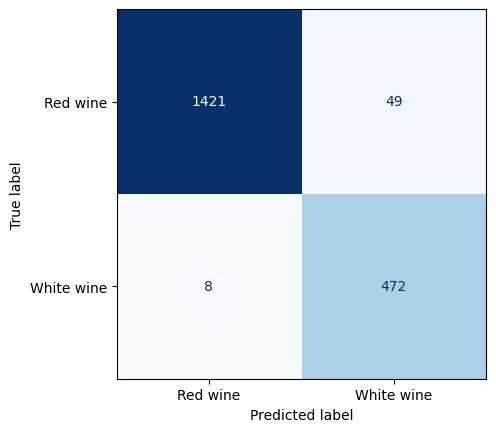

Accuracy %              : 97.0769%
Precision score         : 0.9833
Recall score            : 0.906
F1 score                : 0.9704
Cross Validation score  : 0.0
Training time           : 0.7729 Seconds




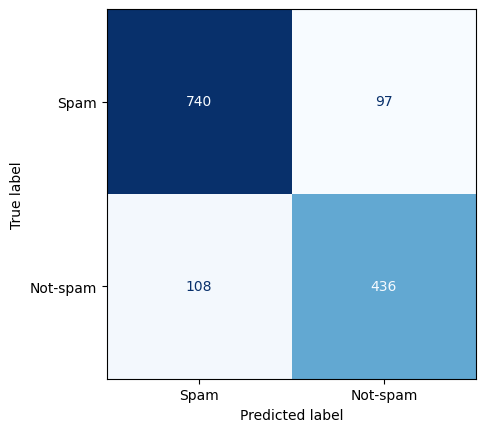

Accuracy %              : 85.1557%
Precision score         : 0.8015
Recall score            : 0.818
F1 score                : 0.8518
Cross Validation score  : 0.7205
Training time           : 0.004 Seconds




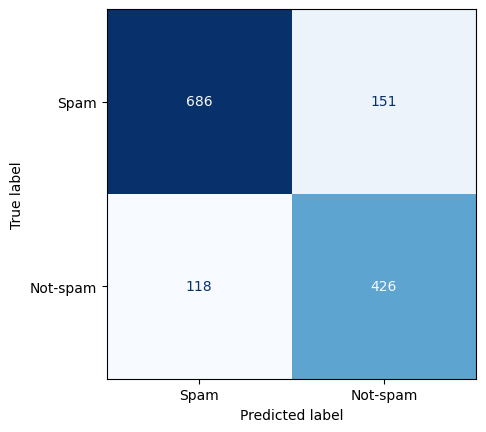

Accuracy %              : 80.5214%
Precision score         : 0.7831
Recall score            : 0.7383
F1 score                : 0.8043
Cross Validation score  : 0.6703
Training time           : 0.013 Seconds




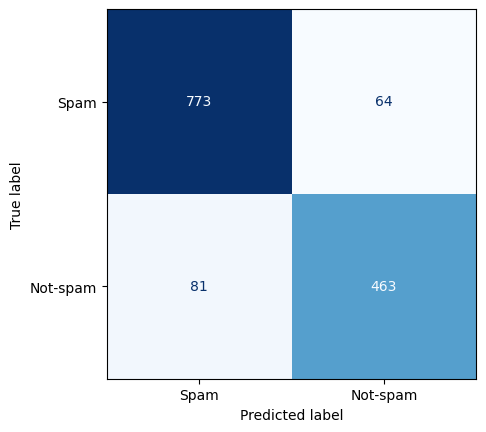

Accuracy %              : 89.5004%
Precision score         : 0.8511
Recall score            : 0.8786
F1 score                : 0.8953
Cross Validation score  : 0.7764
Training time           : 0.001 Seconds




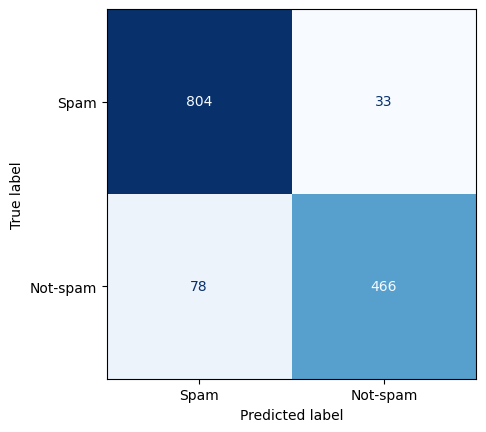

Accuracy %              : 91.9623%
Precision score         : 0.8566
Recall score            : 0.9339
F1 score                : 0.9203
Cross Validation score  : 0.8127
Training time           : 0.001 Seconds




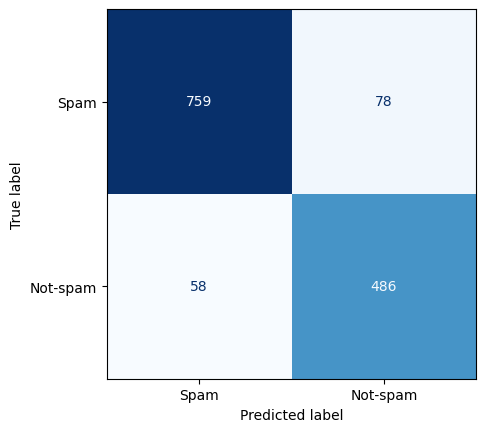

Accuracy %              : 90.1521%
Precision score         : 0.8934
Recall score            : 0.8617
F1 score                : 0.9012
Cross Validation score  : 0.8787
Training time           : 0.0859 Seconds




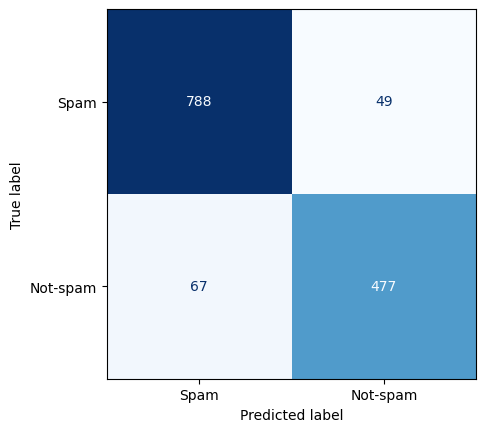

Accuracy %              : 91.6003%
Precision score         : 0.8768
Recall score            : 0.9068
F1 score                : 0.9163
Cross Validation score  : 0.9028
Training time           : 0.0506 Seconds




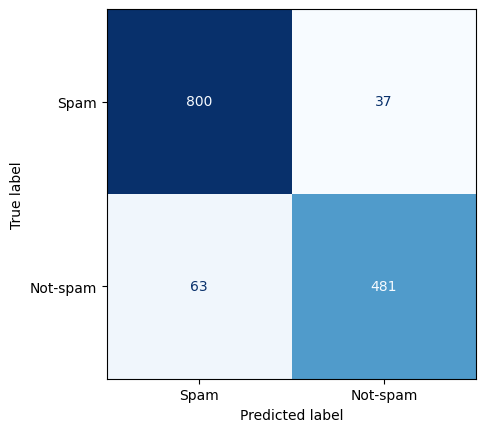

Accuracy %              : 92.7589%
Precision score         : 0.8842
Recall score            : 0.9286
F1 score                : 0.9279
Cross Validation score  : 0.7051
Training time           : 0.222 Seconds




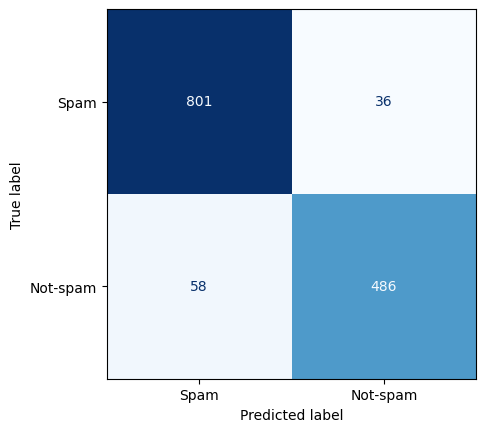

Accuracy %              : 93.1933%
Precision score         : 0.8934
Recall score            : 0.931
F1 score                : 0.9322
Cross Validation score  : 0.7322
Training time           : 0.1934 Seconds




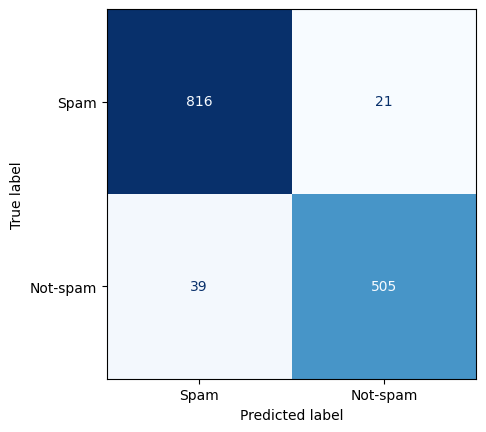

Accuracy %              : 95.6553%
Precision score         : 0.9283
Recall score            : 0.9601
F1 score                : 0.9567
Cross Validation score  : 0.9294
Training time           : 0.6722 Seconds




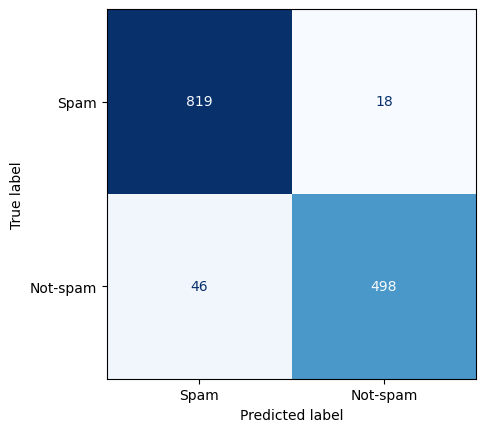

Accuracy %              : 95.3657%
Precision score         : 0.9154
Recall score            : 0.9651
F1 score                : 0.9539
Cross Validation score  : 0.9302
Training time           : 0.6294 Seconds




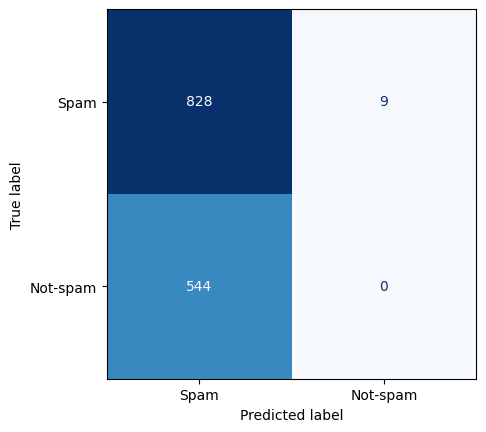

Accuracy %              : 59.9566%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7448
Cross Validation score  : 0.0
Training time           : 0.1854 Seconds




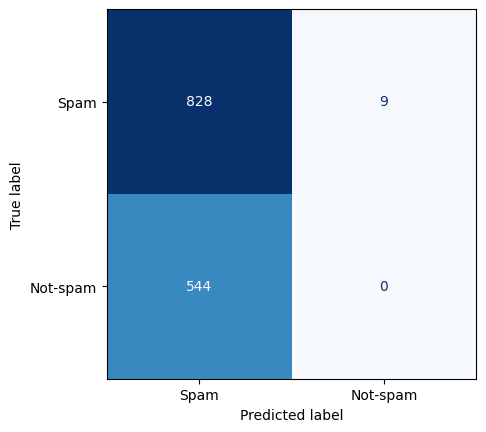

Accuracy %              : 59.9566%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7448
Cross Validation score  : 0.0
Training time           : 0.1757 Seconds




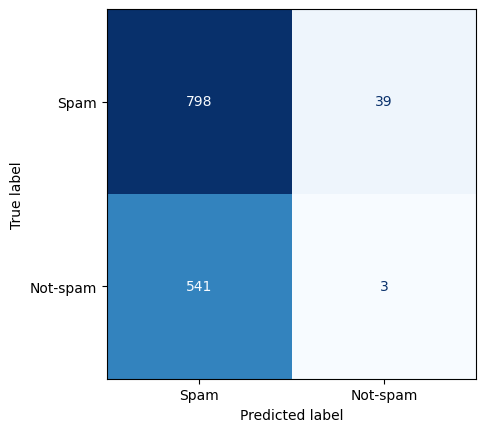

Accuracy %              : 58.0014%
Precision score         : 0.0055
Recall score            : 0.0714
F1 score                : 0.7115
Cross Validation score  : 0.0
Training time           : 0.1517 Seconds




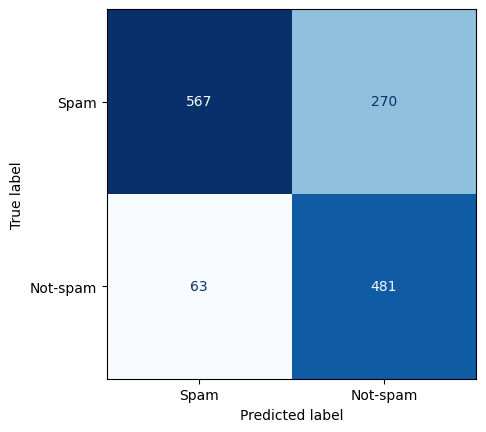

Accuracy %              : 75.887%
Precision score         : 0.8842
Recall score            : 0.6405
F1 score                : 0.7566
Cross Validation score  : 0.0
Training time           : 1.8677 Seconds




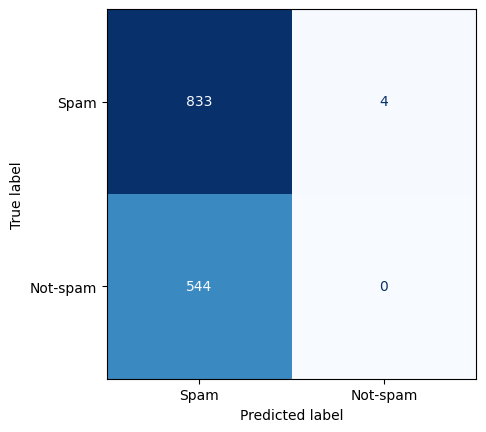

Accuracy %              : 60.3186%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7503
Cross Validation score  : 0.0
Training time           : 0.6065 Seconds




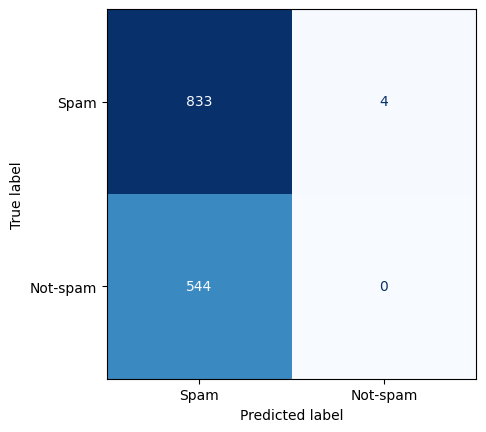

Accuracy %              : 60.3186%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.7503
Cross Validation score  : 0.0
Training time           : 0.4077 Seconds




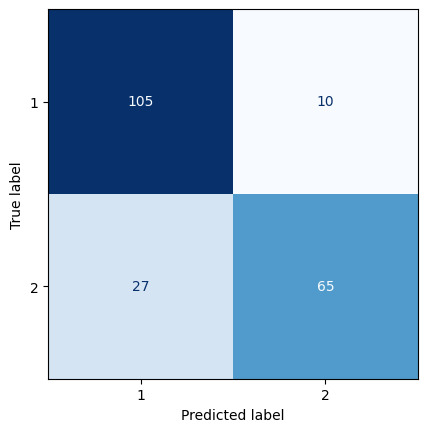

Accuracy %              : 82.1256%
Precision score         : 0.7065
Recall score            : 0.8667
F1 score                : 0.8242
Cross Validation score  : 0.6435
Training time           : 0.001 Seconds




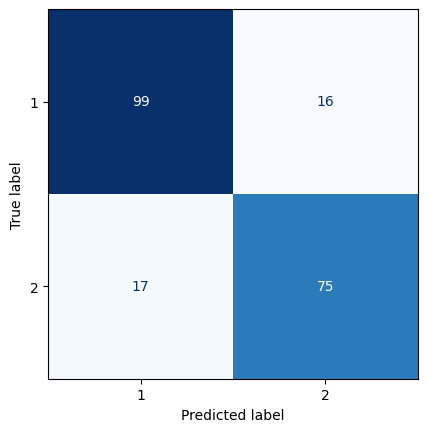

Accuracy %              : 84.058%
Precision score         : 0.8152
Recall score            : 0.8242
F1 score                : 0.8407
Cross Validation score  : 0.6652
Training time           : 0.002 Seconds




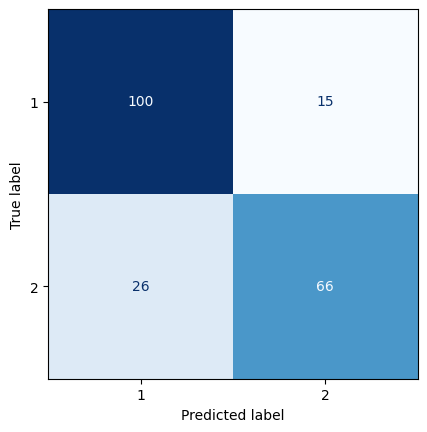

Accuracy %              : 80.1932%
Precision score         : 0.7174
Recall score            : 0.8148
F1 score                : 0.8037
Cross Validation score  : 0.6638
Training time           : 0.002 Seconds




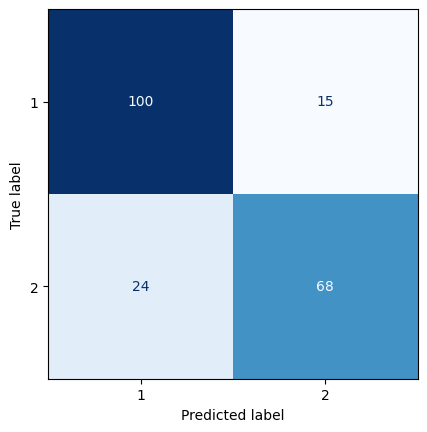

Accuracy %              : 81.1594%
Precision score         : 0.7391
Recall score            : 0.8193
F1 score                : 0.8129
Cross Validation score  : 0.6899
Training time           : 0.0009 Seconds




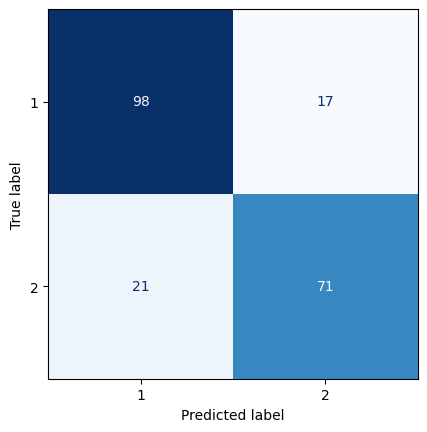

Accuracy %              : 81.6425%
Precision score         : 0.7717
Recall score            : 0.8068
F1 score                : 0.8169
Cross Validation score  : 0.8087
Training time           : 0.0045 Seconds




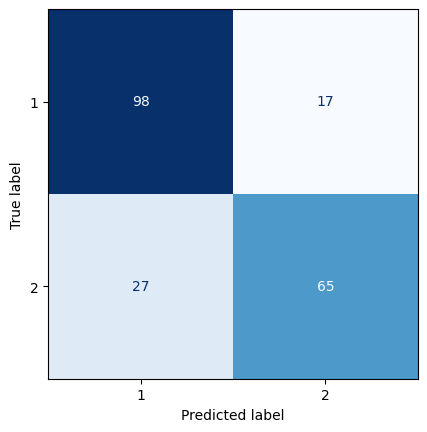

Accuracy %              : 78.744%
Precision score         : 0.7065
Recall score            : 0.7927
F1 score                : 0.7891
Cross Validation score  : 0.8435
Training time           : 0.003 Seconds




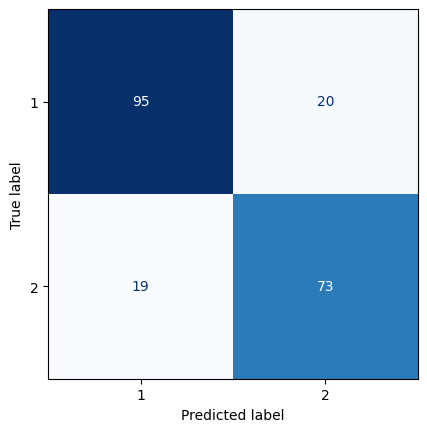

Accuracy %              : 81.1594%
Precision score         : 0.7935
Recall score            : 0.7849
F1 score                : 0.8115
Cross Validation score  : 0.658
Training time           : 0.0059 Seconds




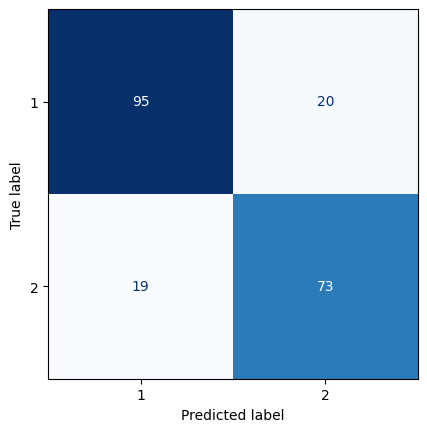

Accuracy %              : 81.1594%
Precision score         : 0.7935
Recall score            : 0.7849
F1 score                : 0.8115
Cross Validation score  : 0.658
Training time           : 0.0059 Seconds




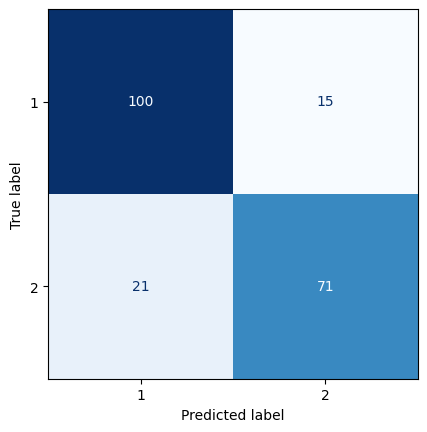

Accuracy %              : 82.6087%
Precision score         : 0.7717
Recall score            : 0.8256
F1 score                : 0.8268
Cross Validation score  : 0.8609
Training time           : 0.1834 Seconds




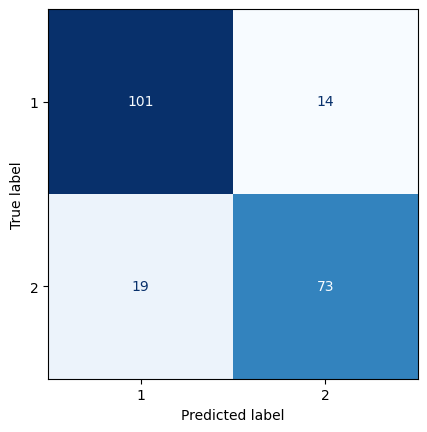

Accuracy %              : 84.058%
Precision score         : 0.7935
Recall score            : 0.8391
F1 score                : 0.8411
Cross Validation score  : 0.8594
Training time           : 0.1609 Seconds




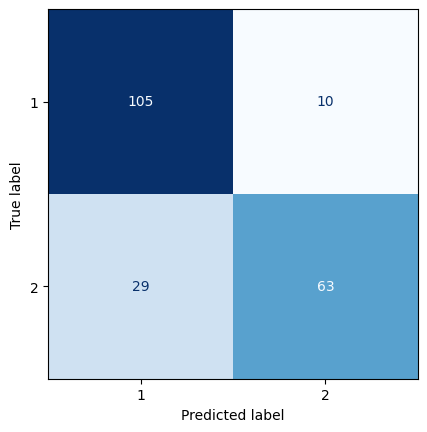

Accuracy %              : 81.1594%
Precision score         : 0.6848
Recall score            : 0.863
F1 score                : 0.8153
Cross Validation score  : 0.0
Training time           : 0.1257 Seconds




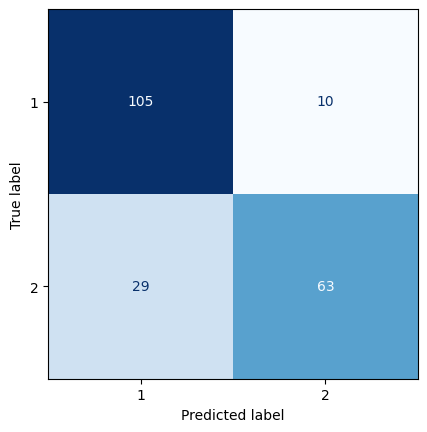

Accuracy %              : 81.1594%
Precision score         : 0.6848
Recall score            : 0.863
F1 score                : 0.8153
Cross Validation score  : 0.0
Training time           : 0.0966 Seconds




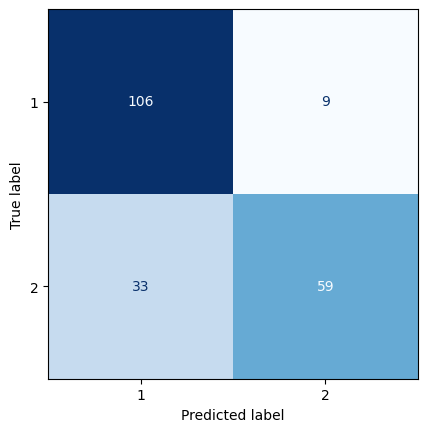

Accuracy %              : 79.7101%
Precision score         : 0.6413
Recall score            : 0.8676
F1 score                : 0.8027
Cross Validation score  : 0.0
Training time           : 0.1545 Seconds




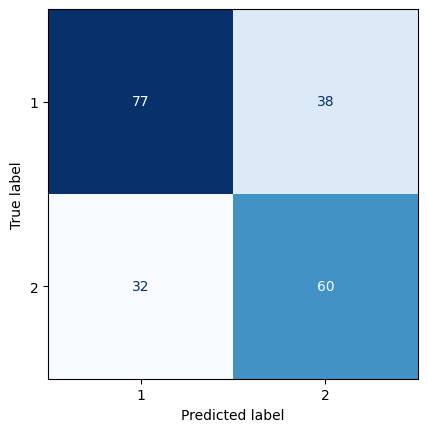

Accuracy %              : 66.1836%
Precision score         : 0.6522
Recall score            : 0.6122
F1 score                : 0.661
Cross Validation score  : 0.0
Training time           : 0.0245 Seconds




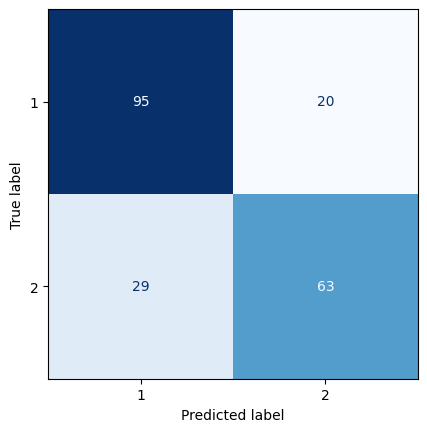

Accuracy %              : 76.3285%
Precision score         : 0.6848
Recall score            : 0.759
F1 score                : 0.7649
Cross Validation score  : 0.0
Training time           : 0.0456 Seconds




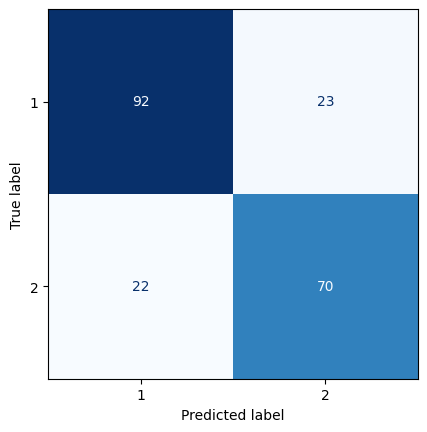

Accuracy %              : 78.2609%
Precision score         : 0.7609
Recall score            : 0.7527
F1 score                : 0.7825
Cross Validation score  : 0.0
Training time           : 0.0395 Seconds




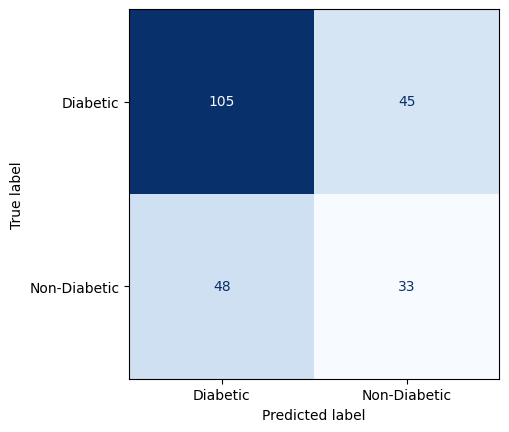

Accuracy %              : 59.7403%
Precision score         : 0.4074
Recall score            : 0.4231
F1 score                : 0.5992
Cross Validation score  : 0.4622
Training time           : 0.002 Seconds




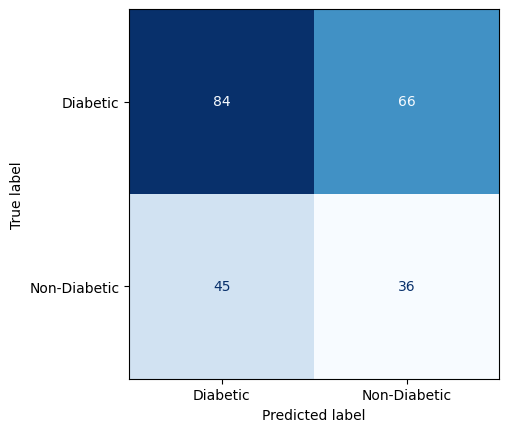

Accuracy %              : 51.9481%
Precision score         : 0.4444
Recall score            : 0.3529
F1 score                : 0.51
Cross Validation score  : 0.5416
Training time           : 0.001 Seconds




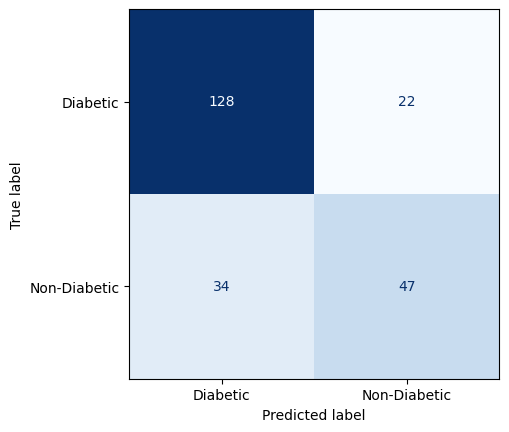

Accuracy %              : 75.7576%
Precision score         : 0.5802
Recall score            : 0.6812
F1 score                : 0.7626
Cross Validation score  : 0.7136
Training time           : 0.002 Seconds




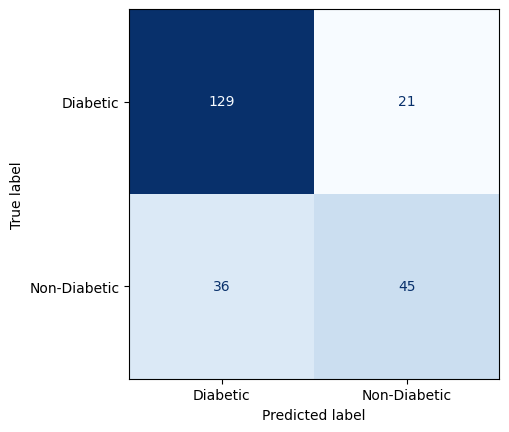

Accuracy %              : 75.3247%
Precision score         : 0.5556
Recall score            : 0.6818
F1 score                : 0.76
Cross Validation score  : 0.7409
Training time           : 0.001 Seconds




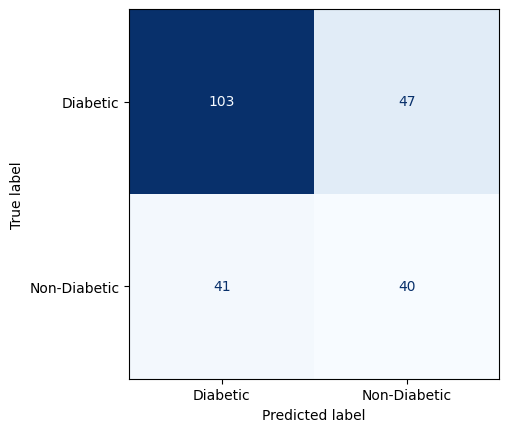

Accuracy %              : 61.9048%
Precision score         : 0.4938
Recall score            : 0.4598
F1 score                : 0.6161
Cross Validation score  : 0.7032
Training time           : 0.003 Seconds




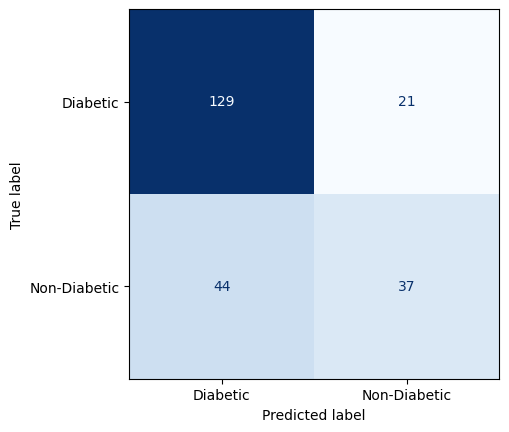

Accuracy %              : 71.8615%
Precision score         : 0.4568
Recall score            : 0.6379
F1 score                : 0.7319
Cross Validation score  : 0.7462
Training time           : 0.0035 Seconds




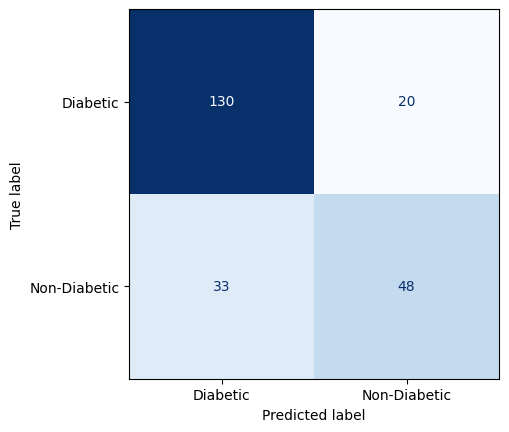

Accuracy %              : 77.0563%
Precision score         : 0.5926
Recall score            : 0.7059
F1 score                : 0.7758
Cross Validation score  : 0.7591
Training time           : 0.007 Seconds




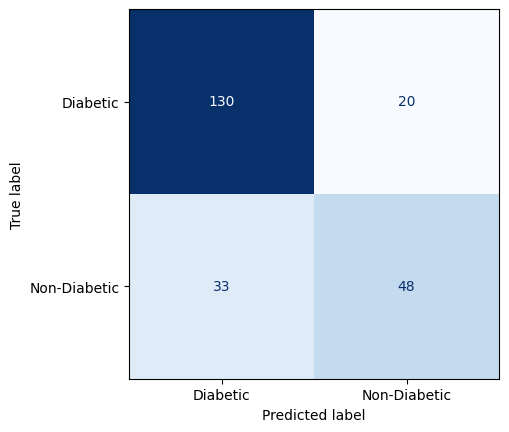

Accuracy %              : 77.0563%
Precision score         : 0.5926
Recall score            : 0.7059
F1 score                : 0.7758
Cross Validation score  : 0.7591
Training time           : 0.0081 Seconds




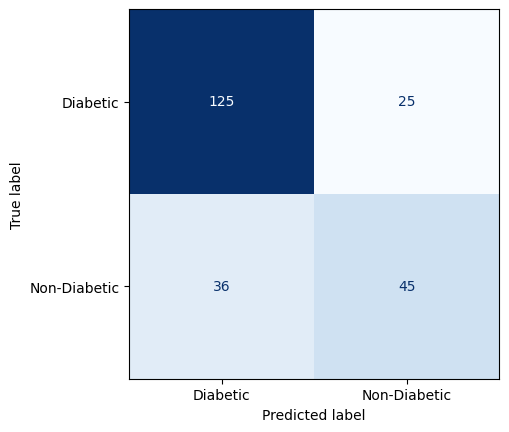

Accuracy %              : 73.5931%
Precision score         : 0.5556
Recall score            : 0.6429
F1 score                : 0.7409
Cross Validation score  : 0.767
Training time           : 0.1973 Seconds




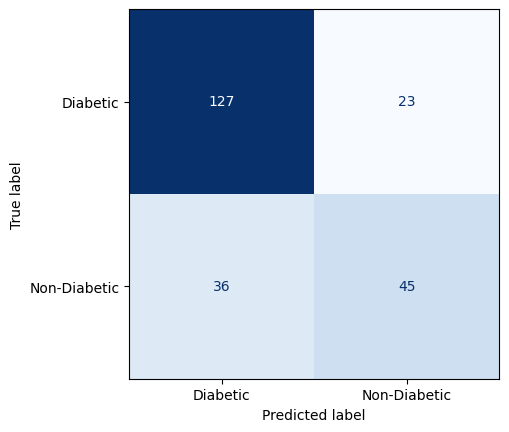

Accuracy %              : 74.4589%
Precision score         : 0.5556
Recall score            : 0.6618
F1 score                : 0.7504
Cross Validation score  : 0.7618
Training time           : 0.1904 Seconds




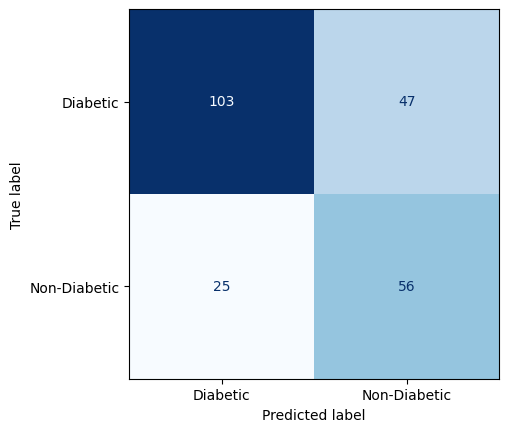

Accuracy %              : 68.8312%
Precision score         : 0.6914
Recall score            : 0.5437
F1 score                : 0.682
Cross Validation score  : 0.0
Training time           : 0.1206 Seconds




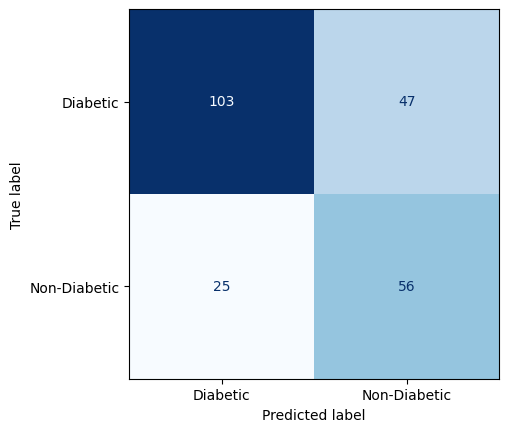

Accuracy %              : 68.8312%
Precision score         : 0.6914
Recall score            : 0.5437
F1 score                : 0.682
Cross Validation score  : 0.0
Training time           : 0.2196 Seconds




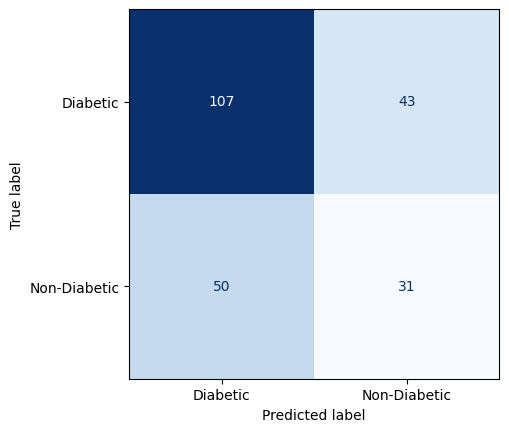

Accuracy %              : 59.7403%
Precision score         : 0.3827
Recall score            : 0.4189
F1 score                : 0.6019
Cross Validation score  : 0.0
Training time           : 0.0932 Seconds




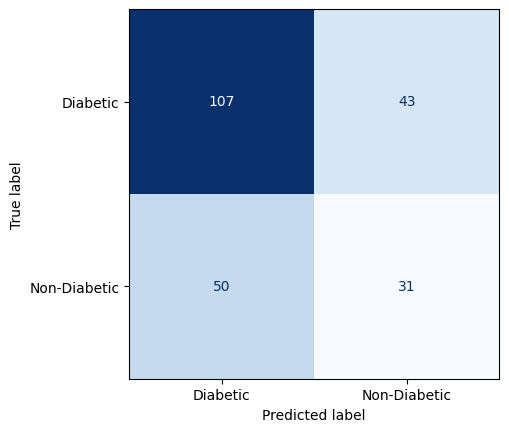

Accuracy %              : 59.7403%
Precision score         : 0.3827
Recall score            : 0.4189
F1 score                : 0.6019
Cross Validation score  : 0.0
Training time           : 1.1114 Seconds




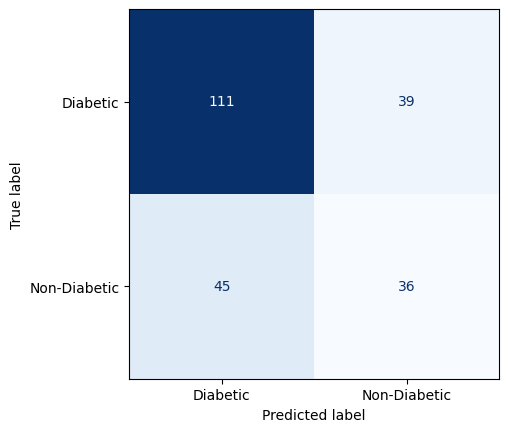

Accuracy %              : 63.6364%
Precision score         : 0.4444
Recall score            : 0.48
F1 score                : 0.6398
Cross Validation score  : 0.0
Training time           : 0.0467 Seconds




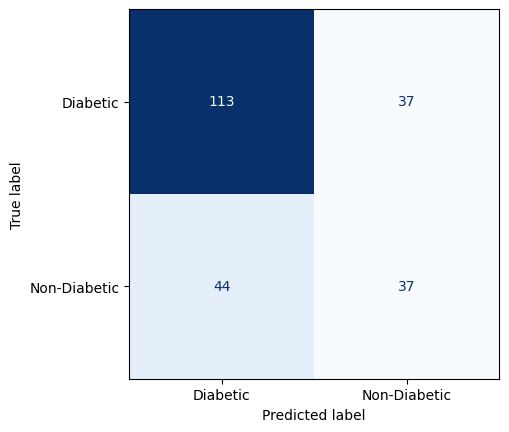

Accuracy %              : 64.9351%
Precision score         : 0.4568
Recall score            : 0.5
F1 score                : 0.6533
Cross Validation score  : 0.0
Training time           : 0.0565 Seconds




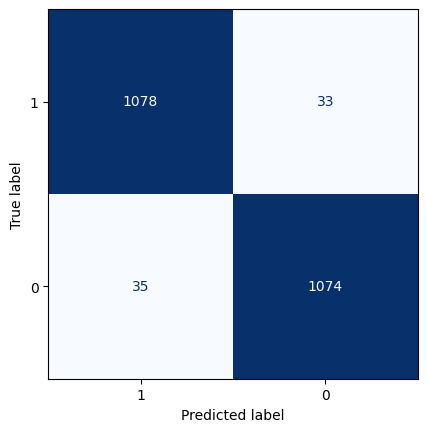

Accuracy %              : 96.9369%
Precision score         : 0.9684
Recall score            : 0.9702
F1 score                : 0.9694
Cross Validation score  : 0.9646
Training time           : 0.0031 Seconds




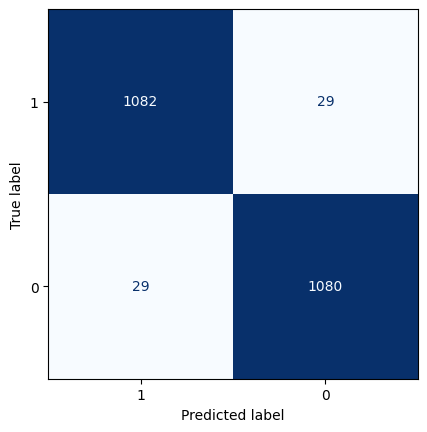

Accuracy %              : 97.3874%
Precision score         : 0.9739
Recall score            : 0.9739
F1 score                : 0.9739
Cross Validation score  : 0.9646
Training time           : 0.0051 Seconds




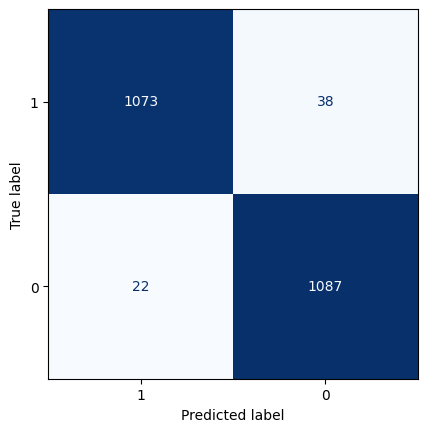

Accuracy %              : 97.2973%
Precision score         : 0.9802
Recall score            : 0.9662
F1 score                : 0.973
Cross Validation score  : 0.9649
Training time           : 0.001 Seconds




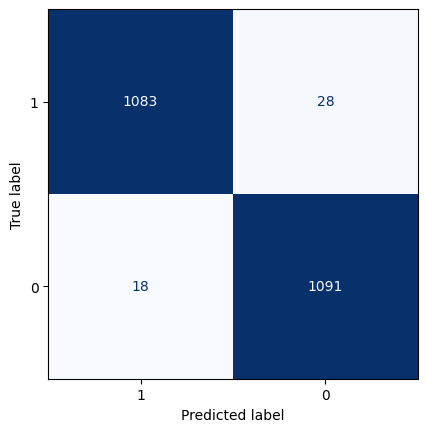

Accuracy %              : 97.9279%
Precision score         : 0.9838
Recall score            : 0.975
F1 score                : 0.9793
Cross Validation score  : 0.9704
Training time           : 0.001 Seconds




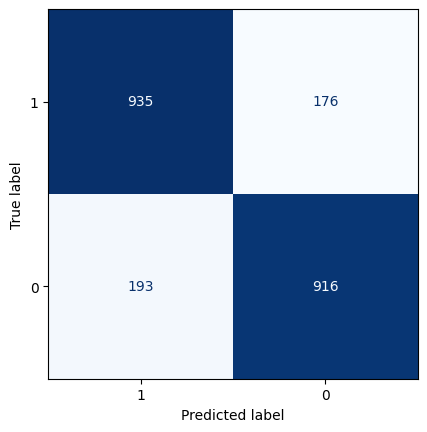

Accuracy %              : 83.3784%
Precision score         : 0.826
Recall score            : 0.8388
F1 score                : 0.8338
Cross Validation score  : 0.8424
Training time           : 0.1795 Seconds




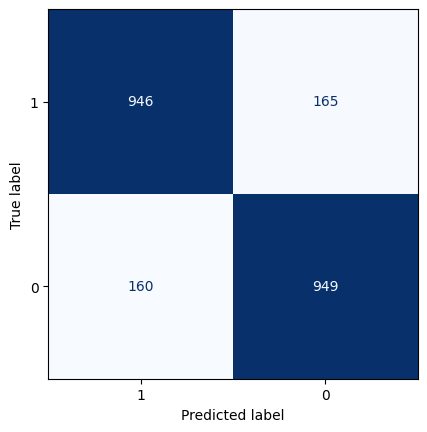

Accuracy %              : 85.3604%
Precision score         : 0.8557
Recall score            : 0.8519
F1 score                : 0.8536
Cross Validation score  : 0.852
Training time           : 0.0387 Seconds




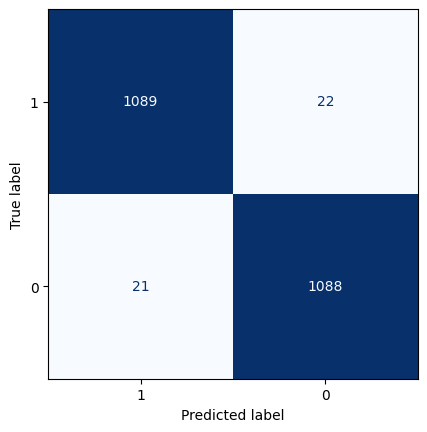

Accuracy %              : 98.0631%
Precision score         : 0.9811
Recall score            : 0.9802
F1 score                : 0.9806
Cross Validation score  : 0.9777
Training time           : 0.1357 Seconds




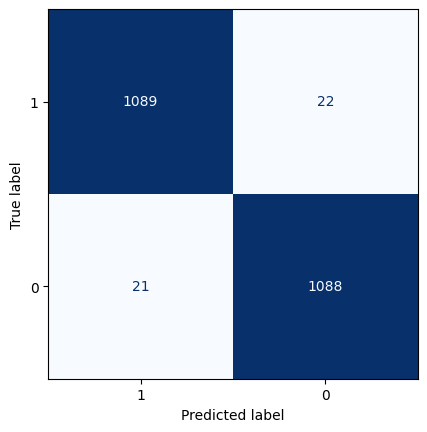

Accuracy %              : 98.0631%
Precision score         : 0.9811
Recall score            : 0.9802
F1 score                : 0.9806
Cross Validation score  : 0.9777
Training time           : 0.1442 Seconds




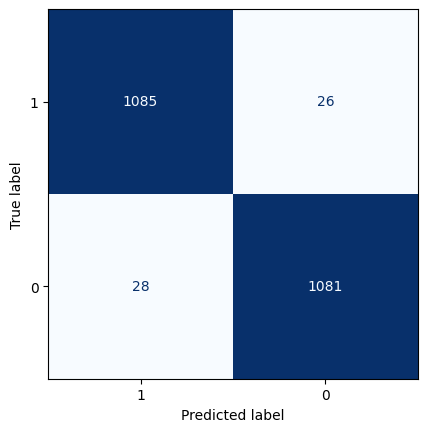

Accuracy %              : 97.5676%
Precision score         : 0.9748
Recall score            : 0.9765
F1 score                : 0.9757
Cross Validation score  : 0.9705
Training time           : 2.2843 Seconds




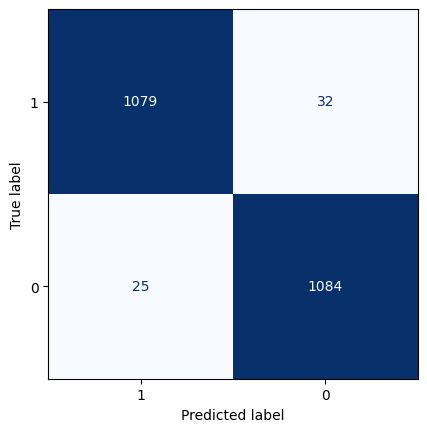

Accuracy %              : 97.4324%
Precision score         : 0.9775
Recall score            : 0.9713
F1 score                : 0.9743
Cross Validation score  : 0.9701
Training time           : 2.2738 Seconds




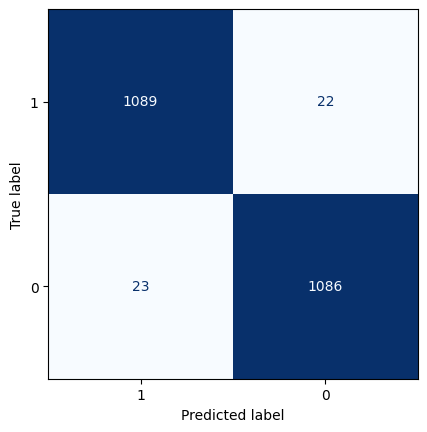

Accuracy %              : 97.973%
Precision score         : 0.9793
Recall score            : 0.9801
F1 score                : 0.9797
Cross Validation score  : 0.0
Training time           : 0.08 Seconds




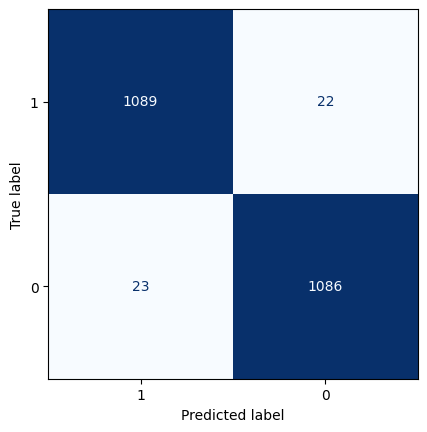

Accuracy %              : 97.973%
Precision score         : 0.9793
Recall score            : 0.9801
F1 score                : 0.9797
Cross Validation score  : 0.0
Training time           : 0.0739 Seconds




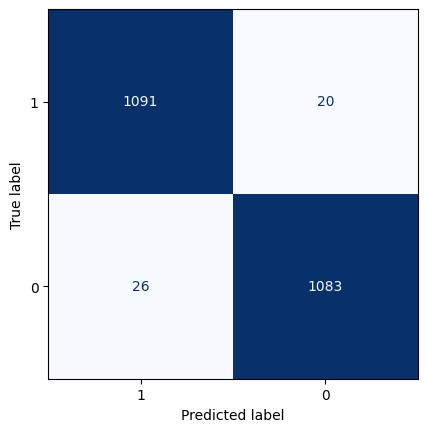

Accuracy %              : 97.9279%
Precision score         : 0.9766
Recall score            : 0.9819
F1 score                : 0.9793
Cross Validation score  : 0.0
Training time           : 0.0707 Seconds




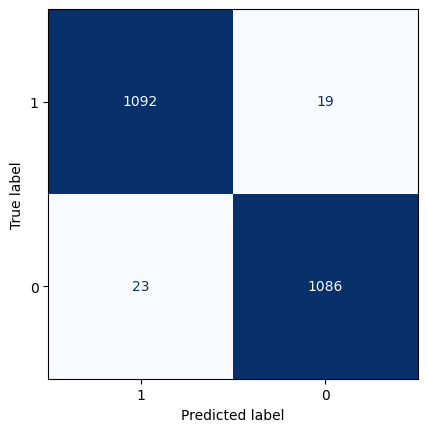

Accuracy %              : 98.1081%
Precision score         : 0.9793
Recall score            : 0.9828
F1 score                : 0.9811
Cross Validation score  : 0.0
Training time           : 0.1329 Seconds




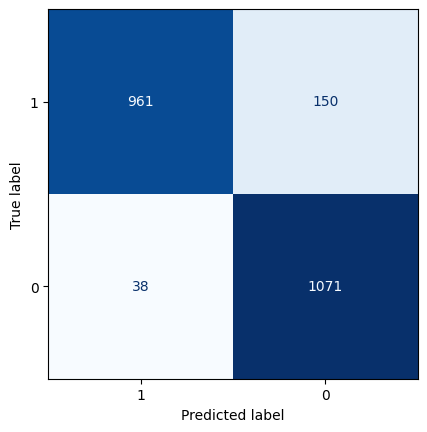

Accuracy %              : 91.5315%
Precision score         : 0.9657
Recall score            : 0.8771
F1 score                : 0.9155
Cross Validation score  : 0.0
Training time           : 1.2886 Seconds




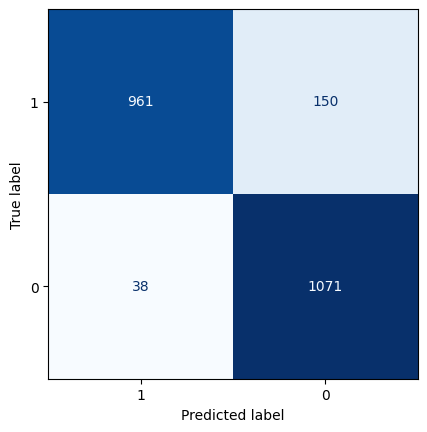

Accuracy %              : 91.5315%
Precision score         : 0.9657
Recall score            : 0.8771
F1 score                : 0.9155
Cross Validation score  : 0.0
Training time           : 1.3574 Seconds




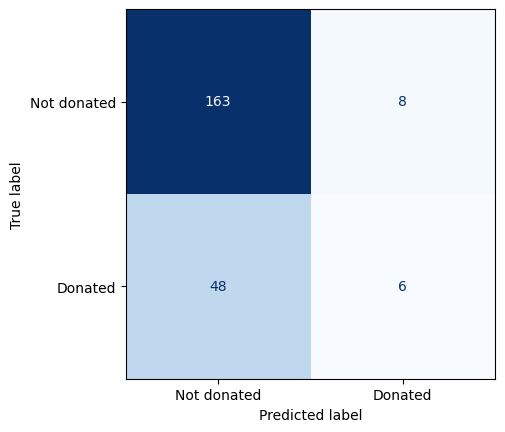

Accuracy %              : 75.1111%
Precision score         : 0.1111
Recall score            : 0.4286
F1 score                : 0.8113
Cross Validation score  : 0.658
Training time           : 0.001 Seconds




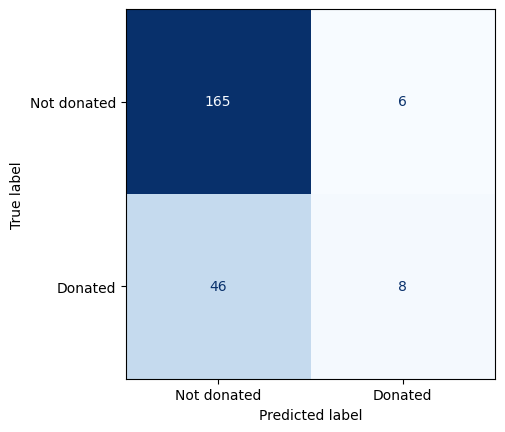

Accuracy %              : 76.8889%
Precision score         : 0.1481
Recall score            : 0.5714
F1 score                : 0.8248
Cross Validation score  : 0.658
Training time           : 0.001 Seconds




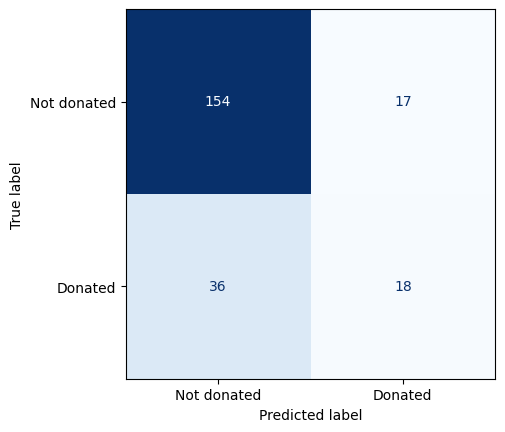

Accuracy %              : 76.4444%
Precision score         : 0.3333
Recall score            : 0.5143
F1 score                : 0.7834
Cross Validation score  : 0.6473
Training time           : 0.001 Seconds




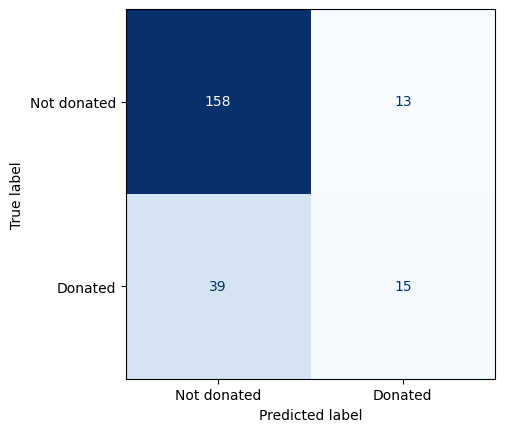

Accuracy %              : 76.8889%
Precision score         : 0.2778
Recall score            : 0.5357
F1 score                : 0.7974
Cross Validation score  : 0.6673
Training time           : 0.001 Seconds




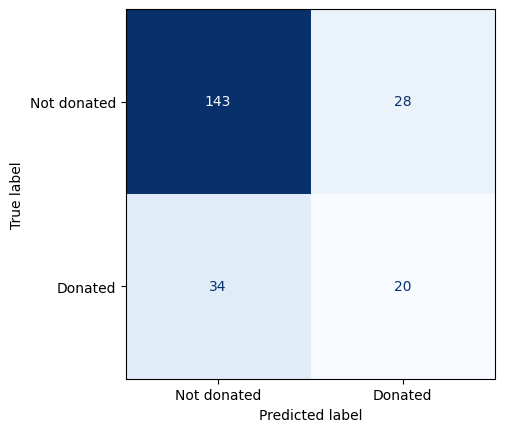

Accuracy %              : 72.4444%
Precision score         : 0.3704
Recall score            : 0.4167
F1 score                : 0.7302
Cross Validation score  : 0.6179
Training time           : 0.002 Seconds




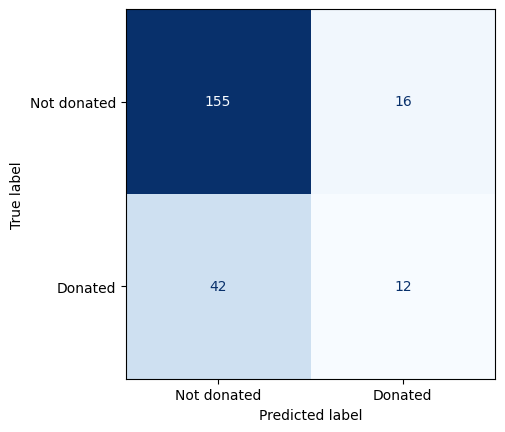

Accuracy %              : 74.2222%
Precision score         : 0.2222
Recall score            : 0.4286
F1 score                : 0.774
Cross Validation score  : 0.7127
Training time           : 0.001 Seconds




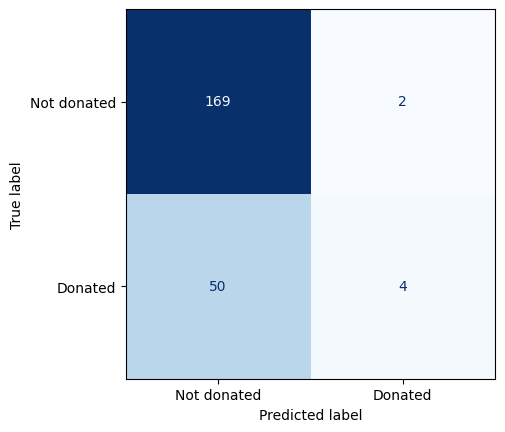

Accuracy %              : 76.8889%
Precision score         : 0.0741
Recall score            : 0.6667
F1 score                : 0.8471
Cross Validation score  : 0.758
Training time           : 0.006 Seconds




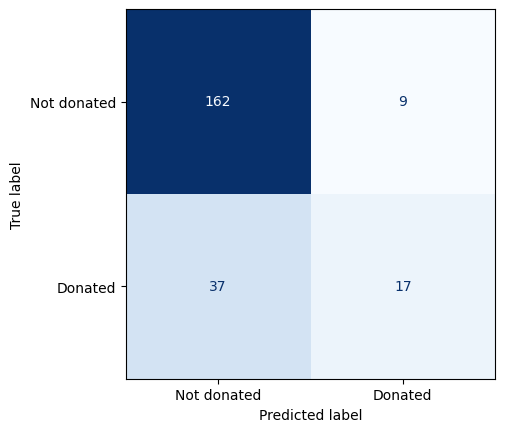

Accuracy %              : 79.5556%
Precision score         : 0.3148
Recall score            : 0.6538
F1 score                : 0.8236
Cross Validation score  : 0.7594
Training time           : 0.009 Seconds




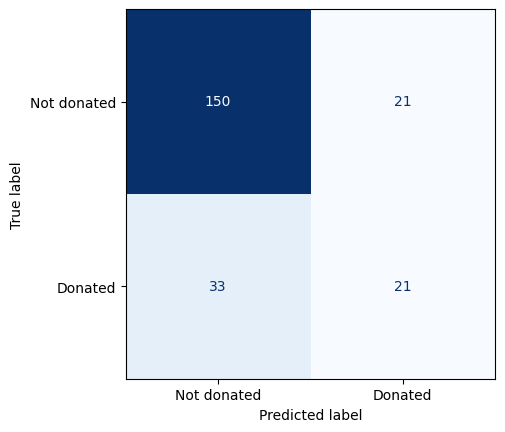

Accuracy %              : 76.0%
Precision score         : 0.3889
Recall score            : 0.5
F1 score                : 0.7709
Cross Validation score  : 0.6673
Training time           : 0.1784 Seconds




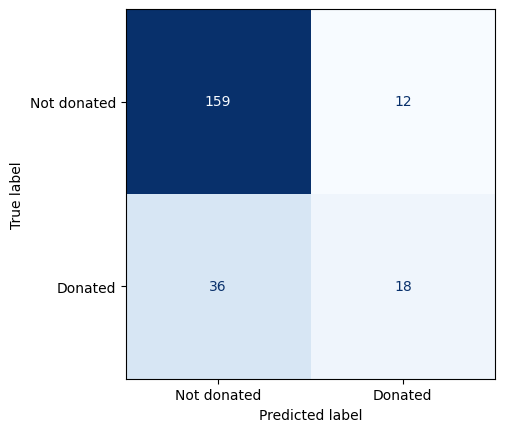

Accuracy %              : 78.6667%
Precision score         : 0.3333
Recall score            : 0.6
F1 score                : 0.8101
Cross Validation score  : 0.7274
Training time           : 0.0506 Seconds




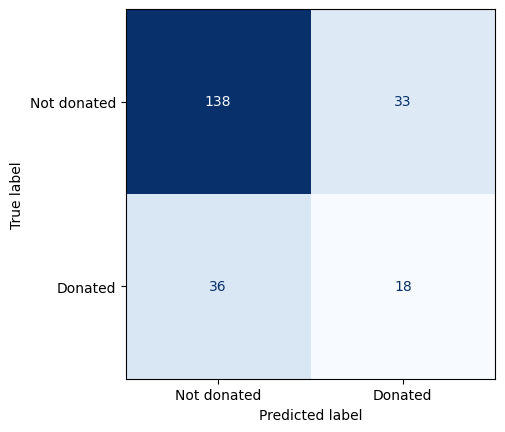

Accuracy %              : 69.3333%
Precision score         : 0.3333
Recall score            : 0.3529
F1 score                : 0.6964
Cross Validation score  : 0.0
Training time           : 0.1253 Seconds




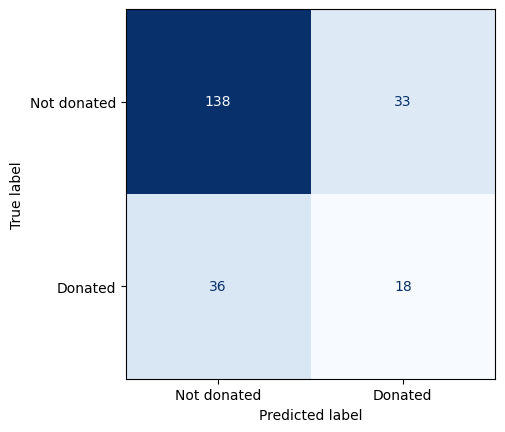

Accuracy %              : 69.3333%
Precision score         : 0.3333
Recall score            : 0.3529
F1 score                : 0.6964
Cross Validation score  : 0.0
Training time           : 0.1074 Seconds




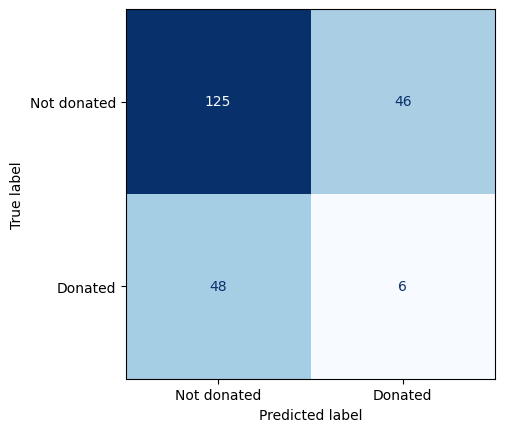

Accuracy %              : 58.2222%
Precision score         : 0.1111
Recall score            : 0.1154
F1 score                : 0.5849
Cross Validation score  : 0.0
Training time           : 0.2277 Seconds




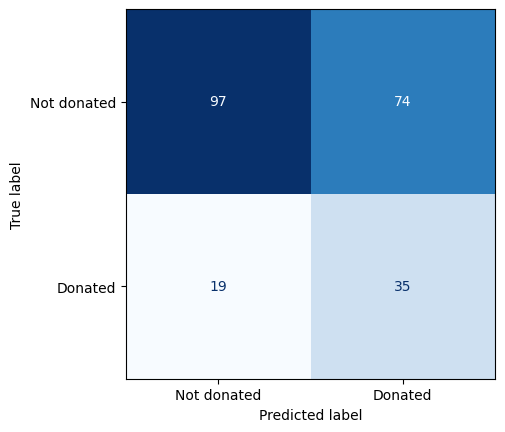

Accuracy %              : 58.6667%
Precision score         : 0.6481
Recall score            : 0.3211
F1 score                : 0.5565
Cross Validation score  : 0.0
Training time           : 0.1878 Seconds




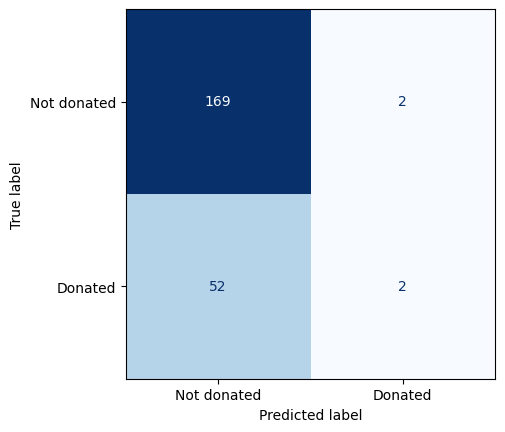

Accuracy %              : 76.0%
Precision score         : 0.037
Recall score            : 0.5
F1 score                : 0.8481
Cross Validation score  : 0.0
Training time           : 0.021 Seconds




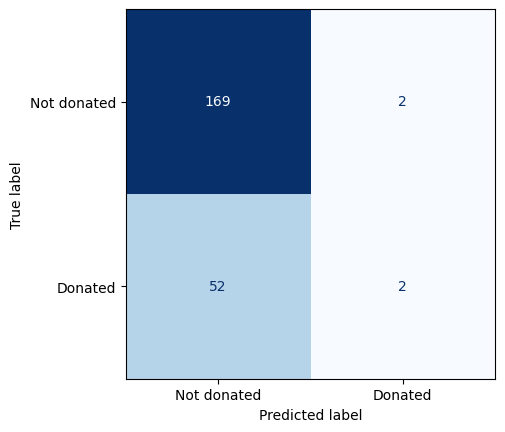

Accuracy %              : 76.0%
Precision score         : 0.037
Recall score            : 0.5
F1 score                : 0.8481
Cross Validation score  : 0.0
Training time           : 0.0236 Seconds




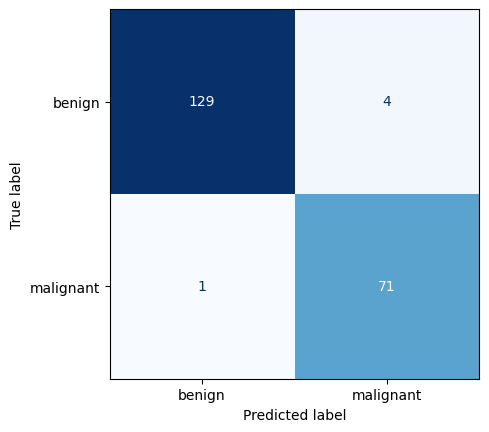

Accuracy %              : 97.561%
Precision score         : 0.9861
Recall score            : 0.9467
F1 score                : 0.9755
Cross Validation score  : 0.9371
Training time           : 0.001 Seconds




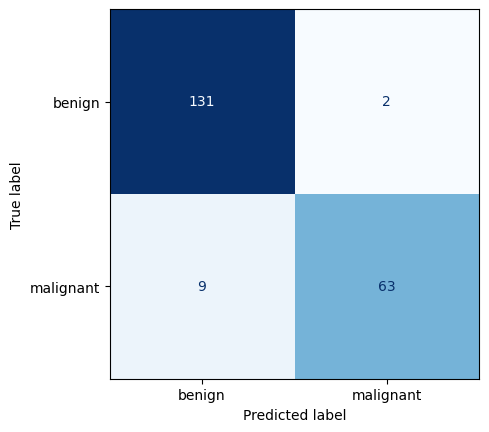

Accuracy %              : 94.6341%
Precision score         : 0.875
Recall score            : 0.9692
F1 score                : 0.947
Cross Validation score  : 0.9328
Training time           : 0.001 Seconds




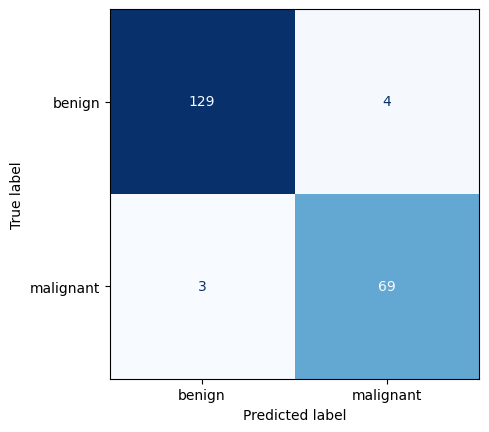

Accuracy %              : 96.5854%
Precision score         : 0.9583
Recall score            : 0.9452
F1 score                : 0.9658
Cross Validation score  : 0.9663
Training time           : 0.001 Seconds




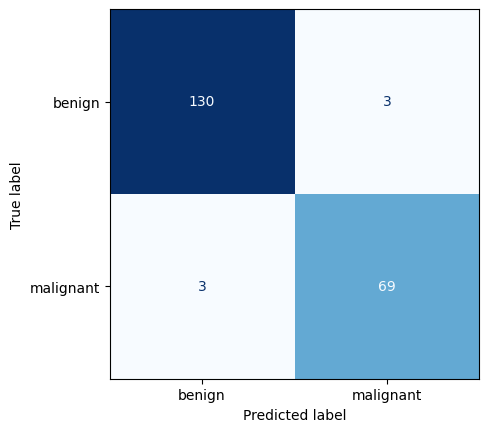

Accuracy %              : 97.0732%
Precision score         : 0.9583
Recall score            : 0.9583
F1 score                : 0.9707
Cross Validation score  : 0.9649
Training time           : 0.001 Seconds




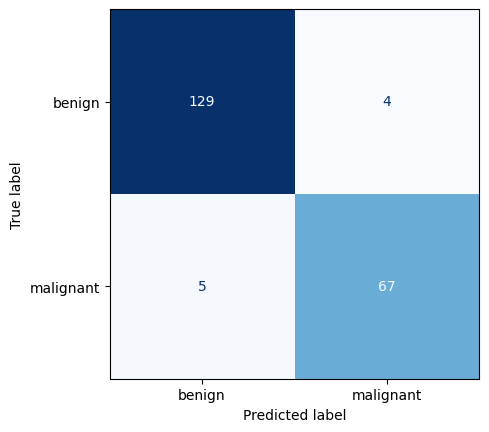

Accuracy %              : 95.6098%
Precision score         : 0.9306
Recall score            : 0.9437
F1 score                : 0.9562
Cross Validation score  : 0.937
Training time           : 0.001 Seconds




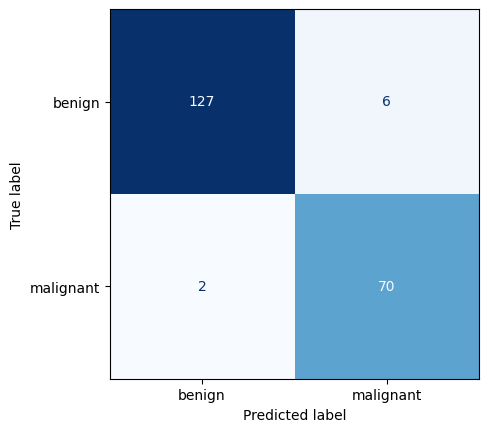

Accuracy %              : 96.0976%
Precision score         : 0.9722
Recall score            : 0.9211
F1 score                : 0.9607
Cross Validation score  : 0.9414
Training time           : 0.0011 Seconds




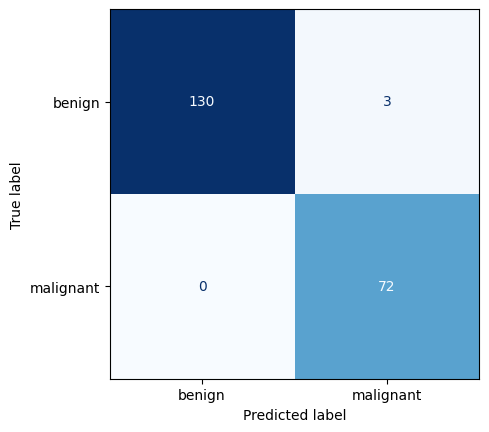

Accuracy %              : 98.5366%
Precision score         : 1.0
Recall score            : 0.96
F1 score                : 0.9853
Cross Validation score  : 0.9634
Training time           : 0.0031 Seconds




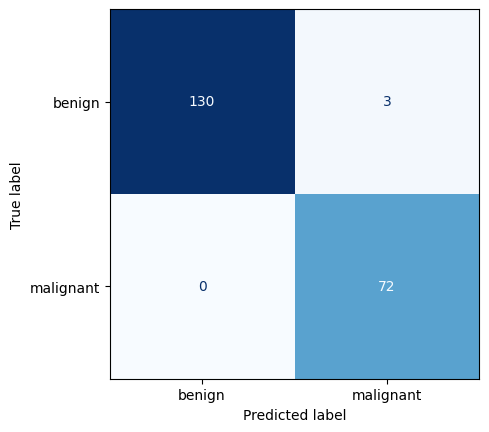

Accuracy %              : 98.5366%
Precision score         : 1.0
Recall score            : 0.96
F1 score                : 0.9853
Cross Validation score  : 0.9634
Training time           : 0.0036 Seconds




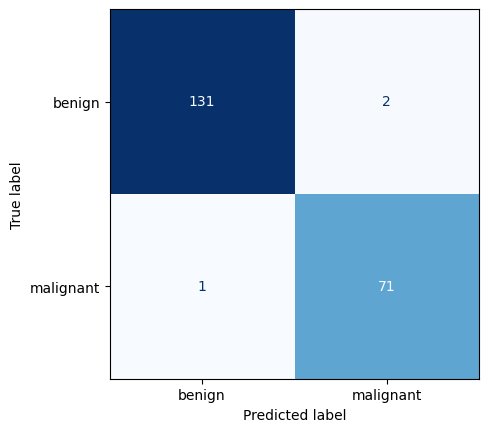

Accuracy %              : 98.5366%
Precision score         : 0.9861
Recall score            : 0.9726
F1 score                : 0.9853
Cross Validation score  : 0.962
Training time           : 0.141 Seconds




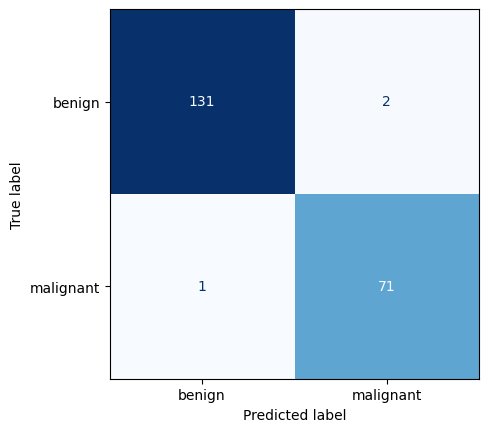

Accuracy %              : 98.5366%
Precision score         : 0.9861
Recall score            : 0.9726
F1 score                : 0.9853
Cross Validation score  : 0.9663
Training time           : 0.1437 Seconds




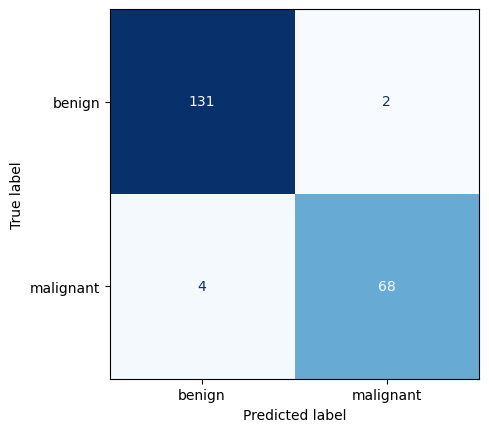

Accuracy %              : 97.0732%
Precision score         : 0.9444
Recall score            : 0.9714
F1 score                : 0.9708
Cross Validation score  : 0.0
Training time           : 0.1031 Seconds




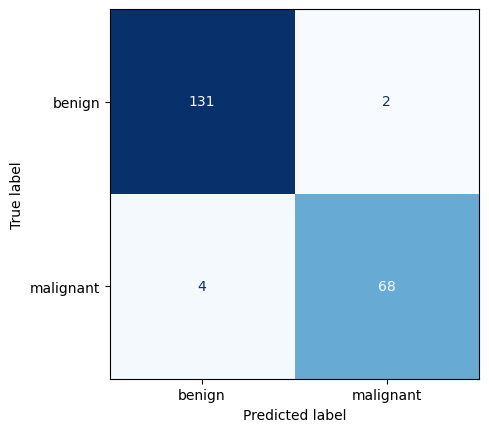

Accuracy %              : 97.0732%
Precision score         : 0.9444
Recall score            : 0.9714
F1 score                : 0.9708
Cross Validation score  : 0.0
Training time           : 0.101 Seconds




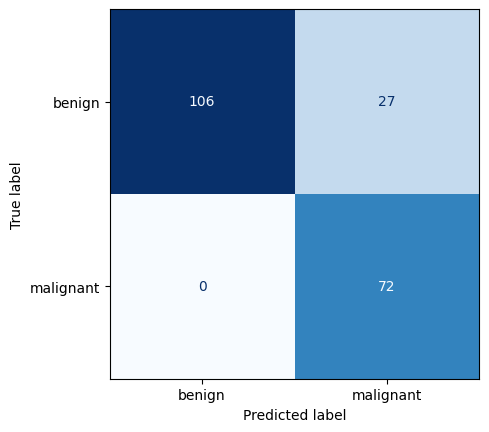

Accuracy %              : 86.8293%
Precision score         : 1.0
Recall score            : 0.7273
F1 score                : 0.8653
Cross Validation score  : 0.0
Training time           : 0.0955 Seconds




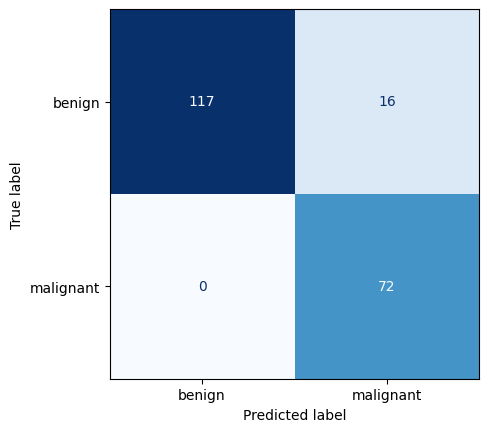

Accuracy %              : 92.1951%
Precision score         : 1.0
Recall score            : 0.8182
F1 score                : 0.9205
Cross Validation score  : 0.0
Training time           : 0.1177 Seconds




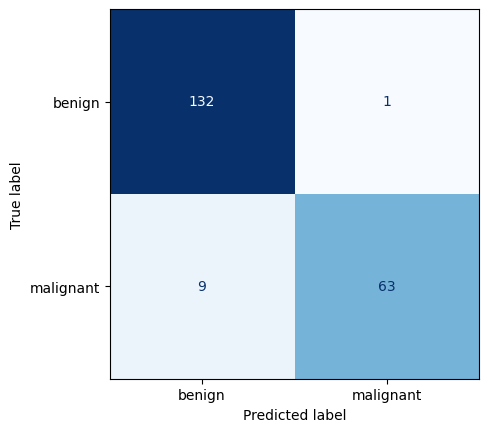

Accuracy %              : 95.122%
Precision score         : 0.875
Recall score            : 0.9844
F1 score                : 0.9519
Cross Validation score  : 0.0
Training time           : 0.0346 Seconds




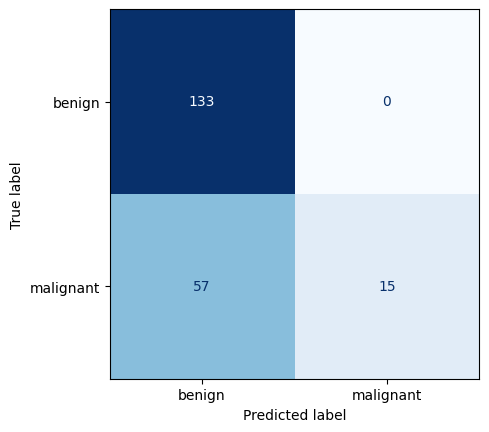

Accuracy %              : 72.1951%
Precision score         : 0.2083
Recall score            : 1.0
F1 score                : 0.7885
Cross Validation score  : 0.0
Training time           : 0.0285 Seconds




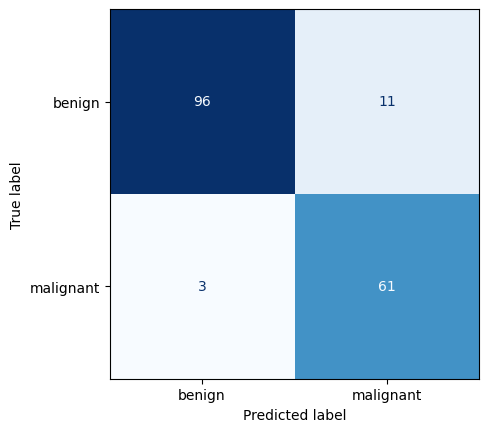

Accuracy %              : 91.8129%
Precision score         : 0.9531
Recall score            : 0.8472
F1 score                : 0.9173
Cross Validation score  : 0.8839
Training time           : 0.001 Seconds




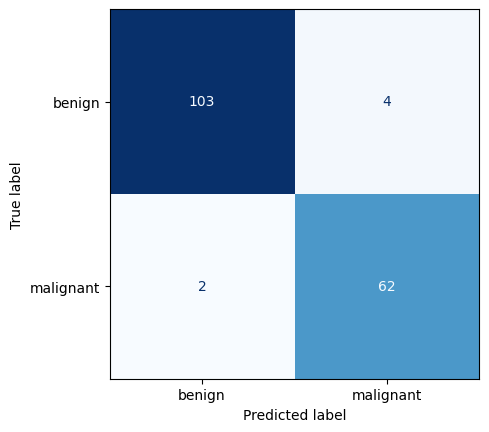

Accuracy %              : 96.4912%
Precision score         : 0.9688
Recall score            : 0.9394
F1 score                : 0.9648
Cross Validation score  : 0.8278
Training time           : 0.002 Seconds




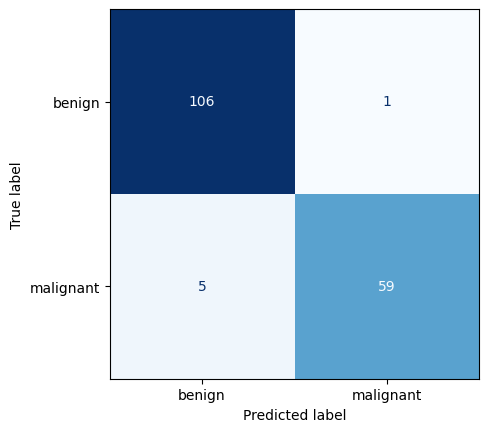

Accuracy %              : 96.4912%
Precision score         : 0.9219
Recall score            : 0.9833
F1 score                : 0.9652
Cross Validation score  : 0.9191
Training time           : 0.0 Seconds




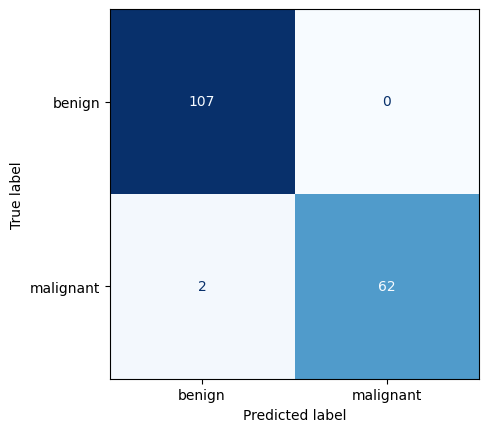

Accuracy %              : 98.8304%
Precision score         : 0.9688
Recall score            : 1.0
F1 score                : 0.9883
Cross Validation score  : 0.9315
Training time           : 0.0009 Seconds




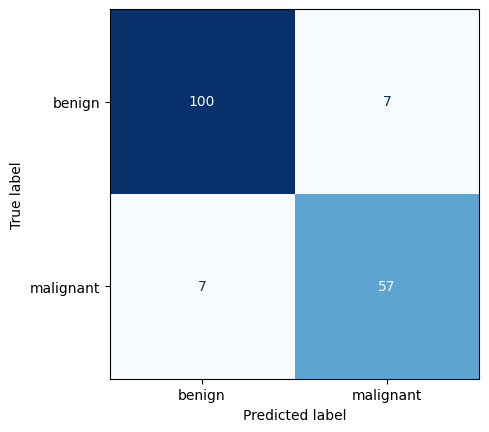

Accuracy %              : 91.8129%
Precision score         : 0.8906
Recall score            : 0.8906
F1 score                : 0.9181
Cross Validation score  : 0.9209
Training time           : 0.0079 Seconds




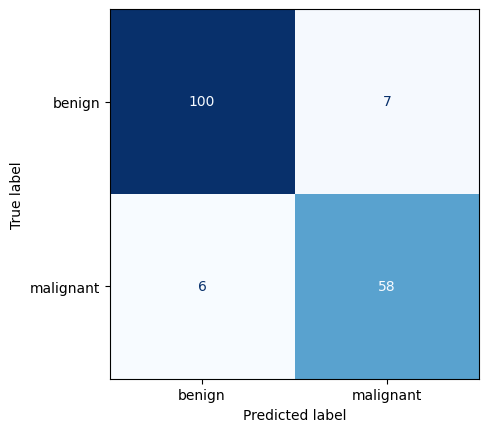

Accuracy %              : 92.3977%
Precision score         : 0.9062
Recall score            : 0.8923
F1 score                : 0.9239
Cross Validation score  : 0.9191
Training time           : 0.006 Seconds




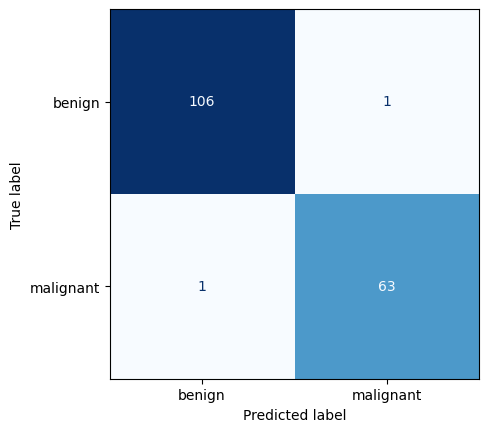

Accuracy %              : 98.8304%
Precision score         : 0.9844
Recall score            : 0.9844
F1 score                : 0.9883
Cross Validation score  : 0.9122
Training time           : 0.005 Seconds




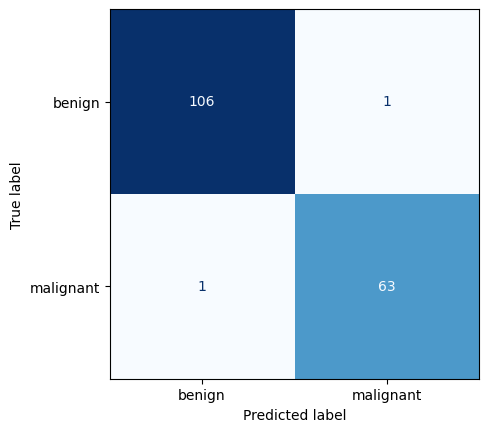

Accuracy %              : 98.8304%
Precision score         : 0.9844
Recall score            : 0.9844
F1 score                : 0.9883
Cross Validation score  : 0.9122
Training time           : 0.003 Seconds




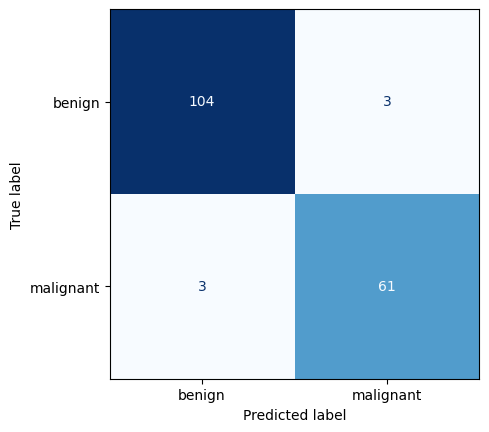

Accuracy %              : 96.4912%
Precision score         : 0.9531
Recall score            : 0.9531
F1 score                : 0.9649
Cross Validation score  : 0.9614
Training time           : 0.2361 Seconds




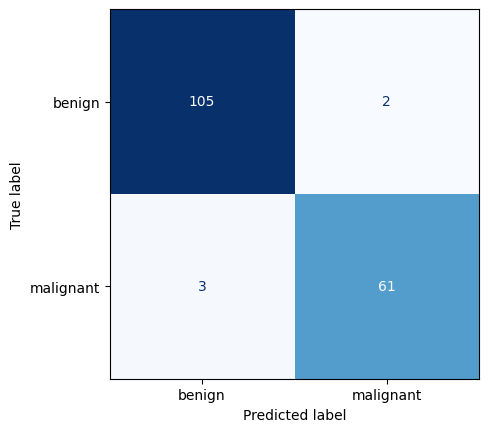

Accuracy %              : 97.076%
Precision score         : 0.9531
Recall score            : 0.9683
F1 score                : 0.9708
Cross Validation score  : 0.9578
Training time           : 0.2039 Seconds




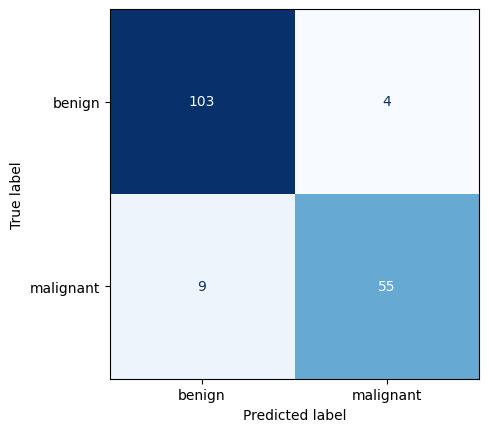

Accuracy %              : 92.3977%
Precision score         : 0.8594
Recall score            : 0.9322
F1 score                : 0.9247
Cross Validation score  : 0.0
Training time           : 0.104 Seconds




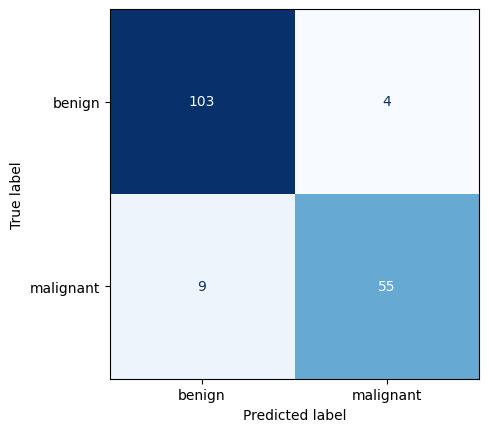

Accuracy %              : 92.3977%
Precision score         : 0.8594
Recall score            : 0.9322
F1 score                : 0.9247
Cross Validation score  : 0.0
Training time           : 0.0965 Seconds




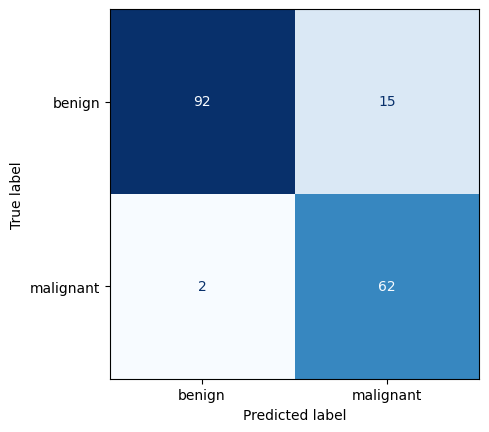

Accuracy %              : 90.0585%
Precision score         : 0.9688
Recall score            : 0.8052
F1 score                : 0.8992
Cross Validation score  : 0.0
Training time           : 0.0516 Seconds




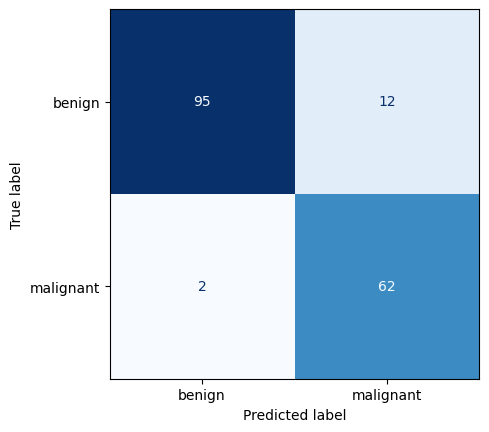

Accuracy %              : 91.8129%
Precision score         : 0.9688
Recall score            : 0.8378
F1 score                : 0.9172
Cross Validation score  : 0.0
Training time           : 0.0276 Seconds




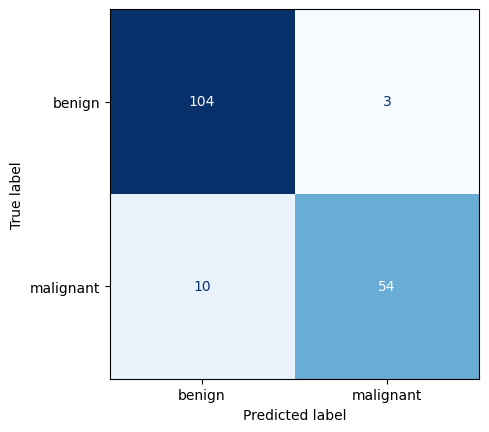

Accuracy %              : 92.3977%
Precision score         : 0.8438
Recall score            : 0.9474
F1 score                : 0.925
Cross Validation score  : 0.0
Training time           : 0.0477 Seconds




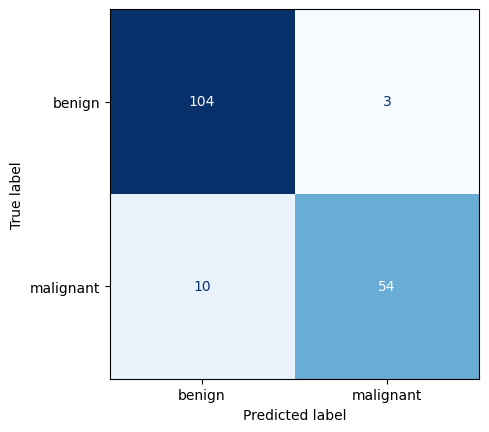

Accuracy %              : 92.3977%
Precision score         : 0.8438
Recall score            : 0.9474
F1 score                : 0.925
Cross Validation score  : 0.0
Training time           : 0.041 Seconds




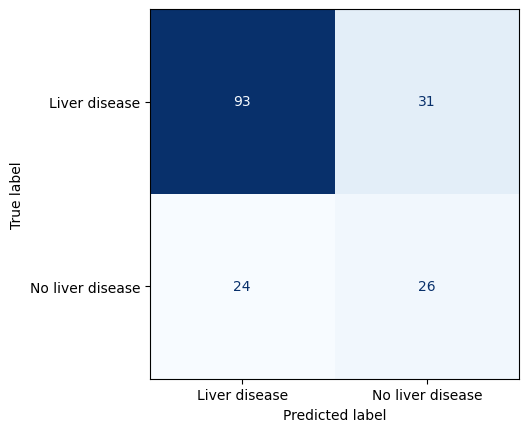

Accuracy %              : 68.3908%
Precision score         : 0.75
Recall score            : 0.7949
F1 score                : 0.6782
Cross Validation score  : 0.5771
Training time           : 0.0011 Seconds




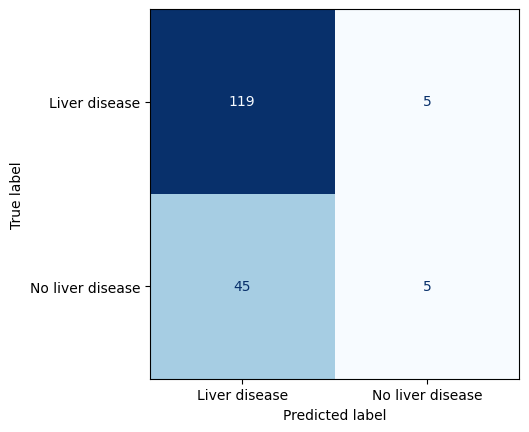

Accuracy %              : 71.2644%
Precision score         : 0.9597
Recall score            : 0.7256
F1 score                : 0.7885
Cross Validation score  : 0.5426
Training time           : 0.002 Seconds




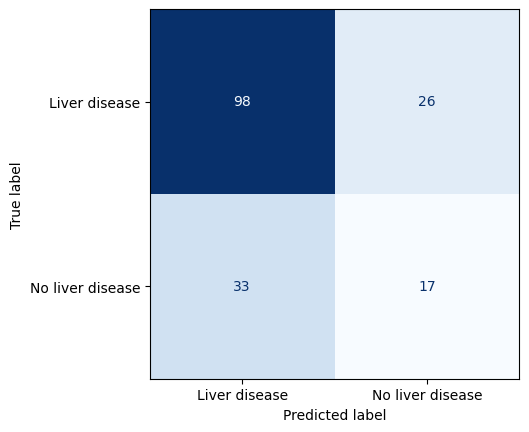

Accuracy %              : 66.092%
Precision score         : 0.7903
Recall score            : 0.7481
F1 score                : 0.669
Cross Validation score  : 0.6478
Training time           : 0.001 Seconds




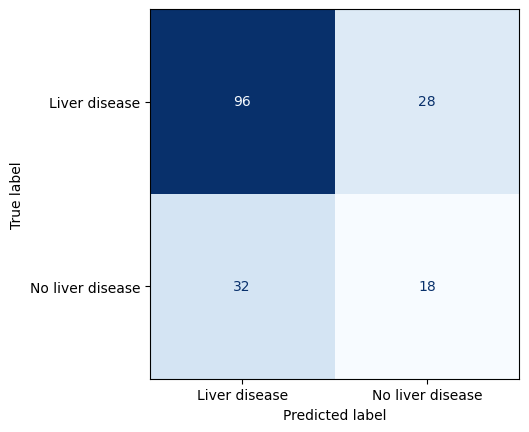

Accuracy %              : 65.5172%
Precision score         : 0.7742
Recall score            : 0.75
F1 score                : 0.6596
Cross Validation score  : 0.653
Training time           : 0.001 Seconds




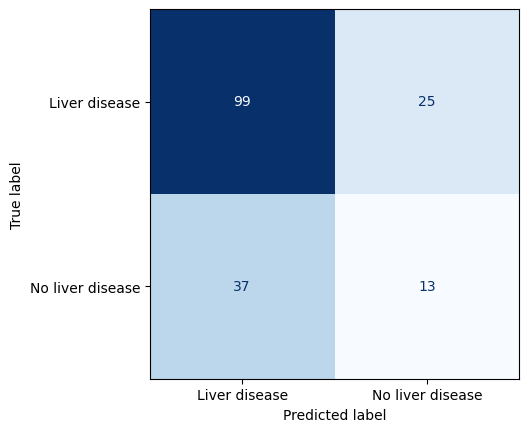

Accuracy %              : 64.3678%
Precision score         : 0.7984
Recall score            : 0.7279
F1 score                : 0.6598
Cross Validation score  : 0.6564
Training time           : 0.004 Seconds




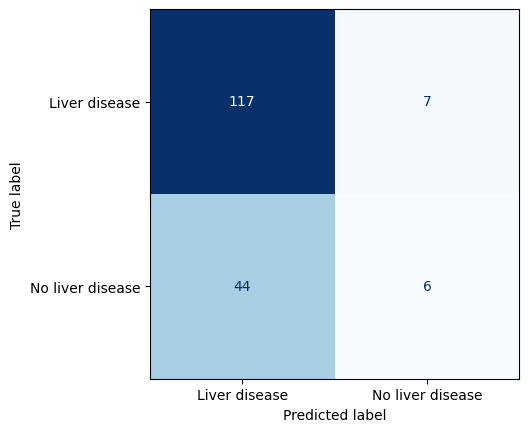

Accuracy %              : 70.6897%
Precision score         : 0.9435
Recall score            : 0.7267
F1 score                : 0.7739
Cross Validation score  : 0.6961
Training time           : 0.0021 Seconds




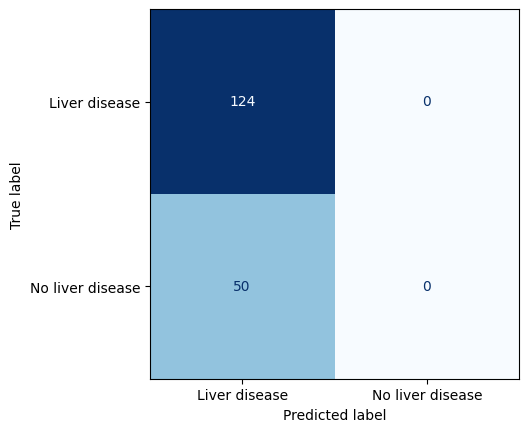

Accuracy %              : 71.2644%
Precision score         : 1.0
Recall score            : 0.7126
F1 score                : 0.8322
Cross Validation score  : 0.715
Training time           : 0.006 Seconds




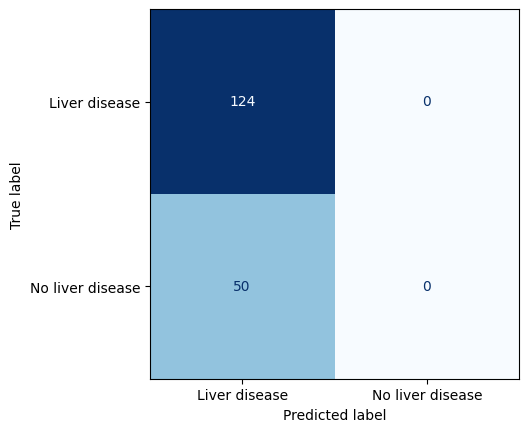

Accuracy %              : 71.2644%
Precision score         : 1.0
Recall score            : 0.7126
F1 score                : 0.8322
Cross Validation score  : 0.715
Training time           : 0.006 Seconds




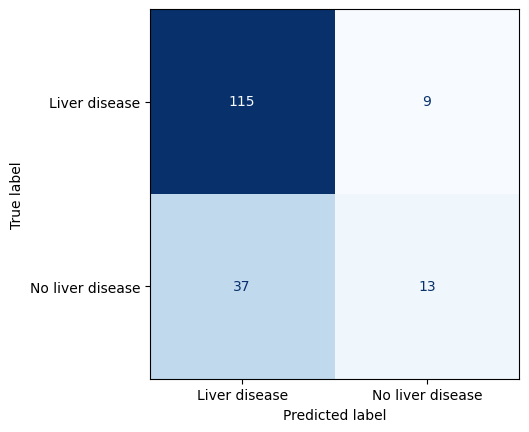

Accuracy %              : 73.5632%
Precision score         : 0.9274
Recall score            : 0.7566
F1 score                : 0.7736
Cross Validation score  : 0.6909
Training time           : 0.1779 Seconds




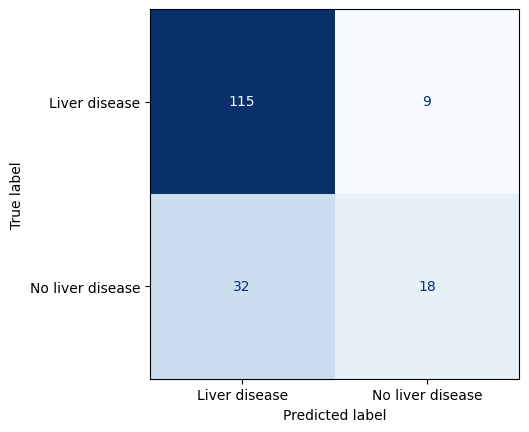

Accuracy %              : 76.4368%
Precision score         : 0.9274
Recall score            : 0.7823
F1 score                : 0.7896
Cross Validation score  : 0.6961
Training time           : 0.09 Seconds




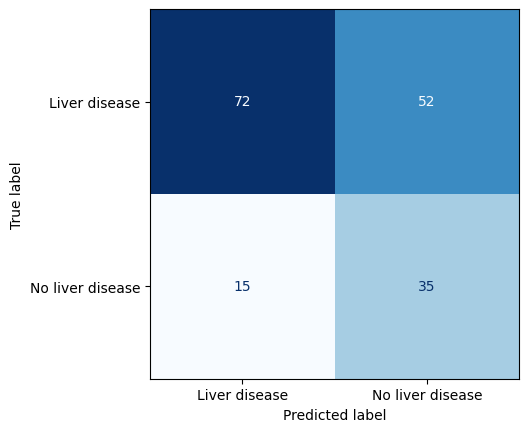

Accuracy %              : 61.4943%
Precision score         : 0.5806
Recall score            : 0.8276
F1 score                : 0.5967
Cross Validation score  : 0.0
Training time           : 0.1096 Seconds




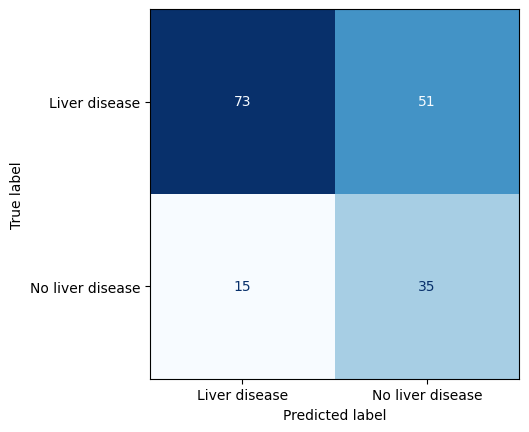

Accuracy %              : 62.069%
Precision score         : 0.5887
Recall score            : 0.8295
F1 score                : 0.6027
Cross Validation score  : 0.0
Training time           : 0.1046 Seconds




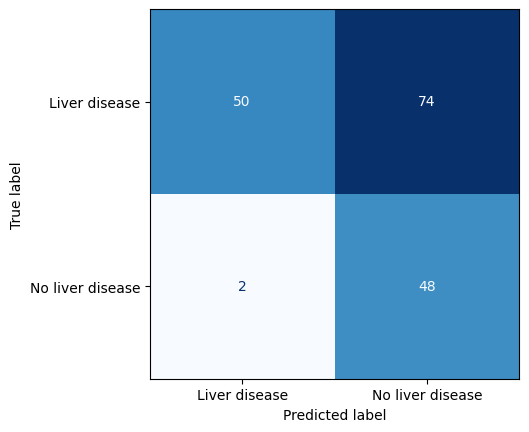

Accuracy %              : 56.3218%
Precision score         : 0.4032
Recall score            : 0.9615
F1 score                : 0.5611
Cross Validation score  : 0.0
Training time           : 0.0723 Seconds




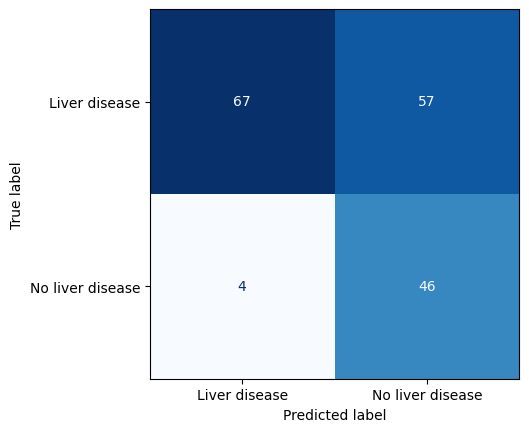

Accuracy %              : 64.9425%
Precision score         : 0.5403
Recall score            : 0.9437
F1 score                : 0.6363
Cross Validation score  : 0.0
Training time           : 0.177 Seconds




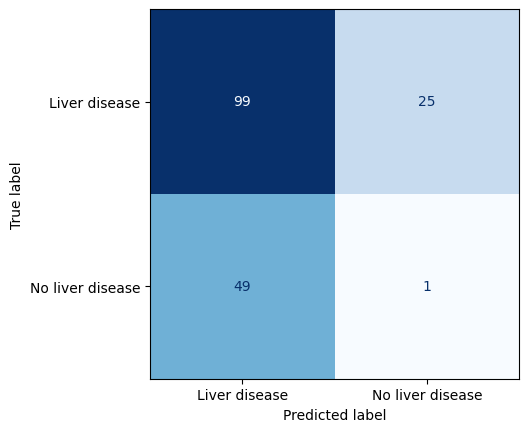

Accuracy %              : 57.4713%
Precision score         : 0.7984
Recall score            : 0.6689
F1 score                : 0.6231
Cross Validation score  : 0.0
Training time           : 0.0347 Seconds




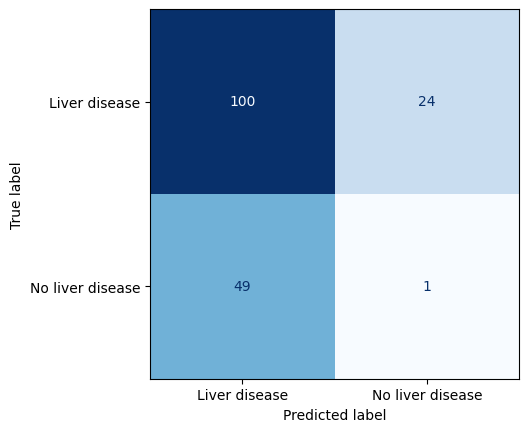

Accuracy %              : 58.046%
Precision score         : 0.8065
Recall score            : 0.6711
F1 score                : 0.6312
Cross Validation score  : 0.0
Training time           : 0.0411 Seconds




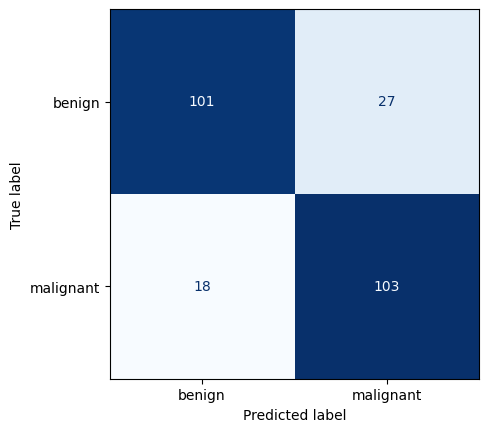

Accuracy %              : 81.9277%
Precision score         : 0.8512
Recall score            : 0.7923
F1 score                : 0.8193
Cross Validation score  : 0.7022
Training time           : 0.002 Seconds




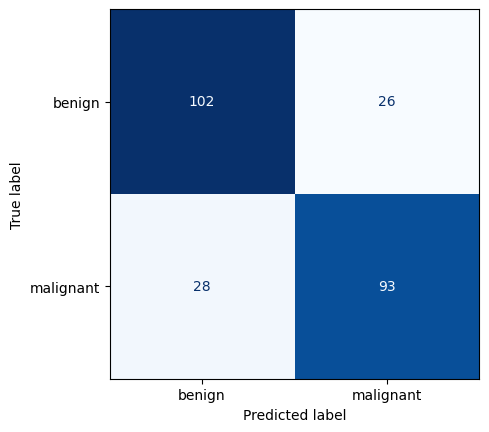

Accuracy %              : 78.3133%
Precision score         : 0.7686
Recall score            : 0.7815
F1 score                : 0.7832
Cross Validation score  : 0.6504
Training time           : 0.002 Seconds




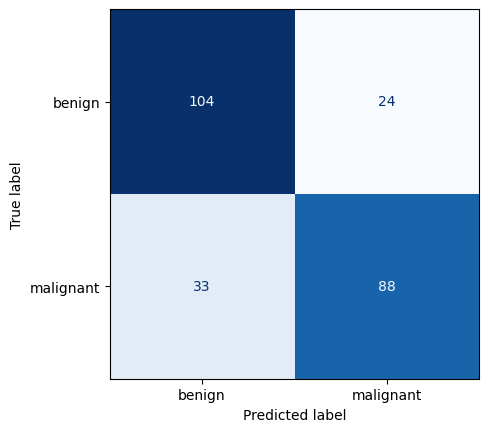

Accuracy %              : 77.1084%
Precision score         : 0.7273
Recall score            : 0.7857
F1 score                : 0.7716
Cross Validation score  : 0.7901
Training time           : 0.002 Seconds




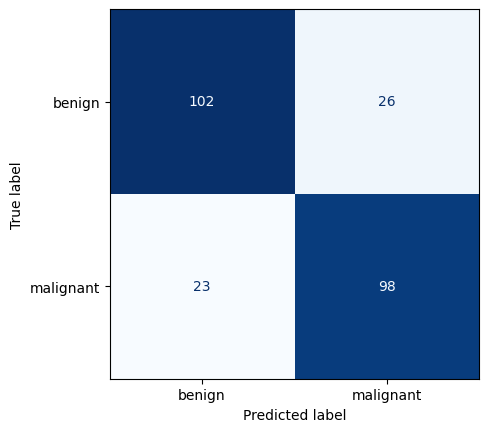

Accuracy %              : 80.3213%
Precision score         : 0.8099
Recall score            : 0.7903
F1 score                : 0.8032
Cross Validation score  : 0.8034
Training time           : 0.001 Seconds




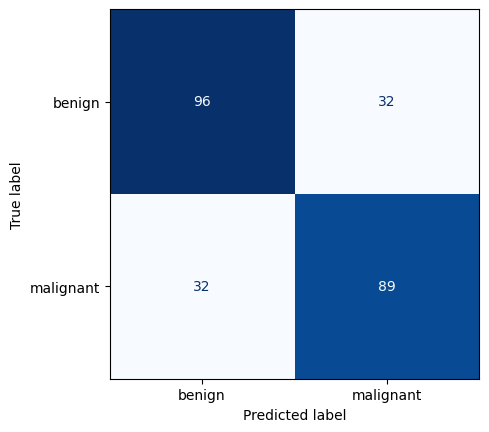

Accuracy %              : 74.2972%
Precision score         : 0.7355
Recall score            : 0.7355
F1 score                : 0.743
Cross Validation score  : 0.7551
Training time           : 0.002 Seconds




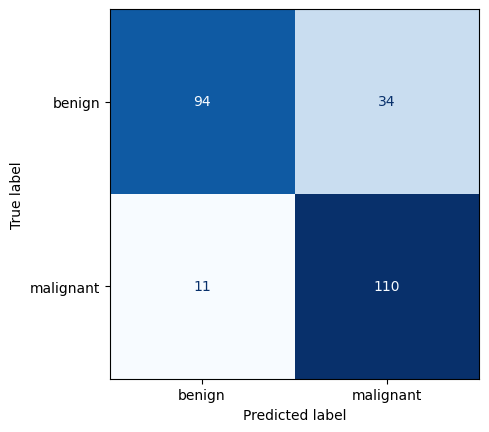

Accuracy %              : 81.9277%
Precision score         : 0.9091
Recall score            : 0.7639
F1 score                : 0.8204
Cross Validation score  : 0.819
Training time           : 0.002 Seconds




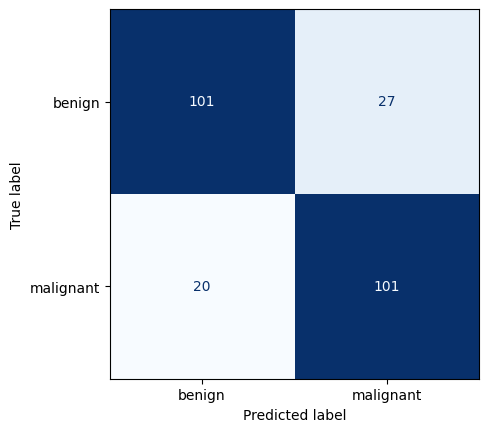

Accuracy %              : 81.1245%
Precision score         : 0.8347
Recall score            : 0.7891
F1 score                : 0.8112
Cross Validation score  : 0.778
Training time           : 0.0071 Seconds




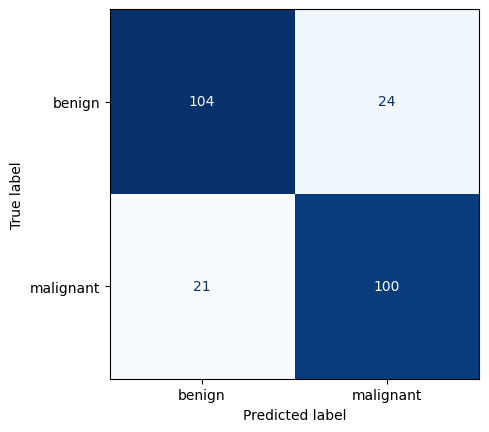

Accuracy %              : 81.9277%
Precision score         : 0.8264
Recall score            : 0.8065
F1 score                : 0.8192
Cross Validation score  : 0.813
Training time           : 0.0221 Seconds




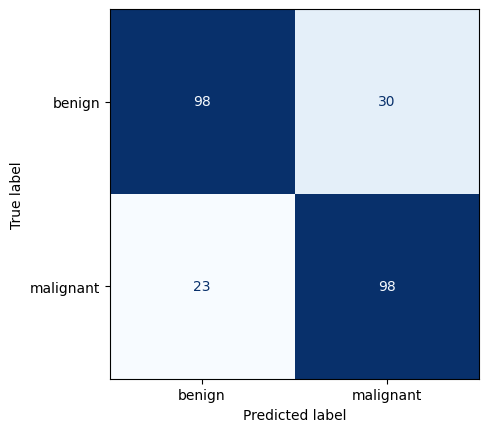

Accuracy %              : 78.7149%
Precision score         : 0.8099
Recall score            : 0.7656
F1 score                : 0.7871
Cross Validation score  : 0.7852
Training time           : 0.1644 Seconds




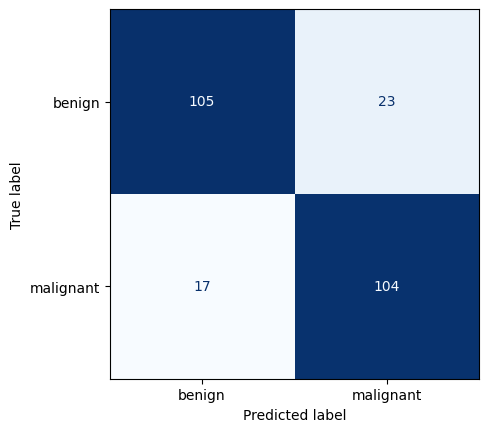

Accuracy %              : 83.9357%
Precision score         : 0.8595
Recall score            : 0.8189
F1 score                : 0.8393
Cross Validation score  : 0.8383
Training time           : 0.0768 Seconds




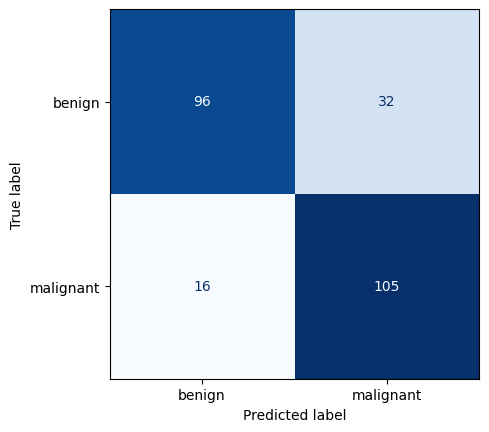

Accuracy %              : 80.7229%
Precision score         : 0.8678
Recall score            : 0.7664
F1 score                : 0.8077
Cross Validation score  : 0.0
Training time           : 0.1062 Seconds




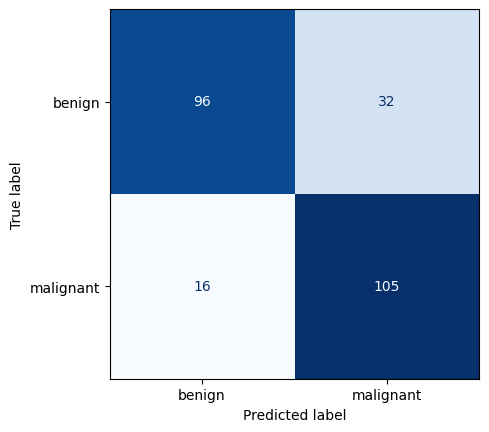

Accuracy %              : 80.7229%
Precision score         : 0.8678
Recall score            : 0.7664
F1 score                : 0.8077
Cross Validation score  : 0.0
Training time           : 0.0965 Seconds




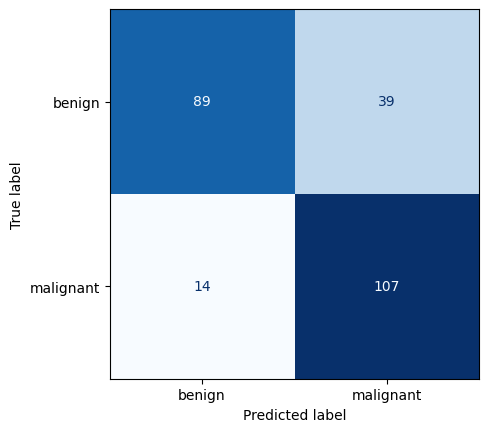

Accuracy %              : 78.7149%
Precision score         : 0.8843
Recall score            : 0.7329
F1 score                : 0.7887
Cross Validation score  : 0.0
Training time           : 0.0553 Seconds




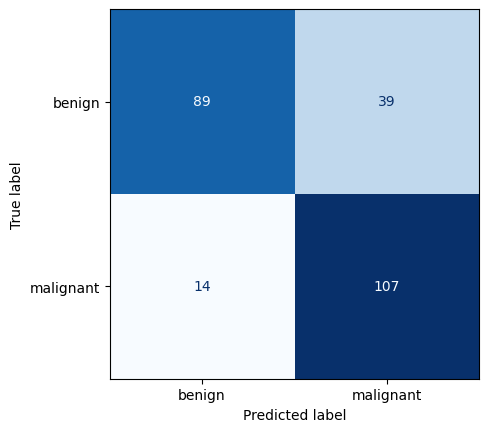

Accuracy %              : 78.7149%
Precision score         : 0.8843
Recall score            : 0.7329
F1 score                : 0.7887
Cross Validation score  : 0.0
Training time           : 0.1217 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


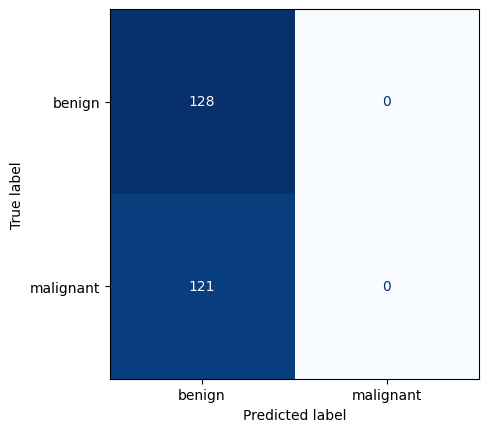

Accuracy %              : 51.4056%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.679
Cross Validation score  : 0.0
Training time           : 0.0281 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


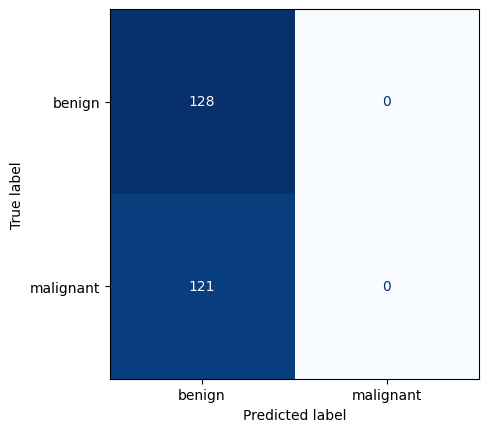

Accuracy %              : 51.4056%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.679
Cross Validation score  : 0.0
Training time           : 0.0221 Seconds




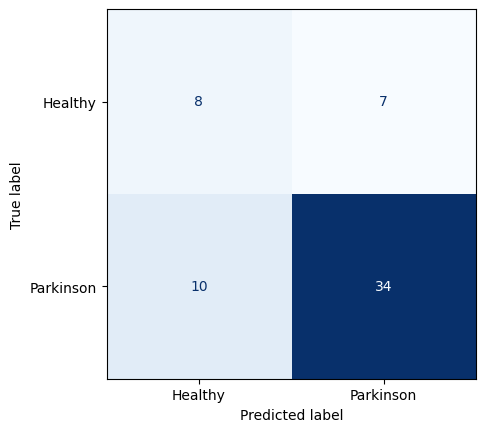

Accuracy %              : 71.1864%
Precision score         : 0.7727
Recall score            : 0.8293
F1 score                : 0.7039
Cross Validation score  : 0.4615
Training time           : 0.001 Seconds




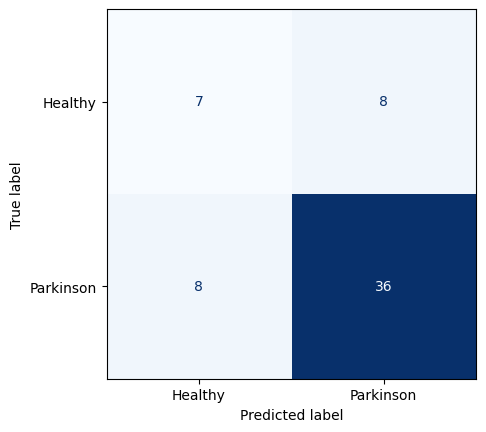

Accuracy %              : 72.8814%
Precision score         : 0.8182
Recall score            : 0.8182
F1 score                : 0.7288
Cross Validation score  : 0.4615
Training time           : 0.0019 Seconds




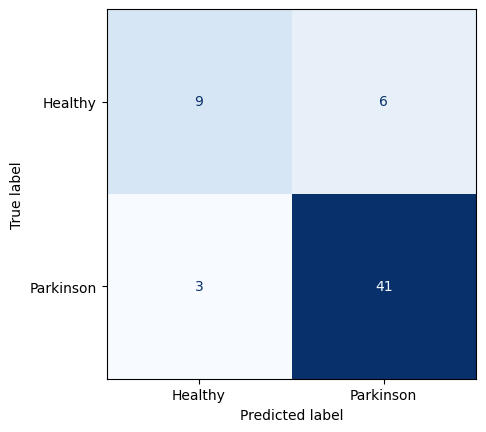

Accuracy %              : 84.7458%
Precision score         : 0.9318
Recall score            : 0.8723
F1 score                : 0.8534
Cross Validation score  : 0.7179
Training time           : 0.0009 Seconds




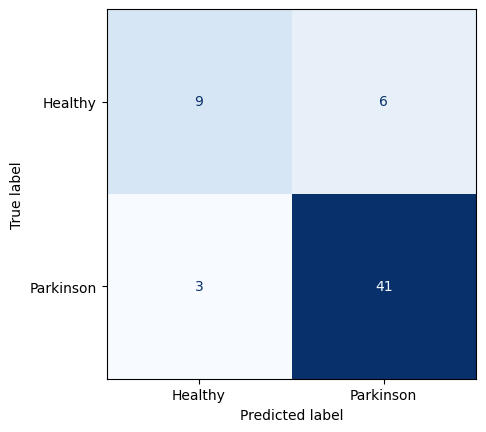

Accuracy %              : 84.7458%
Precision score         : 0.9318
Recall score            : 0.8723
F1 score                : 0.8534
Cross Validation score  : 0.7128
Training time           : 0.001 Seconds




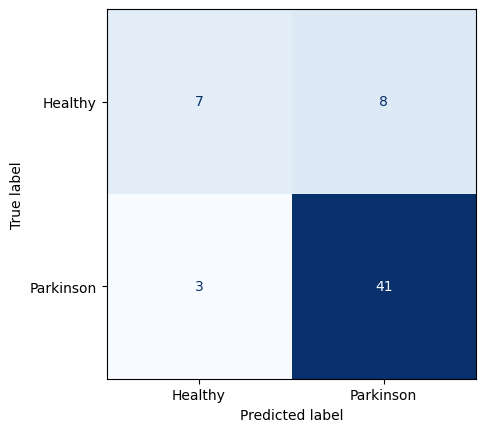

Accuracy %              : 81.3559%
Precision score         : 0.9318
Recall score            : 0.8367
F1 score                : 0.8272
Cross Validation score  : 0.7538
Training time           : 0.002 Seconds




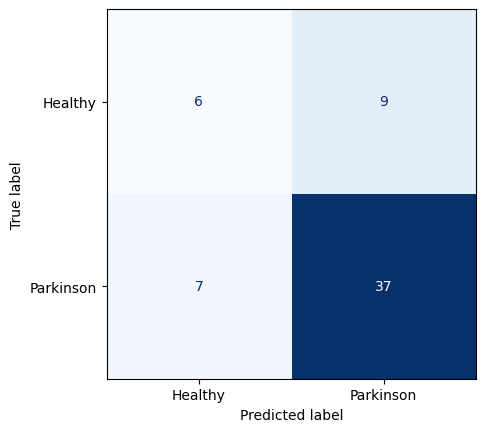

Accuracy %              : 72.8814%
Precision score         : 0.8409
Recall score            : 0.8043
F1 score                : 0.7355
Cross Validation score  : 0.7385
Training time           : 0.002 Seconds




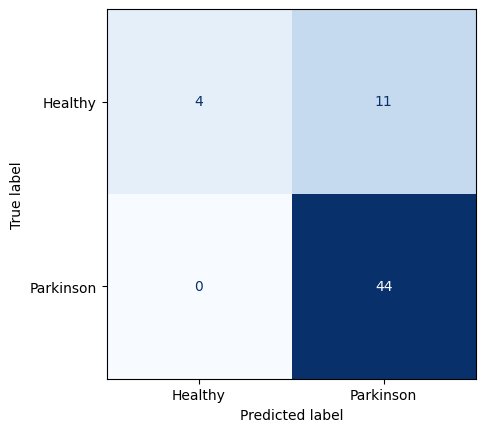

Accuracy %              : 81.3559%
Precision score         : 1.0
Recall score            : 0.8
F1 score                : 0.8572
Cross Validation score  : 0.7846
Training time           : 0.001 Seconds




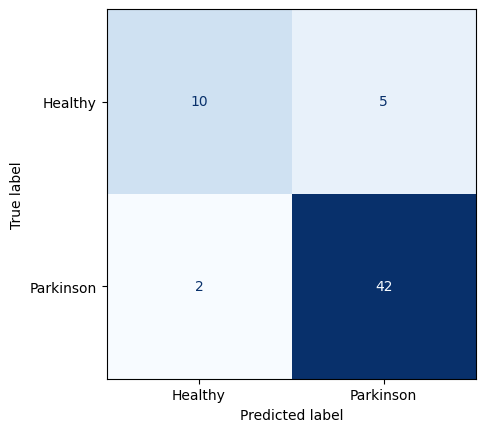

Accuracy %              : 88.1356%
Precision score         : 0.9545
Recall score            : 0.8936
F1 score                : 0.886
Cross Validation score  : 0.7846
Training time           : 0.002 Seconds




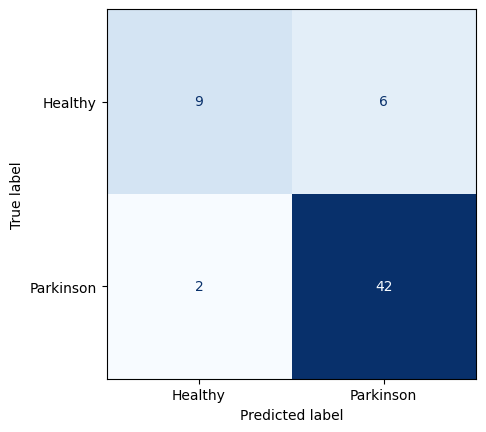

Accuracy %              : 86.4407%
Precision score         : 0.9545
Recall score            : 0.875
F1 score                : 0.8719
Cross Validation score  : 0.7846
Training time           : 0.1446 Seconds




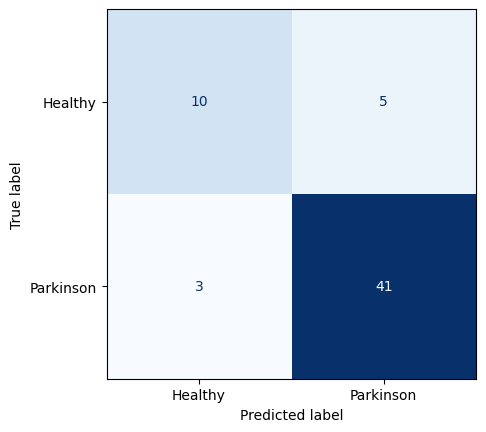

Accuracy %              : 86.4407%
Precision score         : 0.9318
Recall score            : 0.8913
F1 score                : 0.8677
Cross Validation score  : 0.7846
Training time           : 0.068 Seconds




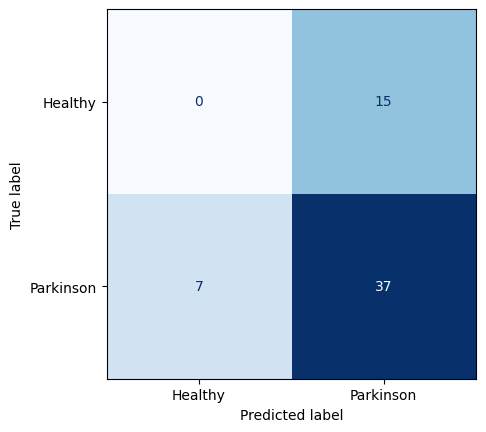

Accuracy %              : 62.7119%
Precision score         : 0.8409
Recall score            : 0.7115
F1 score                : 0.6794
Cross Validation score  : 0.0
Training time           : 0.1016 Seconds




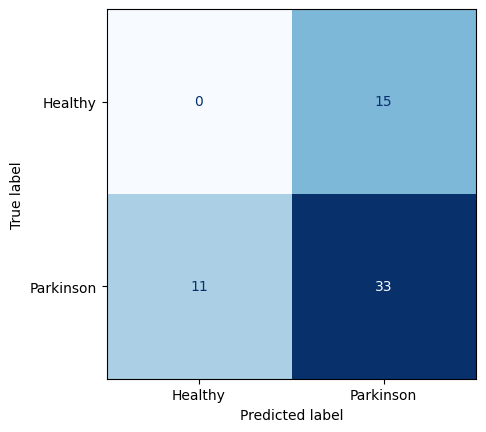

Accuracy %              : 55.9322%
Precision score         : 0.75
Recall score            : 0.6875
F1 score                : 0.5836
Cross Validation score  : 0.0
Training time           : 0.0905 Seconds




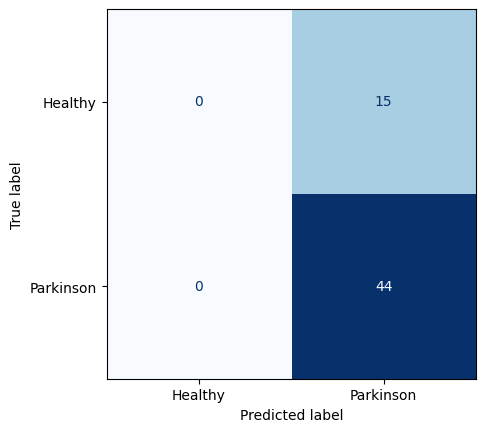

Accuracy %              : 74.5763%
Precision score         : 1.0
Recall score            : 0.7458
F1 score                : 0.8544
Cross Validation score  : 0.0
Training time           : 0.02 Seconds




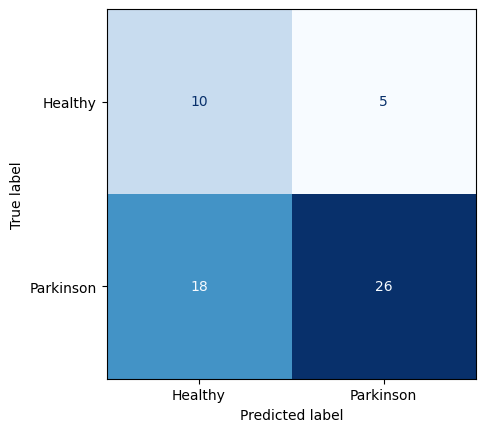

Accuracy %              : 61.0169%
Precision score         : 0.5909
Recall score            : 0.8387
F1 score                : 0.585
Cross Validation score  : 0.0
Training time           : 0.1341 Seconds




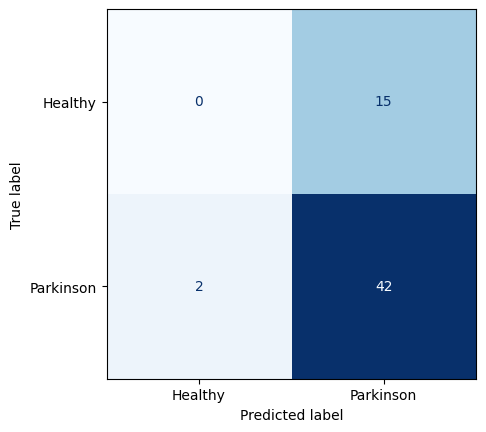

Accuracy %              : 71.1864%
Precision score         : 0.9545
Recall score            : 0.7368
F1 score                : 0.8035
Cross Validation score  : 0.0
Training time           : 0.014 Seconds




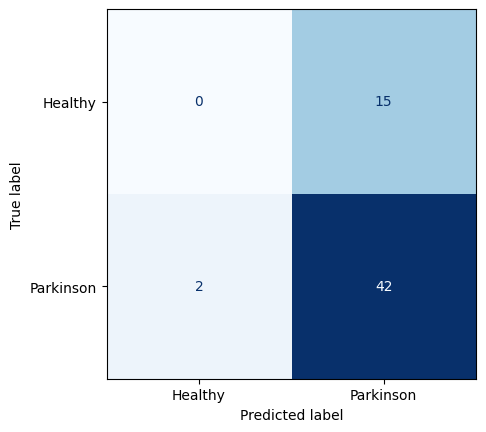

Accuracy %              : 71.1864%
Precision score         : 0.9545
Recall score            : 0.7368
F1 score                : 0.8035
Cross Validation score  : 0.0
Training time           : 0.0175 Seconds




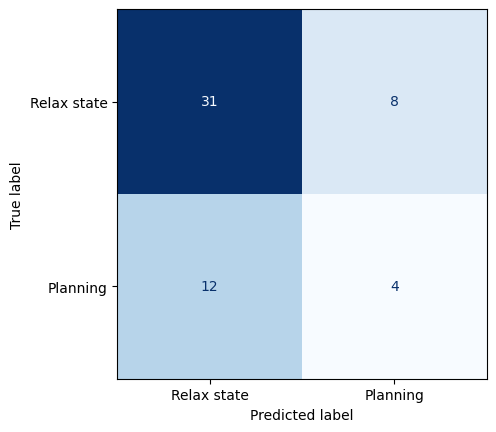

Accuracy %              : 63.6364%
Precision score         : 0.25
Recall score            : 0.3333
F1 score                : 0.6535
Cross Validation score  : 0.555
Training time           : 0.001 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


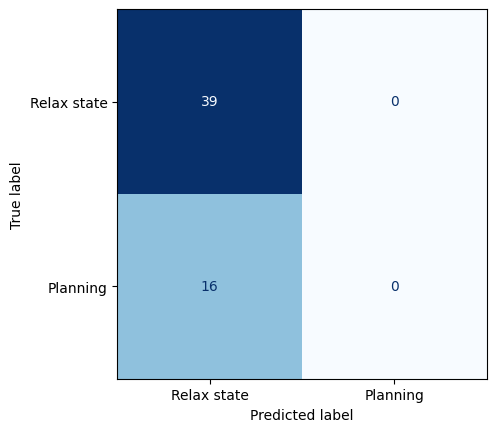

Accuracy %              : 70.9091%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8298
Cross Validation score  : 0.5715
Training time           : 0.001 Seconds




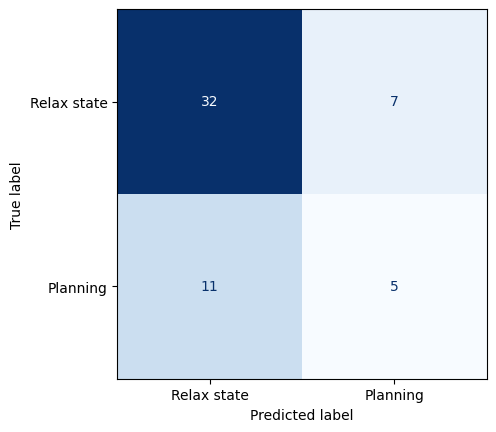

Accuracy %              : 67.2727%
Precision score         : 0.3125
Recall score            : 0.4167
F1 score                : 0.6881
Cross Validation score  : 0.6377
Training time           : 0.0011 Seconds




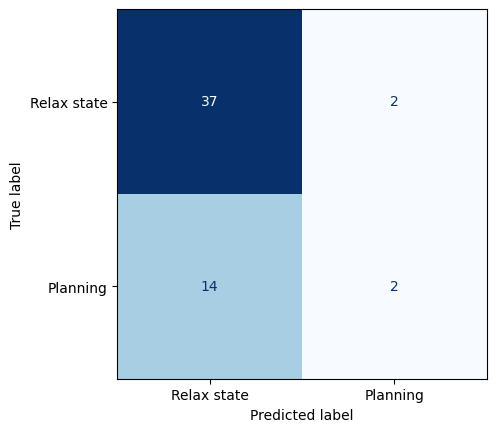

Accuracy %              : 70.9091%
Precision score         : 0.125
Recall score            : 0.5
F1 score                : 0.777
Cross Validation score  : 0.6758
Training time           : 0.001 Seconds




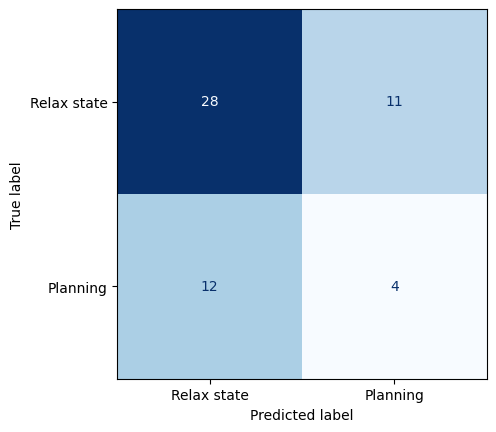

Accuracy %              : 58.1818%
Precision score         : 0.25
Recall score            : 0.2667
F1 score                : 0.5859
Cross Validation score  : 0.589
Training time           : 0.003 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


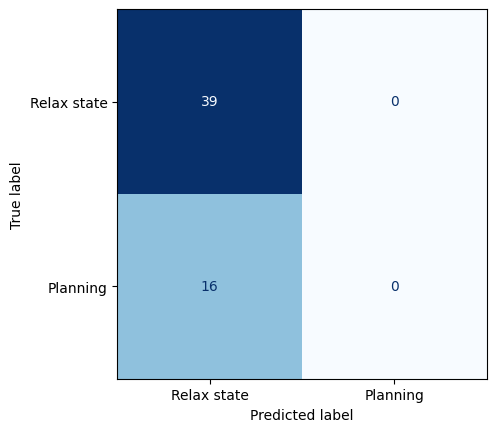

Accuracy %              : 70.9091%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8298
Cross Validation score  : 0.6159
Training time           : 0.002 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


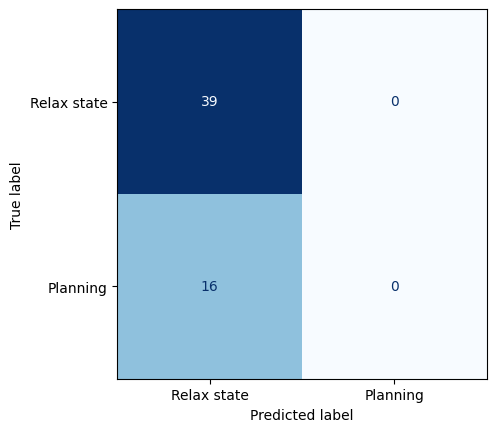

Accuracy %              : 70.9091%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8298
Cross Validation score  : 0.7089
Training time           : 0.002 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


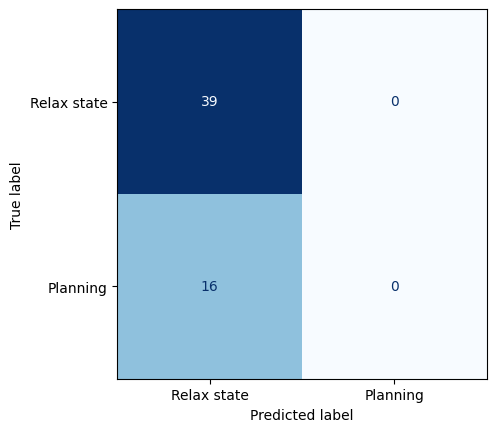

Accuracy %              : 70.9091%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8298
Cross Validation score  : 0.7089
Training time           : 0.001 Seconds




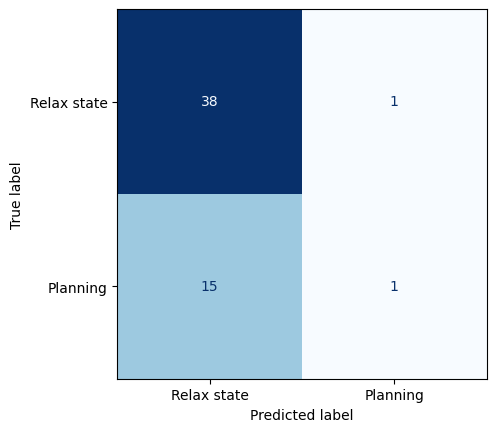

Accuracy %              : 70.9091%
Precision score         : 0.0625
Recall score            : 0.5
F1 score                : 0.8001
Cross Validation score  : 0.6926
Training time           : 0.1594 Seconds




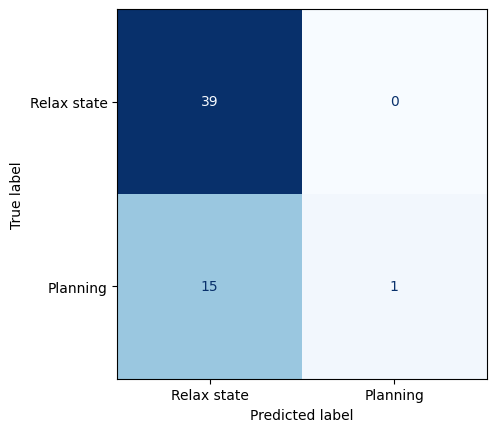

Accuracy %              : 72.7273%
Precision score         : 0.0625
Recall score            : 1.0
F1 score                : 0.8256
Cross Validation score  : 0.7146
Training time           : 0.0743 Seconds




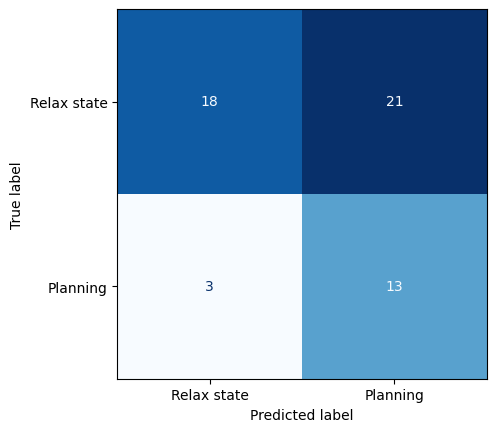

Accuracy %              : 56.3636%
Precision score         : 0.8125
Recall score            : 0.3824
F1 score                : 0.5505
Cross Validation score  : 0.0
Training time           : 0.0946 Seconds




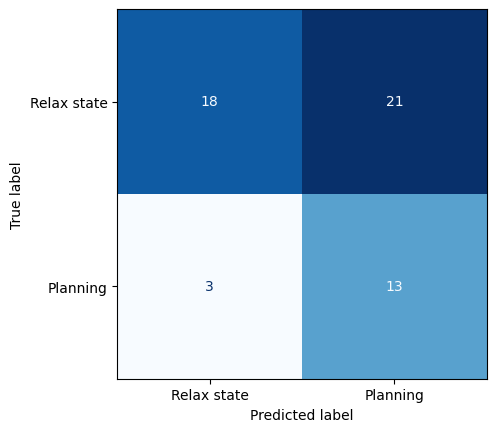

Accuracy %              : 56.3636%
Precision score         : 0.8125
Recall score            : 0.3824
F1 score                : 0.5505
Cross Validation score  : 0.0
Training time           : 0.0911 Seconds




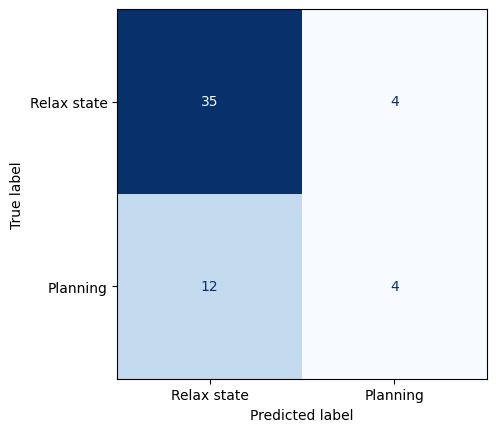

Accuracy %              : 70.9091%
Precision score         : 0.25
Recall score            : 0.5
F1 score                : 0.744
Cross Validation score  : 0.0
Training time           : 0.0733 Seconds




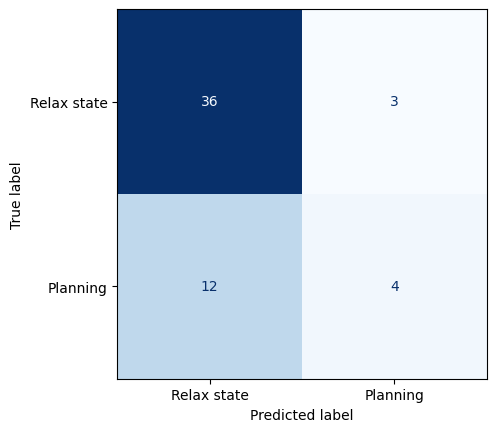

Accuracy %              : 72.7273%
Precision score         : 0.25
Recall score            : 0.5714
F1 score                : 0.7665
Cross Validation score  : 0.0
Training time           : 0.1172 Seconds




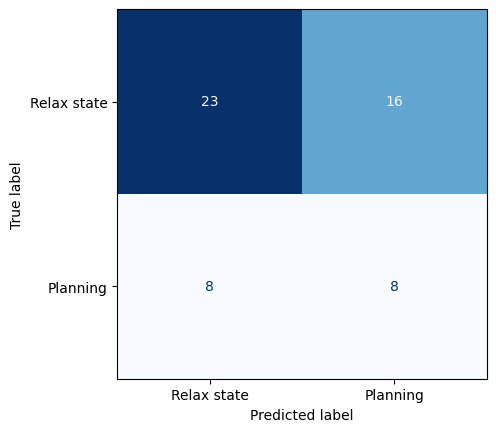

Accuracy %              : 56.3636%
Precision score         : 0.5
Recall score            : 0.3333
F1 score                : 0.5449
Cross Validation score  : 0.0
Training time           : 0.01 Seconds




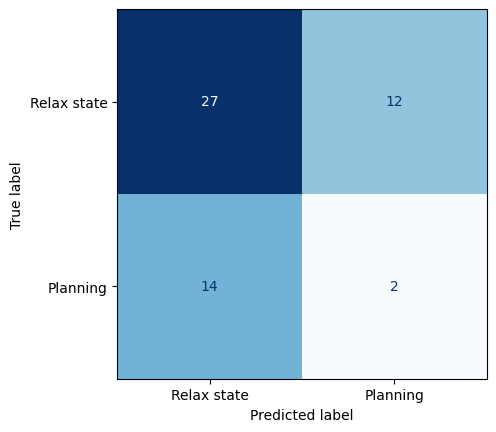

Accuracy %              : 52.7273%
Precision score         : 0.125
Recall score            : 0.1429
F1 score                : 0.5371
Cross Validation score  : 0.0
Training time           : 0.0137 Seconds




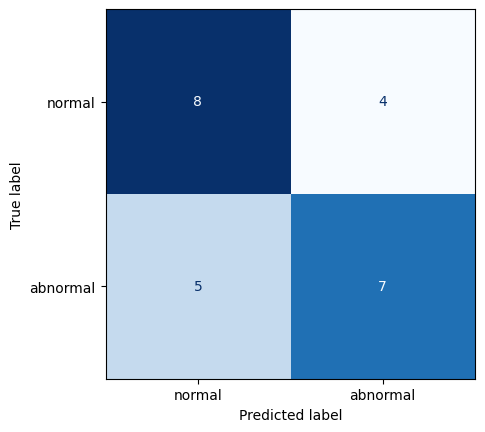

Accuracy %              : 62.5%
Precision score         : 0.5833
Recall score            : 0.6364
F1 score                : 0.6257
Cross Validation score  : 0.6958
Training time           : 0.001 Seconds




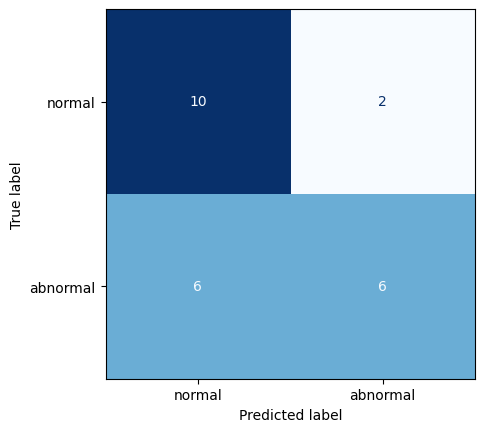

Accuracy %              : 66.6667%
Precision score         : 0.5
Recall score            : 0.75
F1 score                : 0.6762
Cross Validation score  : 0.6967
Training time           : 0.0009 Seconds




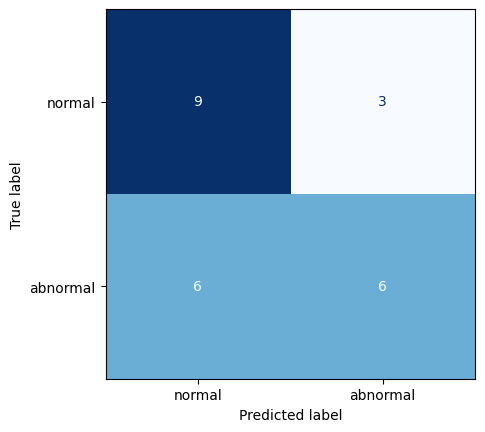

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.495
Training time           : 0.0 Seconds




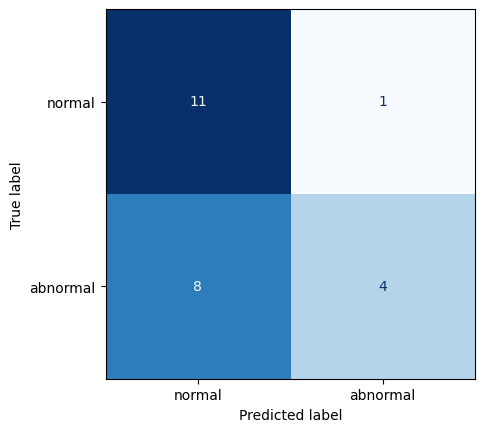

Accuracy %              : 62.5%
Precision score         : 0.3333
Recall score            : 0.8
F1 score                : 0.6599
Cross Validation score  : 0.6333
Training time           : 0.0 Seconds




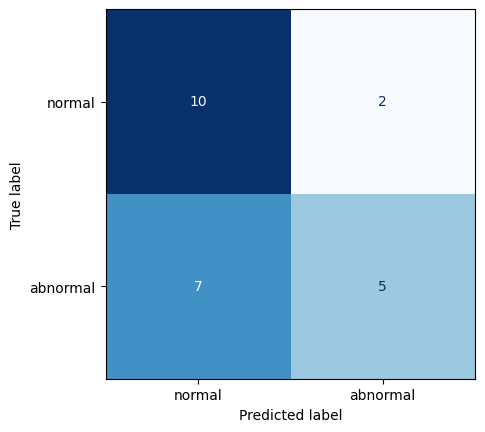

Accuracy %              : 62.5%
Precision score         : 0.4167
Recall score            : 0.7143
F1 score                : 0.642
Cross Validation score  : 0.6342
Training time           : 0.0009 Seconds




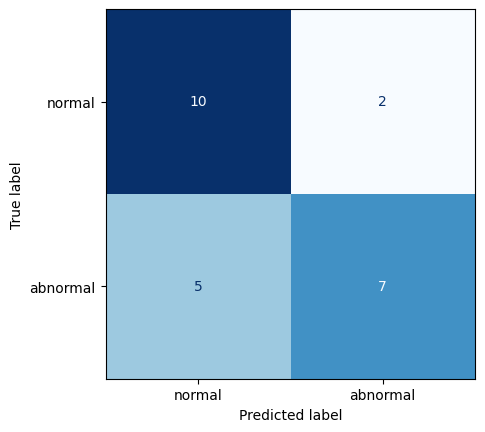

Accuracy %              : 70.8333%
Precision score         : 0.5833
Recall score            : 0.7778
F1 score                : 0.713
Cross Validation score  : 0.7467
Training time           : 0.002 Seconds




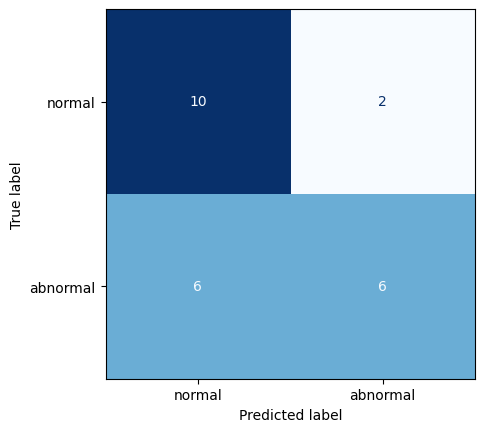

Accuracy %              : 66.6667%
Precision score         : 0.5
Recall score            : 0.75
F1 score                : 0.6762
Cross Validation score  : 0.72
Training time           : 0.001 Seconds




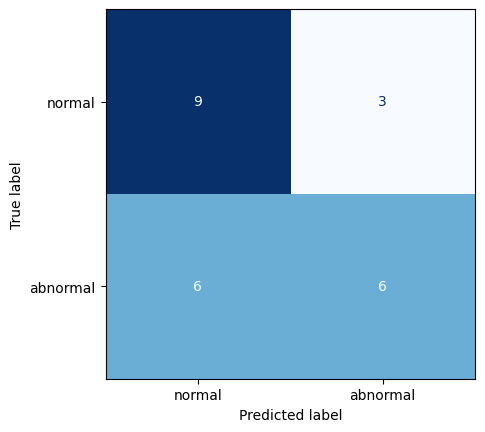

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.6708
Training time           : 0.0 Seconds




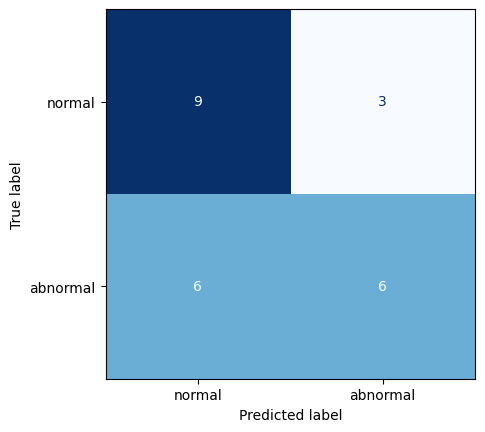

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.6833
Training time           : 0.1307 Seconds




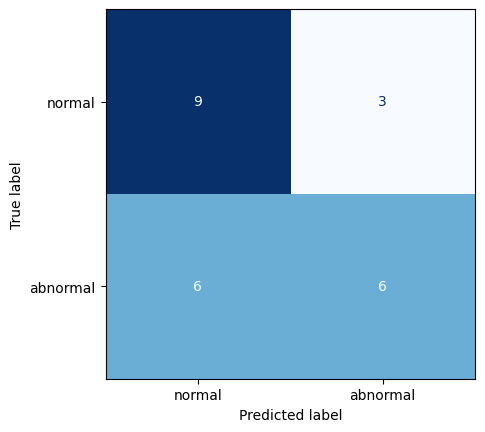

Accuracy %              : 62.5%
Precision score         : 0.5
Recall score            : 0.6667
F1 score                : 0.631
Cross Validation score  : 0.745
Training time           : 0.0713 Seconds




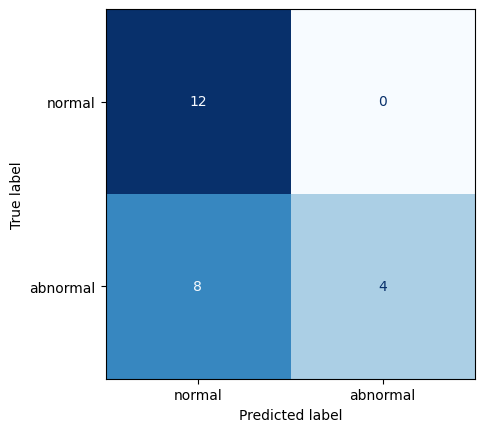

Accuracy %              : 66.6667%
Precision score         : 0.3333
Recall score            : 1.0
F1 score                : 0.7083
Cross Validation score  : 0.0
Training time           : 0.0982 Seconds




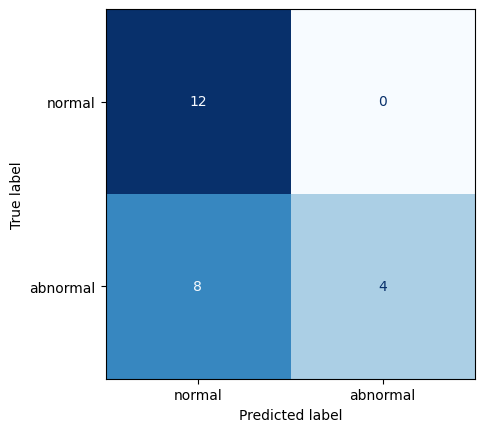

Accuracy %              : 66.6667%
Precision score         : 0.3333
Recall score            : 1.0
F1 score                : 0.7083
Cross Validation score  : 0.0
Training time           : 0.0886 Seconds




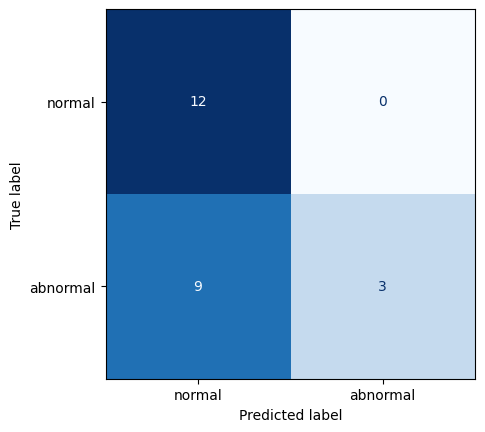

Accuracy %              : 62.5%
Precision score         : 0.25
Recall score            : 1.0
F1 score                : 0.6864
Cross Validation score  : 0.0
Training time           : 0.0231 Seconds




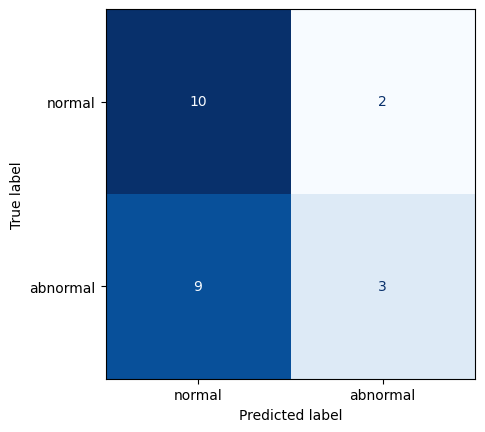

Accuracy %              : 54.1667%
Precision score         : 0.25
Recall score            : 0.6
F1 score                : 0.5843
Cross Validation score  : 0.0
Training time           : 0.0155 Seconds




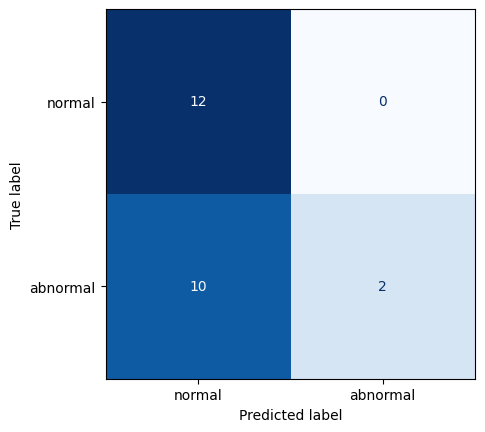

Accuracy %              : 58.3333%
Precision score         : 0.1667
Recall score            : 1.0
F1 score                : 0.6709
Cross Validation score  : 0.0
Training time           : 0.0066 Seconds




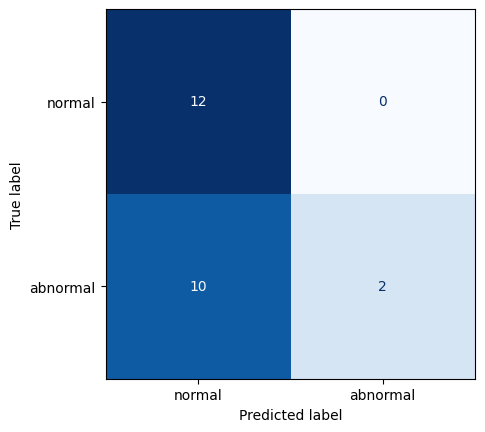

Accuracy %              : 58.3333%
Precision score         : 0.1667
Recall score            : 1.0
F1 score                : 0.6709
Cross Validation score  : 0.0
Training time           : 0.0089 Seconds




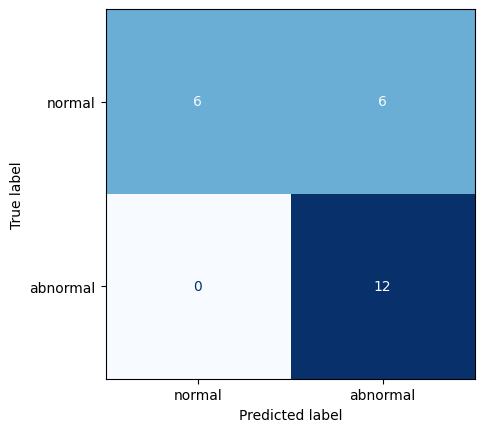

Accuracy %              : 75.0%
Precision score         : 1.0
Recall score            : 0.6667
F1 score                : 0.7667
Cross Validation score  : 0.4933
Training time           : 0.001 Seconds




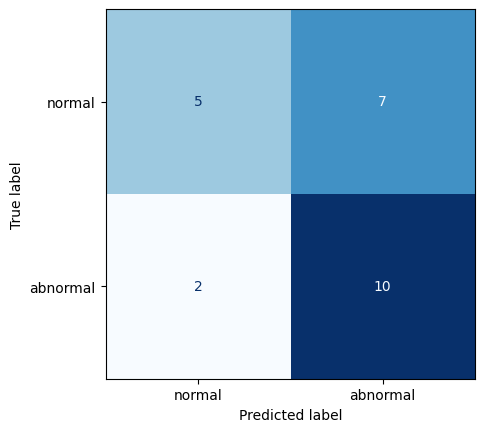

Accuracy %              : 62.5%
Precision score         : 0.8333
Recall score            : 0.5882
F1 score                : 0.642
Cross Validation score  : 0.4808
Training time           : 0.0 Seconds




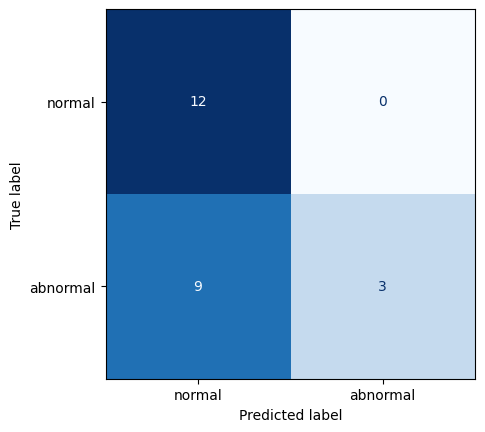

Accuracy %              : 62.5%
Precision score         : 0.25
Recall score            : 1.0
F1 score                : 0.6864
Cross Validation score  : 0.7208
Training time           : 0.0011 Seconds




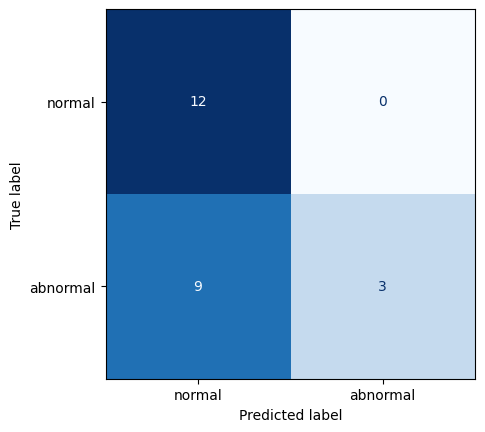

Accuracy %              : 62.5%
Precision score         : 0.25
Recall score            : 1.0
F1 score                : 0.6864
Cross Validation score  : 0.7083
Training time           : 0.0 Seconds




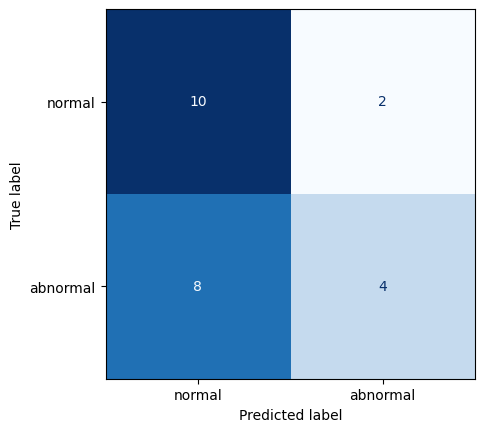

Accuracy %              : 58.3333%
Precision score         : 0.3333
Recall score            : 0.6667
F1 score                : 0.6111
Cross Validation score  : 0.6342
Training time           : 0.002 Seconds




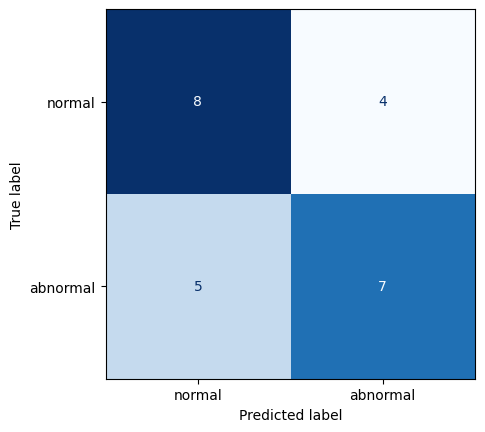

Accuracy %              : 62.5%
Precision score         : 0.5833
Recall score            : 0.6364
F1 score                : 0.6257
Cross Validation score  : 0.6483
Training time           : 0.001 Seconds




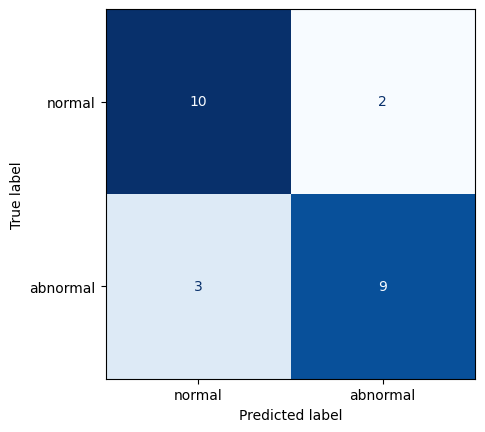

Accuracy %              : 79.1667%
Precision score         : 0.75
Recall score            : 0.8182
F1 score                : 0.792
Cross Validation score  : 0.785
Training time           : 0.001 Seconds




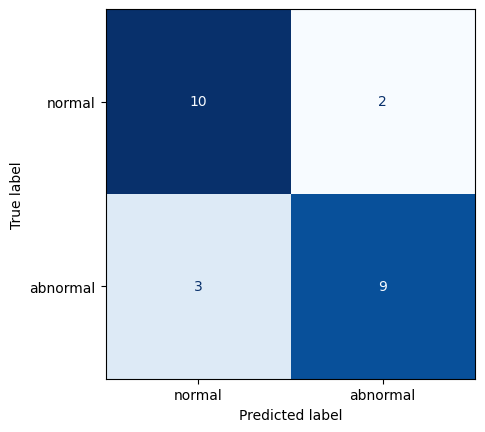

Accuracy %              : 79.1667%
Precision score         : 0.75
Recall score            : 0.8182
F1 score                : 0.792
Cross Validation score  : 0.785
Training time           : 0.001 Seconds




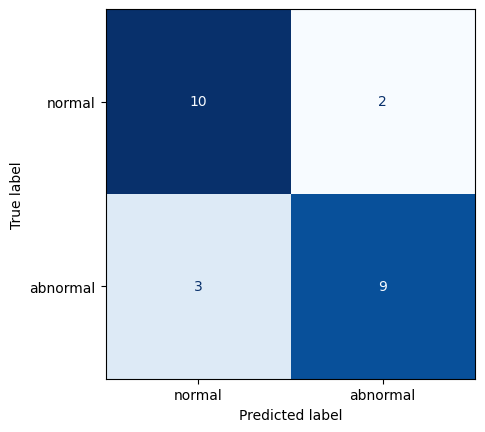

Accuracy %              : 79.1667%
Precision score         : 0.75
Recall score            : 0.8182
F1 score                : 0.792
Cross Validation score  : 0.7983
Training time           : 0.1163 Seconds




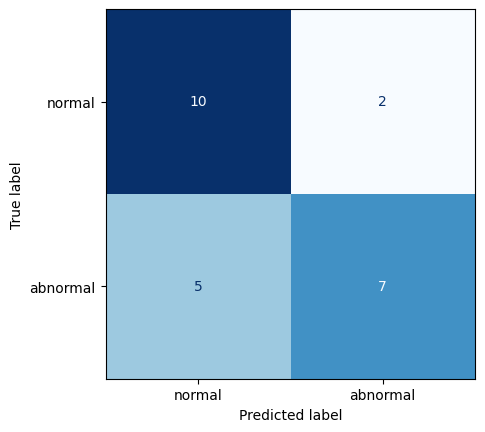

Accuracy %              : 70.8333%
Precision score         : 0.5833
Recall score            : 0.7778
F1 score                : 0.713
Cross Validation score  : 0.8108
Training time           : 0.0728 Seconds




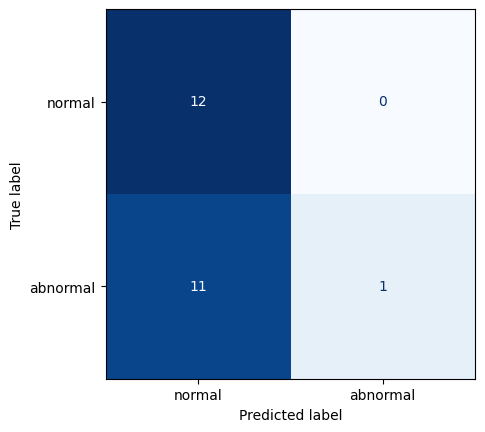

Accuracy %              : 54.1667%
Precision score         : 0.0833
Recall score            : 1.0
F1 score                : 0.6636
Cross Validation score  : 0.0
Training time           : 0.0916 Seconds




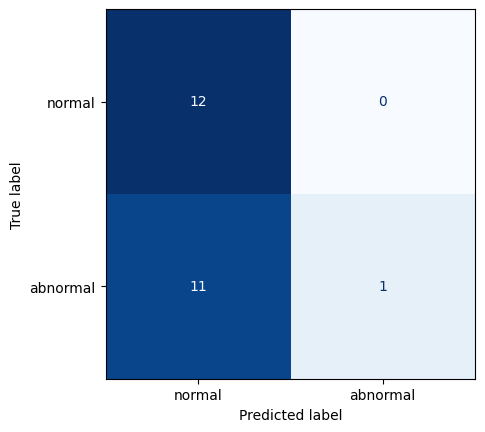

Accuracy %              : 54.1667%
Precision score         : 0.0833
Recall score            : 1.0
F1 score                : 0.6636
Cross Validation score  : 0.0
Training time           : 0.0916 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


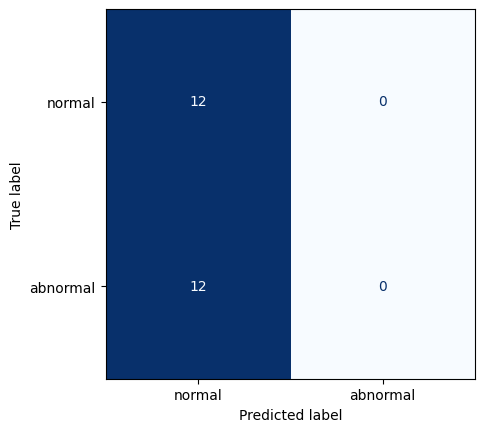

Accuracy %              : 50.0%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.6667
Cross Validation score  : 0.0
Training time           : 0.0226 Seconds




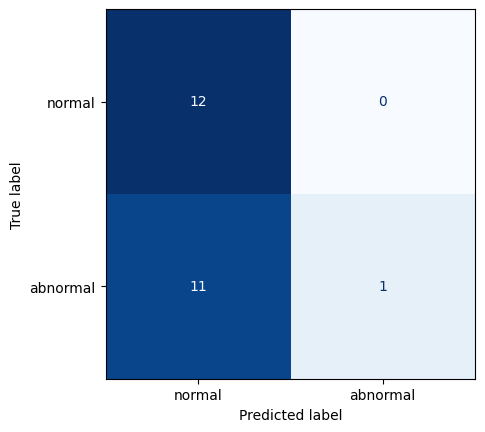

Accuracy %              : 54.1667%
Precision score         : 0.0833
Recall score            : 1.0
F1 score                : 0.6636
Cross Validation score  : 0.0
Training time           : 0.0097 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


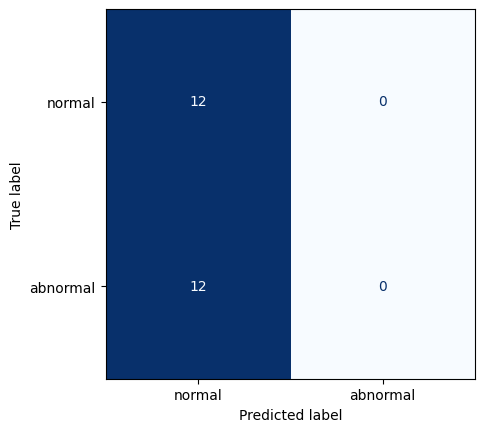

Accuracy %              : 50.0%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.6667
Cross Validation score  : 0.0
Training time           : 0.0135 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


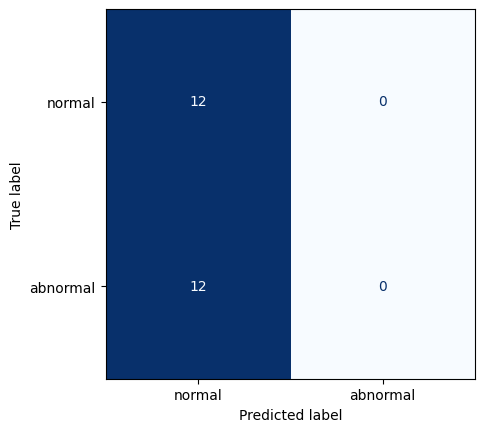

Accuracy %              : 50.0%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.6667
Cross Validation score  : 0.0
Training time           : 0.0151 Seconds




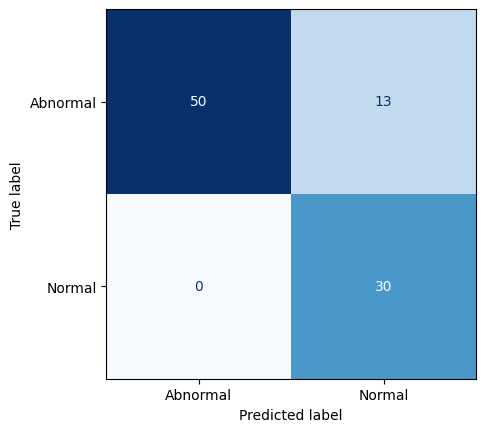

Accuracy %              : 86.0215%
Precision score         : 1.0
Recall score            : 0.6977
F1 score                : 0.8558
Cross Validation score  : 0.7837
Training time           : 0.001 Seconds




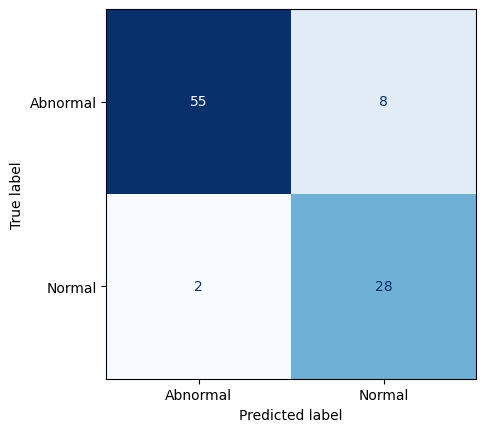

Accuracy %              : 89.2473%
Precision score         : 0.9333
Recall score            : 0.7778
F1 score                : 0.8903
Cross Validation score  : 0.7281
Training time           : 0.0 Seconds




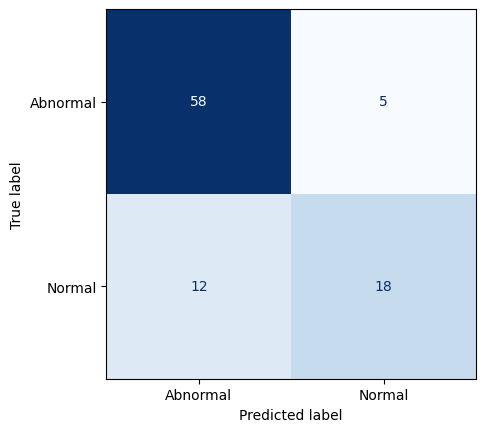

Accuracy %              : 81.7204%
Precision score         : 0.6
Recall score            : 0.7826
F1 score                : 0.8245
Cross Validation score  : 0.7964
Training time           : 0.001 Seconds




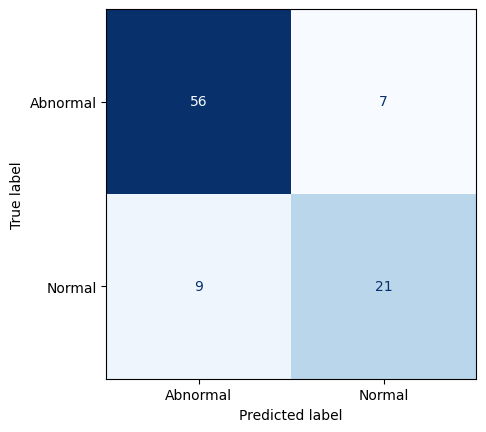

Accuracy %              : 82.7957%
Precision score         : 0.7
Recall score            : 0.75
F1 score                : 0.8296
Cross Validation score  : 0.7962
Training time           : 0.001 Seconds




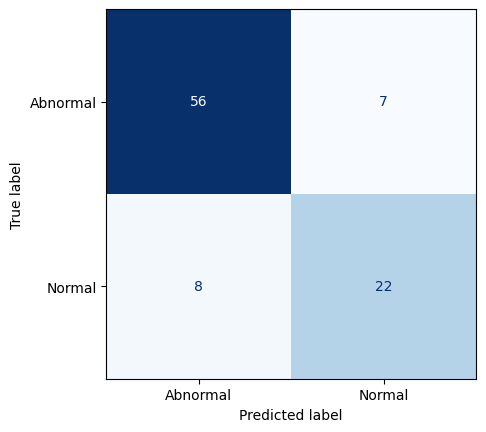

Accuracy %              : 83.871%
Precision score         : 0.7333
Recall score            : 0.7586
F1 score                : 0.8394
Cross Validation score  : 0.7672
Training time           : 0.003 Seconds




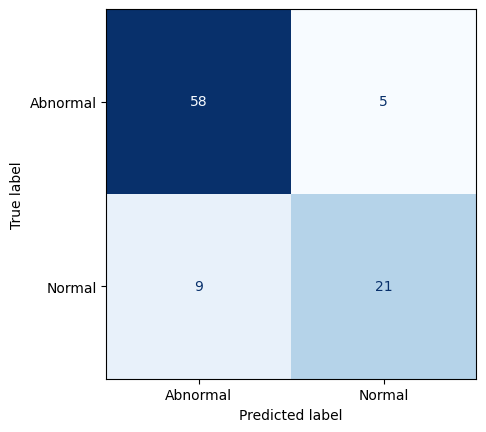

Accuracy %              : 84.9462%
Precision score         : 0.7
Recall score            : 0.8077
F1 score                : 0.8525
Cross Validation score  : 0.7931
Training time           : 0.001 Seconds




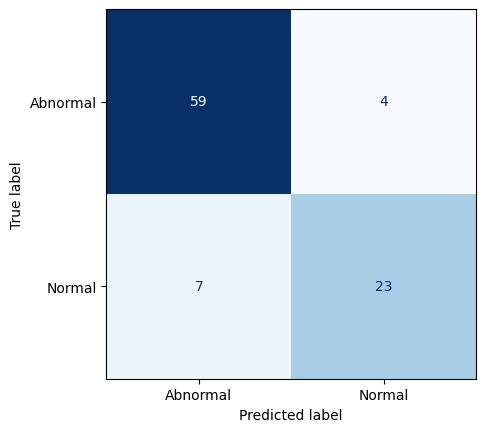

Accuracy %              : 88.172%
Precision score         : 0.7667
Recall score            : 0.8519
F1 score                : 0.8835
Cross Validation score  : 0.7835
Training time           : 0.001 Seconds




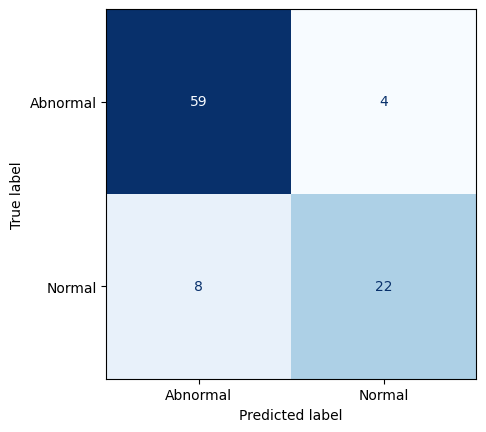

Accuracy %              : 87.0968%
Precision score         : 0.7333
Recall score            : 0.8462
F1 score                : 0.8736
Cross Validation score  : 0.819
Training time           : 0.0011 Seconds




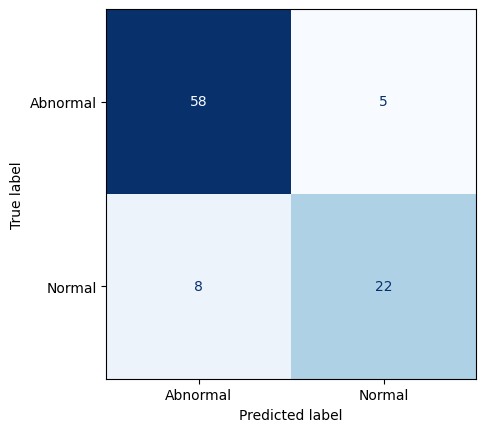

Accuracy %              : 86.0215%
Precision score         : 0.7333
Recall score            : 0.8148
F1 score                : 0.8623
Cross Validation score  : 0.7994
Training time           : 0.1546 Seconds




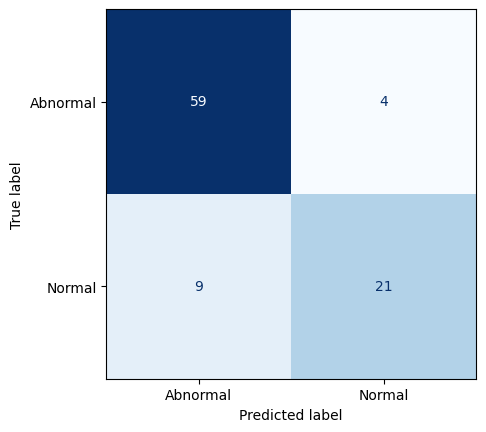

Accuracy %              : 86.0215%
Precision score         : 0.7
Recall score            : 0.84
F1 score                : 0.8639
Cross Validation score  : 0.7995
Training time           : 0.152 Seconds




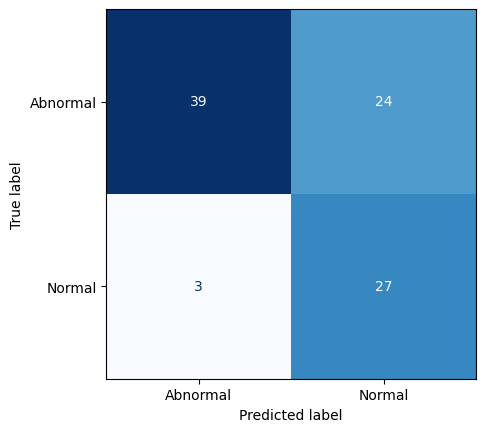

Accuracy %              : 70.9677%
Precision score         : 0.9
Recall score            : 0.5294
F1 score                : 0.7011
Cross Validation score  : 0.0
Training time           : 0.0971 Seconds




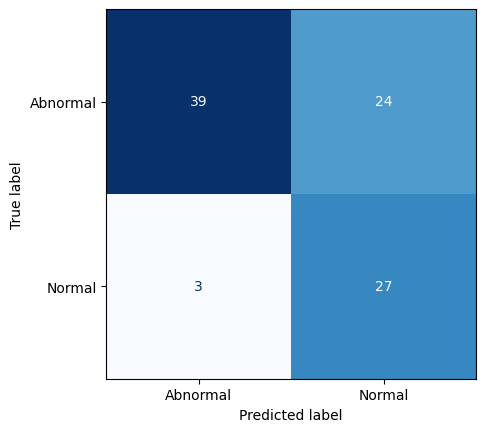

Accuracy %              : 70.9677%
Precision score         : 0.9
Recall score            : 0.5294
F1 score                : 0.7011
Cross Validation score  : 0.0
Training time           : 0.087 Seconds




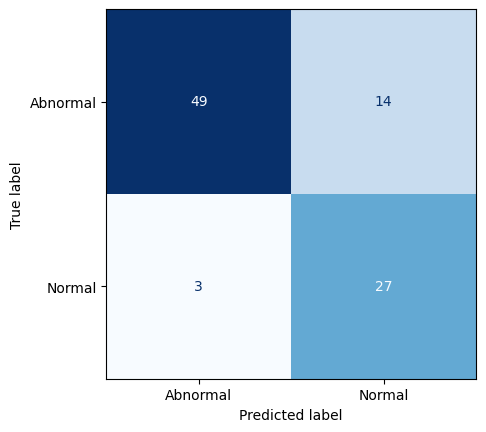

Accuracy %              : 81.7204%
Precision score         : 0.9
Recall score            : 0.6585
F1 score                : 0.8118
Cross Validation score  : 0.0
Training time           : 0.1573 Seconds




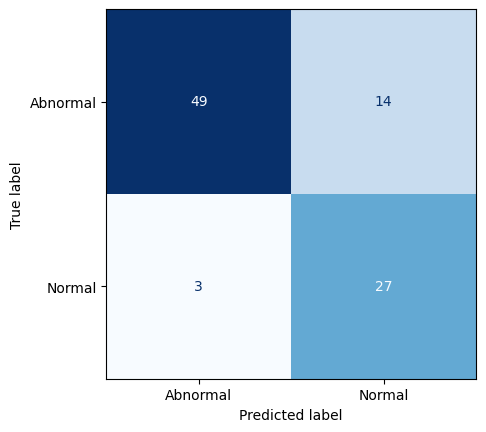

Accuracy %              : 81.7204%
Precision score         : 0.9
Recall score            : 0.6585
F1 score                : 0.8118
Cross Validation score  : 0.0
Training time           : 1.3355 Seconds




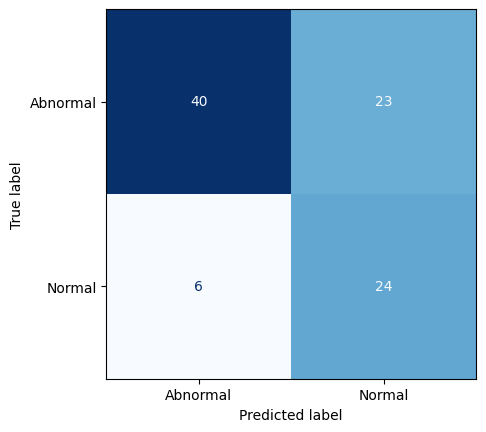

Accuracy %              : 68.8172%
Precision score         : 0.8
Recall score            : 0.5106
F1 score                : 0.6781
Cross Validation score  : 0.0
Training time           : 0.017 Seconds




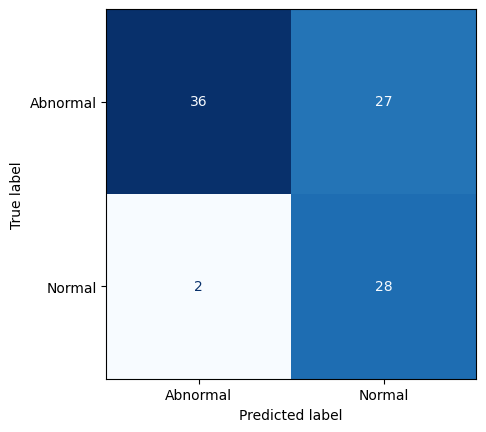

Accuracy %              : 68.8172%
Precision score         : 0.9333
Recall score            : 0.5091
F1 score                : 0.6809
Cross Validation score  : 0.0
Training time           : 0.022 Seconds




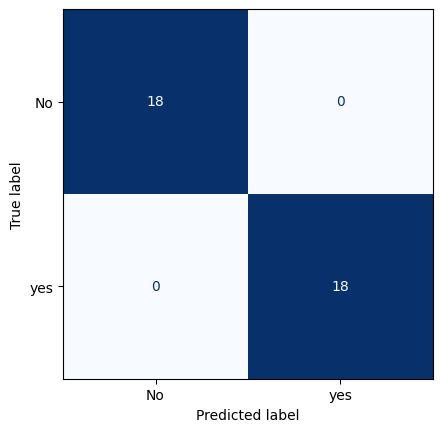

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.002 Seconds




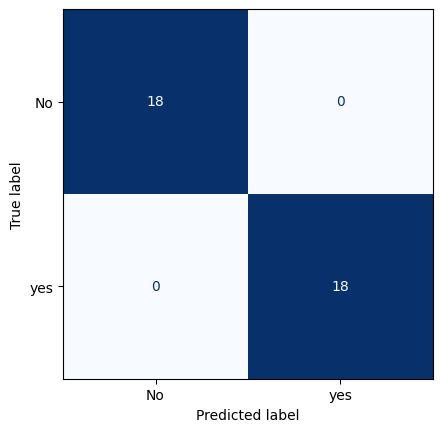

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




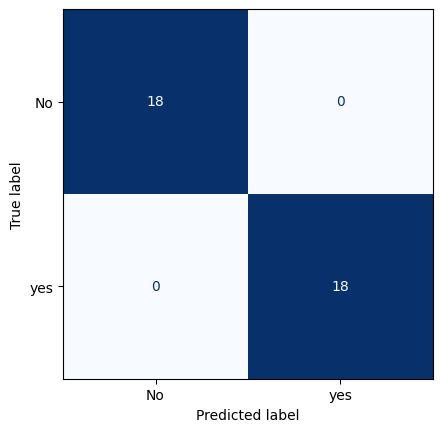

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9917
Training time           : 0.0009 Seconds




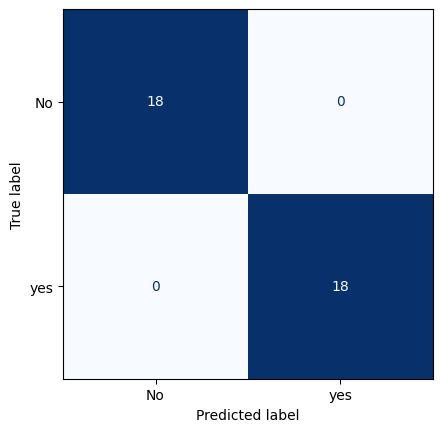

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9917
Training time           : 0.0 Seconds




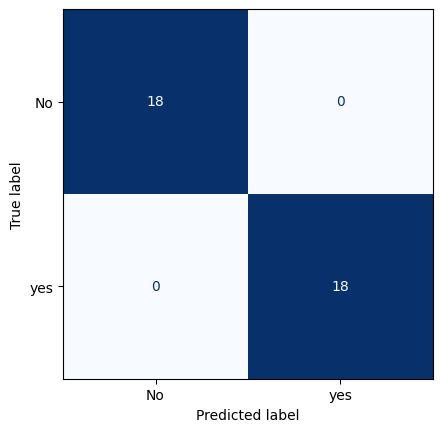

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




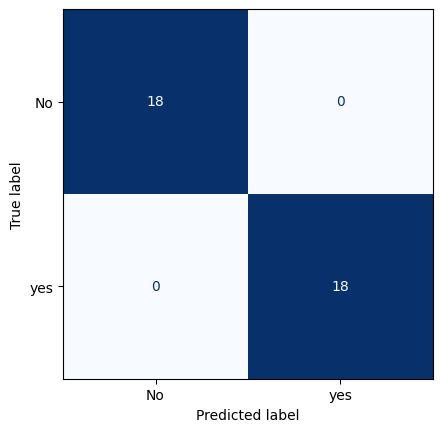

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




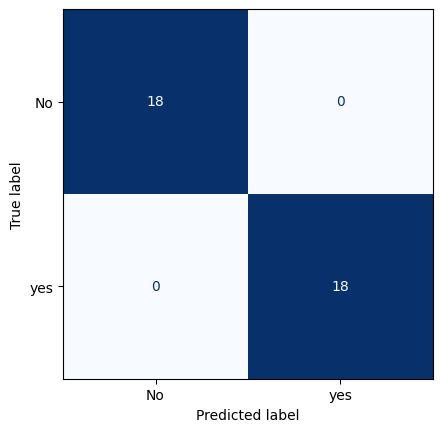

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.4917
Training time           : 0.0011 Seconds




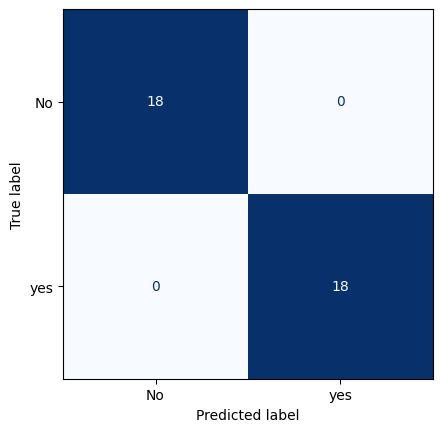

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.4917
Training time           : 0.001 Seconds




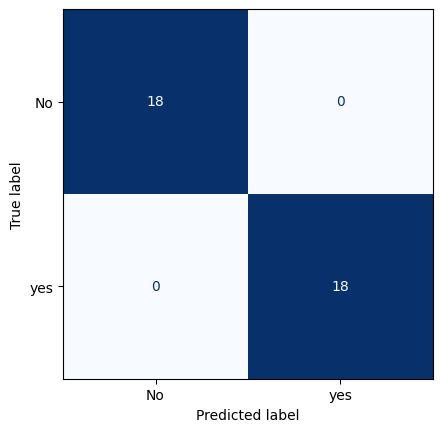

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.1381 Seconds




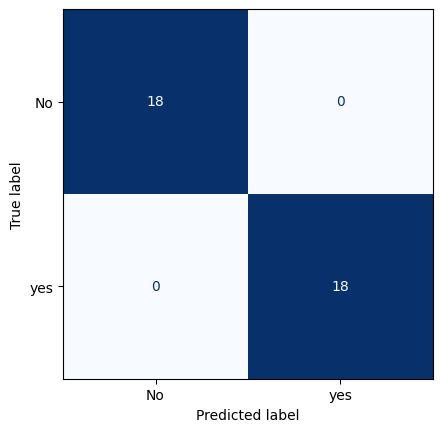

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.0692 Seconds




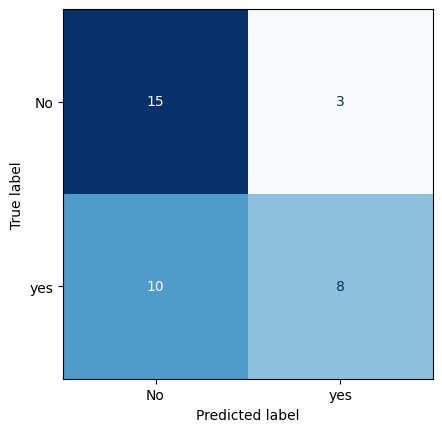

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.092 Seconds




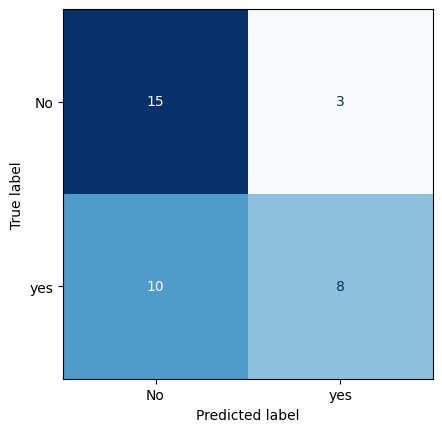

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.0866 Seconds




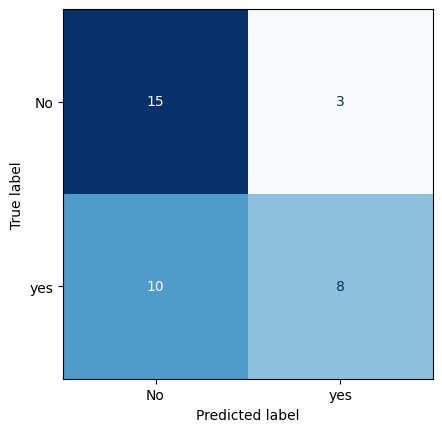

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.0205 Seconds




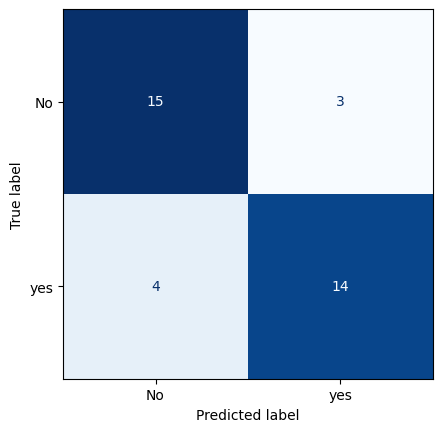

Accuracy %              : 80.5556%
Precision score         : 0.7778
Recall score            : 0.8235
F1 score                : 0.8057
Cross Validation score  : 0.0
Training time           : 0.1461 Seconds




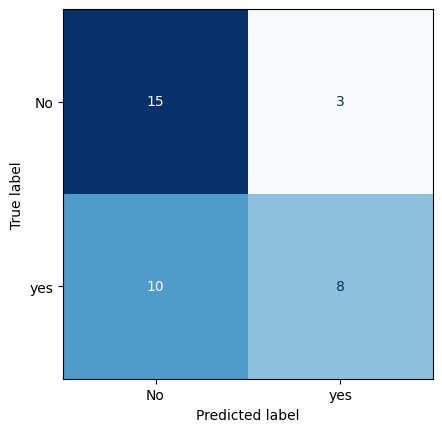

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.007 Seconds




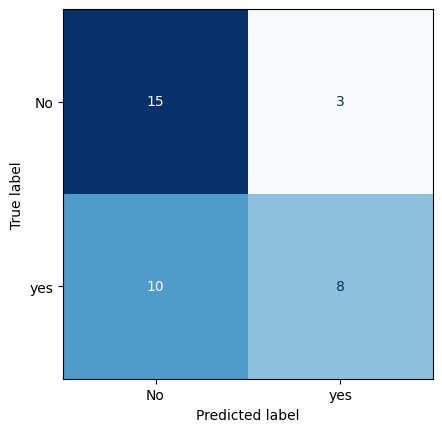

Accuracy %              : 63.8889%
Precision score         : 0.4444
Recall score            : 0.7273
F1 score                : 0.6531
Cross Validation score  : 0.0
Training time           : 0.0103 Seconds




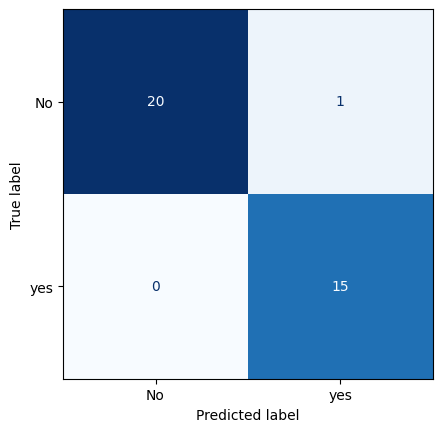

Accuracy %              : 97.2222%
Precision score         : 1.0
Recall score            : 0.9375
F1 score                : 0.9721
Cross Validation score  : 1.0
Training time           : 0.0011 Seconds




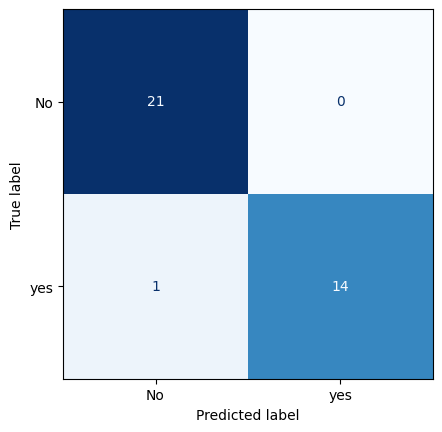

Accuracy %              : 97.2222%
Precision score         : 0.9333
Recall score            : 1.0
F1 score                : 0.9724
Cross Validation score  : 0.675
Training time           : 0.001 Seconds




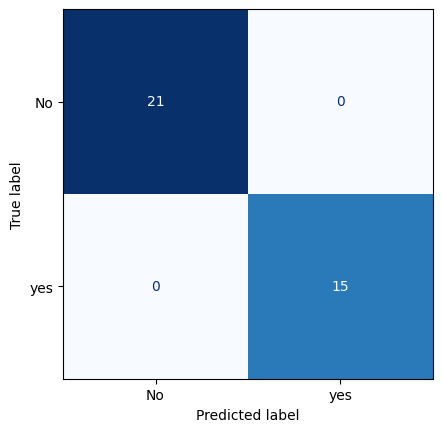

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.875
Training time           : 0.001 Seconds




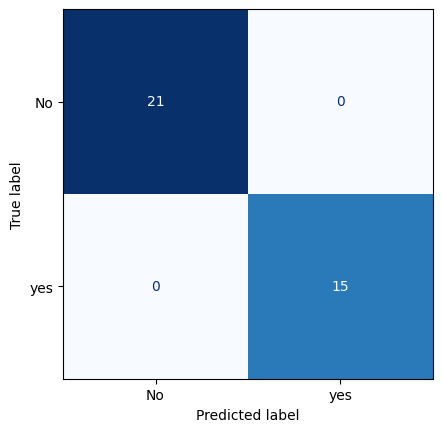

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.875
Training time           : 0.001 Seconds




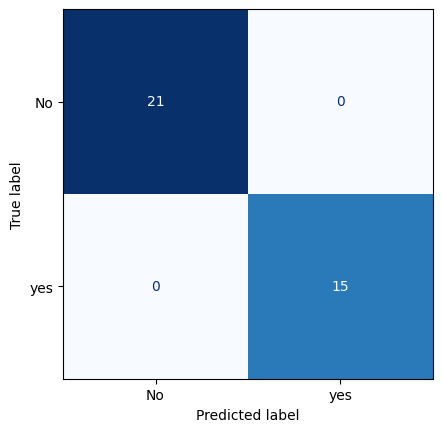

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.8583
Training time           : 0.001 Seconds




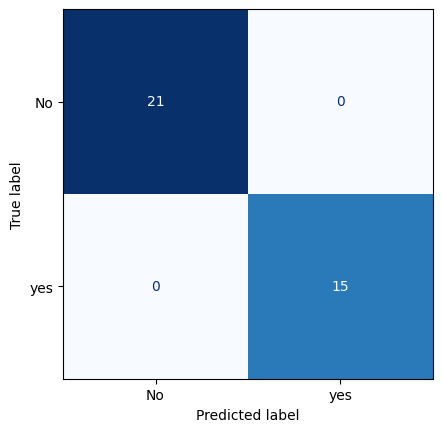

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.0011 Seconds




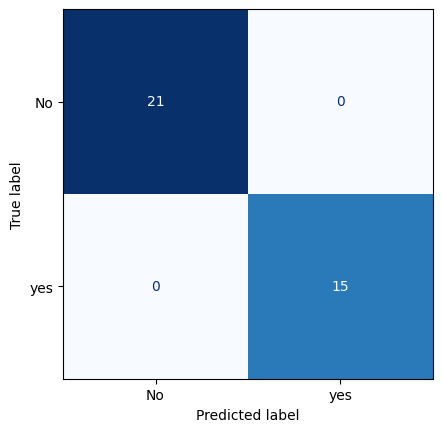

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.5833
Training time           : 0.001 Seconds




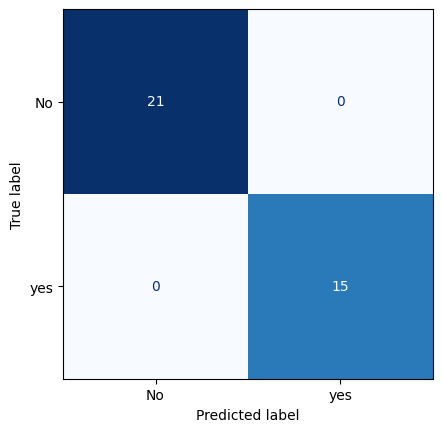

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.5833
Training time           : 0.0015 Seconds




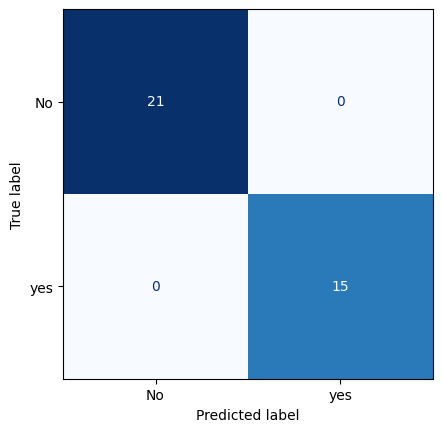

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.1273 Seconds




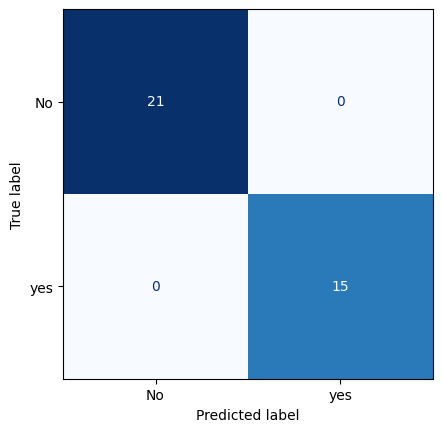

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 1.0
Training time           : 0.0655 Seconds




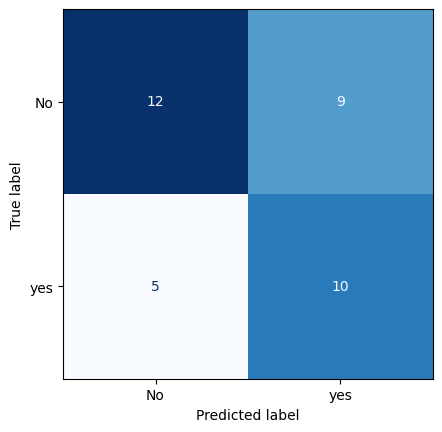

Accuracy %              : 61.1111%
Precision score         : 0.6667
Recall score            : 0.5263
F1 score                : 0.6087
Cross Validation score  : 0.0
Training time           : 0.0883 Seconds




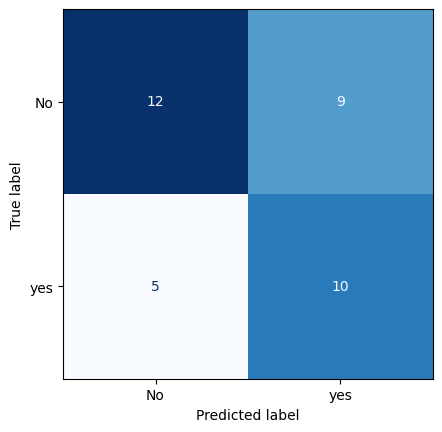

Accuracy %              : 61.1111%
Precision score         : 0.6667
Recall score            : 0.5263
F1 score                : 0.6087
Cross Validation score  : 0.0
Training time           : 0.0887 Seconds




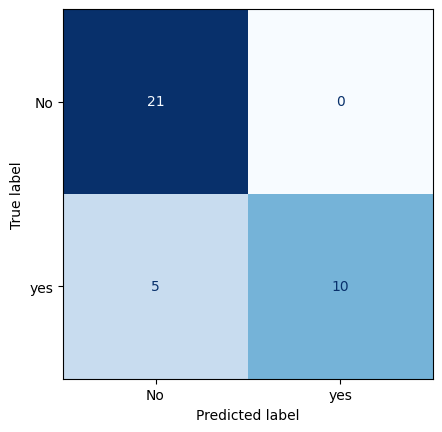

Accuracy %              : 86.1111%
Precision score         : 0.6667
Recall score            : 1.0
F1 score                : 0.8676
Cross Validation score  : 0.0
Training time           : 0.013 Seconds




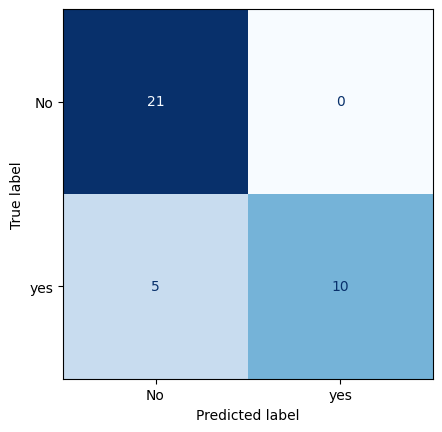

Accuracy %              : 86.1111%
Precision score         : 0.6667
Recall score            : 1.0
F1 score                : 0.8676
Cross Validation score  : 0.0
Training time           : 0.0105 Seconds




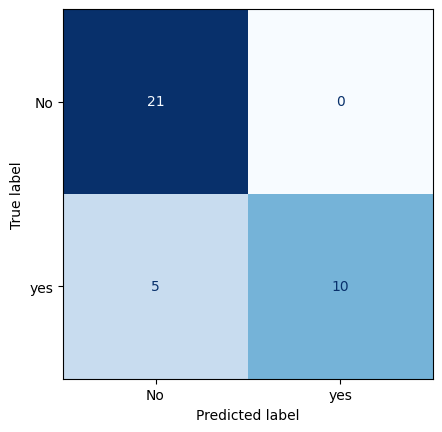

Accuracy %              : 86.1111%
Precision score         : 0.6667
Recall score            : 1.0
F1 score                : 0.8676
Cross Validation score  : 0.0
Training time           : 0.0085 Seconds




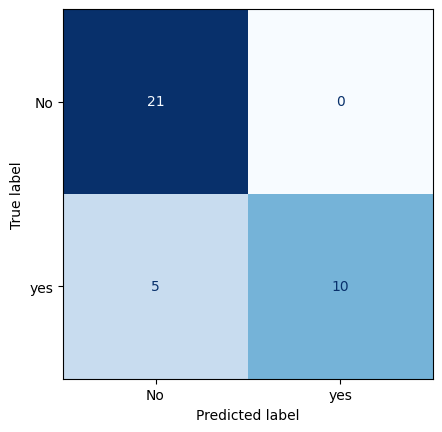

Accuracy %              : 86.1111%
Precision score         : 0.6667
Recall score            : 1.0
F1 score                : 0.8676
Cross Validation score  : 0.0
Training time           : 0.009 Seconds




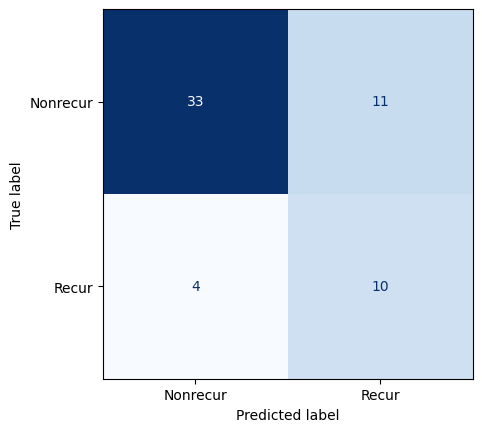

Accuracy %              : 74.1379%
Precision score         : 0.7143
Recall score            : 0.4762
F1 score                : 0.7267
Cross Validation score  : 0.5067
Training time           : 0.001 Seconds




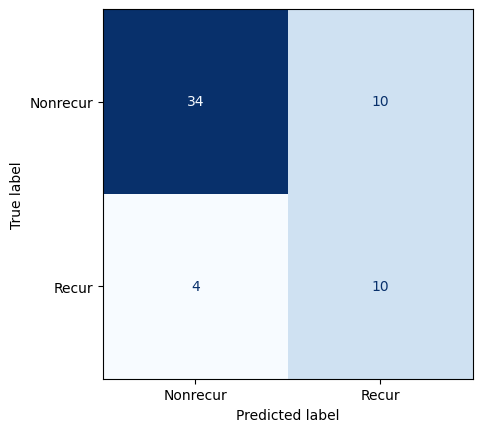

Accuracy %              : 75.8621%
Precision score         : 0.7143
Recall score            : 0.5
F1 score                : 0.7462
Cross Validation score  : 0.5067
Training time           : 0.002 Seconds




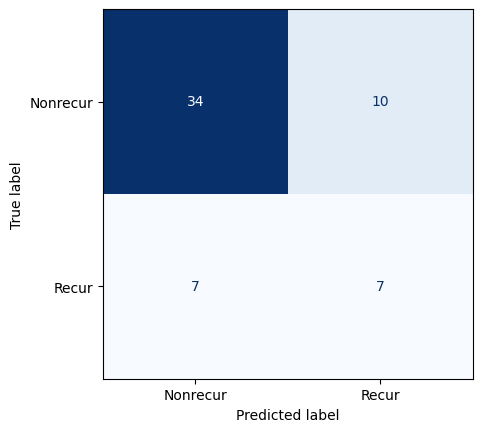

Accuracy %              : 70.6897%
Precision score         : 0.5
Recall score            : 0.4118
F1 score                : 0.6979
Cross Validation score  : 0.7194
Training time           : 0.0 Seconds




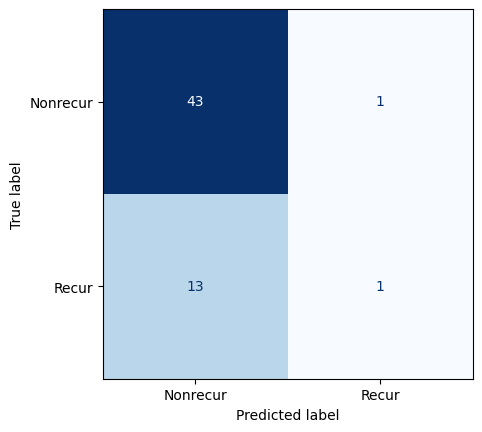

Accuracy %              : 75.8621%
Precision score         : 0.0714
Recall score            : 0.5
F1 score                : 0.8347
Cross Validation score  : 0.7043
Training time           : 0.0 Seconds




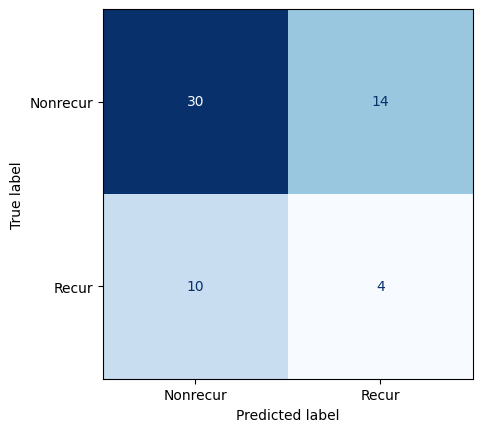

Accuracy %              : 58.6207%
Precision score         : 0.2857
Recall score            : 0.2222
F1 score                : 0.5702
Cross Validation score  : 0.673
Training time           : 0.004 Seconds




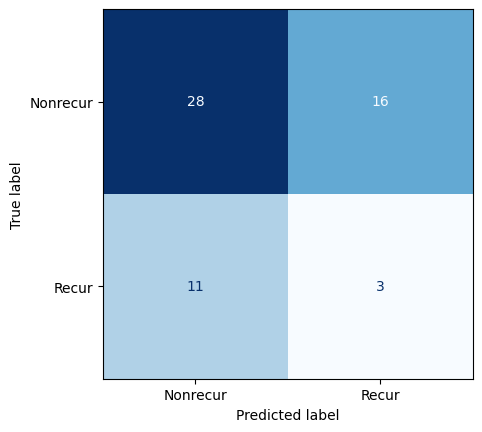

Accuracy %              : 53.4483%
Precision score         : 0.2143
Recall score            : 0.1579
F1 score                : 0.5132
Cross Validation score  : 0.715
Training time           : 0.004 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


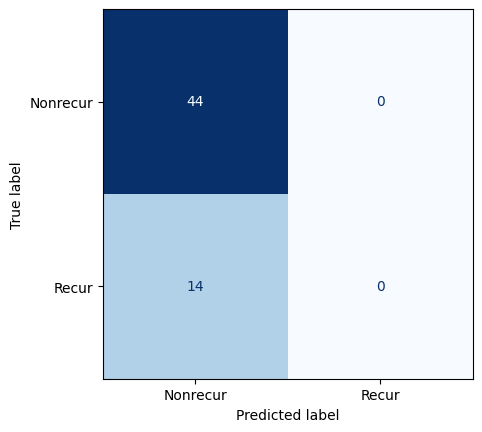

Accuracy %              : 75.8621%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8627
Cross Validation score  : 0.7617
Training time           : 0.001 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


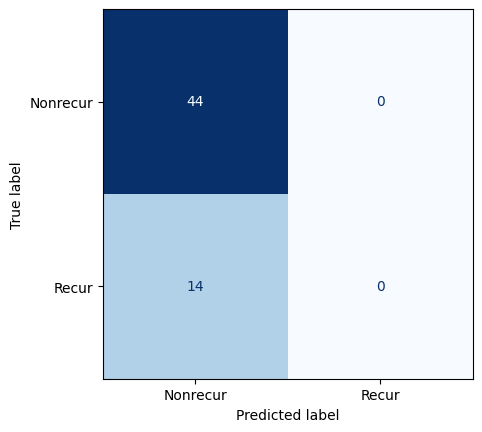

Accuracy %              : 75.8621%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.8627
Cross Validation score  : 0.7617
Training time           : 0.002 Seconds




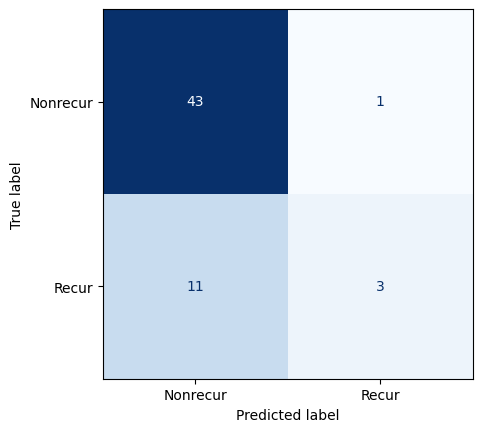

Accuracy %              : 79.3103%
Precision score         : 0.2143
Recall score            : 0.75
F1 score                : 0.84
Cross Validation score  : 0.7665
Training time           : 0.1638 Seconds




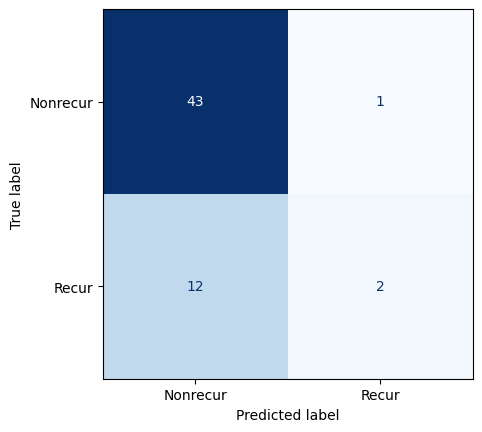

Accuracy %              : 77.5862%
Precision score         : 0.1429
Recall score            : 0.6667
F1 score                : 0.8359
Cross Validation score  : 0.756
Training time           : 0.0886 Seconds




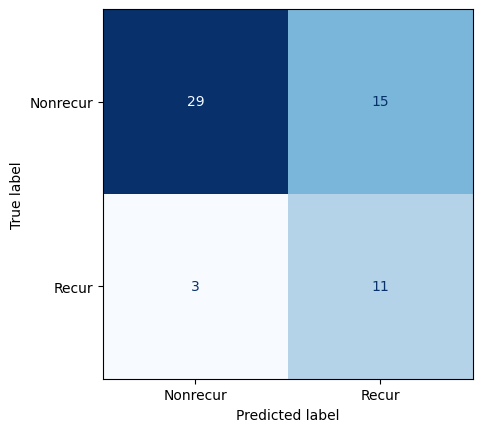

Accuracy %              : 68.9655%
Precision score         : 0.7857
Recall score            : 0.4231
F1 score                : 0.6676
Cross Validation score  : 0.0
Training time           : 0.0932 Seconds




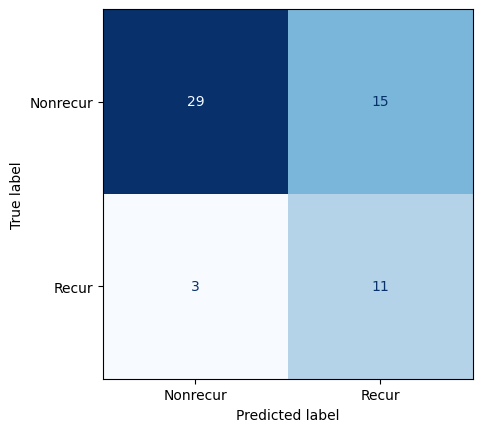

Accuracy %              : 68.9655%
Precision score         : 0.7857
Recall score            : 0.4231
F1 score                : 0.6676
Cross Validation score  : 0.0
Training time           : 0.0855 Seconds




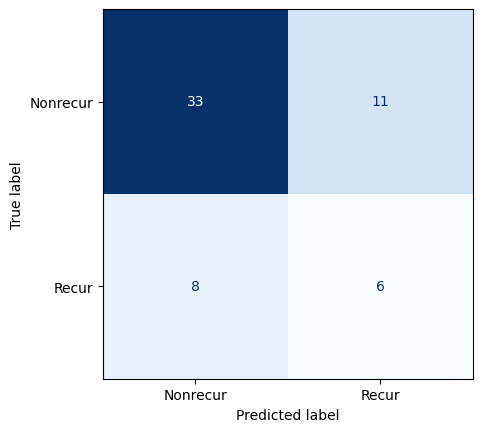

Accuracy %              : 67.2414%
Precision score         : 0.4286
Recall score            : 0.3529
F1 score                : 0.6623
Cross Validation score  : 0.0
Training time           : 0.031 Seconds




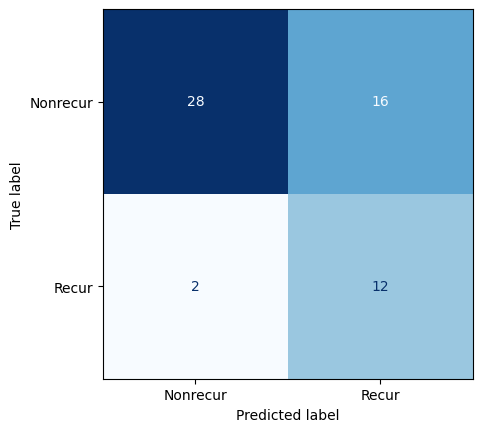

Accuracy %              : 68.9655%
Precision score         : 0.8571
Recall score            : 0.4286
F1 score                : 0.6673
Cross Validation score  : 0.0
Training time           : 0.01 Seconds




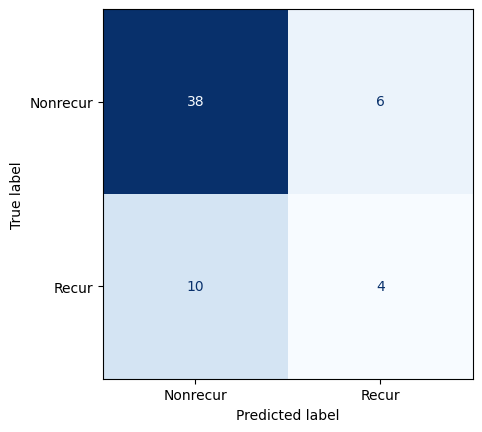

Accuracy %              : 72.4138%
Precision score         : 0.2857
Recall score            : 0.4
F1 score                : 0.7411
Cross Validation score  : 0.0
Training time           : 0.018 Seconds




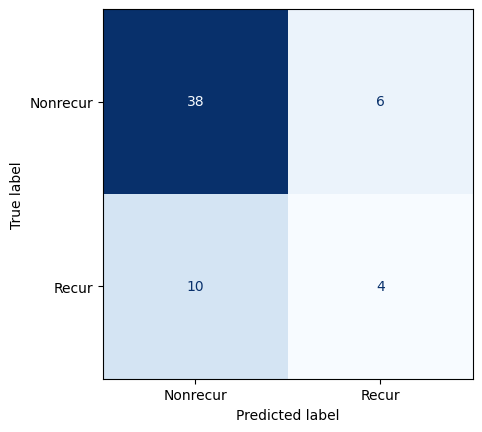

Accuracy %              : 72.4138%
Precision score         : 0.2857
Recall score            : 0.4
F1 score                : 0.7411
Cross Validation score  : 0.0
Training time           : 0.0212 Seconds




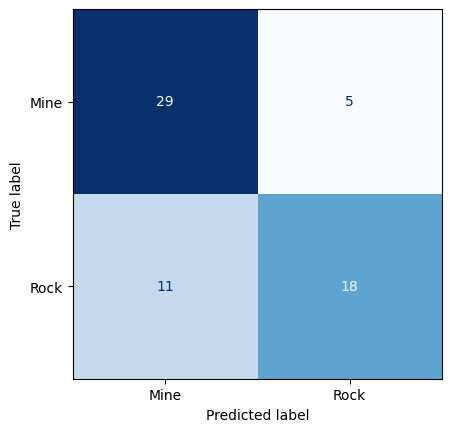

Accuracy %              : 74.6032%
Precision score         : 0.6207
Recall score            : 0.7826
F1 score                : 0.7504
Cross Validation score  : 0.5761
Training time           : 0.001 Seconds




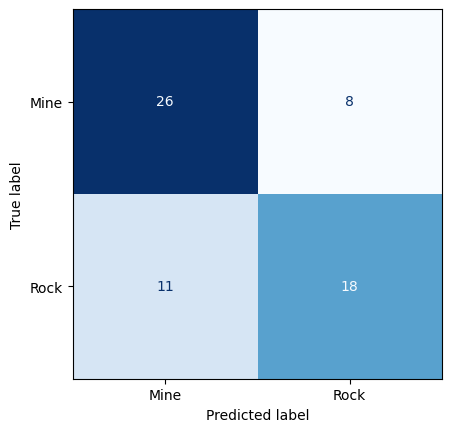

Accuracy %              : 69.8413%
Precision score         : 0.6207
Recall score            : 0.6923
F1 score                : 0.7003
Cross Validation score  : 0.6096
Training time           : 0.001 Seconds




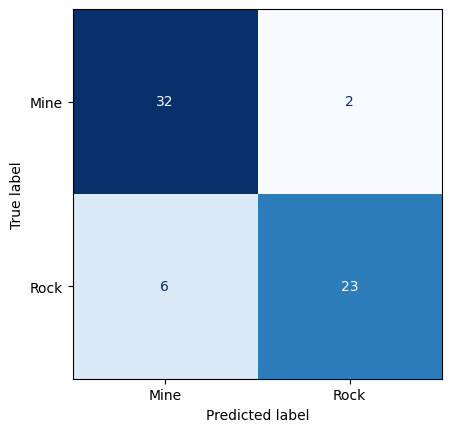

Accuracy %              : 87.3016%
Precision score         : 0.7931
Recall score            : 0.92
F1 score                : 0.8742
Cross Validation score  : 0.5304
Training time           : 0.001 Seconds




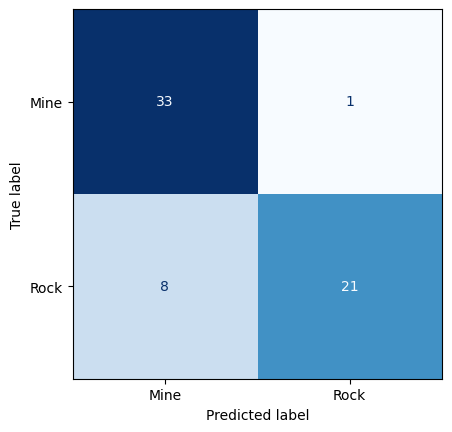

Accuracy %              : 85.7143%
Precision score         : 0.7241
Recall score            : 0.9545
F1 score                : 0.8603
Cross Validation score  : 0.5696
Training time           : 0.0 Seconds




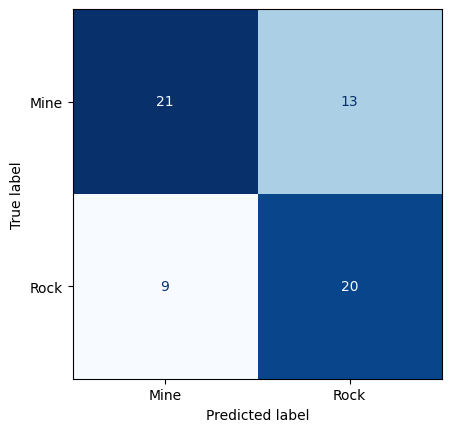

Accuracy %              : 65.0794%
Precision score         : 0.6897
Recall score            : 0.6061
F1 score                : 0.6504
Cross Validation score  : 0.6528
Training time           : 0.006 Seconds




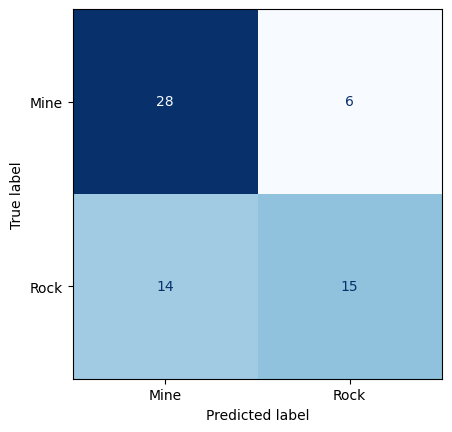

Accuracy %              : 68.254%
Precision score         : 0.5172
Recall score            : 0.7143
F1 score                : 0.6912
Cross Validation score  : 0.5945
Training time           : 0.0011 Seconds




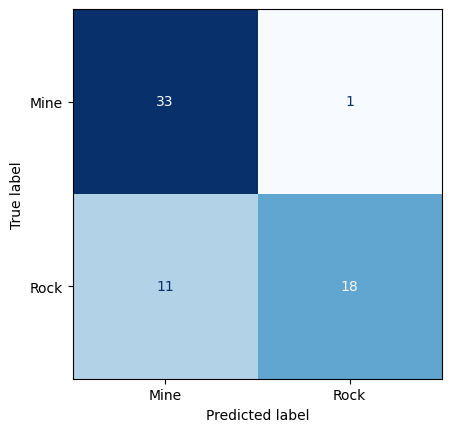

Accuracy %              : 80.9524%
Precision score         : 0.6207
Recall score            : 0.9474
F1 score                : 0.8172
Cross Validation score  : 0.5551
Training time           : 0.001 Seconds




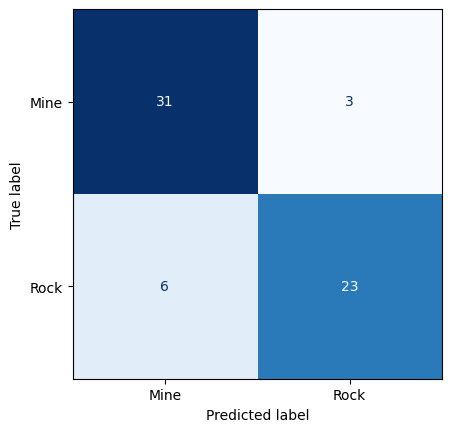

Accuracy %              : 85.7143%
Precision score         : 0.7931
Recall score            : 0.8846
F1 score                : 0.858
Cross Validation score  : 0.6331
Training time           : 0.003 Seconds




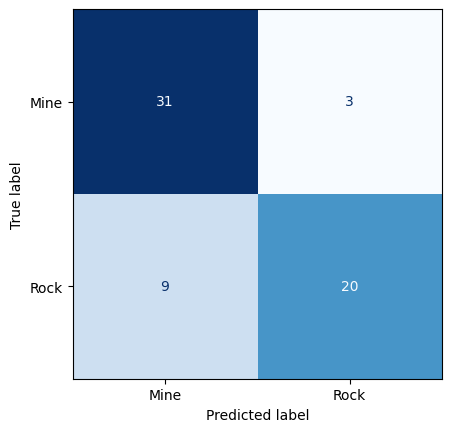

Accuracy %              : 80.9524%
Precision score         : 0.6897
Recall score            : 0.8696
F1 score                : 0.8128
Cross Validation score  : 0.7294
Training time           : 0.1752 Seconds




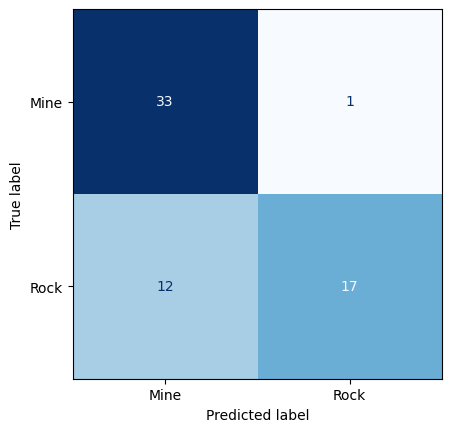

Accuracy %              : 79.3651%
Precision score         : 0.5862
Recall score            : 0.9444
F1 score                : 0.8034
Cross Validation score  : 0.7008
Training time           : 0.0873 Seconds




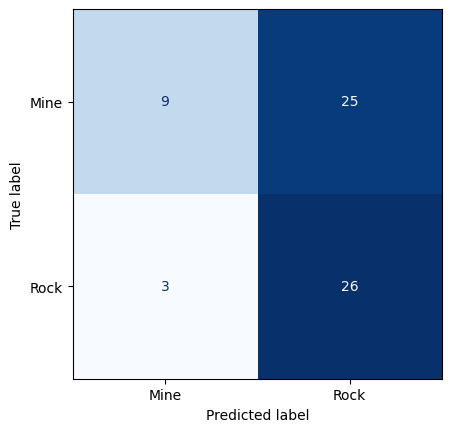

Accuracy %              : 55.5556%
Precision score         : 0.8966
Recall score            : 0.5098
F1 score                : 0.6007
Cross Validation score  : 0.0
Training time           : 0.0961 Seconds




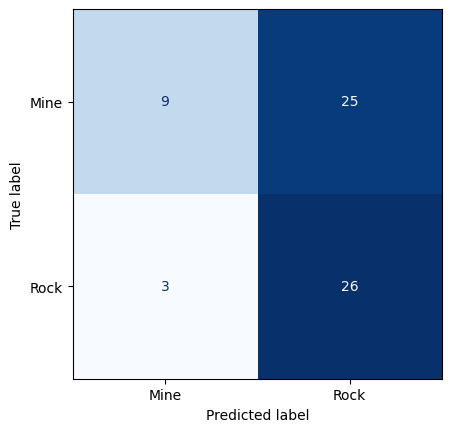

Accuracy %              : 55.5556%
Precision score         : 0.8966
Recall score            : 0.5098
F1 score                : 0.6007
Cross Validation score  : 0.0
Training time           : 0.0922 Seconds




C:\Users\royma\anaconda3\envs\cuda\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


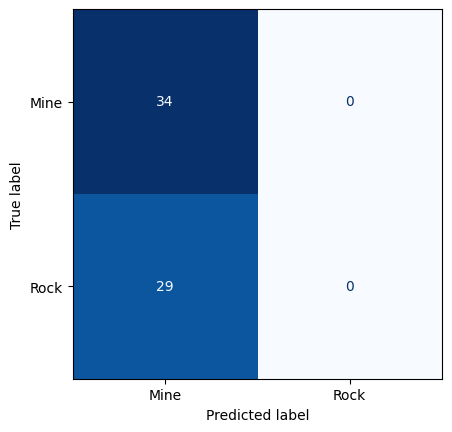

Accuracy %              : 53.9683%
Precision score         : 0.0
Recall score            : 0.0
F1 score                : 0.701
Cross Validation score  : 0.0
Training time           : 0.0385 Seconds




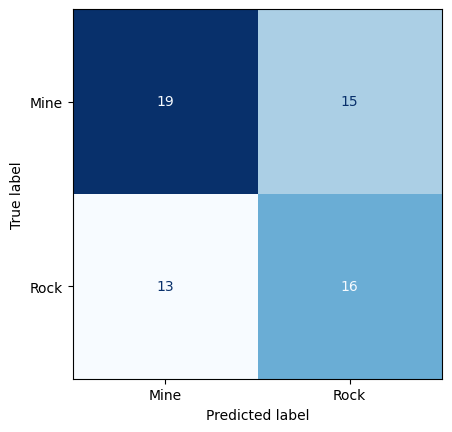

Accuracy %              : 55.5556%
Precision score         : 0.5517
Recall score            : 0.5161
F1 score                : 0.5549
Cross Validation score  : 0.0
Training time           : 0.1147 Seconds




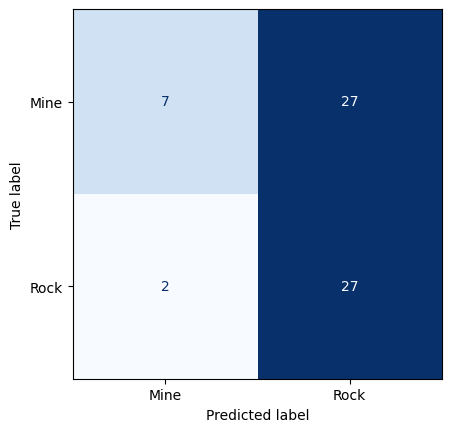

Accuracy %              : 53.9683%
Precision score         : 0.931
Recall score            : 0.5
F1 score                : 0.6042
Cross Validation score  : 0.0
Training time           : 0.0186 Seconds




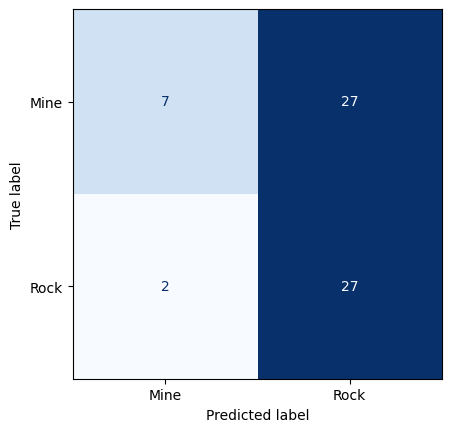

Accuracy %              : 53.9683%
Precision score         : 0.931
Recall score            : 0.5
F1 score                : 0.6042
Cross Validation score  : 0.0
Training time           : 0.023 Seconds




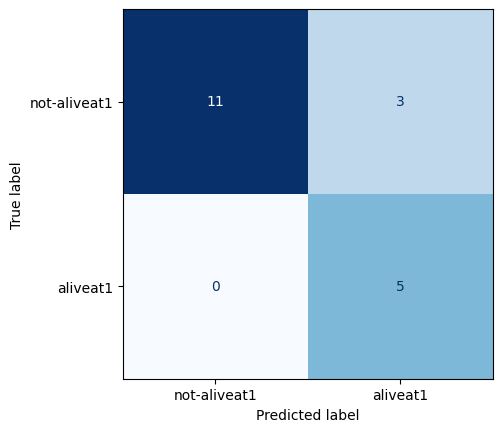

Accuracy %              : 84.2105%
Precision score         : 1.0
Recall score            : 0.625
F1 score                : 0.8334
Cross Validation score  : 0.9846
Training time           : 0.001 Seconds




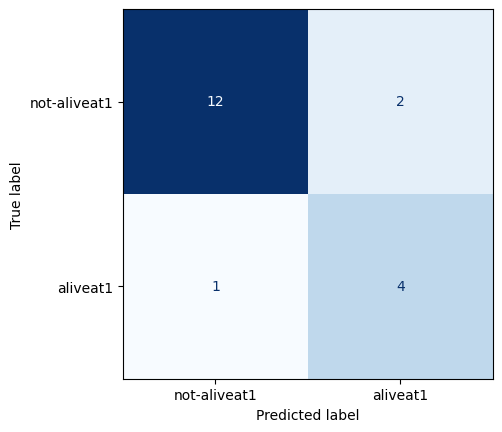

Accuracy %              : 84.2105%
Precision score         : 0.8
Recall score            : 0.6667
F1 score                : 0.8379
Cross Validation score  : 0.8551
Training time           : 0.001 Seconds




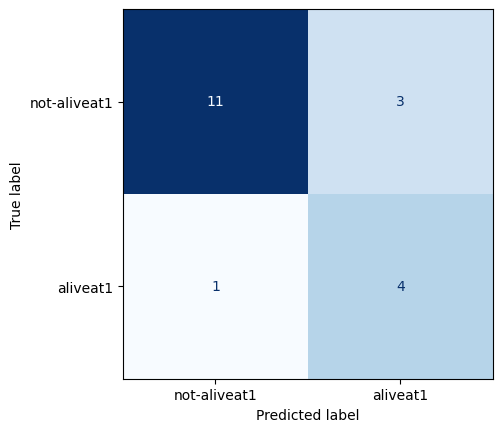

Accuracy %              : 78.9474%
Precision score         : 0.8
Recall score            : 0.5714
F1 score                : 0.78
Cross Validation score  : 1.0
Training time           : 0.0009 Seconds




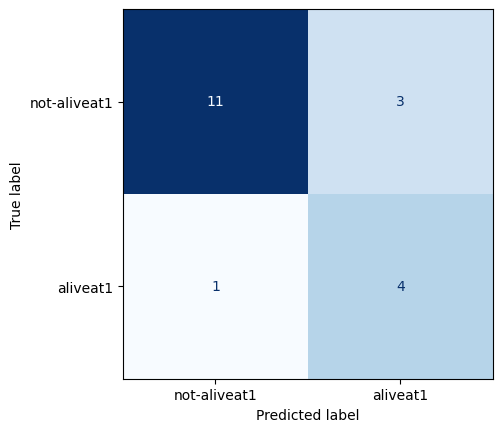

Accuracy %              : 78.9474%
Precision score         : 0.8
Recall score            : 0.5714
F1 score                : 0.78
Cross Validation score  : 1.0
Training time           : 0.001 Seconds




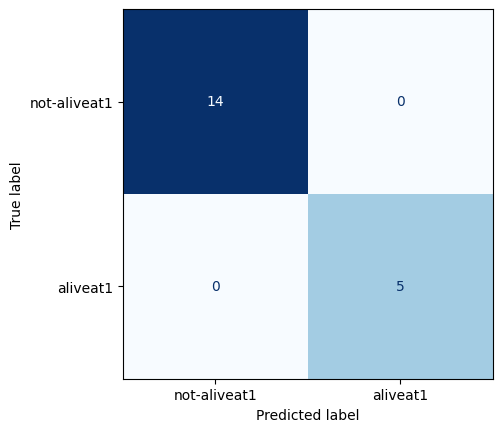

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9513
Training time           : 0.001 Seconds




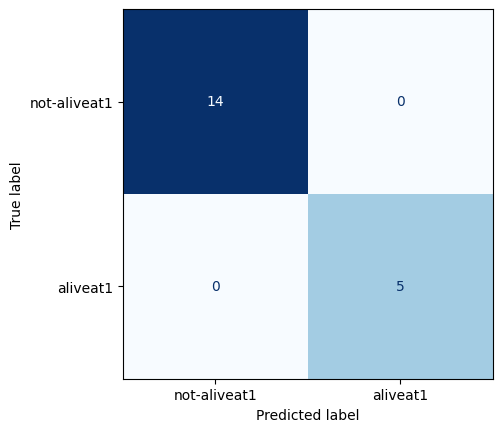

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9513
Training time           : 0.002 Seconds




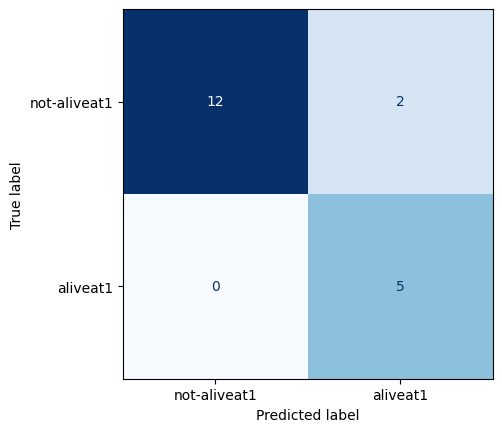

Accuracy %              : 89.4737%
Precision score         : 1.0
Recall score            : 0.7143
F1 score                : 0.89
Cross Validation score  : 0.9526
Training time           : 0.001 Seconds




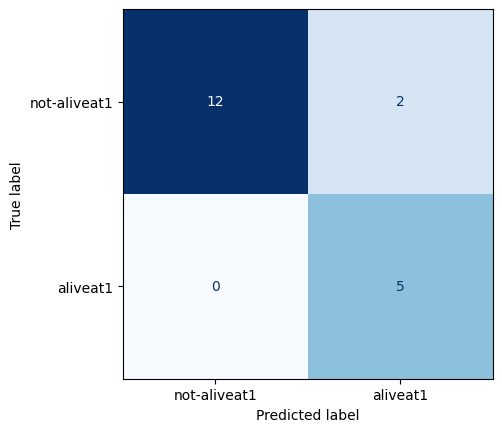

Accuracy %              : 89.4737%
Precision score         : 1.0
Recall score            : 0.7143
F1 score                : 0.89
Cross Validation score  : 0.9526
Training time           : 0.001 Seconds




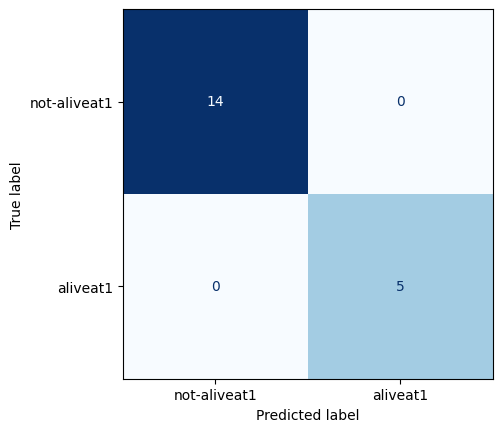

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9846
Training time           : 0.1301 Seconds




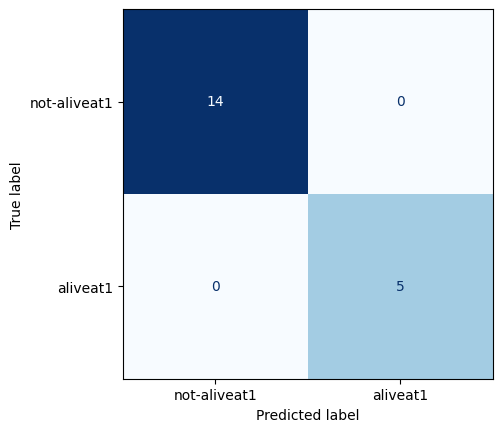

Accuracy %              : 100.0%
Precision score         : 1.0
Recall score            : 1.0
F1 score                : 1.0
Cross Validation score  : 0.9846
Training time           : 0.0657 Seconds




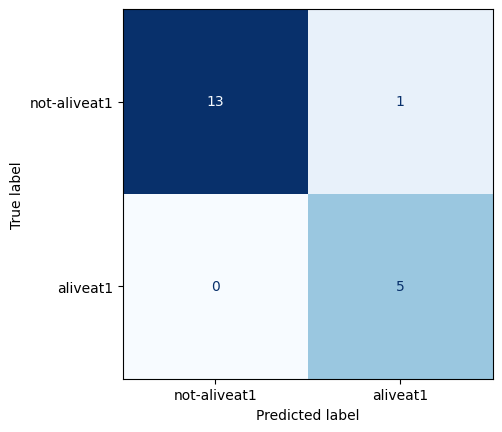

Accuracy %              : 94.7368%
Precision score         : 1.0
Recall score            : 0.8333
F1 score                : 0.946
Cross Validation score  : 0.0
Training time           : 0.0901 Seconds




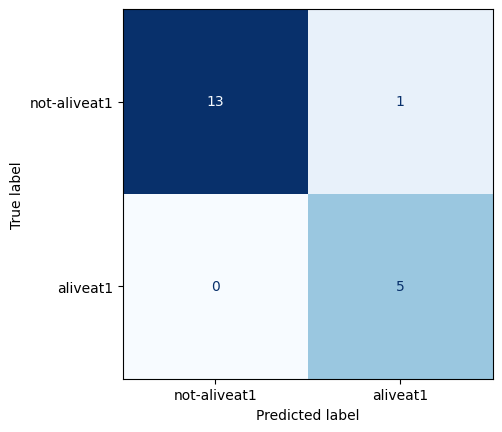

Accuracy %              : 94.7368%
Precision score         : 1.0
Recall score            : 0.8333
F1 score                : 0.946
Cross Validation score  : 0.0
Training time           : 0.0919 Seconds




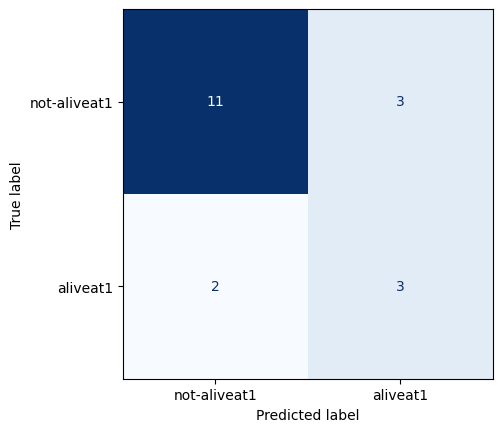

Accuracy %              : 73.6842%
Precision score         : 0.6
Recall score            : 0.5
F1 score                : 0.7298
Cross Validation score  : 0.0
Training time           : 0.0456 Seconds




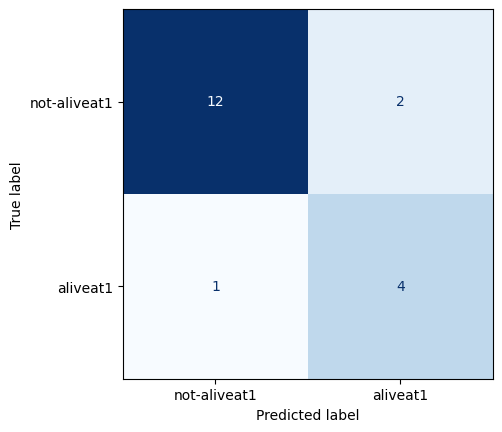

Accuracy %              : 84.2105%
Precision score         : 0.8
Recall score            : 0.6667
F1 score                : 0.8379
Cross Validation score  : 0.0
Training time           : 0.2137 Seconds




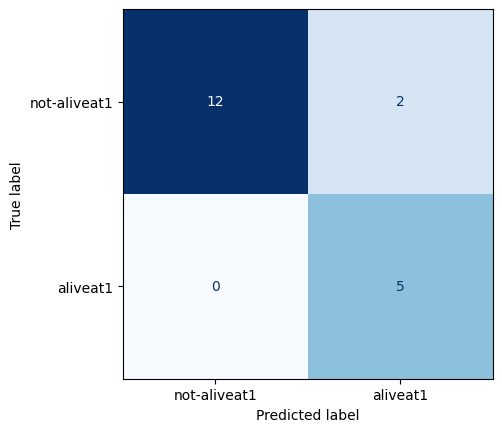

Accuracy %              : 89.4737%
Precision score         : 1.0
Recall score            : 0.7143
F1 score                : 0.89
Cross Validation score  : 0.0
Training time           : 0.007 Seconds




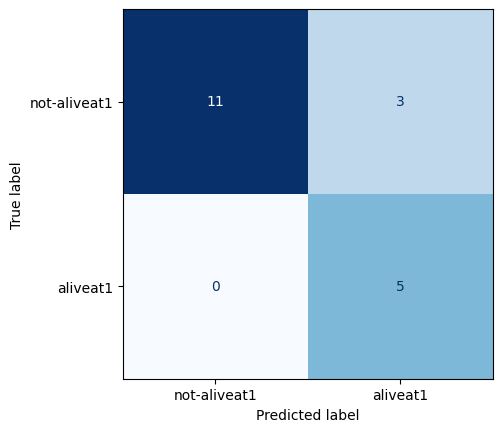

Accuracy %              : 84.2105%
Precision score         : 1.0
Recall score            : 0.625
F1 score                : 0.8334
Cross Validation score  : 0.0
Training time           : 0.0138 Seconds




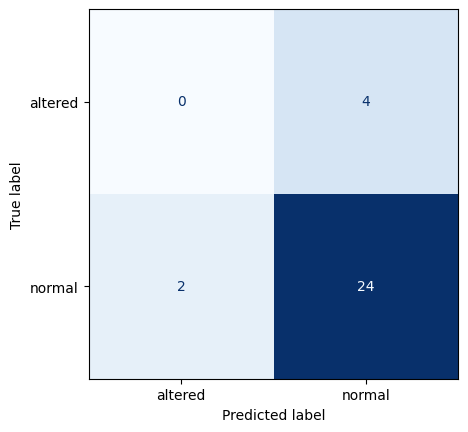

Accuracy %              : 80.0%
Precision score         : 0.9231
Recall score            : 0.8571
F1 score                : 0.8296
Cross Validation score  : 0.57
Training time           : 0.001 Seconds




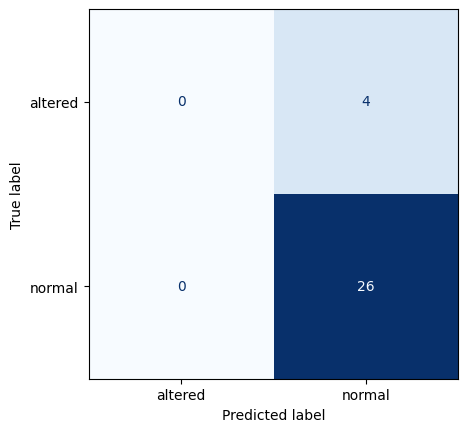

Accuracy %              : 86.6667%
Precision score         : 1.0
Recall score            : 0.8667
F1 score                : 0.9286
Cross Validation score  : 0.68
Training time           : 0.001 Seconds




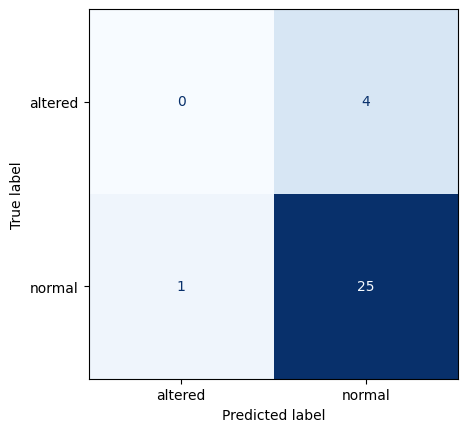

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.82
Training time           : 0.001 Seconds




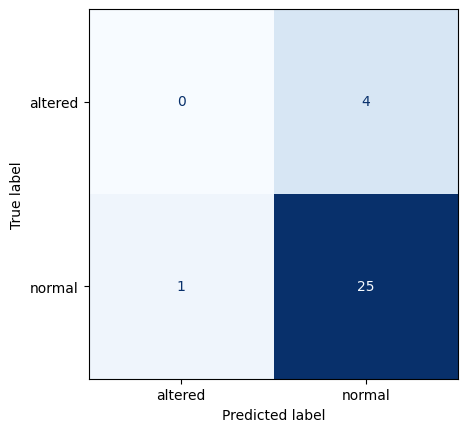

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.82
Training time           : 0.001 Seconds




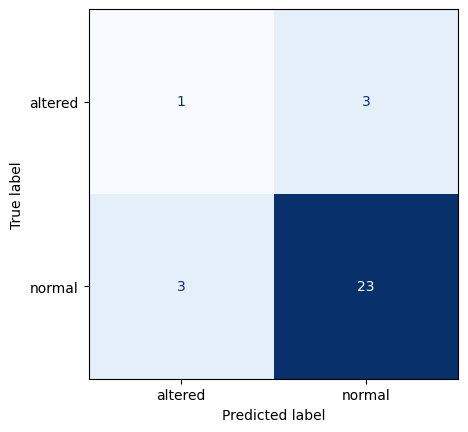

Accuracy %              : 80.0%
Precision score         : 0.8846
Recall score            : 0.8846
F1 score                : 0.8
Cross Validation score  : 0.73
Training time           : 0.002 Seconds




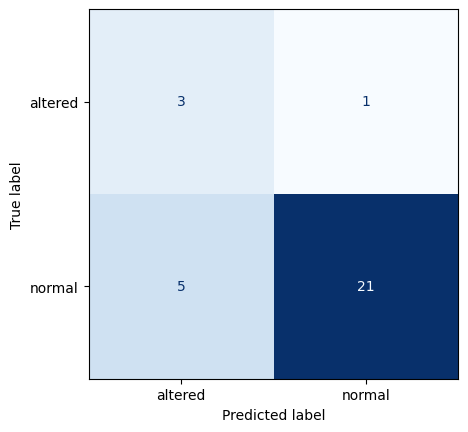

Accuracy %              : 80.0%
Precision score         : 0.8077
Recall score            : 0.9545
F1 score                : 0.775
Cross Validation score  : 0.77
Training time           : 0.002 Seconds




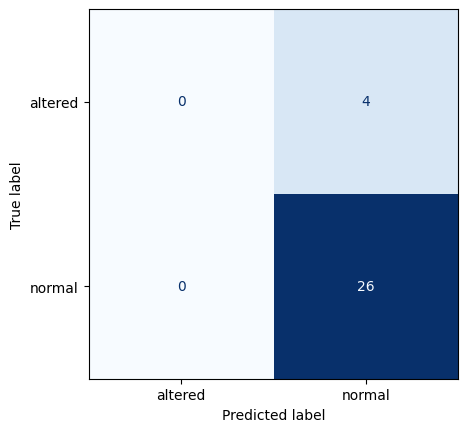

Accuracy %              : 86.6667%
Precision score         : 1.0
Recall score            : 0.8667
F1 score                : 0.9286
Cross Validation score  : 0.88
Training time           : 0.002 Seconds




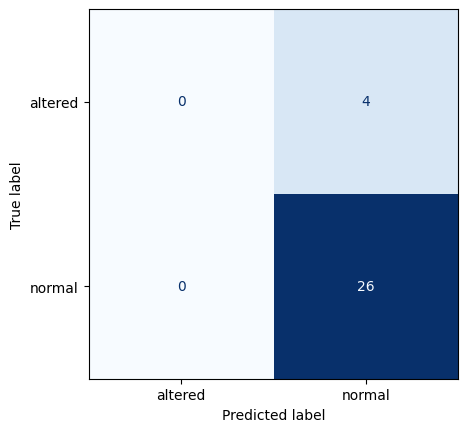

Accuracy %              : 86.6667%
Precision score         : 1.0
Recall score            : 0.8667
F1 score                : 0.9286
Cross Validation score  : 0.88
Training time           : 0.001 Seconds




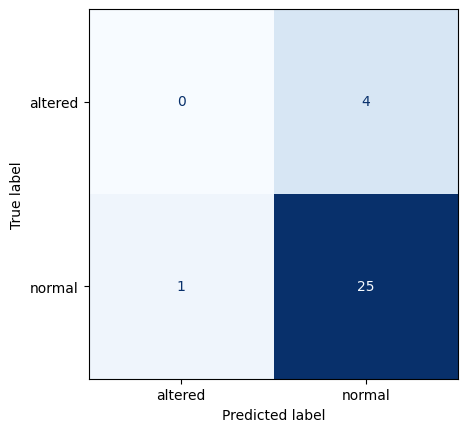

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.82
Training time           : 0.1373 Seconds




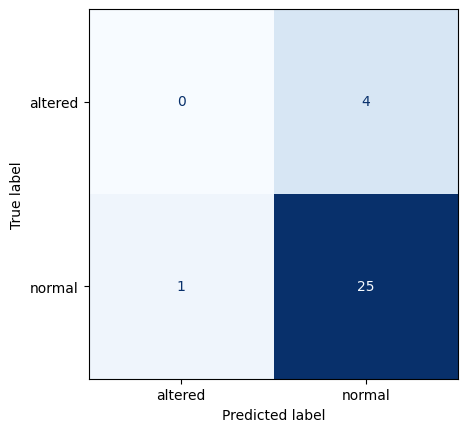

Accuracy %              : 83.3333%
Precision score         : 0.9615
Recall score            : 0.8621
F1 score                : 0.8788
Cross Validation score  : 0.85
Training time           : 0.0715 Seconds




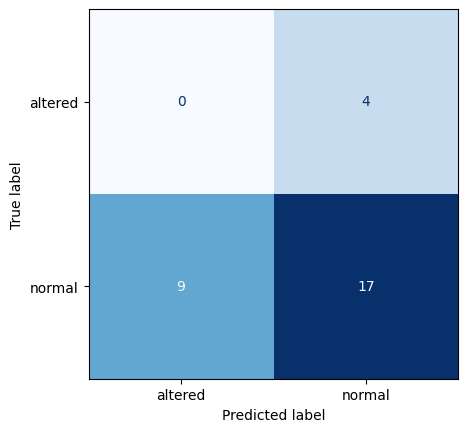

Accuracy %              : 56.6667%
Precision score         : 0.6538
Recall score            : 0.8095
F1 score                : 0.5064
Cross Validation score  : 0.0
Training time           : 0.097 Seconds




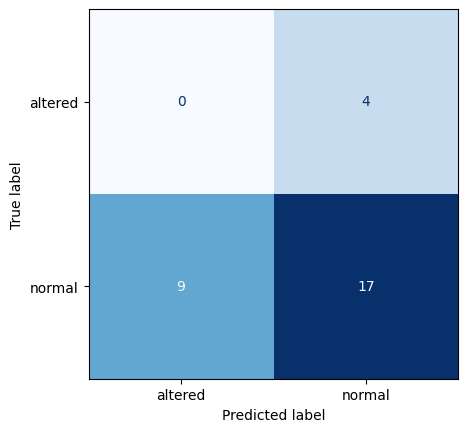

Accuracy %              : 56.6667%
Precision score         : 0.6538
Recall score            : 0.8095
F1 score                : 0.5064
Cross Validation score  : 0.0
Training time           : 0.0941 Seconds




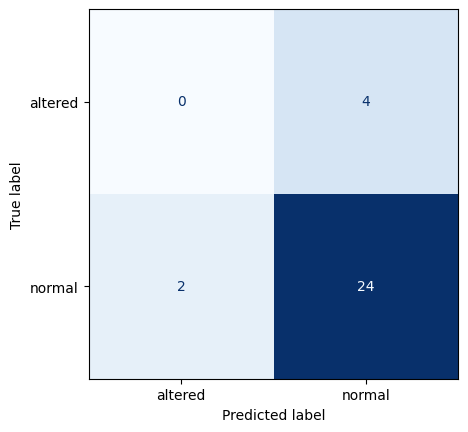

Accuracy %              : 80.0%
Precision score         : 0.9231
Recall score            : 0.8571
F1 score                : 0.8296
Cross Validation score  : 0.0
Training time           : 0.0376 Seconds




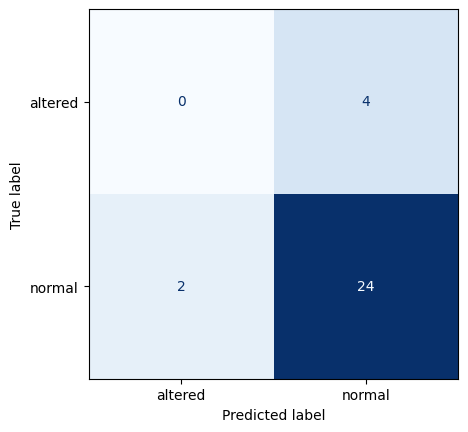

Accuracy %              : 80.0%
Precision score         : 0.9231
Recall score            : 0.8571
F1 score                : 0.8296
Cross Validation score  : 0.0
Training time           : 0.0115 Seconds




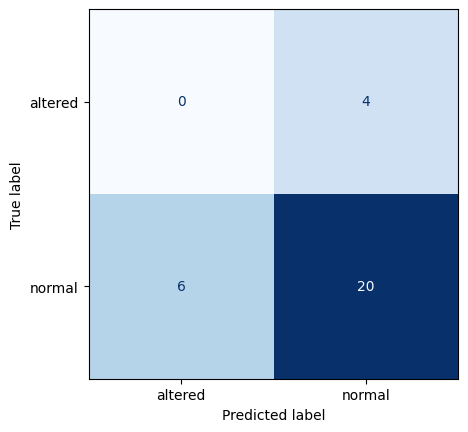

Accuracy %              : 66.6667%
Precision score         : 0.7692
Recall score            : 0.8333
F1 score                : 0.64
Cross Validation score  : 0.0
Training time           : 0.011 Seconds




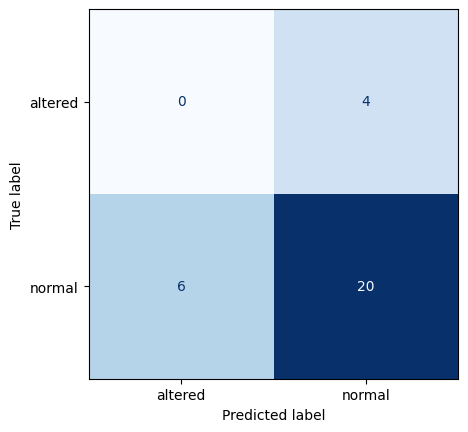

Accuracy %              : 66.6667%
Precision score         : 0.7692
Recall score            : 0.8333
F1 score                : 0.64
Cross Validation score  : 0.0
Training time           : 0.013 Seconds




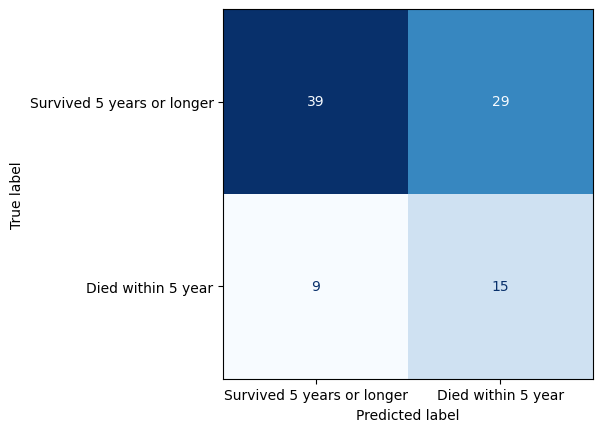

Accuracy %              : 58.6957%
Precision score         : 0.5735
Recall score            : 0.8125
F1 score                : 0.5618
Cross Validation score  : 0.742
Training time           : 0.001 Seconds




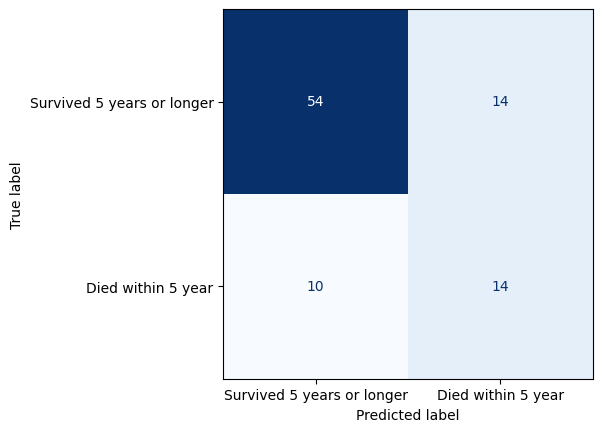

Accuracy %              : 73.913%
Precision score         : 0.7941
Recall score            : 0.8438
F1 score                : 0.733
Cross Validation score  : 0.7352
Training time           : 0.001 Seconds




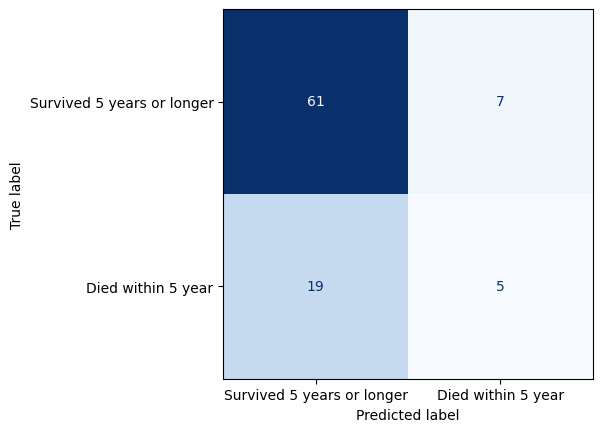

Accuracy %              : 71.7391%
Precision score         : 0.8971
Recall score            : 0.7625
F1 score                : 0.753
Cross Validation score  : 0.6631
Training time           : 0.0 Seconds




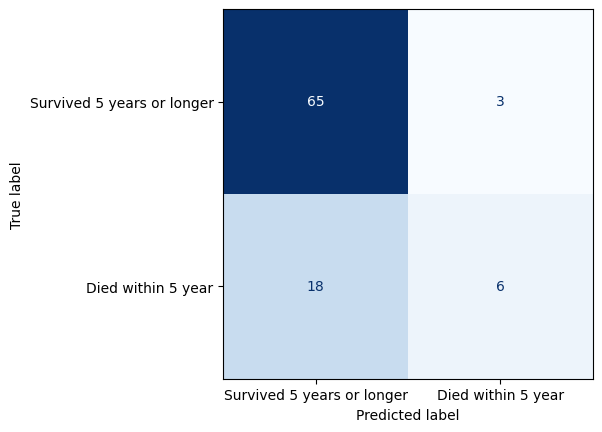

Accuracy %              : 77.1739%
Precision score         : 0.9559
Recall score            : 0.7831
F1 score                : 0.8123
Cross Validation score  : 0.7254
Training time           : 0.0 Seconds




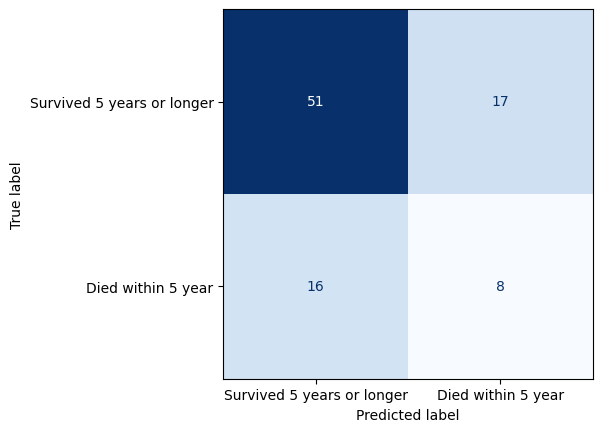

Accuracy %              : 64.1304%
Precision score         : 0.75
Recall score            : 0.7612
F1 score                : 0.639
Cross Validation score  : 0.6042
Training time           : 0.002 Seconds




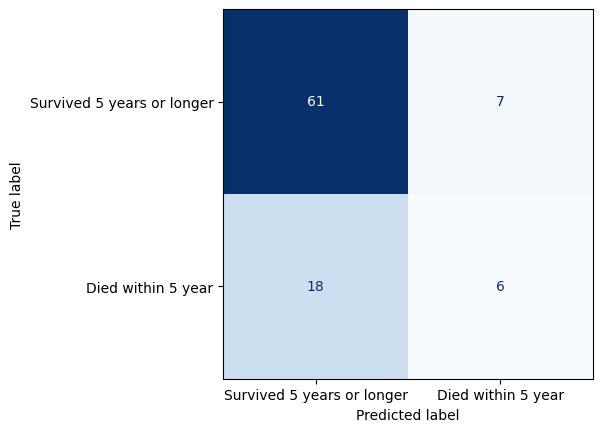

Accuracy %              : 72.8261%
Precision score         : 0.8971
Recall score            : 0.7722
F1 score                : 0.7585
Cross Validation score  : 0.6566
Training time           : 0.001 Seconds




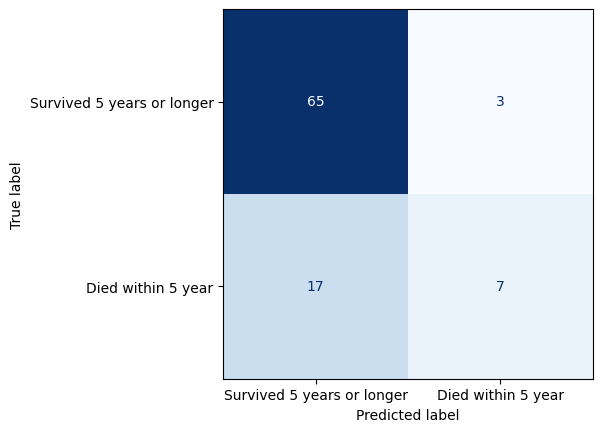

Accuracy %              : 78.2609%
Precision score         : 0.9559
Recall score            : 0.7927
F1 score                : 0.8172
Cross Validation score  : 0.7288
Training time           : 0.002 Seconds




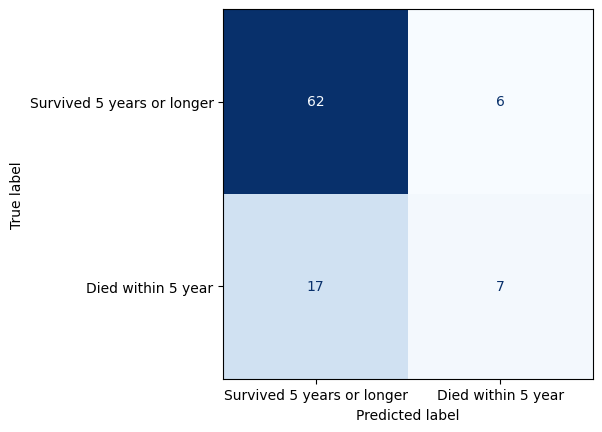

Accuracy %              : 75.0%
Precision score         : 0.9118
Recall score            : 0.7848
F1 score                : 0.7778
Cross Validation score  : 0.7549
Training time           : 0.003 Seconds




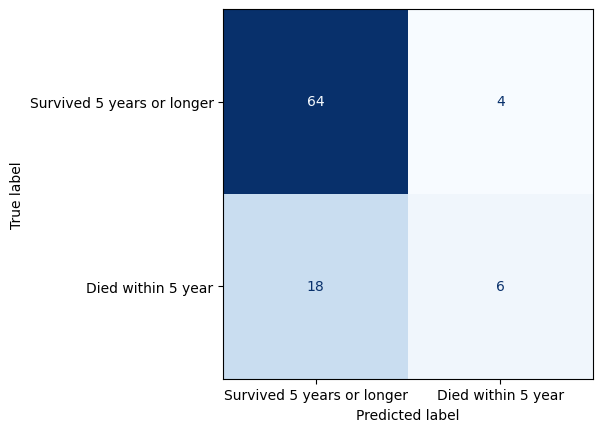

Accuracy %              : 76.087%
Precision score         : 0.9412
Recall score            : 0.7805
F1 score                : 0.7989
Cross Validation score  : 0.6796
Training time           : 0.1397 Seconds




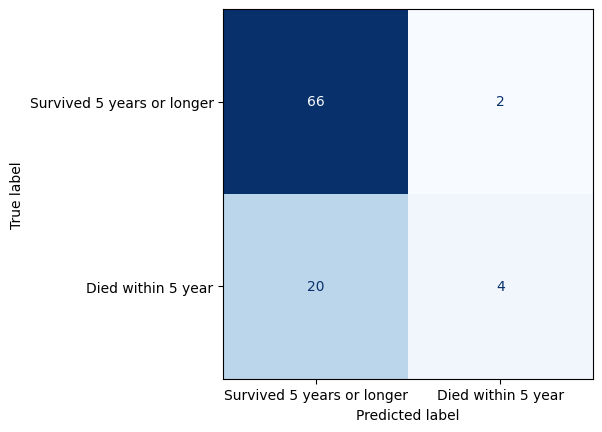

Accuracy %              : 76.087%
Precision score         : 0.9706
Recall score            : 0.7674
F1 score                : 0.8186
Cross Validation score  : 0.732
Training time           : 0.0727 Seconds




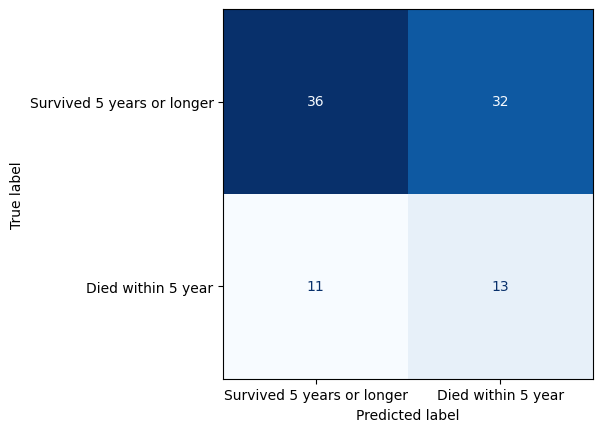

Accuracy %              : 53.2609%
Precision score         : 0.5294
Recall score            : 0.766
F1 score                : 0.5042
Cross Validation score  : 0.0
Training time           : 0.0984 Seconds




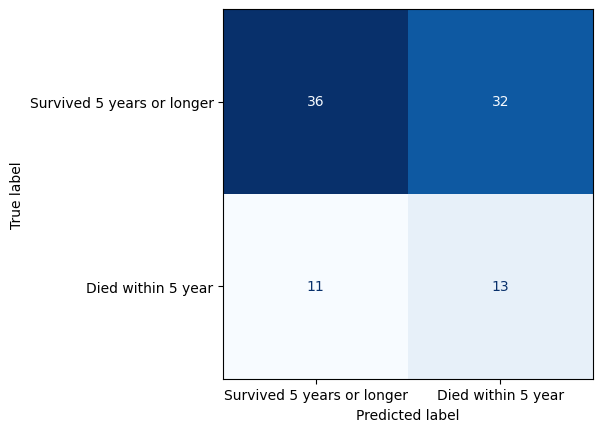

Accuracy %              : 53.2609%
Precision score         : 0.5294
Recall score            : 0.766
F1 score                : 0.5042
Cross Validation score  : 0.0
Training time           : 0.0901 Seconds




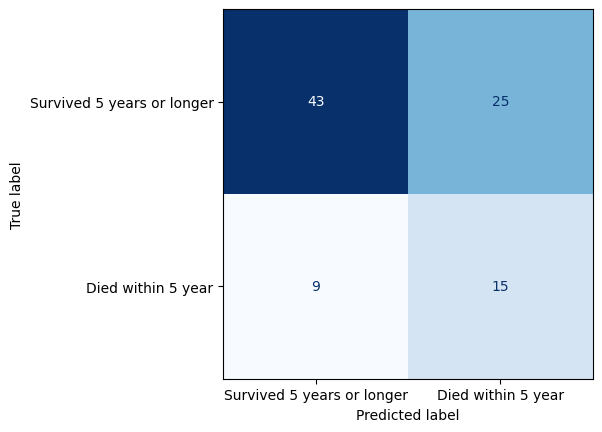

Accuracy %              : 63.0435%
Precision score         : 0.6324
Recall score            : 0.8269
F1 score                : 0.6089
Cross Validation score  : 0.0
Training time           : 0.1172 Seconds




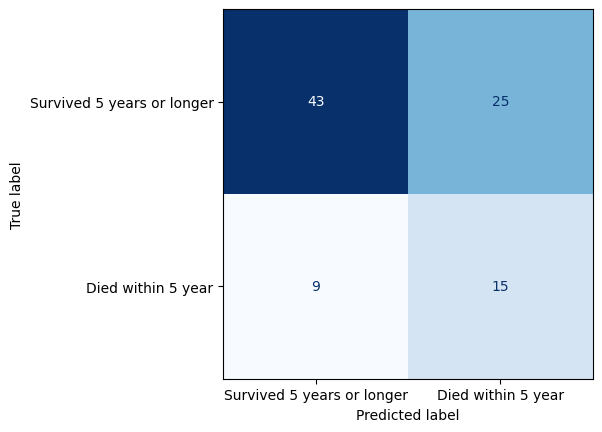

Accuracy %              : 63.0435%
Precision score         : 0.6324
Recall score            : 0.8269
F1 score                : 0.6089
Cross Validation score  : 0.0
Training time           : 0.1518 Seconds




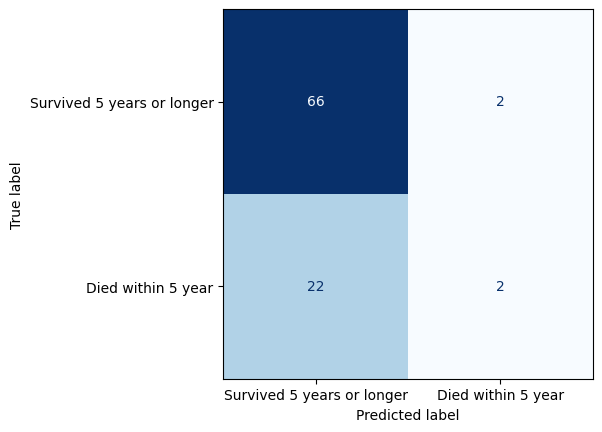

Accuracy %              : 73.913%
Precision score         : 0.9706
Recall score            : 0.75
F1 score                : 0.8156
Cross Validation score  : 0.0
Training time           : 0.015 Seconds




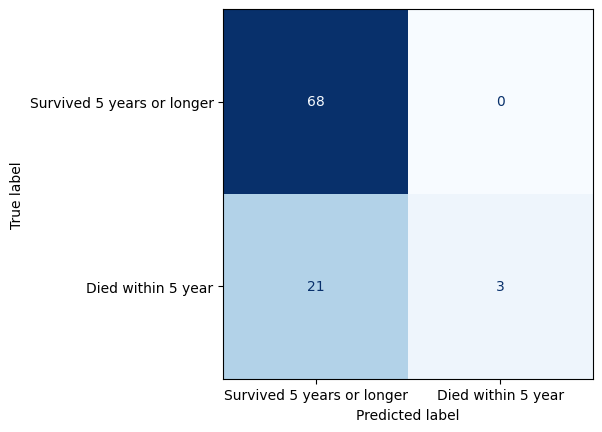

Accuracy %              : 77.1739%
Precision score         : 1.0
Recall score            : 0.764
F1 score                : 0.8452
Cross Validation score  : 0.0
Training time           : 0.012 Seconds




In [135]:
all_metrics_per_model_withGridSearch = {}
all_metrics_per_file_withGridSearch = {}
accuracy_rounded = 0.0
precision_rounded = 0.0
recall_rounded = 0.0
f1_rounded = 0.0
cv_scores_rounded = 0.0
training_time_rounded = 0.0
accuracy_rounded_gs = 0.0
precision_rounded_gs = 0.0
recall_rounded_gs = 0.0
f1_rounded_gs = 0.0
cv_scores_rounded_gs = 0.0
training_time_rounded_gs = 0.0
accuracy_gs = 0.0
precision_gs = 0.0
recall_gs = 0.0
f1_gs = 0.0
cv_scores_gs = 0.0
training_time_gs = 0.0
current_model = ''

# Run the intial model. Do grid search and run the best model.
for key, value in file_details.items():
    
    display(HTML("<h2><b>{} dataset</b></h2>".format(key)))
    
    # Initialize all_metrics_per_file for the given file, if not done already
    if key not in all_metrics_per_file_withGridSearch:
        all_metrics_per_file_withGridSearch[key] = {}
        
    for model_key, model_value in models_with_grid_parameters.items():   
        current_model = model_value['model']
        display(HTML("<h4><b>Results from {} for dataset {}</b></h4>".format(model_value['model'], key)))
        accuracy, precision, recall, f1, cv_scores,training_time = value['instance_model_processing'].modelling(value['X'], value['y'], model_value['model'], value['label_values'], value['label_context'], value['positive_class'])

        # Round-off the metrics
        accuracy_rounded = round(accuracy * 100, 4)
        precision_rounded = round(precision, 4)
        recall_rounded = round(recall, 4)
        f1_rounded = round(f1, 4)
        cv_scores_rounded = round(np.mean(cv_scores), 4)
        training_time_rounded = round(training_time, 4)      

        
        # Print results    
        print(f'Accuracy %              : {accuracy_rounded}%')
        print(f'Precision score         : {precision_rounded}')
        print(f'Recall score            : {recall_rounded}')
        print(f'F1 score                : {f1_rounded}')        
        print(f'Cross Validation score  : {cv_scores_rounded}')
        print(f'Training time           : {training_time_rounded} Seconds')
        print('\n')

        # Perform grid search if grid parameters are available for the model and if the accuracy from the original model is not good (less than 95%).        
        # Doing it all the time.
        if model_value.get('param_grid') is not None:  # and accuracy < 0.95:
            # Get the best model from grid search
            best_model, params = value['instance_model_processing'].grid_search(value['X'], value['y'], model_value['model'] ,model_value['param_grid'])                        
            display(HTML("<h4><b>Results from best model {} after grid search for dataset {}</b></h4>".format(best_model, key)))            
            # Run the best model
            accuracy_gs, precision_gs, recall_gs, f1_gs, cv_scores_gs,training_time_gs = value['instance_model_processing'].modelling(value['X'], value['y'], best_model, value['label_values'], value['label_context'], value['positive_class'])
            
            # Round-off the metrics
            accuracy_gs_rounded = round(accuracy_gs * 100, 4)
            precision_gs_rounded = round(precision_gs, 4)
            recall_gs_rounded = round(recall_gs, 4)
            f1_gs_rounded = round(f1_gs, 4)
            cv_scores_gs_rounded = round(np.mean(cv_scores_gs), 4)
            training_time_gs_rounded = round(training_time_gs, 4)
            
            # Print results    
            print(f'Accuracy %              : {accuracy_gs_rounded}%')
            print(f'Precision score         : {precision_gs_rounded}')
            print(f'Recall score            : {recall_gs_rounded}')
            print(f'F1 score                : {f1_gs_rounded}')        
            print(f'Cross Validation score  : {cv_scores_gs_rounded}')
            print(f'Training time           : {training_time_gs_rounded} Seconds')
            print('\n')


        # Check if the accuracy from grid search is better.. If so then consider it otherwise not..
        if accuracy_gs > accuracy:
            accuracy_rounded = accuracy_gs_rounded
            precision_rounded = precision_gs_rounded
            recall_rounded = recall_gs_rounded
            f1_rounded = f1_gs_rounded
            cv_scores_rounded = cv_scores_gs_rounded
            training_time_rounded = training_time_gs_rounded 

        # Initialize all_metrics_per_model for the given model, if not done already
        if current_model not in all_metrics_per_model_withGridSearch:
            all_metrics_per_model_withGridSearch[current_model] = {
                'accuracy': [],
                'precision': [],
                'recall': [],
                'f1': [],
                'cv_scores': [],
                'training_time': []
            }
            
        # Save all metrics per model (best of original model and model from grid search)
        all_metrics_per_model_withGridSearch[current_model]['accuracy'].append(accuracy_rounded)
        all_metrics_per_model_withGridSearch[current_model]['precision'].append(precision_rounded)
        all_metrics_per_model_withGridSearch[current_model]['recall'].append(recall_rounded)
        all_metrics_per_model_withGridSearch[current_model]['f1'].append(f1_rounded)
        all_metrics_per_model_withGridSearch[current_model]['cv_scores'].append(cv_scores_rounded)
        all_metrics_per_model_withGridSearch[current_model]['training_time'].append(training_time_rounded)


        # Initialize model entry in all_metrics_per_file_withGridSearch for the given file, if not done already
        if current_model not in all_metrics_per_file_withGridSearch[key]:            
            all_metrics_per_file_withGridSearch[key][current_model] = {
                    'accuracy': 0.0,
                    'precision': 0.0,
                    'recall': 0.0,
                    'f1': 0.0,
                    'cv_scores': 0.0,
                    'training_time': 0.0
                }
            
        # Save all metrics per file (best of original model and model from grid search)
        all_metrics_per_file_withGridSearch[key][current_model]['accuracy'] = accuracy_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['precision'] = precision_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['recall'] = recall_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['f1'] = f1_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['cv_scores'] = cv_scores_rounded
        all_metrics_per_file_withGridSearch[key][current_model]['training_time'] = training_time_rounded
            

In [136]:
# Flatten all_metrics_per_file
data = []
for file, models in all_metrics_per_file_withGridSearch.items():
    for model, metrics in models.items():
        row = {'file': file, 'model': model}
        row.update(metrics)
        data.append(row)

# Create DataFrame
df = pd.DataFrame(data)

# Sort DataFrames by 'accuracy' in descending order. We want to rank models per accuracy
df.columns = ['File name', 'Model' ,'Accuracy %', 'Precision score','Recall score','F1 score','Cross Validation score','Training time (seconds)']
df_all_metrics_per_file_withGridSearch = df.sort_values(by=["File name", "Accuracy %"], ascending=[True, False])


# Save DataFrames to CSV files
df_all_metrics_per_file_withGridSearch.to_csv("all_metrics_per_file_withGridSearchAllCases.csv", index=False, sep=";")
#print(df_all_metrics_per_file_withGridSearch.head)

In [137]:
# Calculate the mean of metrics for each model
mean_metrics_per_model_withGridSearch = {}

mean_metrics_per_model_withGridSearch = {
    model: {
        metric: round(np.mean(values),4) if values else None
        for metric, values in metrics.items()
    }
    for model, metrics in all_metrics_per_model_withGridSearch.items()
}

# Convert dictionaries to DataFrames
df_mean_metrics_per_model_withGridSearch = pd.DataFrame.from_dict(mean_metrics_per_model_withGridSearch, orient="index")

# Sort DataFrames by 'accuracy' in descending order. We want to rank models per accuracy
df_mean_metrics_per_model_withGridSearch = df_mean_metrics_per_model_withGridSearch.sort_values(by="accuracy", ascending=False)
 

# Save DataFrames to CSV files
df_mean_metrics_per_model_withGridSearch.columns = ['Accuracy %', 'Precision score','Recall score','F1 score','Cross Validation score','Training time (seconds)']
df_mean_metrics_per_model_withGridSearch.to_csv("mean_metrics_per_model_withGridSearchAllCases.csv", index=True, sep=";")
print(df_mean_metrics_per_model_withGridSearch.head)

<bound method NDFrame.head of                                                     Accuracy %  \
(DecisionTreeClassifier(max_features='sqrt', ra...     86.0260   
SVC()                                                  85.8228   
KNeighborsClassifier(n_neighbors=3)                    83.2508   
Perceptron(max_iter=100, tol=True)                     82.5905   
DecisionTreeClassifier(random_state=12345)             81.5755   
GaussianMixture(n_components=2)                        75.3945   
Birch(n_clusters=2)                                    71.7951   
KMeans(n_clusters=2, n_init=10, random_state=12...     71.4832   

                                                    Precision score  \
(DecisionTreeClassifier(max_features='sqrt', ra...           0.7776   
SVC()                                                        0.7769   
KNeighborsClassifier(n_neighbors=3)                          0.7290   
Perceptron(max_iter=100, tol=True)                           0.7852   
DecisionTreeClassifi